In [13]:
# autoreload nangs
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [14]:
#imports
import math
import numpy as np 
import matplotlib.pyplot as plt 
import torch

In [15]:
from nangs.pde import PDE
from nangs.bocos import PeriodicBoco, DirichletBoco, NeumannBoco
from nangs.solutions import MLP

class MyPDE(PDE):
    def __init__(self, inputs=None, outputs=None, order=2):
        super().__init__(inputs, outputs, order=order)
    def computePDELoss(self, grads, inputs, outputs, params): 
        dpdt = grads['p']['t']
        d2pdx2, d2pdy2 = grads['2p']['xx'], grads['2p']['yy']
        print("dpdt=", dpdt)
        print("d2pdx2=", d2pdx2)
        print("d2pdy2=", d2pdy2)
        return [dpdt - (d2pdx2 + d2pdy2)]

# instanciate pde
pde = MyPDE(inputs=['x', 'y', 't'], outputs=['p'])

# define input values
x = np.linspace(0,0.3,10)
y = np.linspace(0,1,20)
t = np.linspace(0,200,100)

pde.setValues({'x': x, 'y': y, 't': t})

In [16]:
# initial condition (dirichlet for temporal dimension)
p0 = np.full(len(y[1:-1])*len(x[1:-1]), 0.2)       
boco = DirichletBoco('initial_condition', {'x': x[1:-1], 'y': y[1:-1], 't': np.array([0])}, {'p': p0})
pde.addBoco(boco)

boco = DirichletBoco('bottom', {'x': x, 'y': y[:1], 't': t}, {'p': np.full(len(x)*len(t), 0.2)})
pde.addBoco(boco)

boco = DirichletBoco('top', {'x': x, 'y': y[-1:], 't': t}, {'p': np.full(len(x)*len(t), 0.2)})
pde.addBoco(boco)

boco = DirichletBoco('left', {'x': x[:1], 'y': y, 't': t}, {'p': np.full(len(y)*len(t), 1.0)})
pde.addBoco(boco)

boco = DirichletBoco('right', {'x': x[-1:], 'y': y, 't': t}, {'p': np.full(len(y)*len(t), 0.5)})
pde.addBoco(boco)

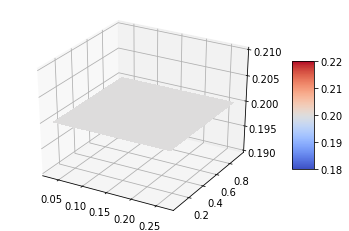

In [17]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm

fig = plt.figure()
ax = fig.gca(projection='3d')
X, Y = np.meshgrid(x[1:-1], y[1:-1])
surf = ax.plot_surface(X, Y, p0.reshape((len(y[1:-1]),len(x[1:-1]))), cmap=cm.coolwarm, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()

In [18]:
# define solution topology
mlp = MLP(pde.n_inputs, pde.n_outputs, 5, 256)
optimizer = torch.optim.Adam(mlp.parameters(), lr=3e-4)
pde.compile(mlp, optimizer)

In [19]:
# find the solution
hist = pde.solve(epochs=20) 

dpdt= tensor([-1.1160e-04, -1.0329e-04, -8.7039e-05, -1.2486e-04, -1.2443e-04,
        -1.0099e-04, -4.7373e-05, -8.4075e-05, -1.2368e-04,  3.5694e-04,
        -1.1201e-04, -1.1504e-04, -9.2652e-05, -1.2412e-04, -1.2975e-04,
        -3.6311e-04, -1.1701e-04, -8.5455e-05, -8.5311e-05, -6.1781e-05,
        -8.5311e-05, -8.5311e-05, -1.2443e-04, -1.1545e-04, -5.5215e-05,
        -1.2314e-04, -1.2486e-04, -1.2443e-04, -1.2486e-04, -1.2486e-04,
        -8.5311e-05, -8.5773e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0032, 0.0033, 0.0032, 0.0031, 0.0033, 0.0022, 0.0031, 0.

dpdt= tensor([ 0.0012,  0.0020,  0.0020,  0.0019,  0.0021,  0.0020,  0.0020,  0.0020,
         0.0016,  0.0021,  0.0021,  0.0019,  0.0019,  0.0020,  0.0021,  0.0021,
         0.0021,  0.0020,  0.0020,  0.0021,  0.0021,  0.0021,  0.0020,  0.0021,
         0.0020,  0.0021, -0.0002,  0.0018,  0.0021,  0.0017,  0.0020,  0.0020],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0026, 0.0019, 0.0027, 0.0024, 0.0026, 0.0027, 0.0027, 0.0027, 0.0027,
        0.0027, 0.0027, 0.0027, 0.0027, 0.0027, 0.0026, 0.0027, 0.0020, 0.0027,
        0.0027, 0.0027, 0.0024, 0.0026, 0.0026, 0.0

dpdt= tensor([0.0021, 0.0022, 0.0020, 0.0021, 0.0021, 0.0022, 0.0020, 0.0022, 0.0020,
        0.0021, 0.0022, 0.0022, 0.0021, 0.0018, 0.0020, 0.0022, 0.0022, 0.0021,
        0.0022, 0.0022, 0.0022, 0.0022, 0.0021, 0.0015, 0.0019, 0.0022, 0.0021,
        0.0022, 0.0022, 0.0022, 0.0022, 0.0022], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0015, 0.0015, 0.0008, 0.0014, 0.0015, 0.0014, 0.0008, 0.0015, 0.0015,
        0.0015, 0.0015, 0.0015, 0.0014, 0.0014, 0.0015, 0.0014, 0.0015, 0.0011,
        0.0018, 0.0015, 0.0013, 0.0015, 0.0014, 0.0014, 0.0015, 0.0012, 0.0013,
   

dpdt= tensor([0.0008, 0.0010, 0.0010, 0.0006, 0.0010, 0.0010, 0.0009, 0.0010, 0.0007,
        0.0014, 0.0008, 0.0010, 0.0010, 0.0008, 0.0010, 0.0008, 0.0010, 0.0005,
        0.0008, 0.0010, 0.0006, 0.0006, 0.0045, 0.0008, 0.0006, 0.0008, 0.0010,
        0.0009, 0.0010, 0.0010, 0.0009, 0.0010], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0022,  0.0013,  0.0040,  0.0014,  0.0015,  0.0014, -0.0036,  0.0015,
         0.0015,  0.0012,  0.0012,  0.0015,  0.0014,  0.0014,  0.0015,  0.0014,
         0.0015,  0.0015,  0.0015,  0.0014,  0.0015,  0.0015,  0.0015,  0.0014,
   

dpdt= tensor([0.0058, 0.0116, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0010,
        0.0012, 0.0012, 0.0011, 0.0012, 0.0012, 0.0012, 0.0010, 0.0009, 0.0012,
        0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0013, 0.0012, 0.0012,
        0.0009, 0.0012, 0.0012, 0.0012, 0.0009], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0020, 0.0020, 0.0020, 0.0044, 0.0055, 0.0021, 0.0018, 0.0021, 0.0020,
        0.0019, 0.0019, 0.0020, 0.0029, 0.0019, 0.0021, 0.0019, 0.0048, 0.0019,
        0.0020, 0.0020, 0.0020, 0.0073, 0.0020, 0.0020, 0.0020, 0.0019, 0.0021,
   

dpdt= tensor([0.0010, 0.0009, 0.0009, 0.0009, 0.0009, 0.0010, 0.0010, 0.0033, 0.0004,
        0.0009, 0.0010, 0.0010, 0.0009, 0.0008, 0.0009, 0.0006, 0.0009, 0.0010,
        0.0009, 0.0004, 0.0009, 0.0009, 0.0010, 0.0003, 0.0028, 0.0009, 0.0048,
        0.0080, 0.0004, 0.0009, 0.0010, 0.0006], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0088, 0.0208, 0.0016, 0.0016, 0.0020, 0.0016, 0.0018, 0.0017, 0.0020,
        0.0020, 0.0020, 0.0020, 0.0020, 0.0020, 0.0016, 0.0020, 0.0020, 0.0020,
        0.0019, 0.0019, 0.0020, 0.0020, 0.0020, 0.0020, 0.0018, 0.0020, 0.0020,
   

dpdt= tensor([0.0005, 0.0007, 0.0006, 0.0003, 0.0007, 0.0006, 0.0007, 0.0005, 0.0006,
        0.0005, 0.0007, 0.0007, 0.0007, 0.0007, 0.0006, 0.0002, 0.0005, 0.0005,
        0.0001, 0.0002, 0.0007, 0.0005, 0.0007, 0.0007, 0.0004, 0.0005, 0.0006,
        0.0002, 0.0007, 0.0007, 0.0004, 0.0005], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7746e-04, -1.9177e-04,  4.2409e-04,  1.2272e-04, -2.5430e-04,
         4.8253e-04,  4.5823e-04,  2.4968e-04,  4.2613e-04,  2.4718e-04,
        -5.7107e-05,  4.5823e-04,  4.8253e-04,  4.8253e-04,  9.0362e-05,
         4.3071e-04,  4.

dpdt= tensor([ 4.5878e-04,  4.6722e-03,  4.4838e-04,  3.6285e-04,  5.0886e-04,
         4.4710e-04,  4.5878e-04,  4.4710e-04,  4.5812e-04,  2.8241e-05,
         6.3542e-03,  4.5878e-04,  4.5812e-04,  4.5878e-04,  5.0886e-04,
         4.5878e-04, -3.2591e-04,  1.3430e-04,  4.5878e-04,  4.4776e-04,
         5.0886e-04,  4.4776e-04,  5.7182e-03,  2.2936e-04, -6.3890e-04,
         4.4776e-04,  8.7147e-05,  4.6157e-04,  4.5878e-04,  3.6285e-04,
         5.0886e-04,  1.0128e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0014, 0.0011, 0.0013, 0.0013, 0.0012, 0.0014, 0.0013, 0.

dpdt= tensor([ 5.0039e-04,  5.0765e-04,  3.3044e-04, -9.4504e-04, -1.5780e-04,
         5.0653e-04,  5.0433e-04, -4.8497e-04, -3.0560e-04,  3.0177e-05,
         5.0653e-04,  5.0653e-04,  5.0653e-04,  5.0653e-04,  5.2582e-04,
         3.3044e-04,  3.8752e-03,  4.8178e-04,  2.8149e-04, -6.4286e-05,
         4.8295e-04,  4.6609e-04,  4.6609e-04,  5.6704e-06, -9.4502e-05,
         4.9280e-04,  5.0433e-04,  4.6609e-04,  5.0653e-04,  5.0653e-04,
         4.8178e-04, -3.0342e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.2082e-05,  8.8254e-04,  8.8655e-04,  8.8093e-04,  7.230

dpdt= tensor([ 2.5640e-04,  2.5960e-04, -2.5901e-04,  2.5640e-04,  2.6374e-04,
        -2.6882e-04, -1.2457e-04, -1.0448e-03, -1.3359e-03,  2.4798e-04,
         2.2099e-04, -2.2634e-03,  6.4829e-05,  2.5960e-04,  4.6055e-02,
         2.5640e-04,  3.3854e-05, -3.2348e-05, -1.4626e-03,  1.7034e-05,
         2.0081e-04,  2.6374e-04,  2.0081e-04,  2.5960e-04,  1.9457e-04,
         6.4829e-05,  2.5960e-04, -2.5297e-04,  1.8843e-04,  1.8843e-04,
        -9.6820e-04,  2.5960e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0012,  0.0023, -0.0007,  0.0009,  0.0012,  0.0009,  0.0

dpdt= tensor([-1.1208e-03,  4.1147e-04, -3.4525e-04,  3.2482e-04,  5.2427e-05,
        -3.4525e-04,  2.2886e-04,  2.9303e-04,  2.2140e-04, -1.3194e-04,
         2.2140e-04,  1.7308e-04,  2.6550e-04, -1.8393e-04,  4.1493e-04,
         1.5277e-02, -1.3231e-04,  2.2140e-04,  2.3863e-04,  2.2445e-02,
        -1.1264e-03,  2.9408e-04,  4.1200e-04,  4.1147e-04, -3.6534e-04,
         3.8124e-04,  2.2533e-03,  2.4562e-04,  1.0822e-03, -1.4390e-03,
         2.9206e-04,  2.2140e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.6491e-04,  4.6720e-04,  5.6449e-04,  1.6870e-05,  5.684

dpdt= tensor([-4.7354e-04, -4.5163e-04,  2.8377e-04,  1.5597e-04, -9.0423e-04,
        -4.2927e-04,  2.8275e-04,  1.0504e-04,  2.8371e-04,  2.8371e-04,
         1.5597e-04,  1.6969e-04,  2.8275e-04,  4.0192e-05, -1.3108e-03,
         1.1363e-02, -1.2753e-03,  2.7396e-04,  2.7396e-04,  2.9278e-04,
        -7.3185e-04,  1.5416e-04,  2.8377e-04,  2.7396e-04, -4.4155e-04,
        -1.1857e-03,  2.7396e-04,  2.6999e-04, -1.9273e-04,  3.2693e-05,
        -1.0762e-03,  1.6909e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.9317e-04,  9.0116e-04,  9.0143e-04, -2.7948e-04,  9.476

dpdt= tensor([ 8.7248e-04, -3.5130e-04, -7.3766e-04,  8.7248e-04,  8.5920e-04,
         8.5920e-04, -9.9207e-04,  4.7728e-05, -3.9178e-04, -7.4076e-04,
         7.3513e-04,  2.3371e-04,  8.5920e-04,  8.7248e-04, -4.0274e-04,
         1.7240e-04,  8.7248e-04,  4.1349e-04,  7.3513e-04,  2.3493e-03,
         8.4436e-04, -8.9311e-05,  3.7224e-03,  7.3513e-04,  7.8166e-05,
         8.5920e-04,  8.7248e-04,  8.7248e-04,  8.5920e-04,  7.7832e-04,
        -4.8605e-05,  8.7248e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0007,  0.0003,  0.0007,  0.0007, -0.0005,  0.0007, -0.0

dpdt= tensor([ 4.8940e-05, -2.2689e-04, -1.2697e-04, -5.2155e-04, -6.5459e-04,
         4.8940e-05, -1.4512e-03,  4.8940e-05,  1.4462e-04, -5.8003e-05,
         4.8940e-05, -9.6594e-04,  1.4462e-04, -1.3903e-03, -3.4265e-05,
        -1.1872e-03,  1.4462e-04,  4.8940e-05, -1.3753e-04, -6.5459e-04,
         4.8938e-05,  1.3797e-02,  4.8940e-05,  1.4462e-04,  1.8559e-04,
        -1.0314e-04,  1.8559e-04,  3.1774e-05, -8.7025e-04,  3.0240e-03,
         4.8940e-05,  4.8940e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.2756e-05,  7.8619e-05,  9.2829e-04, -3.4097e-04,  1.374

dpdt= tensor([ 6.3312e-04,  6.4592e-04,  6.4592e-04,  6.3312e-04,  6.4592e-04,
         6.1786e-04, -1.7741e-04,  3.5806e-04,  6.4179e-04,  6.4592e-04,
        -5.5384e-04, -1.1432e-04,  6.9152e-04, -1.1432e-04, -8.7018e-04,
         2.1806e-03, -1.2336e-04,  6.3312e-04,  6.1786e-04,  6.1913e-04,
         5.8063e-04,  6.4592e-04,  6.4592e-04,  9.0817e-04,  6.4592e-04,
        -1.1432e-04,  6.4592e-04,  4.3078e-04,  6.4592e-04,  9.9641e-05,
         6.4179e-04, -1.1432e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.0075e-04,  1.3956e-03, -1.4636e-03, -6.7362e-04,  1.775

dpdt= tensor([ 5.2069e-04, -2.9761e-04, -2.5292e-04,  5.2069e-04,  1.8329e-04,
        -2.6274e-04, -3.1353e-04,  5.2069e-04,  2.6327e-04, -1.0194e-04,
         5.2069e-04, -8.6161e-05, -3.6668e-04, -1.5478e-04, -6.3225e-04,
         4.1474e-04,  1.9980e-04,  1.6136e-03,  3.4315e-04,  5.2069e-04,
        -8.4379e-04,  8.5292e-04, -6.0350e-05,  1.7487e-03,  1.4475e-04,
         5.2620e-04,  2.5478e-03, -2.3565e-04,  5.2069e-04,  4.4652e-04,
        -3.8124e-04,  5.2069e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5077e-04,  6.8541e-04,  2.3570e-04,  7.3522e-04,  7.352

dpdt= tensor([ 3.2856e-04,  1.8303e-04,  4.2441e-04,  4.0067e-04,  4.0790e-04,
        -6.2472e-04,  4.4761e-04,  4.0790e-04,  3.3312e-04,  4.4761e-04,
         4.4846e-04,  3.6880e-04,  3.9702e-04,  1.7359e-04, -4.3748e-05,
         3.9877e-04,  3.9877e-04, -4.3594e-04,  4.0881e-04,  3.1314e-04,
         4.1709e-02,  4.4761e-04,  1.9829e-04,  1.7359e-04,  4.0790e-04,
         1.5438e-04,  2.9193e-04, -6.1755e-04,  4.0790e-04,  3.6880e-04,
         2.4984e-04,  3.9303e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.7842e-05,  5.7842e-05,  1.0261e-04,  1.9437e-04, -1.621

dpdt= tensor([-3.6302e-05,  2.7920e-04, -6.2712e-04, -3.6302e-05, -3.6302e-05,
         6.0013e-05,  1.2029e-04,  3.7870e-03,  1.0500e-03,  3.5362e-04,
         3.5246e-04,  1.2780e-04,  1.7355e-03,  1.8423e-04, -1.0939e-04,
         2.8047e-05,  2.7920e-04, -6.1160e-04,  8.8571e-05,  3.4687e-02,
         3.5246e-04,  2.7920e-04, -7.9326e-04,  2.7602e-04, -8.2703e-04,
        -1.0908e-04,  2.7636e-04,  1.9915e-04,  2.0014e-03, -4.0065e-04,
         1.2883e-04,  3.5915e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7601e-04,  4.7888e-04, -4.5894e-04,  3.3682e-04,  7.665

dpdt= tensor([ 2.3560e-04,  2.8819e-04,  2.3651e-04,  2.3061e-04, -7.7233e-04,
        -1.8565e-03,  2.3495e-04, -1.6032e-03,  3.1441e-04,  3.7877e-03,
         2.8819e-04,  3.3319e-05,  2.8901e-04,  2.3306e-04,  2.9241e-04,
         2.3061e-04, -9.8730e-05, -4.6769e-04,  2.3651e-04,  2.8819e-04,
         2.8901e-04,  3.3038e-04,  2.9464e-04, -2.8832e-04,  4.5004e-05,
        -6.9849e-09,  2.3600e-04,  2.3306e-04, -2.9509e-04,  2.3392e-04,
         2.3948e-04, -1.6311e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6100e-04,  5.9564e-04,  5.8632e-04,  3.8734e-04, -1.636

dpdt= tensor([ 3.2157e-04, -3.8920e-04, -1.1997e-04, -1.2934e-03, -1.9727e-03,
         3.2157e-04,  3.2157e-04,  2.5805e-04,  3.3001e-04,  2.6129e-04,
         2.5805e-04, -3.4869e-04, -3.8920e-04,  3.3227e-05,  2.6129e-04,
        -7.7155e-05, -3.4869e-04, -1.1234e-03, -7.4400e-05,  2.6129e-04,
        -9.0461e-05,  1.3367e-04,  2.6080e-04,  1.3743e-04, -2.1833e-03,
         3.3729e-05, -9.6200e-05, -1.9505e-03, -8.5793e-04,  2.5805e-04,
         3.4133e-04,  9.2094e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0637e-04,  7.8328e-05,  1.5633e-04,  2.6469e-04, -1.513

dpdt= tensor([-1.0719e-03,  4.0623e-04,  4.0623e-04,  4.0413e-04,  4.0413e-04,
         4.2080e-04,  4.1806e-04, -1.7500e-03,  3.1869e-05,  4.0623e-04,
         3.1260e-04,  3.1834e-05, -1.1780e-03, -1.2119e-03,  4.0413e-04,
         4.0413e-04,  4.0575e-04,  3.9872e-04, -1.0200e-03,  1.8707e-05,
         3.2565e-04, -9.8412e-04,  7.0498e-05,  4.2080e-04,  4.0575e-04,
         4.0685e-04,  4.0623e-04, -4.6379e-04, -1.8002e-03,  1.6538e-04,
         4.1806e-04,  4.0413e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0443e-03,  1.0427e-03,  1.0427e-03,  1.0427e-03,  2.964

dpdt= tensor([-2.4778e-06,  3.0617e-03, -4.7200e-04, -1.1335e-04,  1.0584e-04,
         8.0697e-05, -2.7793e-04, -1.4004e-03,  8.7926e-05, -1.4960e-04,
         8.2338e-05, -8.3709e-04,  8.0697e-05, -1.5551e-03, -2.0454e-03,
        -1.7624e-04,  8.7788e-05, -3.6726e-04,  8.0023e-05,  1.0341e-04,
         9.5037e-05, -3.8819e-05,  8.0697e-05, -2.6891e-04, -1.1417e-04,
         1.0685e-04, -2.5061e-04,  8.1415e-05, -1.5482e-03, -2.9325e-05,
        -6.9423e-04, -6.8093e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.1194e-05,  3.7660e-04,  3.7660e-04,  4.3281e-04, -2.678

dpdt= tensor([ 5.7381e-04,  5.7695e-04,  5.7381e-04,  5.5464e-04,  5.4576e-04,
        -4.1612e-03,  4.9054e-04,  5.7673e-04,  5.8029e-04,  3.9457e-05,
        -3.5413e-03,  6.2507e-05,  5.5444e-04, -3.8797e-03,  9.5861e-02,
        -6.2332e-04, -3.9721e-03,  5.2679e-04, -2.2591e-03,  5.4638e-04,
        -2.0267e-05,  5.5464e-04,  5.2679e-04,  5.7673e-04,  5.2679e-04,
         5.7381e-04,  1.8395e-03, -1.3279e-03, -1.4791e-04,  5.7673e-04,
         5.2679e-04,  4.9054e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1832e-03,  5.1835e-04,  5.1723e-04,  5.2129e-04,  3.109

dpdt= tensor([-3.9099e-04,  1.6699e-04,  1.8390e-04,  2.7157e-04, -7.2593e-04,
         2.6982e-04,  3.0573e-04, -2.3823e-05, -2.7456e-04,  1.8397e-04,
        -3.1336e-04, -1.4583e-03, -1.9450e-04,  2.6982e-04,  1.6133e-04,
        -5.7404e-05,  1.6709e-04, -2.4621e-04, -1.7368e-03,  1.6228e-04,
         2.9957e-04,  9.4581e-05, -1.0484e-03,  3.0573e-04, -1.0429e-03,
        -2.1023e-03,  1.6709e-04,  1.6699e-04,  1.8946e-04, -2.5118e-03,
        -1.4228e-04,  2.7157e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0691e-03,  3.5075e-04, -1.0678e-04, -6.4034e-04, -6.434

dpdt= tensor([ 9.9791e-04, -7.1684e-04,  5.4926e-04, -7.8404e-04,  1.0125e-03,
         1.0051e-03,  6.7402e-04,  1.0294e-03,  9.8233e-04,  5.0486e-04,
         1.0311e-03,  9.1412e-04,  1.0125e-03,  4.6015e-02,  1.0002e-03,
         7.5741e-05,  1.0265e-03, -9.8818e-05,  9.0627e-04,  1.0125e-03,
         1.6239e-05,  6.6747e-04, -3.4773e-04,  8.0471e-04,  8.7601e-04,
         1.0237e-03,  1.0434e-03,  8.0471e-04,  3.7835e-04,  1.0125e-03,
         9.7239e-04,  1.0434e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.7593e-04, -4.0384e-04,  3.7593e-04,  3.7996e-04,  2.891

dpdt= tensor([ 2.2504e-04,  1.0568e-03,  1.0693e-03, -8.2877e-04,  8.8583e-05,
         1.0571e-03,  9.6846e-04,  1.0616e-03, -1.2615e-03, -1.0145e-03,
         1.0582e-03,  1.0452e-03,  1.2135e-04,  2.1809e-04,  1.0361e-03,
         1.0361e-03,  1.0571e-03, -6.8565e-05,  1.0408e-03, -3.8049e-04,
         1.0393e-03,  4.8251e-04,  1.0582e-03, -1.6519e-04,  1.0381e-03,
         1.0570e-03,  1.0582e-03,  1.0186e-03,  6.7034e-04, -2.6479e-05,
         1.0218e-03,  8.6607e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3892e-03, -6.1148e-04,  1.3518e-03,  1.3374e-03,  1.383

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5601e-04, -4.6194e-04,  5.1763e-04, -5.9587e-06,  4.5783e-04,
         4.9237e-04,  5.2089e-04,  4.6301e-04,  4.7690e-04,  4.8448e-04,
         5.1519e-04,  4.9853e-04,  4.6754e-04, -9.3300e-04,  5.1519e-04,
         4.5256e-04, -1.0640e-03, -6.1810e-04,  4.6894e-04,  4.6975e-04,
         4.3905e-04,  5.1812e-04,  6.4458e-05, -5.3439e-04, -1.0963e-03,
        -1.1753e-03,  4.6502e-04,  4.6424e-04,  4.7491e-04, -1.4805e-03,
         4.6260e-04, -8.5385e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.5159e-03, -1.3800e-04, -8.0251e-04, -1.2294e-04, -9.8631e-04,
        -4.4640e-04, -2.9031e-04, -8.3171e-04, -1.2329e-03, -1.0162e-03,
        -1.2388e-03, -4.3070e-04, -4.4139e-04, -1.7027e-06, -1.0914e-03,
         3.8534e-03, -1.0670e-05, -2.0640e-06, -1.1819e-03, -2.0640e-06,
        -9.9806e-04,  2.8584e-05, -1.2843e-04, -1.2518e-03,  8.9197e-03,
        -1.0542e-03,  2.8584e-05, -2.5895e-04, -1.2359e-04, -4.1266e-04,
        -6.4268e-05,  2.7971e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.9293e-04,  1.4736e-03, -6.4902e-06, -1.2977e-03,  2.075

dpdt= tensor([-5.1128e-05,  4.8815e-04,  6.3399e-04,  6.4222e-04,  1.9151e-03,
         5.6623e-04, -1.0069e-04,  6.2699e-04,  6.1891e-04, -1.3191e-05,
         5.2027e-04,  4.5380e-04,  6.1794e-04,  4.0693e-04,  5.9193e-04,
         9.0701e-03, -8.1626e-04,  6.1613e-04,  4.5795e-04,  5.6073e-04,
        -2.3663e-04,  3.9333e-05,  5.0353e-04, -1.4981e-05,  2.4017e-03,
         6.1891e-04,  3.0643e-04, -2.2464e-05,  5.6623e-04,  6.1891e-04,
         5.1663e-04,  2.0626e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0011, -0.0005, -0.0005, -0.0005, -0.0011, -0.0005, -0.0

dpdt= tensor([0.0008, 0.0006, 0.0002, 0.0004, 0.0009, 0.0006, 0.0006, 0.0003, 0.0007,
        0.0009, 0.0001, 0.0009, 0.0008, 0.0007, 0.0004, 0.0008, 0.0005, 0.0008,
        0.0004, 0.0009, 0.0008, 0.0008, 0.0009, 0.0513, 0.0007, 0.0009, 0.0009,
        0.0008, 0.0006, 0.0006, 0.0008, 0.0004], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5606e-04,  4.3102e-04,  2.3441e-04, -3.5065e-04,  5.1190e-04,
         3.1511e-04,  3.2926e-04, -7.4621e-03,  4.9467e-04, -3.8197e-04,
        -1.2635e-03,  2.9670e-04,  8.3881e-05,  3.7597e-04,  2.9554e-04,
         1.8199e-03,  1.

dpdt= tensor([ 9.4964e-04,  3.4732e-04,  2.3029e-04, -1.1236e-03, -2.2665e-03,
         1.4757e-04, -1.0375e-04, -8.8847e-05, -1.8523e-04, -4.5477e-04,
         2.9449e-04, -1.6563e-03,  1.8297e-04,  3.2295e-04,  3.1548e-04,
         1.8297e-04, -4.7802e-04,  2.3029e-04,  3.1548e-04, -9.8251e-04,
        -7.8344e-05,  3.2667e-04, -9.5565e-05,  3.1457e-04, -1.0062e-04,
        -1.9389e-04, -7.3545e-05, -1.1450e-04,  3.4333e-04, -7.5824e-05,
         3.1921e-04,  3.2009e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.0283e-04,  2.1930e-04, -4.9303e-04, -1.3109e-03, -1.579

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.1346e-04,  6.1392e-04,  5.6396e-04,  5.4658e-04,  5.5953e-04,
         6.0370e-04,  5.4677e-04,  5.6724e-04,  6.0174e-04,  4.5020e-04,
         1.0420e-04,  5.5401e-04,  1.6616e-05, -9.3786e-03,  5.5338e-04,
         3.9820e-04,  1.1696e-04, -1.2473e-03,  6.0174e-04, -4.1335e-04,
         6.0038e-04,  1.2481e-02,  2.3462e-04,  3.5160e-04, -7.9897e-04,
         6.1583e-04,  5.3387e-04,  2.7165e-04, -6.1648e-04, -1.0844e-03,
         1.8316e-04,  5.5794e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 0.0019,  0.0017, -0.0018,  0.0013,  0.0013,  0.0008,  0.0019,  0.0019,
         0.0019,  0.0019,  0.0020,  0.0016,  0.0018,  0.0018,  0.0008,  0.0019,
         0.0018,  0.0019,  0.0014,  0.0019,  0.0019,  0.0018,  0.0020,  0.0009,
         0.0018,  0.0017,  0.0011,  0.0019,  0.0020, -0.0050, -0.0006,  0.0017],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0011,  0.0011,  0.0014,  0.0015,  0.0015,  0.0015,  0.0010,  0.0015,
         0.0015,  0.0013,  0.0015,  0.0015,  0.0014,  0.0015,  0.0011,  0.0010,
         0.0011, -0.0157,  0.0013,  0.0015,  0.0015

dpdt= tensor([ 0.0009,  0.0007,  0.0009,  0.0006,  0.0007,  0.0010,  0.0009,  0.0009,
         0.0009,  0.0006,  0.0008,  0.0003, -0.0012,  0.0010,  0.0008,  0.0007,
         0.0007,  0.0007,  0.0004,  0.0006,  0.0009,  0.0004,  0.0008,  0.0007,
         0.0004,  0.0004,  0.0009, -0.0038,  0.0004,  0.0007,  0.0007,  0.0009],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0009,  0.0009, -0.0017,  0.0010,  0.0008,  0.0011,  0.0009,  0.0010,
         0.0008,  0.0009,  0.0010,  0.0010,  0.0010,  0.0008,  0.0007,  0.0011,
         0.0011,  0.0008,  0.0007,  0.0011,  0.0004

dpdt= tensor([ 1.6274e-04,  1.5620e-04,  1.6134e-04,  4.2358e-04,  3.0182e-04,
        -1.2871e-04,  3.1409e-04, -2.7583e-03,  2.5957e-04,  9.8624e-04,
         3.0744e-04,  3.2740e-04,  3.3018e-04,  1.9062e-04,  3.1670e-04,
         1.6818e-04, -6.5972e-03,  2.5908e-04,  3.1049e-04, -6.3422e-05,
         2.5123e-04,  3.1049e-04,  3.2740e-04,  2.5957e-04,  4.0541e-04,
         3.8591e-02,  4.2358e-04, -1.2032e-04,  3.2740e-04,  3.1049e-04,
        -1.0432e-02,  2.5053e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9939e-04,  4.9338e-04,  4.0275e-04,  1.0139e-02,  4.892

dpdt= tensor([-3.1336e-04, -4.4786e-04, -3.1336e-04, -1.7610e-04,  1.7460e-05,
        -2.9441e-05, -2.5694e-04, -3.9933e-04, -4.1639e-04, -1.0416e-04,
        -1.8576e-04, -1.1189e-03, -4.9359e-04,  2.0580e-05, -1.4265e-04,
        -1.2895e-03, -3.7564e-04, -9.7977e-04, -2.1228e-03, -1.4265e-04,
        -9.4161e-04, -1.1115e-03, -3.7253e-04, -1.8541e-04, -1.8576e-04,
        -1.4084e-04, -4.4538e-04, -1.1312e-03, -1.0053e-03, -3.1644e-04,
        -1.1102e-03, -3.3756e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0011,  0.0007,  0.0009,  0.0011,  0.0006,  0.0011,  0.0

dpdt= tensor([-5.2128e-03, -2.9782e-04, -1.5798e-03,  6.6406e-02, -4.7648e-03,
        -5.0948e-03,  5.1634e-04,  3.8451e-04,  4.7771e-04, -3.1303e-05,
         2.6395e-05,  4.7011e-04,  4.6357e-04,  4.9218e-04,  5.0934e-04,
         5.1416e-05,  4.7912e-04, -1.1328e-03, -3.3446e-04,  3.7198e-05,
         5.0468e-04, -1.9975e-03, -1.2889e-03,  4.7221e-04, -1.8593e-03,
        -1.2923e-02,  5.0468e-04, -1.4513e-02,  4.9119e-04,  6.6888e-02,
         3.6756e-04,  5.0468e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.3782e-04,  9.3184e-04,  7.8271e-04,  1.0434e-03,  1.030

dpdt= tensor([ 8.1275e-04,  6.1207e-04,  8.0123e-04,  8.2876e-04,  8.4254e-04,
        -4.1699e-04,  6.1295e-04, -5.9897e-04,  8.3942e-05,  6.8977e-04,
         1.2106e-04, -2.2749e-03,  5.1298e-04,  1.1806e-04,  1.2215e-02,
         6.3618e-04,  8.0065e-04,  4.5147e-04,  6.1915e-04,  6.0453e-05,
         6.1047e-04,  6.3666e-04, -5.0003e-04, -1.6113e-04,  6.7454e-04,
        -9.2724e-03,  8.0797e-04,  8.0600e-04, -1.3388e-04,  3.5043e-04,
        -6.6694e-03,  5.1269e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.3245e-04, -8.9607e-04, -1.0588e-03,  2.9128e-04,  4.435

dpdt= tensor([-0.0003,  0.0521, -0.0006, -0.0003, -0.0005, -0.0019, -0.0003, -0.0009,
        -0.0006, -0.0003, -0.0003, -0.0017, -0.0004, -0.0008, -0.0003, -0.0008,
        -0.0016, -0.0008, -0.0006, -0.0039, -0.0017, -0.0003,  0.0629, -0.0003,
        -0.0016, -0.0008, -0.0029, -0.0008, -0.0003, -0.0018, -0.0013, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0845e-05,  1.2573e-07,  1.2696e-04, -6.5064e-03, -9.7849e-03,
         8.8947e-05, -3.5129e-04, -6.9110e-03,  8.1967e-05, -2.4166e-05,
        -8.4473e-03, -1.0209e-04,  9.6273e-05, -2.9880e-04,  8.89

dpdt= tensor([-3.1719e-04,  7.1279e-04,  2.2266e-04,  7.4316e-04,  1.4321e-02,
         7.0864e-04, -3.4283e-04,  2.7799e-04, -8.0665e-05,  7.2085e-04,
         5.3837e-02,  5.9490e-04,  7.4991e-04, -5.9830e-05, -1.0354e-03,
        -2.5279e-04,  7.4259e-04,  7.4259e-04,  7.1393e-04, -1.2561e-04,
        -1.7622e-04, -6.1058e-04,  5.5807e-04,  7.0530e-04,  7.4997e-04,
         2.9068e-04, -8.5206e-04, -2.2693e-04,  1.1472e-04,  2.6875e-04,
         4.2045e-04,  7.6424e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9061e-04,  5.1010e-04, -2.4836e-04,  5.0944e-04, -2.865

dpdt= tensor([-3.1674e-06, -2.3829e-04, -2.8733e-05, -2.1371e-04, -5.5577e-04,
         3.5876e-04,  2.1196e-05, -1.2424e-04, -4.7048e-05,  5.1941e-05,
        -2.4347e-04, -2.9073e-04, -2.0708e-04, -8.5549e-05,  2.9133e-04,
         7.3317e-05, -2.5911e-04, -7.3570e-05, -2.4519e-04, -6.5801e-05,
        -1.5654e-04, -1.7908e-03, -9.4001e-03,  6.2869e-04, -1.7046e-04,
         3.0206e-05, -1.1612e-04, -5.4268e-05,  1.3966e-05, -2.3829e-04,
        -2.5140e-04, -1.6513e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.5827e-04, -3.7727e-04, -7.4366e-04, -7.1129e-05, -6.662

dpdt= tensor([ 5.8816e-04, -4.3075e-04, -1.2865e-04,  2.2541e-04,  5.3824e-04,
         7.9412e-04,  4.4547e-04,  7.9412e-04, -2.3877e-03,  6.2391e-04,
         4.9429e-04, -7.0365e-04,  7.2438e-04,  3.4490e-04,  5.5560e-05,
         4.3862e-04, -2.9663e-03,  7.1204e-04,  6.1839e-04,  6.0043e-04,
         1.5365e-02,  4.7266e-04,  3.8319e-04,  6.0244e-04,  2.2042e-02,
         5.5789e-04,  7.2568e-04,  2.2785e-04,  6.3506e-04,  5.2533e-04,
         5.2770e-04, -7.9494e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.2877e-04,  2.8622e-04, -3.4836e-04, -1.5850e-04,  5.357

dpdt= tensor([-1.0396e-03, -5.9077e-04,  7.0692e-04, -2.2509e-03,  7.3325e-04,
         7.3681e-04, -5.5191e-04,  7.1098e-04,  3.8758e-03,  7.0784e-04,
         2.3584e-04, -3.9677e-03,  7.3492e-04, -2.4151e-03, -3.4744e-03,
        -1.1465e-03,  5.5450e-04, -4.0663e-04,  7.3681e-04, -3.4419e-04,
        -9.8868e-03, -1.6843e-03,  6.6385e-04,  7.3492e-04, -3.6079e-05,
         6.6143e-04,  6.1652e-04, -4.8788e-04, -1.1061e-03, -2.4128e-03,
         6.6610e-04,  7.0784e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.3750e-04,  2.5693e-04, -3.6962e-04, -9.0232e-04,  6.378

dpdt= tensor([-1.3253e-04, -7.1528e-04, -9.6852e-04,  6.2410e-05, -9.6255e-05,
        -1.0360e-04, -3.8679e-04, -9.6039e-04,  6.7091e-05,  2.4596e-05,
        -3.2077e-04, -1.0785e-04, -1.5769e-03,  8.2559e-05,  4.8362e-05,
        -1.0193e-03,  6.0122e-02, -9.3151e-04,  2.5334e-05, -1.0122e-03,
        -2.6513e-03, -2.7004e-04,  9.3699e-05, -1.1276e-03, -1.3271e-04,
         2.4596e-05, -1.0954e-03, -1.3951e-05,  9.3833e-05,  1.2136e-05,
        -2.9525e-05,  4.8362e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([1.3642e-03, 8.3364e-04, 1.1704e-03, 1.1397e-04, 9.4990e-04

dpdt= tensor([ 0.0018,  0.0016,  0.0011, -0.0341,  0.0018,  0.0017, -0.0246,  0.0018,
         0.0017, -0.0122,  0.0017,  0.0017,  0.0013,  0.0017,  0.0017,  0.0015,
         0.0016,  0.0015,  0.0013,  0.0919,  0.0017,  0.0017,  0.0016,  0.0017,
         0.0014,  0.0017, -0.0020,  0.0017,  0.0017,  0.0013,  0.0015,  0.0018],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0116,  0.0013,  0.0008,  0.0013,  0.0012,  0.0010,  0.0012,  0.0011,
         0.0013,  0.0013,  0.0013,  0.0013,  0.0013,  0.0009,  0.0011,  0.0013,
         0.0010,  0.0011, -0.0005,  0.0010,  0.0012

dpdt= tensor([ 0.0005,  0.0004,  0.0002,  0.0004,  0.0004,  0.0005,  0.0004,  0.0005,
         0.0005,  0.0003,  0.0003,  0.0006, -0.0002,  0.0004,  0.0005,  0.0006,
         0.0006, -0.0005, -0.0243,  0.0039,  0.0003,  0.0004, -0.0013,  0.0003,
        -0.0003,  0.0004,  0.0003,  0.0004,  0.0006,  0.0006,  0.0003,  0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.6996e-04,  6.7138e-04,  4.9036e-04,  6.2851e-04,  6.7138e-04,
        -2.9523e-03,  2.2119e-04,  5.7750e-04,  6.2224e-04,  3.3446e-04,
         5.0046e-04,  4.8075e-04, -1.6548e-02,  5.1732e-04,  6.29

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0016, -0.0064, -0.0002, -0.0010, -0.0005, -0.0008, -0.0005, -0.0007,
        -0.0044, -0.0007, -0.0030, -0.0005, -0.0005, -0.0005, -0.0008, -0.0012,
        -0.0004, -0.0018, -0.0002, -0.0004, -0.0005, -0.0002, -0.0005, -0.0007,
        -0.0005, -0.0005, -0.0013, -0.0015, -0.0008,  0.0046, -0.0003, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([ 0.0018,  0.0017,  0.0018, -0.0042,  0.0018, -0.0253,  0.0016,  0.0018,
         0.0017,  0.0018,  0.0584,  0.0018,  0.0017,  0.0017,  0.0018,  0.0018,
         0.0019,  0.0018,  0.0018,  0.0018,  0.0018,  0.0018,  0.0018, -0.0087,
         0.0018,  0.0018,  0.0018,  0.0016,  0.0016,  0.0017,  0.0018,  0.0016],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0014, -0.0004,  0.0013,  0.0012,  0.0013,  0.0013,  0.0013,  0.0012,
         0.0013,  0.0013,  0.0014,  0.0011,  0.0012,  0.0013,  0.0014,  0.0013,
         0.0014, -0.0153,  0.0014,  0.0013,  0.0012

dpdt= tensor([ 5.5724e-04,  7.2786e-04,  4.6832e-04,  5.2801e-04,  4.2507e-04,
         5.3821e-04, -1.1274e-02,  7.2815e-04,  4.9433e-04,  7.2058e-04,
         6.6601e-04,  7.3092e-04,  5.2931e-04,  7.2090e-04,  6.5955e-04,
         6.6202e-04,  7.2210e-04,  7.0131e-04,  4.5911e-04,  5.2849e-04,
         7.2525e-04,  5.1280e-04,  6.6589e-05,  6.8940e-04, -9.2318e-03,
         5.1213e-04,  6.6195e-04,  4.2941e-04,  7.2210e-04,  6.7740e-04,
         4.1622e-04,  4.7729e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8542e-02,  7.8465e-04,  7.2998e-04,  5.6607e-04, -8.443

dpdt= tensor([ 8.7072e-05,  1.7345e-04,  1.9492e-04, -1.1757e-04, -3.4627e-04,
         2.1500e-04,  1.8784e-04,  6.1261e-05, -9.1666e-05,  1.9492e-04,
         1.8784e-04,  2.1810e-04,  2.1773e-04,  7.7952e-05,  2.1998e-04,
         2.2863e-04,  1.9277e-04,  1.9235e-04,  3.2966e-05, -9.2774e-05,
         2.1996e-04,  2.3919e-04,  2.3304e-04, -7.8824e-04,  1.5157e-04,
         1.8784e-04,  2.4001e-04,  2.2277e-04,  5.6316e-02, -7.1238e-03,
        -7.2737e-04, -5.3686e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.6212e-05,  1.9043e-05,  2.0690e-04,  7.4626e-05,  7.671

dpdt= tensor([-0.0004, -0.0011, -0.0003, -0.0008, -0.0010,  0.0202, -0.0007, -0.0007,
        -0.0003, -0.0003, -0.0001, -0.0003, -0.0008, -0.0002, -0.0005, -0.0006,
        -0.0001, -0.0007, -0.0002, -0.0004, -0.0003, -0.0003, -0.0009, -0.0024,
        -0.0009, -0.0004, -0.0005, -0.0010, -0.0002, -0.0003, -0.0019, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.9270e-05,  7.9313e-05, -2.3894e-05,  8.1250e-05, -2.0848e-04,
        -4.8139e-04, -2.0377e-03,  2.0562e-04,  1.0201e-04, -1.0642e-02,
         6.5090e-05,  5.7696e-05, -4.1682e-04, -1.4629e-04, -1.40

dpdt= tensor([ 7.6066e-05,  4.9311e-05,  1.3337e-04,  1.2610e-04, -1.1925e-04,
         1.2976e-04, -1.8932e-04,  1.1309e-04, -3.7974e-04,  7.3642e-06,
        -9.0852e-04,  9.0511e-05, -1.4537e-04,  5.7437e-05,  1.3054e-04,
        -1.0994e-03, -8.2110e-04, -2.3971e-04, -2.0988e-04, -1.3138e-03,
         4.9311e-05, -1.2098e-03, -6.4308e-04, -5.5131e-04,  1.9471e-05,
         1.3054e-04,  4.9311e-05, -3.2076e-04, -4.3830e-04,  1.0872e-04,
         1.3054e-04, -7.5222e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4569e-06, -9.5603e-05,  4.5143e-03, -1.7410e-05,  1.861

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8590e-02,  2.7665e-04,  2.1563e-04, -1.1524e-03,  9.4486e-02,
         2.9254e-04,  2.6871e-04, -7.1306e-04, -9.9418e-04,  7.1565e-02,
         1.4732e-04,  2.6368e-04,  1.9518e-04,  3.0328e-04, -3.5179e-04,
         2.5861e-04,  1.5547e-03,  1.3226e-03, -2.1161e-03, -1.1539e-04,
         2.3856e-04,  2.3094e-04,  9.1431e-05,  2.6368e-04,  2.4660e-04,
         2.3746e-04,  2.9499e-04,  2.9254e-04,  1.1517e-01, -3.8011e-04,
         1.9518e-04, -5.7699e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([0.0018, 0.0012, 0.0012, 0.0019, 0.0062, 0.0017, 0.0019, 0.0017, 0.0017,
        0.0015, 0.0011, 0.0014, 0.0017, 0.0017, 0.0011, 0.0017, 0.0017, 0.0019,
        0.0019, 0.0018, 0.0018, 0.0018, 0.0015, 0.0019, 0.0016, 0.0018, 0.0205,
        0.0018, 0.0016, 0.0019, 0.0017, 0.0011], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0016,  0.0013,  0.0012,  0.0007,  0.0059,  0.0015, -0.0286,  0.0012,
         0.0013,  0.0012,  0.0016,  0.0015,  0.0012,  0.0016,  0.0016,  0.0013,
         0.0016,  0.0014,  0.0011,  0.0012,  0.0014,  0.0014,  0.0012,  0.0015,
   

dpdt= tensor([ 0.0010,  0.0013,  0.0013,  0.0013,  0.0013,  0.0013,  0.0012,  0.0013,
         0.0010,  0.0013,  0.0013,  0.0012,  0.0012,  0.0603,  0.0008,  0.0013,
         0.0013,  0.0012,  0.0011, -0.0001,  0.0005,  0.0013,  0.0011,  0.0013,
         0.0013,  0.0012,  0.0012,  0.0013,  0.0013,  0.0012,  0.0011,  0.0014],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0013,  0.0014,  0.0010,  0.0165,  0.0012, -0.0015,  0.0014,  0.0013,
         0.0020,  0.0013,  0.0013,  0.0013,  0.0013,  0.0013,  0.0013,  0.0013,
         0.0014,  0.0013,  0.0013,  0.0013,  0.0013

dpdt= tensor([ 8.8928e-04,  8.3720e-04,  9.0514e-04,  8.8171e-04,  9.4576e-04,
         8.4378e-04,  7.2245e-04,  9.0004e-04,  7.8073e-04,  9.0710e-04,
         7.9143e-04, -4.6494e-02,  7.7996e-04,  9.7813e-04,  7.9625e-04,
         8.8239e-04,  1.1103e-05, -6.8504e-03,  8.9481e-04,  8.5827e-04,
         7.2245e-04,  8.9804e-04,  8.8711e-04,  9.4238e-04,  8.9228e-04,
         8.8769e-04,  8.9129e-04,  8.7021e-04,  8.8288e-04, -7.7979e-04,
         7.8978e-04, -1.9300e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0009,  0.0009,  0.0008,  0.0009, -0.0287,  0.0008,  0.0

dpdt= tensor([ 4.4637e-04,  4.2975e-04,  4.7444e-04,  2.6519e-04,  4.0287e-04,
         3.8565e-04,  4.9461e-04,  3.9176e-04,  5.2825e-04,  4.8243e-04,
        -3.0647e-05, -6.8932e-03,  5.4349e-04,  3.4456e-04,  5.4011e-04,
        -1.2607e-02, -2.2477e-02,  5.1850e-04,  4.5624e-04,  5.2309e-04,
        -4.0033e-02,  3.5095e-04,  4.4131e-04,  5.2043e-04,  4.4131e-04,
        -8.9575e-05,  3.7589e-04,  1.7802e-04,  4.0924e-04,  5.3935e-03,
         4.1420e-04,  5.1127e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7769e-04,  2.2613e-04,  2.2693e-04, -7.3244e-03, -4.163

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6002e-04,  2.1268e-04,  2.3002e-04,  2.1380e-04,  2.4361e-04,
        -3.0730e-03,  1.6349e-04, -1.2096e-04,  1.7060e-04, -1.3089e-03,
         2.2795e-04, -3.3969e-04,  1.9761e-04, -5.5011e-04,  1.8524e-04,
        -1.5308e-03,  2.4182e-04, -1.1427e-03, -1.6308e-04,  1.8861e-04,
        -3.2279e-03, -1.0912e-03,  2.1328e-04,  2.3226e-04,  2.4022e-04,
         1.7602e-04,  1.8808e-05,  2.4022e-04,  2.2907e-04, -1.2684e-03,
        -3.3320e-04, -6.9775e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-5.6304e-04, -4.5173e-04, -3.0068e-04, -5.2156e-04, -2.1694e-04,
         7.4058e-04, -6.8638e-04, -1.5969e-04, -1.7961e-04,  9.0267e-05,
        -4.5467e-04, -1.5969e-04, -1.4791e-04, -2.4121e-04, -1.5996e-04,
        -1.0567e-04, -4.0510e-04, -3.4608e-04, -5.0259e-04,  5.9223e-04,
        -2.2020e-04, -3.9599e-04, -1.6113e-04, -5.9196e-04, -3.9599e-04,
        -1.5969e-04, -3.0068e-04, -2.1628e-04, -1.0567e-04, -6.9715e-04,
        -1.4826e-04, -5.7093e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0004,  0.0004,  0.0004,  0.0011,  0.0005,  0.0002, -0.0

dpdt= tensor([ 0.0016,  0.0012, -0.0256,  0.0012,  0.0012,  0.0012,  0.0012,  0.0012,
         0.0012,  0.0012,  0.0021,  0.0014,  0.0012,  0.0023,  0.0017,  0.0012,
         0.0012,  0.0012,  0.0014,  0.0012,  0.0012,  0.0012,  0.0014,  0.0012,
         0.0013,  0.0012,  0.0012,  0.0012,  0.0012,  0.0013,  0.0015,  0.0012],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0014,  0.0013,  0.0013,  0.0013,  0.0013,  0.0013,  0.0013,  0.0014,
         0.0027,  0.0012,  0.0013,  0.0015,  0.0032,  0.0016,  0.0013,  0.0221,
         0.0020,  0.0013,  0.0016,  0.0031,  0.0013

dpdt= tensor([ 0.0555,  0.0006, -0.0422,  0.0007,  0.0008,  0.0008,  0.0009,  0.0009,
         0.0007, -0.0054,  0.0006,  0.0008,  0.0009,  0.0008,  0.0007, -0.0133,
         0.0007,  0.0006,  0.0007, -0.0019, -0.0006,  0.0007,  0.0007,  0.0007,
         0.0007,  0.0005,  0.0007,  0.0008,  0.0007,  0.0006,  0.0007,  0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5346e-03,  6.5738e-04,  5.9784e-04,  6.3208e-04,  6.3914e-04,
         5.0648e-04, -8.5287e-05,  5.8827e-04,  6.2787e-04,  6.0250e-04,
         6.5221e-04, -3.2131e-02,  7.5225e-04,  4.9352e-04,  7.45

dpdt= tensor([ 0.0008,  0.0008,  0.0004,  0.0002,  0.0007,  0.0008, -0.0148,  0.0004,
         0.0004,  0.0004,  0.0005,  0.0007,  0.0006,  0.1753, -0.0005,  0.0006,
         0.0008,  0.0003,  0.0007,  0.0008,  0.0008, -0.0136,  0.0006,  0.0008,
         0.0006,  0.0008,  0.0006,  0.0004,  0.0006,  0.0006, -0.0374,  0.0008],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5546e-04,  3.6040e-04,  4.1856e-04,  5.3091e-04,  5.3135e-04,
         3.5486e-04,  5.3662e-04,  3.6040e-04,  5.1921e-04,  2.5768e-04,
        -1.3022e-05,  4.0844e-04,  5.2604e-04,  3.5226e-04,  2.75

dpdt= tensor([ 3.1223e-04,  3.0169e-04,  3.6488e-04,  2.4982e-04,  2.1886e-04,
         2.7069e-04,  3.2520e-04,  3.4241e-04,  3.6181e-04,  1.7858e-04,
        -2.8968e-03,  3.8541e-04,  2.8531e-04,  2.3972e-04,  3.7495e-04,
        -3.2658e-03,  3.8467e-04,  3.7495e-04,  3.6198e-04,  2.8531e-04,
         4.9473e-06,  2.4708e-04,  1.9699e-04,  1.4492e-04,  3.7021e-04,
        -9.6774e-03,  3.3997e-04, -2.8719e-03,  3.6622e-04, -2.2226e-04,
         2.8531e-04, -7.4227e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.9065e-05, -1.2750e-03, -7.5096e-05, -3.4141e-03, -3.099

dpdt= tensor([-1.1988e-02,  3.8160e-04,  4.2481e-04,  3.9547e-04, -6.4678e-03,
         6.3476e-03, -3.1282e-04,  3.8567e-04,  2.1909e-04, -3.3038e-05,
         3.6904e-04,  3.4030e-04,  1.8214e-04,  2.1731e-04,  2.1718e-04,
         2.9240e-04,  1.9376e-04, -4.4085e-04,  9.4579e-05, -1.6407e-03,
         5.0398e-04,  1.9001e-03,  2.3662e-04,  1.9489e-04,  3.3531e-04,
         1.8056e-04,  9.3458e-07,  4.2481e-04, -4.8991e-04,  3.8218e-04,
         4.0019e-04,  4.0674e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.8054e-05,  1.4321e-04, -1.6547e-04,  9.7778e-05,  5.082

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.2754e-04,  3.1902e-05, -3.6998e-04, -1.1366e-04, -3.5397e-04,
         2.1168e-04, -7.0159e-05,  5.2669e-03,  1.9716e-05,  1.7122e-04,
         1.1264e-04,  1.2188e-04,  1.8429e-04, -8.9650e-04, -1.2366e-05,
         1.2188e-04,  9.1336e-02,  1.6438e-04,  3.5072e-05,  2.5001e-03,
         1.9067e-05,  2.1430e-04,  7.1029e-05,  1.1265e-04,  5.1873e-05,
         5.0817e-05,  1.7494e-04,  1.1667e-04,  1.6311e-04, -2.2760e-05,
         8.3275e-04,  1.1863e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 0.0005,  0.0004,  0.0006,  0.0007,  0.1289,  0.0002,  0.0004,  0.0006,
         0.0003,  0.0004,  0.0006, -0.0004,  0.0004,  0.0006,  0.0005,  0.0004,
        -0.0008,  0.0006,  0.0006,  0.0006,  0.0004,  0.0004, -0.0011, -0.0089,
         0.0006,  0.0003, -0.0011,  0.0006,  0.0057, -0.0023,  0.0005, -0.0129],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4829e-04,  2.2397e-04,  2.1896e-04, -4.4751e-05, -4.9940e-04,
         2.1896e-04,  1.6522e-04,  1.9242e-04,  2.2870e-04, -7.9175e-04,
        -1.9522e-03,  2.0757e-04, -4.7908e-04, -1.1615e-03, -1.14

dpdt= tensor([ 2.6066e-04,  2.6900e-04,  2.3738e-04,  2.6234e-04,  1.1958e-01,
        -4.9308e-03,  1.1216e-04,  2.7824e-04,  2.6234e-04,  2.6748e-04,
         2.6900e-04,  7.1074e-05,  2.6900e-04,  2.4829e-04,  2.1394e-04,
        -1.8263e-03,  2.0418e-05,  2.7824e-04,  2.7824e-04, -3.3449e-04,
         2.7146e-04, -1.3064e-03, -1.4470e-02, -4.2780e-04, -1.0229e-03,
         2.6234e-04,  2.6066e-04, -5.3637e-04, -3.0131e-03,  6.9436e-05,
        -4.8744e-03, -2.3728e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4938e-02, -9.7408e-05,  7.4731e-02, -1.1260e-04, -6.877

dpdt= tensor([ 0.0014,  0.0018,  0.0093,  0.0013,  0.0013,  0.0010,  0.0017,  0.0027,
         0.0014,  0.0014,  0.0013,  0.0015,  0.0012,  0.0017,  0.0014,  0.0021,
         0.0014, -0.0035,  0.0076,  0.0014,  0.0047,  0.0018,  0.0015,  0.0015,
         0.0013,  0.0016,  0.0018, -0.0030,  0.0018,  0.0024,  0.0013,  0.0037],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.3594e-04, -8.7388e-04, -9.3449e-04, -1.2707e-03, -8.7663e-04,
        -1.1521e-03, -8.6199e-04, -8.6430e-04, -9.8113e-04, -1.2678e-03,
        -9.3632e-04, -8.7666e-04, -9.6517e-04, -5.6031e-04, -9.18

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0026, 0.0026, 0.0026, 0.0022, 0.0026, 0.0026, 0.0026, 0.0026, 0.0026,
        0.0026, 0.0025, 0.0026, 0.0026, 0.0026, 0.0026, 0.0050, 0.0024, 0.0053,
        0.0027, 0.0026, 0.0026, 0.0025, 0.0019, 0.0026, 0.0036, 0.0026, 0.0023,
        0.0026, 0.0026, 0.0026, 0.0025, 0.0026], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0.

dpdt= tensor([0.0012, 0.0010, 0.0010, 0.0011, 0.0010, 0.0040, 0.0018, 0.0010, 0.0010,
        0.0018, 0.0018, 0.0011, 0.0116, 0.0010, 0.0012, 0.0008, 0.0011, 0.0007,
        0.0012, 0.0029, 0.0011, 0.0011, 0.0007, 0.0010, 0.0012, 0.0009, 0.0011,
        0.0011, 0.0011, 0.0007, 0.0113, 0.0009], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0015,  0.0015,  0.0012,  0.0015,  0.0035,  0.0011,  0.0014,  0.0012,
         0.0015,  0.0015,  0.0028,  0.0034,  0.0030,  0.0014,  0.0012,  0.0011,
         0.0015,  0.0015,  0.0015,  0.0015,  0.0015,  0.0022,  0.0015,  0.0015,
   

dpdt= tensor([0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0016, 0.0011, 0.0011,
        0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0017, 0.0011, 0.0011, 0.0008,
        0.0011, 0.0011, 0.0011, 0.0011, 0.0009, 0.0011, 0.0011, 0.0011, 0.0011,
        0.0017, 0.0011, 0.0011, 0.0011, 0.0011], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0010, 0.0010, 0.0010, 0.0011, 0.0008, 0.0010, 0.0010, 0.0010, 0.0010,
        0.0010, 0.0188, 0.0014, 0.0010, 0.0010, 0.0010, 0.0037, 0.0010, 0.0010,
        0.0010, 0.0188, 0.0010, 0.0050, 0.0010, 0.0010, 0.0010, 0.0010, 0.0010,
   

dpdt= tensor([-0.0994,  0.0009,  0.0006,  0.0007,  0.0009,  0.0009,  0.0009,  0.0010,
         0.0010,  0.0009,  0.0009,  0.0010,  0.0009,  0.0009,  0.0009,  0.0010,
         0.0009,  0.0010,  0.0113,  0.0023,  0.0007,  0.0010,  0.0006,  0.0009,
         0.0009,  0.0010,  0.0025,  0.0009,  0.0010,  0.0023,  0.0009,  0.0010],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0024, 0.0007, 0.0008, 0.0007, 0.0006, 0.0065, 0.0051, 0.0249, 0.0007,
        0.0005, 0.0008, 0.0008, 0.0016, 0.0007, 0.0005, 0.0008, 0.0008, 0.0007,
        0.0169, 0.0008, 0.0008, 0.0008, 0.0008, 0.0

dpdt= tensor([0.0008, 0.0007, 0.0375, 0.0007, 0.0008, 0.0007, 0.0008, 0.0007, 0.0008,
        0.0008, 0.0007, 0.0007, 0.0008, 0.0007, 0.0007, 0.0007, 0.0008, 0.0008,
        0.0008, 0.0008, 0.0007, 0.0007, 0.0008, 0.0007, 0.0008, 0.0007, 0.0006,
        0.0007, 0.0008, 0.0008, 0.0013, 0.0011], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0006, 0.0005, 0.0005, 0.0006, 0.0005, 0.0008, 0.0006, 0.0005, 0.0012,
        0.0004, 0.0005, 0.0006, 0.0005, 0.0005, 0.0005, 0.0005, 0.0006, 0.0005,
        0.0005, 0.0005, 0.0022, 0.0005, 0.0005, 0.0006, 0.0005, 0.0005, 0.0006,
   

dpdt= tensor([0.0005, 0.0047, 0.0005, 0.0004, 0.0005, 0.0006, 0.0005, 0.0005, 0.0006,
        0.0006, 0.0005, 0.0006, 0.0005, 0.0005, 0.0005, 0.0005, 0.0005, 0.0005,
        0.0006, 0.0005, 0.0005, 0.0005, 0.0005, 0.0006, 0.0005, 0.0006, 0.0005,
        0.0005, 0.0006, 0.0005, 0.0006, 0.0005], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0012, 0.0012, 0.0012, 0.0011, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012,
        0.0012, 0.0012, 0.0012, 0.0052, 0.0012, 0.0049, 0.0011, 0.0012, 0.0012,
        0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012,
   

dpdt= tensor([0.0005, 0.0005, 0.0005, 0.0005, 0.0006, 0.0006, 0.0005, 0.0005, 0.0005,
        0.0005, 0.0005, 0.0006, 0.0005, 0.0006, 0.0006, 0.0006, 0.0005, 0.0006,
        0.0034, 0.0005, 0.0005, 0.0006, 0.0005, 0.0006, 0.0005, 0.0006, 0.0404,
        0.0005, 0.0005, 0.0006, 0.0005, 0.0422], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0194,  0.0007,  0.0007,  0.0008,  0.0007,  0.0008,  0.0007,  0.0007,
         0.0007, -0.5873,  0.0028,  0.0006,  0.0008,  0.0008,  0.0007,  0.0007,
         0.0007,  0.0007,  0.0006,  0.0007,  0.0007,  0.0008,  0.0034,  0.0007,
   

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0004, -0.0003, -0.0004,  0.0021, -0.0003, -0.0003, -0.0004, -0.0004,
        -0.0004, -0.0003, -0.0003, -0.0004, -0.0003, -0.0004, -0.0003, -0.0003,
        -0.0004, -0.0004, -0.0004, -0.0003, -0.0004, -0.0004, -0.0003, -0.0003,
        -0.0003, -0.0003, -0.0003, -0.0003, -0.0003, -0.0004, -0.0004, -0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([0.0006, 0.0007, 0.0007, 0.0008, 0.0007, 0.0007, 0.0007, 0.0006, 0.0006,
        0.0008, 0.0005, 0.0005, 0.0027, 0.0007, 0.0006, 0.0007, 0.0007, 0.0006,
        0.0006, 0.0007, 0.0006, 0.0044, 0.0004, 0.0007, 0.0007, 0.0007, 0.0006,
        0.0027, 0.0006, 0.0008, 0.0007, 0.0017], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0003, 0.0133, 0.0003, 0.0004, 0.0005, 0.0105, 0.0004, 0.0004, 0.0004,
        0.0005, 0.0004, 0.0041, 0.0003, 0.0004, 0.0005, 0.0003, 0.0004, 0.0002,
        0.0002, 0.0005, 0.0004, 0.0005, 0.0003, 0.0004, 0.0004, 0.0005, 0.0005,
   

dpdt= tensor([ 2.3368e-04,  2.8765e-04,  2.9569e-04,  3.3250e-04,  3.6071e-04,
         3.4709e-04,  1.2118e-04,  3.0080e-04,  3.6071e-04,  3.0824e-04,
         3.0889e-04,  3.6071e-04,  3.4156e-04,  2.5397e-04,  3.6071e-04,
         2.4199e-04,  2.4583e-04,  2.7599e-03,  3.6071e-04,  5.2535e-03,
         3.4057e-04,  3.0126e-03,  3.0834e-04,  3.4808e-04,  3.4057e-04,
         3.4057e-04,  5.6125e-03, -3.5413e-01,  3.0834e-04,  3.4808e-04,
         3.6071e-04,  3.4057e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0004, 0.0004, 0.0004, 0.0004, 0.0259, 0.0004, 0.0003, 0.

dpdt= tensor([-9.7258e-05, -2.1062e-04, -7.3466e-05, -6.0833e-05, -7.7028e-05,
        -6.0833e-05,  4.7204e-02, -6.0833e-05,  6.3970e-04, -1.3951e-04,
        -6.0833e-05, -6.0833e-05, -7.7028e-05, -6.0833e-05, -2.1104e-04,
        -2.0774e-04,  4.4671e-03,  4.4671e-03, -6.0833e-05, -7.5633e-05,
        -7.5633e-05, -7.5633e-05, -7.7028e-05, -2.9541e-04, -3.8663e-04,
        -6.0833e-05, -1.1122e-04,  8.2679e-03, -1.4830e-04, -6.0833e-05,
        -2.0712e-04, -7.5633e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0004,  0.0024, -0.0003, -0.0002, -0.0001, -0.0002, -0.0

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6364e-03,  3.9267e-02,  2.3340e-04,  2.3340e-04,  2.4053e-04,
         2.0009e-04,  2.2525e-04,  3.6310e-05,  2.3340e-04,  4.3866e-03,
         2.3340e-04,  2.1165e-03,  2.1645e-04,  2.4053e-04, -5.7014e-05,
         4.1628e-05, -2.7182e-05,  2.3340e-04,  8.1069e-04, -2.7296e-05,
         2.4053e-04,  2.4053e-04,  2.3340e-04,  2.4005e-04,  2.4053e-04,
         2.4005e-04,  2.4053e-04, -1.1434e-02,  2.4053e-04,  2.3340e-04,
         2.4647e-04,  5.5062e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([0.0006, 0.0006, 0.0006, 0.0006, 0.0006, 0.0006, 0.0006, 0.0006, 0.0006,
        0.0006, 0.0006, 0.0006, 0.0359, 0.0006, 0.0004, 0.0004, 0.0006, 0.0004,
        0.0005, 0.0017, 0.0006, 0.0006, 0.0004, 0.0006, 0.0203, 0.0005, 0.0006,
        0.0004, 0.0006, 0.0004, 0.0006, 0.0006], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0008, 0.0007, 0.0008, 0.0008, 0.0006, 0.0007, 0.0008, 0.0006, 0.0007,
        0.0008, 0.0008, 0.0006, 0.0006, 0.0008, 0.0006, 0.0006, 0.0008, 0.0006,
        0.0008, 0.0008, 0.0005, 0.0008, 0.0006, 0.0008, 0.0008, 0.0008, 0.0006,
   

dpdt= tensor([-8.3531e-05, -5.3086e-05, -2.4898e-04, -5.3086e-05, -1.3448e-04,
        -2.1334e-04, -5.3086e-05, -2.6850e-04, -5.3086e-05, -9.0057e-05,
        -1.6725e-04, -1.5705e-04, -2.9602e-04, -9.0057e-05, -1.5681e-04,
        -1.6625e-04, -1.6625e-04, -1.5943e-04, -2.4537e-04, -1.6625e-04,
         2.3184e-03, -1.5681e-04, -1.5497e-04, -8.3531e-05,  1.5285e-03,
        -5.8685e-05, -2.3671e-04, -2.3671e-04, -2.8894e-04, -1.5705e-04,
        -5.3086e-05, -2.3671e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2989e-05, -2.2989e-05, -2.1365e-04, -2.3797e-05, -2.952

dpdt= tensor([-7.3529e-05,  1.0103e-04, -8.1060e-05,  7.6037e-04,  9.0844e-05,
         1.0816e-04,  1.0194e-04,  9.0844e-05,  1.0816e-04, -4.3149e-05,
         6.7128e-05, -4.1804e-05,  6.8201e-05,  3.2741e-03,  6.7128e-05,
        -6.3033e-05,  1.0816e-04,  1.0194e-04,  5.7717e-05,  9.0844e-05,
         1.0103e-04,  1.0103e-04,  6.4443e-03,  3.9086e-03,  1.0816e-04,
        -1.9134e-05,  1.0816e-04,  5.7717e-05,  1.0816e-04,  1.0194e-04,
         1.0103e-04,  1.0103e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2605e-04,  9.4078e-05,  1.1834e-04, -3.6962e-05,  8.844

dpdt= tensor([-3.2622e-06, -3.0172e-04, -3.2622e-06, -3.2622e-06,  1.5156e-03,
        -3.2622e-06, -1.1313e-04, -3.2622e-06, -1.2503e-05,  3.0284e-06,
        -1.8700e-05, -3.2622e-06, -3.2622e-06,  5.9133e-06,  5.9133e-06,
        -3.2622e-06, -4.9045e-05,  5.9133e-06,  1.6157e-03, -2.5771e-04,
        -3.2622e-06,  1.2237e-03, -3.2622e-06,  3.6066e-03, -3.2622e-06,
         3.0284e-06,  3.0284e-06,  3.0284e-06,  2.7679e-02, -3.2622e-06,
         5.9133e-06,  3.0284e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5206e-05,  9.2692e-04, -1.2048e-04,  1.0546e-06,  2.555

dpdt= tensor([-4.0809e-04, -2.9653e-04,  3.3800e-05,  3.3183e-05,  3.3183e-05,
         1.1596e-05,  1.2140e-03,  3.3183e-05,  3.3183e-05,  2.6660e-05,
         3.3183e-05,  3.1040e-05,  3.3183e-05,  2.6661e-05,  2.3491e-05,
         1.1715e-03, -2.7998e-04,  3.3183e-05, -2.5897e-05,  3.3183e-05,
        -1.1595e-04, -4.9619e-04, -4.9766e-04, -3.9428e-04, -4.9319e-04,
         2.6661e-05, -4.9766e-04,  1.3822e-05,  3.1040e-05,  1.0099e-05,
         3.3183e-05,  1.3822e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3224e-05, -8.2181e-06, -1.3208e-04, -1.9452e-04, -1.430

dpdt= tensor([-0.0002, -0.0005, -0.0002, -0.0002, -0.0003, -0.0002, -0.0002, -0.0002,
        -0.0002, -0.0002, -0.0003, -0.0002, -0.0002, -0.0006, -0.0002, -0.0002,
        -0.0002,  0.0013, -0.0003, -0.0002, -0.0002, -0.0003, -0.0003, -0.0002,
        -0.0002, -0.0002, -0.0002, -0.0002,  0.0010, -0.0002,  0.0009, -0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0004, -0.0002,  0.0010, -0.0007, -0.0006, -0.0002,  0.0011,
        -0.0002, -0.0002, -0.0002, -0.0002,  0.0006, -0.0004, -0.0002, -0.0002,
        -0.0007,  0.0010, -0.0002, -0.0003, -0.0002

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3083e-04, -2.6657e-04,  1.1329e-04,  1.2590e-04,  1.2229e-04,
         1.2590e-04,  6.2614e-07,  1.3083e-04,  1.3083e-04,  1.1329e-04,
         1.3228e-04,  1.3127e-04, -8.5484e-06,  1.2590e-04,  2.7360e-05,
         1.2229e-04,  1.2229e-04, -8.5484e-06,  1.2590e-04,  1.2229e-04,
         3.1158e-02,  1.2590e-04,  1.2229e-04, -1.2933e-04,  1.3083e-04,
         1.3228e-04,  1.2229e-04,  1.3083e-04,  1.2590e-04,  1.3083e-04,
         3.4110e-03,  1.1329e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([2.6385e-04, 1.1211e-03, 2.6397e-04, 2.7212e-04, 2.6397e-04, 2.6397e-04,
        9.6083e-05, 2.7275e-04, 1.5011e-04, 1.0594e-04, 3.7580e-03, 2.7221e-04,
        2.5191e-04, 1.2720e-03, 2.7212e-04, 2.7221e-04, 2.6397e-04, 2.6397e-04,
        2.6397e-04, 1.3469e-03, 2.7212e-04, 2.6385e-04, 2.7221e-04, 2.7212e-04,
        1.0712e-03, 2.6397e-04, 2.6397e-04, 7.5897e-06, 2.7212e-04, 3.1716e-04,
        2.5191e-04, 2.7221e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.4703e-05,  7.4703e-05,  8.2737e-05, -1.5166e-07,  8.2737e-05,
         8.2737e-05,  8.2737e-05,

dpdt= tensor([ 2.6691e-04,  1.9704e-04,  1.1248e-04,  2.3095e-04,  1.7541e-04,
         1.7541e-04,  2.3095e-04,  1.8323e-04,  1.1915e-04,  1.7541e-04,
        -4.9453e-05,  1.9795e-04,  4.8243e-05,  1.8755e-04,  1.0562e-04,
         3.4538e-05,  1.1915e-04,  2.3095e-04,  1.8755e-04,  1.9345e-04,
         1.9795e-04,  2.2158e-04,  7.0674e-04,  1.8844e-04,  1.8755e-04,
         1.8755e-04, -1.0411e-02,  2.5147e-02,  1.8755e-04,  1.1915e-04,
         4.8462e-05,  2.3095e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0004, 0.0011, 0.0002, 0.0004, 0.0004, 0.0005, 0.0004, 0.

dpdt= tensor([-6.7033e-05, -1.4725e-05, -1.7784e-04, -5.6120e-05, -7.3094e-06,
        -8.2564e-06, -7.8567e-06, -5.2551e-05, -7.8567e-06, -7.7794e-05,
        -9.0066e-06, -1.4725e-05, -5.4019e-05, -3.0562e-04, -7.8567e-06,
        -8.9931e-05, -2.0557e-04, -7.3094e-06, -7.3094e-06, -5.4019e-05,
        -7.8567e-06, -5.6120e-05, -1.4725e-05, -9.0066e-06, -9.0832e-06,
        -9.0832e-06,  1.9131e-03, -9.0066e-06, -6.2357e-04, -8.5630e-06,
        -5.6120e-05, -9.0066e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.6736e-05, -2.4164e-04,  1.4698e-04, -1.4477e-05, -7.485

dpdt= tensor([-1.1346e-04,  9.7558e-05,  4.4230e-05,  8.1525e-04,  9.7558e-05,
        -1.9658e-04,  9.1027e-05,  4.4230e-05,  9.1027e-05, -7.5339e-05,
         9.7558e-05,  3.3687e-05, -1.1826e-04,  8.3522e-05,  9.7558e-05,
         9.1027e-05,  3.3687e-05,  9.7558e-05,  9.6546e-05,  9.1027e-05,
         9.7558e-05,  9.7558e-05,  9.1027e-05,  9.6546e-05,  2.8903e-04,
         9.7558e-05,  3.7581e-04,  4.4230e-05,  9.1027e-05, -1.1826e-04,
         9.7558e-05,  9.6546e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.4384e-04, -6.8559e-05, -1.1521e-04, -2.4090e-04, -7.423

dpdt= tensor([ 7.4391e-04,  2.8281e-04,  2.3651e-04,  2.8281e-04,  2.8919e-04,
        -6.4403e-05, -9.9186e-05,  2.7994e-04,  2.0453e-04, -3.5824e-05,
         1.9646e-04,  4.0100e-04,  2.1623e-04,  2.9019e-04,  1.9688e-04,
         2.9019e-04, -1.2781e-04,  1.9978e-04,  1.9646e-04, -4.7259e-04,
         2.8281e-04,  2.8281e-04,  2.9019e-04,  2.8281e-04,  2.9019e-04,
         2.9019e-04,  2.3240e-04, -2.4674e-02, -8.8038e-05,  3.7955e-04,
         2.9019e-04,  1.9646e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.7403e-05,  6.6366e-05, -2.6623e-05,  6.7403e-05, -2.885

dpdt= tensor([-0.0003, -0.0003, -0.0339, -0.0011, -0.0012, -0.0003, -0.0012, -0.0003,
        -0.0003, -0.0003, -0.0003, -0.0003, -0.0010, -0.0003,  0.0265, -0.0003,
        -0.0007, -0.0005, -0.0003, -0.0004, -0.0004, -0.0004, -0.0003, -0.0534,
        -0.0011, -0.0003, -0.0003, -0.0007, -0.0003, -0.0010, -0.0003, -0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0005, -0.0004, -0.0005, -0.0005, -0.0004, -0.0005, -0.0004, -0.0004,
        -0.0004, -0.0004, -0.0004, -0.0007, -0.0031, -0.0004, -0.0005, -0.0009,
        -0.0004, -0.0004, -0.0004, -0.0007, -0.0059

dpdt= tensor([ 4.2854e-04,  3.9822e-04,  4.5179e-04,  2.9000e-04,  4.4306e-04,
         2.8619e-02,  3.2911e-04,  4.5179e-04,  4.3110e-04,  4.5179e-04,
         3.2589e-04,  4.3422e-04, -9.0700e-02,  3.3852e-04, -5.5965e-05,
         3.2356e-04,  4.2784e-04,  2.3572e-04,  4.3466e-04,  5.4129e-04,
         4.3679e-04,  4.3281e-04,  1.8263e-04, -4.0491e-02,  4.3422e-04,
         4.2854e-04,  3.8381e-04,  4.3158e-04,  4.3679e-04,  4.5168e-04,
         7.6182e-05, -9.0882e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3555e-04,  1.2442e-04, -7.6891e-03,  9.9000e-05, -4.555

dpdt= tensor([-2.2015e-02, -2.1933e-04, -1.0831e-04, -9.1712e-07, -9.4436e-05,
        -4.0850e-05, -3.7845e-05, -4.0269e-05, -4.0850e-05, -4.0269e-05,
        -3.7269e-05, -4.0850e-05, -4.0269e-05, -5.0254e-05, -1.3449e-05,
        -3.7845e-05, -3.7845e-05, -3.7845e-05, -4.0269e-05, -3.7845e-05,
        -4.7805e-05, -4.2743e-05,  5.0492e-05, -2.9024e-06, -3.4445e-05,
        -1.1884e-06, -1.8332e-04, -4.0269e-05, -4.2743e-05, -4.0269e-05,
        -9.5035e-04, -6.9775e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0052, -0.0003, -0.0003, -0.0002, -0.0003, -0.0003, -0.0

dpdt= tensor([-0.0001, -0.0002, -0.0002, -0.0003, -0.0001, -0.0002, -0.0002, -0.0015,
        -0.0001, -0.0002, -0.0001, -0.0002, -0.0002, -0.0001, -0.0001, -0.0001,
        -0.0001, -0.0003, -0.0002, -0.0002, -0.0156, -0.0002, -0.0002,  0.0656,
        -0.0007, -0.0002, -0.0003, -0.0002, -0.0001, -0.0002, -0.0001, -0.0001],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2099e-02,  1.0538e-04, -7.3086e-04,  1.2056e-04, -6.9435e-04,
         1.2056e-04,  6.8846e-05,  7.8401e-05,  7.9473e-05, -8.2098e-04,
         8.1349e-05, -8.7835e-04,  7.8146e-05,  8.3711e-05,  7.35

dpdt= tensor([ 4.3968e-04,  3.6083e-04,  4.0915e-04,  1.4809e-04,  4.0916e-04,
         2.6460e-04,  4.0865e-04,  3.5433e-04,  3.5342e-04,  3.5809e-04,
         4.0915e-04,  5.6738e-04,  5.8601e-04,  3.0085e-04,  3.5484e-04,
         4.1698e-04,  1.1056e-04, -2.6442e-04,  4.0915e-04,  3.5475e-04,
         3.5342e-04,  4.1565e-04,  3.5484e-04,  3.5499e-04,  3.6661e-04,
         4.0865e-04,  7.3251e-05,  3.5484e-04,  4.0865e-04,  4.1617e-04,
         3.6022e-04,  1.1558e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0132,  0.0004,  0.0004,  0.0002,  0.0004,  0.0007,  0.0

dpdt= tensor([-1.4578e-04, -2.1591e-04,  1.6814e-04, -6.5495e-05,  7.4412e-05,
         1.3429e-04,  1.2342e-04, -2.3469e-05,  7.3956e-05,  1.2768e-04,
        -4.8968e-04,  1.2705e-04,  1.2618e-04,  1.2618e-04,  1.3429e-04,
         1.2714e-04,  1.7648e-04,  5.9278e-04,  1.3429e-04, -2.7581e-05,
         1.7648e-04, -4.8323e-04,  1.2618e-04,  1.3429e-04, -2.2020e-04,
         1.1966e-04,  1.7648e-04,  1.7648e-04,  1.7513e-04,  1.3429e-04,
         6.3942e-05,  1.2618e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.1046e-04,  5.7504e-04,  4.5744e-04,  5.7504e-04,  5.473

dpdt= tensor([ 0.0008,  0.0008,  0.0008, -0.0093, -0.0003, -0.0004,  0.0611,  0.0008,
         0.0196,  0.0008,  0.0008,  0.0009,  0.0008,  0.0008,  0.0008, -0.0066,
         0.0008, -0.0005,  0.0009,  0.0008,  0.0008,  0.0008,  0.0007,  0.0007,
         0.0007,  0.0008,  0.0007, -0.0005,  0.0007,  0.0008,  0.0008, -0.0012],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0007,  0.0007,  0.0006,  0.0006,  0.0006, -0.0034, -0.0063,  0.0006,
        -0.0074,  0.0006, -0.0008,  0.0007, -0.0025,  0.0006,  0.0005,  0.0006,
         0.0005,  0.0005,  0.0007,  0.0007, -0.0020

dpdt= tensor([ 0.0006,  0.0563,  0.0004,  0.0006,  0.0006,  0.0004,  0.0004,  0.0006,
         0.0004,  0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0005,  0.0006,
        -0.0014,  0.0006,  0.0006,  0.0004,  0.1338,  0.0006,  0.0006,  0.0006,
         0.0005,  0.0007,  0.0005,  0.0004,  0.0006,  0.0004,  0.0007,  0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1440e-04,  2.1196e-04,  5.1884e-04, -1.3888e-02,  2.1257e-04,
        -4.4430e-03,  2.7416e-04,  8.8668e-02,  8.3945e-05,  9.5412e-06,
         2.9917e-04,  2.7396e-04,  1.0056e-03,  2.2209e-04,  2.76

dpdt= tensor([-1.2985e-04, -1.6228e-04,  1.1716e-05, -8.3062e-05, -2.2122e-04,
        -1.4817e-04,  1.0711e-05, -1.2985e-04, -3.5092e-04,  4.3605e-05,
        -8.8361e-04, -6.7422e-04, -1.7071e-04,  1.6433e-05, -1.7034e-04,
        -2.4874e-03, -2.9495e-04, -7.4425e-05, -6.5850e-04, -1.4752e-04,
        -1.6456e-03, -2.0355e-05, -1.9121e-04,  3.3426e-05, -2.4416e-04,
        -1.4817e-04,  4.7079e-05,  1.9104e-05, -1.0996e-05, -2.1007e-03,
        -2.1377e-06, -1.4817e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.6653e-05, -1.9874e-03, -2.2439e-04, -3.1579e-05, -2.360

dpdt= tensor([ 5.8777e-04,  5.8179e-04,  5.5383e-04,  7.0506e-04, -1.9490e-04,
         6.0664e-04,  4.8229e-04,  7.0397e-04, -1.6362e-03,  5.9176e-04,
         7.3009e-04, -5.2186e-04,  5.9960e-04,  6.1203e-04, -1.0514e-03,
         6.9806e-04,  7.1491e-04,  5.3489e-04,  5.1708e-04,  4.4612e-04,
        -7.7630e-06, -1.9008e-03,  7.0395e-04,  6.9806e-04,  4.3041e-04,
         5.7011e-04,  7.0595e-04,  7.1491e-04,  6.4845e-04,  5.8001e-04,
         6.4193e-04, -3.6408e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0261e-04,  3.6051e-04,  3.3069e-04,  1.7466e-04,  3.107

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0005,  0.0006, -0.0156,  0.0006,  0.0005,  0.0005,  0.0004,  0.0005,
         0.0006,  0.0006,  0.0005,  0.0005,  0.0005, -0.0027,  0.0005,  0.0004,
         0.0009,  0.0005,  0.0006,  0.0006,  0.0005, -0.0157,  0.0005,  0.0005,
         0.0006,  0.0006,  0.0006,  0.0827,  0.0006,  0.0016,  0.0004,  0.0005],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([-2.9068e-04, -7.9989e-04,  1.9527e-04, -2.1711e-03,  1.7076e-04,
         3.7871e-05, -8.9451e-03, -2.8484e-04,  1.4125e-04,  2.6918e-04,
         1.9333e-04, -2.3326e-04, -3.5387e-04,  8.7969e-05, -1.5721e-04,
         2.7868e-04,  2.0047e-04,  2.1647e-04,  2.2349e-04,  2.5443e-04,
        -1.4014e-04,  2.8095e-04, -8.0637e-03, -1.9123e-01, -2.4332e-04,
         1.9763e-04,  8.4292e-05,  2.7868e-04, -4.0789e-04, -4.4767e-04,
         1.9631e-04,  2.7868e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.0609e-05,  2.1080e-05,  4.1958e-05, -6.0176e-04, -6.441

dpdt= tensor([-3.9149e-04, -3.6998e-05, -4.3539e-03,  9.6926e-04, -9.4101e-05,
         4.2335e-05, -3.4418e-04,  5.0317e-05,  1.7863e-04,  5.0317e-05,
         4.0325e-02,  5.5249e-05, -5.1108e-04,  4.1765e-05, -5.9636e-04,
        -7.0486e-04, -1.2887e-03,  2.2622e-05,  1.4157e-03,  9.6177e-03,
         6.3639e-05,  3.6601e-03, -1.1056e-04,  5.0317e-05,  1.8771e-03,
        -1.0205e-03, -6.1925e-04,  7.1374e-05,  2.2622e-05, -5.5583e-04,
         4.2335e-05, -7.9537e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3339e-04,  1.5571e-04, -5.1958e-06,  1.8295e-04, -1.439

dpdt= tensor([ 2.5353e-05,  2.2878e-04,  2.2878e-04,  2.2896e-04,  7.8753e-05,
         1.1144e-02,  1.0537e-06,  7.9940e-05,  2.2896e-04,  1.1587e-02,
         2.2150e-04,  2.5365e-04,  2.6714e-04, -2.5740e-04,  7.8854e-05,
         6.3580e-03,  4.8986e-04,  2.2288e-04,  2.5357e-04,  7.8402e-03,
         4.8134e-04,  2.2878e-04,  2.2288e-04,  2.3165e-05, -1.4442e-05,
         9.5018e-07, -4.8506e-05,  9.5018e-07,  2.2621e-04,  2.3165e-05,
         3.9329e-07, -2.9362e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0011, 0.0011, 0.0051, 0.0012, 0.0048, 0.0019, 0.0007, 0.

dpdt= tensor([0.0012, 0.0132, 0.0013, 0.0012, 0.0012, 0.0012, 0.0008, 0.0012, 0.0012,
        0.0008, 0.0012, 0.0130, 0.0012, 0.0008, 0.0012, 0.0012, 0.0012, 0.0012,
        0.0012, 0.0012, 0.0013, 0.0009, 0.0009, 0.0019, 0.0012, 0.0042, 0.0012,
        0.0012, 0.0012, 0.0012, 0.0008, 0.0011], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0015, 0.0011, 0.0015, 0.0015, 0.0010, 0.0015, 0.0057, 0.0015, 0.0011,
        0.0015, 0.0015, 0.0015, 0.0015, 0.0010, 0.0015, 0.0015, 0.0015, 0.0011,
        0.0013, 0.0012, 0.0015, 0.0012, 0.0012, 0.0014, 0.0015, 0.0013, 0.0011,
   

dpdt= tensor([0.0009, 0.0009, 0.0033, 0.0008, 0.0006, 0.0009, 0.0007, 0.0009, 0.0009,
        0.0009, 0.0079, 0.0007, 0.0009, 0.0009, 0.0040, 0.0005, 0.0006, 0.0006,
        0.0007, 0.0006, 0.0009, 0.0011, 0.0034, 0.0007, 0.0001, 0.0006, 0.0006,
        0.0006, 0.0007, 0.0004, 0.0009, 0.0009], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0006,  0.0001,  0.0007,  0.0003,  0.0003,  0.0007,  0.0007,  0.0007,
         0.0007,  0.0005,  0.0005,  0.0002,  0.0042,  0.0007,  0.0075,  0.0005,
         0.0002,  0.0007,  0.0003, -0.0001,  0.0007,  0.0007,  0.0004,  0.0007,
   

dpdt= tensor([ 6.6688e-04, -1.1558e-04,  3.1607e-04,  3.9936e-04,  2.0698e-04,
        -1.0023e-04,  2.0593e-04,  3.1690e-04, -8.2281e-05,  5.1088e-04,
         2.5970e-02, -2.1731e-05,  1.3953e-04,  2.0505e-04,  5.6120e-04,
         5.6175e-04,  2.0593e-04,  5.6120e-04,  2.0698e-04,  2.2204e-03,
         5.6120e-04, -1.1250e-04,  3.1988e-04,  2.0746e-05,  2.2128e-03,
         5.6120e-04,  3.1902e-04,  1.1526e-03,  5.1961e-04,  2.5211e-04,
         5.1296e-04,  6.7278e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4600e-04,  1.4600e-04,  4.1671e-04,  4.1762e-04,  1.106

dpdt= tensor([ 1.0921e-03, -2.6858e-05,  1.0331e-03,  2.5592e-04,  1.0177e-03,
         1.4396e-04,  6.4766e-06,  1.0374e-02,  3.0800e-04,  3.0800e-04,
         2.5582e-04,  2.5582e-04,  2.7903e-03,  1.1795e-06,  3.4074e-04,
        -2.6858e-05,  3.0659e-04,  2.0477e-03, -2.0908e-06,  1.6050e-05,
         1.0331e-03,  7.2101e-06,  1.1818e-03,  2.5137e-04,  3.4074e-04,
         3.3160e-04,  3.3634e-04, -2.4976e-05,  3.4074e-04,  2.4791e-04,
         5.3351e-06,  3.0800e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.8468e-04, -6.7821e-05, -3.8537e-05, -5.5221e-05,  2.806

dpdt= tensor([7.2166e-05, 3.1043e-04, 1.2001e-04, 1.6397e-06, 3.1594e-04, 3.1594e-04,
        1.2259e-04, 5.9010e-05, 3.1441e-04, 1.2892e-04, 2.8537e-04, 2.3693e-04,
        1.6333e-04, 2.4628e-04, 3.1589e-04, 7.1370e-07, 3.4455e-03, 3.1594e-04,
        2.3074e-05, 1.9570e-04, 3.1822e-04, 3.1594e-04, 3.1110e-04, 3.1822e-04,
        5.1746e-04, 1.4290e-05, 2.3074e-05, 1.6154e-02, 3.1594e-04, 1.1897e-03,
        3.1594e-04, 2.3799e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2688e-04,  1.2963e-04, -1.2926e-04,  9.8852e-05,  2.1291e-03,
         1.6293e-04,  2.1818e-04,

dpdt= tensor([-1.7648e-05, -1.4479e-05, -1.2266e-04,  2.7329e-04, -1.5015e-05,
        -1.5015e-05, -1.5015e-05, -1.1570e-04, -2.3647e-04, -2.7734e-04,
        -2.3374e-04, -1.5015e-05, -1.2235e-04, -2.7697e-04, -2.3374e-04,
        -1.8165e-05, -2.7946e-04,  2.1833e-03, -2.1135e-05,  2.9097e-03,
        -1.2541e-04,  8.9607e-04, -2.7946e-04, -2.7982e-04, -2.3374e-04,
        -2.7521e-04, -2.3399e-04, -2.7946e-04, -1.4479e-05,  3.9433e-05,
        -2.3410e-04, -3.0722e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4549e-04, -5.0399e-05, -3.1442e-04, -3.1442e-04,  4.449

dpdt= tensor([0.0004, 0.0005, 0.0049, 0.0002, 0.0002, 0.0003, 0.0005, 0.0026, 0.0025,
        0.0002, 0.0003, 0.0005, 0.0005, 0.0005, 0.0004, 0.0005, 0.0002, 0.0004,
        0.0005, 0.0005, 0.0005, 0.0005, 0.0012, 0.0002, 0.0005, 0.0029, 0.0005,
        0.0004, 0.0004, 0.0005, 0.0002, 0.0005], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7982e-01,  1.7537e-04,  4.6157e-04,  3.6868e-04,  4.2036e-04,
         4.6157e-04,  4.2036e-04,  1.7537e-04,  4.6157e-04,  4.6157e-04,
         4.6157e-04,  4.6157e-04,  4.6157e-04,  2.1650e-04,  4.6157e-04,
         1.8612e-04,  4.

dpdt= tensor([3.6340e-05, 9.3707e-03, 4.6802e-02, 5.6329e-05, 4.2194e-04, 3.9339e-04,
        3.9075e-04, 4.2113e-04, 2.0750e-04, 4.0707e-04, 1.9942e-04, 3.9196e-04,
        1.0815e-02, 4.0556e-04, 5.4333e-05, 3.6340e-05, 4.2194e-04, 4.9581e-04,
        5.4686e-05, 3.9153e-04, 4.9581e-04, 4.1788e-04, 2.0360e-04, 1.9953e-04,
        3.9032e-04, 3.9147e-04, 4.1956e-04, 5.4432e-05, 4.1788e-04, 4.1788e-04,
        5.6329e-05, 4.6559e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8455e-04,  2.2589e-04, -1.1664e-04,  2.4276e-04,  2.4266e-04,
         2.4299e-04,  5.2732e-05,

dpdt= tensor([-1.8831e-04,  7.5970e-05,  8.1142e-05,  4.3027e-05, -2.2189e-04,
         8.8015e-05,  7.3896e-05,  7.6104e-05, -1.9562e-04,  4.1235e-05,
         7.9090e-05,  5.7969e-04,  4.1235e-05,  8.1142e-05, -1.9825e-04,
         7.3896e-05,  1.2089e-04, -1.9825e-04,  4.1235e-05,  7.2243e-05,
         1.2089e-04,  4.3027e-05, -1.9562e-04,  7.9090e-05,  1.2089e-04,
         1.7688e-03,  7.2243e-05,  8.8015e-05,  7.2243e-05,  7.7483e-05,
         1.2089e-04, -1.9518e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.9749e-02,  3.9199e-06,  2.5928e-04,  2.2240e-04, -2.012

dpdt= tensor([ 1.3884e-04, -1.3443e-05,  7.2044e-05,  1.3884e-04, -3.2154e-05,
         1.0676e-04,  1.2484e-05,  7.5327e-05, -1.6831e-06, -1.6442e-05,
         1.3884e-04,  7.5381e-05, -1.6442e-05,  7.2044e-05,  2.1985e-05,
         2.8342e-02,  7.5381e-05,  7.5425e-05, -2.0575e-05,  1.3884e-04,
        -2.3087e-05,  1.3884e-04, -1.6442e-05,  1.0676e-04, -2.7514e-05,
        -1.6831e-06, -1.6442e-05,  7.5381e-05, -2.3087e-05,  6.8255e-06,
         7.5381e-05, -3.4587e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.8045e-05, -2.0537e-05,  1.5457e-05,  1.0167e-04,  6.799

dpdt= tensor([-0.0005, -0.0005, -0.0005, -0.0003, -0.0003, -0.0003,  0.0028, -0.0005,
        -0.0003, -0.0003, -0.0005, -0.0003, -0.0003, -0.0005, -0.0003, -0.0005,
        -0.0005, -0.0005, -0.0003,  0.0005, -0.0005, -0.0005, -0.0005, -0.0003,
        -0.0003, -0.0005, -0.0003, -0.0003, -0.0005, -0.0005, -0.0005, -0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0004, -0.0002, -0.0002, -0.0004, -0.0004, -0.0002, -0.0002, -0.0002,
        -0.0004, -0.0002, -0.0002, -0.0002,  0.0305, -0.0004, -0.0004,  0.0467,
        -0.0002, -0.0004, -0.0002, -0.0002, -0.0002

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.4467e-05,  1.5860e-04,  1.0250e-04,  1.5860e-04,  1.5275e-02,
        -1.4355e-04,  9.7628e-05,  1.5596e-04,  3.5824e-05, -2.1628e-04,
        -2.1438e-04,  3.3795e-05,  3.7576e-05,  1.5860e-04,  1.5860e-04,
         1.5860e-04,  2.9842e-03,  1.3909e-03, -1.9733e-04,  2.2918e-03,
         9.7628e-05, -2.1366e-04,  5.8937e-02,  1.8291e-03,  1.5402e-04,
         1.5581e-04,  1.5860e-04,  3.7576e-05,  3.4575e-05, -1.1838e-04,
         1.5860e-04, -1.9423e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.5684e-04,  1.2752e-03,  3.1800e-05,  2.5042e-05,  3.5055e-05,
        -4.1542e-04, -1.5522e-04,  3.1800e-05,  8.9049e-04, -1.5684e-04,
        -3.6757e-04,  2.5102e-05,  3.1800e-05, -1.0933e-05, -1.6362e-04,
        -1.5325e-04, -2.2114e-04,  1.5719e-03, -1.6362e-04, -1.5692e-05,
         3.1800e-05, -1.5692e-05,  3.1800e-05,  2.0698e-05, -1.5541e-04,
        -1.6334e-04, -1.6193e-04,  2.1065e-03, -3.8935e-04,  3.1800e-05,
        -1.5262e-05,  3.1800e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2373e-05,  1.9738e-04,  2.1148e-03,  1.3093e-05,  2.207

dpdt= tensor([ 5.7175e-05,  2.4213e-04,  3.7124e-04,  2.4613e-04,  1.2436e-04,
        -3.5867e-04,  2.4213e-04,  2.4514e-04,  2.4213e-04,  2.4514e-04,
         1.7748e-03,  2.4613e-04,  2.4514e-04,  2.4514e-04,  5.6351e-05,
         2.4048e-04,  4.1105e-04, -1.9037e-04,  2.4613e-04, -1.8103e-04,
         5.7175e-05, -1.2843e-04,  5.7511e-05,  2.3579e-04,  2.4514e-04,
        -1.7321e-04,  2.4213e-04,  1.9090e-04,  1.9090e-04, -1.9531e-04,
        -1.2578e-04,  5.7175e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5035e-04,  3.5181e-04,  1.7044e-03,  3.4600e-04,  2.310

dpdt= tensor([ 3.9733e-05, -9.2987e-05,  1.0952e-04,  3.7065e-05, -9.3395e-05,
         1.0573e-04, -9.3437e-05, -5.2557e-04,  1.0862e-04,  1.1163e-03,
        -9.4236e-05,  1.0705e-04, -9.2987e-05,  3.9708e-05,  4.7170e-02,
         1.0911e-04,  1.0705e-04, -9.3844e-05,  1.0911e-04, -9.2987e-05,
         1.0366e-04,  1.0216e-04, -3.7468e-05,  1.0911e-04,  1.0705e-04,
        -3.7625e-05, -3.0333e-04,  3.8052e-05,  1.0862e-04,  3.8052e-05,
        -2.3847e-04,  1.0911e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7277e-04,  1.7742e-04,  1.7863e-04,  1.8300e-03,  1.795

dpdt= tensor([ 2.4047e-04,  1.8656e-04, -1.6378e-04,  1.8535e-04,  2.4047e-04,
         2.4047e-04,  2.4047e-04,  2.4047e-04, -6.2738e-05,  1.8656e-04,
         7.4702e-05,  1.3307e-03,  1.3142e-04,  1.7969e-03,  1.2776e-04,
        -1.7007e-04,  2.4047e-04,  1.8818e-04, -3.3580e-04,  7.4319e-05,
         2.1059e-03,  2.4047e-04,  1.8672e-04,  7.4319e-05,  2.4047e-04,
         2.3628e-04, -7.3759e-05,  2.3269e-04,  1.9251e-03, -1.6865e-04,
         1.2945e-03,  7.4061e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1435e-04,  2.7729e-04,  3.7257e-04,  1.6170e-04,  2.183

dpdt= tensor([-4.5737e-04, -2.1026e-04, -8.1726e-05, -2.1063e-04, -1.4665e-04,
        -8.6799e-05, -8.4534e-05, -8.1726e-05, -1.4489e-04, -2.1060e-04,
         1.4717e-03, -8.8560e-05, -1.4816e-04, -6.0621e-04, -4.8115e-04,
        -7.8645e-05, -8.6799e-05, -8.8560e-05, -7.8645e-05,  1.6886e-03,
        -4.8529e-04, -8.5621e-05, -4.8700e-04, -8.1726e-05, -1.4816e-04,
        -8.1726e-05, -8.1726e-05, -1.4634e-04, -4.7901e-04, -8.5621e-05,
        -1.4816e-04, -8.6799e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6837e-03, -5.9198e-04,  1.6065e-03,  1.9919e-03, -1.356

dpdt= tensor([ 3.8382e-05, -3.5017e-04,  3.8382e-05, -1.9100e-05, -5.0605e-04,
        -1.8939e-05,  3.8382e-05, -1.1151e-04,  3.8382e-05, -3.8219e-04,
        -3.8219e-04, -5.6159e-04, -2.0135e-05, -2.2643e-05, -1.7345e-05,
        -1.8684e-05, -1.7295e-04,  3.8382e-05,  3.8382e-05,  3.4534e-05,
        -2.2643e-05, -2.0867e-07,  3.8382e-05,  3.8382e-05, -1.7345e-05,
         3.8382e-05,  6.4115e-04,  3.8382e-05,  3.8382e-05,  1.4496e-06,
        -1.6890e-04, -2.2643e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.1087e-05,  6.1364e-05, -3.2372e-04,  1.7009e-03,  4.109

dpdt= tensor([ 1.6878e-03,  1.1458e-04,  1.7303e-04,  1.1343e-04,  1.1628e-04,
         1.1578e-04,  1.6912e-04,  1.1700e-04,  1.7308e-04,  1.1578e-04,
         1.7075e-04,  1.1458e-04,  1.6912e-04,  2.4649e-05,  1.7308e-04,
         1.6854e-04,  1.7308e-04,  1.7308e-04,  1.1684e-04, -2.2289e-04,
         1.1879e-04,  1.1458e-04,  1.7308e-04,  1.7308e-04,  7.2995e-05,
         1.6912e-04,  1.1879e-04,  1.1458e-04,  1.7075e-04,  1.7308e-04,
         7.2785e-05, -6.0431e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5090e-04,  9.4048e-05,  1.4860e-04,  1.5321e-04,  1.492

dpdt= tensor([-0.0001, -0.0001, -0.0005, -0.0002,  0.0414, -0.0001, -0.0002, -0.0001,
         0.0010, -0.0002, -0.0002, -0.0001,  0.0014, -0.0002, -0.0001, -0.0002,
        -0.0002, -0.0002, -0.0001, -0.0002, -0.0002, -0.0001, -0.0001, -0.0002,
        -0.0005, -0.0002, -0.0001, -0.0001, -0.0002,  0.0005, -0.0001, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4183e-04, -9.9122e-05, -9.2106e-05, -1.4194e-04, -9.2106e-05,
        -4.8734e-04, -1.4194e-04, -4.8568e-04, -9.9122e-05, -4.7990e-04,
        -4.8123e-04, -2.0988e-04, -1.4194e-04, -2.0988e-04, -2.09

dpdt= tensor([-8.2875e-05, -8.2875e-05, -1.7753e-04, -2.0755e-04, -8.0855e-05,
        -2.0905e-04, -2.9627e-04, -1.0394e-04, -2.0892e-04,  2.0950e-04,
        -5.3456e-05, -1.5454e-04, -8.2875e-05,  1.6482e-03, -2.0807e-04,
        -1.4992e-04, -5.3456e-05, -1.5454e-04, -1.5454e-04, -5.3456e-05,
         9.9229e-04, -5.3456e-05, -1.5638e-04, -1.5078e-04, -1.4694e-04,
        -5.3456e-05, -1.4992e-04,  1.6490e-03, -5.3456e-05,  2.9812e-06,
         1.6646e-04, -2.0807e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0003, -0.0002,  0.0008, -0.0005, -0.0003,  0.0009, -0.0

dpdt= tensor([ 8.5267e-04, -1.0292e-05,  2.7336e-04,  9.7651e-05,  2.1351e-03,
         2.2547e-03,  7.2696e-04,  2.3194e-04,  2.7331e-04,  2.7336e-04,
         2.7331e-04,  5.2227e-05,  1.4187e-04,  5.5888e-05, -1.0731e-05,
         2.7331e-04,  2.7331e-04, -1.5094e-05, -1.1966e-05, -1.0731e-05,
         5.2227e-05,  9.7245e-05,  2.7331e-04,  2.3194e-04, -3.2219e-04,
         5.7239e-04,  2.3277e-04,  1.6032e-02,  5.7240e-04,  2.7331e-04,
        -1.1527e-05,  1.0671e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1727e-05,  2.1589e-05,  2.2440e-04,  1.0262e-03,  9.134

dpdt= tensor([ 1.9557e-04,  3.1885e-04,  3.1776e-04,  2.1527e-06,  2.8013e-04,
         1.0467e-03,  2.7824e-04,  2.7824e-04, -1.3839e-04,  2.3012e-04,
        -8.5766e-06,  2.6912e-07,  3.0324e-03,  3.1885e-04,  1.9491e-04,
         3.1885e-04,  3.1776e-04,  1.6231e-02,  2.2252e-04,  3.1710e-04,
         3.1885e-04,  1.8647e-03,  3.1885e-04,  3.1885e-04,  3.1885e-04,
         3.1885e-04,  3.1885e-04,  2.7830e-05,  1.8447e-06,  3.1885e-04,
        -8.1528e-06,  3.1885e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0953e-04,  2.9760e-04,  2.1007e-04,  2.9760e-04,  2.976

dpdt= tensor([-8.3665e-05,  1.5591e-04,  1.1850e-04, -3.6282e-04,  1.0185e-03,
         9.4316e-04,  1.5591e-04,  1.1979e-04,  1.5591e-04,  6.1053e-05,
        -9.2442e-05,  5.1614e-02,  5.3768e-05, -4.7891e-05,  1.1850e-04,
         1.1381e-03,  1.5591e-04, -7.8440e-05, -8.0336e-05,  1.5591e-04,
         1.3726e-03,  1.5591e-04,  8.9831e-04, -3.6282e-04,  1.5591e-04,
         1.5591e-04,  9.0016e-04,  1.1796e-03,  5.1050e-05,  1.1979e-04,
         5.3768e-05, -3.6490e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.3888e-05, -1.1366e-04,  1.1511e-03,  8.1675e-04,  3.376

dpdt= tensor([ 4.5052e-05,  4.3262e-05, -2.3881e-04,  5.0882e-05, -2.1034e-04,
        -4.7840e-06, -4.7840e-06,  4.5052e-05, -2.9024e-04, -2.9505e-04,
        -4.9540e-06,  4.7523e-05, -3.2678e-04, -2.9770e-04,  7.0339e-05,
         7.0454e-05, -5.4047e-06,  4.3286e-05, -2.3775e-06,  7.7477e-04,
         7.0339e-05,  3.7336e-04,  1.2081e-04,  5.0882e-05, -4.9540e-06,
         1.0187e-05,  7.0454e-05,  3.5693e-04, -3.2959e-04,  4.7523e-05,
         1.0736e-03, -2.8848e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.8634e-05, -2.9724e-05, -2.6982e-04, -7.9985e-05, -7.718

dpdt= tensor([-3.9430e-04, -1.7194e-04, -1.3582e-04,  1.4745e-01, -1.4595e-04,
        -1.7400e-04, -1.7979e-03, -1.3554e-04, -1.6890e-04, -1.3582e-04,
        -1.3582e-04,  2.2470e-02, -1.4282e-04, -1.4376e-04, -1.7197e-04,
         3.0479e-02, -1.4376e-04, -1.4376e-04, -1.4004e-04, -4.2342e-04,
        -1.6968e-04,  4.0981e-02, -3.8832e-04, -1.7400e-04, -1.7935e-04,
        -1.7194e-04, -1.7935e-04, -1.7400e-04, -3.6721e-04, -1.3802e-04,
        -1.3554e-04, -1.8028e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.3257e-04, -2.8963e-04, -2.4581e-04,  4.9052e-04, -2.562

dpdt= tensor([-0.0001,  0.0009,  0.0009, -0.0001, -0.0001, -0.0001, -0.0002, -0.0004,
        -0.0004,  0.0011, -0.0001,  0.0009, -0.0002, -0.0001, -0.0002, -0.0002,
        -0.0001, -0.0003, -0.0001, -0.0001, -0.0001, -0.0001, -0.0001, -0.0001,
        -0.0001, -0.0001, -0.0001, -0.0003, -0.0004, -0.0001, -0.0001, -0.0001],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1961e-04,  7.7546e-04, -2.1961e-04, -2.1961e-04, -5.1639e-04,
        -5.1888e-04, -2.1961e-04, -2.1320e-04, -2.1512e-04, -2.1320e-04,
        -2.1320e-04, -2.2030e-04, -5.1767e-04,  9.1707e-05,  7.35

dpdt= tensor([ 3.7405e-02,  1.4539e-04,  1.4896e-04,  1.4838e-04,  1.4610e-04,
         9.5270e-05,  1.4896e-04,  9.8076e-05,  1.4896e-04,  1.4941e-04,
        -9.4136e-05, -1.4996e-04,  1.8094e-05,  9.8073e-04,  1.2356e-04,
         1.8094e-05,  1.4471e-04,  1.1119e-03, -4.5976e-05, -1.4901e-04,
         1.4896e-04,  1.4735e-04, -1.0120e-05,  1.4896e-04,  1.4720e-04,
         9.5049e-04,  2.7165e-04,  1.4896e-04,  1.4353e-04,  1.1185e-03,
         1.3911e-04,  1.4896e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7996e-04,  3.9356e-05,  3.5968e-05,  3.7451e-05,  8.070

dpdt= tensor([-1.9143e-05,  1.3337e-04,  3.1156e-05,  2.9976e-05,  1.3122e-04,
         4.4999e-04,  3.1727e-05,  1.3361e-04,  1.3159e-04, -6.3906e-04,
         3.5224e-05,  3.1156e-05,  3.5224e-05,  1.3087e-04, -6.6861e-05,
         1.3337e-04,  1.3337e-04,  5.6236e-04,  5.4798e-05,  1.3962e-03,
        -1.8266e-04,  1.2860e-04,  1.3337e-04,  3.1727e-05,  9.1818e-04,
         3.1156e-05,  2.9040e-04,  1.3337e-04,  3.2786e-05,  3.1156e-05,
         3.1156e-05,  1.1371e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.3926e-05,  9.4598e-05, -1.1745e-05,  1.1270e-03, -7.842

dpdt= tensor([-4.1849e-05,  5.7787e-05,  5.6822e-05, -4.1849e-05, -3.9318e-05,
        -4.1172e-05, -1.0994e-04, -3.8338e-05,  5.5328e-05,  5.6822e-05,
         7.4837e-04,  5.6822e-05, -4.1708e-05,  3.3441e-02,  5.6822e-05,
         1.0427e-04, -4.1849e-05, -4.1849e-05, -3.7660e-05, -1.1394e-04,
        -4.3122e-05,  5.7787e-05, -4.0004e-05,  2.2388e-05, -3.5428e-04,
         5.7787e-05,  5.6822e-05, -1.5607e-04, -3.9500e-05, -4.1708e-05,
         6.1203e-04,  5.6822e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5491e-05,  4.0973e-05, -5.3005e-05,  4.5028e-05,  4.560

dpdt= tensor([-0.0002, -0.0002, -0.0002, -0.0001, -0.0002, -0.0002, -0.0001, -0.0002,
        -0.0001, -0.0001, -0.0002, -0.0002, -0.0002, -0.0003, -0.0002, -0.0002,
        -0.0168, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002,
        -0.0002, -0.0001, -0.0002, -0.0004, -0.0002,  0.0006, -0.0002, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.4356e-05, -7.4505e-05, -2.5938e-04, -1.7051e-04, -7.8414e-05,
         6.4899e-04, -1.9232e-04, -3.2396e-06,  9.8085e-05, -7.4356e-05,
        -3.2396e-06, -7.8414e-05, -4.1131e-04, -7.4356e-05, -7.36

dpdt= tensor([-7.7176e-05, -8.0005e-05, -2.6131e-04, -1.9853e-04, -2.1217e-04,
         4.8442e-04,  1.0544e-03, -7.8581e-05, -7.7874e-05,  5.2325e-04,
        -7.9871e-05, -3.2307e-04, -2.1376e-04,  2.6063e-02, -2.1217e-04,
        -7.8654e-05, -2.9841e-04, -3.0923e-05, -2.9360e-04, -2.9235e-05,
         1.0016e-03, -3.1902e-04, -7.8654e-05, -2.2006e-04, -3.2656e-04,
        -7.8654e-05, -8.1288e-05,  2.6286e-02,  2.2548e-04, -7.9871e-05,
        -2.1029e-04, -7.9296e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.3318e-05, -5.3267e-05, -5.3318e-05, -1.9588e-04, -5.268

dpdt= tensor([-5.0561e-05,  9.7082e-05, -1.7008e-04, -6.6042e-05,  9.9726e-05,
         9.5967e-05,  9.8588e-05, -5.0561e-05, -1.9559e-04,  9.8588e-05,
         9.7372e-05,  9.8588e-05,  9.7082e-05,  9.7082e-05,  9.8588e-05,
         1.0034e-04,  9.5967e-05,  9.7082e-05, -9.8156e-05,  9.5870e-05,
         4.1154e-03,  9.8588e-05,  9.7082e-05,  9.5967e-05, -2.3591e-04,
         9.8588e-05,  9.9726e-05,  9.9106e-05,  9.7082e-05,  8.8391e-04,
         9.7082e-05,  9.7082e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.8709e-06,  1.0238e-04,  1.0238e-04, -4.3159e-05,  8.677

dpdt= tensor([-2.5426e-04, -1.0147e-04,  1.6512e-04,  1.0176e-04,  8.8304e-05,
         5.7602e-05,  6.7373e-04, -9.7823e-03,  8.5243e-05,  5.3033e-05,
         8.5856e-05,  8.8304e-05,  8.5154e-05,  1.6337e-05,  7.8196e-05,
         8.3298e-05,  9.8080e-05,  1.0729e-04, -9.9638e-04, -1.3281e-03,
        -1.9754e-01, -3.0796e-04, -2.8276e-01, -2.8920e-04, -6.5164e-04,
         7.8196e-05,  8.4438e-05,  8.9524e-05,  8.5073e-05,  8.5073e-05,
        -1.0292e-04,  5.3033e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.6633e-05,  1.1953e-04, -3.0852e-04, -4.5759e-04, -3.040

dpdt= tensor([ 3.8233e-05, -5.3071e-05, -1.0551e-04,  4.0299e-05, -9.9809e-07,
        -5.1834e-04,  4.3453e-05, -3.9613e-05, -1.7828e-03,  4.2290e-05,
        -1.0933e-04, -1.1475e-04,  3.8087e-05, -4.8871e-04, -1.0463e-04,
         4.7917e-05,  4.1613e-05,  4.2290e-05,  2.9440e-02,  4.3453e-05,
        -3.9613e-05, -5.2061e-06, -5.7067e-04, -1.0551e-04,  4.0299e-05,
        -1.0551e-04, -1.0551e-04, -3.3065e-04, -7.8244e-04, -1.0207e-04,
         4.3453e-05, -9.9809e-07], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1649e-04, -8.8838e-05, -2.5116e-04, -2.7471e-05, -1.117

dpdt= tensor([-1.7107e-05,  4.9894e-05,  5.7232e-05, -3.2885e-04, -4.8643e-04,
        -1.8612e-05, -1.0809e-05, -8.1592e-04,  3.7363e-05, -1.9440e-03,
         3.7363e-05, -7.6336e-04, -5.8298e-04, -3.4826e-05, -1.6936e-04,
        -1.8612e-05, -2.1737e-06,  4.9779e-05, -1.1753e-05, -1.1364e-05,
         8.6385e-04, -3.1397e-04, -3.9013e-04,  4.0648e-05, -1.8970e-04,
         1.9620e-05, -4.3902e-04, -8.9426e-04,  5.7633e-05,  4.7656e-05,
        -1.3874e-05,  5.7232e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3573e-04,  1.1067e-04, -1.8882e-01,  3.7282e-02, -3.855

dpdt= tensor([ 8.4189e-06,  3.3778e-05, -2.6339e-05, -1.3350e-04, -3.9528e-04,
         9.6520e-06, -8.0553e-05, -5.9921e-04, -3.8040e-04, -3.5606e-04,
         1.0627e-05,  9.6520e-06, -9.4720e-04, -1.3367e-04, -1.3057e-04,
        -3.3189e-05, -5.5000e-05, -3.3189e-05, -1.2934e-04, -4.4937e-05,
        -1.3923e-04, -1.1287e-04, -3.3189e-05, -4.4937e-05, -3.9258e-06,
         9.6520e-06, -4.9191e-04, -5.1314e-04, -3.5524e-04, -2.7666e-05,
         1.0627e-05,  8.4189e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2048e-04,  1.0977e-04,  6.4935e-05,  6.1284e-02,  1.687

dpdt= tensor([ 4.2330e-04,  2.4624e-04, -4.3148e-04,  4.5184e-04,  3.1598e-05,
         4.3860e-04, -3.8397e-05, -3.6195e-03,  4.1843e-04,  2.2435e-02,
         3.6986e-04,  4.3308e-04,  5.0952e-04,  4.7781e-04,  4.1824e-04,
         5.0016e-04,  4.1699e-04,  4.3860e-04,  4.1403e-04,  4.1655e-04,
         4.4293e-04,  4.5220e-04,  4.8284e-04,  4.3781e-04,  5.2771e-02,
         4.3896e-04,  8.4268e-05,  4.1699e-04,  4.8093e-04, -6.4075e-05,
         4.1365e-04,  4.7781e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.3710e-04,  2.9341e-04,  2.3654e-04, -1.9283e-05,  2.701

dpdt= tensor([-0.0004, -0.0004, -0.0012, -0.0005, -0.0005, -0.0010, -0.0012, -0.0004,
        -0.0004, -0.0005, -0.0005, -0.0004, -0.0004, -0.0005,  0.0704, -0.0006,
        -0.0012, -0.0004,  0.0003, -0.0029, -0.0004, -0.0004, -0.0003, -0.0005,
        -0.0005,  0.0984, -0.0007, -0.0004, -0.0007, -0.0003, -0.0005, -0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.8363e-04, -2.7808e-04, -5.7509e-04, -1.9831e-04,  3.3669e-04,
        -2.2731e-04, -1.1609e-04, -4.9371e-04, -1.1243e-04, -7.5804e-05,
        -4.1074e-04, -9.1996e-04, -2.1041e-04, -4.9380e-04, -2.83

dpdt= tensor([ 0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0005,  0.0006,  0.0003,
         0.0006,  0.0006,  0.0006,  0.0006,  0.0006, -0.0001,  0.0006,  0.0006,
         0.0006,  0.0006,  0.0006,  0.0006, -0.0003,  0.0002,  0.0006,  0.0006,
        -0.0015, -0.0002,  0.0006,  0.0006, -0.0004,  0.0006,  0.0006, -0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.3672e-04,  4.9756e-04,  5.3027e-04,  4.9969e-04,  4.8653e-04,
         5.0670e-04,  2.9268e-04, -2.5987e-03,  5.0153e-04,  2.9275e-04,
         2.8784e-04,  4.6986e-04,  4.9306e-04,  4.9756e-04,  5.07

dpdt= tensor([-7.5220e-04,  2.4666e-04, -1.6923e-04,  2.7338e-04, -1.3209e-03,
         1.9282e-04,  2.7721e-04,  4.5062e-05,  2.7340e-04, -1.3640e-03,
         2.4177e-04, -1.1338e-05, -9.7921e-04, -9.9394e-04,  2.7338e-04,
         2.7294e-04, -1.7241e-04,  2.4153e-04, -9.5991e-04, -1.5071e-07,
         7.4948e-06,  2.7294e-04,  1.9282e-04, -5.9242e-03,  1.6685e-04,
         2.7294e-04, -2.3324e-04,  2.4153e-04,  1.4975e-04,  1.7807e-04,
        -1.6146e-03,  2.7371e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0004,  0.0001, -0.0006,  0.0005, -0.0007,  0.0004,  0.0

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5715e-03,  2.3809e-04, -5.5956e-05,  2.0216e-04,  1.2657e-04,
         2.0708e-04, -4.9354e-04, -3.9517e-04, -3.1584e-05, -1.1766e-03,
         2.0708e-04, -4.7328e-04,  2.0543e-04,  2.0457e-04, -9.9684e-04,
        -9.2027e-04,  2.0639e-04, -1.4206e-05, -1.7758e-04, -7.1165e-04,
         2.0457e-04, -4.9343e-04, -4.9343e-04,  2.4287e-04,  2.3809e-04,
        -2.9408e-04, -5.3032e-04,  2.0575e-04, -2.3648e-05, -7.8282e-04,
        -2.9408e-04,  2.0707e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7009e-04,  9.6329e-06, -1.8081e-03, -4.9223e-05, -7.3150e-04,
        -3.5371e-04, -1.5796e-04, -5.0913e-04, -2.0768e-06, -1.7962e-04,
         4.4752e-06, -6.4739e-04,  5.0981e-06, -5.1653e-05, -9.8460e-04,
         5.9470e-06, -7.9446e-04, -7.2064e-04, -2.8238e-04, -1.9085e-04,
        -2.3203e-03, -1.2236e-03, -5.5297e-08, -6.4602e-04,  4.4752e-06,
        -5.6874e-04,  3.0779e-05, -7.8075e-04, -4.3213e-05,  1.9091e-05,
        -1.5623e-04, -8.7180e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-0.0009, -0.0006, -0.0005, -0.0006, -0.0005, -0.0006, -0.0006, -0.0009,
        -0.0005, -0.0008,  0.0029, -0.0006, -0.0009, -0.0005, -0.0009, -0.0004,
         0.0007, -0.0005, -0.0006, -0.0006, -0.0005, -0.0006, -0.0009, -0.0006,
        -0.0008, -0.0004, -0.0006, -0.0005, -0.0008, -0.0006, -0.0009, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0005, -0.0001,  0.0008, -0.0003, -0.0002, -0.0001, -0.0001,
        -0.0001, -0.0004, -0.0004, -0.0004, -0.0005, -0.0002,  0.0228,  0.0033,
        -0.0003, -0.0003,  0.0109,  0.0019, -0.0004

dpdt= tensor([ 1.2273e-04,  2.3190e-04,  2.3226e-04,  2.6168e-04, -5.5949e-05,
         2.1532e-04, -1.3940e-03,  1.3211e-04,  2.3198e-04, -6.9747e-05,
        -2.7528e-04,  2.3198e-04,  2.3198e-04, -3.7231e-05,  2.3198e-04,
         2.1532e-04, -3.1979e-04,  1.4373e-03,  1.2269e-04,  1.2273e-04,
        -1.3365e-04,  1.2267e-04,  2.1532e-04,  1.3211e-04, -1.3365e-04,
         1.0523e-03, -4.2658e-05,  1.0386e-02, -1.3365e-04, -2.7618e-04,
         6.9753e-05,  2.1522e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.3100e-05, -2.6108e-04,  1.3189e-04,  2.2993e-04, -6.135

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.8407e-04,  2.9106e-04,  1.2640e-04,  1.0310e-02,  6.8486e-04,
         6.8460e-04,  6.0207e-04,  6.0197e-04,  1.6806e-04,  6.3590e-04,
         1.6396e-04,  1.6396e-04,  6.8486e-04, -4.4495e-05,  1.0291e-03,
         6.0206e-04,  6.8397e-03,  1.2698e-04,  6.8178e-04,  1.4224e-03,
         5.4293e-03,  6.0560e-04,  1.2709e-02,  6.1121e-04,  1.1412e-04,
         6.6822e-03, -5.3342e-06,  4.0345e-04,  5.2336e-04,  6.1006e-04,
         6.8486e-04,  1.0340e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 2.0288e-03,  1.0427e-03, -1.6445e-04, -1.4131e-04,  4.2146e-04,
        -1.4878e-04,  3.5160e-04,  2.3013e-03,  9.4861e-04,  4.2184e-04,
         4.2146e-04,  9.0741e-04,  2.8170e-04,  8.6460e-05, -1.6445e-04,
         4.2224e-04,  3.4625e-04,  9.4854e-04,  1.0275e-03,  2.0089e-04,
         8.9054e-05,  1.0469e-03,  3.5160e-04,  7.0367e-04,  2.5277e-04,
        -8.6737e-05,  2.5277e-04,  4.2222e-04,  4.2224e-04,  4.1817e-04,
        -1.7342e-04,  4.2696e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.1195e-04,  1.5010e-02,  4.1227e-04, -5.7414e-05,  2.754

dpdt= tensor([ 2.1412e-04,  1.0174e-03,  1.2144e-03, -9.9551e-05,  1.4536e-05,
         3.9805e-04, -8.4191e-04,  1.6562e-04,  3.9798e-04,  3.9799e-04,
         4.7447e-04,  8.9622e-03,  4.0831e-04,  3.9799e-04,  4.6647e-04,
         1.2564e-04,  3.9799e-04,  2.1412e-04,  1.5712e-02,  2.8983e-04,
         4.6647e-04, -1.4163e-04,  4.6300e-02,  4.7410e-04,  9.1348e-04,
         4.7447e-04,  8.9152e-03,  1.4581e-05,  4.6639e-04, -1.7608e-04,
         4.7447e-04,  4.6647e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5733e-04,  3.5737e-04,  4.3054e-04,  3.5738e-04,  3.573

dpdt= tensor([ 3.6589e-04, -2.1395e-04,  3.6637e-04, -3.1686e-04,  3.5661e-04,
         3.5668e-04,  3.6610e-04,  3.6637e-04,  3.5668e-04,  3.6589e-04,
        -7.2203e-05, -1.7251e-04,  8.9347e-04, -1.4515e-04,  3.3689e-04,
         3.3314e-04,  2.7339e-04,  3.3314e-04, -2.1009e-04,  3.5668e-04,
         1.3981e-04,  3.3314e-04, -7.2203e-05,  3.6610e-04, -7.2203e-05,
        -1.7251e-04,  3.6637e-04,  3.6637e-04,  1.7365e-02,  3.6637e-04,
        -1.5679e-05, -7.2253e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.6826e-04, -1.2157e-04,  3.8717e-04,  8.8910e-03,  1.038

dpdt= tensor([ 1.6993e-04,  1.5947e-04, -3.6225e-04, -6.4368e-05,  1.4475e-04,
         1.9197e-03,  2.7879e-03,  8.6804e-03,  4.5256e-05,  1.6802e-04,
        -2.4337e-05,  1.5947e-04, -9.7748e-05,  1.6993e-04,  1.6950e-04,
         7.5967e-03, -3.3320e-01, -2.0391e-04, -4.5992e-04, -3.6264e-04,
        -6.4417e-05, -2.6071e-04,  1.6850e-04, -9.7694e-05,  5.5371e-03,
        -3.2783e-04,  1.6948e-04,  1.6993e-04,  1.6871e-04,  1.6802e-04,
        -3.6044e-04,  1.1054e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8649e-03, -1.1428e-04, -4.6623e-04,  1.0796e-03, -2.304

dpdt= tensor([ 2.9937e-04,  3.5211e-04,  1.5263e-04,  8.4718e-06,  2.4858e-04,
         2.0489e-03,  1.2170e-04,  3.5283e-04,  3.1021e-04,  3.1021e-04,
         1.5263e-04,  3.1022e-04,  1.2170e-04,  1.2163e-04,  1.8596e-02,
         3.1087e-03,  1.2170e-04,  3.1021e-04,  3.1016e-04,  1.0261e-03,
         2.4852e-04,  3.1034e-04,  3.5211e-04,  2.9937e-04,  2.0506e-03,
         3.1016e-04,  8.4718e-06, -1.5389e-04,  3.5053e-04,  1.0292e-03,
         2.4858e-04,  2.4691e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3634e-04,  3.7110e-04,  3.6749e-04, -1.6264e-04,  3.667

dpdt= tensor([ 6.6287e-04, -3.8028e-04, -1.4074e-04, -3.4199e-04,  7.2226e-04,
        -3.4155e-04, -2.0377e-04, -3.0913e-03,  1.0897e-03, -1.0006e-04,
         1.2603e-04,  8.0111e-05,  1.2597e-04,  1.7479e-04,  1.2872e-04,
         1.7408e-04,  1.1676e-03,  7.6928e-05,  4.6378e-05, -3.1191e-04,
        -1.4083e-04, -3.3515e-04, -1.4074e-04, -1.0014e-04,  1.8326e-04,
        -2.1982e-04, -2.1987e-04,  1.8258e-04,  3.5749e-04, -9.8310e-05,
        -3.4199e-04,  1.2603e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1933e-04,  4.2825e-05,  6.3761e-04,  1.6419e-04,  2.211

dpdt= tensor([-6.1763e-05, -1.7829e-04,  1.1760e-05, -6.1832e-05, -4.4244e-04,
         1.1028e-04,  1.1698e-05, -1.7829e-04,  4.5408e-04,  1.1028e-04,
        -6.1832e-05, -1.8657e-04,  8.1492e-03,  6.8008e-04, -2.9755e-05,
        -1.8657e-04, -1.8666e-04,  5.0628e-03, -4.4449e-04, -3.0863e-04,
         1.4474e-04,  1.0961e-04, -6.1763e-05, -4.3361e-04,  1.1760e-05,
         1.0965e-04,  1.0962e-04, -1.7837e-04, -1.8657e-04,  1.1028e-04,
         3.9193e-04, -4.4449e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.2588e-05,  6.0212e-02,  3.1635e-04,  4.7923e-05, -4.777

dpdt= tensor([ 1.0033e-04, -4.1763e-05, -2.8715e-04,  1.0042e-03, -2.6073e-04,
        -6.5001e-05, -1.5444e-04,  1.4102e-04, -4.1866e-05,  1.4188e-04,
        -4.1952e-05, -4.1952e-05, -2.8346e-04, -4.1866e-05,  1.4108e-04,
        -3.3539e-04, -4.1866e-05, -1.5454e-04,  1.4108e-04,  1.4108e-04,
        -4.1866e-05, -2.9701e-04, -2.8346e-04,  1.4108e-04, -1.5454e-04,
        -1.5614e-04,  1.0048e-03,  1.4102e-04,  1.4108e-04, -4.1677e-05,
         1.7637e-04, -2.7793e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9119e-04, -2.2400e-04, -9.0462e-06, -2.0827e-04,  8.697

dpdt= tensor([ 3.1742e-04, -3.8099e-04, -4.7116e-04,  5.7643e-04, -9.3261e-05,
         1.6281e-03,  2.3760e-06, -9.3261e-05, -9.3261e-05,  2.6676e-04,
        -2.8705e-04, -9.3261e-05, -5.6957e-04, -1.3987e-04, -9.3261e-05,
         2.2624e-06, -2.8719e-04, -9.3261e-05, -2.8705e-04, -3.5493e-04,
        -5.8697e-04, -9.3261e-05, -9.3261e-05, -9.3334e-05,  7.0509e-03,
        -3.5511e-04, -9.3261e-05,  2.4306e-03, -9.3261e-05,  5.6074e-04,
        -5.9236e-04, -9.3261e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3214e-04, -4.0849e-04, -1.3214e-04,  2.2278e-04, -1.329

dpdt= tensor([ 1.8933e-04,  1.9097e-04,  4.8250e-04,  1.9040e-04, -2.6551e-04,
        -3.7795e-01,  1.8939e-04,  1.5338e-04,  1.0112e-04,  3.7432e-02,
        -1.9727e-05,  1.8933e-04,  1.8934e-04, -2.6552e-04,  7.0738e-05,
         8.2395e-04, -2.6552e-04,  1.0072e-04, -9.3031e-05, -2.9537e-04,
         8.8064e-04,  6.4582e-04,  4.4480e-04,  1.0072e-04,  6.4861e-04,
         5.4919e-04,  4.8503e-04,  1.5338e-04,  1.8934e-04, -2.6552e-04,
         1.8934e-04,  4.9601e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.4178e-04, -2.8431e-04, -5.9367e-05, -5.2923e-05,  8.108

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0004, -0.0005, -0.0004, -0.0004, -0.0002, -0.0005, -0.0002, -0.0007,
        -0.0005, -0.0001, -0.0002, -0.0002, -0.0003, -0.0002, -0.0004, -0.0002,
        -0.0002,  0.0004, -0.0003, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002,
        -0.0002, -0.0002, -0.0002, -0.0004,  0.0146,  0.0003, -0.0002, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([ 1.1605e-04, -7.3993e-05,  4.9486e-05,  1.3462e-04,  7.0875e-06,
         4.6787e-03, -1.5888e-04,  5.3122e-04,  2.8094e-05,  2.8084e-05,
         4.9581e-05, -2.2254e-04,  4.9486e-05,  4.9486e-05,  5.5391e-04,
         4.4618e-04,  2.8094e-05, -1.0090e-04,  4.9581e-05, -2.0644e-04,
         2.8180e-05, -2.4429e-04,  3.7786e-04, -2.0631e-04,  4.5014e-05,
        -2.1847e-04,  5.5870e-04, -1.0105e-04,  4.9581e-05, -2.4429e-04,
        -2.1847e-04,  3.7382e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7394e-04, -1.0574e-05, -6.0201e-06, -5.9185e-06, -6.020

dpdt= tensor([ 2.2477e-05,  3.3592e-05,  3.3493e-05,  3.5713e-04, -2.2065e-04,
         3.3592e-05,  2.8644e-05,  5.0413e-04,  3.3592e-05,  4.2619e-04,
         2.7470e-04, -3.9739e-04, -1.8877e-04,  2.2477e-05,  2.2464e-05,
        -1.5964e-04,  3.3480e-05,  3.3592e-05, -2.7936e-04,  3.3592e-05,
        -4.0084e-04,  3.3493e-05, -4.0111e-04,  2.9003e-05,  3.3592e-05,
         3.3592e-05,  3.3480e-05, -8.2410e-05,  2.2464e-05,  4.6795e-04,
         3.3493e-05, -4.0091e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4805e-04,  2.3265e-05,  7.8040e-05,  7.8133e-05,  7.807

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5248e-05,  6.5072e-05, -2.0607e-05, -1.7749e-04,  1.9854e-04,
         1.9803e-04,  1.9659e-04,  1.9862e-04, -3.0465e-03,  3.0215e-04,
         4.0474e-04,  1.8824e-04, -2.8640e-04,  1.9862e-04,  1.9659e-04,
         6.3348e-04,  1.5058e-04,  1.8096e-04, -7.9610e-05,  1.9803e-04,
        -2.1886e-05,  2.8736e-04, -1.7749e-04,  1.8832e-04,  4.5248e-05,
         2.0068e-04,  2.0015e-04,  1.9862e-04,  4.8376e-05,  1.8824e-04,
        -2.0749e-05,  1.9505e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 2.2717e-05, -2.5201e-04,  4.7134e-05, -2.9351e-06,  4.6923e-05,
        -2.5227e-04,  4.7134e-05, -8.0896e-05,  4.9689e-06,  7.6337e-06,
         1.7560e-05, -7.5552e-06, -1.6365e-04, -1.6371e-04,  1.6575e-04,
        -7.7109e-06, -7.7286e-06,  2.2703e-05,  4.8455e-06, -2.9351e-06,
         6.6972e-06,  2.2784e-05, -2.9530e-06,  1.8838e-04,  4.7167e-05,
         2.2717e-05,  4.7243e-05,  4.9590e-06,  4.7065e-05, -3.9843e-04,
        -7.5514e-06,  3.2664e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7601e-04,  3.5991e-05, -4.7847e-04,  6.7606e-05,  7.349

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.3144e-04, -1.9391e-04, -5.9337e-05, -3.8942e-05,  2.3144e-04,
        -3.8942e-05,  6.8452e-04,  2.0052e-04,  1.9029e-04,  2.0052e-04,
        -1.8625e-04,  5.4235e-04,  2.3137e-04, -3.4303e-05,  1.9969e-04,
         6.4819e-04,  4.6528e-04,  1.9029e-04,  1.9029e-04,  1.9029e-04,
        -1.9189e-05, -3.7841e-03,  2.0030e-04,  2.0030e-04,  1.9038e-04,
         1.9029e-04,  1.9029e-04,  1.4468e-02,  2.0052e-04,  7.6411e-02,
         2.3137e-04,  2.0052e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 1.6063e-04,  1.2186e-04,  5.7902e-05,  2.6262e-04,  5.8019e-05,
         1.3285e-04,  6.2716e-05, -2.0486e-03, -4.4862e-04,  6.2837e-05,
         5.8019e-05, -1.3744e-04,  2.5414e-04,  6.2837e-05,  5.8019e-05,
        -5.4056e-04, -6.8287e-04,  5.7884e-05,  5.8019e-05,  5.8019e-05,
         1.5816e-04,  5.7239e-05,  5.6381e-05, -1.1006e-05, -2.0031e-04,
        -4.3568e-04, -9.8667e-05,  6.2716e-05,  5.5647e-05,  5.7239e-05,
         5.5647e-05,  5.7884e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7151e-04,  1.1964e-04,  3.4736e-04,  1.1641e-04,  1.935

dpdt= tensor([-1.4582e-05,  1.2577e-04, -4.3967e-04, -1.6818e-02, -3.7132e-04,
         6.0681e-05,  1.2577e-04,  2.8536e-05,  1.9612e-04,  1.2778e-04,
         1.8703e-04,  1.2794e-04, -3.7077e-04, -1.6574e-04,  6.0681e-05,
        -2.3382e-04, -3.5294e-05, -1.6574e-04,  1.2983e-04, -2.0088e-04,
         1.2599e-04,  1.2577e-04, -1.9678e-04, -3.7012e-04,  1.2824e-04,
         1.2577e-04,  1.2824e-04, -7.2795e-05,  6.0681e-05,  1.2824e-04,
         8.0055e-05, -3.7235e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.3819e-05,  2.9662e-05, -3.1457e-05,  9.4099e-05,  9.409

dpdt= tensor([-6.6555e-05, -3.0454e-04, -4.2700e-02, -6.6138e-05, -2.0779e-04,
        -4.4753e-04, -5.4785e-05, -3.7850e-04, -6.6555e-05, -1.0754e-03,
        -6.6138e-05, -2.4175e-04, -4.5213e-04, -2.0741e-04, -9.6520e-05,
        -6.6555e-05, -2.0779e-04, -5.5127e-05, -4.8930e-04, -4.2259e-04,
        -6.6138e-05, -1.2075e-04, -1.2080e-04, -4.8695e-04, -3.8549e-04,
        -6.6719e-05, -6.6555e-05, -3.9762e-04,  3.3463e-06, -6.6555e-05,
        -2.4459e-04, -6.6138e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2118e-04, -5.4202e-04, -5.5455e-05, -3.6426e-04, -5.077

dpdt= tensor([ 2.1095e-06, -8.9693e-05, -5.0850e-04,  2.1095e-06,  5.2472e-06,
        -6.2750e-05, -2.6647e-04, -2.9994e-04, -2.6551e-04, -2.8929e-04,
        -7.2552e-05, -8.9287e-05, -3.4715e-04, -1.0504e-03, -2.6277e-04,
        -4.0742e-05, -2.8929e-04, -2.9618e-04, -2.6928e-04, -3.9867e-05,
        -7.3585e-05,  2.7493e-04, -8.9287e-05, -2.9500e-07, -2.6296e-04,
        -2.9059e-04,  3.9597e-07, -4.0304e-04,  5.2472e-06, -6.0808e-05,
        -8.9287e-05,  8.7529e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9632e-05, -2.7810e-05, -2.8963e-04, -1.9434e-04, -3.453

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1681e-04, -3.4154e-04, -6.5119e-04, -1.3014e-04, -1.1780e-04,
         1.9193e-04, -3.7145e-04, -2.3097e-04, -4.7893e-04, -4.6285e-04,
        -6.1164e-05, -1.1775e-04, -2.3097e-04, -6.5119e-04, -5.4766e-04,
        -3.7124e-04, -9.4585e-05, -2.3097e-04, -1.6004e-04, -4.6302e-04,
        -2.0382e-04, -1.5765e-04, -9.5533e-05, -1.1780e-04, -3.7364e-04,
        -1.6004e-04, -1.8228e-04, -1.2888e-04,  8.0956e-03, -1.7850e-04,
        -2.2989e-04, -1.0667e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-5.6087e-04, -6.2415e-05,  8.0863e-03,  2.8923e-03, -9.3152e-05,
        -6.1222e-04, -5.6328e-04, -6.1619e-04, -1.4094e-04,  1.2286e-03,
        -5.6570e-04, -1.3097e-04, -6.1341e-05, -1.3840e-04, -1.4250e-04,
        -6.4978e-04, -9.3638e-05, -8.3442e-04, -1.4175e-04, -5.5931e-04,
        -1.4388e-04, -6.6670e-04, -2.8197e-04, -1.4250e-04, -6.8479e-04,
        -1.3774e-04, -9.3748e-05, -1.3774e-04, -1.3774e-04, -2.5468e-03,
        -5.0840e-04, -9.2343e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.6969e-04, -5.5091e-04, -1.1379e-03, -1.0960e-04, -5.278

dpdt= tensor([-4.2074e-04, -8.7004e-04, -3.7558e-05, -1.8714e-04, -3.7942e-04,
         6.7281e-03, -1.5809e-04,  2.0517e-03, -6.0114e-04, -1.6313e-04,
        -1.6552e-04, -1.8926e-04, -3.7986e-04, -5.5435e-04, -4.3369e-04,
        -1.8799e-04, -1.3650e-04, -1.6678e-04,  1.9490e-04, -6.7714e-05,
         1.0917e-05,  4.8094e-03, -1.6318e-04, -4.3900e-04, -1.9155e-04,
        -9.6701e-05, -9.6701e-05, -1.2880e-04, -5.2346e-04, -2.8260e-02,
         3.6517e-02,  2.4937e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9876e-05,  1.7318e-02, -3.8706e-04,  4.9424e-05,  3.947

dpdt= tensor([0.0015, 0.0003, 0.0016, 0.0008, 0.0005, 0.0006, 0.0005, 0.0005, 0.0005,
        0.0008, 0.0007, 0.0005, 0.0003, 0.0008, 0.0003, 0.0007, 0.0006, 0.0016,
        0.0006, 0.0123, 0.0008, 0.0008, 0.0006, 0.0003, 0.0005, 0.0014, 0.0004,
        0.0005, 0.0003, 0.0008, 0.0008, 0.0006], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.3698e-04,  5.5903e-06,  5.8972e-04,  2.9354e-04,  1.9711e-05,
         2.5042e-04,  1.5894e-03, -1.6304e-02,  1.7690e-06,  4.4180e-04,
         4.2499e-04,  2.8466e-04,  5.8972e-04,  6.5074e-04,  4.3156e-06,
         4.2498e-04,  1.

dpdt= tensor([ 9.5822e-04,  5.9123e-04,  5.4706e-04,  5.9123e-04,  6.3605e-04,
        -2.3892e-04, -3.7986e-04, -4.7095e-05,  6.3605e-04,  4.2348e-04,
         4.2400e-04,  6.3601e-04,  6.3605e-04,  6.3605e-04,  5.9123e-04,
         5.9119e-04, -5.7694e-04, -5.7696e-04, -5.7450e-02,  1.4458e-04,
         4.2180e-04,  7.2132e-03,  5.9123e-04,  1.5607e-04,  6.3601e-04,
        -2.6068e-03, -2.0125e-04,  5.9123e-04,  5.9119e-04,  5.7558e-04,
         1.4426e-04,  1.4426e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4314e-03,  3.8474e-04, -3.6201e-03, -1.5742e-04,  5.384

dpdt= tensor([-8.3530e-04, -1.0286e-06, -1.5747e-03, -6.2428e-05, -6.2428e-05,
         8.5596e-04, -1.0740e-04, -3.9566e-04, -2.1012e-04, -4.0761e-04,
        -1.0286e-06, -1.0740e-04,  2.2623e-02, -1.0286e-06, -7.1605e-04,
        -7.0955e-04, -1.0740e-04, -8.4627e-04, -2.9822e-05,  9.6477e-04,
        -1.0920e-06, -4.6996e-04, -4.0761e-04, -4.6505e-04, -5.9730e-04,
        -5.6493e-04, -4.0094e-04, -4.0256e-04, -1.0286e-06, -2.9757e-05,
        -1.0740e-04, -2.1021e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4486e-04,  1.4237e-04,  1.1820e-04, -4.1182e-04,  4.552

dpdt= tensor([ 5.7412e-04, -3.9783e-04,  1.7384e-05, -6.0340e-04, -6.6150e-05,
        -6.4067e-04, -4.0763e-05,  1.7384e-05, -8.1358e-05, -6.6394e-05,
        -7.8178e-05, -6.6258e-05, -8.1358e-05, -6.6394e-05, -6.8583e-04,
        -1.8776e-05,  1.7236e-05, -4.0392e-05, -6.6394e-05, -6.6093e-05,
        -4.3598e-04,  1.7236e-05,  1.7236e-05, -6.8874e-07,  1.7327e-05,
        -3.0960e-04, -1.8711e-05, -3.7781e-05, -3.7781e-05, -6.4347e-04,
        -6.6012e-04, -4.9109e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.3666e-02, -1.9188e-05, -1.9592e-05, -4.7917e-04, -4.793

dpdt= tensor([ 0.0005,  0.0005,  0.0005,  0.0004,  0.0005,  0.0005,  0.0345,  0.0005,
         0.0005,  0.0005,  0.0005,  0.0005,  0.0005,  0.0005,  0.0005,  0.0005,
         0.0005,  0.0005,  0.0005,  0.0005, -0.0025,  0.0004, -0.0003,  0.0005,
         0.0005, -0.0003,  0.0005,  0.0005,  0.0005,  0.0005,  0.0005,  0.0005],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0001,  0.0004,  0.0004,  0.0004,  0.0003,  0.0004,  0.0003, -0.0003,
         0.0004,  0.0004,  0.0003, -0.0010, -0.0002,  0.0004,  0.0003,  0.0004,
         0.0003,  0.0004, -0.0003,  0.0004,  0.0004

dpdt= tensor([-2.0496e-04, -1.5010e-04, -3.1436e-04, -4.0718e-04,  3.1866e-05,
        -2.4525e-04, -1.5051e-04, -1.5010e-04, -1.8978e-04, -6.3697e-04,
        -1.8914e-04, -2.8665e-04,  4.4601e-04, -1.8914e-04, -1.5010e-04,
        -1.1035e-03, -4.7779e-04, -1.0320e-03, -1.5050e-04, -1.5010e-04,
        -2.0425e-04, -4.8854e-04, -1.0344e-03,  1.3489e-03, -2.0496e-04,
        -1.8978e-04, -2.4529e-04, -1.2757e-03, -1.8978e-04,  2.1761e-04,
        -2.4529e-04, -4.0664e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.0482e-04, -7.4860e-05, -1.1926e-03, -3.4584e-02, -1.279

dpdt= tensor([ 6.3261e-04,  1.2077e-04,  6.6574e-04,  1.2135e-03,  6.6574e-04,
         5.3567e-03,  9.9071e-06,  1.2136e-04,  6.3261e-04,  6.9560e-04,
         6.6582e-04,  5.6609e-04,  6.6626e-04,  6.9510e-04,  1.2013e-04,
        -1.9965e-04,  6.3261e-04,  4.2109e-04, -3.1142e-02,  6.6626e-04,
        -3.1960e-04, -4.5045e-05,  6.3261e-04,  6.3183e-04,  1.2844e-05,
         6.3183e-04,  6.3195e-04,  1.9440e-03,  6.6626e-04,  1.2136e-04,
        -4.4848e-05,  7.2224e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.8310e-04,  4.8344e-04,  2.6105e-04,  5.2281e-04,  3.242

dpdt= tensor([-0.0002, -0.0002, -0.0009, -0.0002, -0.0002, -0.0001, -0.0002, -0.0001,
        -0.0014, -0.0002, -0.0001, -0.0002, -0.0002, -0.0013, -0.0002, -0.0002,
        -0.0002, -0.0001, -0.0014, -0.0002, -0.0003, -0.0004, -0.0001, -0.0002,
        -0.0002,  0.0524, -0.0002, -0.0001,  0.0525, -0.0009, -0.0002, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0003, -0.0003, -0.0011, -0.0003, -0.0003, -0.0009, -0.0003, -0.0002,
        -0.0003, -0.0002, -0.0003, -0.0003, -0.0004, -0.0002, -0.0002, -0.0003,
        -0.0002, -0.0002, -0.0061, -0.0012, -0.0003

dpdt= tensor([ 1.1426e-04, -9.6289e-04, -5.9651e-02, -3.5254e-03,  1.1564e-04,
         1.5197e-04, -1.6842e-02,  4.6686e-05,  1.2243e-04,  1.9988e-04,
         1.8720e-04,  1.1647e-04,  1.1455e-04,  1.1224e-04,  1.8693e-04,
        -1.8618e-02,  1.1564e-04,  1.1426e-04,  1.1564e-04,  4.9608e-02,
         1.8509e-04,  1.1511e-04,  1.0430e-04,  3.5804e-06,  1.1224e-04,
         9.3505e-05, -4.9811e-04,  1.8772e-04,  1.8772e-04,  1.1647e-04,
         9.1040e-05,  8.3421e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1361e-04, -6.2840e-04, -4.9632e-05, -4.4823e-03,  1.131

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6100e-04,  1.6100e-04,  1.6127e-04,  9.1457e-06,  1.1447e-05,
         1.1237e-04,  1.2483e-04, -7.0694e-03,  9.1457e-06,  1.3075e-04,
         6.0680e-02,  1.0326e-04, -2.1474e-04, -7.7731e-04,  1.5891e-04,
         1.1342e-04, -1.0371e-03, -1.0988e-03,  1.6324e-04,  8.6962e-07,
         6.3658e-05,  1.1258e-04,  1.5891e-04,  1.5891e-04, -1.1033e-02,
        -5.1945e-05,  9.1933e-05, -7.3321e-04,  1.2104e-04, -9.1063e-04,
         1.6324e-04,  1.5891e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-8.0774e-04, -5.5848e-05, -2.5759e-04, -5.4635e-05, -5.5848e-05,
        -5.5848e-05, -5.3600e-05, -1.4221e-03, -5.6826e-05, -5.7653e-05,
        -6.0061e-05, -9.0103e-04, -2.8661e-02, -5.9149e-05, -5.6826e-05,
        -5.6958e-05, -5.8174e-05, -8.7900e-04, -5.5848e-05, -5.5848e-05,
        -5.6826e-05, -5.5848e-05, -9.2175e-04, -3.1068e-04, -3.1980e-04,
        -5.6826e-05, -5.7072e-04,  4.4058e-05, -5.6826e-05, -5.5848e-05,
        -2.0628e-04, -1.9923e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.5914e-04, -3.0682e-04,  1.6733e-04,  1.6939e-04, -7.549

dpdt= tensor([ 8.4411e-05,  2.6383e-05, -7.8994e-05, -2.1495e-05, -8.0648e-05,
        -1.8455e-04,  5.3582e-05, -2.1375e-03, -1.8755e-05, -1.3829e-04,
         4.6890e-05, -1.1185e-02, -3.0174e-04, -7.5201e-06,  2.6671e-06,
        -2.2655e-04,  4.4032e-05, -2.3276e-03,  1.7370e-05,  5.0857e-05,
        -4.6461e-04, -1.6522e-05,  2.9367e-05,  2.8842e-02, -1.6979e-04,
         9.8101e-04,  7.3513e-05, -1.6716e-04, -1.5507e-04,  2.9213e-06,
        -1.1631e-04, -2.3254e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7704e-05, -2.9069e-04, -1.1912e-02, -3.8721e-05, -8.501

dpdt= tensor([0.0007, 0.0008, 0.0009, 0.0008, 0.0006, 0.0008, 0.0008, 0.0008, 0.0008,
        0.0009, 0.0008, 0.0008, 0.0007, 0.0021, 0.0008, 0.0008, 0.0008, 0.0009,
        0.0008, 0.0004, 0.0007, 0.0008, 0.0008, 0.0076, 0.0008, 0.0008, 0.0063,
        0.0005, 0.0065, 0.0014, 0.0006, 0.0008], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([5.5255e-04, 3.8921e-03, 6.8840e-03, 5.5922e-04, 5.4068e-04, 5.5055e-04,
        5.4386e-04, 6.6207e-03, 5.5055e-04, 5.5255e-04, 4.6644e-04, 4.6732e-04,
        5.5257e-04, 6.2791e-03, 8.9503e-03, 2.3789e-05, 5.5052e-04, 4.6732e-04,
   

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.7057e-04,  4.8155e-04,  5.1882e-04,  1.5142e-02,  4.9535e-04,
         4.8161e-04,  2.8740e-04,  5.1882e-04,  5.6522e-04,  5.1882e-04,
         5.1882e-04,  4.5333e-04,  4.9535e-04,  4.8155e-04,  2.3013e-04,
         2.3707e-02,  4.9783e-04,  5.1882e-04,  4.9790e-04,  3.1759e-04,
         5.1874e-04,  4.8155e-04,  5.1882e-04, -7.4305e-06, -2.7160e-05,
         1.1252e-02, -1.9439e-05,  5.6513e-04,  2.7467e-04,  5.6522e-04,
         4.9535e-04,  4.9535e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 5.6739e-04,  1.0042e-03,  6.3627e-04,  1.7454e-03,  1.9012e-04,
         5.6735e-04,  5.6735e-04,  1.8955e-04,  1.0700e-03,  1.7660e-04,
         5.6739e-04,  5.6741e-04,  4.0576e-04,  4.0580e-04,  5.6739e-04,
        -1.0121e-04,  7.6471e-04,  1.8992e-04,  1.3671e-04,  5.1780e-04,
         5.2686e-04,  3.6357e-04,  9.3084e-04,  5.6739e-04,  3.6357e-04,
         8.2341e-04,  2.0135e-04,  9.0694e-05,  1.4898e-03,  4.5478e-04,
         4.4567e-04,  4.0576e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0003,  0.0005,  0.0006,  0.0003,  0.0005,  0.0006,  0.0

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8509e-04,  1.1697e-04,  3.0449e-04, -9.1293e-03,  3.0449e-04,
         3.0236e-04,  4.1874e-04,  4.2615e-04,  2.2952e-05,  3.0231e-04,
         3.0449e-04,  2.8473e-04,  3.0202e-04,  6.9305e-04,  3.0449e-04,
         2.7326e-04,  3.0101e-04,  1.6746e-03,  1.6668e-04,  2.8476e-04,
         2.9914e-04,  2.8634e-04,  2.7439e-04,  3.0106e-04,  2.8476e-04,
         3.0449e-04,  3.0343e-04,  2.7183e-04,  3.0343e-04,  3.6059e-04,
         3.0449e-04,  3.0172e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.3987e-04,  2.5806e-04, -1.5815e-04, -2.0556e-04, -3.3869e-04,
         1.1226e-04,  4.2524e-06, -3.0474e-03, -7.1818e-04,  2.0851e-04,
         4.7192e-05,  2.0934e-04, -1.6076e-04,  2.0927e-04,  1.1226e-04,
         2.0851e-04, -1.7306e-04,  1.4907e-04,  4.7192e-05,  2.0934e-04,
        -2.2948e-03, -1.5064e-04,  1.4900e-04,  2.0927e-04,  1.1232e-04,
         1.0960e-03, -7.1768e-04,  2.0927e-04,  2.0934e-04,  5.3791e-06,
        -4.8368e-04, -6.9501e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0183e-04,  3.3945e-04,  1.3807e-03, -2.1068e-05, -1.897

dpdt= tensor([ 5.9781e-05, -9.3975e-05,  7.1008e-03, -9.3975e-05, -1.7393e-04,
        -9.3830e-05,  2.0407e-01,  9.4447e-05, -2.4496e-04, -2.4610e-04,
        -9.3830e-05,  1.6653e-02,  1.0402e-04, -9.3975e-05,  1.4191e-04,
         5.3999e-07,  5.9898e-05, -2.7008e-04, -2.5007e-04,  5.5182e-06,
         1.1808e-04,  1.0378e-04,  1.4191e-04,  8.8380e-04,  9.0199e-05,
         1.1736e-04, -2.5736e-04,  1.4191e-04,  1.4088e-04,  1.4099e-04,
         9.4649e-05, -2.4610e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0003, -0.0003, -0.0006, -0.0002, -0.0003, -0.0

dpdt= tensor([ 6.1676e-04,  2.8136e-05, -1.5443e-05, -2.8959e-05, -1.7192e-05,
         2.1598e-05, -2.8249e-05, -2.8818e-05,  2.1598e-05,  5.7953e-05,
        -1.7025e-05, -3.7561e-02,  2.1598e-05, -2.8818e-05, -1.5443e-05,
         2.1288e-05,  2.1598e-05,  2.1598e-05, -1.0471e-04, -4.2259e-05,
         2.1598e-05,  3.2196e-04,  1.6868e-05,  2.1598e-05,  2.1598e-05,
        -1.5562e-05,  2.1598e-05, -1.0485e-04, -1.6304e-05,  7.9546e-06,
         2.0081e-05,  2.1299e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0002, -0.0003,  0.0347, -0.0002, -0.0002, -0.0

dpdt= tensor([-3.1750e-04, -2.5206e-04, -3.5889e-04, -1.9892e-02, -3.1624e-04,
        -3.1867e-04, -2.7818e-04, -6.2911e-04, -1.5767e-03, -2.5407e-04,
        -3.5994e-04, -2.8500e-04, -2.5297e-04, -4.7945e-04, -4.8008e-04,
        -3.1242e-04,  3.2577e-02, -4.8134e-04, -7.2563e-04, -6.6945e-04,
        -2.5121e-02, -3.1070e-04,  1.5019e-04, -2.2138e-04, -3.6266e-04,
        -4.8008e-04, -1.2733e-05, -4.8518e-04, -2.4349e-04, -6.1408e-04,
        -3.4241e-04, -5.6121e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0003, -0.0006, -0.0003, -0.0003, -0.0003, -0.0005, -0.0

dpdt= tensor([-7.8046e-05, -2.4419e-04,  8.6028e-05, -4.9930e-04,  5.0918e-05,
         2.2861e-05,  5.4477e-05,  5.1973e-05, -2.5248e-04, -4.9393e-05,
        -3.0196e-04,  3.8848e-05, -2.7262e-04,  7.5010e-05,  5.0571e-05,
         5.2817e-05, -3.4700e-04, -4.6607e-04, -4.2840e-04, -1.2174e-02,
         7.7078e-05,  2.3405e-05,  8.7916e-05,  4.7934e-05,  5.1973e-05,
         5.2817e-05, -2.5958e-04,  6.8149e-05,  1.6769e-03,  3.4967e-03,
         5.5348e-05, -6.7197e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5701e-04,  2.1752e-04, -4.3240e-05, -2.1785e-04,  1.550

dpdt= tensor([-7.8377e-05,  6.0336e-03,  3.2755e-06, -9.1975e-04, -1.3868e-04,
        -1.4228e-04, -1.4838e-04, -1.4925e-04, -1.7544e-04,  1.2257e-03,
         1.0549e-05, -3.6986e-04, -2.4920e-04, -1.7666e-04, -1.4192e-04,
        -1.9121e-04, -1.7175e-04, -3.7877e-04,  1.6228e-03, -1.7503e-04,
        -4.6869e-04,  5.5875e-03, -1.4228e-04, -1.5939e-04, -7.1489e-04,
        -3.6991e-04, -2.0231e-04, -2.6656e-04, -8.0998e-03, -1.9956e-04,
        -1.6345e-04, -6.6089e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7842e-04, -3.2945e-04, -3.6301e-04,  2.9076e-03, -5.756

dpdt= tensor([ 1.1872e-02,  3.2478e-04,  2.4348e-04,  2.4348e-04,  4.3952e-04,
         1.8474e-04,  3.7512e-04,  2.5684e-04,  2.8006e-04,  3.3207e-04,
         1.6857e-03,  2.8953e-04, -2.9585e-02,  2.8761e-04,  3.3207e-04,
         3.0544e-04,  2.4153e-04,  3.2599e-04,  2.9685e-04,  2.6184e-04,
         3.3116e-04, -1.1624e-04,  2.8963e-04,  2.4348e-04,  2.2202e-03,
         1.2335e-04,  2.7096e-04, -5.0973e-04,  3.4747e-04,  3.1833e-04,
        -6.9739e-05,  3.3281e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4434e-04,  5.2952e-04,  3.4366e-04,  5.2059e-04, -9.605

dpdt= tensor([-0.0009, -0.0032, -0.0007, -0.0015, -0.0011, -0.0008, -0.0008, -0.0013,
        -0.0010, -0.0006, -0.0007, -0.0007, -0.0028, -0.0006, -0.0012, -0.0012,
        -0.0011, -0.0012, -0.0028,  0.0016, -0.0009, -0.0007, -0.0007, -0.0005,
        -0.0007, -0.0006, -0.0017, -0.0007,  0.0252, -0.0005, -0.0005, -0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0029,  0.0027,  0.0028, -0.0049,  0.0034,  0.0034,  0.0027,  0.0027,
        -0.0006,  0.0027,  0.0026,  0.0027,  0.0027,  0.0011,  0.0025,  0.0028,
         0.0037,  0.0027,  0.0028,  0.0027,  0.0027

dpdt= tensor([ 3.8166e-05,  2.3716e-04,  1.8705e-04,  1.1668e-04,  4.6226e-05,
         2.3959e-04, -2.8599e-04, -1.3899e-04,  3.8166e-05,  3.2814e-05,
         1.0831e-04,  2.3716e-04,  2.3716e-04,  2.3959e-04,  2.3716e-04,
         3.8166e-05,  2.3959e-04,  1.1668e-04,  1.1668e-04,  2.3959e-04,
         2.3959e-04,  1.8705e-04,  1.8705e-04,  2.3959e-04, -1.9860e-05,
         2.3716e-04, -1.9587e-04,  3.8166e-05, -5.8507e-04,  1.0831e-04,
         2.3959e-04,  2.3959e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0013,  0.0015,  0.0038,  0.0015,  0.0015,  0.0013,  0.0

dpdt= tensor([ 0.0011,  0.0011,  0.0010,  0.0011,  0.0011,  0.0011,  0.0011,  0.0011,
         0.0010,  0.0011,  0.0011, -0.0004,  0.0011,  0.0011,  0.0011,  0.0011,
         0.0011,  0.0011,  0.0010,  0.0011,  0.0011,  0.0011, -0.0006,  0.0011,
         0.0004,  0.0011,  0.0011,  0.0011,  0.0011,  0.0011,  0.0011,  0.0011],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0002,  0.0002,  0.0002,  0.0002,  0.0069,  0.0002, -0.0001,  0.0002,
         0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,
         0.0002,  0.0424,  0.0002,  0.0002,  0.0002

dpdt= tensor([0.0004, 0.0003, 0.0005, 0.0004, 0.0005, 0.0004, 0.0005, 0.0005, 0.0004,
        0.0004, 0.0053, 0.0005, 0.0004, 0.0004, 0.0005, 0.0004, 0.0005, 0.0004,
        0.0005, 0.0005, 0.0005, 0.0004, 0.0004, 0.0004, 0.0005, 0.0004, 0.0005,
        0.0005, 0.0004, 0.0004, 0.0004, 0.0005], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([2.4005e-04, 1.0208e-03, 3.3150e-04, 1.0840e-03, 1.0840e-03, 1.0375e-03,
        1.0840e-03, 1.0185e-03, 1.0098e-03, 1.0166e-03, 1.0840e-03, 1.0166e-03,
        1.0840e-03, 3.0418e-05, 1.0828e-03, 1.0208e-03, 1.0185e-03, 1.0840e-03,
   

dpdt= tensor([ 1.2105e-03,  1.5869e-03,  1.6732e-03,  1.6732e-03,  1.6720e-03,
         1.6732e-03,  1.3205e-03,  1.6732e-03,  1.6732e-03,  1.6732e-03,
         1.6732e-03,  1.6732e-03,  1.3221e-03,  1.6732e-03,  1.3234e-03,
         1.5813e-03,  1.5813e-03,  1.6708e-03,  1.6732e-03, -3.8108e-04,
         1.6720e-03,  1.3205e-03,  1.6732e-03,  5.0629e-05,  3.4074e-03,
         1.3205e-03,  1.6732e-03,  1.5813e-03,  3.6589e-05,  1.4722e-03,
         1.6732e-03,  1.6732e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.8925e-04,  1.3783e-04, -2.7844e-04, -1.1516e-04,  7.970

dpdt= tensor([ 0.0003,  0.0002,  0.0002,  0.0003,  0.0191,  0.0003,  0.0003,  0.0002,
         0.0003,  0.0003,  0.0003,  0.0002,  0.0171,  0.0042,  0.0003,  0.0002,
         0.0002,  0.0002,  0.0003, -0.0006,  0.0104,  0.0003,  0.0003,  0.0003,
         0.0002,  0.0003,  0.0003,  0.0664, -0.0016,  0.0003, -0.0003, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.7698e-04,  8.0647e-05,  8.0647e-05,  7.4835e-05,  1.8620e-04,
         1.8620e-04,  1.8620e-04,  1.8620e-04,  7.8496e-05,  1.3541e-04,
        -2.1606e-03,  1.8620e-04,  1.8620e-04,  1.8620e-04,  8.06

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9310e-04,  4.1837e-04,  1.2732e-04,  4.9310e-04, -5.5400e-04,
         3.3186e-04,  4.2048e-04,  5.1521e-04,  2.1788e-03,  2.0685e-03,
         4.1837e-04,  4.9310e-04,  4.9364e-04,  4.1997e-04,  4.9364e-04,
         5.1521e-04,  5.1521e-04,  4.9364e-04,  4.9364e-04,  3.2473e-04,
         4.9310e-04,  3.2987e-04, -4.3732e-04, -2.5113e-01,  4.9364e-04,
         4.9364e-04,  3.2987e-04, -6.1022e-04,  4.9364e-04,  5.4374e-02,
         4.9364e-04,  4.9364e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 0.0261,  0.0003,  0.0004, -0.0002,  0.0004,  0.0004,  0.0002,  0.0003,
         0.0006,  0.0004,  0.0003,  0.0004,  0.0004,  0.0002,  0.0003,  0.0003,
         0.0004,  0.0130,  0.0003,  0.0004, -0.0004, -0.0005,  0.0003,  0.0034,
         0.0004,  0.0003, -0.0005,  0.0004,  0.0004,  0.0004,  0.0004,  0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0003,  0.0004, -0.0003,  0.0006,  0.0006,  0.0307, -0.0002,  0.0004,
         0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0006,
         0.0006,  0.0008,  0.0006,  0.0006,  0.0006

dpdt= tensor([0.0008, 0.0008, 0.0366, 0.0008, 0.0008, 0.0007, 0.0008, 0.0008, 0.0013,
        0.0008, 0.0008, 0.0006, 0.0008, 0.0241, 0.0008, 0.0008, 0.0008, 0.0008,
        0.0008, 0.0008, 0.0311, 0.0008, 0.0008, 0.0008, 0.0007, 0.0008, 0.0008,
        0.0008, 0.0008, 0.0008, 0.0008, 0.0008], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.1288e-04, -1.6562e-04, -1.6266e-04,  5.2238e-03, -5.0403e-04,
         3.0143e-02,  3.4709e-04, -1.2421e-05, -5.3291e-04,  6.6137e-02,
        -2.7223e-04, -1.6266e-04, -1.6266e-04, -2.7225e-04, -5.4432e-04,
        -2.7223e-04, -1.

dpdt= tensor([0.0007, 0.0006, 0.0007, 0.0006, 0.0006, 0.0006, 0.0007, 0.0006, 0.0007,
        0.0006, 0.0005, 0.0007, 0.0181, 0.0007, 0.0007, 0.0007, 0.0003, 0.0007,
        0.0006, 0.0007, 0.0006, 0.0007, 0.0007, 0.0003, 0.0007, 0.0007, 0.0007,
        0.0006, 0.0007, 0.0007, 0.0007, 0.0007], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.9769e-05,  1.9910e-04,  5.4484e-02,  2.1105e-04,  2.0494e-05,
         1.9911e-04,  1.9911e-04,  8.2178e-05,  2.0067e-04,  2.1105e-04,
         1.9911e-04,  1.9911e-04,  1.9911e-04,  1.9910e-04,  9.1278e-05,
         3.3703e-05,  1.

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.6494e-05,  2.9611e-04,  2.6849e-04,  2.6850e-04,  2.6850e-04,
         2.6850e-04,  2.5562e-04,  2.6849e-04,  5.7216e-03,  1.6914e-04,
         2.6627e-04,  1.7038e-04,  2.6849e-04,  2.6849e-04,  2.6627e-04,
         5.6494e-05,  5.6494e-05,  3.0133e-04,  2.6849e-04,  2.6849e-04,
        -1.6967e-01,  5.6494e-05,  2.6626e-04,  1.1189e-03,  2.5563e-04,
         2.6850e-04,  1.5057e-04,  2.6850e-04,  2.6627e-04,  2.6627e-04,
         5.6499e-05,  2.5562e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([0.0003, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0005, 0.0003, 0.0004,
        0.0004, 0.0004, 0.0003, 0.0004, 0.0058, 0.0004, 0.0004, 0.0005, 0.0005,
        0.0004, 0.0005, 0.0003, 0.0005, 0.0002, 0.0005, 0.0004, 0.0004, 0.0003,
        0.0117, 0.0003, 0.0004, 0.0004, 0.0003], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3568e-04,  1.0381e-02, -2.0184e-04,  9.7944e-05, -2.0184e-04,
        -1.3568e-04, -2.2650e-04,  5.5588e-03, -2.0959e-04, -1.3719e-04,
        -1.3568e-04, -1.3719e-04, -2.0959e-04, -2.0959e-04, -2.0184e-04,
        -2.0205e-04, -1.

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0012, 0.0006, 0.0006, 0.0007, 0.0006, 0.0007, 0.0008, 0.0006, 0.0008,
        0.0007, 0.0006, 0.0006, 0.0007, 0.0007, 0.0008, 0.0006, 0.0006, 0.0006,
        0.0465, 0.0006, 0.0006, 0.0006, 0.0006, 0.0006, 0.0006, 0.0008, 0.0007,
        0.0006, 0.0024, 0.0006, 0.0006, 0.0008], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0.

dpdt= tensor([ 8.6398e-04, -4.2317e-05, -4.2317e-05, -4.2317e-05, -4.2317e-05,
         1.5673e-04, -4.2317e-05, -4.3269e-05, -4.3269e-05,  1.5174e-04,
        -4.2317e-05, -4.2321e-05, -4.2317e-05,  1.1832e-04, -4.3273e-05,
        -4.3273e-05, -4.3269e-05,  1.1832e-04, -4.3273e-05, -4.2317e-05,
        -4.3273e-05, -4.2321e-05, -4.2317e-05, -4.2321e-05, -4.2317e-05,
        -4.3273e-05, -4.2317e-05,  1.5345e-04,  4.6628e-03, -4.2020e-05,
        -4.2020e-05,  1.5705e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0004, 0.0010, 0.0006, 0.0004, 0.0004, 0.0004, 0.0004, 0.

dpdt= tensor([0.0007, 0.0001, 0.0002, 0.0006, 0.0003, 0.0376, 0.0002, 0.0001, 0.0009,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0005, 0.0003, 0.0003, 0.0002, 0.0006,
        0.0002, 0.0002, 0.0009, 0.0003, 0.0002, 0.0002, 0.0002, 0.0004, 0.0002,
        0.0002, 0.0003, 0.0002, 0.0002, 0.0002], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1610e-05, -2.0768e-04, -6.3193e-05, -1.3014e-05, -2.1645e-04,
        -2.1645e-04, -2.1645e-04, -6.2978e-06, -6.2937e-06, -2.1645e-04,
        -2.1645e-04, -2.1645e-04, -2.2319e-04, -2.1645e-04, -3.1439e-04,
        -2.2889e-04, -2.

dpdt= tensor([0.0001, 0.0002, 0.0002, 0.0001, 0.0001, 0.0001, 0.0002, 0.0003, 0.0003,
        0.0001, 0.0420, 0.0002, 0.0002, 0.0002, 0.0027, 0.0005, 0.0002, 0.0001,
        0.0002, 0.0001, 0.0003, 0.0001, 0.0001, 0.0001, 0.0534, 0.0001, 0.0001,
        0.0012, 0.0003, 0.0002, 0.0003, 0.0002], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0004, 0.0004, 0.0004, 0.0004, 0.0006, 0.0005, 0.0031, 0.0004, 0.0006,
        0.0509, 0.0004, 0.0452, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0006,
        0.0005, 0.0004, 0.0006, 0.0006, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004,
   

dpdt= tensor([-1.2716e-04, -3.9370e-05, -3.9370e-05, -6.4549e-05, -1.2207e-04,
        -6.5466e-05, -6.5466e-05, -6.4554e-05,  4.0965e-04,  8.6897e-07,
        -6.5466e-05, -1.2208e-04, -6.4549e-05, -3.9263e-05, -6.5461e-05,
         2.9485e-03, -6.4625e-05,  4.6745e-05,  2.7239e-03, -6.4554e-05,
        -3.9370e-05, -6.5461e-05, -6.5466e-05,  3.5597e-04, -6.5461e-05,
        -1.2207e-04,  1.9857e-04,  8.6897e-07,  4.4448e-05,  4.3558e-04,
        -1.1687e-04, -3.9374e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9355e-05,  4.5438e-02, -4.4732e-05, -1.8439e-04, -1.834

dpdt= tensor([-5.1589e-06,  4.1262e-04, -2.3530e-08, -2.3530e-08,  9.4538e-07,
         9.7263e-03,  4.5882e-03, -5.1589e-06,  5.2138e-02, -5.1399e-06,
        -2.3530e-08,  9.4538e-07,  9.4902e-07, -5.1589e-06, -2.3530e-08,
         9.4902e-07,  9.4538e-07,  3.9246e-03, -1.3178e-04,  9.4538e-07,
         9.4902e-07,  8.7142e-05,  9.4902e-07,  9.4902e-07,  9.4902e-07,
        -2.7168e-08, -5.1625e-06, -1.3181e-04,  4.8498e-04, -2.7168e-08,
         9.4902e-07, -2.3530e-08], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.1597e-03, -3.3053e-05,  4.7788e-03, -3.4015e-05, -3.304

dpdt= tensor([-0.0006, -0.0007, -0.0006, -0.0004, -0.0004, -0.0004, -0.0005,  0.0019,
        -0.0004, -0.0004,  0.0037, -0.0004, -0.0004, -0.0005, -0.0004,  0.0023,
        -0.0005, -0.0004, -0.0007, -0.0006, -0.0005, -0.0004, -0.0004, -0.0006,
        -0.0005,  0.0003, -0.0004, -0.0004, -0.0004, -0.0004, -0.0005, -0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5372e-04, -2.9137e-04, -2.9137e-04, -2.5360e-04, -5.7256e-04,
        -5.7537e-04, -2.5372e-04, -2.9052e-04, -1.8690e-04, -2.9137e-04,
         9.6017e-05, -2.9137e-04, -5.8014e-04, -3.1670e-04,  4.95

dpdt= tensor([-1.0736e-04, -1.0743e-04, -4.9088e-05,  4.2152e-03, -4.9088e-05,
        -4.9088e-05,  2.0594e-04, -1.0743e-04, -1.0691e-04, -2.1128e-04,
        -4.9088e-05, -2.5495e-04, -4.9025e-05,  6.5230e-02, -4.9088e-05,
        -4.9087e-05, -4.9087e-05, -1.0736e-04, -4.9088e-05, -1.7330e-04,
        -2.6133e-04, -4.9088e-05, -4.9088e-05, -2.6133e-04, -3.2409e-05,
        -1.0736e-04, -4.9088e-05, -1.0679e-04, -4.9088e-05, -1.7330e-04,
        -1.7330e-04,  2.0328e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7356e-04,  1.7352e-04,  1.1224e-04,  1.1217e-04, -4.081

dpdt= tensor([ 2.8563e-01,  7.3256e-05,  7.3256e-05,  7.3256e-05,  7.3256e-05,
         7.3256e-05,  7.3256e-05, -1.8415e-04, -1.8420e-04,  2.1620e-05,
         7.3256e-05,  7.3256e-05,  7.3298e-05,  7.4444e-05,  7.3259e-05,
        -3.4677e-04,  7.4411e-05,  7.3259e-05, -5.2499e-06,  2.2942e-03,
         7.0132e-05, -5.2499e-06,  7.3259e-05,  7.3302e-05,  1.8752e-05,
         1.8752e-05, -1.8415e-04,  7.3259e-05, -5.6271e-06,  7.3302e-05,
         7.3302e-05,  7.3259e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([1.1630e-04, 2.6390e-04, 2.6391e-04, 2.6392e-04, 2.6390e-04

dpdt= tensor([ 1.6557e-04,  1.6554e-04,  1.0000e-04, -2.7786e-05,  7.1655e-05,
         1.6554e-04,  1.6554e-04,  1.6554e-04,  1.6557e-04,  1.6554e-04,
         3.2132e-02, -9.8636e-05,  1.6156e-04,  1.6557e-04,  1.6555e-04,
        -9.8472e-05,  1.6554e-04,  1.6557e-04,  1.6554e-04,  1.6554e-04,
         1.6557e-04,  1.6555e-04,  7.1682e-05,  9.0690e-06,  1.6554e-04,
         1.6557e-04,  1.6555e-04,  2.2958e-03,  1.6555e-04,  1.0163e-04,
         1.6557e-04,  7.1655e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([3.1559e-04, 2.2047e-04, 3.1559e-04, 3.1559e-04, 2.4457e-04

dpdt= tensor([-1.6971e-04,  1.1871e-04, -8.7281e-05, -8.7899e-05, -1.6971e-04,
         3.0842e-05,  2.8855e-05,  2.8855e-05,  3.0842e-05,  3.0842e-05,
        -1.6971e-04, -4.3070e-05, -1.1806e-04,  3.0842e-05,  3.0842e-05,
         1.8417e-04, -8.7820e-05,  3.0880e-05,  3.0842e-05,  3.0844e-05,
         3.0842e-05,  3.0842e-05,  3.0880e-05,  3.0844e-05,  3.0842e-05,
         3.0842e-05,  3.0842e-05,  3.0842e-05, -1.6965e-04, -8.7818e-05,
         6.1847e-05,  3.0880e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1522e-04,  5.9439e-05,  5.9439e-05,  5.9406e-05, -1.152

dpdt= tensor([-9.0444e-05, -1.5411e-04,  6.3092e-04, -1.5411e-04, -1.3239e-04,
        -1.5411e-04, -1.4976e-04, -1.5411e-04, -1.5411e-04, -1.5011e-04,
        -1.5011e-04,  1.9107e-03,  7.1520e-04,  2.1337e-04, -9.1695e-05,
        -1.5411e-04, -1.5411e-04, -1.5411e-04, -1.5405e-04,  4.2968e-05,
        -9.1695e-05, -1.5411e-04, -1.5411e-04, -9.0813e-05, -1.5411e-04,
        -1.5405e-04, -9.0623e-05, -1.5411e-04, -1.5405e-04,  3.3448e-05,
        -1.5405e-04, -9.0815e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2639e-04,  4.0715e-04, -1.0289e-04, -1.2639e-04, -1.226

dpdt= tensor([-0.0003, -0.0003, -0.0003, -0.0003, -0.0003, -0.0003, -0.0003,  0.0002,
        -0.0004, -0.0003, -0.0003, -0.0003, -0.0003, -0.0004, -0.0003, -0.0003,
        -0.0003, -0.0004,  0.0037, -0.0004,  0.0017, -0.0003, -0.0004, -0.0003,
        -0.0004, -0.0003, -0.0004, -0.0003, -0.0003, -0.0003, -0.0003, -0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2932e-04, -3.0520e-04, -2.2932e-04, -2.1996e-04, -2.0154e-04,
        -2.2926e-04, -2.6713e-04, -2.0154e-04, -2.0154e-04, -1.1573e-04,
        -2.0154e-04, -1.8816e-04, -2.2932e-04, -3.0484e-04, -2.01

dpdt= tensor([-1.3961e-04, -1.3961e-04, -1.3545e-04, -1.3961e-04, -1.3545e-04,
        -1.3961e-04, -1.9136e-04, -1.3957e-04, -1.7809e-06, -1.3961e-04,
        -1.3545e-04, -1.3957e-04, -1.9131e-04, -1.9037e-04, -1.3957e-04,
        -1.3961e-04, -1.3961e-04, -1.9087e-04, -1.3957e-04, -1.9428e-04,
        -1.9087e-04, -1.3957e-04, -1.3545e-04, -1.9136e-04, -2.3995e-04,
        -1.3961e-04, -1.3961e-04, -1.9093e-04, -1.3961e-04, -1.9119e-04,
        -1.3961e-04, -1.2649e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9547e-05,  3.6519e-05,  3.2570e-05,  1.3658e-04,  8.031

dpdt= tensor([-4.6531e-05, -4.3618e-05, -4.3594e-05, -4.3408e-05,  1.0920e-04,
        -4.6532e-05, -4.3594e-05, -4.3595e-05, -4.6532e-05, -1.2936e-04,
        -4.6532e-05,  6.9165e-04, -4.6532e-05, -4.6532e-05, -4.3594e-05,
        -1.5000e-04, -4.3595e-05, -4.6507e-05, -4.3618e-05, -4.6532e-05,
        -1.4660e-04, -1.4613e-04, -4.3408e-05, -1.3051e-04, -4.3595e-05,
        -4.3618e-05, -4.3594e-05, -1.3164e-04, -4.3618e-05, -4.6531e-05,
        -5.6443e-05, -4.6532e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.7443e-06,  1.5028e-04, -8.8715e-05, -4.7425e-06, -4.744

dpdt= tensor([-2.1626e-05, -2.1608e-05,  1.3240e-03, -2.1626e-05, -2.1626e-05,
        -2.1625e-05, -2.1625e-05, -1.0505e-04,  9.9481e-03,  1.2326e-04,
        -2.1626e-05, -7.3684e-05, -9.1942e-05, -2.1626e-05, -2.1626e-05,
        -2.1608e-05, -2.1626e-05, -9.9666e-05, -2.1625e-05, -2.1610e-05,
         1.3241e-03, -2.1608e-05, -2.1625e-05,  1.4520e-04, -2.1626e-05,
         7.1104e-04, -2.1625e-05, -1.9803e-05,  1.1930e-04, -1.0020e-04,
        -2.1626e-05, -8.3771e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.5520e-05,  1.6364e-04,  2.1916e-05, -5.9467e-05,  2.191

dpdt= tensor([-2.0255e-04, -1.1462e-04,  3.8195e-05, -1.1462e-04, -1.1462e-04,
        -1.9489e-04, -1.1462e-04, -1.1462e-04,  6.8373e-03, -1.1462e-04,
        -1.1462e-04, -1.1462e-04,  3.8758e-05,  2.4530e-03, -1.1459e-04,
         8.3592e-07, -1.1462e-04, -1.1462e-04, -1.1462e-04, -1.1462e-04,
        -1.1462e-04, -1.1462e-04, -1.9498e-04,  2.7224e-02,  2.7243e-04,
        -1.1462e-04, -1.1344e-04, -1.9502e-04,  5.2203e-02, -1.1462e-04,
         3.9765e-03, -1.9551e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4610e-04, -1.4613e-04, -1.4613e-04,  2.5702e-03, -2.248

dpdt= tensor([ 2.7967e-04,  3.7383e-04,  5.8624e-05,  2.7798e-04,  5.8625e-05,
         2.7821e-04,  5.8624e-05, -8.3322e-06,  5.8625e-05,  1.1344e-04,
         5.8625e-05,  5.8624e-05,  3.9413e-04,  5.8625e-05,  5.8624e-05,
         5.8625e-05,  5.8625e-05,  8.1875e-05, -1.4998e-05, -1.4997e-05,
         5.8625e-05,  5.8622e-05,  5.8625e-05,  5.8625e-05,  5.8625e-05,
        -1.4917e-05,  5.8624e-05,  5.8623e-05,  2.4979e-04,  1.1739e-04,
         4.2763e-03,  1.1925e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.1706e-05, -6.1725e-05,  3.0252e-03, -1.3367e-04, -6.170

dpdt= tensor([-2.2021e-04, -1.3053e-04, -2.2021e-04, -8.0494e-05, -1.3055e-04,
        -1.3055e-04,  4.4253e-03, -1.3053e-04, -1.3055e-04, -1.0847e-04,
        -1.3055e-04, -2.2086e-04, -1.3055e-04, -1.0847e-04, -1.3055e-04,
         5.7525e-02, -1.3055e-04,  1.1485e-04, -2.2021e-04,  2.8618e-02,
        -1.3055e-04, -1.3053e-04, -1.3055e-04, -2.2021e-04, -1.3055e-04,
         4.5934e-03, -1.4367e-04, -1.3053e-04, -1.3055e-04, -1.3053e-04,
        -1.3053e-04, -2.2021e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.8911e-04, -1.8343e-04, -2.0963e-04, -2.0963e-04, -2.096

dpdt= tensor([ 1.4250e-04, -1.0323e-04,  1.4250e-04,  2.5635e-05,  2.5493e-05,
         2.5625e-05, -1.4864e-05,  2.5493e-05,  2.5495e-05,  2.5493e-05,
         8.8787e-05,  4.0702e-05, -3.3667e-04,  2.5495e-05,  2.5626e-05,
         2.5495e-05, -1.4426e-05,  2.5495e-05,  8.0874e-05,  2.5495e-05,
        -1.4427e-05,  2.5493e-05,  2.5484e-05,  4.2970e-05, -1.4865e-05,
         1.4035e-04,  2.5635e-05,  1.2273e-04,  2.5493e-05,  3.7750e-03,
        -1.4864e-05,  2.5493e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.3858e-05, -9.4741e-05, -6.0816e-05, -9.3858e-05,  1.031

dpdt= tensor([-2.4761e-04, -2.4768e-04, -2.4768e-04, -3.4176e-04, -3.4207e-04,
        -2.4768e-04, -2.4761e-04, -2.8250e-04, -2.4768e-04, -2.4768e-04,
        -3.4047e-04,  3.2695e-02,  1.7295e-04, -2.4761e-04, -2.4768e-04,
        -7.3168e-04, -4.2515e-04,  6.9444e-03, -2.4351e-04, -2.4768e-04,
        -3.4099e-04, -3.4175e-04, -2.4761e-04, -2.4768e-04, -2.4768e-04,
        -2.4768e-04, -7.6054e-04, -2.4761e-04, -4.6871e-06, -4.4519e-04,
        -2.4768e-04,  2.1790e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002,  0.0040, -0.0002, -0.0002, -0.0002, -0.0002, -0.0

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.1657e-04,  3.7625e-03,  3.1655e-04,  3.1656e-04, -7.7458e-05,
         3.1657e-04,  3.1656e-04,  3.1655e-04, -1.0480e-04,  2.1881e-03,
         3.1656e-04,  2.3651e-03,  3.1655e-04,  5.8023e-04,  3.6696e-04,
         3.1656e-04,  3.1655e-04,  3.1655e-04,  3.1655e-04,  3.7921e-04,
         3.1641e-04,  3.1657e-04,  3.1655e-04,  4.6728e-04,  3.1641e-04,
         3.1657e-04,  3.1655e-04,  3.1641e-04,  3.1655e-04,  7.6408e-03,
         6.0000e-04,  3.1655e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([0.0002, 0.0005, 0.0004, 0.0004, 0.0005, 0.0004, 0.0004, 0.0006, 0.0004,
        0.0004, 0.0006, 0.0398, 0.0004, 0.0004, 0.0028, 0.0004, 0.0004, 0.0004,
        0.0041, 0.0004, 0.0004, 0.0004, 0.0001, 0.0001, 0.0004, 0.0004, 0.0006,
        0.0004, 0.0004, 0.0006, 0.0007, 0.0004], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002,  0.0002,  0.0003,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,
         0.0002,  0.0002,  0.0002,  0.0004, -0.0002,  0.0002,  0.0002,  0.0002,
         0.0002,  0.0004,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,
   

dpdt= tensor([ 2.8775e-04,  2.5575e-04,  2.5575e-04,  2.5575e-04,  2.5569e-04,
         2.4705e-04,  2.5576e-04,  2.8763e-04,  2.6540e-04,  2.5576e-04,
         2.6540e-04,  3.6314e-03,  1.6567e-03,  8.8046e-05,  2.4715e-04,
         2.4725e-04,  2.8695e-04,  2.4705e-04,  2.5575e-04,  1.9551e-04,
         3.7708e-04,  3.8329e-05, -1.7870e-04,  2.5575e-04,  2.8775e-04,
         2.8695e-04,  2.5575e-04,  2.8763e-04,  2.5576e-04,  2.4657e-04,
         2.5575e-04,  3.0835e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7538e-04,  2.7618e-04,  2.7618e-04,  2.3734e-04,  2.378

dpdt= tensor([ 0.0287,  0.0002,  0.0002,  0.0003,  0.0002,  0.0002,  0.0002,  0.0002,
         0.0002,  0.0002,  0.0003,  0.0002,  0.0002,  0.0002,  0.0454,  0.0002,
         0.0002,  0.0002,  0.0003,  0.0002,  0.0002,  0.0270,  0.0015,  0.0002,
         0.0005,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0003, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6280e-04,  2.8392e-04,  2.8911e-04,  2.9154e-02,  2.8963e-04,
         4.2147e-04,  2.8535e-04,  2.8881e-04,  1.3416e-03,  3.2378e-04,
         1.2545e-04,  4.0238e-04,  6.1139e-03,  4.2172e-04,  2.89

dpdt= tensor([ 1.9479e-04, -1.0995e-04,  1.9479e-04,  1.9479e-04,  3.1982e-04,
         2.0352e-04,  1.8799e-04,  1.9479e-04,  1.9772e-04,  2.3336e-04,
         1.9479e-04,  3.1893e-04,  1.9479e-04,  1.9479e-04,  2.0352e-04,
         1.9479e-04,  2.1059e-03,  1.9479e-04,  1.9476e-04,  2.0258e-04,
         1.9479e-04,  2.0036e-04,  3.1982e-04,  3.1893e-04,  1.9865e-04,
         1.9476e-04,  3.1982e-04,  8.7226e-03,  2.0036e-04,  5.5426e-03,
        -7.7329e-05,  1.9772e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0042,  0.0

dpdt= tensor([ 1.5231e-04,  1.2101e-03,  6.3556e-05,  9.9859e-05,  6.3557e-05,
         5.7292e-05,  6.3556e-05,  1.5231e-04,  3.0063e-03,  6.3522e-05,
         1.3751e-03,  1.6124e-04,  1.5242e-04, -4.3021e-05,  1.2479e-04,
         1.5242e-04,  6.3556e-05, -4.2728e-05,  1.6671e-04,  1.5242e-04,
         6.3556e-05,  6.3556e-05,  1.5231e-04,  1.5242e-04,  1.5231e-04,
         1.5616e-04,  1.5231e-04, -4.7725e-04, -2.1530e-04,  1.2473e-04,
         1.6124e-04,  6.3522e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2609e-04, -3.2485e-04,  1.2559e-04,  8.4284e-05, -1.892

dpdt= tensor([ 1.6539e-05,  1.6537e-05,  2.0055e-05,  4.1362e-05, -4.1701e-04,
         1.6538e-05,  1.6537e-05, -3.1568e-04,  2.0061e-05,  1.6539e-05,
        -8.0055e-04,  2.0061e-05,  1.6539e-05,  1.5254e-03,  4.6333e-02,
         2.0055e-05,  4.0771e-05,  1.6538e-05,  1.6538e-05,  1.6539e-05,
         2.0056e-05,  4.0812e-05,  4.1361e-05,  1.6539e-05,  2.8812e-02,
         1.6539e-05,  4.1362e-05,  1.6537e-05,  1.6537e-05,  1.6537e-05,
         4.1419e-05,  1.6092e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([1.7428e-04, 1.7072e-04, 1.7072e-04, 1.7072e-04, 1.6584e-03

dpdt= tensor([-7.7273e-06,  1.1768e-05, -2.1247e-04,  2.6552e-05,  1.1768e-05,
        -1.8760e-05,  1.1769e-05,  1.1768e-05, -3.8628e-04, -2.3003e-05,
         4.9734e-05, -2.3003e-05,  1.1774e-05, -2.1155e-04, -8.1974e-06,
         2.6551e-05,  1.1769e-05,  1.1769e-05,  9.9201e-03,  1.1768e-05,
         3.5890e-03, -7.7273e-06,  4.7285e-05,  1.1768e-05, -7.8917e-06,
         4.7285e-05,  4.9398e-05, -7.7262e-06,  1.1769e-05,  1.1769e-05,
        -1.7370e-04, -3.6716e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.4033e-05,  2.6649e-05,  2.6647e-05,  1.7078e-04,  5.021

dpdt= tensor([-6.0942e-07, -4.9902e-05,  1.4628e-04,  6.2580e-03, -5.0069e-05,
         3.6996e-02,  3.7061e-06,  3.7067e-06, -5.0070e-05, -4.1426e-05,
         3.7067e-06, -4.1425e-05,  4.2409e-06, -4.1426e-05,  4.2414e-06,
         3.7061e-06, -6.0842e-07, -4.1425e-05, -4.1667e-05, -4.1668e-05,
         3.7061e-06, -4.1426e-05,  3.7067e-06,  3.7061e-06,  4.2414e-06,
         3.7067e-06,  2.7479e-03, -4.1668e-05,  5.8530e-05, -4.1425e-05,
        -5.0070e-05,  3.7061e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2275e-05, -2.2275e-05,  2.0811e-05, -2.2275e-05,  2.349

dpdt= tensor([-5.3198e-05,  1.1426e-05,  1.1427e-05,  3.7879e-03, -5.3226e-05,
        -5.3226e-05,  2.6914e-02,  1.1426e-05,  1.1426e-05,  1.1426e-05,
         1.1425e-05,  1.1425e-05,  1.1426e-05, -5.3226e-05,  2.8185e-03,
        -1.6062e-05,  1.1427e-05,  1.1427e-05, -5.3251e-05, -5.3198e-05,
         1.1427e-05,  1.1425e-05,  1.1427e-05,  1.1425e-05, -5.3198e-05,
        -1.6062e-05, -5.3226e-05,  1.1426e-05, -1.5904e-04,  1.1426e-05,
        -1.5821e-05, -1.5822e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.3946e-05,  3.6317e-05,  5.4156e-06, -1.0013e-06, -2.483

dpdt= tensor([ 3.6114e-05,  1.1116e-03, -1.3030e-05, -7.7780e-05,  1.3382e-04,
        -1.3030e-05,  2.7970e-05, -1.3015e-05, -1.3030e-05, -3.2114e-04,
         2.7970e-05,  3.6113e-05,  2.7970e-05, -1.3030e-05,  3.5363e-05,
         2.7970e-05,  6.9204e-05, -1.3030e-05,  2.7970e-05, -1.3015e-05,
        -1.3030e-05, -1.3027e-05,  7.9764e-04, -1.3027e-05, -1.3015e-05,
         5.0261e-05,  2.7970e-05, -1.3030e-05, -1.3015e-05, -1.3378e-05,
         9.2471e-04,  4.0479e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.0862e-05,  1.6031e-05, -3.0843e-05, -3.0843e-05, -1.720

dpdt= tensor([ 6.7750e-05,  6.7752e-05,  6.7751e-05,  6.7750e-05,  6.7750e-05,
         6.7751e-05,  6.7750e-05,  1.0309e-04,  1.0309e-04,  7.1078e-03,
         6.7750e-05,  1.0309e-04,  1.0309e-04, -1.7540e-04, -6.5337e-05,
         6.7752e-05,  6.7752e-05,  6.7752e-05,  1.0262e-04,  6.7751e-05,
         6.7750e-05,  6.7752e-05,  1.6342e-04,  6.7750e-05,  6.7750e-05,
         6.7751e-05,  6.7751e-05,  6.7751e-05,  6.7750e-05,  6.7751e-05,
         6.7750e-05,  1.0262e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.3997e-05,  6.0738e-05, -4.6521e-05,  9.4461e-05,  1.143

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0028,  0.0003,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,
         0.0028,  0.0003,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,
         0.0002,  0.0002,  0.0004,  0.0002,  0.0002,  0.0002, -0.0005,  0.0002,
         0.0002,  0.0002,  0.0002,  0.0003,  0.0002,  0.0031,  0.0002,  0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([-2.7198e-04,  4.3237e-05,  1.6431e-05,  4.3237e-05,  4.2750e-05,
         1.6431e-05,  1.6431e-05,  4.2527e-05,  4.2902e-05,  1.6431e-05,
         4.2527e-05,  4.2897e-05,  1.6431e-05, -6.1273e-05,  4.3237e-05,
         1.6431e-05,  4.2258e-05,  1.6431e-05, -3.1854e-04,  4.3237e-05,
         4.3237e-05,  1.6434e-04,  1.6431e-05,  4.3382e-05,  4.3237e-05,
         1.6431e-05,  4.3237e-05,  1.6431e-05,  1.6431e-05,  4.2897e-05,
         4.3237e-05,  1.6431e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.7752e-04,  9.9411e-05,  1.9648e-04,  9.9009e-05,  9.884

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.3599e-05, -6.3601e-05, -6.3582e-05,  2.3001e-05, -6.2916e-05,
        -6.3599e-05,  1.1659e-04, -1.3093e-04, -6.2786e-05,  1.1635e-04,
        -6.2787e-05, -1.6762e-05, -6.2786e-05,  2.3014e-05, -6.2916e-05,
        -9.2137e-04, -6.4526e-05, -6.2916e-05,  2.3001e-05,  1.1731e-04,
        -6.2916e-05, -6.2786e-05, -6.3601e-05, -6.2786e-05,  2.0535e-05,
        -6.4526e-05,  2.3000e-05, -6.2918e-05, -6.2916e-05,  4.3973e-03,
        -6.3601e-05, -6.2786e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 5.3118e-05,  5.3120e-05,  2.4469e-05,  3.2052e-05,  5.3118e-05,
         2.0248e-04,  2.4469e-05,  2.1468e-05,  5.3120e-05,  2.4469e-05,
         7.0207e-03,  2.1468e-05,  1.5280e-05,  2.4297e-05,  2.4469e-05,
         2.4468e-05,  2.4469e-05,  2.8134e-04, -7.5372e-04,  1.6224e-05,
         2.1468e-05,  2.4297e-05, -5.3675e-04,  1.6225e-05,  5.3120e-05,
         3.2053e-05,  1.5280e-05,  2.7694e-03,  2.1468e-05,  2.4297e-05,
         2.4297e-05,  5.3118e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6796e-03, -5.4499e-04,  1.3356e-04,  1.2998e-04, -1.369

dpdt= tensor([-6.4808e-05, -6.4808e-05, -6.4808e-05, -6.4897e-05, -6.4898e-05,
        -6.6178e-04, -6.4808e-05, -4.3484e-05, -6.4897e-05, -6.5439e-05,
        -9.1587e-04, -6.4809e-05, -3.1637e-04,  4.8555e-06, -6.4897e-05,
        -4.3484e-05,  8.0053e-05, -6.4897e-05, -6.4808e-05, -4.4979e-05,
        -6.4898e-05, -6.4808e-05,  6.8932e-02, -6.4809e-05,  8.0497e-06,
        -6.4808e-05, -6.4897e-05, -4.3484e-05,  3.3377e-02,  9.0695e-05,
        -6.4808e-05, -4.3484e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.1097e-05,  1.3369e-04,  2.0975e-04,  6.1096e-05,  6.109

dpdt= tensor([-3.8864e-04,  3.3940e-05, -3.8543e-05,  3.3941e-05,  3.2787e-05,
         3.3941e-05,  3.3813e-05, -7.5662e-04,  5.8744e-05,  3.3813e-05,
         3.3813e-05,  2.3972e-04, -7.5389e-04,  2.3854e-04,  2.9380e-05,
         1.7380e-04,  6.4852e-04,  5.8744e-05,  5.8743e-05,  5.8744e-05,
         3.3813e-05, -1.4136e-04,  2.8789e-05,  5.8743e-05,  2.9380e-05,
        -1.3127e-04,  5.8743e-05,  3.3813e-05,  3.2787e-05,  5.8744e-05,
         5.8743e-05, -4.0890e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3705e-05, -1.5578e-05,  1.3705e-05, -1.3242e-05, -1.177

dpdt= tensor([ 4.9195e-05, -1.4700e-04,  4.5571e-02, -1.5126e-04, -1.4692e-04,
        -1.2628e-04, -1.4692e-04, -1.4692e-04, -1.2628e-04, -1.2628e-04,
        -5.6618e-04, -1.5126e-04, -1.4700e-04, -1.2628e-04, -1.4700e-04,
        -1.4700e-04, -1.5056e-04, -1.4700e-04, -1.5126e-04, -1.2628e-04,
        -1.4700e-04, -1.4692e-04, -1.4700e-04, -1.2628e-04, -1.4692e-04,
        -5.7290e-04, -1.5126e-04, -1.2628e-04,  4.9909e-04, -1.4700e-04,
         4.9195e-05, -7.3797e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.5489e-05, -9.5490e-05,  2.9240e-03, -7.7039e-05, -9.549

dpdt= tensor([-6.9727e-04, -4.1890e-05,  1.8912e-04, -4.2006e-05, -8.5846e-05,
        -4.0329e-05, -4.1889e-05, -4.1890e-05, -4.1889e-05,  5.7085e-05,
        -4.1889e-05, -8.3177e-04, -4.2008e-05, -4.2006e-05, -4.1890e-05,
        -4.2008e-05, -4.2006e-05, -2.1809e-04, -5.0779e-04, -4.0328e-05,
        -4.2008e-05, -4.2006e-05, -4.2724e-05,  6.9932e-05, -8.5845e-05,
        -4.1889e-05, -4.1889e-05,  4.3937e-03, -4.2724e-05, -4.1889e-05,
        -4.0328e-05, -4.0328e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.5441e-05, -1.2037e-04, -7.7099e-05, -7.6986e-05, -7.698

dpdt= tensor([-2.1094e-05, -2.1094e-05, -2.0976e-05, -5.7572e-05, -2.0977e-05,
        -2.0976e-05, -2.0976e-05, -2.1808e-05, -2.1808e-05,  3.5584e-02,
         2.2610e-05, -5.8954e-05, -8.5481e-05, -2.1095e-05, -2.1094e-05,
        -2.1094e-05, -2.0976e-05, -2.1094e-05, -2.1095e-05, -5.9168e-05,
        -2.0976e-05, -2.0977e-05, -2.1094e-05, -2.1095e-05, -2.1095e-05,
        -2.0976e-05, -2.0976e-05, -5.9168e-05, -2.0976e-05,  2.2608e-05,
        -5.7018e-04, -5.9168e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1277e-05,  1.1278e-05,  1.1278e-05, -6.2970e-04,  1.115

dpdt= tensor([-2.6695e-06, -1.2780e-04, -1.3006e-04, -1.2780e-04,  3.0445e-04,
        -9.2279e-04, -1.2787e-04, -1.2780e-04, -1.0164e-03, -5.5411e-04,
        -1.2780e-04, -1.3015e-04, -1.6928e-04,  4.5873e-03, -1.3006e-04,
        -1.2780e-04, -1.2780e-04, -1.6928e-04, -9.1150e-05, -1.2780e-04,
        -1.3015e-04, -1.3015e-04, -1.2780e-04, -1.2787e-04, -1.3078e-04,
        -1.2780e-04, -1.6928e-04, -1.2780e-04, -5.4615e-04, -1.3015e-04,
        -1.3078e-04, -1.3078e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.4326e-05, -1.0400e-04, -6.2513e-05, -6.4430e-05, -6.251

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.0752e-03, -2.1732e-06,  1.9348e-05,  1.9348e-05,  1.3692e-05,
         1.9348e-05,  1.9348e-05,  1.5229e-05,  1.3476e-04,  1.9264e-05,
         1.9348e-05,  1.5230e-05,  1.9348e-05,  1.8036e-05,  1.9348e-05,
         1.9348e-05,  1.9348e-05,  1.9348e-05,  1.9348e-05,  8.2725e-04,
         2.0911e-05,  1.9348e-05, -8.0454e-04,  1.9348e-05,  1.9348e-05,
         1.9264e-05,  1.9348e-05,  1.9264e-05,  4.2345e-03,  1.5717e-04,
         7.6191e-05,  1.9348e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 2.7764e-04,  5.9816e-05,  5.9728e-05,  5.9816e-05,  1.5323e-04,
        -1.0212e-03,  1.5323e-04,  5.9816e-05,  4.2227e-03,  5.9728e-05,
         5.9816e-05,  5.9728e-05,  5.9244e-05,  5.9816e-05,  5.9816e-05,
         1.5227e-04,  1.6374e-04,  2.7938e-04,  5.9816e-05,  5.9244e-05,
         5.9728e-05,  5.9728e-05,  1.5323e-04,  5.9728e-05,  5.9816e-05,
         5.9728e-05,  5.9816e-05,  1.5323e-04,  5.9816e-05,  5.9816e-05,
        -7.8218e-04, -5.9963e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([7.2778e-05, 7.2778e-05, 7.2778e-05, 7.2689e-05, 7.2778e-05

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([1.3824e-05, 1.3823e-05, 1.3824e-05, 1.3708e-05, 1.3824e-05, 1.3824e-05,
        8.4824e-05, 1.3709e-05, 1.3824e-05, 1.3709e-05, 1.3824e-05, 1.3823e-05,
        1.3823e-05, 2.3618e-04, 3.4396e-04, 1.8418e-04, 3.2680e-04, 1.3824e-05,
        1.3824e-05, 1.3824e-05, 1.3708e-05, 2.7516e-03, 1.3824e-05, 3.6186e-02,
        2.1028e-05, 8.3595e-05, 1.3709e-05, 2.1028e-05, 1.3823e-05, 1.3708e-05,
        1.3823e-05, 1.3824e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,


dpdt= tensor([-2.6405e-04, -2.6424e-04, -2.7489e-04, -2.7487e-04, -6.7679e-04,
        -2.6406e-04, -2.6425e-04, -2.6487e-04, -2.6425e-04, -2.6405e-04,
        -2.6416e-04,  2.8983e-03,  3.9125e-02, -2.6416e-04, -2.6405e-04,
         9.2351e-05, -3.9750e-05, -2.6425e-04, -5.1427e-05, -2.6405e-04,
        -2.6406e-04, -1.2751e-04, -2.6424e-04, -2.8671e-04, -1.8512e-04,
         1.0525e-04, -2.6406e-04, -2.8691e-04, -2.6425e-04, -2.6405e-04,
        -2.8816e-04, -2.6424e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7783e-04,  2.7540e-02,  1.2520e-04, -1.7904e-04,  2.555

dpdt= tensor([-1.1288e-04,  9.3340e-05, -1.0920e-04, -1.1313e-04, -1.0920e-04,
        -1.0920e-04,  3.9174e-06, -1.0920e-04, -1.0920e-04,  4.4530e-05,
        -1.1285e-04, -1.0920e-04, -1.1340e-04, -1.0930e-04, -1.0920e-04,
         3.2741e-03, -1.0920e-04, -1.1289e-04,  1.5822e-04, -1.0920e-04,
        -1.0945e-04,  9.8818e-05,  2.9934e-03,  3.4164e-02, -1.0920e-04,
        -1.0920e-04,  1.6059e-03, -1.1399e-04, -1.0930e-04, -1.0920e-04,
        -1.0920e-04, -1.0930e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2280e-04, -1.2201e-04, -1.1784e-04, -1.2206e-04, -1.178

dpdt= tensor([ 1.3282e-05, -1.2205e-04,  1.1806e-04, -1.2208e-04, -1.2209e-04,
        -1.2209e-04, -1.2218e-04, -1.2206e-04, -1.2205e-04, -1.2205e-04,
        -1.2209e-04, -1.3405e-03, -1.2206e-04, -1.2206e-04, -1.2206e-04,
        -1.2206e-04, -1.2206e-04,  3.8870e-03, -1.2209e-04, -1.2219e-04,
         2.5026e-03, -1.2206e-04, -2.3723e-05, -1.2206e-04, -1.2219e-04,
         1.2801e-05, -1.2206e-04, -1.1203e-03, -1.2209e-04,  1.1778e-04,
        -1.2206e-04,  1.1763e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4972e-04, -1.2517e-05, -1.4969e-04, -1.4972e-04, -1.498

dpdt= tensor([ 6.3288e-06,  6.2879e-06,  6.2879e-06,  6.3288e-06,  6.2869e-06,
         6.3278e-06,  6.3288e-06,  6.2879e-06,  6.3278e-06, -5.6849e-04,
         4.7745e-05,  6.3278e-06,  6.2879e-06,  6.2879e-06,  6.3288e-06,
         7.8834e-06,  6.3288e-06,  6.1739e-06,  6.2879e-06,  4.7744e-05,
         6.2869e-06,  1.0173e-04,  6.3288e-06,  6.2869e-06,  6.2879e-06,
         5.7154e-06,  4.6771e-05,  6.1729e-06,  5.2790e-06,  6.3288e-06,
         6.3288e-06,  6.1739e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2119e-04,  7.7476e-05,  7.8135e-05,  7.7427e-05, -2.854

dpdt= tensor([-1.6601e-04,  7.4161e-05, -1.7732e-04, -1.6604e-04, -1.6604e-04,
        -1.6604e-04, -1.6623e-04, -1.7692e-04,  2.2510e-03, -1.6601e-04,
        -1.6601e-04, -1.0892e-04, -1.7703e-04, -1.7777e-04, -1.6604e-04,
         5.6994e-05, -1.6601e-04, -1.1008e-04, -1.6601e-04, -1.0938e-04,
        -8.4702e-05, -1.6601e-04,  3.3068e-03, -1.6601e-04, -1.6601e-04,
        -1.6605e-04, -3.9472e-05, -1.6601e-04, -1.7692e-04, -1.6601e-04,
        -6.8420e-04, -1.6601e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3618e-04, -1.2649e-04, -1.2649e-04, -4.4368e-05, -1.267

dpdt= tensor([ 8.2969e-05,  3.4609e-03, -2.9358e-05, -2.1879e-05,  5.0899e-05,
        -2.1881e-05,  1.4311e-04, -2.9315e-05, -2.9359e-05, -8.3614e-04,
        -2.1879e-05, -2.1879e-05,  8.2969e-05, -2.1881e-05, -2.1879e-05,
        -2.1879e-05, -2.9315e-05, -2.9358e-05, -8.0009e-05, -2.9315e-05,
        -2.9315e-05, -2.1881e-05, -2.1879e-05, -2.1879e-05, -2.1879e-05,
         2.6433e-03, -2.1914e-05, -2.1879e-05, -2.1881e-05,  8.7233e-05,
        -2.9315e-05,  5.1175e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.7699e-05, -6.3394e-05,  1.0683e-05,  3.7808e-05, -7.214

dpdt= tensor([-7.0809e-05,  6.7008e-05, -9.3195e-04,  2.0234e-03, -7.0805e-05,
         1.5205e-05,  6.7008e-05, -7.0805e-05, -5.3432e-05, -5.0666e-04,
         1.4745e-05, -6.1663e-04, -7.0809e-05, -7.0805e-05, -5.5420e-04,
        -5.3432e-05,  6.6166e-05, -5.3567e-05, -5.3435e-05,  5.5534e-05,
        -7.0883e-05, -7.0809e-05, -7.0805e-05, -7.0809e-05,  1.4214e-04,
         3.2421e-02, -7.0805e-05, -7.0805e-05, -7.0805e-05, -5.3432e-05,
        -5.3997e-04, -1.9131e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6244e-05, -5.0850e-04,  1.2027e-04, -4.9573e-04,  6.333

dpdt= tensor([-8.8968e-05, -5.3227e-05, -5.2599e-05, -5.2599e-05, -5.0590e-05,
        -5.4301e-05, -5.2599e-05, -5.4164e-05, -5.0590e-05, -8.8968e-05,
        -1.4894e-05, -2.5326e-05, -2.5416e-05, -5.2605e-05, -5.2747e-05,
         2.3188e-05,  9.9184e-03, -7.3439e-04, -8.8973e-05, -5.2599e-05,
         2.3188e-05, -2.5331e-05, -1.3255e-05, -8.8973e-05, -6.7384e-04,
        -4.0929e-04, -5.0590e-05, -1.8867e-04, -2.0668e-05, -1.5294e-05,
         2.6714e-05, -5.0590e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.2634e-05, -8.2764e-05, -5.1316e-05, -8.2706e-05, -8.270

dpdt= tensor([ 1.4273e-03, -4.8662e-06, -4.8698e-06,  8.5768e-05,  8.7577e-05,
        -4.8662e-06,  2.2926e-05,  5.1338e-03, -4.8698e-06, -4.8662e-06,
         2.6152e-04,  2.2922e-05,  2.2922e-05,  3.4451e-04, -1.1516e-04,
        -4.8698e-06, -2.6074e-03,  1.3804e-03,  8.5770e-05, -4.9503e-06,
        -4.8662e-06, -4.8698e-06,  2.2922e-05,  8.2753e-03,  1.6914e-04,
        -4.8662e-06,  2.2922e-05, -4.8662e-06,  1.6246e-04, -4.8662e-06,
        -4.8698e-06,  6.0723e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.0196e-05, -1.5100e-04,  3.1392e-02,  3.6046e-04,  6.019

dpdt= tensor([2.2774e-04, 2.5470e-04, 5.3630e-04, 1.0833e-03, 2.8454e-04, 9.9243e-05,
        1.2734e-03, 2.9875e-04, 2.6764e-04, 1.3108e-04, 2.9882e-04, 2.5395e-04,
        2.5471e-04, 1.4962e-02, 2.9845e-04, 3.2862e-03, 3.7065e-03, 2.8453e-04,
        2.4105e-04, 2.9875e-04, 2.9720e-04, 2.9720e-04, 1.1953e-04, 1.2042e-04,
        1.6082e-04, 2.6775e-04, 9.5131e-03, 2.5006e-04, 1.5514e-03, 2.4329e-04,
        2.8454e-04, 2.9720e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0727e-04,  3.3530e-04,  3.3530e-04,  1.5940e-04,  3.3530e-04,
         3.1316e-04,  3.3530e-04,

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.0512e-05, -7.0429e-05, -3.6931e-04, -7.0401e-05, -7.0822e-05,
        -7.0423e-05, -7.0512e-05, -8.4269e-05, -7.0534e-05, -7.0512e-05,
        -7.0423e-05,  5.0926e-05, -7.0534e-05, -7.0512e-05, -7.0512e-05,
        -4.4309e-04,  1.4250e-04,  2.4417e-05, -7.0401e-05, -7.0401e-05,
        -7.0822e-05, -7.0512e-05, -7.0401e-05, -7.0401e-05, -7.0512e-05,
        -3.7856e-05,  2.5616e-05, -7.0401e-05,  6.7539e-05, -7.0401e-05,
        -7.0534e-05, -7.0512e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 9.3051e-05,  2.3059e-02,  6.5163e-05,  6.5285e-05,  6.5157e-05,
         6.5285e-05,  2.5382e-04,  6.5278e-05,  6.5157e-05,  6.5285e-05,
         1.0903e-03,  6.5285e-05,  1.7724e-04,  9.3047e-05,  6.4406e-05,
         8.3423e-05,  7.1864e-04,  1.2149e-03,  1.8553e-04, -5.9497e-04,
         6.5163e-05,  9.2917e-05,  1.6762e-03, -3.7739e-04,  6.5278e-05,
         6.5163e-05,  6.5285e-05,  6.5285e-05,  9.2917e-05,  6.5163e-05,
         9.2768e-05,  9.2917e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5977e-04,  1.5964e-04,  1.5977e-04,  1.5977e-04,  1.597

dpdt= tensor([-1.4242e-04, -4.6127e-05, -1.3758e-04, -5.6657e-05, -1.4242e-04,
        -1.3758e-04,  4.1238e-04,  6.6829e-05, -1.1584e-04, -1.3744e-04,
        -1.3758e-04,  1.4155e-04,  5.8857e-05, -1.1584e-04, -1.3744e-04,
        -1.4209e-04, -1.1576e-04, -5.2852e-05, -9.4725e-04, -4.7570e-05,
         1.4155e-04, -1.4244e-04, -5.2587e-05, -4.6112e-05, -4.7585e-05,
        -1.1582e-04, -1.4242e-04, -1.3744e-04, -5.7535e-05, -4.6127e-05,
        -1.1582e-04, -4.6112e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8052e-04, -7.7747e-05, -9.3681e-05, -1.7546e-04, -1.806

dpdt= tensor([-2.9564e-04, -6.0213e-05, -2.9730e-04, -3.8433e-05, -2.9730e-04,
        -1.1814e-03,  2.1654e-06, -5.7271e-05, -4.4291e-05, -2.4818e-04,
        -1.3058e-03, -9.0459e-04, -3.5207e-06, -6.0161e-05, -5.9751e-05,
        -1.7633e-04, -3.8416e-05,  2.0254e-03, -4.3958e-05,  2.1792e-06,
        -1.1633e-04, -2.9730e-04, -1.2546e-03, -1.7429e-04,  2.1792e-06,
        -1.1633e-04, -3.8416e-05, -1.1002e-04,  2.1792e-06, -8.0545e-05,
        -3.8416e-05, -6.6193e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3019e-04, -2.0868e-04, -2.2127e-04, -9.7279e-05,  1.669

dpdt= tensor([ 1.8921e-04, -3.6258e-05,  1.2975e-04,  7.8274e-03,  1.2985e-04,
         1.9350e-04,  1.9158e-04,  1.9350e-04,  1.2965e-04,  1.2975e-04,
        -3.7083e-04, -1.6782e-04,  1.2965e-04,  1.8917e-04, -3.5937e-05,
         1.2965e-04,  1.2975e-04, -3.5580e-05,  1.9158e-04, -7.0882e-06,
         1.8917e-04,  1.2988e-04,  1.2965e-04,  4.0212e-03, -4.0932e-05,
        -3.7379e-05,  1.2965e-04, -3.6258e-05, -1.0959e-03, -2.4454e-04,
         1.2975e-04, -3.7846e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3228e-04, -1.3031e-03,  7.2658e-05, -4.9049e-04, -4.002

dpdt= tensor([ 4.7508e-05,  2.5554e-04,  2.5554e-04, -4.7875e-04, -8.5296e-04,
         2.5554e-04,  2.5554e-04,  2.5554e-04, -2.1829e-05,  2.5554e-04,
         2.5554e-04,  2.5554e-04,  2.5554e-04,  1.3631e-04,  2.5554e-04,
         2.5543e-04,  2.5554e-04, -2.7133e-04,  1.3631e-04, -8.7123e-05,
        -6.0829e-04, -2.0547e-05,  8.9719e-04,  1.3631e-04,  2.5554e-04,
         3.7241e-02,  2.5543e-04,  2.5554e-04,  2.5543e-04,  3.6355e-02,
         1.3558e-04,  2.5543e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6981e-04,  6.3617e-05,  1.6982e-04,  5.8848e-05,  6.539

dpdt= tensor([-6.9500e-08, -4.1463e-05,  1.3486e-05, -4.7460e-05, -4.7446e-05,
        -9.4473e-06,  1.3486e-05, -4.7460e-05, -9.4473e-06, -9.7950e-06,
        -2.9573e-05,  1.1003e-03,  1.3486e-05, -4.7446e-05,  1.3829e-06,
         1.3486e-05,  6.9195e-04,  1.3486e-05, -4.0674e-05,  1.3505e-05,
         1.3505e-05,  1.3486e-05,  1.3829e-06,  1.3710e-06, -5.4429e-06,
         6.4534e-04,  1.3486e-05,  2.8596e-05, -1.4879e-06, -4.0455e-05,
         1.3486e-05,  1.3486e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.6063e-04, -2.0159e-05, -2.0159e-05,  2.8822e-05, -7.858

dpdt= tensor([-1.5800e-05,  6.0093e-02, -5.8225e-04, -1.5800e-05,  2.8705e-06,
        -2.2913e-05, -6.2562e-04, -7.0755e-05, -5.9368e-04, -1.5803e-05,
        -6.3099e-04, -1.5800e-05, -7.1010e-05,  2.8609e-06, -7.8829e-05,
        -6.8292e-05, -7.1026e-05, -1.0664e-03, -1.5800e-05, -4.6955e-05,
        -7.8112e-05, -4.6546e-04, -7.1026e-05,  1.8037e-02,  2.8705e-06,
        -4.6970e-05, -8.1658e-05,  2.8705e-06,  1.7043e-02, -7.8857e-05,
        -9.7813e-05, -7.8857e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.7140e-05, -3.7140e-05, -3.7140e-05, -9.5164e-05, -1.447

dpdt= tensor([-6.6417e-06,  9.2627e-06,  9.2627e-06,  2.5772e-05,  2.5772e-05,
         2.5772e-05, -4.9375e-05,  9.1872e-06,  2.5748e-05,  9.1977e-06,
         9.2627e-06, -3.7064e-04, -1.5004e-05,  2.5772e-05,  2.5755e-05,
         1.9701e-03, -4.7349e-04,  1.4656e-03, -1.5004e-05, -1.2322e-04,
        -7.1178e-06,  2.5772e-05,  9.2627e-06, -7.4938e-06, -1.0316e-03,
         2.5755e-05,  2.5755e-05,  2.5772e-05,  2.5772e-05, -3.7505e-04,
        -3.7610e-04,  1.2253e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2940e-05, -2.2921e-05, -6.3488e-05, -2.2921e-05, -2.292

dpdt= tensor([ 9.2453e-05, -3.9038e-05,  9.2453e-05,  9.2422e-05,  9.2453e-05,
         3.1747e-05,  9.2453e-05, -9.0662e-04, -2.6965e-06,  3.1747e-05,
        -3.9024e-05,  2.4688e-05, -7.2263e-04,  2.1812e-03,  3.1730e-05,
         9.2453e-05, -3.9677e-05, -4.9773e-04, -4.5171e-05,  3.1730e-05,
         3.1730e-05,  3.1890e-05,  3.1730e-05,  8.1996e-04,  9.2453e-05,
        -3.9024e-05,  3.1747e-05,  9.2453e-05,  9.2422e-05, -9.0340e-04,
         9.2453e-05,  3.1890e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.5515e-06, -3.6853e-06,  7.2074e-05,  1.4009e-04,  1.401

dpdt= tensor([-6.5812e-04,  8.3390e-05,  8.3390e-05, -1.2082e-04, -4.4296e-05,
        -3.5175e-05,  2.1866e-03,  1.8602e-03, -4.3753e-05, -5.2023e-06,
        -1.3264e-04, -1.0442e-03,  8.3358e-05,  5.5296e-03, -1.1736e-05,
        -3.2627e-04, -6.5605e-04,  8.3390e-05, -4.4296e-05,  2.6362e-04,
         8.3337e-05, -1.2382e-05, -1.2267e-05,  8.3358e-05, -6.4762e-04,
         8.3390e-05,  8.3390e-05,  8.3390e-05,  8.3390e-05, -5.3937e-04,
         8.3390e-05,  8.3390e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.8355e-07, -1.1098e-04, -5.8355e-07, -1.9891e-05, -9.706

dpdt= tensor([-3.8879e-04,  9.4347e-05, -5.7401e-04,  9.5553e-05,  1.1505e-03,
         9.4347e-05,  9.4341e-05, -6.6867e-05,  9.4347e-05,  9.4347e-05,
        -3.8879e-04,  9.5579e-05,  9.4347e-05,  9.4347e-05,  9.4347e-05,
         9.4321e-05,  9.5553e-05,  2.9237e-03,  9.5579e-05,  4.9811e-06,
         9.4347e-05,  9.4341e-05,  4.3576e-05,  9.5184e-05,  9.4347e-05,
         6.2772e-05,  9.5579e-05,  4.3606e-05, -5.7120e-04,  9.5336e-05,
         9.4347e-05,  1.5778e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3753e-03, -2.1146e-02,  5.5274e-05,  1.6839e-02,  5.509

dpdt= tensor([ 1.4451e-04,  6.7870e-04,  1.9151e-04,  1.9160e-04,  1.1305e-04,
         1.1094e-02,  1.4453e-04,  1.9151e-04,  1.4451e-04, -8.6165e-05,
        -8.9289e-05,  1.4451e-04,  1.1234e-04,  1.9160e-04,  1.3181e-03,
         1.1294e-04,  1.4451e-04, -8.6668e-05, -4.0736e-05,  1.1309e-04,
         1.4451e-04,  8.8097e-04, -8.6668e-05, -2.6313e-02,  1.1233e-04,
         1.4464e-04,  1.9151e-04, -7.3634e-04,  1.4459e-04,  1.4451e-04,
         1.1294e-04,  1.4470e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.1137e-04, -1.5484e-02,  2.0862e-05,  4.3209e-05,  2.442

dpdt= tensor([ 8.3893e-03,  2.8084e-04, -5.8883e-04, -3.5917e-05, -1.6337e-05,
        -1.6337e-05, -1.1575e-06, -1.3652e-06,  3.6039e-06, -1.3669e-06,
         3.7811e-03, -7.9050e-05, -3.1896e-05, -1.6137e-05, -1.2300e-04,
        -1.1785e-04, -4.2840e-07,  3.6039e-06, -1.1575e-06, -1.6852e-06,
        -4.2840e-07, -1.2543e-04, -1.1598e-06, -1.6676e-05, -4.2840e-07,
         1.2730e-03, -1.6676e-05,  1.2037e-03, -1.1575e-06, -1.7409e-04,
         1.4624e-03, -2.4019e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1868e-04, -2.2382e-04, -3.1288e-04, -2.2286e-04, -1.149

dpdt= tensor([-2.8979e-04, -1.4633e-04, -8.7597e-05,  1.5726e-05,  1.6538e-05,
         1.4814e-05,  9.7794e-04,  3.4347e-05,  4.6296e-05,  4.0699e-05,
         4.9077e-05,  4.9920e-05,  1.8391e-05,  1.6538e-05, -4.8543e-04,
        -5.5295e-04,  3.4347e-05,  1.5726e-05,  1.6538e-05,  3.5607e-05,
         4.0699e-05, -2.0024e-05,  1.6538e-05,  3.5192e-05,  4.3135e-05,
         3.4547e-03,  1.4814e-05,  1.6538e-05,  1.6538e-05, -4.4757e-04,
         6.4732e-05,  1.7405e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5401e-04,  1.4909e-05,  3.2446e-05,  5.1353e-05, -2.416

dpdt= tensor([ 2.0822e-04, -3.6963e-05,  2.5728e-04,  2.5728e-04,  2.5782e-04,
         2.3889e-04,  2.5799e-04,  6.8284e-05,  3.2821e-04,  2.5728e-04,
         2.5728e-04,  6.8284e-05,  1.3320e-03,  1.8899e-04,  2.5728e-04,
         2.5728e-04, -1.9666e-05,  2.1059e-04,  2.4074e-04,  2.5728e-04,
         1.4723e-04,  2.3706e-04,  1.8579e-04,  2.5728e-04,  1.2723e-03,
         1.1824e-02,  1.4095e-04,  2.5728e-04,  2.5728e-04,  2.4042e-04,
         2.4074e-04,  2.5728e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.1939e-05,  4.8208e-05,  3.9171e-05, -1.0975e-04, -9.250

dpdt= tensor([-2.8558e-04, -1.4347e-04, -5.0510e-05, -6.1070e-05, -2.6332e-04,
        -6.1070e-05, -1.9941e-04, -6.1070e-05, -2.6527e-04, -2.6546e-04,
         5.0705e-02, -6.9445e-05, -1.4194e-04, -2.8558e-04, -2.2460e-04,
         2.0986e-03, -6.1070e-05, -1.9979e-04, -1.4272e-04, -6.0619e-05,
        -2.6401e-04, -2.6368e-04, -1.4082e-04, -6.0359e-05, -2.0051e-04,
         3.4302e-03, -2.7399e-04, -2.6527e-04, -6.1070e-05, -3.3474e-04,
        -3.1719e-02, -2.0604e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3446e-04, -2.9047e-04, -2.3168e-05, -2.8882e-04, -1.246

dpdt= tensor([-0.0002, -0.0003, -0.0003, -0.0002, -0.0004, -0.0003, -0.0003, -0.0003,
        -0.0003, -0.0004, -0.0003, -0.0003, -0.0003, -0.0003, -0.0004, -0.0003,
        -0.0003, -0.0231, -0.0003, -0.0003, -0.0003, -0.0003, -0.0003, -0.0003,
        -0.0003, -0.0003, -0.0011, -0.0005, -0.0003, -0.0003, -0.0003, -0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4061e-05,  3.1196e-05,  1.0339e-05, -6.9753e-05,  2.4996e-05,
        -1.5070e-07,  2.4750e-05, -7.1674e-05, -6.6421e-05, -4.4324e-05,
         3.1196e-05, -6.6421e-05, -6.9753e-05,  2.4996e-05,  1.99

dpdt= tensor([0.0002, 0.0051, 0.0004, 0.0029, 0.0003, 0.0004, 0.0003, 0.0003, 0.0007,
        0.0046, 0.0027, 0.0004, 0.0002, 0.0013, 0.0003, 0.0003, 0.0003, 0.0004,
        0.0003, 0.0195, 0.0002, 0.0004, 0.0004, 0.0003, 0.0012, 0.0003, 0.0004,
        0.0003, 0.0002, 0.0004, 0.0002, 0.0024], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.2121e-04,  7.8019e-04, -4.0655e-04, -4.6176e-04, -5.2809e-04,
         9.7504e-04, -3.1907e-04,  3.4737e-03, -2.8221e-02,  8.2360e-04,
        -5.0799e-05,  1.2835e-03, -4.9512e-04, -5.2809e-04,  2.0465e-03,
        -1.5977e-04,  2.

dpdt= tensor([-1.0943e-04, -8.4421e-04, -8.5037e-04, -4.0378e-04, -2.5590e-04,
        -1.2532e-04, -2.8019e-04, -1.0937e-03, -1.2532e-04, -6.5290e-02,
        -1.2532e-04,  4.5543e-02, -2.5676e-04, -9.4718e-05, -2.8019e-04,
        -1.1911e-04, -9.4718e-05, -1.2532e-04, -2.5574e-04, -1.1911e-04,
        -1.1574e-04, -1.1653e-04, -9.4718e-05, -1.1002e-03, -8.8974e-04,
        -1.2532e-04, -2.5676e-04, -9.8552e-04, -1.1627e-04, -2.8164e-04,
        -8.5989e-04, -2.8562e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.7898e-05, -6.6889e-05, -2.8013e-04,  1.3941e-03, -8.930

dpdt= tensor([ 1.0379e-04,  1.0379e-04, -2.7485e-04,  4.6346e-05,  4.6618e-05,
         7.5423e-05,  5.4244e-05,  5.4305e-05,  4.6346e-05, -5.4486e-04,
         1.0379e-04,  1.0379e-04,  6.5699e-03,  7.5423e-05,  1.0379e-04,
         4.7810e-05, -8.4241e-04, -1.1691e-03,  4.6367e-05,  5.3841e-05,
         5.4097e-05,  4.6367e-05,  1.0379e-04,  4.6278e-05,  1.0539e-03,
         4.6367e-05,  7.5423e-05,  4.6367e-05,  4.6367e-05,  6.9461e-05,
         4.6367e-05, -4.0589e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0002,  0.0002, -0.0003, -0.0003,  0.0002,  0.0002,  0.0

dpdt= tensor([-0.0011, -0.0004, -0.0004, -0.0117, -0.0004, -0.0009, -0.0005, -0.0004,
        -0.0012, -0.0005, -0.0005, -0.0004,  0.0003, -0.0004, -0.0005, -0.0002,
        -0.0005, -0.0004, -0.0012, -0.0005, -0.0004, -0.0005, -0.0004, -0.0010,
        -0.0004, -0.0004, -0.0005, -0.0004, -0.0005, -0.0005, -0.0012, -0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0014, -0.0009, -0.0003, -0.0010, -0.0003, -0.0003, -0.0003, -0.0003,
        -0.0010, -0.0003, -0.0003, -0.0003, -0.0007, -0.0003, -0.0012, -0.0003,
        -0.0003, -0.0010, -0.0011, -0.0003, -0.0003

dpdt= tensor([ 2.0374e-04,  2.0802e-04,  2.0374e-04,  2.0374e-04,  2.0374e-04,
         2.0374e-04,  2.0374e-04,  2.0374e-04,  2.0374e-04, -7.7232e-04,
         2.0331e-04, -1.4795e-04,  2.0405e-04,  2.0374e-04,  2.0374e-04,
         2.0374e-04, -3.0620e-04,  2.0366e-04, -1.3765e-03,  2.2835e-04,
         2.0374e-04,  2.0366e-04,  2.0366e-04,  2.0374e-04, -3.5678e-04,
         2.0374e-04,  2.2373e-04,  2.0374e-04,  2.0374e-04,  4.9463e-05,
         2.0374e-04, -1.6632e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0593e-04,  6.4568e-04,  3.8369e-04, -9.2706e-05,  6.019

dpdt= tensor([ 1.4309e-05, -5.7992e-04, -2.5289e-05,  2.3803e-04,  1.5605e-04,
         2.3803e-04,  1.1844e-04,  1.1543e-04,  7.1465e-03,  2.3803e-04,
        -1.9505e-04,  2.3803e-04,  1.5450e-04, -2.4667e-05,  2.3803e-04,
        -2.5289e-05,  1.4309e-05, -6.3469e-04,  2.3803e-04, -3.6691e-04,
        -2.5835e-05, -2.2222e-04,  1.5595e-04,  1.4309e-05,  2.3803e-04,
         1.1844e-04, -2.4667e-05,  2.3803e-04, -2.5835e-05,  1.4309e-05,
        -4.5756e-04,  1.5595e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.1346e-04,  2.9153e-04,  3.1344e-04,  3.1344e-04,  4.312

dpdt= tensor([-1.1746e-04, -1.3871e-04, -4.1585e-05, -3.6947e-04, -3.8477e-04,
        -4.0334e-04, -4.8176e-04, -1.3871e-04, -4.7192e-04, -7.5311e-04,
        -1.3871e-04, -7.9732e-04, -1.1746e-04, -3.8477e-04, -1.1746e-04,
        -4.7435e-04, -1.3871e-04, -1.0713e-03,  8.4545e-05, -8.8858e-04,
        -2.1558e-04, -4.0334e-04, -1.1746e-04, -2.7761e-04, -4.7633e-04,
        -4.3457e-04, -1.1746e-04, -2.1558e-04, -4.3457e-04, -4.8176e-04,
        -4.7205e-04, -1.1678e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5491e-04, -2.5096e-04, -1.4279e-04, -4.1110e-04, -3.333

dpdt= tensor([-6.4030e-04, -2.5449e-04, -4.1933e-04, -2.6543e-04, -7.9516e-04,
        -1.4763e-05, -2.6727e-04, -2.6727e-04, -3.0191e-04, -2.6727e-04,
        -1.3300e-04, -1.4763e-05, -2.6702e-04, -2.6624e-04, -2.8570e-04,
        -3.5074e-04, -2.6702e-04, -2.6727e-04, -2.6727e-04, -2.1779e-04,
        -2.6470e-04, -2.6727e-04, -2.6727e-04, -1.3300e-04, -2.6702e-04,
        -2.6702e-04, -5.8934e-05, -3.0191e-04, -2.6727e-04, -1.3301e-04,
        -2.6727e-04,  5.9633e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002,  0.0002, -0.0001, -0.0002, -0.0003, -0.0002, -0.0

dpdt= tensor([ 6.2303e-05,  3.3077e-05, -7.2118e-04, -1.0825e-05, -1.0607e-05,
         6.2092e-05,  6.2092e-05,  6.2092e-05, -1.0204e-05, -6.7732e-05,
         6.2092e-05,  3.3077e-05,  3.5229e-01, -1.0204e-05, -2.6698e-05,
        -1.0825e-05, -6.6684e-05,  6.2303e-05,  6.2092e-05,  6.2092e-05,
        -1.0204e-05, -1.0204e-05, -1.0309e-05, -1.3245e-05, -2.6249e-05,
         6.2092e-05,  6.1338e-06, -3.6524e-04,  6.2092e-05, -2.7162e-05,
         6.2092e-05, -1.0204e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.8185e-04, -1.1563e-04, -2.6025e-04, -1.1610e-04, -1.446

dpdt= tensor([ 1.0454e-04,  9.5221e-05, -2.4789e-04,  1.9183e-02,  1.0454e-04,
         9.5221e-05,  9.0492e-05,  9.0492e-05,  9.5452e-05,  4.1379e-05,
         1.0454e-04, -5.1553e-04, -7.2897e-04,  1.0436e-04,  1.2178e-05,
         4.3576e-04,  9.5221e-05, -2.6240e-04,  9.0760e-05,  9.0760e-05,
         9.0760e-05,  5.0246e-05,  9.0492e-05,  9.0492e-05,  3.1624e-04,
         9.0492e-05,  5.4763e-05,  1.2027e-05,  5.4763e-05, -3.2996e-04,
         1.0447e-04,  1.0447e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.9833e-05, -1.8817e-04, -2.5912e-04,  8.4537e-05,  2.299

dpdt= tensor([-7.4857e-05, -7.4546e-05, -7.4610e-05, -7.4437e-05, -3.8036e-04,
        -7.4610e-05, -2.0717e-04, -1.2214e-04, -7.4437e-05,  1.7903e-04,
        -1.5796e-04, -1.7419e-04, -7.4610e-05,  2.9149e-02, -7.4610e-05,
        -7.4610e-05, -7.4610e-05, -7.4610e-05, -2.3058e-04, -1.7617e-04,
        -7.4610e-05, -2.7785e-04, -1.5759e-04, -7.4437e-05, -1.2385e-04,
        -7.4610e-05,  2.5426e-02, -2.0674e-04, -7.4610e-05, -7.4610e-05,
        -7.4719e-05, -5.1132e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4347e-04,  1.0892e-05, -5.3054e-05,  2.2870e-02, -7.666

dpdt= tensor([ 9.2637e-05, -1.2673e-04,  5.6373e-05,  9.3044e-05,  9.3187e-05,
         9.2033e-05,  2.3769e-05,  6.3541e-05,  9.2427e-05, -2.1759e-04,
         6.2116e-05,  1.6925e-02, -2.4443e-04,  9.2427e-05,  9.2033e-05,
         9.3187e-05,  9.3097e-05, -2.1375e-04, -6.4921e-04,  2.4538e-05,
         9.3187e-05, -2.1118e-04,  6.3541e-05,  2.0060e-04, -1.2334e-04,
         9.2033e-05,  9.3044e-05, -1.0706e-04,  9.2033e-05,  5.5875e-05,
         7.1521e-05,  6.2116e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2493e-04,  8.6092e-05,  8.6092e-05,  8.6092e-05,  2.885

dpdt= tensor([-4.0717e-06,  3.7983e-02, -3.3397e-05, -4.9262e-04, -3.3033e-05,
        -6.9046e-04, -3.6612e-06, -3.3397e-05, -4.5993e-04, -4.5769e-04,
        -3.3033e-05, -3.3033e-05,  1.2141e-05, -8.2505e-05, -1.1256e-04,
        -8.5025e-04, -4.9131e-04, -7.6740e-04,  1.2666e-05, -3.3033e-05,
         1.2527e-05, -8.1385e-05, -3.5172e-04, -3.3397e-05,  1.2527e-05,
        -3.3397e-05, -5.5568e-04, -3.2850e-05, -1.0892e-03,  1.2666e-05,
        -3.5407e-06, -4.8764e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.6054e-06, -4.3673e-04, -1.4149e-04, -3.3743e-04, -8.053

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.7951e-04, -5.8818e-04, -7.0074e-04,  8.5580e-05, -5.8555e-04,
        -9.5851e-04, -2.6416e-04,  4.2107e-05,  4.2107e-05,  8.5580e-05,
         8.5580e-05, -6.6631e-04,  8.5580e-05, -6.7048e-05,  8.5580e-05,
        -2.6426e-04,  8.5620e-05, -1.4889e-04,  4.2107e-05,  8.5357e-05,
         8.5580e-05,  4.3374e-05,  7.9810e-04,  3.9820e-05,  3.9655e-05,
        -5.1987e-04, -2.5259e-04,  8.5580e-05,  8.5580e-05,  4.2133e-05,
        -8.3023e-04,  8.5580e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-8.5041e-04,  5.6846e-06,  1.5608e-04, -9.3524e-04, -6.4199e-04,
        -2.9412e-05,  1.5494e-04,  6.3755e-05, -4.9527e-05,  6.4142e-05,
        -2.3139e-04, -2.7737e-05, -5.0188e-05,  5.1130e-06,  5.8798e-06,
        -2.2653e-04,  5.1130e-06, -1.0070e-03, -2.7259e-05, -2.7737e-05,
         5.6846e-06, -1.1465e-03,  5.5180e-06, -4.9527e-05, -2.9412e-05,
        -2.7737e-05, -6.3817e-06, -1.0182e-03,  5.1130e-06,  6.2658e-05,
        -2.8563e-05, -4.9527e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0909e-05, -7.3290e-04, -2.6588e-05,  1.2849e-06, -2.808

dpdt= tensor([ 2.5880e-06,  4.2298e-05, -2.9450e-04, -5.2285e-04,  2.5880e-06,
         4.2163e-05,  4.2298e-05, -5.0246e-04, -2.9120e-04,  4.1683e-05,
         4.2298e-05,  3.5472e-06,  4.1683e-05,  1.8122e-04,  4.0800e-06,
         4.1683e-05,  4.1683e-05,  4.1683e-05, -1.1413e-04,  4.1683e-05,
         3.5472e-06,  3.4130e-06,  4.1683e-05,  3.9836e-05,  4.1683e-05,
         4.1683e-05,  4.1683e-05, -5.5870e-04,  4.0800e-06,  4.1683e-05,
         4.2298e-05, -2.2960e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2463e-04, -3.2445e-06, -4.1530e-05, -6.7485e-05, -3.244

dpdt= tensor([ 1.0958e-04,  8.4468e-05, -5.4508e-04,  6.5506e-05,  1.1005e-04,
         1.0958e-04,  1.0958e-04, -7.6291e-04,  1.0958e-04,  6.8879e-05,
        -3.2610e-05, -9.2611e-05,  1.0958e-04,  1.1005e-04,  1.1005e-04,
         1.6745e-04,  1.1005e-04,  1.3479e-04, -2.1362e-05,  1.3825e-04,
        -4.0142e-04, -6.6709e-04, -1.6867e-04, -2.3812e-04, -3.9995e-05,
        -3.7733e-04, -3.3389e-05,  6.8014e-05,  1.1005e-04,  1.0948e-04,
        -3.5429e-04, -2.0700e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0001,  0.0001,  0.0001,  0.0001, -0.0004,  0.0476,  0.0

dpdt= tensor([-6.5163e-05, -1.9635e-04,  9.5305e-05, -6.4504e-05, -3.1593e-05,
        -2.6389e-04, -1.9469e-04, -3.1593e-05, -6.5163e-05, -1.9232e-04,
        -6.4754e-05, -6.4754e-05, -4.1567e-04,  2.9632e-05, -5.0079e-04,
        -6.7737e-04, -3.1593e-05, -3.1593e-05, -3.1992e-05, -3.1992e-05,
        -1.9540e-04, -6.4504e-05, -2.5925e-04, -1.9635e-04, -3.1593e-05,
        -6.4753e-05, -3.2232e-05, -2.5906e-04, -7.1451e-04, -3.1593e-05,
        -1.9835e-04, -7.9831e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9229e-04, -1.8273e-04,  4.9508e-06, -2.8558e-05, -3.498

dpdt= tensor([-3.0925e-05,  3.6337e-05,  6.2869e-05, -3.4757e-05, -6.4488e-04,
         6.3793e-05,  6.2869e-05,  6.4286e-05,  6.2869e-05,  6.2869e-05,
         6.3351e-05,  6.3351e-05,  6.4286e-05, -6.7768e-05, -9.6915e-05,
         6.2869e-05, -4.4445e-04, -6.6709e-05,  6.2869e-05, -6.6709e-05,
        -1.0481e-04, -5.0844e-04,  2.9578e-05, -4.1724e-04, -7.1215e-05,
        -2.3950e-04,  6.2869e-05, -6.7768e-05, -1.0586e-04, -9.9523e-05,
         6.3351e-05,  6.2869e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.9048e-05, -6.8817e-05,  6.8798e-05,  6.8798e-05,  6.829

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0764e-04, -1.4565e-04,  2.3100e-05,  5.4508e-05,  5.8710e-05,
         5.8710e-05,  2.1348e-05,  2.6044e-05,  2.5744e-05, -7.4157e-05,
        -1.0822e-04,  2.5744e-05,  5.9189e-05,  5.8710e-05, -9.3253e-06,
         5.8710e-05,  5.8710e-05,  2.5208e-05, -1.8032e-04,  4.5383e-05,
         5.8710e-05, -6.1588e-04,  2.6044e-05,  5.9189e-05,  2.5208e-05,
        -1.4647e-04,  2.6044e-05,  2.6044e-05,  2.5744e-05, -1.3320e-03,
         5.9189e-05,  2.6044e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 1.7075e-04,  1.0310e-04, -3.2952e-04,  2.0224e-04,  2.0139e-04,
        -5.3270e-05, -7.2108e-04,  1.6577e-04,  2.0139e-04,  1.7293e-04,
         2.0139e-04,  2.0139e-04, -3.2163e-04, -1.3569e-05,  1.7236e-04,
         1.0018e-04,  1.6640e-04, -1.6467e-04, -5.7181e-04,  1.9616e-04,
         1.7118e-04,  1.7118e-04,  1.1254e-04,  2.0224e-04,  1.6451e-04,
         2.2660e-04,  2.0139e-04, -2.3636e-04, -3.8362e-05,  1.6480e-04,
         2.0224e-04,  2.0139e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3089e-04,  1.5444e-04,  2.0225e-04,  6.6702e-05,  1.547

dpdt= tensor([-1.4799e-05, -1.2164e-05, -7.1633e-04,  3.6854e-05, -1.4799e-05,
        -1.5390e-05, -4.6676e-05,  8.8255e-05, -8.5435e-04, -2.8492e-05,
        -1.4546e-04, -1.2164e-05, -2.9636e-05,  3.7232e-05, -4.4920e-05,
        -4.0282e-05, -4.6327e-05, -2.8036e-05, -6.4512e-04, -6.1981e-04,
         3.6826e-05, -1.4799e-05, -4.2829e-04, -3.4067e-04, -2.0138e-04,
        -3.8688e-04,  3.4514e-05, -2.8036e-05, -1.5390e-05,  8.8255e-05,
        -1.2164e-05, -4.3137e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.6280e-04,  8.8668e-05, -3.4763e-04,  2.4167e-05,  1.388

dpdt= tensor([-3.9143e-04,  3.6626e-05, -3.9588e-05, -3.9588e-05, -4.3933e-04,
         3.2415e-05, -4.0585e-05,  3.2415e-05, -1.4674e-04, -4.0769e-05,
         6.9800e-02,  3.7831e-05, -1.3514e-03,  8.4941e-05, -4.0585e-05,
         6.5808e-06,  1.2015e-05, -3.9656e-05,  6.5808e-06, -4.0585e-05,
        -4.0585e-05,  8.5207e-05,  8.7256e-05, -3.9143e-04, -1.3836e-03,
        -3.9469e-05, -3.8476e-05, -8.3969e-04, -3.9588e-05, -4.0769e-05,
        -3.9656e-05, -3.8678e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8936e-05,  2.9753e-05,  3.2991e-05,  6.0949e-05, -1.875

dpdt= tensor([ 1.4923e-04,  1.2095e-05,  1.4827e-04,  1.4868e-04, -1.0590e-03,
        -3.6076e-05,  1.4923e-04,  1.8029e-04,  1.8029e-04, -7.8219e-05,
        -4.0391e-05,  1.8029e-04,  5.3931e-05,  1.4799e-04,  1.4346e-04,
         1.4093e-04, -7.5039e-04,  9.0875e-05, -1.2609e-02,  1.5235e-04,
        -1.8161e-02,  1.4297e-04,  1.4993e-04,  1.5097e-04,  1.8029e-04,
         1.8029e-04,  1.8057e-04,  1.7911e-04, -5.4176e-04,  1.8029e-04,
         1.8009e-04,  1.4297e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0694e-04,  1.9218e-04,  1.3769e-04,  1.0751e-04, -7.909

dpdt= tensor([ 6.0637e-05,  6.2054e-05,  6.0637e-05,  6.0637e-05,  6.2054e-05,
        -1.3317e-04, -1.0141e-03,  6.2054e-05,  4.2906e-05,  3.8119e-05,
         6.1869e-05,  6.1869e-05,  6.1869e-05,  3.6723e-05,  6.1869e-05,
         6.1869e-05,  3.6449e-05,  3.7753e-05, -1.3317e-04,  6.1869e-05,
        -1.1756e-04, -1.3127e-03,  6.3241e-05,  3.8119e-05,  6.0637e-05,
         6.1869e-05, -1.1337e-03,  3.8119e-05,  3.6449e-05,  4.4130e-05,
         3.6449e-05,  3.7701e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.2114e-05,  7.8807e-05,  7.1330e-05,  9.6405e-05, -1.153

dpdt= tensor([ 9.0402e-05,  9.0889e-05,  9.0889e-05, -4.9119e-04,  1.8639e-04,
         1.3929e-04,  1.1228e-04,  1.5276e-04, -1.9553e-04, -2.9239e-04,
         1.3739e-04,  9.0889e-05, -1.2140e-03, -6.6484e-04, -2.0581e-04,
        -2.4273e-04, -2.2940e-04,  1.1228e-04, -1.9829e-04,  9.0402e-05,
         1.5411e-04, -1.5096e-04,  1.1033e-01,  1.0683e-04,  8.8879e-05,
        -6.1453e-04, -1.0822e-03, -5.2687e-05,  1.0545e-04,  9.0402e-05,
         8.8879e-05,  9.0889e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.1266e-05,  5.0409e-05,  5.1693e-05,  1.0176e-04,  3.534

dpdt= tensor([-6.9407e-04, -1.4968e-04,  1.3690e-04, -1.3220e-04,  1.3523e-04,
        -6.8871e-05, -2.7606e-04, -3.8613e-04,  1.3657e-04, -2.6420e-04,
        -1.4691e-04, -4.3373e-05, -9.1615e-04,  1.3655e-04,  1.3523e-04,
        -3.8391e-05, -5.6541e-04,  1.3690e-04,  1.3690e-04,  1.3523e-04,
         1.3523e-04,  1.3657e-04, -1.3524e-04,  1.3690e-04,  1.3523e-04,
        -6.7846e-04, -1.3215e-04, -1.4476e-04, -1.6172e-04,  1.3683e-04,
         1.3523e-04, -9.1615e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0627e-04,  1.3947e-04,  1.3864e-04,  1.3947e-04, -1.073

dpdt= tensor([-4.3292e-04, -8.4765e-05, -5.6157e-04, -2.5481e-04, -2.4665e-04,
        -4.0053e-04, -3.8780e-05, -5.0349e-05, -8.2199e-05, -8.2212e-05,
        -3.8780e-05, -8.4765e-05, -4.0293e-05, -3.8780e-05, -5.1221e-05,
        -8.1790e-05, -4.6811e-04, -3.8780e-05,  6.6151e-04, -4.6092e-04,
        -8.2936e-05, -4.4045e-04, -8.4765e-05, -4.0899e-04, -4.0293e-05,
        -3.8780e-05, -8.2199e-05,  3.8310e-02, -4.8713e-04, -3.8780e-05,
        -2.5696e-04,  5.8840e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.7566e-04, -2.5272e-05, -3.5251e-04, -5.5185e-05, -2.351

dpdt= tensor([-1.5795e-04, -1.5727e-04, -1.5795e-04, -1.6005e-04, -1.0493e-04,
        -1.0131e-04, -1.5795e-04, -1.5795e-04, -3.1928e-04,  2.1711e-03,
        -1.5795e-04, -1.6005e-04, -2.4131e-04, -1.0221e-04, -5.8971e-04,
        -3.6835e-04, -1.5795e-04, -2.3683e-04, -1.6069e-04, -1.6069e-04,
         5.5230e-05, -1.0131e-04, -1.5795e-04, -3.8633e-04, -2.3559e-04,
        -3.1102e-04,  2.5861e-04, -2.3559e-04, -1.6005e-04, -3.0639e-04,
        -4.4682e-04, -1.5593e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0003, -0.0001, -0.0005, -0.0001, -0.0005, -0.0

dpdt= tensor([-2.3398e-04, -2.1584e-04, -1.5722e-04,  3.7281e-04, -1.2749e-04,
         2.5391e-02, -1.2654e-04, -1.2749e-04, -3.4679e-04,  7.2034e-04,
         2.5316e-04, -1.2842e-04, -1.4989e-04, -1.3280e-04, -7.6245e-04,
        -2.1669e-04, -3.9782e-04, -2.7164e-04, -1.5246e-04, -4.1102e-04,
        -2.1790e-04, -1.4630e-03, -3.6122e-04, -1.5722e-04, -1.2269e-04,
        -4.3212e-05,  4.4679e-04, -2.3398e-04, -1.2385e-04, -1.2654e-04,
        -1.2749e-04, -2.2727e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7450e-05,  4.1899e-05,  4.9039e-05, -6.6585e-05,  4.194

dpdt= tensor([-1.2006e-04,  1.9685e-04, -1.2204e-04, -8.7361e-05, -1.4490e-04,
        -8.3661e-05, -8.0672e-05, -1.1958e-04, -1.1673e-04, -8.4446e-05,
        -1.3037e-04, -1.4490e-04, -1.4490e-04, -1.2461e-04, -1.1958e-04,
         8.1690e-05, -8.8638e-05, -8.7361e-05, -3.0958e-04, -1.4944e-04,
        -1.4490e-04,  1.3014e-04, -8.3661e-05, -1.1969e-04, -1.4039e-04,
        -1.4443e-04, -1.4490e-04, -5.1653e-04, -8.8346e-05, -1.2538e-04,
        -1.3546e-03, -1.8671e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9426e-03, -1.7054e-05, -3.7331e-05, -1.8863e-05, -1.713

dpdt= tensor([-4.4123e-04, -2.4987e-04, -3.1485e-04, -9.0380e-05, -2.1309e-04,
        -2.1309e-04, -1.5632e-04, -5.5884e-04, -2.1309e-04, -2.1379e-04,
        -2.7158e-04, -2.1309e-04, -1.7655e-03, -3.0740e-04, -6.3244e-05,
         7.6789e-02, -2.7803e-04, -2.1379e-04, -2.1379e-04, -2.1309e-04,
        -3.1588e-04, -2.5230e-04, -2.1379e-04, -5.1418e-04, -2.0765e-04,
        -3.0301e-04, -2.7803e-04, -3.4127e-04, -3.2425e-04, -2.0850e-04,
        -3.2425e-04, -2.5155e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0003, -0.0008, -0.0003, -0.0002, -0.0003, -0.0002, -0.0

dpdt= tensor([ 3.4975e-04,  1.4861e-04,  1.5745e-04, -1.9097e-05, -1.2689e-05,
         1.9005e-04, -1.7376e-05,  2.5746e-04, -1.9097e-05, -3.4485e-04,
         2.1635e-04,  3.8721e-05,  1.7683e-04,  4.0559e-04,  2.6498e-04,
         5.1240e-02, -9.8747e-06,  4.6691e-04,  2.5746e-04,  1.7683e-04,
        -4.0873e-04,  6.5436e-04, -5.1745e-04,  1.5372e-04,  2.6593e-04,
         6.4596e-04,  2.6672e-04, -5.1838e-04,  2.5746e-04,  1.5244e-04,
         2.5746e-04,  2.1635e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5423e-04,  1.7008e-04,  1.7109e-04,  1.3245e-04,  3.247

dpdt= tensor([ 7.6343e-05,  1.5550e-06, -4.0857e-04,  6.9388e-05,  7.0169e-05,
         6.5722e-04,  5.0385e-02,  6.9388e-05,  6.9388e-05,  5.7635e-05,
         5.2667e-02,  7.0169e-05, -3.5724e-03,  3.6037e-05,  5.7635e-05,
        -8.6629e-04,  5.9540e-05,  7.0169e-05,  5.7635e-05, -5.5532e-04,
        -1.3816e-04,  5.9540e-05,  7.5843e-05,  6.3602e-05,  7.0169e-05,
         6.9388e-05,  5.8851e-05,  6.9388e-05, -2.7273e-05,  7.0169e-05,
         5.9540e-05, -1.2259e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9070e-05,  7.6811e-02, -2.1141e-05, -5.2113e-05, -2.114

dpdt= tensor([-1.3099e-05, -1.4212e-05, -3.9571e-05, -1.3099e-05, -3.3113e-05,
        -1.2047e-04, -3.2161e-05, -1.6743e-04, -1.3099e-05, -1.7797e-02,
        -4.4512e-05, -5.6191e-05, -3.3981e-05, -5.5787e-04, -2.9470e-04,
        -1.4212e-05, -1.4212e-05, -3.5154e-05, -2.5989e-05,  2.7373e-04,
         2.4357e-02, -3.3981e-05,  2.1492e-05, -5.3038e-04, -3.8345e-04,
         1.8984e-03, -5.6191e-05, -3.0146e-04, -1.2652e-04, -1.4212e-05,
        -5.5054e-05, -1.7055e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1559e-04, -6.9882e-05, -1.3736e-04, -1.3146e-04, -1.155

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.5740e-05,  5.5740e-05,  2.8262e-05, -2.4746e-02,  6.1706e-05,
         5.5740e-05, -2.0774e-04,  2.7125e-05,  9.1262e-05,  2.8262e-05,
         3.1974e-05, -2.9544e-04, -1.3729e-04, -1.8485e-04, -7.0062e-05,
         5.3133e-05, -3.9116e-04,  5.5740e-05,  6.0581e-05,  8.4438e-05,
         5.3692e-05,  1.3036e-05,  3.5079e-06,  5.3692e-05, -9.4215e-04,
        -2.9544e-04,  2.8262e-05,  6.9724e-03,  5.5740e-05,  3.1974e-05,
        -9.1080e-04,  3.1974e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-4.5511e-05,  1.0387e-04,  1.8221e-04,  9.4320e-06,  1.8086e-05,
         4.2574e-04,  7.9596e-05,  1.4211e-05,  2.5586e-04,  1.1673e-04,
         2.8914e-04,  1.2489e-05,  5.8657e-05,  7.7715e-06,  2.9860e-04,
         1.7787e-04,  2.1487e-04, -1.0423e-04,  1.4514e-04,  1.0887e-04,
         2.6490e-04,  3.1475e-04,  3.2744e-04,  3.1475e-04,  3.1475e-04,
         3.1475e-04,  2.8635e-03,  3.1475e-04,  2.5821e-04,  3.8795e-04,
        -2.0595e-05,  3.1475e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2509e-05, -2.2856e-04,  8.6385e-06, -2.6223e-04, -3.653

dpdt= tensor([ 1.9170e-05,  2.6161e-04, -3.0636e-04,  3.4842e-06, -2.0704e-04,
         2.1725e-05,  4.5411e-04,  3.4842e-06,  8.5814e-06, -1.1471e-04,
        -3.1736e-04,  3.8176e-02,  2.6669e-06, -8.0029e-04,  2.1491e-05,
         1.2609e-05,  1.2609e-05, -2.7759e-07,  8.8739e-06, -2.7759e-07,
        -2.7759e-07, -4.0475e-07,  1.2609e-05, -2.7419e-04,  1.2742e-05,
        -2.7759e-07,  7.9712e-04, -1.2713e-04, -2.6468e-04,  3.4842e-06,
        -2.6349e-04,  8.8739e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.1453e-04, -3.6903e-04, -2.6513e-04, -2.0492e-05, -2.463

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0003,  0.0002,  0.0003,  0.0283,  0.0003,  0.0003,  0.0003,  0.0003,
         0.0003,  0.0002,  0.0002,  0.0003,  0.0004,  0.0003,  0.0003,  0.0002,
         0.0003,  0.0003,  0.0003, -0.0010,  0.0003,  0.0004,  0.0002,  0.0002,
         0.0001,  0.0003,  0.0004,  0.0003,  0.0003,  0.0002,  0.0003,  0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([

dpdt= tensor([ 1.9122e-04,  1.4314e-04,  1.2469e-04,  1.0185e-04,  1.0424e-04,
        -5.8254e-05, -7.0145e-04, -8.0076e-06, -6.3089e-06,  1.3460e-05,
         1.0321e-04,  1.4166e-04,  1.0036e-04, -2.3331e-02,  1.0181e-04,
         1.6805e-04,  1.9037e-04,  1.9037e-04,  1.9037e-04,  2.1495e-05,
         2.1495e-05,  1.4314e-04,  3.1252e-05,  1.2356e-04, -5.8254e-05,
        -2.8820e-04,  1.1594e-04,  2.9637e-04,  1.5846e-05, -8.7647e-06,
         5.9629e-05,  6.5273e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4820e-04,  4.8725e-05, -1.5786e-04,  1.2571e-04,  1.397

dpdt= tensor([ 1.5518e-04,  9.3074e-05,  1.9946e-04,  5.8368e-05, -5.9867e-04,
         7.5792e-05, -1.2049e-03,  7.7164e-05, -1.0442e-04, -4.7927e-04,
         7.1862e-05,  1.9213e-04,  1.2955e-04,  6.4705e-04, -9.6595e-04,
         8.6048e-05,  1.3019e-04,  4.1268e-02,  8.6651e-05,  7.7164e-05,
         2.0002e-04,  5.5021e-02,  6.4029e-05,  1.8818e-02,  1.0924e-04,
        -1.3767e-05, -8.4976e-03,  1.3019e-04,  1.3019e-04,  1.0849e-04,
        -7.7751e-05, -1.2309e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.8059e-04, -6.4719e-05, -2.5277e-05,  3.0327e-05,  5.549

dpdt= tensor([-7.1112e-05,  5.9446e-02,  1.9301e-04, -1.5227e-04, -8.4315e-05,
        -8.8594e-05, -8.8594e-05, -1.2123e-04, -1.2592e-04, -6.9921e-05,
        -5.4720e-02, -8.4315e-05, -2.2794e-04, -1.8047e-03, -2.5229e-04,
        -1.5204e-04, -3.3108e-04, -1.2384e-04,  3.1583e-02, -1.2384e-04,
        -1.2270e-04, -1.6159e-03, -1.2787e-04, -1.7021e-04, -7.1112e-05,
        -2.4073e-04, -8.7640e-05, -8.8594e-05,  4.1773e-02, -6.9921e-05,
        -1.2384e-04, -8.4749e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2957e-04,  9.6827e-04,  2.3774e-04,  1.4200e-04,  1.808

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1471e-04,  2.3923e-05,  2.1805e-05, -7.1645e-05,  1.9832e-05,
         1.4575e-04,  2.1805e-05,  1.3414e-05,  2.5434e-05,  1.2551e-05,
         2.5065e-05,  4.2031e-05, -5.4680e-04,  1.1990e-05,  3.8523e-03,
         5.0237e-05,  2.4565e-04,  2.4488e-05, -1.5603e-04,  4.1117e-05,
        -6.4351e-05,  1.3414e-05, -1.6622e-05,  1.3414e-05,  7.9172e-05,
        -1.0798e-04, -9.1340e-04,  1.3373e-02,  2.1805e-05, -2.4043e-05,
         4.0567e-05, -4.8302e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([0.0390, 0.0006, 0.0006, 0.0015, 0.0006, 0.0004, 0.0006, 0.0006, 0.0006,
        0.0005, 0.0006, 0.0006, 0.0006, 0.0006, 0.0006, 0.0003, 0.0004, 0.0006,
        0.0004, 0.0004, 0.0006, 0.0006, 0.0005, 0.0374, 0.0375, 0.0006, 0.0006,
        0.0190, 0.0006, 0.0005, 0.0006, 0.0003], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0005, -0.0008, -0.0003, -0.0004, -0.0015, -0.0005, -0.0003, -0.0003,
        -0.0003, -0.0008, -0.0017, -0.0004, -0.0004, -0.0004, -0.0004, -0.0003,
        -0.0004, -0.0003, -0.0003, -0.0004, -0.0003, -0.0003, -0.0003, -0.0005,
   

dpdt= tensor([ 3.4130e-04,  3.4106e-04,  3.4106e-04,  5.8219e-03,  2.8664e-04,
         8.8935e-04,  2.8092e-04,  2.8664e-04,  2.8664e-04,  2.8052e-04,
         2.1053e-04,  2.7687e-04,  2.8100e-04,  3.6272e-05, -9.2778e-05,
         2.8092e-04,  2.8092e-04,  3.4130e-04,  8.7552e-04,  3.6303e-05,
         8.7835e-05,  5.0665e-05,  2.8714e-04,  2.8664e-04,  2.8128e-04,
         1.2827e-04,  2.7670e-04,  2.7670e-04,  4.7355e-04,  2.7670e-04,
         2.8109e-04,  3.4130e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.8716e-05, -8.8716e-05,  6.2994e-04, -8.8652e-05, -3.102

dpdt= tensor([0.0004, 0.0003, 0.0006, 0.0004, 0.0004, 0.0004, 0.0009, 0.0004, 0.0004,
        0.0004, 0.0004, 0.0004, 0.0003, 0.0009, 0.0004, 0.0004, 0.0006, 0.0006,
        0.0004, 0.0029, 0.0004, 0.0004, 0.0004, 0.0003, 0.0004, 0.0015, 0.0003,
        0.0107, 0.0004, 0.0004, 0.0004, 0.0004], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0002, 0.0001, 0.0002, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0003,
        0.0002, 0.0002, 0.0004, 0.0002, 0.0002, 0.0002, 0.0001, 0.0003, 0.0002,
        0.0005, 0.0002, 0.0004, 0.0005, 0.0003, 0.0002, 0.0002, 0.0001, 0.0026,
   

dpdt= tensor([ 1.1014e-04,  8.9010e-06,  8.3250e-06,  1.2005e-03, -3.1648e-05,
         8.3250e-06,  8.3250e-06,  1.1989e-03,  1.7890e-04, -2.2808e-05,
         3.3875e-05,  8.3250e-06, -3.1648e-05,  1.7925e-04,  8.3250e-06,
         3.8759e-02,  8.3250e-06,  8.3250e-06,  3.3221e-05,  1.1062e-04,
        -3.1648e-05,  2.3832e-03,  8.3250e-06,  5.6774e-05,  8.3250e-06,
        -3.1648e-05, -3.1355e-05, -3.1355e-05,  3.4676e-05,  8.3250e-06,
         8.3250e-06,  3.3221e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.5249e-05,  7.4339e-05,  7.5249e-05,  7.4339e-05, -1.117

dpdt= tensor([ 0.0176, -0.0001, -0.0003, -0.0003, -0.0004, -0.0003, -0.0003, -0.0002,
        -0.0003, -0.0001,  0.0008, -0.0003, -0.0003, -0.0004, -0.0003, -0.0003,
        -0.0001, -0.0002, -0.0002, -0.0003, -0.0003, -0.0002, -0.0003,  0.0011,
        -0.0003, -0.0003, -0.0003, -0.0003, -0.0001, -0.0003, -0.0002, -0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.0555e-04, -1.8150e-04, -1.0773e-03, -3.1013e-04, -3.3565e-04,
        -3.3565e-04, -3.1013e-04, -4.0571e-04, -2.7235e-04, -3.1013e-04,
        -3.1013e-04, -2.7108e-04, -3.1013e-04, -3.1013e-04, -3.35

dpdt= tensor([1.1978e-04, 4.7039e-04, 1.2119e-04, 5.2382e-05, 1.7523e-04, 3.7800e-02,
        3.7889e-04, 1.2119e-04, 5.2029e-05, 1.2743e-04, 1.2959e-04, 1.5433e-04,
        8.7271e-04, 1.5433e-04, 1.4922e-04, 1.2122e-04, 1.4923e-04, 1.0630e-04,
        1.0630e-04, 1.4923e-04, 1.2119e-04, 5.2863e-05, 1.7784e-04, 1.2743e-04,
        1.0343e-04, 3.8870e-04, 1.2743e-04, 8.3674e-04, 1.2119e-04, 1.0630e-04,
        1.2119e-04, 1.2119e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2833e-04,  1.2010e-04,  5.3761e-05,  5.3761e-05,  7.5349e-05,
         2.3270e-03,  6.8937e-05,

dpdt= tensor([-7.1845e-04, -1.9363e-04, -2.8961e-05, -5.3743e-05, -9.4578e-05,
         6.4375e-05,  9.2851e-04, -1.9293e-04, -4.9983e-05, -7.8047e-05,
        -5.1365e-04, -6.2141e-05, -9.4578e-05,  5.4720e-05, -9.4578e-05,
        -9.4578e-05, -9.4578e-05, -4.4766e-05, -9.4578e-05,  5.5751e-04,
        -4.9983e-05,  3.1399e-05,  7.7991e-04, -5.3743e-05, -6.7948e-05,
         9.9772e-04, -9.4575e-05, -1.2600e-03, -9.4578e-05, -9.4578e-05,
        -9.4578e-05, -9.4578e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.2977e-05, -3.8203e-05, -3.1073e-04,  1.0225e-04,  4.340

dpdt= tensor([-3.5996e-05,  3.4090e-05, -3.5996e-05, -3.5996e-05, -3.5996e-05,
         7.7165e-04,  4.4897e-04, -3.5996e-05, -2.3814e-05,  3.8768e-04,
         5.6727e-06, -3.5996e-05, -3.5996e-05,  1.8292e-02, -3.5996e-05,
         3.6896e-05, -6.5461e-05,  3.4941e-05, -3.5996e-05, -3.5996e-05,
         2.5524e-05, -3.5996e-05,  6.9665e-05, -3.5996e-05,  5.6727e-06,
         5.6727e-06,  6.9486e-05,  6.9015e-04,  5.6727e-06,  3.4191e-05,
         2.5524e-05, -3.5996e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0803e-04,  4.2811e-04, -6.8875e-05, -4.5743e-07, -6.887

dpdt= tensor([-6.1104e-04, -2.1255e-04, -8.2395e-05, -8.2891e-05, -8.2395e-05,
        -1.6112e-04, -8.8129e-05, -1.4450e-04, -8.2395e-05,  5.1372e-04,
        -1.6061e-04, -1.6334e-04, -8.5019e-05, -1.1919e-04, -8.2891e-05,
         1.2453e-04, -2.0548e-04, -1.6061e-04, -1.3698e-04, -1.3248e-04,
        -8.2713e-05, -1.6061e-04, -1.3756e-04,  4.1803e-04, -2.5008e-05,
        -8.2891e-05, -8.5019e-05, -2.1142e-04, -1.6061e-04, -1.4504e-04,
        -1.6348e-04, -8.2395e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4612e-04, -6.4328e-05, -1.4226e-04, -1.1962e-04, -9.359

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.9977e-04,  1.0994e-04,  7.4177e-05, -8.0540e-04,  1.4208e-04,
         9.8849e-03,  1.7859e-04,  1.6638e-04,  1.7859e-04,  1.0970e-04,
         1.4101e-04,  1.1226e-04,  1.0970e-04,  1.4101e-04,  1.4101e-04,
         1.1826e-04,  1.4101e-04,  1.4101e-04,  1.0994e-04,  1.3612e-04,
         1.4101e-04, -7.6421e-04,  7.4177e-05,  7.4177e-05,  1.4101e-04,
         1.4101e-04,  1.4101e-04,  6.2355e-04,  7.5033e-05,  1.2989e-04,
         7.4177e-05,  7.4683e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.5753e-05, -8.5753e-05, -4.8619e-05, -8.5753e-05, -8.1663e-05,
        -6.1283e-04, -9.3335e-05, -9.3335e-05, -1.2552e-04, -4.8670e-05,
        -6.8807e-05, -8.5753e-05, -6.9700e-04, -8.5753e-05, -8.5753e-05,
        -8.4879e-04, -1.0629e-01, -9.1178e-04,  3.4838e-03, -1.0821e-04,
        -4.8670e-05, -1.0813e-04, -6.4716e-05, -2.1056e-04, -1.0813e-04,
        -8.5753e-05, -8.5753e-05, -8.5753e-05, -6.6454e-05, -6.6620e-05,
        -6.6529e-05, -6.4716e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.7543e-04,  2.2482e-05,  1.6080e-02,  3.9895e-06, -1.6720e-05,
        -1.6720e-05,  1.6673e-05,  1.6673e-05,  7.4106e-04, -1.8664e-05,
         2.2685e-05,  3.3715e-05,  1.8575e-04, -4.8384e-04, -1.6720e-05,
         1.6673e-05,  5.7195e-05, -2.3192e-04,  3.9895e-06, -1.7543e-04,
         1.6673e-05,  3.3715e-05,  3.3715e-05,  3.3453e-05, -1.9883e-04,
        -6.5195e-06,  3.3715e-05, -1.3831e-04, -5.9368e-05, -6.4037e-04,
        -4.8341e-04, -1.6720e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.4160e-04,  3.5091e-05,  8.4037e-06,  5.2260e-05,  5.226

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4578e-06,  3.4611e-06, -1.4578e-06, -1.4578e-06, -1.4578e-06,
        -1.4578e-06,  3.4611e-06, -1.4578e-06, -2.5486e-04,  3.4611e-06,
        -1.4578e-06, -1.2104e-04,  2.2068e-05, -1.4578e-06,  5.6456e-05,
        -3.0411e-04,  4.8342e-04,  2.6257e-05, -4.0148e-04,  4.8719e-05,
         3.5136e-05,  2.6257e-05, -1.2038e-04, -3.1433e-05,  1.0449e-04,
        -1.4578e-06, -1.4578e-06, -1.4578e-06, -1.4578e-06, -1.9078e-04,
        -3.1433e-05,  3.5136e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-6.0002e-05, -1.1783e-04, -3.9078e-04, -1.1783e-04, -1.6145e-04,
        -9.1148e-05, -2.2829e-04, -1.7282e-05, -5.3332e-04, -2.0226e-04,
        -5.9998e-05, -3.8471e-04, -3.8574e-04, -5.3107e-04, -6.0002e-05,
        -1.1783e-04, -9.2509e-05, -1.0126e-04, -3.8516e-04, -2.5948e-04,
        -1.1783e-04, -4.8269e-04, -8.9828e-05, -5.9998e-05, -2.7088e-04,
        -9.2562e-05, -9.2564e-05, -4.8633e-04,  1.2896e-02, -2.7988e-04,
        -9.2509e-05, -1.2152e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1021e-04, -8.4468e-05, -8.5298e-05, -1.9221e-04, -1.102

dpdt= tensor([ 1.5187e-04,  7.1478e-05,  1.8391e-02, -1.5741e-04, -1.5255e-04,
        -1.5338e-04,  1.2354e-04,  4.9438e-05,  2.4299e-05, -2.8185e-04,
         1.4715e-04,  5.0905e-06,  3.2938e-05,  9.8661e-05, -1.1031e-02,
         3.5761e-05,  4.1950e-05,  1.7407e-05,  9.6509e-06,  3.1840e-05,
         4.8330e-05,  3.2938e-05, -6.9554e-05,  9.8661e-05,  4.9438e-05,
         3.5992e-05,  9.6509e-06,  6.4509e-06,  7.5699e-05,  1.7407e-05,
         5.2969e-04, -1.5329e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.7807e-05,  1.1803e-04,  5.5094e-05,  1.1819e-04,  6.975

dpdt= tensor([-3.1139e-04,  1.5549e-02, -2.6652e-04,  2.9289e-04,  3.4545e-04,
        -3.6964e-05,  3.3131e-03, -3.3132e-04, -9.1588e-05, -9.1588e-05,
        -8.8174e-05, -8.1001e-05, -6.1692e-04, -2.8928e-04, -5.5753e-04,
        -3.6964e-05, -1.5758e-04, -7.1069e-05, -3.2914e-04, -3.6964e-05,
        -9.0690e-05, -1.1112e-04, -2.8201e-05, -1.5527e-05, -2.8201e-05,
        -3.4515e-05, -1.2135e-04, -8.1153e-05, -3.7160e-05, -6.1363e-04,
        -2.8760e-04, -9.1255e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2128e-04, -5.6550e-05, -3.4370e-04, -4.8525e-05, -8.057

dpdt= tensor([-1.6081e-04, -3.1870e-04, -2.6369e-02, -5.9649e-05, -1.0180e-04,
         5.8089e-05, -3.2109e-04, -5.9649e-05, -6.2501e-05, -5.9649e-05,
        -3.8471e-04,  4.3127e-02, -1.1492e-04, -2.8742e-04, -2.6501e-04,
        -3.1917e-04, -1.4451e-04, -4.6761e-03, -8.1488e-05, -3.2117e-04,
        -1.3643e-04, -3.3864e-04, -2.3372e-04, -8.1488e-05, -3.8535e-04,
        -3.8535e-04, -2.6603e-04,  1.1387e-02, -2.9001e-04, -1.3366e-04,
        -1.4214e-04,  2.6407e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7850e-04, -1.1870e-04, -1.1835e-04, -5.2105e-05, -3.991

dpdt= tensor([-7.2594e-06, -7.2594e-06, -2.1975e-04,  5.4138e-04,  2.5560e-02,
        -5.9729e-05, -9.4867e-05, -2.2613e-04, -2.1975e-04,  1.1401e-05,
        -4.1792e-05, -2.2224e-04, -4.1040e-05, -7.3334e-05, -4.6985e-05,
        -5.6073e-04, -4.1792e-05, -7.4635e-02,  1.1758e-05, -4.6985e-05,
        -5.7206e-05, -2.2345e-04,  4.0951e-04, -4.1040e-05, -4.1040e-05,
        -2.2345e-04, -4.7277e-05, -2.2076e-04, -4.1040e-05, -9.4769e-05,
        -7.2594e-06,  7.6940e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.1677e-05, -4.3025e-05, -2.7320e-05, -9.2135e-05, -1.447

dpdt= tensor([-1.5937e-04,  3.8749e-03, -1.5831e-04, -9.4989e-05, -9.4692e-05,
        -8.0987e-05, -1.0019e-04,  4.3889e-03, -1.0800e-03, -1.6004e-04,
        -1.3160e-04, -1.3157e-04, -2.0892e-03, -1.0019e-04, -1.0019e-04,
        -1.3157e-04, -3.2999e-04, -1.0019e-04, -1.3113e-04, -1.2387e-04,
        -6.2382e-05, -2.6924e-04,  8.0104e-05, -2.7405e-04,  5.7929e-03,
        -3.8817e-04,  8.9858e-05, -9.4989e-05, -1.2387e-04, -9.9575e-05,
        -9.3935e-05, -1.3223e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.1109e-05, -1.0985e-03, -8.9078e-05, -4.3228e-04, -7.670

dpdt= tensor([-3.2530e-04,  4.3261e-03, -1.1279e-04, -1.6910e-04,  7.4754e-02,
        -9.6674e-05, -1.1367e-04, -1.1279e-04, -1.1114e-04, -1.6852e-04,
        -1.1286e-04, -2.8764e-04, -1.4179e-04, -9.7119e-05, -2.6628e-05,
        -1.3773e-04, -1.1329e-04, -1.1279e-04, -9.6604e-05, -1.1330e-04,
        -1.1367e-04, -1.1279e-04, -3.0314e-03, -9.0750e-05, -9.7119e-05,
        -1.1279e-04,  1.4334e-04, -4.2294e-04, -1.1330e-04,  1.8459e-02,
        -2.3835e-03, -1.1367e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6036e-04, -1.6201e-04, -3.1640e-04, -1.0541e-04, -4.218

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.9287e-05, -2.2903e-05, -7.5355e-05, -2.2903e-05, -8.3751e-05,
        -6.5761e-05, -3.7956e-03, -2.2903e-05, -2.1777e-04, -2.1682e-04,
         4.5962e-02,  6.3965e-03, -6.8835e-05, -8.1120e-05, -1.7258e-04,
        -2.5679e-04, -5.8943e-05, -2.5753e-04, -4.0793e-04, -2.4197e-04,
        -2.2903e-05, -1.5249e-04, -2.1102e-05, -1.2824e-04, -6.8835e-05,
        -7.1668e-05, -2.5737e-04, -1.6857e-04, -2.2903e-05, -2.2903e-05,
        -2.2903e-05, -1.2824e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-0.0002, -0.0003, -0.0004, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002,
        -0.0002, -0.0002, -0.0005, -0.0002, -0.0002, -0.0002, -0.0003, -0.0003,
        -0.0002, -0.0003, -0.0004, -0.0003, -0.0002, -0.0009, -0.0001, -0.0002,
        -0.0002, -0.0005, -0.0002, -0.0003, -0.0003, -0.0002,  0.0127, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0009, -0.0004, -0.0002, -0.0003, -0.0002, -0.0002, -0.0002, -0.0004,
        -0.0030, -0.0002, -0.0005, -0.0032, -0.0002,  0.0265, -0.0004, -0.0002,
        -0.0005, -0.0036, -0.0005, -0.0002, -0.0002

dpdt= tensor([-4.5680e-04, -1.1808e-03, -1.0751e-05,  6.3197e-05, -1.0538e-04,
        -1.1100e-05, -8.0180e-05, -2.6570e-04, -8.6599e-06,  6.2759e-05,
        -4.6017e-04, -6.7152e-04,  6.3197e-05, -9.9492e-05, -1.1493e-04,
         1.1889e-02, -3.3019e-06, -1.4178e-04,  2.9815e-06,  4.2807e-05,
        -6.4171e-04, -3.1272e-04, -3.8487e-06, -5.2229e-05, -7.4379e-06,
        -1.0751e-05, -8.4836e-05, -9.5274e-05,  6.2759e-05, -2.9068e-04,
         6.2759e-05, -8.3415e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1466e-04, -6.1378e-05, -1.1466e-04, -1.1855e-04, -2.030

dpdt= tensor([-0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0006, -0.0002,
        -0.0003, -0.0002, -0.0002, -0.0007, -0.0002, -0.0003, -0.0002, -0.0002,
        -0.0002, -0.0002, -0.0008, -0.0016, -0.0308, -0.0012,  0.0006, -0.0306,
        -0.0019, -0.0002, -0.0002, -0.1270, -0.0002, -0.0011, -0.0002, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0003, -0.0002, -0.0002, -0.0002, -0.0008, -0.0004, -0.0002,
        -0.0002, -0.0008, -0.0002, -0.0002, -0.0003, -0.0009, -0.0005, -0.0002,
        -0.0002, -0.0002, -0.0002, -0.0068, -0.0003

dpdt= tensor([ 0.0004,  0.0003,  0.0010,  0.0003,  0.0004,  0.0004,  0.0064, -0.0244,
         0.0060, -0.0056,  0.0003,  0.0003,  0.0004,  0.0003,  0.0022,  0.0022,
         0.0003,  0.0045,  0.0003,  0.0004,  0.0004,  0.0003,  0.0004,  0.0002,
         0.0005,  0.0003,  0.0004,  0.0003,  0.0019,  0.0004,  0.0048,  0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1680e-04,  1.4695e-04,  1.5467e-04,  7.3767e-05,  1.1680e-04,
         6.8198e-03,  1.1680e-04,  1.1680e-04,  1.1680e-04,  1.1680e-04,
        -2.0995e-04,  3.0496e-03,  1.1680e-04,  1.1621e-04,  1.16

dpdt= tensor([ 3.9532e-05,  3.9532e-05, -6.2839e-05,  3.9532e-05,  5.6245e-05,
        -1.4652e-04,  3.6652e-05, -1.3927e-04,  8.3737e-05,  3.9532e-05,
         3.9532e-05,  1.1431e-04,  1.1324e-04,  8.3737e-05,  3.5789e-05,
         1.5589e-05,  3.5789e-05,  8.3737e-05,  8.5839e-05, -2.4306e-04,
         5.4462e-05, -1.0319e-04,  5.6245e-05, -8.4500e-03,  3.5789e-05,
        -5.1860e-04,  3.5789e-05,  8.3737e-05,  1.1476e-04,  3.5789e-05,
         3.9532e-05, -9.5785e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5613e-05,  4.6358e-05, -3.7738e-02,  9.4285e-05,  2.724

dpdt= tensor([-1.8029e-04, -1.2865e-04, -1.2865e-04, -1.3337e-04, -4.6155e-02,
        -1.0676e-04, -1.1751e-04, -2.2318e-04, -6.2739e-05, -1.8029e-04,
        -1.7995e-04, -5.2266e-04, -5.9025e-05, -4.3445e-04, -1.3351e-04,
        -1.2865e-04, -4.4034e-05, -3.3636e-02, -1.3337e-04, -3.3898e-05,
        -1.2953e-04, -1.0587e-04, -4.2056e-02, -1.4744e-04, -1.3337e-04,
        -5.1598e-04, -1.3337e-04, -1.8029e-04, -1.2865e-04, -1.8029e-04,
        -1.3337e-04, -2.4212e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7919e-04, -1.3125e-04, -1.3172e-04, -5.2952e-04, -1.223

dpdt= tensor([-7.5088e-05, -1.1440e-04, -1.6317e-04, -1.1440e-04, -1.1585e-04,
        -1.1790e-04, -2.0857e-04,  1.3459e-04,  4.4400e-04, -1.1405e-04,
        -1.3486e-04, -1.1824e-04, -1.7730e-04, -2.0654e-04, -1.3310e-04,
        -3.2221e-04, -1.2764e-04, -1.1440e-04, -1.1585e-04,  5.1186e-04,
        -1.7730e-04, -1.6888e-04, -1.1790e-04,  3.6661e-04, -1.7965e-04,
        -1.1440e-04, -3.1753e-04, -1.7084e-04, -1.5197e-04, -2.3527e-04,
        -1.1241e-04, -3.0730e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3353e-04, -1.1182e-04, -9.1627e-05, -3.3179e-03, -1.253

dpdt= tensor([ 1.8721e-03,  4.0782e-02, -2.1535e-04, -1.3026e-04, -1.1886e-04,
        -1.8338e-04, -7.3725e-04, -2.6871e-04, -1.1586e-04, -2.4070e-04,
        -9.8556e-03, -1.1586e-04, -2.0143e-04, -6.8690e-05, -1.3243e-04,
        -1.5527e-04, -1.3026e-04, -1.2991e-04, -2.1948e-04, -1.3243e-04,
        -1.3026e-04, -1.3026e-04, -1.2968e-03, -1.3172e-04, -2.7290e-04,
        -1.3243e-04, -1.7560e-04, -1.1356e-04, -1.3026e-04, -1.1356e-04,
        -1.1356e-04, -1.8600e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.8118e-04, -8.9416e-05, -2.9379e-04, -1.4512e-04, -1.379

dpdt= tensor([-0.0011, -0.0005, -0.0011, -0.0010, -0.0010, -0.0010, -0.0007, -0.0010,
        -0.0010, -0.0011, -0.0010, -0.0004, -0.0010, -0.0010, -0.0011, -0.0010,
        -0.0010, -0.0010, -0.0008, -0.0011, -0.0007, -0.0011, -0.0003, -0.0010,
        -0.0005, -0.0011, -0.0011, -0.0010, -0.0010, -0.0010, -0.0010, -0.0011],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0001, -0.0006, -0.0007, -0.0007, -0.0007, -0.0005, -0.0011, -0.0007,
        -0.0006, -0.0007, -0.0007, -0.0007, -0.0007, -0.0007, -0.0007, -0.0006,
        -0.0012,  0.0002, -0.0007, -0.0007, -0.0537

dpdt= tensor([-3.2824e-04, -1.4470e-03, -1.0718e-03, -3.2635e-04, -4.2591e-04,
         1.4280e-03, -5.4895e-04, -3.2547e-04, -3.2775e-04, -4.0213e-04,
        -3.2692e-04, -3.2692e-04, -3.2547e-04, -4.0096e-04, -1.2534e-03,
        -3.2824e-04, -3.3158e-04, -3.2824e-04, -4.0135e-04,  1.1128e-04,
        -7.4607e-04, -3.2547e-04, -3.2745e-04, -3.2692e-04, -3.2745e-04,
        -8.2738e-04, -3.2635e-04,  5.5149e-06, -3.2774e-04, -3.2692e-04,
        -4.0164e-04, -3.2824e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.0621e-04, -9.5159e-04, -2.5136e-04, -6.9851e-04,  4.516

dpdt= tensor([ 6.2995e-05,  9.2962e-06, -3.1451e-05,  6.2995e-05,  5.2970e-05,
         6.2995e-05, -1.7827e-02, -7.9618e-05,  1.2638e-05,  5.2970e-05,
         5.2965e-05, -9.3353e-05, -1.9763e-05, -1.9763e-05,  5.2970e-05,
        -1.8349e-05,  9.2962e-06, -7.0634e-04, -1.8248e-03,  5.2970e-05,
        -1.9375e-03, -4.3505e-04,  6.2995e-05, -9.3227e-05,  6.0786e-05,
         4.1510e-03,  6.2989e-05,  5.2970e-05,  6.2995e-05,  5.2970e-05,
         5.2970e-05, -1.9927e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0004,  0.0004,  0.0004,  0.0004,  0.0004,  0.0004,  0.0

dpdt= tensor([ 2.0477e-04,  2.0337e-04,  7.7810e-05,  1.9992e-04,  1.9966e-04,
         1.9966e-04,  1.9966e-04,  1.9962e-04,  7.7337e-05,  1.4829e-04,
         1.6719e-04,  7.9821e-05,  1.9966e-04,  1.6716e-04,  1.4832e-04,
         1.9966e-04,  9.7435e-05,  2.0477e-04,  1.9962e-04, -1.2180e-03,
         1.9982e-04,  1.9962e-04, -2.7240e-05,  1.9966e-04,  4.8143e-05,
        -2.6297e-03,  1.4829e-04,  1.6719e-04,  1.9962e-04,  1.4832e-04,
        -3.2171e-04,  2.0337e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.3056e-04,  2.0093e-04,  2.8982e-04,  2.8976e-04,  2.898

dpdt= tensor([ 3.7703e-05, -2.1939e-05,  3.7416e-05,  3.6697e-05, -1.0803e-03,
         3.7416e-05,  4.4393e-05,  4.4410e-05, -2.1937e-05,  6.7672e-05,
        -2.1937e-05, -2.1783e-03,  1.1414e-04,  3.5403e-05, -2.1939e-05,
         3.5364e-05,  5.9711e-05, -2.1598e-03,  4.4410e-05,  3.7677e-05,
         4.4410e-05,  4.3819e-02,  3.7723e-05,  3.6648e-05,  4.4393e-05,
         4.4393e-05,  3.5378e-05,  6.7696e-05,  3.7703e-05,  4.4410e-05,
        -9.3202e-04,  4.4393e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2581e-03, -7.2513e-04, -1.8116e-05, -2.3132e-05, -8.340

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.0385e-05,  1.3538e-05,  1.8613e-05, -5.6354e-03, -5.0385e-05,
         7.0829e-05, -5.0385e-05, -9.5164e-04, -1.3311e-03,  1.3533e-05,
         1.3533e-05, -5.0380e-05,  7.0861e-05, -3.3864e-05,  1.8601e-05,
        -5.0385e-05, -5.0380e-05, -1.2731e-02, -5.0380e-05,  1.8613e-05,
         2.8686e-05,  1.3533e-05, -5.0385e-05,  7.0819e-05,  1.0694e-02,
         4.3774e-05,  7.0861e-05,  2.3471e-02, -1.1670e-03,  4.3774e-05,
        -5.0385e-05, -1.0374e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.0062e-04, -1.6131e-03, -1.0061e-04, -1.1223e-04, -1.0062e-04,
        -1.8083e-04, -1.1226e-04, -1.3490e-04, -8.1787e-05, -1.3689e-04,
        -1.1226e-04, -1.0062e-04, -1.0062e-04,  2.1699e-02, -1.0061e-04,
        -8.2094e-05, -1.2484e-04, -1.0062e-04, -1.1555e-03, -1.0061e-04,
        -1.0062e-04, -1.8091e-04, -1.0062e-04, -1.1226e-04, -1.0062e-04,
        -1.0062e-04, -1.0061e-04, -7.6429e-05, -1.0061e-04, -1.0061e-04,
        -1.0062e-04, -1.0062e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2102e-04, -1.0337e-04, -1.0846e-02, -1.1569e-03, -1.033

dpdt= tensor([-9.1360e-04, -6.1263e-05, -6.1264e-05, -1.1768e-04, -7.0044e-05,
        -1.0707e-03, -1.4593e-05, -1.1762e-04, -6.0938e-05, -6.1264e-05,
        -1.4586e-05, -1.0151e-04, -1.4586e-05, -1.1829e-04, -6.1264e-05,
        -6.1263e-05, -1.4586e-05, -1.4586e-05, -7.1559e-04, -1.4586e-05,
        -1.4593e-05, -1.4863e-04, -1.3125e-04, -3.4470e-04, -1.3180e-04,
         2.4980e-02, -1.4593e-05, -6.0938e-05, -3.6461e-04, -6.0939e-05,
        -1.1787e-04, -1.4423e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6894e-05,  1.1751e-04,  1.0426e-04,  1.1710e-04,  1.780

dpdt= tensor([ 6.6947e-05,  6.7124e-05,  1.0150e-04, -3.6709e-05, -1.4461e-03,
        -1.3407e-03,  6.6947e-05,  6.6947e-05,  1.0280e-04,  6.6947e-05,
         6.6927e-05,  6.6947e-05,  6.6927e-05,  6.7124e-05, -1.0869e-04,
         6.6947e-05,  6.6947e-05,  1.0360e-04,  6.6947e-05, -3.6581e-05,
        -1.5025e-03, -1.0704e-03,  6.6947e-05,  6.6947e-05,  1.0150e-04,
        -6.3918e-04,  6.6927e-05,  1.0148e-04,  6.6947e-05, -8.1642e-05,
         6.6947e-05,  6.9540e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.1211e-05,  9.8570e-05,  7.1233e-05,  1.0091e-04,  7.123

dpdt= tensor([ 2.0220e-04,  2.0220e-04, -1.3172e-03,  2.0220e-04, -1.2582e-03,
         2.0220e-04, -1.4265e-03, -1.1389e-03,  7.9881e-05,  7.9484e-05,
         2.0238e-04,  2.0220e-04,  2.0220e-04,  2.0238e-04,  2.0220e-04,
         2.0216e-04,  2.0216e-04,  2.0216e-04,  2.0220e-04,  2.0220e-04,
         2.4300e-04,  2.0220e-04, -8.3278e-04,  2.4047e-04, -7.1030e-04,
         2.0238e-04,  3.7260e-05,  2.0216e-04,  2.0220e-04,  2.0220e-04,
        -5.2613e-04,  3.6945e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.8326e-04,  1.7258e-04,  1.7254e-04,  1.7258e-04,  3.051

dpdt= tensor([ 2.4785e-04,  2.4860e-04,  1.9961e-05,  2.4763e-04,  1.9128e-04,
        -1.6945e-03,  2.1934e-04,  2.1938e-04,  2.1938e-04,  2.4767e-04,
         2.1938e-04, -1.6583e-03,  2.4863e-04,  9.2840e-05,  5.2248e-05,
         2.4719e-04,  2.4888e-04,  5.2347e-05,  2.4763e-04,  9.2649e-05,
         2.4785e-04,  2.4785e-04,  2.1938e-04,  2.4767e-04,  2.1938e-04,
         2.4841e-04, -6.2895e-05,  2.1938e-04,  5.2143e-05,  2.4757e-04,
         2.4785e-04,  2.4767e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.7552e-05, -1.3096e-04,  1.9508e-04,  1.9508e-04,  1.950

dpdt= tensor([-6.3825e-05,  6.4174e-05,  6.4174e-05,  6.4174e-05,  6.4174e-05,
         6.4174e-05,  6.4184e-05,  6.4364e-05, -6.3825e-05,  6.4184e-05,
         6.4184e-05,  6.4184e-05, -6.4943e-05, -3.8357e-05, -1.1464e-04,
         6.4184e-05,  6.4184e-05,  6.4184e-05, -2.1840e-02, -3.7710e-05,
         6.4364e-05,  1.2104e-05,  6.4184e-05, -1.2344e-04,  6.4184e-05,
         6.4174e-05, -6.4567e-05,  6.4184e-05,  6.4184e-05,  1.5239e-02,
        -3.7850e-05, -1.7692e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0811e-05,  4.8147e-05,  8.8163e-05,  3.8715e-05,  1.417

dpdt= tensor([ 8.5527e-05,  1.5842e-04,  2.8471e-05, -1.2408e-04, -1.6774e-06,
        -1.4733e-03, -2.4601e-05,  8.5527e-05,  8.5527e-05, -4.9998e-04,
         8.5513e-05, -2.2114e-05,  3.1267e-02,  8.5527e-05,  1.0391e-04,
        -1.4010e-06,  8.5513e-05,  8.5527e-05, -2.5895e-06,  8.5527e-05,
        -2.2114e-05,  1.5780e-04, -2.1481e-05,  8.5527e-05,  8.5584e-05,
         8.5527e-05,  8.5513e-05, -1.6771e-02, -2.2017e-05, -1.1817e-04,
         8.5527e-05, -2.1481e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.1313e-05,  8.1313e-05,  2.2872e-05,  8.1313e-05,  1.511

dpdt= tensor([ 8.1529e-05,  8.1529e-05,  8.1516e-05,  8.5236e-05,  8.1529e-05,
         1.5301e-04,  8.5144e-05, -1.3650e-03,  8.5351e-05,  8.1516e-05,
         1.5275e-04,  8.1772e-05,  8.1516e-05,  4.4717e-05,  1.5306e-04,
         1.5267e-04,  1.5301e-04,  8.6424e-05,  1.5267e-04,  1.5306e-04,
         8.5351e-05,  2.3344e-04,  8.6015e-05,  1.5307e-04,  1.0888e-04,
         1.0888e-04,  1.5280e-04,  2.3317e-04, -1.1419e-04,  1.5306e-04,
         8.5089e-05,  1.5301e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.5488e-05,  1.2023e-04,  7.9494e-05,  2.0417e-04,  4.575

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003, -0.0022,  0.0003,
         0.0003,  0.0003,  0.0003,  0.0003,  0.0002,  0.0003,  0.0003,  0.0003,
        -0.0010,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,
         0.0003,  0.0003,  0.0002,  0.0003,  0.0003, -0.0018,  0.0003,  0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([-0.0011, -0.0001, -0.0002, -0.0002, -0.0002, -0.0002, -0.0003, -0.0002,
         0.0004, -0.0002, -0.0001, -0.0001, -0.0002, -0.0002, -0.0010, -0.0001,
        -0.0008, -0.0002, -0.0002, -0.0001, -0.0002, -0.0002, -0.0002, -0.0002,
        -0.0001, -0.0012, -0.0012, -0.0002,  0.0092, -0.0002, -0.0001, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.7626e-05, -5.4825e-05, -9.2217e-05, -7.5250e-05,  5.8060e-02,
        -4.2626e-05, -9.3707e-05, -7.5183e-05, -2.4905e-05, -4.2611e-05,
        -1.0899e-03, -4.2626e-05, -9.3440e-05, -4.2626e-05, -7.51

dpdt= tensor([ 8.0586e-06,  6.2424e-05,  6.2424e-05,  6.2424e-05,  6.2424e-05,
        -6.4173e-04,  7.8790e-06,  2.6138e-05,  6.2416e-05,  1.2174e-04,
         7.4748e-06, -2.2113e-06,  6.2478e-05,  6.2416e-05,  6.2416e-05,
         2.5986e-05,  6.2424e-05,  7.4748e-06,  7.9758e-06,  6.2478e-05,
         2.5905e-05, -2.3897e-04,  2.5905e-05,  2.5989e-05,  2.5986e-05,
        -1.7684e-03, -1.4543e-03,  2.5905e-05,  2.5989e-05,  6.2416e-05,
         2.9359e-02,  2.6152e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.1590e-05,  2.5367e-02,  8.9782e-05, -3.7898e-04, -8.176

dpdt= tensor([ 6.9513e-05,  7.1686e-05,  1.8589e-04, -1.6388e-04,  1.3520e-04,
         7.1686e-05,  1.3180e-02, -4.4413e-02, -7.4092e-04,  1.3040e-05,
         7.1686e-05,  7.1688e-05,  1.3205e-04,  7.1677e-05, -1.4456e-03,
         7.1686e-05,  6.9513e-05,  7.1686e-05,  1.2401e-05,  1.3576e-04,
         7.1686e-05,  7.1686e-05,  7.1686e-05,  7.1686e-05, -1.8916e-03,
         1.4242e-02, -9.2555e-06,  7.1677e-05, -1.3116e-03, -7.4007e-04,
         1.2394e-05, -1.4077e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3506e-03, -1.8976e-03, -1.4871e-03, -9.7671e-04,  2.235

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0008,  0.0002,  0.0002, -0.0015, -0.0003,  0.0002,  0.0002,  0.0002,
         0.0002, -0.0004,  0.0002,  0.0002,  0.0002, -0.0004,  0.0002,  0.0002,
         0.0002,  0.0002,  0.0001,  0.0002,  0.0002, -0.0013,  0.0002,  0.0002,
        -0.0119,  0.0002, -0.0009,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([-6.9987e-05, -5.9258e-04, -6.9819e-05, -1.7668e-05, -6.9819e-05,
        -6.9968e-05, -6.9968e-05, -4.3392e-05, -6.9968e-05, -4.7341e-04,
        -6.9157e-05, -7.8002e-04, -3.9809e-05, -6.9987e-05, -6.9987e-05,
        -6.9383e-05, -6.9819e-05, -1.8104e-05, -3.9929e-05, -3.9929e-05,
        -4.3407e-05, -9.1295e-04, -1.7553e-03, -6.9987e-05, -3.9916e-05,
         2.0557e-05, -4.3392e-05, -6.9987e-05, -6.9987e-05, -1.7668e-05,
        -6.9968e-05, -9.1234e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.8108e-04,  2.8680e-06,  2.8680e-06,  3.0953e-06,  3.323

dpdt= tensor([-2.5327e-04,  6.1088e-05,  1.3083e-04, -1.8321e-03, -3.9654e-04,
         1.2777e-04,  1.3069e-04,  1.2786e-04,  1.1767e-04,  2.9312e-02,
         2.0308e-04,  9.5439e-05,  1.2786e-04,  1.2786e-04,  1.2095e-04,
        -4.9753e-04,  1.6587e-04,  2.4365e-04,  1.3069e-04,  9.5439e-05,
         1.3069e-04,  1.6587e-04,  1.1771e-04,  1.3069e-04,  1.1771e-04,
        -4.8980e-04,  9.5439e-05,  1.2786e-04,  1.2777e-04,  1.8595e-04,
        -5.9664e-04,  1.2786e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.2610e-05,  8.2494e-05,  4.1738e-05,  5.9499e-05,  8.531

dpdt= tensor([ 4.8414e-05,  3.2197e-05,  5.6273e-05,  5.6255e-05,  6.5104e-05,
         6.5249e-05,  6.5104e-05,  6.5249e-05,  5.6255e-05,  6.5249e-05,
         6.5119e-05,  6.2996e-05,  6.5249e-05, -1.4079e-03,  3.6680e-05,
        -2.1393e-05,  5.6273e-05,  6.2996e-05,  6.2996e-05,  6.5104e-05,
         3.2197e-05,  5.6505e-05,  3.6680e-05,  3.6601e-05,  3.8416e-02,
         6.5249e-05,  6.2865e-05,  1.3521e-04, -1.7666e-03,  6.2996e-05,
         8.8599e-05,  5.6405e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0034e-04,  9.8218e-05,  1.0048e-04,  1.0048e-04,  1.003

dpdt= tensor([-1.5046e-04,  1.3579e-04,  9.5685e-05,  1.3580e-04, -1.1762e-03,
         1.4455e-04,  1.4456e-04,  1.4455e-04,  1.1279e-04,  5.6134e-04,
         1.4455e-04,  1.4455e-04,  1.1279e-04,  2.1042e-02,  1.4456e-04,
        -1.3571e-03,  1.6865e-04, -3.0959e-04,  1.4455e-04,  1.1453e-04,
         1.4455e-04, -5.6316e-04,  1.4455e-04,  1.4455e-04,  1.4455e-04,
         1.6913e-04,  2.0980e-04,  1.4456e-04, -6.5741e-04,  1.1511e-04,
        -1.1062e-03,  1.4455e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0003,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0

dpdt= tensor([ 9.6328e-05,  1.0134e-03,  3.5988e-05,  9.7098e-05, -8.2831e-04,
         9.8560e-05,  6.9287e-05,  3.5760e-05,  6.0916e-05,  6.0916e-05,
         7.5020e-05,  6.7948e-05,  9.7399e-05,  3.6351e-05,  6.0916e-05,
         9.8548e-05, -8.9038e-05,  2.2531e-03,  3.6007e-05,  6.0916e-05,
         3.5699e-05, -6.8171e-04,  3.6332e-05,  9.7399e-05,  4.6666e-05,
         3.6351e-05, -4.3235e-04,  3.5681e-05, -8.8892e-05,  6.7740e-05,
         1.8256e-02,  9.7417e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.3320e-05, -1.3428e-03,  4.3113e-05, -7.6982e-03,  1.582

dpdt= tensor([ 1.5997e-04,  2.6452e-05,  2.1743e-04,  1.5240e-04,  1.5182e-04,
        -1.2617e-03,  1.5997e-04,  1.5997e-04,  1.5183e-04,  2.6370e-05,
         1.5997e-04, -9.5722e-05,  1.3253e-04,  1.5183e-04, -4.8927e-04,
        -5.3711e-04, -2.1729e-01,  1.5997e-04,  1.5240e-04,  2.1802e-04,
         1.5997e-04,  1.5997e-04,  1.5227e-04,  1.4264e-03,  1.5997e-04,
        -8.3511e-03,  1.5240e-04,  1.5203e-04,  1.5997e-04,  1.5240e-04,
         1.5997e-04,  1.5240e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6005e-04,  9.4546e-05,  9.4274e-05, -6.7631e-04,  9.454

dpdt= tensor([ 4.4128e-05,  2.2798e-02,  8.2358e-05,  4.3132e-05, -2.1117e-03,
         4.3132e-05,  4.7271e-05,  4.3132e-05,  2.5479e-05,  2.5479e-05,
        -4.7583e-04, -6.7194e-04,  7.5453e-05,  4.3132e-05,  8.2358e-05,
        -2.1829e-03, -3.1102e-04,  4.3300e-05,  4.4128e-05,  8.3010e-05,
         4.3132e-05,  1.7786e-04, -2.1505e-03,  4.2855e-05,  4.3132e-05,
         8.0555e-05,  2.5479e-05, -2.1514e-04,  8.2186e-05, -2.3077e-03,
         2.5479e-05,  2.5479e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.0698e-05,  9.4260e-05,  9.0606e-05,  7.1472e-05,  1.405

dpdt= tensor([-5.7010e-05, -7.7091e-03, -2.8012e-05, -2.1057e-05, -3.1022e-05,
         5.5936e-05, -2.1057e-05, -5.7010e-05,  1.1961e-04,  3.4177e-05,
        -1.3712e-04,  6.9607e-05, -2.1328e-05, -2.1057e-05, -2.1357e-05,
        -5.7010e-05,  2.1015e-02,  1.3459e-02, -5.7010e-05,  8.0146e-05,
        -5.7010e-05,  3.4177e-05,  3.4480e-05, -5.7010e-05,  2.9734e-05,
        -2.9712e-04, -5.7010e-05,  2.2686e-03, -5.6659e-05,  6.9052e-05,
        -5.6983e-05, -1.9194e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4244e-05, -6.7313e-04, -6.1957e-05,  7.0946e-05,  1.128

dpdt= tensor([-1.1365e-04,  7.5729e-03, -3.6179e-04, -3.6829e-04, -1.4798e-01,
         1.5864e-02, -1.8227e-05, -1.1365e-04, -9.1821e-05, -1.1278e-04,
        -1.1238e-04, -1.1365e-04, -1.1361e-04, -1.1365e-04, -1.1365e-04,
         2.0149e-05,  2.1917e-02, -1.5021e-04, -1.1267e-04, -1.1365e-04,
         9.4711e-06, -1.1365e-04, -1.1365e-04, -9.0056e-04,  5.2652e-04,
        -5.6754e-05, -3.6482e-04, -1.1365e-04, -1.5128e-04, -6.4354e-04,
        -1.1361e-04, -1.6403e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.9981e-05, -8.2820e-05, -8.2820e-05, -1.2310e-04, -4.841

dpdt= tensor([-1.2516e-04, -4.0586e-04,  2.4640e-05,  1.0581e-02, -1.2406e-04,
        -1.2406e-04, -1.0124e-03, -4.4564e-05,  1.1523e-02, -2.0119e-04,
        -7.9299e-05, -1.2406e-04, -8.3290e-05, -1.2406e-04, -1.5544e-04,
        -1.2372e-04, -1.2406e-04,  8.2616e-03, -1.2406e-04, -1.2406e-04,
        -1.2516e-04, -8.8052e-05, -4.7422e-05,  1.0989e-02, -1.2172e-04,
         4.4191e-02, -1.2406e-04,  1.2276e-04, -4.0338e-04, -1.2406e-04,
        -8.3307e-05, -1.5544e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7366e-04, -1.7456e-04, -1.7114e-04, -2.4747e-04, -2.023

dpdt= tensor([ 1.9118e-03, -1.6938e-04, -1.6827e-04, -3.1220e-05, -3.3739e-04,
        -4.3503e-04, -1.6957e-04, -9.0571e-05, -1.8683e-04, -3.7988e-04,
        -3.1281e-05, -3.1601e-05, -8.3600e-04, -1.6957e-04, -1.4660e-04,
        -3.1601e-05,  1.5240e-02, -1.5845e-04, -1.5864e-04, -8.9596e-05,
        -8.9665e-05, -8.1769e-04,  5.8004e-03, -3.1281e-05, -8.9665e-05,
        -1.6672e-04, -3.2358e-05, -9.0666e-05, -3.1660e-05, -1.6625e-04,
        -3.2232e-05, -3.1281e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.3505e-04, -1.2218e-04, -1.0494e-04, -8.5908e-05, -4.477

dpdt= tensor([-0.0001, -0.0003, -0.0001, -0.0002, -0.0003, -0.0004, -0.0003, -0.0001,
        -0.0001, -0.0001, -0.0001, -0.0001,  0.0497, -0.0003, -0.0003, -0.0001,
        -0.0017, -0.0001, -0.0001, -0.0001, -0.0003, -0.0001, -0.0003, -0.0002,
        -0.0001, -0.0001, -0.0002, -0.0001, -0.0001, -0.0002, -0.0001, -0.0001],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3155e-04, -3.6901e-04, -4.9017e-04, -8.1342e-05, -8.1342e-05,
        -8.1342e-05, -8.1342e-05, -8.1342e-05, -1.1782e-04, -5.6631e-05,
         7.4814e-06,  9.8255e-03, -5.6558e-05, -5.6317e-05, -5.42

dpdt= tensor([-1.8302e-04, -1.9291e-04, -1.9291e-04,  4.6929e-05, -2.1167e-04,
        -1.9291e-04, -4.4391e-04, -1.0724e-04, -1.9291e-04, -4.7650e-04,
        -2.1541e-04, -1.9291e-04, -1.9291e-04, -1.9291e-04, -1.9291e-04,
        -1.9291e-04, -9.2347e-05, -1.9291e-04, -1.7234e-04, -7.4951e-05,
         8.2664e-04, -1.9277e-04,  8.9145e-03, -1.0724e-04, -1.9291e-04,
        -1.7290e-04,  8.3482e-03, -1.9291e-04,  1.8431e-03, -1.9291e-04,
         2.9875e-03, -5.7580e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2650e-04, -1.7544e-04,  6.3791e-03, -2.0638e-04, -2.062

dpdt= tensor([-2.3584e-04, -2.3584e-04,  9.7349e-03, -7.8257e-04, -9.3419e-05,
        -2.2494e-04, -2.2465e-04,  6.2465e-03, -9.9885e-05,  5.2765e-03,
        -2.6424e-04, -8.1494e-04, -2.3632e-04,  5.5635e-03, -1.4785e-04,
        -2.6424e-04, -2.3446e-04, -2.2465e-04, -2.3655e-04, -4.2282e-04,
        -2.3584e-04, -1.2314e-04, -1.5517e-04, -2.3584e-04, -9.1252e-04,
        -2.3584e-04, -2.3724e-04, -2.3675e-04, -2.3584e-04, -1.0043e-04,
        -2.3675e-04, -2.6424e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.4351e-04, -3.3223e-04, -3.3529e-04, -2.4928e-04, -1.142

dpdt= tensor([-5.1311e-05, -4.2363e-04,  3.7409e-04, -1.3133e-04, -8.2565e-05,
        -8.2565e-05, -4.2427e-04, -4.9961e-05,  1.1794e-04, -8.2565e-05,
        -3.4228e-04, -1.3139e-04, -1.4385e-04, -2.9707e-04, -8.0247e-05,
        -4.8179e-04, -4.9961e-05, -4.7877e-05, -4.9961e-05, -3.1751e-04,
        -5.0012e-05, -8.2565e-05, -1.5045e-04, -4.9961e-05, -8.2387e-05,
        -8.2442e-05,  4.6136e-03,  1.1449e-03, -8.0247e-05, -8.2565e-05,
        -4.9961e-05, -4.7936e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6235e-05,  4.9222e-05,  4.5110e-06, -1.0900e-03, -6.282

dpdt= tensor([-1.0902e-03, -6.1777e-04, -1.1738e-04, -6.1680e-04,  3.4292e-05,
         6.8352e-06, -1.0169e-03, -4.0373e-04,  8.8733e-06, -9.4285e-05,
        -1.3084e-04, -9.3463e-04, -1.8658e-02, -2.2150e-04, -1.1956e-05,
        -4.6185e-04,  3.4292e-05, -9.9619e-05, -6.1777e-04, -9.8854e-05,
        -9.4285e-05, -5.0098e-04, -1.3012e-04,  3.4292e-05, -9.1173e-05,
        -1.3012e-04, -8.5023e-04,  8.8733e-06, -6.2090e-04, -1.1115e-04,
        -6.1277e-04, -9.2738e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.8940e-04,  8.3164e-05,  8.3164e-05,  2.1954e-04, -1.396

dpdt= tensor([ 1.7393e-04,  1.7431e-04, -1.1128e-03,  8.8995e-05,  1.2423e-05,
        -1.9275e-04, -1.1023e-04,  1.7431e-04,  1.4786e-04, -1.4514e-04,
        -1.8548e-03, -2.8067e-03,  1.2492e-05, -1.3879e-03, -1.3249e-04,
        -1.4514e-04,  9.0884e-02, -8.0857e-04, -1.5011e-04,  1.7438e-04,
        -4.4740e-04,  1.2492e-05,  8.8995e-05,  1.7431e-04, -1.4791e-04,
        -1.5039e-04, -1.5140e-04,  1.2423e-05, -3.8222e-04, -4.2594e-04,
        -1.5281e-04, -7.9542e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6673e-05, -8.2730e-05, -1.1055e-04,  5.3504e-05, -1.304

dpdt= tensor([ 2.8934e-04, -7.9109e-04,  2.8872e-04, -2.7270e-04, -1.6999e-04,
         5.2412e-05,  1.9693e-04,  1.9615e-04,  5.1675e-05, -8.6822e-06,
         5.1675e-05, -4.2684e-05,  5.1012e-05,  9.5782e-05,  2.8872e-04,
         5.1012e-05, -1.1691e-03, -1.1433e-03, -3.0337e-03,  2.7059e-04,
         5.2412e-05, -5.9915e-06,  2.8934e-04, -5.9453e-04, -1.1934e-03,
         2.8934e-04,  2.7124e-04,  2.7124e-04,  1.9546e-04, -1.2978e-03,
        -2.7263e-03, -1.1727e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.5440e-04,  2.5501e-04,  1.5781e-04,  1.5852e-04,  2.550

dpdt= tensor([ 7.2607e-05,  2.1304e-04,  7.4811e-05, -4.4035e-05,  7.4811e-05,
         7.4811e-05, -1.0436e-03, -9.9251e-04,  7.5373e-05,  1.8393e-04,
         1.8303e-05, -7.9685e-04,  7.5068e-05,  7.5373e-05,  1.8393e-04,
         7.3581e-05,  7.6477e-05,  3.3986e-05,  3.5497e-05,  7.3581e-05,
        -1.8252e-02,  7.3581e-05,  7.3581e-05,  7.4811e-05,  7.3581e-05,
        -1.1081e-03,  7.5373e-05,  1.0359e-04,  1.0596e-04, -8.7720e-04,
        -1.3341e-03,  7.5068e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0003, -0.0007,  0.0003,  0.0003, -0.0003,  0.0003,  0.0

dpdt= tensor([ 0.0005, -0.0004,  0.0004,  0.0005,  0.0005,  0.0005, -0.0006,  0.0004,
         0.0005,  0.0004, -0.0004,  0.0005,  0.0004,  0.0005, -0.0004,  0.0005,
         0.0005,  0.0005,  0.0004,  0.0005, -0.0007,  0.0005,  0.0005,  0.0005,
         0.0005,  0.0005, -0.0011,  0.0005,  0.0004,  0.0005, -0.0013,  0.0005],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.6213e-04, -1.3462e-03, -5.1444e-03, -6.2346e-04,  4.4396e-04,
         4.6152e-04,  4.4431e-04,  4.4330e-04, -6.8823e-05,  4.6152e-04,
         4.6213e-04,  4.4413e-04,  4.6213e-04,  4.4396e-04,  4.62

dpdt= tensor([-1.2055e-04,  4.0838e-05,  3.8601e-05, -2.5749e-05,  8.4577e-05,
        -2.5749e-05,  4.0838e-05,  4.4013e-05,  4.0172e-05,  4.0838e-05,
         4.0172e-05, -2.4569e-03,  8.4426e-05, -1.2167e-04, -3.9749e-03,
        -9.1173e-05,  3.9543e-05,  4.1249e-05,  7.2349e-05,  4.0838e-05,
        -6.7896e-05,  7.1710e-05,  4.0172e-05, -1.2167e-04,  4.6282e-05,
        -1.0178e-04,  4.0172e-05,  4.0172e-05, -4.0659e-03,  4.0838e-05,
         4.1249e-05,  4.0838e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.1427e-04,  6.2860e-05,  1.6277e-04,  1.4607e-04,  1.454

dpdt= tensor([-8.4764e-05, -1.4228e-04, -3.0720e-04, -8.5762e-05, -1.4324e-04,
        -1.4253e-04, -1.4253e-04,  8.7553e-02,  1.4172e-02, -1.4253e-04,
        -1.4253e-04, -2.1826e-04, -1.7623e-04, -1.4253e-04, -1.4253e-04,
        -1.4299e-04, -2.1808e-04, -1.4253e-04, -2.1643e-04, -2.8627e-04,
         3.0359e-04, -1.4253e-04,  3.5259e-05, -1.4228e-04, -2.1643e-04,
        -1.4299e-04, -2.1880e-04, -1.4253e-04, -1.4395e-04, -2.6188e-04,
        -2.1880e-04, -1.4253e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0002, -0.0002,  0.0004, -0.0002, -0.0003, -0.0

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.8129e-05,  1.1236e-05,  1.2940e-04,  1.6553e-05,  6.1221e-05,
         2.8129e-05,  1.5943e-05,  6.1279e-05,  2.7910e-05,  1.2963e-04,
         1.2940e-04, -1.2792e-05, -3.1314e-03,  1.2938e-04,  1.5428e-05,
         2.8129e-05,  1.5582e-05,  1.0784e-05,  1.2234e-04,  1.0790e-04,
         1.2940e-04,  1.2201e-04,  2.8129e-05, -1.3152e-01,  1.5428e-05,
        -1.4031e-03,  1.2201e-04, -2.8584e-04,  1.2234e-04,  2.8993e-05,
         9.6212e-02,  9.8889e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.4343e-05, -8.9384e-05, -4.8426e-05, -4.8426e-05, -4.8426e-05,
        -4.8426e-05, -4.8426e-05, -8.8935e-05, -4.4504e-05, -4.8426e-05,
        -8.7588e-05, -4.8748e-05, -2.7037e-05, -8.9384e-05, -4.4364e-05,
        -1.0618e-04, -1.2835e-03, -4.5498e-05, -4.8426e-05, -4.8426e-05,
        -9.7272e-04, -2.2179e-05, -6.2831e-05, -8.7588e-05, -8.8827e-05,
        -4.8426e-05, -4.3494e-05, -4.8770e-03, -4.8426e-05, -4.8426e-05,
        -4.3345e-05, -4.8426e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-2.4430e-04, -3.6617e-04, -9.1669e-06, -2.0539e-02, -8.4539e-04,
         8.4961e-06, -8.9431e-06,  9.1006e-06, -6.7027e-06, -8.9431e-06,
        -5.9820e-05,  1.5515e-05, -5.8817e-04, -6.1299e-05,  9.3284e-06,
         1.7826e-04,  9.3284e-06, -9.2908e-06,  9.1006e-06, -1.8361e-04,
        -7.2749e-04,  7.9451e-06, -1.0912e-05,  9.1006e-06, -8.9431e-06,
        -1.8413e-04, -9.1669e-06, -8.9431e-06, -2.9465e-01, -8.9431e-06,
        -8.9431e-06, -3.8658e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.3854e-06, -2.7775e-05,  1.1922e-05,  1.9076e-05,  1.106

dpdt= tensor([-5.3702e-05, -2.9744e-04, -6.7240e-04, -4.3601e-05, -7.6833e-04,
        -4.1498e-05, -4.1498e-05, -2.1933e-04, -7.2561e-05, -8.4132e-05,
        -5.9192e-04, -4.3648e-05, -4.1542e-05,  5.2376e-05, -5.8014e-05,
        -4.2396e-05, -4.1542e-05, -4.1498e-05, -1.7863e-04, -2.3352e-04,
         2.8830e-04, -4.3601e-05, -8.6254e-05, -7.4741e-05, -2.2416e-04,
        -4.1542e-05, -5.5092e-05, -5.7305e-05, -1.0481e-04, -7.3386e-05,
        -4.1498e-05, -7.2561e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.0190e-05, -6.1850e-05,  1.5212e-05, -3.8643e-05,  1.521

dpdt= tensor([-2.1152e-04, -8.2285e-03, -2.1037e-04, -4.6519e-04, -2.3847e-04,
        -2.3027e-04, -2.6977e-04, -1.2213e-04, -2.1154e-04, -1.0330e-04,
        -2.1037e-04, -1.8568e-04, -1.8536e-04, -2.6947e-04, -1.8632e-04,
        -1.2213e-04,  8.4014e-03, -1.8473e-04, -1.2008e-03, -2.1104e-04,
        -1.8536e-04, -2.2906e-04, -2.2906e-04, -3.9515e-04, -2.1037e-04,
        -2.2796e-04, -1.8536e-04, -2.2804e-04, -2.2875e-04, -2.5079e-04,
        -1.1007e-03, -7.3624e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8870e-04, -1.3867e-04, -1.3867e-04, -1.8870e-04, -2.295

dpdt= tensor([-3.9999e-04, -1.6499e-04, -1.1215e-04, -5.4689e-05, -4.3012e-04,
        -1.5875e-04, -2.6535e-04, -5.3281e-04, -1.3122e-04, -1.9099e-04,
        -4.6451e-04, -1.4192e-03, -2.0894e-04, -2.7439e-04, -1.3161e-04,
        -1.9307e-04, -1.3222e-04, -1.8011e-04, -2.8011e-04, -3.9409e-04,
        -1.3161e-04, -1.8011e-04, -2.2573e-04,  3.2359e-05, -9.6253e-05,
        -5.3281e-04, -9.6253e-05, -9.7414e-05, -2.2579e-04, -8.8272e-05,
        -3.6905e-04, -1.6614e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1650e-04, -2.1753e-04, -1.4029e-02, -2.2030e-04, -1.411

dpdt= tensor([ 1.7752e-05,  6.2870e-07, -2.3648e-05, -2.3648e-05, -2.3905e-06,
         4.3217e-05, -4.1069e-04, -5.3304e-04, -1.7525e-03, -2.9145e-06,
        -2.7334e-05, -2.1354e-03, -2.1528e-05, -2.3648e-05, -9.1064e-05,
         4.1851e-05, -9.9544e-05,  4.1260e-05, -2.7235e-06, -2.7235e-06,
        -2.3905e-06, -1.5791e-06,  4.4939e-05, -1.1789e-04,  6.4669e-05,
         1.5134e-06,  1.6702e-05, -1.0657e-06, -1.1819e-03, -3.6401e-05,
        -2.8466e-05, -2.3905e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8721e-04, -4.3299e-04,  3.5674e-02, -1.6727e-04,  3.139

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.8979e-05,  5.6773e-05, -5.8180e-05, -2.4459e-04, -4.2599e-04,
        -8.7802e-04,  8.2409e-05,  1.0277e-04, -7.0029e-04,  7.1619e-05,
        -9.0684e-04,  7.6560e-05, -2.1665e-06,  8.2967e-05,  7.8740e-03,
         4.6881e-05,  6.3451e-05, -8.8135e-04,  7.4983e-05,  4.3327e-05,
        -1.1239e-01,  1.6657e-02,  7.1092e-05,  7.5701e-05,  4.6036e-05,
         4.2157e-05,  8.8075e-03, -6.3764e-04,  6.2398e-05, -1.0342e-04,
         8.2409e-05,  1.6632e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 7.6643e-05, -5.1940e-04,  1.1630e-05, -9.0225e-04,  1.1630e-05,
         7.4321e-05,  1.0763e-05, -3.0348e-04,  1.1630e-05,  7.5494e-05,
        -6.5072e-04, -1.1871e-03,  1.7770e-02,  6.7385e-06,  6.3312e-03,
        -9.6279e-06, -4.4354e-04,  1.1505e-03, -7.5944e-06,  7.2028e-05,
        -7.3904e-06, -7.1771e-06,  7.7396e-06,  2.7344e-05, -1.1267e-05,
        -1.0052e-04, -4.8804e-04,  1.8487e-05, -5.7211e-06,  1.1318e-05,
         8.2748e-03, -9.6279e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7546e-02, -4.4130e-04, -1.6541e-04, -3.7317e-05, -1.015

dpdt= tensor([-9.6643e-05, -1.8989e-04, -8.2967e-04, -9.2465e-04, -4.0089e-05,
         4.2422e-05, -4.1580e-05, -2.1511e-05, -3.5050e-04,  1.5174e-05,
        -4.0089e-05,  4.9792e-06, -4.0211e-05, -6.8717e-04, -3.3295e-04,
         2.7460e-02, -5.5812e-04,  2.6717e-05, -4.0089e-05, -4.1580e-05,
         3.6273e-06, -2.4550e-04, -4.0211e-05, -1.0861e-03, -1.8570e-03,
        -1.1409e-03, -1.5728e-03, -3.9124e-05, -3.9973e-05, -8.5427e-04,
        -4.0211e-05,  2.1912e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4209e-04, -8.9860e-05, -1.7300e-05,  3.4282e-05, -3.070

dpdt= tensor([-1.2253e-04, -4.1320e-01, -5.0384e-04, -1.1186e-04, -4.4157e-05,
        -2.3902e-03, -5.3977e-05, -4.4157e-05, -5.3977e-05, -2.2381e-03,
        -5.7425e-05, -1.2615e-04, -5.8344e-05, -4.4484e-05, -6.2478e-04,
        -3.8991e-04, -4.2540e-04, -5.4783e-05, -7.9465e-04, -4.9059e-04,
        -1.2759e-04, -1.2974e-04,  1.8553e-02, -4.1752e-05, -1.0392e-03,
        -1.1186e-04, -4.1977e-04, -3.5493e-04, -5.5627e-05, -1.0914e-04,
        -4.1423e-05,  1.4895e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.3050e-06,  3.5668e-06, -5.5153e-04, -1.3602e-04, -2.820

dpdt= tensor([ 5.4421e-03,  2.5203e-04,  8.6432e-03,  2.7780e-04, -2.4906e-04,
         3.2290e-04,  1.9362e-04,  2.6003e-04,  9.6766e-05,  2.8418e-04,
         2.8006e-04,  2.8773e-04, -2.2587e-04, -4.1687e-04,  1.9897e-04,
         2.9973e-04,  3.1991e-04,  2.7855e-04,  2.5838e-04,  2.4034e-04,
         2.7697e-04,  1.9033e-04,  2.7787e-04,  2.4029e-04,  1.7758e-04,
         1.5182e-02,  3.2292e-04,  2.6170e-04,  1.3565e-04,  2.4008e-04,
         2.7862e-04,  4.2142e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0007, -0.0003, -0.0008, -0.0002, -0.0006, -0.0017, -0.0

dpdt= tensor([ 6.6792e-04,  5.7977e-04,  6.6984e-04,  5.8537e-04, -2.2004e-01,
         6.6943e-04,  1.7346e-03,  6.8398e-04,  6.6565e-04,  6.6395e-04,
         6.5800e-04,  9.1788e-04,  5.5429e-04,  8.5561e-04,  1.7433e-04,
         7.4867e-04,  6.7566e-04,  5.2624e-04,  8.8332e-04,  6.5218e-04,
         6.5218e-04,  6.6565e-04,  6.1197e-04,  8.8538e-04,  8.3338e-04,
         7.9417e-04, -1.4172e-04,  2.4149e-05,  3.6314e-04,  4.8147e-04,
         8.2463e-04,  6.8742e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0012,  0.0012,  0.0034,  0.0015,  0.0012,  0.0012,  0.0

dpdt= tensor([-0.0008,  0.0016,  0.0004,  0.0005,  0.0006,  0.0004,  0.0004,  0.0006,
         0.0004,  0.0005,  0.0004,  0.0004,  0.0008,  0.0005,  0.0004,  0.0005,
         0.0006,  0.0006,  0.0004,  0.0004,  0.0005,  0.0004,  0.0004,  0.0004,
         0.0005,  0.0009,  0.0004,  0.0017,  0.0004,  0.0006,  0.0004,  0.0009],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0004,  0.0005,  0.0004,  0.0005,  0.0004,  0.0003,  0.0005,  0.0003,
         0.0004,  0.0003, -0.0001,  0.0006,  0.0004,  0.0004,  0.0014,  0.0005,
         0.0005,  0.0004,  0.0004,  0.0005,  0.0004

dpdt= tensor([ 2.3802e-04,  2.3780e-04,  2.6893e-04,  2.3306e-04, -2.6481e-03,
         1.3728e-04,  2.3802e-04,  2.3306e-04,  2.3775e-04,  2.3312e-04,
         2.5310e-04,  2.3748e-04,  1.3770e-04,  1.0004e-06,  9.6614e-05,
         2.7830e-04,  2.3802e-04,  2.3775e-04,  2.6893e-04,  8.9574e-05,
         2.3306e-04,  8.7359e-05,  1.8332e-04,  2.7480e-04,  2.3802e-04,
         9.3687e-05,  1.2488e-04,  2.3312e-04, -6.2650e-03,  4.5020e-04,
         2.3802e-04,  2.3592e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1450e-04, -2.3695e-05, -3.3297e-05, -4.1660e-05,  1.376

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3819e-04, -6.8275e-04, -3.4803e-04, -1.6350e-04, -2.0015e-03,
         2.5753e-05, -7.0556e-03, -1.1827e-04,  1.6757e-03,  2.5799e-05,
        -1.6350e-04, -8.2433e-03, -2.0657e-04, -1.2675e-05,  2.7043e-02,
         2.4640e-05, -1.6008e-04,  8.8746e-04, -2.8885e-04, -1.2675e-05,
        -2.0190e-04,  1.0496e-03, -1.1453e-05, -1.6350e-04, -1.6350e-04,
         3.4794e-02,  1.9832e-03, -4.4554e-05, -1.1244e-04, -1.1564e-04,
         4.8500e-04, -1.1728e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 1.5337e-03, -2.4912e-04, -2.9880e-04,  1.0961e-04, -2.1141e-01,
        -8.4277e-04,  5.8473e-05,  1.2067e-04,  8.5621e-05,  7.9958e-05,
        -2.1022e-04,  1.4428e-04, -2.1557e-04, -1.6370e-04,  1.1954e-04,
        -4.4031e-05,  1.0512e-04,  1.4428e-04, -1.9914e-04,  4.5049e-04,
         1.9281e-03,  5.9743e-04,  6.7336e-04,  1.5721e-02,  1.1069e-04,
         1.1069e-04, -2.5461e-04,  1.3792e-04,  9.3369e-05,  1.1958e-04,
         7.9958e-05,  1.0509e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9593e-04,  1.9600e-04,  1.9600e-04, -8.0190e-05,  1.959

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.2087e-04, -5.9603e-04, -1.4125e-04, -3.5105e-04,  1.5355e-03,
        -5.9506e-04, -2.8587e-04, -1.5068e-04, -2.3829e-04,  1.1363e-03,
        -3.1059e-04, -3.1059e-04, -1.1316e-03, -4.1215e-04,  5.1962e-05,
        -2.5877e-04, -9.7401e-05, -2.7004e-04, -2.5662e-04, -1.1412e-03,
         3.8677e-04, -5.9671e-04, -3.1059e-04,  1.1064e-04,  1.4432e-03,
         2.7737e-04, -3.1059e-04, -2.5799e-04, -4.6160e-04, -3.3728e-04,
        -3.1138e-04, -2.8533e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 0.0016,  0.0002,  0.0002,  0.0001,  0.0002,  0.0142,  0.0002,  0.0004,
         0.0002,  0.0008,  0.0002,  0.0002,  0.0005,  0.0004,  0.0002,  0.0002,
         0.0002, -0.0009,  0.0010,  0.0304, -0.0005,  0.0001,  0.0004, -0.0002,
         0.0002,  0.0001,  0.0025,  0.0001,  0.0002,  0.0002, -0.0008,  0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0008, -0.0009, -0.0009, -0.0011, -0.0008, -0.0041, -0.0008, -0.0008,
        -0.0012, -0.0009, -0.0009, -0.0013, -0.0008, -0.0008, -0.0007, -0.0008,
        -0.0008, -0.0008, -0.0008, -0.0008, -0.0008

dpdt= tensor([ 0.0013,  0.0013,  0.0013,  0.0013,  0.0012,  0.0374,  0.0009,  0.0011,
         0.0006,  0.0013,  0.0013,  0.0013,  0.0011,  0.0012,  0.0013,  0.0013,
         0.0012,  0.0013,  0.0004,  0.0012,  0.0011,  0.0014,  0.0014,  0.0013,
         0.0011,  0.0011,  0.0013,  0.0012, -0.0176,  0.0013,  0.0016,  0.0005],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.1225,  0.0002,  0.0127,  0.0004,  0.0004,  0.0003,  0.0005,  0.0003,
         0.0003,  0.0004, -0.0024, -0.0006,  0.0004,  0.0003,  0.0003,  0.0004,
         0.0004, -0.0007,  0.0002,  0.0003, -0.0009

dpdt= tensor([ 5.7993e-04, -4.7282e-04,  5.7997e-04,  5.5524e-04, -9.8961e-03,
        -2.0165e-04,  4.4428e-04,  5.5524e-04,  5.5524e-04,  5.5537e-04,
         5.7997e-04,  2.1393e-04,  1.9214e-04,  5.4825e-04,  9.4919e-05,
         5.8016e-04,  4.7686e-04,  3.1346e-04,  1.0429e-03, -1.0634e-01,
         6.1259e-04, -2.5140e-04,  5.2429e-04,  1.9722e-04,  5.7997e-04,
        -9.7484e-04,  5.7993e-04, -2.7850e-03, -2.1534e-02,  5.8132e-04,
         5.6009e-04,  5.5524e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0007, -0.0005,  0.0003,  0.0003,  0.0004,  0.0006,  0.0

dpdt= tensor([ 4.5810e-04,  2.5607e-04,  4.5749e-04,  3.2615e-04,  4.0281e-04,
         1.1559e-04,  3.7811e-04,  3.4375e-04, -1.2983e-04,  2.7396e-04,
         9.6245e-05,  4.0201e-04,  2.7721e-04,  4.6067e-04,  1.8760e-04,
         1.8773e-04,  1.5903e-04,  1.0939e-04,  4.5810e-04,  4.5749e-04,
         1.8324e-04,  4.0564e-04,  1.0080e-04, -3.4296e-03,  2.7451e-04,
         4.5749e-04,  1.6748e-04,  8.5776e-05,  3.4687e-04, -1.1053e-04,
         1.0080e-04,  2.9619e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.8585e-04,  3.1253e-04,  1.7654e-04,  2.8430e-04,  3.374

dpdt= tensor([ 3.0508e-04,  3.0904e-05,  2.6042e-04,  1.1871e-04, -3.8705e-03,
         2.6042e-04,  2.6042e-04,  2.1202e-04, -8.5071e-05,  6.2778e-05,
         2.1416e-04,  2.4923e-04,  2.2002e-04,  3.0508e-04,  2.1416e-04,
         4.2280e-03,  3.0859e-04,  2.6383e-04,  2.4430e-04,  2.4441e-04,
         1.1590e-05,  2.9762e-04,  2.4923e-04, -4.5225e-04,  2.5152e-04,
         5.2915e-05,  3.0506e-04,  2.4582e-04,  3.0506e-04,  2.1029e-04,
         2.9033e-04,  1.7860e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.6279e-04,  6.2919e-04,  1.0044e-04,  4.3178e-04,  3.737

dpdt= tensor([ 1.4619e-04,  1.4619e-04, -5.6774e-04, -1.0045e-06, -3.8377e-06,
         1.4597e-04,  1.2137e-04, -2.0962e-05, -3.2581e-05,  1.4897e-04,
         1.1269e-05,  1.7559e-03,  1.4619e-04,  1.4897e-04,  9.4172e-05,
        -4.5011e-05,  1.0967e-04,  1.1711e-04,  1.4897e-04, -1.0792e-04,
         9.9754e-03,  4.7135e-05,  1.4897e-04,  2.1373e-05,  1.4619e-04,
        -4.5011e-05,  1.2146e-05, -4.8812e-05, -1.2835e-05,  1.4619e-04,
         4.6830e-05,  2.2264e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.0075e-04, -4.8925e-04, -3.4791e-04, -4.5603e-04,  1.937

dpdt= tensor([ 1.9844e-03,  2.1942e-04,  2.1333e-04, -3.7603e-06,  4.6886e-05,
        -1.2635e-04,  1.4683e-04,  5.7509e-05, -1.0910e-03, -4.3261e-03,
         2.1440e-03,  2.4519e-04, -3.7217e-04, -2.5498e-04,  1.5083e-04,
         3.8338e-05,  1.1748e-02,  1.7914e-04,  1.3036e-04,  5.2172e-05,
         1.5662e-04, -1.1542e-03,  3.5534e-05,  8.6791e-03,  5.4560e-03,
         1.7914e-04,  1.0256e-04,  1.5616e-04,  5.5315e-05,  4.9466e-03,
         3.9661e-05,  8.3690e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.7621e-04, -8.6909e-04, -6.2637e-04,  1.2476e-03, -7.148

dpdt= tensor([-0.0005, -0.0005, -0.0004,  0.0004, -0.0005, -0.0006, -0.0004, -0.0006,
        -0.0005, -0.0004, -0.0006, -0.0006,  0.0006, -0.0004, -0.0004, -0.0005,
         0.0010,  0.0002,  0.0004, -0.0005, -0.0005,  0.0006, -0.0004, -0.0007,
        -0.0006, -0.0005, -0.0004, -0.0005, -0.0003, -0.0004,  0.0008, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.6121e-05, -1.0575e-04,  1.6134e-04,  2.6294e-05,  1.1972e-03,
        -3.2127e-05, -4.3917e-05,  1.8781e-05,  2.2804e-02,  2.2324e-04,
         4.4168e-05, -6.2558e-05, -6.2558e-05,  2.9013e-05,  5.14

dpdt= tensor([-0.0008, -0.0005, -0.0007, -0.0006, -0.0007, -0.0007,  0.0015, -0.0007,
        -0.0011, -0.0011, -0.0007, -0.0008, -0.0006,  0.0011,  0.0009, -0.0064,
        -0.0006, -0.0008, -0.0007, -0.0007,  0.0042,  0.0124, -0.0007, -0.0007,
        -0.0006, -0.0008, -0.0016, -0.0010, -0.0008, -0.0006, -0.0007, -0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.1468e-04, -7.6834e-02, -6.3729e-04,  5.6842e-03, -7.0059e-04,
        -5.3869e-04, -7.0851e-04, -5.7860e-04, -4.7698e-04, -6.8665e-04,
        -6.1709e-04, -2.8265e-03, -4.8314e-04, -4.7526e-04, -5.79

dpdt= tensor([-3.7886e-04, -3.9395e-04, -1.1017e-04, -1.2320e-04, -8.5994e-04,
        -5.0175e-04, -3.5144e-05,  1.6166e-04, -5.2419e-05,  1.1641e-04,
        -2.7343e-02, -3.3124e-04,  6.5756e-06, -2.9641e-05, -4.7224e-04,
        -2.5395e-05,  1.8212e-02, -8.4985e-04, -1.3058e-04, -1.1220e-04,
         6.5939e-05, -1.3058e-04, -9.0402e-05, -9.9520e-05, -3.7841e-05,
        -1.4151e-04,  1.4641e-04, -6.7253e-04, -1.1459e-04, -1.1705e-03,
         1.5404e-04,  3.6932e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.6697e-05, -2.8019e-04, -8.4053e-05,  1.0711e-03, -2.455

dpdt= tensor([-0.0004,  0.0018, -0.0004, -0.0004, -0.0004, -0.0005, -0.0004, -0.0033,
        -0.0004, -0.0019, -0.0005, -0.0005, -0.0005, -0.0006, -0.0005, -0.0773,
         0.0014, -0.0007, -0.0005,  0.0008, -0.0005, -0.0002, -0.0004, -0.0009,
        -0.0006, -0.0005, -0.0006,  0.0043, -0.0005, -0.0005, -0.0006, -0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.2284e-04, -5.5298e-04, -5.7476e-04, -5.0196e-04, -1.8594e-04,
        -4.4422e-04, -5.5546e-04, -4.9723e-04, -2.2727e-04,  2.5847e-05,
        -5.2468e-04, -4.7600e-04, -5.6054e-04, -5.1941e-04, -5.69

dpdt= tensor([4.3125e-04, 4.9272e-04, 6.6351e-05, 1.1368e-03, 4.9767e-04, 4.9289e-05,
        4.4893e-04, 2.1791e-04, 4.3275e-04, 3.1500e-04, 4.2182e-04, 1.5988e-04,
        4.6191e-04, 4.2486e-04, 5.4695e-04, 9.5678e-05, 3.8708e-04, 4.9658e-04,
        5.1941e-04, 4.5388e-04, 5.1941e-04, 7.6305e-04, 5.2739e-04, 5.2322e-04,
        5.2442e-04, 4.6451e-04, 1.1473e-03, 3.5748e-04, 3.6394e-04, 5.5190e-04,
        8.1162e-04, 2.4383e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7258e-05,  1.6537e-03,  5.4727e-03,  1.6982e-04,  5.9888e-04,
        -8.7356e-04,  6.0599e-04,

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3668e-04,  9.3206e-03, -6.6803e-05, -2.7280e-04,  3.1709e-04,
        -2.1684e-04, -1.2457e-04, -2.1610e-04,  5.5965e-03, -2.5262e-04,
         2.1997e-03,  5.9311e-03, -6.6550e-05, -3.2882e-04, -2.1733e-04,
        -1.5603e-04, -1.0977e-04, -6.6803e-05, -5.4376e-04,  4.3472e-04,
         2.2704e-04, -4.8173e-04, -6.5227e-05, -1.2078e-02, -6.6803e-05,
        -7.4468e-05, -6.6803e-05, -2.0935e-03, -1.5625e-04, -2.0090e-04,
         1.0596e-02, -1.8083e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 4.1596e-04,  3.0443e-04,  1.8843e-04,  2.2564e-03, -1.5753e-02,
         2.7359e-04,  1.7150e-02,  2.6049e-04,  2.3235e-03,  1.1091e-04,
         2.4957e-04,  5.3597e-05,  1.9419e-04,  3.6588e-04,  3.4834e-04,
         1.3291e-02,  2.3691e-04, -6.5883e-03,  3.6507e-04,  2.3047e-04,
         2.5637e-04,  2.4865e-04,  2.8306e-04,  6.1091e-04,  3.6563e-04,
         2.8060e-04,  2.1174e-04,  3.2947e-04,  3.4116e-04,  2.1398e-04,
         2.1330e-04,  3.4687e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.5940e-04,  1.7854e-04,  1.6343e-04,  2.5200e-04,  2.781

dpdt= tensor([ 0.0005,  0.0013,  0.0002,  0.0005,  0.0006,  0.0022,  0.0005,  0.0014,
         0.0010,  0.0005,  0.0006,  0.0006,  0.0005,  0.0005,  0.0070,  0.0006,
         0.0009,  0.0005,  0.0007, -0.0005,  0.0005,  0.0007,  0.0006, -0.0003,
         0.0007,  0.0005,  0.0006,  0.0005,  0.0005,  0.0005,  0.0005,  0.0587],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.9164e-04,  4.1633e-04,  4.4604e-04,  2.3323e-03, -8.8064e-04,
         1.6202e-03,  4.8600e-04,  4.1633e-04,  4.6163e-04,  4.4604e-04,
         4.2645e-04, -7.7305e-05,  4.4457e-03,  4.1408e-04,  3.97

dpdt= tensor([-2.0668e-04, -1.0811e-04, -5.4232e-04, -7.8793e-03,  1.3280e-04,
        -1.5986e-04, -1.5579e-04, -3.1226e-04, -9.1775e-05, -2.1107e-04,
         1.6170e-04, -9.4029e-05, -1.4067e-04, -1.6188e-04, -8.9590e-05,
        -2.7874e-04,  1.9668e-04, -2.3620e-01, -9.0741e-05, -2.4099e-04,
         9.5594e-05,  5.9606e-02, -7.1671e-05, -2.4857e-04, -6.1223e-04,
         2.2686e-04, -1.1194e-02, -3.1477e-04, -1.4702e-04,  1.9953e-05,
        -1.0088e-04, -5.0872e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0008,  0.0015,  0.0002,  0.0007,  0.0007,  0.0026,  0.0

dpdt= tensor([ 6.0391e-04,  1.8776e-04,  2.7980e-04,  2.9267e-04,  3.4911e-04,
         1.2337e-04,  1.8065e-03,  1.5523e-04,  5.2940e-04,  6.5960e-05,
         2.6091e-04,  8.9104e-05,  5.2725e-04, -1.7365e-03,  1.9915e-04,
        -5.3285e-03,  1.9136e-04, -3.9387e-03,  3.1487e-04,  1.5448e-03,
         1.4510e-03, -7.3171e-05,  3.5008e-04,  2.7470e-04,  9.6954e-04,
         5.9880e-04,  1.2384e-03,  1.5149e-04,  2.6091e-04, -1.6577e-03,
         2.9030e-04,  4.1534e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0005,  0.0004,  0.0003,  0.0006, -0.0011,  0.0006,  0.0

dpdt= tensor([-1.9956e-04, -2.7812e-04, -1.8288e-04, -2.3704e-04, -3.1328e-05,
        -1.7065e-04, -5.6150e-05, -7.3080e-03, -2.2717e-04, -1.3155e-04,
        -6.4416e-05, -5.4041e-05, -2.4339e-04, -2.3543e-04, -8.4819e-05,
         1.3014e-04,  5.8228e-03, -2.2215e-04, -1.0092e-04, -2.2883e-04,
         1.0689e-03, -2.7613e-04, -2.0202e-04, -1.1803e-04, -2.1472e-04,
         1.2621e-04, -1.9824e-04,  1.5750e-04, -1.7966e-05, -3.5167e-04,
         1.9748e-04, -4.6569e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0913e-04,  3.7429e-04, -2.9900e-04, -3.4005e-04, -4.439

dpdt= tensor([-2.7799e-04, -4.3065e-04,  2.0326e-05,  7.3027e-03, -4.9948e-04,
        -7.9418e-04, -1.7261e-02, -3.1634e-04, -5.2660e-04, -4.7250e-04,
        -7.7041e-04, -3.9109e-04, -1.9399e-03, -4.4276e-03, -1.0402e-04,
        -3.0367e-04, -1.3836e-04, -3.7404e-04, -1.7176e-04, -1.5259e-04,
        -6.8817e-04, -4.7128e-04, -4.6778e-04, -1.3322e-04, -3.6386e-04,
         3.1868e-05,  1.5434e-03, -1.6291e-04, -7.5199e-04, -1.7173e-03,
        -1.1913e-03, -1.5380e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.3842e-05,  2.1463e-06, -5.7093e-05, -1.3489e-04, -8.678

dpdt= tensor([ 5.8933e-04,  4.4252e-04, -3.8501e-04, -7.2249e-04, -3.1792e-04,
         3.1983e-04,  1.9727e-02, -8.0316e-02, -2.0466e-02,  7.5381e-04,
         3.0736e-04,  3.4226e-04,  2.3931e-04,  1.7938e-04,  3.7068e-04,
         6.8151e-04,  3.9736e-04,  1.0200e-03,  1.2098e-04,  3.6810e-04,
        -4.1193e-04, -4.6346e-04, -7.2028e-05,  4.3644e-04, -2.4887e-03,
         7.6712e-04, -1.4705e-04, -1.8873e-04, -3.2554e-04, -5.5612e-04,
         2.4094e-05,  1.2170e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.6725e-04,  6.3332e-04,  4.9548e-04,  2.5659e-04,  7.285

dpdt= tensor([ 4.8710e-04,  5.4853e-04,  5.4866e-04,  5.0571e-04,  1.6080e-02,
         8.2166e-05,  5.1386e-04,  3.7506e-04,  5.4853e-04,  4.6406e-04,
         4.8582e-04,  2.3742e-04,  5.3633e-04,  5.3633e-04,  5.0839e-04,
         5.4807e-04,  5.4772e-04,  5.2436e-04,  8.4362e-05, -4.9070e-03,
         1.6357e-04,  5.9370e-04,  5.4853e-04,  1.1638e-04,  5.4772e-04,
         5.3633e-04,  5.4772e-04,  5.9108e-04, -1.6509e-04,  5.3633e-04,
         2.1640e-04,  5.1542e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0008, 0.0009, 0.0005, 0.0008, 0.0005, 0.0011, 0.0008, 0.

dpdt= tensor([ 1.7094e-04,  1.8996e-04,  8.4778e-05, -2.1034e-04, -2.8900e-03,
         7.5671e-03,  6.8417e-05,  9.2202e-05,  4.9945e-05,  1.1139e-04,
         1.3113e-03,  1.5030e-04,  1.5402e-04, -8.4113e-05,  1.6455e-04,
         1.5008e-04, -2.1964e-04,  7.0895e-05,  4.9386e-05,  1.4290e-04,
         1.3621e-04,  1.7685e-04, -9.8616e-05,  4.8682e-04,  1.7685e-04,
         6.3322e-05,  1.4722e-04,  1.1912e-04, -2.0741e-05,  1.7673e-04,
         1.5423e-04, -3.7213e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7802e-04,  3.3485e-04,  6.3850e-05,  2.2271e-04,  2.580

dpdt= tensor([ 1.1766e-04,  1.3582e-04, -2.5773e-02,  2.0518e-04,  1.5834e-06,
         3.7983e-04,  7.6822e-05,  1.6757e-04,  1.7380e-04,  9.9074e-04,
         1.3358e-04, -1.3650e-04,  1.5287e-04,  3.8097e-02,  1.6459e-04,
        -1.5465e-02, -1.6967e-05, -7.1273e-04, -8.2125e-05,  2.5889e-02,
         7.6822e-05,  1.3582e-04,  7.6822e-05,  1.1548e-04,  1.0934e-04,
         2.0518e-04,  1.9249e-04,  1.6130e-04,  1.6130e-04, -3.6501e-05,
         1.2180e-04, -6.1757e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1227e-04,  1.8658e-04,  2.4372e-04,  1.5165e-04,  2.988

dpdt= tensor([ 1.7035e-04,  7.1991e-03,  1.0435e-04, -3.2736e-03,  1.6600e-04,
        -3.1075e-03, -1.6299e-04,  3.8062e-04,  1.2166e-04,  1.3174e-04,
        -1.7148e-04,  2.6984e-04,  2.7725e-05,  2.1543e-04, -1.1348e-03,
         1.4471e-04,  1.4150e-04, -1.7894e-04,  1.0609e-04,  1.8546e-04,
         1.5020e-04,  2.6343e-04,  2.6090e-04,  1.6280e-04, -4.1394e-03,
         1.9715e-04,  2.8043e-02,  2.2849e-04,  2.0885e-04,  6.9999e-02,
         2.1543e-04,  3.4338e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2379e-05, -5.1713e-03,  2.2917e-03, -1.5380e-04, -1.075

dpdt= tensor([ 0.0023,  0.0017, -0.0031,  0.0016,  0.0019,  0.0133,  0.0018,  0.0017,
         0.0025,  0.0010,  0.0021,  0.0011,  0.0016,  0.0022,  0.0012,  0.0002,
         0.0016,  0.0016,  0.0018,  0.0029,  0.0015,  0.0020,  0.0011,  0.0020,
         0.0021,  0.0020,  0.0009,  0.0022,  0.0018,  0.0020,  0.0021,  0.0017],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.1847e-03, -4.0171e-04, -3.4297e-04, -2.6737e-04, -5.0608e-04,
        -2.0212e-04, -3.9029e-04, -3.1938e-04, -4.0534e-04, -2.0416e-04,
        -2.1843e-04,  8.3910e-03, -3.5892e-04, -4.4415e-04, -4.02

dpdt= tensor([-0.0002, -0.0002, -0.0003, -0.0002, -0.0008, -0.0004, -0.0003, -0.0006,
        -0.0004, -0.0002, -0.0004, -0.0004, -0.0002, -0.0003, -0.0198, -0.0003,
        -0.0003, -0.0006, -0.0003, -0.0002, -0.0003, -0.0002, -0.0005, -0.0004,
        -0.0001, -0.0002, -0.0004, -0.0002,  0.0035, -0.0004, -0.0003, -0.0005],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7737e-04, -1.4064e-04, -3.7199e-04, -3.2296e-04,  2.3135e-02,
        -1.1865e-04, -1.6959e-04, -3.0972e-04, -1.0349e-04, -2.5563e-04,
        -2.4239e-04, -4.5686e-04,  1.1108e-02, -3.6408e-04, -1.48

dpdt= tensor([ 3.1447e-04,  1.8156e-02,  2.7346e-05,  3.7070e-04, -2.9090e-04,
        -1.4787e-03,  1.8176e-04,  5.8277e-05,  2.4453e-05, -1.1228e-03,
        -1.3986e-04, -4.1648e-05, -1.3505e-05, -6.2674e-04, -4.8082e-05,
         3.5401e-04,  2.7590e-04,  2.9442e-04,  3.3576e-04,  6.1615e-05,
         5.1402e-04,  1.1492e-03,  3.5593e-04,  7.2078e-05,  2.8252e-04,
        -4.6813e-04,  3.7287e-04,  2.4897e-04,  2.1284e-04,  7.0107e-04,
         2.2698e-03,  1.0114e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9298e-04,  2.3224e-04,  8.2741e-04,  3.3931e-04,  7.438

dpdt= tensor([ 1.6984e-04,  5.1955e-03, -2.6673e-04,  2.0929e-04,  2.3750e-05,
         2.5259e-04,  2.7774e-04, -1.7665e-04,  6.2284e-04,  8.1118e-03,
         8.2060e-03,  2.3988e-04,  2.8461e-05,  1.7409e-04,  2.5997e-04,
         1.7835e-04,  1.9454e-04,  3.3041e-04,  3.2473e-04,  2.3922e-04,
         3.4066e-04, -1.6052e-02, -1.6050e-04, -1.0493e-04, -3.3877e-05,
         2.3353e-05,  3.3784e-03,  1.5401e-04,  2.8828e-03,  2.8314e-04,
        -1.2930e-05,  6.6749e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8845e-04, -2.5338e-04, -2.7750e-04, -1.9680e-04, -2.853

dpdt= tensor([ 1.0767e-03, -9.4553e-04,  6.8655e-04,  3.6900e-04,  7.5604e-04,
         4.8454e-03,  9.8463e-04,  1.1257e-03,  1.0835e-03,  1.1017e-03,
         6.7042e-04,  1.4047e-03,  3.6536e-04, -3.4734e-04,  1.7139e-02,
         6.2542e-04,  1.0934e-03,  9.3543e-04,  1.3762e-03,  9.0341e-04,
         1.0873e-03,  7.3743e-04,  1.3865e-03,  2.4997e-04,  6.1118e-03,
         4.8537e-05,  1.1024e-03,  9.0854e-04,  9.0249e-04, -6.0248e-04,
         1.0267e-03,  3.6667e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0025,  0.0008,  0.0005,  0.0005,  0.0005,  0.0007,  0.0

dpdt= tensor([ 1.3752e-02,  1.4368e-02,  9.3948e-04,  3.9937e-04, -1.1497e-04,
         1.7962e-03,  1.1092e-04, -2.2385e-03,  2.4994e-03,  8.9458e-05,
        -9.3600e-05, -1.5647e-03,  6.3615e-05, -2.0368e-03, -9.3002e-04,
         8.0567e-05, -1.4481e-04, -7.2590e-05, -1.3867e-03, -6.9387e-04,
        -9.1164e-05,  5.5763e-04, -5.9701e-05,  1.4640e-04, -1.9522e-04,
         6.5110e-03, -1.3109e-05,  5.8283e-04,  2.5703e-03, -1.1877e-03,
         5.0674e-03,  5.1643e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.9048e-04, -9.1864e-05, -2.4694e-05, -2.6262e-04, -1.210

dpdt= tensor([ 4.7549e-05,  4.3886e-04,  5.3267e-04,  1.4538e-04,  5.0401e-04,
         1.2855e-03,  4.5693e-05,  4.3964e-04,  5.8595e-04,  2.0723e-03,
        -2.3695e-04, -1.5087e-04,  4.9648e-04,  3.3232e-04, -1.1952e-05,
        -1.4957e-04, -4.8732e-05,  3.1243e-04,  6.9081e-03, -4.8809e-04,
         2.3214e-03,  3.3096e-04, -1.5454e-04, -2.4559e-04, -6.2827e-04,
         1.1216e-04,  5.4485e-04,  6.7521e-03,  5.4008e-04,  1.1057e-03,
         7.6926e-05,  3.3027e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.1444e-05, -8.3507e-05, -3.5887e-04, -1.2787e-04, -2.420

dpdt= tensor([ 0.0015,  0.0010,  0.0010,  0.0010,  0.0003,  0.0011,  0.0008,  0.0014,
         0.0009,  0.0103,  0.0010,  0.0008,  0.0013,  0.0009, -0.0155,  0.0023,
         0.0012,  0.0012,  0.0011,  0.0014,  0.0007,  0.0009,  0.0010,  0.0009,
         0.0007,  0.0007,  0.0013,  0.0027,  0.0013,  0.0010,  0.0050,  0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0016,  0.0010,  0.0010,  0.0017,  0.0011,  0.0018,  0.0010,  0.0010,
         0.0010,  0.0026,  0.0011,  0.0014,  0.0011,  0.0016,  0.0010,  0.0016,
         0.0010,  0.0016,  0.0011,  0.0010,  0.0018

dpdt= tensor([-5.5214e-05, -2.1963e-05, -8.6986e-05, -1.2377e-04, -2.7346e-05,
         3.9420e-03,  8.0050e-04, -8.6434e-06, -2.5547e-04, -5.0342e-04,
         1.0520e-02, -4.7834e-05,  4.0212e-03,  3.4880e-05, -1.4911e-04,
         7.6341e-04, -5.5361e-05,  2.9623e-07, -1.6837e-05,  1.8750e-05,
         2.4037e-04,  5.3238e-05, -4.2983e-06,  1.2596e-04,  2.3258e-04,
         1.6175e-04,  5.8670e-05, -4.2983e-06, -2.7673e-05,  2.3431e-04,
         2.9563e-05, -2.7614e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0235e-03,  5.8409e-05, -6.8839e-05,  2.1305e-04,  3.994

dpdt= tensor([ 8.4903e-05, -1.8532e-04,  2.5382e-03, -2.4940e-03,  1.3435e-03,
        -7.6215e-03, -2.1199e-03, -7.3318e-05, -8.8766e-05, -8.6049e-03,
         7.7359e-04,  2.1757e-03,  2.0058e-04, -2.6352e-03,  2.7463e-04,
        -1.4683e-03, -8.9428e-03,  3.7425e-04,  4.6891e-04,  1.9234e-04,
         6.5890e-04,  5.2856e-04,  2.3403e-03,  9.9081e-02,  3.4690e-04,
        -6.0722e-04,  2.6035e-03,  2.8134e-04,  2.8900e-04,  3.5679e-03,
        -1.5447e-03, -2.0939e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4765e-04, -2.5598e-05,  1.8770e-04, -1.5057e-04,  2.722

dpdt= tensor([ 0.0016,  0.0016,  0.0016,  0.0014,  0.0015,  0.0015,  0.0015,  0.0017,
         0.0015,  0.0016,  0.0016,  0.0015, -0.0029,  0.0016,  0.0016,  0.0018,
         0.0016,  0.0016,  0.0017,  0.0014,  0.0017,  0.0017,  0.0017,  0.0016,
         0.0017,  0.0016,  0.0015,  0.0016,  0.0015,  0.0017,  0.0016,  0.0016],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0169,  0.0015, -0.0481,  0.0014,  0.0014,  0.0014,  0.0014,  0.0016,
         0.0016,  0.0014,  0.0014,  0.0015,  0.0016,  0.0016,  0.0014,  0.0014,
         0.0014,  0.0014,  0.0014,  0.0014,  0.0014

dpdt= tensor([ 4.4166e-04,  4.4856e-04,  2.1186e-04,  4.4761e-04,  1.5787e-03,
         4.4799e-04,  4.4878e-04,  4.4918e-04,  4.4761e-04,  4.4815e-04,
         4.4799e-04,  4.4761e-04,  4.4761e-04,  1.0851e-02,  4.4716e-04,
         4.4856e-04,  4.4800e-04, -6.9786e-05,  4.4500e-04, -4.2583e-05,
         3.5376e-03,  4.4166e-04,  4.4716e-04,  4.4716e-04,  4.4761e-04,
         4.4761e-04,  4.4917e-04,  4.4800e-04,  9.3842e-04,  4.4815e-04,
         4.4918e-04,  4.4761e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0011,  0.0011,  0.0011,  0.0011,  0.0011,  0.0011,  0.0

dpdt= tensor([ 0.0003,  0.0004,  0.0004,  0.0004,  0.0003,  0.0004,  0.0004,  0.0003,
         0.0003,  0.0004,  0.0004,  0.0003,  0.0004,  0.0004,  0.0004,  0.0004,
        -0.0002,  0.0004,  0.0003,  0.0005,  0.0004,  0.0004,  0.0004,  0.0004,
         0.0004,  0.0004,  0.0003,  0.0003,  0.0003,  0.0003,  0.0004, -0.0001],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8850e-04,  1.8834e-04,  1.8834e-04,  8.2253e-05,  1.8834e-04,
         2.7410e-02,  2.1538e-05,  2.0890e-05,  1.8834e-04,  1.8850e-04,
        -2.5544e-04,  1.9783e-05,  1.5987e-04,  9.1997e-05,  8.77

dpdt= tensor([0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0003, 0.0011, 0.0002, 0.0002, 0.0003, 0.0002, 0.0002,
        0.0003, 0.0002, 0.0003, 0.0008, 0.0003, 0.0482, 0.0003, 0.0003, 0.0003,
        0.0003, 0.0002, 0.0003, 0.0002, 0.0002], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0520,  0.0071,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0003,
         0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0003,
         0.0001,  0.0002,  0.0002,  0.0002,  0.0003,  0.0002,  0.0002,  0.0002,
   

dpdt= tensor([ 0.0008,  0.0008,  0.0007,  0.0009,  0.0007,  0.0008,  0.0008,  0.0007,
         0.0007,  0.0007,  0.0016,  0.0007,  0.0007,  0.0008,  0.0008,  0.0007,
         0.0008,  0.0008,  0.0008,  0.0008,  0.0007,  0.0007, -0.0004, -0.0003,
         0.0008,  0.0008,  0.0007,  0.0008,  0.0008,  0.0015,  0.0008,  0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0006,  0.0007,  0.0006,  0.0007,  0.0007,  0.0006,  0.0006,  0.0006,
         0.0006,  0.0007,  0.0007,  0.0007,  0.0007,  0.0006,  0.0015,  0.0007,
         0.0311,  0.0006,  0.0007,  0.0007,  0.0007

dpdt= tensor([ 0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0004,  0.0003,
        -0.0009,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,
         0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,
         0.0003,  0.0020,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2872e-05, -5.7966e-06, -1.1350e-03, -1.3099e-05, -1.2470e-05,
         1.6261e-02, -1.2909e-05, -1.2470e-05, -1.3099e-05, -1.2346e-05,
        -1.2971e-05, -1.3891e-05, -1.2872e-05, -1.3099e-05, -1.23

dpdt= tensor([-3.8012e-05, -3.6543e-05, -3.8012e-05, -3.4943e-05, -3.7832e-05,
         8.8177e-05, -2.9946e-05, -3.6543e-05, -3.7832e-05, -3.7832e-05,
        -3.8012e-05, -3.7328e-05, -4.0404e-05, -3.7832e-05,  5.2140e-04,
        -3.5596e-05, -4.0205e-05, -3.1462e-05, -3.7832e-05,  4.8781e-03,
        -3.6725e-05, -1.9847e-05, -3.8012e-05, -1.0035e-03, -3.7832e-05,
        -3.9138e-05, -3.2847e-05, -3.7832e-05, -3.9138e-05, -3.3279e-05,
        -3.7832e-05, -3.8275e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0007, -0.0001,  0.0006,  0.0006,  0.0006,  0.0007,  0.0

dpdt= tensor([-0.0002, -0.0002, -0.0009, -0.0002, -0.0002,  0.0161, -0.0002, -0.0002,
        -0.0002, -0.0002, -0.0007, -0.0002, -0.0002, -0.0009, -0.0002, -0.0009,
        -0.0002, -0.0002, -0.0008, -0.0002, -0.0002, -0.0002,  0.0006, -0.0002,
        -0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.5587e-05, -1.0021e-04, -1.0244e-04, -1.0399e-04, -1.0399e-04,
        -1.0554e-04, -1.0215e-04, -1.0294e-04, -1.0055e-04, -9.6401e-05,
        -1.0138e-04, -1.0399e-04,  4.8927e-03, -1.0570e-04, -1.05

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0005, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004,
        0.0004, 0.0004, 0.0010, 0.0005, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004,
        0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004,
        0.0096, 0.0004, 0.0006, 0.0004, 0.0004], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0.

dpdt= tensor([ 1.9213e-04,  8.9159e-05,  7.5946e-05,  7.8401e-05,  8.1824e-05,
         1.1357e-04,  1.1777e-04,  7.8401e-05,  4.8537e-02,  7.9464e-05,
         7.8401e-05,  7.5946e-05,  8.9096e-05,  9.2783e-05,  7.8401e-05,
         1.1707e-04,  1.7764e-03,  2.6457e-04,  8.1141e-05,  1.1707e-04,
         7.9464e-05,  8.1256e-05,  5.4649e-03,  1.1707e-04,  2.2776e-04,
         7.8401e-05,  8.7641e-05,  1.1716e-04,  1.1707e-04,  8.5466e-05,
        -6.3061e-04,  1.1707e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0005, -0.0002,  0.0004,  0.0004,  0.0004,  0.0004,  0.0

dpdt= tensor([ 0.0003,  0.0001,  0.0003,  0.0003,  0.0003,  0.0002,  0.0747,  0.0003,
         0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003, -0.0001,
         0.0003,  0.0002,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,  0.0003,
         0.0003,  0.0003,  0.0003,  0.0003, -0.0004,  0.0003,  0.0003,  0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9292e-05, -7.3909e-05, -7.5871e-05, -1.3252e-04, -1.6985e-04,
        -7.0317e-04,  7.1447e-03, -4.1023e-05, -3.4577e-05, -7.5871e-05,
        -4.1023e-05, -6.2056e-05,  8.1139e-02, -7.8177e-05, -7.08

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0002, -0.0005,  0.0002,  0.0002,  0.0005,  0.0002,  0.0002,  0.0002,
         0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,
         0.0013,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002, -0.0002,  0.0002,
        -0.0005,  0.0002,  0.0002,  0.0002,  0.0002,  0.0002,  0.0425,  0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([

dpdt= tensor([5.7683e-04, 6.1519e-04, 6.3168e-04, 6.1118e-04, 3.4975e-03, 5.6953e-04,
        6.1137e-04, 5.6953e-04, 6.0822e-04, 6.1020e-04, 5.6953e-04, 5.7028e-04,
        1.7784e-03, 6.2558e-04, 6.2558e-04, 5.6953e-04, 6.1020e-04, 5.7243e-04,
        5.9746e-05, 6.2373e-04, 6.1020e-04, 6.2944e-04, 5.6856e-05, 5.7028e-04,
        5.6933e-04, 6.1519e-04, 6.1438e-04, 6.2345e-04, 1.9406e-03, 5.7028e-04,
        5.7243e-04, 6.1737e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2499e-04,  2.2930e-04,  2.2748e-04,  2.2930e-04,  2.2748e-04,
         2.2658e-04,  2.3017e-04,

dpdt= tensor([ 3.7351e-04,  3.7760e-04,  3.9336e-04,  3.8297e-04,  4.0964e-04,
         3.7459e-04,  4.2855e-04,  1.8336e-03,  3.7513e-04, -8.4278e-05,
         3.7405e-04,  4.0815e-04,  4.3970e-04,  4.2436e-04,  4.2632e-04,
         3.8447e-04,  4.0165e-04,  4.2836e-04,  4.3065e-04,  4.2438e-04,
         4.2436e-04,  3.7351e-04, -1.1394e-04,  4.3269e-04,  2.7125e-04,
         4.2642e-04,  3.7405e-04,  3.9191e-05,  3.7351e-04,  3.7351e-04,
         1.2624e-03,  4.0211e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.0470e-04,  4.0366e-04,  4.1103e-04,  3.7865e-04,  4.041

dpdt= tensor([-3.1210e-06, -3.1839e-04,  1.2190e-04,  1.3689e-04,  1.2324e-04,
         1.2325e-04,  1.2325e-04,  1.2324e-04,  1.2872e-04,  1.2324e-04,
         1.2302e-04,  1.2190e-04,  1.3253e-02,  3.9624e-03,  1.4267e-04,
         1.3589e-04,  1.4197e-04,  4.1007e-04,  1.3166e-04,  1.2438e-04,
         1.2438e-04, -1.7258e-04,  1.2190e-04,  1.2825e-04, -4.1138e-04,
         1.2324e-04,  1.2438e-04,  1.3375e-04,  1.2872e-04,  6.7234e-04,
         1.3205e-04,  1.2325e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9214e-04, -3.9669e-04, -4.0427e-04, -7.2372e-05,  5.627

dpdt= tensor([-1.5663e-05,  5.7244e-02,  1.4762e-06,  7.4987e-05,  2.2642e-02,
        -9.3238e-06,  5.2869e-02, -1.5676e-05, -3.1497e-06,  1.4712e-03,
         8.4977e-05, -1.4157e-05, -1.0021e-05, -1.0021e-05,  7.5617e-05,
         7.4987e-05, -1.5508e-05, -1.5508e-05, -8.5880e-04, -1.4322e-05,
         8.4141e-05, -3.1497e-06, -4.3986e-04, -1.5530e-05, -1.4322e-05,
        -1.4157e-05, -8.1411e-06, -1.5508e-05, -1.5676e-05, -8.0040e-06,
        -4.7734e-04, -4.2456e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1230e-04, -1.9115e-04,  1.0923e-02, -2.1100e-04, -2.837

dpdt= tensor([ 2.3820e-04,  2.3733e-04,  2.2877e-04, -2.7552e-04,  2.1782e-04,
         2.2638e-04,  2.2638e-04, -9.6892e-04,  2.1806e-04,  2.2724e-04,
         8.4380e-05,  3.0337e-04,  2.3865e-04,  2.2752e-04, -4.9042e-04,
         2.2752e-04,  2.1956e-04, -2.9013e-04,  2.3670e-04,  2.1806e-04,
         1.0286e-04,  2.1782e-04,  2.3820e-04,  2.2877e-04,  2.2638e-04,
         2.2902e-04,  2.3670e-04, -4.0788e-03,  3.4147e-03,  2.2724e-04,
         2.1806e-04,  2.2877e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3779e-04,  1.8579e-04,  1.8558e-04, -2.9961e-04,  2.036

dpdt= tensor([-0.0001, -0.0001,  0.0035, -0.0002, -0.0001,  0.0017,  0.0008, -0.0002,
        -0.0002, -0.0001,  0.0250, -0.0005, -0.0002, -0.0003, -0.0001, -0.0001,
        -0.0001, -0.0002, -0.0001, -0.0002, -0.0002, -0.0002, -0.0001, -0.0002,
         0.0455, -0.0002, -0.0002,  0.0064, -0.0002, -0.0004, -0.0002,  0.0021],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5780e-04,  2.2646e-03,  1.7672e-05,  1.8384e-04,  5.1887e-05,
         2.0153e-04,  1.9463e-04, -3.7863e-05,  1.8384e-04,  1.8445e-04,
         1.8445e-04,  1.9457e-04,  1.8445e-04,  4.2889e-03,  9.62

dpdt= tensor([-2.2613e-04, -2.2613e-04,  1.6194e-03, -2.2946e-04, -2.4102e-04,
        -2.1662e-04, -2.4167e-04, -2.2434e-04, -2.4167e-04, -2.4102e-04,
        -2.4258e-04, -5.8279e-04, -2.1377e-04, -2.4102e-04, -2.2499e-04,
        -2.4167e-04, -2.2662e-04, -3.2389e-04, -2.1448e-04, -2.2662e-04,
        -2.4102e-04, -2.4167e-04, -2.3011e-04,  1.7657e-03, -2.1988e-04,
        -2.2678e-04, -2.2678e-04, -2.3770e-04, -2.4102e-04, -5.6109e-05,
        -2.2662e-04,  6.2691e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5570e-04, -1.6652e-04, -1.5517e-04, -1.6652e-04, -1.404

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0002, -0.0002, -0.0002, -0.0005, -0.0002, -0.0002, -0.0002,
        -0.0002, -0.0003, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002,
        -0.0002, -0.0002, -0.0002, -0.0002, -0.0015, -0.0002, -0.0001, -0.0002,
        -0.0002, -0.0004, -0.0002, -0.0001, -0.0002, -0.0003, -0.0002, -0.0002],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([

dpdt= tensor([ 2.1975e-04,  2.6588e-04,  2.1975e-04,  2.2431e-04,  1.8656e-04,
        -8.5854e-05,  2.0912e-03,  3.4231e-04,  1.7834e-04,  2.6588e-04,
         1.9888e-04,  2.5079e-04,  1.7785e-04,  2.1975e-04,  1.8656e-04,
        -2.8399e-03,  2.1270e-04,  2.4942e-04,  2.0975e-03,  2.5079e-04,
        -9.5012e-05,  1.8788e-04,  1.9888e-04, -8.9102e-05, -9.5748e-05,
         1.8807e-04,  2.6588e-04,  2.7642e-04,  2.6588e-04,  2.0755e-04,
         2.6820e-05,  1.4287e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5281e-05, -7.4035e-05, -7.2898e-05, -4.3578e-05,  2.043

dpdt= tensor([ 1.7573e-04,  1.5316e-05,  1.5948e-04,  1.3605e-05,  2.7196e-04,
         2.0087e-04,  1.5948e-04,  1.4188e-03, -4.6510e-05,  2.4149e-04,
         1.6414e-04,  8.8105e-06,  1.8654e-04,  1.5316e-05,  1.7573e-04,
         2.3984e-04, -3.3468e-03,  1.9764e-04,  1.5948e-04,  7.8412e-04,
         1.7500e-03,  1.5948e-04,  5.8897e-04,  1.9764e-04,  1.7573e-04,
         1.7991e-04,  1.6414e-04,  1.6688e-04,  2.3344e-04,  1.6222e-04,
         3.7715e-04,  2.8444e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0070,  0.0033,  0.0007,  0.0006,  0.0007,  0.0007,  0.0

dpdt= tensor([-7.3196e-05, -5.8265e-05, -4.5363e-05, -6.3750e-05, -2.3743e-04,
        -3.8714e-05, -6.6547e-05, -6.6547e-05, -6.6547e-05, -3.1826e-04,
        -6.8981e-02, -7.3196e-05,  7.9127e-04, -5.1616e-05,  5.0798e-02,
         1.4169e-03, -5.8265e-05, -4.5363e-05, -1.3769e-04, -6.6547e-05,
        -4.5363e-05, -4.5363e-05, -1.0211e-04,  1.2236e-02, -4.5363e-05,
        -4.5363e-05, -6.8162e-05, -3.8707e-05, -2.3972e-04, -1.0072e-04,
        -2.3046e-04, -6.3750e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0002, -0.0002, -0.0002,  0.0001, -0.0002, -0.0

dpdt= tensor([ 0.0010,  0.0009,  0.0006,  0.0009,  0.0009,  0.0009,  0.0006,  0.0009,
         0.0010,  0.0011,  0.0010,  0.0010,  0.0008,  0.0009,  0.0010,  0.0009,
         0.0025,  0.0008,  0.0006,  0.0009,  0.0007,  0.0009, -0.0250,  0.0006,
         0.0010,  0.0009,  0.0008,  0.0009,  0.0009,  0.0009,  0.0009,  0.0009],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3232e-04, -9.0634e-06,  4.6900e-05,  3.6726e-04,  4.1729e-04,
         2.6019e-04,  3.8780e-04,  2.4802e-04,  2.5758e-04,  3.7801e-04,
         4.1223e-04,  3.7394e-04,  3.2874e-04,  4.1729e-04,  5.12

dpdt= tensor([ 1.5159e-04,  7.1176e-02,  1.5159e-04,  2.4635e-04, -3.3347e-05,
         2.9675e-04,  1.5192e-03,  1.5159e-04, -8.4590e-03, -7.6068e-05,
        -6.8247e-05,  1.5159e-04,  1.8086e-04,  2.0923e-04,  2.0923e-04,
        -1.8632e-05,  1.9259e-04,  2.5899e-02,  1.6336e-03, -8.4101e-05,
        -8.0426e-05,  1.6199e-04,  1.4949e-04, -1.3169e-04,  9.9849e-02,
         1.5422e-04,  1.8786e-04,  3.9350e-05,  1.9259e-04,  8.6398e-06,
         1.4949e-04,  1.8086e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.6649e-05, -3.7581e-04, -9.1472e-05, -1.1692e-05,  3.866

dpdt= tensor([-3.9689e-04, -2.1881e-04, -9.8063e-05, -3.0919e-04, -3.0687e-04,
        -2.1367e-04, -2.4762e-04, -3.8470e-04,  2.7486e-03, -3.1704e-04,
        -2.4762e-04, -2.1289e-04, -2.6719e-04, -2.3513e-04, -1.4174e-04,
        -2.0428e-04, -2.4762e-04, -2.0428e-04, -2.0525e-04, -2.0428e-04,
        -2.2087e-04,  1.3906e-03, -2.8713e-04, -2.9311e-04, -2.0525e-04,
        -2.4762e-04, -2.6719e-04, -4.3679e-04, -2.4250e-04,  1.3144e-03,
        -2.4142e-04, -2.0428e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0014,  0.0006,  0.0007,  0.0013,  0.0006,  0.0008,  0.0

dpdt= tensor([ 0.0166, -0.0008, -0.0008, -0.0005, -0.0008, -0.0009, -0.0005, -0.0008,
        -0.0008, -0.0005, -0.0021, -0.0008, -0.0007, -0.0008, -0.0005, -0.0012,
        -0.0008, -0.0005, -0.0005, -0.0008,  0.0289, -0.0009, -0.0008, -0.0011,
        -0.0009, -0.0008, -0.0008, -0.0006, -0.0008, -0.0008, -0.0011, -0.0008],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0006, -0.0011, -0.0011, -0.0007, -0.0012, -0.0010, -0.0013, -0.0010,
        -0.0010, -0.0011, -0.0011, -0.0007, -0.0008, -0.0010, -0.0013, -0.0006,
        -0.0010, -0.0012, -0.0004, -0.0009, -0.0013

dpdt= tensor([-0.0008, -0.0008, -0.0049,  0.1214, -0.0008, -0.0005, -0.0009, -0.0009,
        -0.0010, -0.0009, -0.0008, -0.0008, -0.0008, -0.0093, -0.0012, -0.0008,
        -0.0012, -0.0008, -0.0008, -0.0008, -0.0012, -0.0010, -0.0008, -0.0014,
        -0.0002, -0.0029, -0.0011, -0.0008, -0.0008, -0.0012, -0.0007, -0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.0175e-04, -9.2926e-04, -2.0127e-04, -1.0497e-03, -1.0528e-03,
        -9.2926e-04, -2.8517e-03, -9.1961e-04, -1.0884e-03, -8.7729e-04,
        -6.3724e-04, -7.4513e-03, -1.0908e-03, -3.7631e-03, -9.09

dpdt= tensor([-5.9498e-04, -2.3467e-04, -1.0913e-02, -1.6959e-04, -2.3691e-04,
        -1.4310e-04, -1.6817e-04, -3.1958e-04, -2.3063e-03, -2.5941e-04,
         7.1363e-05, -2.6495e-04,  3.8657e-02,  7.1431e-02, -6.2604e-04,
        -2.6542e-04, -1.0754e-04,  7.9170e-05, -3.6681e-04,  2.0024e-05,
        -1.4439e-04,  8.4257e-06,  2.9357e-05, -2.8826e-06, -5.8716e-04,
         1.1002e-05,  8.3618e-05, -2.4792e-03, -2.2055e-04, -8.0788e-05,
        -2.5256e-04, -1.1014e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.6337e-06, -4.3366e-05, -4.3254e-05, -2.3190e-04, -2.544

dpdt= tensor([-1.0163e-03, -5.8636e-04, -8.0521e-04, -6.8511e-04, -5.6004e-04,
        -9.8659e-04, -1.0259e-03, -1.1662e-03, -6.3934e-04, -1.0456e-03,
        -1.5096e-03, -1.0040e-03, -6.2500e-04, -9.8323e-04, -6.3722e-04,
        -5.9664e-04, -7.0561e-04, -6.5173e-04, -9.9123e-04, -7.0561e-04,
        -7.5493e-04, -7.2659e-04, -8.3010e-04, -3.0532e-05, -5.0574e-04,
        -7.5248e-04, -6.8261e-04, -4.9606e-04, -1.1645e-03, -6.1770e-04,
        -5.2437e-04, -8.4482e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0011, -0.0011, -0.0011, -0.0007, -0.0008,  0.0366, -0.0

dpdt= tensor([ 0.0005, -0.0006, -0.0006, -0.0006, -0.0006, -0.0527, -0.0007, -0.0006,
        -0.0005, -0.0004, -0.0007, -0.0005, -0.0001, -0.0007, -0.0006, -0.0004,
        -0.0006, -0.0006, -0.0005, -0.0005, -0.0007, -0.0016, -0.0005, -0.0005,
         0.0152, -0.0006, -0.0006, -0.0005, -0.0006, -0.0004, -0.0003, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.1696e-04, -3.7156e-04, -5.3913e-04, -4.9859e-04, -4.5738e-04,
         1.2439e-04, -5.1664e-04, -4.2996e-04, -5.5476e-04, -4.6232e-04,
        -4.0657e-04, -5.4926e-04, -4.8310e-04, -2.1757e-04,  1.21

dpdt= tensor([ 1.7072e-03,  2.8375e-04,  2.7737e-04,  1.1270e-03,  2.4131e-04,
        -1.3472e-04,  2.8105e-04,  2.9952e-04,  2.0354e-04,  2.6612e-04,
         1.1954e-04,  2.3008e-04,  1.1954e-04,  4.5261e-05,  6.4462e-05,
         3.5830e-03,  1.4051e-04,  3.1188e-05,  6.4481e-04,  6.8753e-05,
         5.7971e-04,  5.4902e-04,  3.4721e-04,  3.1944e-04,  2.6024e-04,
         3.0872e-04,  2.2743e-04,  2.8375e-04,  2.8006e-04,  8.7175e-05,
         2.2382e-04,  6.3398e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6986e-05,  8.3241e-05,  1.6250e-04,  1.5531e-04, -1.327

dpdt= tensor([ 2.0183e-04,  3.1762e-04, -2.3420e-02,  3.0672e-04,  3.4609e-04,
         2.2556e-04,  2.6860e-04,  4.2874e-04,  5.1770e-04, -6.7117e-03,
         3.2095e-04,  1.7303e-05,  1.9827e-04,  6.0440e-05,  3.6523e-04,
         1.9508e-02,  3.6523e-04,  2.6624e-04,  3.0405e-04,  5.7018e-05,
        -2.9518e-04,  3.4914e-04,  2.4399e-04,  2.3817e-04,  3.2475e-04,
         1.4665e-04,  3.5432e-04,  8.4853e-04,  8.9620e-04, -8.7246e-04,
         2.6108e-04,  8.6977e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3897e-04,  8.9368e-04, -1.7847e-04,  1.0281e-04, -1.517

dpdt= tensor([-0.0021, -0.0022, -0.0119, -0.0021, -0.0020, -0.0030, -0.0022, -0.0020,
        -0.0021, -0.0066, -0.0022, -0.0021, -0.0023, -0.0022, -0.0077, -0.0022,
        -0.0021, -0.0021, -0.0024, -0.0021, -0.0022, -0.0023,  0.0421, -0.0022,
        -0.0017, -0.0022, -0.0021, -0.0072, -0.0021, -0.0201, -0.0022, -0.0020],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0021, -0.0020, -0.0021, -0.0022, -0.0020, -0.0020, -0.0018, -0.0021,
        -0.0025, -0.0021, -0.0023, -0.0022, -0.0034, -0.0020, -0.0021, -0.0021,
        -0.0057, -0.0019, -0.0021, -0.0022, -0.0015

dpdt= tensor([ 2.4616e-05, -1.4993e-04, -1.6617e-04, -1.6463e-04,  1.9711e-04,
        -1.9637e-04,  2.4188e-03, -1.1085e-04, -1.6807e-04,  4.7495e-03,
        -8.1852e-05, -1.5517e-04, -7.8974e-05, -2.5518e-04, -3.7423e-02,
         6.7123e-05, -7.7983e-05,  4.1321e-02, -1.0467e-04,  1.0441e-04,
        -8.3053e-05, -7.8792e-05,  1.8151e-04, -1.2266e-04,  1.4571e-04,
        -1.2679e-04, -2.5518e-04, -2.2962e-04, -1.6910e-04, -1.8958e-04,
         2.8491e-06, -1.8411e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2481e-05, -1.2314e-04,  3.6492e-04,  1.8482e-02,  2.369

dpdt= tensor([-2.0481e-03,  3.5392e-05,  4.0054e-05,  2.8173e-04,  1.5402e-05,
         1.5792e-04,  1.7095e-04,  3.7811e-05,  2.2246e-05,  1.7095e-04,
        -6.1895e-03,  9.7522e-05,  1.5631e-04, -7.8583e-03,  8.2326e-05,
         9.7158e-05, -4.0658e-03,  4.0525e-03,  1.7608e-04,  9.0654e-02,
        -5.7639e-05,  1.0292e-04,  9.9662e-05, -8.1650e-05,  5.0657e-05,
        -4.4634e-06,  1.0537e-04,  1.5234e-04,  1.7889e-04,  2.7264e-02,
         6.8169e-05,  2.1263e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0005,  0.0012,  0.0004,  0.0005,  0.0005,  0.0004,  0.0

dpdt= tensor([ 2.3303e-04,  2.9159e-04,  2.5377e-04,  6.2444e-04,  3.1602e-04,
        -1.0907e-02,  1.6580e-04,  2.9120e-04,  3.3555e-04,  5.6797e-04,
         3.3361e-04,  1.4550e-04,  2.5435e-04,  1.4489e-04,  1.4561e-04,
         2.7019e-04,  2.9159e-04,  1.2644e-04,  2.5834e-04,  2.9120e-04,
         1.4550e-04,  2.8880e-04,  5.5496e-04,  1.4581e-04,  2.9267e-04,
         2.8269e-05,  3.3041e-04,  1.6580e-04,  3.1678e-04,  3.4482e-04,
        -1.3995e-02,  3.1723e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0030,  0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0

dpdt= tensor([-1.5335e-04,  3.6880e-04,  3.4647e-04, -4.6395e-03,  4.0005e-04,
         2.7265e-03,  5.2185e-04,  3.1903e-04,  2.1770e-04,  3.2191e-04,
         8.1261e-04,  4.2081e-04, -2.1516e-04,  3.2431e-03,  2.4295e-03,
         2.0326e-04,  4.2442e-04,  3.3950e-03,  2.0659e-03,  7.0076e-05,
        -6.5078e-05,  2.4656e-04,  3.2573e-04,  7.8194e-02,  7.8825e-02,
         3.6840e-04,  2.3329e-04,  1.4233e-04,  2.2937e-04,  1.1415e-04,
        -7.8027e-03,  3.4508e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3023e-04,  2.2305e-04,  3.4294e-04,  4.4669e-04,  4.995

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0007, -0.0009, -0.0006, -0.0011, -0.0005, -0.0010, -0.0008, -0.0001,
        -0.0007, -0.0007, -0.0008, -0.0006,  0.0019, -0.0008, -0.0011, -0.0006,
        -0.0009, -0.0007, -0.0006, -0.0006, -0.0008, -0.0010, -0.0006, -0.0005,
        -0.0005, -0.0007, -0.0010, -0.0010, -0.0005, -0.0009, -0.0007, -0.0084],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([

dpdt= tensor([-0.0010, -0.0008, -0.0052, -0.0032, -0.0006, -0.0010, -0.0010, -0.0006,
         0.0559, -0.0009, -0.0016, -0.0009, -0.0010, -0.0011, -0.0009, -0.0009,
        -0.0010, -0.0009, -0.0010, -0.0009, -0.0011, -0.0008, -0.0075, -0.0011,
        -0.0009, -0.0010, -0.0009, -0.0009, -0.0009, -0.0008, -0.0009, -0.0011],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9753e-02, -4.1442e-04, -4.4151e-04, -3.3670e-04, -2.5777e-04,
        -3.2618e-04, -3.6660e-04, -3.9596e-04,  7.0757e-07, -4.4151e-04,
        -2.3838e-04, -3.3435e-04, -3.3435e-04,  4.3411e-04, -2.37

dpdt= tensor([ 0.0008,  0.0008,  0.0004,  0.0007,  0.0005,  0.0012,  0.0006,  0.0005,
         0.0005, -0.0063, -0.0104,  0.0007,  0.0016,  0.0011,  0.0008,  0.0036,
        -0.0078,  0.0006,  0.0005,  0.0006, -0.0036,  0.0005,  0.0007,  0.0006,
         0.0009,  0.0060,  0.0006,  0.0217,  0.0159,  0.0007, -0.0032,  0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0008,  0.0006,  0.0039,  0.0004,  0.0007,  0.0007,  0.0009, -0.0005,
        -0.0006, -0.0007,  0.0010,  0.0006,  0.0005,  0.0005,  0.0008,  0.0011,
         0.0007,  0.0006,  0.0005,  0.0008,  0.0006

dpdt= tensor([ 1.4783e-04, -4.2281e-05,  8.1297e-04, -4.7414e-06,  1.3080e-04,
        -4.3120e-05,  2.9018e-04,  1.8199e-03,  2.1786e-04, -7.1131e-03,
         1.0157e-02,  5.9141e-05,  2.0811e-04,  1.2439e-03, -4.3700e-04,
        -7.7840e-05,  6.1823e-05, -4.6573e-04, -1.1513e-04, -5.9139e-05,
         1.6596e-04,  2.2220e-04,  1.4168e-02,  4.0706e-05, -2.8210e-04,
         1.8558e-04, -2.6991e-04,  2.6515e-02,  2.3082e-04,  6.5463e-05,
        -1.1269e-05,  3.3856e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.6188e-04,  1.2893e-03,  4.1849e-05,  1.0721e-03, -6.943

dpdt= tensor([-6.9881e-04, -4.3903e-04,  5.4607e-03, -9.3844e-04,  3.9717e-04,
        -2.2353e-02,  3.8199e-04, -3.3951e-02, -7.6635e-04, -1.1470e-03,
         2.6099e-03, -1.2889e-03, -8.4049e-04, -1.1821e-03, -8.8740e-04,
        -9.9387e-04, -2.0483e-05, -1.1769e-03, -1.0583e-03,  4.9982e-04,
        -1.0549e-03, -1.2359e-03, -1.0547e-03, -1.4029e-03, -1.0128e-03,
        -2.2242e-03, -4.2076e-04, -1.0863e-03, -1.2971e-03, -5.0802e-03,
        -1.0383e-03, -7.3505e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8685e-03,  3.4245e-02,  8.3549e-05,  4.8433e-04,  1.525

dpdt= tensor([-1.2031e-04, -2.5022e-04, -1.6977e-04, -1.6717e-04,  1.1730e-04,
        -1.2888e-04, -1.8142e-04, -2.9325e-04, -1.2559e-04, -9.3581e-05,
        -1.7432e-04, -5.3765e-04, -8.1412e-05, -7.9251e-04, -1.6158e-04,
        -3.9659e-06,  8.6662e-04, -1.3014e-04, -6.5017e-05, -5.1846e-03,
        -3.2429e-02, -8.2668e-05, -1.9456e-04,  1.0110e-03, -2.4991e-05,
         3.7579e-02, -4.7237e-05, -1.2551e-04, -1.0800e-04,  2.9721e-06,
        -2.5034e-03, -3.0798e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7964e-05, -2.8106e-04, -3.1769e-04, -3.6176e-04, -2.503

dpdt= tensor([ 0.0013,  0.0006,  0.0032,  0.0012,  0.0015,  0.0009,  0.0008,  0.0020,
         0.0007,  0.0011,  0.0036,  0.0011,  0.0005,  0.0019,  0.0132,  0.0009,
         0.0001,  0.0015,  0.0003,  0.0011,  0.0003, -0.0275,  0.0017, -0.0006,
         0.0002,  0.0010,  0.0013,  0.0013,  0.0014,  0.0310,  0.0075,  0.0014],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0021, -0.0021, -0.0014, -0.0022, -0.0020, -0.0018, -0.0021, -0.0019,
        -0.0022, -0.0020, -0.0106, -0.0022, -0.0021, -0.0021, -0.0017, -0.0018,
        -0.0020, -0.0019, -0.0021, -0.0017, -0.0020

dpdt= tensor([-3.7768e-04, -3.3362e-04,  6.8775e-02, -2.5939e-04, -3.6392e-04,
        -1.7205e-02, -4.1265e-04, -1.1945e-04,  2.4882e-02, -2.9646e-04,
        -3.0548e-04, -8.7372e-05, -3.6677e-04, -6.9496e-03,  1.0848e-03,
        -2.1748e-04, -4.0591e-04, -1.6897e-04, -3.1939e-04, -4.0263e-04,
        -3.0855e-04, -1.2415e-04, -1.7493e-03, -2.6080e-04, -3.1770e-04,
        -2.8130e-04, -1.5732e-04, -1.4102e-04, -3.0820e-04, -4.6330e-04,
        -4.5291e-04, -4.8092e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0008, -0.0009, -0.0008, -0.0008, -0.0007, -0.0007, -0.0

dpdt= tensor([-8.5373e-06, -1.2236e-04, -4.7033e-04,  7.7598e-05,  5.0586e-05,
         3.1822e-04,  1.9035e-04,  1.3761e-04,  4.0644e-05,  3.4043e-04,
         4.0709e-04,  1.1034e-04, -8.5373e-06,  4.1906e-03,  5.4573e-04,
         1.4918e-04, -6.6481e-05,  5.1736e-04, -6.3565e-04,  7.0690e-05,
         4.0304e-04,  5.8960e-05,  3.6306e-03,  6.0887e-04,  4.2613e-04,
         3.4829e-04,  4.1425e-04,  4.3700e-04, -4.8627e-04,  1.7657e-04,
         7.3720e-05,  3.8715e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7456e-04,  8.9307e-04,  2.4762e-03,  6.8834e-03, -2.356

dpdt= tensor([ 6.5026e-04, -9.5368e-05,  3.0148e-05, -1.2159e-03, -2.0087e-04,
        -1.4398e-04, -1.1872e-04,  6.0711e-04, -5.5121e-05,  3.2665e-05,
         2.2614e-07, -1.5606e-03, -1.0692e-04,  3.7108e-05,  3.3123e-03,
        -2.0110e-04, -2.3535e-05, -3.1128e-04,  1.1272e-05, -9.1895e-05,
        -2.0792e-04, -1.5313e-04, -1.5574e-04, -1.1801e-03,  1.5521e-04,
         1.4455e-03, -1.4039e-05, -1.3102e-04, -1.2415e-04, -9.8069e-03,
        -1.5736e-03,  1.0549e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2769e-05,  4.1592e-04,  2.4463e-04, -2.3778e-04,  2.627

dpdt= tensor([ 2.0398e-04,  6.7910e-04,  1.1453e-03, -3.3303e-04,  1.1598e-03,
         2.7674e-04,  1.1706e-04, -7.6591e-05,  7.2809e-04,  1.8653e-05,
         1.4350e-03,  6.1769e-04,  3.9725e-04,  6.9615e-04, -6.9550e-04,
         4.7352e-04,  3.0026e-02,  8.2044e-04,  5.0862e-04, -4.1998e-04,
         1.0639e-04,  2.5317e-04,  2.3649e-04,  1.4906e-04, -8.2933e-04,
         6.8859e-04, -7.4316e-04, -6.4775e-04,  1.0312e-02, -2.1291e-04,
         2.4272e-04, -1.6642e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.2741e-04, -8.7271e-05,  5.1755e-04,  7.7412e-04,  1.533

dpdt= tensor([-0.0005, -0.0006, -0.0004, -0.0004, -0.0004, -0.0001, -0.0004, -0.0004,
        -0.0005, -0.0005,  0.0007, -0.0004, -0.0005, -0.0013, -0.0005, -0.0005,
        -0.0005, -0.0004, -0.0005, -0.0005, -0.0004, -0.0004, -0.0005,  0.0051,
        -0.0004, -0.0005, -0.0005, -0.0005, -0.0006, -0.0005, -0.0005, -0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1101e-04, -3.6415e-05, -1.4585e-03,  1.2497e-02, -1.4748e-04,
        -1.1478e-04, -1.6050e-04, -1.9988e-04, -1.7673e-04, -1.7006e-04,
        -2.2532e-04, -2.5094e-04,  3.1542e-04, -3.7067e-04, -2.87

dpdt= tensor([ 3.9038e-05,  2.0294e-04, -6.0151e-05, -3.2952e-06,  3.1397e-04,
         1.4295e-04,  1.0215e-04, -1.7591e-06,  1.1748e-04, -1.7270e-03,
        -4.4629e-05, -9.4480e-05,  1.6148e-04,  7.0114e-05,  3.1709e-04,
        -2.9021e-05, -4.4352e-05,  5.1719e-04,  1.6710e-04,  2.0136e-02,
         7.8427e-04, -3.3631e-06,  1.9758e-03,  4.0596e-05,  2.7676e-05,
         1.8492e-05,  1.4184e-04,  5.9615e-05, -1.9688e-05, -7.8371e-02,
        -7.2974e-05,  3.7243e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.1460e-03,  1.0557e-05, -4.0355e-06,  4.9130e-05,  2.711

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4524e-04,  8.5062e-04, -9.7302e-05,  1.6119e-04,  1.0872e-04,
         1.6898e-04,  1.1096e-04,  1.3842e-04, -1.7887e-04,  2.5464e-04,
         3.8032e-04,  1.8328e-04,  1.7936e-04,  8.4163e-05,  2.3216e-04,
         4.5725e-02,  1.7398e-04,  1.9462e-04,  1.0086e-03,  1.1162e-04,
         4.2635e-04,  1.2714e-04,  1.7372e-04,  1.6864e-04,  8.3551e-05,
        -1.8894e-03,  8.9331e-04,  2.4031e-04,  1.2686e-04,  3.6225e-04,
         1.9695e-04,  1.3629e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 9.8914e-05,  1.1541e-04, -6.7658e-05, -1.0623e-02, -8.8910e-05,
         2.6500e-04,  2.8479e-04,  1.8196e-04, -1.2521e-03,  4.7212e-04,
         1.4721e-02,  4.4522e-04,  4.3140e-04, -6.2490e-05,  5.5268e-04,
         2.5536e-04, -1.8053e-04,  4.9830e-04,  2.5007e-04,  2.0974e-04,
        -8.0841e-05,  4.9354e-04,  2.5332e-04,  2.1986e-04,  2.4689e-04,
         1.0640e-03, -1.1716e-05, -1.8921e-04,  5.1089e-04,  5.9088e-06,
         1.9516e-04,  2.8327e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9938e-04, -6.5163e-04,  2.0648e-04,  1.3559e-06,  5.359

dpdt= tensor([ 3.1345e-05, -2.3499e-04, -1.6642e-04, -4.6487e-04, -1.8594e-04,
        -2.1206e-03, -2.4697e-04,  8.8354e-04, -7.4821e-04, -7.1750e-04,
        -9.6587e-05, -5.6819e-04,  4.5724e-03, -1.5596e-04, -2.4926e-04,
        -6.2172e-04, -1.6373e-03, -1.7193e-04,  2.7731e-04, -1.8056e-04,
        -4.4766e-04, -3.7606e-04,  2.6770e-02, -1.6786e-04,  1.2494e-03,
         4.1210e-04,  1.0303e-04, -1.6182e-04, -3.4126e-04, -5.9274e-04,
        -2.4358e-04, -1.2866e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0320e-04, -5.9365e-04,  9.5923e-04,  2.0905e-04,  2.586

dpdt= tensor([-8.6383e-04, -4.1609e-04, -3.3296e-04,  8.4599e-04,  1.2869e-03,
        -7.2878e-04,  4.4725e-06, -3.7546e-04, -1.8191e-03, -2.5896e-04,
        -1.5360e-04,  4.5672e-04, -9.8966e-05, -3.4102e-04,  9.7513e-04,
        -1.7741e-03, -4.2869e-04, -9.6062e-04,  4.8847e-02, -2.1614e-04,
        -5.1105e-06, -8.6326e-04, -4.2812e-04,  4.1519e-04,  8.6783e-04,
        -3.4685e-04, -4.2869e-04, -2.0773e-04, -3.4039e-04, -2.1614e-04,
        -3.3992e-04, -2.3793e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.7853e-03,  7.8750e-05, -4.6085e-03,  2.0381e-02,  1.231

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1856e-03,  1.0035e-03, -1.6824e-03,  4.8225e-05, -6.8384e-05,
        -1.0518e-03, -1.6792e-03, -1.4323e-03, -9.7925e-04, -1.1650e-03,
         1.1391e-03,  1.9389e-04, -4.9499e-04, -1.0132e-03, -3.9449e-04,
        -1.4538e-03, -1.2076e-03, -3.4680e-03, -6.2426e-04,  7.1380e-03,
         7.4513e-04,  6.9095e-04, -1.3471e-04,  1.3980e-04, -3.4951e-04,
         1.3646e-03, -6.2329e-04, -2.0895e-02,  6.8202e-04, -1.9518e-03,
        -2.2314e-04,  1.7205e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.7940e-04,  1.5934e-04, -1.2238e-03,  7.0193e-03,  6.8773e-04,
         2.2047e-04,  6.4556e-03, -2.7603e-04,  1.0800e-03,  8.6686e-04,
         1.1727e-03,  6.5456e-04,  2.0375e-04, -1.1670e-03,  4.5712e-04,
         4.4108e-04,  3.6825e-04, -4.7658e-05,  3.1709e-04, -1.0638e-03,
         8.8213e-04, -2.1217e-04,  3.9971e-04,  4.2543e-04,  5.6441e-04,
         1.0680e-03, -2.4267e-04,  7.8513e-04,  3.9138e-04,  1.6007e-02,
        -3.9846e-03, -2.7521e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-7.3405e-04, -8.2625e-04, -8.5719e-05, -6.5678e-04,  7.0968e-03,
        -7.4869e-04, -6.5272e-04, -3.5853e-02, -6.3261e-03, -5.6753e-04,
        -7.2344e-04,  4.3079e-03, -7.7972e-04, -7.5976e-04,  9.4187e-03,
        -6.6747e-04, -7.4107e-04, -7.2333e-04, -8.7261e-04, -3.9171e-04,
        -7.3446e-04, -5.8185e-04, -6.5692e-04, -7.2911e-04, -7.2972e-04,
        -6.5758e-04,  7.8971e-03, -7.5798e-04, -7.8463e-04, -7.1221e-04,
        -6.8811e-04, -6.4137e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.9668e-04, -3.4299e-04, -3.5952e-04, -3.4768e-04, -3.577

dpdt= tensor([-1.8609e-04,  2.7347e-04, -1.6710e-05, -1.3916e-04, -8.7719e-05,
         5.3570e-05,  4.8281e-04, -1.7205e-04, -1.2568e-02, -1.8600e-04,
         2.2348e-04, -9.1538e-05, -6.4376e-06, -2.0185e-04, -1.4565e-04,
         2.3265e-04, -1.0480e-05,  2.8586e-04,  4.5296e-04, -9.7338e-06,
        -1.4419e-04, -1.2983e-04, -2.0951e-04, -4.3053e-05, -3.9827e-02,
        -8.9818e-05,  3.6192e-03, -1.2790e-04, -7.1180e-05, -5.9301e-03,
        -2.2876e-05,  3.3858e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.8870e-05, -2.0517e-04, -3.0237e-05,  3.3952e-04, -1.320

dpdt= tensor([ 2.1351e-04,  7.5993e-05,  1.1336e-04,  2.0044e-04,  1.4921e-04,
        -2.6205e-03,  1.0910e-04,  2.0980e-04,  1.2021e-04,  2.7283e-02,
         5.6833e-04,  1.8139e-04,  6.4183e-05,  1.5347e-04,  5.7988e-05,
         1.3422e-04,  1.4709e-04,  2.4597e-04,  1.0271e-04,  2.6514e-04,
         2.0191e-04,  1.0271e-04,  3.8809e-04,  7.3901e-05,  1.5063e-04,
         2.6048e-04,  1.9498e-02,  1.6989e-04, -1.1965e-03,  2.2688e-04,
         3.1283e-04, -2.8068e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.6269e-04,  1.9136e-04,  5.5248e-04,  2.5983e-04,  1.901

dpdt= tensor([ 3.6283e-04,  1.7911e-02,  3.2541e-04,  2.9419e-02,  3.1542e-04,
        -3.3300e-03,  3.2541e-04,  3.4717e-04,  6.5933e-04,  6.3161e-05,
         1.0967e-03,  2.6082e-04,  3.8887e-04,  5.1609e-04,  4.4526e-04,
         4.6786e-04,  3.5229e-04,  5.5195e-04,  3.2853e-04,  7.7327e-04,
        -4.4963e-04,  4.4082e-04,  2.6368e-04,  4.5335e-04,  3.5155e-04,
         3.9945e-05,  3.7926e-04,  3.8328e-04, -4.5388e-04,  1.1559e-02,
         1.8175e-02,  2.9734e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2233e-04, -3.8388e-04,  3.1067e-04,  3.5136e-04,  2.714

dpdt= tensor([-1.3420e-03, -2.0140e-04,  9.5112e-03,  1.6414e-04,  4.5368e-04,
         4.8609e-04,  2.5233e-04,  2.6573e-04,  5.2191e-04,  4.2225e-04,
         3.7349e-04,  3.6259e-04,  5.9141e-04,  5.6848e-04, -1.8295e-04,
         2.4541e-04,  1.3262e-03,  1.1208e-04, -5.8665e-04,  5.0376e-04,
        -3.5224e-04,  3.2503e-04,  2.3530e-02,  8.2867e-05,  4.0265e-04,
        -2.1415e-04,  1.2828e-04,  4.5398e-04,  2.0255e-04,  4.3268e-04,
         9.5671e-05,  3.5314e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.0995e-05, -8.6885e-05,  4.0938e-04,  3.9961e-05, -2.167

dpdt= tensor([-1.1388e-04, -2.6819e-04, -1.4305e-04,  4.1814e-04,  2.8798e-04,
         2.0809e-04,  2.5399e-04,  2.8675e-04, -1.7025e-04,  2.7721e-04,
         3.5741e-04,  1.1822e-04,  3.6916e-04,  3.5602e-04, -9.4733e-05,
         3.3863e-04,  4.4412e-04,  4.7120e-04,  6.7809e-03,  4.1219e-04,
         7.2132e-03, -9.5387e-03, -3.6824e-05,  5.2982e-04, -3.8981e-05,
        -1.4305e-04, -2.0061e-04, -1.4757e-04,  3.6775e-04, -3.8986e-04,
        -2.0181e-04,  1.8901e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.1570e-05, -5.9834e-05,  9.5067e-05, -1.2797e-02, -3.443

dpdt= tensor([-0.0002, -0.0011, -0.0002, -0.0003, -0.0032, -0.0005,  0.0002, -0.0004,
        -0.0028, -0.0024, -0.0002, -0.0012, -0.0020, -0.0002, -0.0005, -0.0003,
        -0.0002, -0.0010, -0.0003, -0.0002, -0.0002, -0.0003, -0.0002, -0.0004,
        -0.0002, -0.0015, -0.0002, -0.0002, -0.0002, -0.0006, -0.0002, -0.0011],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0002, -0.0002, -0.0003, -0.0005, -0.0002,  0.0153,  0.0111, -0.0004,
        -0.0004, -0.0021, -0.0004, -0.0002, -0.0002, -0.0021, -0.0079, -0.0002,
        -0.0003, -0.0004, -0.0004, -0.0002, -0.0006

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0622e-03,  1.6223e-03,  4.4347e-04,  1.2821e-03,  7.5260e-03,
        -9.2703e-03,  3.2189e-03,  2.8241e-04,  2.2823e-03,  3.1326e-04,
         2.8809e-03,  1.1831e-03,  1.2838e-03, -6.9749e-05,  5.3955e-04,
         1.0348e-04, -5.4987e-06,  1.2799e-03, -9.3115e-03,  1.7467e-03,
         2.0838e-03,  1.3037e-03, -5.7818e-05,  1.6359e-03,  1.1481e-03,
         2.1527e-03,  1.1539e-03,  1.2831e-03,  2.7042e-03,  2.1503e-03,
         2.4822e-03,  2.8591e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.1414e-04, -3.9583e-05,  1.1135e-04, -1.7042e-04, -1.5439e-04,
        -2.6364e-03, -1.1799e-03,  3.1259e-03, -1.6592e-04,  8.9693e-05,
        -2.5264e-04, -1.7790e-04, -5.9796e-04, -1.4800e-04, -1.0720e-04,
        -1.2736e-04, -6.2046e-05, -5.9198e-04, -1.4492e-04, -2.8733e-04,
        -1.3702e-04, -2.0151e-04, -8.1287e-05,  6.9690e-05, -7.5914e-04,
        -5.4613e-04, -2.9770e-04,  1.8744e-04,  6.2627e-03,  5.0712e-03,
         3.0815e-04, -1.8039e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3194e-04, -1.3105e-03, -1.3946e-03, -2.0718e-04, -2.401

dpdt= tensor([ 7.5736e-03,  3.8424e-04,  1.0184e-02,  6.6122e-04,  5.9829e-04,
        -1.2861e-02, -8.0354e-04,  3.7429e-04,  2.5056e-04, -3.0648e-05,
         2.8954e-04, -6.2736e-04,  2.8813e-04, -3.7855e-04, -1.1757e-03,
        -1.0057e-03,  5.1556e-04,  4.9047e-03,  2.3207e-04,  6.1550e-04,
         2.2766e-04,  8.1593e-04,  4.4094e-04,  5.7782e-04,  2.2514e-03,
         9.7405e-05,  2.7397e-04,  2.2657e-04,  1.0033e-02, -1.3566e-03,
         4.5408e-04,  3.2995e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8860e-04, -7.3740e-05, -6.6556e-06,  3.4383e-04, -8.500

dpdt= tensor([ 2.3159e-04,  1.0291e-04,  2.3440e-04, -1.3942e-03,  2.9947e-04,
         4.9656e-04,  1.3544e-04,  2.6895e-04,  1.0189e-03,  6.9118e-03,
        -1.5613e-03,  1.5161e-05,  1.1206e-04, -7.1878e-04,  3.0674e-04,
         8.2614e-05,  6.5477e-04,  1.0052e-04, -6.5639e-04, -2.2986e-04,
        -8.6363e-04,  1.6171e-04, -1.1959e-03, -1.2177e-03,  3.6200e-04,
         2.3814e-04,  1.4846e-04,  1.4937e-02,  8.0469e-05, -1.3212e-03,
         2.6895e-04,  3.2962e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.3699e-05,  2.8806e-03, -8.8463e-05,  1.8049e-02, -2.235

dpdt= tensor([-0.0013, -0.0012, -0.0007, -0.0010, -0.0013, -0.0013, -0.0013,  0.0171,
        -0.0010, -0.0014,  0.0133, -0.0012, -0.0010, -0.0013,  0.0140, -0.0136,
        -0.0013, -0.0013, -0.0013, -0.0013,  0.0034, -0.0013, -0.0013, -0.0014,
        -0.0012, -0.0013, -0.0014, -0.0013, -0.0007, -0.0013, -0.0013, -0.0010],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0012, -0.0012, -0.0004, -0.0013, -0.0012, -0.0007, -0.0012,  0.0004,
        -0.0012, -0.0012, -0.0013, -0.0012, -0.0012, -0.0013, -0.0012, -0.0012,
        -0.0012, -0.0012,  0.0014, -0.0013, -0.0012

dpdt= tensor([ 6.0788e-04,  6.2494e-04, -9.9578e-02,  6.1260e-04,  1.6071e-03,
         6.0587e-04,  5.5780e-04,  8.9253e-02,  8.4830e-04,  5.6024e-04,
         6.0037e-04,  5.6901e-04,  1.3415e-03,  5.0677e-04,  6.1230e-04,
         4.2745e-03,  2.4646e-05,  6.0037e-04,  6.3983e-04,  6.3005e-04,
         5.7381e-03,  5.9002e-04,  6.1674e-04,  5.5738e-04,  6.3993e-04,
         6.1806e-04,  5.7191e-04,  5.8581e-04,  6.0322e-04,  6.1528e-04,
         1.8645e-03,  6.0583e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0022,  0.0006,  0.0006,  0.0013,  0.0006,  0.0006, -0.0

dpdt= tensor([-1.9625e-05,  2.6615e-04, -3.9114e-03,  7.8945e-03,  2.4291e-04,
         3.4275e-03, -6.6209e-04,  2.2521e-04,  4.6866e-04,  6.2476e-03,
         2.6888e-04, -8.8024e-04, -3.1173e-03,  2.6823e-04, -6.8898e-04,
         1.0217e-03,  2.3867e-02, -2.1133e-03,  2.6250e-04,  6.3046e-05,
         2.7410e-04, -5.9337e-03,  2.9430e-04,  2.7249e-04,  8.3610e-03,
        -1.5024e-04,  2.6635e-04,  1.5272e-04,  1.4749e-04,  1.8590e-04,
         2.7661e-04,  2.1416e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5213e-03, -5.2253e-04,  1.9523e-03,  2.0321e-04,  6.540

dpdt= tensor([ 5.3153e-06,  4.8994e-05, -2.0641e-03, -1.1959e-03, -4.8779e-05,
         1.2603e-02,  5.8016e-05,  3.2457e-05, -1.3862e-04, -4.9059e-04,
        -1.3084e-02, -1.2686e-03,  1.0007e-04,  4.0872e-05, -1.1129e-03,
         6.9071e-05, -2.7041e-03,  8.7055e-05,  8.1441e-05,  4.3670e-05,
         8.0285e-05,  4.2442e-05,  2.2252e-03,  6.3231e-05,  7.7174e-06,
        -7.8833e-04, -4.5941e-04, -1.2295e-03, -2.3609e-05,  1.7551e-02,
        -7.6853e-04,  4.6953e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8101e-05,  1.8193e-04,  4.7506e-03,  9.6054e-05,  6.083

dpdt= tensor([ 1.1601e-04,  6.7280e-04,  1.9535e-04,  1.3258e-03,  7.6513e-04,
         1.2789e-04,  1.1571e-04,  1.6365e-04,  2.1570e-04,  9.2880e-05,
        -2.4150e-05,  1.7065e-04,  2.2294e-04,  8.4710e-05,  5.2994e-03,
         1.0542e-03,  1.2165e-04,  1.2898e-04,  2.1936e-04,  8.0905e-05,
         1.1244e-04, -5.7073e-02,  1.3243e-04, -1.1460e-02,  1.3542e-04,
         1.1134e-04,  1.3341e-04,  1.1571e-04,  9.6824e-05,  1.3015e-04,
         1.1096e-04,  9.3388e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1987e-04,  1.1122e-03,  1.5187e-04,  2.0080e-04,  2.734

dpdt= tensor([ 3.1404e-04,  2.2529e-04, -4.6802e-03,  3.6496e-04,  1.6927e-04,
         2.8352e-04,  2.0527e-04,  9.6339e-05,  2.8140e-04,  3.4077e-04,
         5.3533e-04,  2.5651e-04,  2.5560e-04,  1.5782e-03,  1.7872e-04,
         1.5954e-04,  2.2518e-04,  2.0766e-04,  2.6164e-04,  1.5994e-04,
         3.4104e-04,  2.5337e-04,  7.7940e-06,  4.0515e-04,  5.7444e-03,
         2.2199e-03,  1.1548e-03,  1.6579e-04,  3.9044e-04,  2.5109e-04,
         7.5889e-04,  1.6678e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0002, 0.0002, 0.0002, 0.0002, 0.0011, 0.0001, 0.0002, 0.

dpdt= tensor([ 2.0281e-04,  5.2843e-05,  2.3497e-04,  2.0829e-04,  8.6301e-05,
         2.3763e-04,  2.0829e-04,  2.0829e-04,  2.8779e-04,  5.2843e-05,
         4.2752e-04,  2.2666e-04,  4.5744e-05,  8.3708e-05,  6.3818e-05,
         6.9428e-04,  1.4960e-03,  5.4607e-04,  6.5835e-05,  2.1796e-04,
         6.9109e-05,  3.6139e-04,  1.9838e-04,  1.9838e-04,  2.0281e-04,
        -2.8169e-04,  2.0843e-04,  8.3708e-05,  4.8196e-04,  1.9838e-04,
         2.0902e-04,  1.9838e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0003, 0.0002, 0.0003, 0.0003, 0.0003, 0.0004, 0.0004, 0.

dpdt= tensor([0.0012, 0.0012, 0.0011, 0.0011, 0.0012, 0.0011, 0.0012, 0.0012, 0.0012,
        0.0012, 0.0273, 0.0245, 0.0012, 0.0011, 0.0012, 0.0011, 0.0119, 0.0012,
        0.0012, 0.0009, 0.0012, 0.0011, 0.0012, 0.0012, 0.0012, 0.0012, 0.0010,
        0.0012, 0.0012, 0.0011, 0.0011, 0.0012], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0008, 0.0008, 0.0009, 0.0007, 0.0008, 0.0009, 0.0009, 0.0008, 0.0035,
        0.0009, 0.0008, 0.0012, 0.0009, 0.0009, 0.0006, 0.0008, 0.0009, 0.0009,
        0.0009, 0.0007, 0.0009, 0.0008, 0.0009, 0.0009, 0.0008, 0.0008, 0.0008,
   

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0006, 0.0006, 0.0005, 0.0006, 0.0004, 0.0006, 0.0004, 0.0005, 0.0006,
        0.0005, 0.0006, 0.0006, 0.0006, 0.0005, 0.0003, 0.0006, 0.0005, 0.0006,
        0.0005, 0.0006, 0.0007, 0.0006, 0.0006, 0.0003, 0.0003, 0.0005, 0.0005,
        0.0006, 0.0006, 0.0006, 0.0006, 0.0014], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0.

dpdt= tensor([0.0006, 0.0006, 0.0003, 0.0005, 0.0003, 0.0005, 0.0006, 0.0005, 0.0005,
        0.0017, 0.0005, 0.0006, 0.0006, 0.0005, 0.0120, 0.0005, 0.0006, 0.0005,
        0.0004, 0.0005, 0.0005, 0.0002, 0.0005, 0.0002, 0.0006, 0.0005, 0.0006,
        0.0006, 0.0003, 0.0005, 0.0005, 0.0004], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0008, 0.0008, 0.0008, 0.0012, 0.0008, 0.0008, 0.0008, 0.0006, 0.0005,
        0.0008, 0.0008, 0.0008, 0.0015, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008,
        0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0009, 0.0008, 0.0008, 0.0008,
   

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0009, 0.0010, 0.0025, 0.0010, 0.0010, 0.0010, 0.0006, 0.0010, 0.0008,
        0.0010, 0.0010, 0.0010, 0.0010, 0.0564, 0.0011, 0.0024, 0.0008, 0.0010,
        0.0010, 0.0005, 0.0010, 0.0011, 0.0009, 0.0010, 0.0011, 0.0010, 0.0012,
        0.0011, 0.0010, 0.0011, 0.0011, 0.0011], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0007, 0.0007, 0.0007, 0.0007, 

dpdt= tensor([0.0009, 0.0011, 0.0011, 0.0008, 0.0011, 0.0011, 0.0011, 0.0011, 0.0012,
        0.0010, 0.0008, 0.0011, 0.0262, 0.0011, 0.0011, 0.0011, 0.0010, 0.0007,
        0.0009, 0.0010, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011,
        0.0019, 0.0011, 0.0012, 0.0011, 0.0011], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0009, 0.0009, 0.0009, 0.0010, 0.0009, 0.0010, 0.0018, 0.0036, 0.0009,
        0.0009, 0.0010, 0.0008, 0.0008, 0.0007, 0.0009, 0.0009, 0.0009, 0.0009,
        0.0009, 0.0009, 0.0010, 0.0010, 0.0009, 0.0007, 0.0018, 0.0010, 0.0008,
   

dpdt= tensor([0.0008, 0.0008, 0.0009, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008,
        0.0008, 0.0008, 0.0008, 0.0005, 0.0008, 0.0005, 0.0008, 0.0008, 0.0008,
        0.0009, 0.0006, 0.0008, 0.0625, 0.0005, 0.0008, 0.0009, 0.0005, 0.0008,
        0.0007, 0.0008, 0.0008, 0.0008, 0.0026], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0012, 0.0012, 0.0012, 0.0012, 0.0011, 0.0012, 0.0012, 0.0009, 0.0012,
        0.0012, 0.0012, 0.0030, 0.0011, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012,
        0.0185, 0.0036, 0.0012, 0.0012, 0.0021, 0.0012, 0.0012, 0.0012, 0.0012,
   

dpdt= tensor([ 0.0003,  0.0004,  0.0008,  0.0009,  0.0009,  0.0028,  0.0008,  0.0008,
        -0.0016,  0.0008,  0.0008,  0.0007,  0.0008,  0.0004,  0.0008,  0.0008,
         0.0008,  0.0005,  0.0009,  0.0006,  0.0008,  0.0024,  0.0007,  0.0008,
         0.0008,  0.0007,  0.0008,  0.0008,  0.0006,  0.0576,  0.0005,  0.0008],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0374, 0.0006, 0.0006, 0.0006, 0.0005, 0.0006, 0.0005, 0.0005, 0.0004,
        0.0006, 0.0003, 0.0005, 0.0006, 0.0001, 0.0013, 0.0005, 0.0003, 0.0006,
        0.0003, 0.0006, 0.0006, 0.0016, 0.0006, 0.0

dpdt= tensor([0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0005,
        0.0008, 0.0008, 0.0009, 0.0009, 0.0008, 0.0007, 0.0008, 0.0008, 0.0008,
        0.0008, 0.0005, 0.0009, 0.0008, 0.0008, 0.0008, 0.0008, 0.0008, 0.0018,
        0.0009, 0.0008, 0.0008, 0.0008, 0.0009], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6366e-04,  1.5875e-04,  1.0179e-04,  1.0179e-04,  1.5311e-04,
         1.5088e-04, -5.0599e-04,  1.5311e-04,  1.5628e-04,  1.2819e-04,
         1.6366e-04,  1.1234e-04,  1.0179e-04,  1.2819e-04,  1.5311e-04,
         3.0942e-04,  2.

dpdt= tensor([-7.5159e-05, -7.5313e-05, -8.7213e-05, -9.7216e-05, -1.4844e-04,
        -4.2462e-05, -4.2462e-05, -7.5159e-05, -5.6648e-05, -6.9686e-05,
        -5.7055e-05, -5.3694e-04, -6.8680e-05, -7.5722e-05,  5.3531e-02,
        -6.8680e-05, -8.7213e-05, -5.6648e-05, -4.2304e-05, -2.4627e-05,
        -5.6920e-05, -5.6920e-05,  1.3051e-03, -3.9215e-05, -6.8136e-05,
        -7.5313e-05, -5.6940e-05, -9.5169e-05, -5.7055e-05, -4.5479e-03,
        -4.4733e-05, -5.7055e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0005,  0.0003,  0.0003,  0.0003,  0.0018,  0.0364,  0.0

dpdt= tensor([0.0011, 0.0011, 0.0023, 0.0012, 0.0024, 0.0012, 0.0013, 0.0011, 0.0011,
        0.0011, 0.0011, 0.0011, 0.0011, 0.0012, 0.0011, 0.0012, 0.0011, 0.0013,
        0.0012, 0.0012, 0.0011, 0.0011, 0.0011, 0.0011, 0.0010, 0.0011, 0.0012,
        0.0011, 0.0012, 0.0011, 0.0028, 0.0009], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([5.6280e-04, 5.7423e-04, 7.4990e-04, 6.1503e-05, 5.8247e-04, 5.7423e-04,
        6.0525e-04, 4.5085e-04, 6.0621e-04, 6.2396e-04, 5.3630e-04, 5.8247e-04,
        5.7078e-04, 6.2325e-04, 6.2396e-04, 5.5749e-04, 5.3496e-04, 5.8247e-04,
   

dpdt= tensor([ 1.0430e-03,  9.9447e-04,  1.0775e-03,  1.0426e-03,  1.2807e-03,
        -4.3125e-06,  1.0613e-03, -2.2001e-03,  1.0860e-03,  1.0284e-03,
         1.0521e-03,  1.0010e-03,  1.0301e-03,  1.0421e-03,  1.0300e-03,
         1.0042e-03,  2.8702e-03,  1.0513e-03,  9.8398e-04,  9.8398e-04,
         9.9447e-04,  1.0439e-03,  1.0080e-03, -3.0235e-01,  8.3738e-04,
         1.0426e-03,  3.1475e-03,  1.2890e-03,  1.0348e-03,  8.7858e-04,
         1.0718e-03,  1.0285e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0004,  0.0003, -0.0125,  0.0004,  0.0006,  0.0004,  0.0

dpdt= tensor([0.0018, 0.0013, 0.0015, 0.0016, 0.0015, 0.0014, 0.0015, 0.0018, 0.0016,
        0.0015, 0.0016, 0.0017, 0.0017, 0.0015, 0.0015, 0.0020, 0.0016, 0.0015,
        0.0015, 0.0016, 0.0015, 0.0015, 0.0013, 0.0015, 0.0015, 0.0014, 0.0016,
        0.0014, 0.0015, 0.0015, 0.0015, 0.0015], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0001, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002, -0.0002,
        -0.0002, -0.0002, -0.0001, -0.0002, -0.0002, -0.0001, -0.0002, -0.0002,
         0.0001, -0.0002, -0.0003, -0.0005, -0.0002, -0.0002,  0.0012, -0.0002,
   

dpdt= tensor([ 4.7544e-04,  1.7853e-04,  1.3026e-04,  2.7716e-04,  2.1609e-04,
         3.1717e-04,  3.4767e-03,  1.5933e-04,  5.9020e-04,  6.1632e-05,
         1.7458e-04,  9.6683e-05,  2.1249e-04,  4.7544e-04,  3.4188e-04,
        -1.3506e-04,  4.7544e-04,  1.2329e-04,  4.7149e-04,  1.6499e-04,
         2.2712e-02,  2.6488e-04,  3.8378e-04,  5.9111e-04, -2.9377e-04,
         1.2520e-04,  2.5197e-04,  1.7695e-04,  1.9333e-04,  1.1966e-04,
         4.5742e-04,  2.1341e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0009,  0.0009,  0.0011,  0.0028,  0.0009,  0.0010,  0.0

dpdt= tensor([-4.1467e-04, -3.1860e-04, -2.1549e-04, -2.1345e-04, -2.0046e-04,
        -3.1137e-04, -1.6670e-04, -8.9393e-05, -2.9845e-04,  5.1997e-04,
         5.2499e-02, -2.2535e-04, -5.8782e-03, -8.9393e-05, -8.9393e-05,
        -2.5798e-04, -2.9719e-04, -2.8039e-04, -4.1467e-04, -1.1523e-04,
        -2.9719e-04, -2.5158e-04, -3.9224e-04, -3.8716e-04, -2.8149e-04,
        -1.6988e-04, -8.7219e-04, -2.0893e-04, -3.1719e-04, -2.8149e-04,
        -2.9046e-04, -1.8689e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0008,  0.0009,  0.0007,  0.0008,  0.0006,  0.0399,  0.0

dpdt= tensor([0.0013, 0.0015, 0.0013, 0.0017, 0.0014, 0.0015, 0.0015, 0.0015, 0.0013,
        0.0014, 0.0015, 0.0016, 0.0015, 0.0014, 0.0016, 0.0013, 0.0015, 0.0015,
        0.0015, 0.0015, 0.0013, 0.0015, 0.0014, 0.0035, 0.0015, 0.0016, 0.0015,
        0.0014, 0.0014, 0.0016, 0.0014, 0.0015], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0005, -0.0005, -0.0005, -0.0005, -0.0004, -0.0005, -0.0004, -0.0005,
        -0.0006, -0.0007,  0.0019, -0.0006, -0.0005, -0.0006, -0.0003, -0.0005,
        -0.0004, -0.0005, -0.0005, -0.0006, -0.0006, -0.0004, -0.0004, -0.0004,
   

dpdt= tensor([0.0021, 0.0015, 0.0013, 0.0015, 0.0014, 0.0014, 0.0014, 0.0014, 0.0016,
        0.0030, 0.0016, 0.0005, 0.0016, 0.0014, 0.0013, 0.0014, 0.0035, 0.0017,
        0.0015, 0.0040, 0.0016, 0.0020, 0.0014, 0.0016, 0.0017, 0.0014, 0.0015,
        0.0013, 0.0014, 0.0016, 0.0017, 0.0016], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.9014e-05, -9.9318e-05, -2.1161e-04, -3.5042e-04, -7.1829e-05,
        -3.9895e-04, -3.5687e-04, -8.9682e-05, -1.9633e-04, -1.0812e-04,
        -1.7764e-04, -1.2412e-04, -1.2450e-04, -1.6776e-04,  9.7051e-04,
        -2.9236e-04, -2.

dpdt= tensor([-8.0090e-04, -7.8131e-04, -6.3185e-04,  2.1520e-04, -9.5063e-04,
        -9.4584e-04, -7.4400e-04, -7.4400e-04, -8.0266e-04, -7.8131e-04,
        -8.5131e-04, -2.5629e-04, -9.4584e-04, -7.6857e-04, -8.5272e-04,
        -7.5417e-04, -1.1400e-03, -8.0687e-04, -5.6799e-05, -9.4448e-04,
        -9.3347e-04,  2.5616e-04,  1.1573e-02, -8.0236e-04, -9.3347e-04,
        -7.4400e-04, -8.1503e-04, -8.3876e-04, -8.1503e-04, -7.9508e-04,
        -1.2273e-03,  2.5888e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.5017e-04, -3.0278e-05, -2.2431e-04, -2.1043e-04, -4.838

dpdt= tensor([ 4.3399e-03, -1.5017e-05,  3.6995e-05, -2.2807e-04, -2.4903e-01,
         2.7338e-06,  2.8333e-02, -1.5120e-04, -6.0936e-05, -1.9197e-04,
         1.4554e-03, -1.8483e-04,  3.8859e-07, -7.2236e-05,  3.3472e-05,
        -1.0592e-05, -1.5764e-04, -1.9303e-04,  6.3730e-05, -8.6831e-05,
        -4.1659e-05,  3.8621e-05,  8.2279e-05, -9.0534e-02,  3.6995e-05,
         5.2235e-05, -1.4862e-04, -6.1633e-05, -4.1659e-05, -1.1854e-04,
        -8.8220e-05,  2.4559e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0013, 0.0029, 0.0013, 0.0013, 0.0013, 0.0009, 0.0011, 0.

dpdt= tensor([ 1.1374e-03, -4.6994e-05,  3.7354e-05,  2.1446e-05,  1.2661e-05,
        -2.9432e-05,  9.2899e-07,  8.6379e-05, -5.4778e-05,  3.1342e-04,
         3.7199e-03,  3.6444e-04,  8.7647e-05,  3.0547e-04,  7.1165e-05,
         6.0103e-04,  2.1446e-05, -7.0560e-05,  2.6410e-04,  4.4033e-02,
         2.6795e-04,  3.0547e-04,  1.8481e-05, -1.6169e-04,  2.0534e-03,
         3.1342e-04,  2.1446e-05, -4.6887e-05, -3.9798e-05,  2.6751e-04,
         1.7010e-03,  6.7215e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0004, -0.0007, -0.0008, -0.0007, -0.0006, -0.0004, -0.0

dpdt= tensor([ 0.0017,  0.0012,  0.0008,  0.0010,  0.0008,  0.0014,  0.0012,  0.0014,
         0.0010,  0.0009,  0.0004,  0.0014,  0.0014,  0.0014,  0.0014, -0.0037,
         0.0011,  0.0009,  0.0009,  0.0015,  0.0010,  0.0010,  0.0014,  0.0011,
         0.0013,  0.0013,  0.0014,  0.0008,  0.0013,  0.0010,  0.0009,  0.0012],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.2581e-05, -9.9376e-05, -2.2141e-04, -1.9088e-04,  1.1318e-04,
        -2.2141e-04, -4.3308e-04, -2.5005e-04, -3.5580e-04,  6.7203e-05,
         2.6638e-06, -9.5548e-05, -3.5451e-04, -1.1932e-04, -7.03

dpdt= tensor([-1.8396e-04, -1.4079e-04, -4.1660e-05, -2.0211e-04, -4.0138e-05,
        -2.0211e-04, -1.7253e-04, -5.5799e-04,  1.0322e-04, -3.9231e-04,
        -1.3544e-04, -2.4767e-04, -3.0818e-04, -1.7963e-04, -1.9148e-04,
        -4.4350e-04, -2.9503e-04, -7.6986e-05, -8.1945e-05, -2.3543e-04,
        -3.8457e-04, -4.4514e-05, -2.3543e-04, -9.0746e-05, -1.7963e-04,
         2.5488e-04, -2.2174e-04, -2.3543e-04, -9.9900e-05, -7.6986e-05,
        -8.6581e-05, -1.4014e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4718e-03,  4.6258e-04,  9.5321e-04,  4.5534e-05,  6.618

dpdt= tensor([0.0039, 0.0007, 0.0008, 0.0007, 0.0008, 0.0014, 0.0004, 0.0005, 0.0007,
        0.0016, 0.0005, 0.0006, 0.0014, 0.0004, 0.0005, 0.0005, 0.0003, 0.0007,
        0.0005, 0.0005, 0.0007, 0.0004, 0.0005, 0.0004, 0.0011, 0.0005, 0.0006,
        0.0864, 0.0005, 0.0006, 0.0005, 0.0007], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0002,  0.0008, -0.0005, -0.0003, -0.0005, -0.0005, -0.0004,
        -0.0007, -0.0003, -0.0003, -0.0002, -0.0002,  0.0013, -0.0004, -0.0005,
        -0.0002,  0.0005, -0.0004, -0.0002,  0.0023,  0.0004,  0.0002, -0.0004,
   

dpdt= tensor([0.0024, 0.0024, 0.0025, 0.0021, 0.0014, 0.0024, 0.0018, 0.0018, 0.0015,
        0.0018, 0.0022, 0.0022, 0.0016, 0.0018, 0.0018, 0.0049, 0.0021, 0.0018,
        0.0022, 0.0019, 0.0028, 0.0019, 0.0024, 0.0025, 0.0024, 0.0018, 0.0022,
        0.0020, 0.0024, 0.0018, 0.0024, 0.0019], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0209, -0.0019,  0.0669, -0.0018, -0.0019, -0.0008, -0.0015, -0.0071,
        -0.0017, -0.0017, -0.0019, -0.0016, -0.0015, -0.0013, -0.0016, -0.0019,
        -0.0016, -0.0019, -0.0019, -0.0016, -0.0015, -0.0024, -0.0027, -0.0016,
   

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.0856e-04, -6.5008e-04, -6.0861e-04, -6.0951e-04, -1.1741e-03,
        -2.1953e-04, -6.0762e-04,  1.0990e-07, -5.1642e-04, -6.9039e-04,
        -8.0923e-04, -6.0762e-04, -6.3880e-04, -8.0718e-04, -6.9039e-04,
         6.5491e-03, -5.4458e-04, -8.0923e-04, -1.2240e-04, -7.2871e-04,
        -1.3650e-02, -4.1475e-04,  2.9964e-04, -6.0767e-04, -5.4811e-04,
        -6.1102e-04, -8.0923e-04, -7.6775e-04, -8.5026e-04, -6.5093e-04,
        -7.0553e-04, -4.1969e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 5.4276e-04,  3.7434e-04,  5.0962e-04,  9.1619e-03,  2.0562e-04,
         1.5587e-03,  5.7381e-04,  3.7115e-04,  5.4756e-04,  4.3333e-04,
         5.3798e-04,  5.3790e-04,  1.8561e-03,  1.9173e-04,  3.7434e-04,
         5.3790e-04,  5.2754e-04,  7.6651e-04,  4.3642e-04,  4.9757e-04,
         4.8537e-02, -7.5139e-03,  3.7115e-04,  3.0694e-04,  2.1703e-03,
         2.1274e-03,  3.3963e-04,  1.3358e-05,  1.6558e-03,  1.0172e-03,
         4.2521e-04,  3.7115e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0003, -0.0043, -0.0002, -0.0003, -0.0003, -0.0003,  0.0

dpdt= tensor([-1.7459e-04,  5.1060e-05, -2.1984e-04,  2.0655e-04, -2.1667e-04,
        -2.1984e-04, -2.1984e-04,  5.1060e-05, -8.0970e-05,  6.7078e-04,
         4.8771e-05, -1.4472e-04,  5.1060e-05,  4.3614e-05, -1.6888e-05,
         5.1060e-05, -4.1505e-04, -2.1984e-04, -3.0655e-04, -3.0448e-05,
         4.5608e-05,  4.8771e-05, -3.0109e-03, -3.5183e-03,  4.8771e-05,
        -2.1984e-04, -1.7108e-04, -1.1052e-04, -7.1293e-04, -3.2681e-05,
        -7.5666e-05, -2.1984e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.3081e-05, -9.0880e-05, -6.1692e-06,  6.6962e-04, -9.308

dpdt= tensor([-3.5540e-04,  1.0035e-03, -5.2615e-04, -7.6366e-04, -4.2527e-04,
         2.9813e-04, -6.4694e-04, -3.2604e-04, -6.2049e-04, -7.4385e-05,
        -3.5249e-03, -4.3277e-04, -7.8172e-04, -6.2352e-04, -8.7678e-03,
        -3.5250e-04, -3.5250e-04,  4.1779e-02, -1.0566e-03, -4.4233e-04,
         4.7894e-02, -5.3357e-04, -1.0166e-03,  9.1168e-04, -7.3123e-04,
        -5.3065e-04, -3.2604e-04, -6.4694e-04,  6.1220e-04, -3.2604e-04,
        -3.8345e-04,  3.9816e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0004, -0.0007, -0.0009, -0.0012, -0.0007, -0.0006, -0.0

dpdt= tensor([ 0.0008,  0.0012, -0.0612,  0.0006,  0.0018,  0.0008,  0.0005,  0.0008,
         0.0011,  0.0006,  0.0006,  0.0005,  0.0037,  0.0008,  0.0009,  0.0009,
         0.0021,  0.0008,  0.0010,  0.0002,  0.0009, -0.0375,  0.0009,  0.0008,
         0.0010,  0.0004,  0.0007,  0.0007,  0.0008,  0.0004,  0.0004,  0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.9740e-04, -9.5124e-04, -1.0173e-03, -6.9678e-04, -7.5600e-04,
        -1.0513e-03, -1.0492e-03, -2.6532e-03, -9.5330e-04, -8.9250e-04,
        -9.8253e-04, -1.0759e-03, -7.5600e-04, -1.2143e-01, -9.15

dpdt= tensor([ 2.0075e-04, -6.9407e-04,  8.2312e-05, -2.3636e-04, -2.5601e-02,
        -3.4468e-05,  3.4242e-02,  1.8049e-03,  3.4196e-05,  1.8681e-04,
        -1.0494e-03,  9.7359e-05,  7.5595e-05,  1.1093e-04,  5.7698e-05,
        -2.5290e-06, -3.1350e-05,  2.5617e-04,  3.1885e-05, -1.3579e-04,
        -2.2025e-04,  1.0345e-04, -7.2505e-05, -3.6103e-04, -6.8733e-05,
         6.9371e-05, -4.4696e-05,  3.4196e-05, -3.3497e-05,  2.3363e-05,
         1.0807e-04,  5.4843e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0265,  0.0012,  0.0011,  0.0011,  0.0006, -0.0325,  0.0

dpdt= tensor([ 2.4249e-04,  2.9008e-04,  6.6901e-04, -3.2558e-03,  5.6532e-05,
         2.2645e-02, -7.7256e-04, -7.8124e-06, -1.3455e-04,  1.0658e-03,
         5.6584e-05, -7.8124e-06,  5.6532e-05, -6.4839e-05, -2.8188e-04,
         9.4586e-04, -6.5236e-04, -1.1460e-02,  3.3480e-02,  3.3752e-04,
        -1.8778e-04,  6.0321e-05, -1.3276e-04,  7.1449e-05,  5.2729e-02,
         4.6700e-05, -1.6137e-04, -1.0367e-04,  5.6584e-05, -1.2211e-04,
        -1.4690e-04, -1.4690e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0003, -0.0010, -0.0006, -0.0003, -0.0004, -0.0003, -0.0

dpdt= tensor([ 6.8720e-04,  2.8064e-02, -2.0374e-04, -2.1897e-02, -1.2535e-04,
        -6.3316e-05, -1.2897e-04, -2.2144e-03,  4.8286e-04, -2.8034e-04,
        -2.2383e-04,  1.5303e-05, -1.9294e-04,  1.9958e-02, -1.4546e-05,
         1.1879e-03,  3.9193e-04,  3.4612e-04, -3.7490e-06,  2.1011e-04,
         1.8744e-04,  4.4580e-04,  1.2376e-05, -4.6853e-05,  2.6100e-05,
        -8.0021e-04, -2.8034e-04, -1.2897e-04, -2.5335e-04, -3.7490e-06,
         3.2211e-02, -1.9294e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2874e-03,  6.7005e-04,  1.6710e-04,  1.6710e-04,  3.129

dpdt= tensor([-4.3214e-04, -2.2339e-04,  8.8365e-03, -1.4235e-04, -2.9015e-02,
        -1.4319e-04, -1.3181e-03,  3.8954e-04,  1.1052e-04, -4.6885e-04,
        -2.7733e-04, -2.2487e-04, -2.3567e-04, -2.8103e-04, -7.5145e-02,
        -5.4761e-04, -4.3586e-04, -2.8992e-04, -2.9758e-03, -3.6595e-04,
         9.9207e-06, -2.6268e-04,  2.6315e-06, -2.5002e-04, -2.7733e-04,
        -1.3616e-03, -2.5974e-04, -2.7733e-04, -2.0854e-04,  3.4575e-05,
        -1.4432e-04, -1.6658e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9503e-04, -7.5647e-03,  2.2816e-05,  5.8862e-05,  4.863

dpdt= tensor([ 1.0013e-03,  8.9049e-05,  4.8051e-03,  3.2095e-04,  1.4098e-03,
         3.7312e-04,  4.1376e-04,  3.8353e-03,  4.5202e-04,  1.8318e-04,
         5.7543e-04,  4.7104e-04,  6.7094e-04,  5.2003e-04,  3.2095e-04,
         2.6684e-03,  1.4864e-03,  5.3609e-05,  4.6428e-04,  7.7903e-04,
         2.1229e-04,  4.1376e-04,  5.4065e-03,  6.4824e-04,  1.5752e-04,
        -1.8850e-04,  1.5961e-03,  3.7312e-04,  3.9822e-03, -1.8409e-04,
         4.4034e-04,  3.3660e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.8796e-04, -6.6247e-04, -5.6405e-04, -2.9924e-04, -6.606

dpdt= tensor([-0.0027, -0.0028, -0.0027, -0.0028,  0.0027, -0.0028, -0.0029, -0.0028,
        -0.0112, -0.0030,  0.0099,  0.0048, -0.0030, -0.0024, -0.0028, -0.0019,
        -0.0026, -0.0026, -0.0029, -0.0014, -0.0016, -0.0025, -0.0025, -0.0026,
        -0.0007, -0.0024, -0.0033, -0.0026, -0.0026, -0.0025, -0.0026, -0.0026],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0022, -0.0018,  0.0120, -0.0022, -0.0022, -0.0019, -0.0022, -0.0034,
        -0.0020, -0.0021, -0.0019, -0.0020, -0.0014, -0.0064, -0.0021, -0.0020,
        -0.0020, -0.0020, -0.0022, -0.0019, -0.0055

dpdt= tensor([ 1.7460e-04,  1.3954e-04,  9.0887e-04,  3.1967e-05,  4.6546e-05,
         2.6979e-02,  4.9905e-04, -4.8854e-05,  6.7501e-06, -2.4551e-05,
         7.3511e-05,  7.0498e-05,  1.3954e-04,  1.8199e-04,  2.8244e-04,
        -2.4428e-05, -2.6046e-05, -2.5803e-05,  4.9484e-03,  1.5539e-04,
         1.3029e-04,  2.1989e-04,  1.3117e-04,  1.2144e-03, -3.2663e-05,
         4.7502e-04, -1.7970e-04,  1.3289e-04,  4.6546e-05, -3.8509e-02,
         2.1750e-04,  4.6546e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0006, 0.0004, 0.0363, 0.0007, 0.0008, 0.0007, 0.0006, 0.

dpdt= tensor([ 9.7217e-04, -1.2823e-04, -2.9892e-05,  1.1146e-03, -3.7624e-05,
        -1.2172e-04, -1.0403e-04,  5.3270e-05, -1.4503e-02, -1.6085e-06,
         7.2024e-04, -9.9043e-05, -1.0214e-04, -2.9892e-05, -2.1424e-04,
        -1.6053e-04,  1.2094e-03,  4.8393e-04, -4.4403e-05, -1.5122e-04,
        -1.1818e-04, -1.0837e-04, -4.3698e-05, -6.0039e-05, -1.2823e-04,
        -1.0557e-04,  6.4761e-04, -9.1311e-05, -8.4056e-03, -6.0617e-05,
        -4.4403e-05, -1.2111e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.1414e-05,  2.4694e-04,  2.4707e-04,  9.6666e-04,  2.577

dpdt= tensor([ 2.6484e-03,  1.6666e-04,  5.2655e-04,  8.4338e-05,  2.4218e-04,
         8.3312e-04,  2.5202e-04,  2.0915e-02,  2.0397e-04,  2.5869e-04,
         1.8068e-04,  3.8029e-05,  2.1018e-04, -2.1010e-02,  1.6666e-04,
         2.2219e-04,  8.9932e-04,  1.2601e-03,  5.1895e-04,  3.3742e-05,
         5.2655e-04,  3.6927e-04,  1.7869e-05,  1.8061e-04,  3.1223e-04,
         7.7347e-04,  2.0637e-04,  2.7869e-04,  5.6936e-03,  5.0958e-04,
         5.6729e-04,  2.4816e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.5158e-04,  2.5158e-04,  1.8938e-04,  1.7553e-04,  8.677

dpdt= tensor([ 8.1344e-05, -1.3983e-03, -2.1006e-05, -2.1006e-05,  1.5292e-04,
         2.3617e-04,  2.6980e-04,  4.4436e-04,  2.5184e-04, -8.8606e-04,
        -1.7243e-04, -2.1006e-05, -7.2398e-05,  2.6980e-04,  3.8170e-04,
        -1.3416e-04,  1.1802e-04, -3.5082e-05, -1.2218e-03, -4.8341e-05,
         6.6021e-03, -2.1006e-05,  2.4158e-04, -1.0301e-04,  9.5818e-04,
        -1.4736e-04,  1.5704e-04, -1.4145e-04,  7.4916e-04,  4.5246e-04,
         1.4636e-03, -1.0450e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.8180e-04,  3.8695e-05,  7.8051e-05,  8.3623e-05,  2.527

dpdt= tensor([ 0.0004,  0.0005,  0.0004, -0.0062,  0.0007,  0.0037,  0.0005,  0.0006,
         0.0005,  0.0001,  0.0004,  0.0003,  0.0004,  0.0004,  0.0015,  0.0007,
         0.0007,  0.0014,  0.0007,  0.0008,  0.0006,  0.0009,  0.0009,  0.0006,
         0.0007,  0.0007,  0.0004,  0.0007,  0.0005,  0.0005,  0.0005,  0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0743e-02,  3.1676e-04,  3.1028e-04, -6.2445e-04,  9.4653e-03,
        -3.7359e-03,  1.8332e-04,  1.1159e-04,  6.0796e-04,  5.3786e-04,
         8.4052e-05,  5.6308e-04, -6.7731e-04,  5.4676e-04,  5.65

dpdt= tensor([ 0.0103,  0.0014,  0.0013,  0.0017,  0.0012,  0.0017,  0.0010,  0.0077,
         0.0020,  0.0004,  0.0006,  0.0016,  0.0014,  0.0011,  0.0016,  0.0002,
         0.0016,  0.0017,  0.0015,  0.0021,  0.0128,  0.0014,  0.0016,  0.0011,
         0.0009,  0.0017,  0.0010,  0.0007, -0.0003,  0.0019,  0.0016,  0.0015],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0043,  0.0029,  0.0023, -0.0057,  0.0024,  0.0023,  0.0026,  0.0026,
         0.0083,  0.0079,  0.0030,  0.0025,  0.0026,  0.0024,  0.0018,  0.0026,
         0.0016,  0.0027,  0.0016,  0.0030,  0.0020

dpdt= tensor([-0.0005, -0.0180, -0.0002, -0.0006,  0.0146, -0.0005, -0.0007, -0.0007,
        -0.0006, -0.0008, -0.0006, -0.0007, -0.0007, -0.0007, -0.0005, -0.0007,
        -0.0009,  0.0027,  0.0147, -0.0007, -0.0006, -0.0005,  0.0080, -0.0005,
        -0.0007, -0.0007, -0.0007, -0.0007, -0.0004, -0.0008, -0.0007, -0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3507e-04, -8.8761e-04, -8.8761e-04, -7.4524e-05, -8.4929e-04,
        -7.7726e-04, -6.3452e-04, -8.3210e-04, -7.6539e-04, -9.6161e-04,
        -8.3885e-04, -1.3926e-03, -8.9403e-04, -1.0028e-03, -9.44

dpdt= tensor([-0.0005, -0.0006, -0.0004, -0.0005, -0.0005, -0.0004, -0.0006, -0.0007,
        -0.0004, -0.0003,  0.0068, -0.0006, -0.0004, -0.0005, -0.0005, -0.0006,
        -0.0007, -0.0004,  0.0001, -0.0004, -0.0005, -0.0005, -0.0005, -0.0003,
         0.0080, -0.0008, -0.0006, -0.0006, -0.0004, -0.0004,  0.0009, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0005, -0.0004, -0.0005, -0.0005, -0.0005, -0.0005,  0.0246, -0.0005,
        -0.0006, -0.0005, -0.0006, -0.0003, -0.0007, -0.0004, -0.0006, -0.0121,
        -0.0006, -0.0004, -0.0020, -0.0005, -0.0002

dpdt= tensor([-4.5069e-04, -1.7391e-04, -2.9216e-04, -4.2689e-04, -2.0154e-04,
        -3.4562e-04, -2.3824e-04, -1.1887e-04, -4.8847e-05, -1.0696e-04,
        -6.0151e-04, -1.8148e-05, -4.1474e-04, -5.9116e-04, -2.2253e-04,
        -2.5065e-04, -1.6999e-04, -1.9064e-04,  7.1420e-05, -4.8072e-04,
        -1.0104e-04, -2.2684e-04, -2.2245e-04, -3.2709e-04, -3.3748e-04,
        -2.5924e-04,  1.6327e-03, -3.2754e-04, -1.2338e-04, -7.6115e-03,
        -2.1462e-04,  2.8148e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3631e-04, -2.8232e-05,  9.8654e-05, -2.0472e-04, -2.862

dpdt= tensor([ 8.3713e-05,  9.3814e-06,  3.6187e-04,  1.6994e-05,  2.6142e-04,
         5.8088e-05,  1.6631e-04,  2.6142e-04,  1.5207e-04,  9.6546e-04,
         6.3375e-05,  2.2855e-04,  3.4752e-04,  2.8997e-04,  5.0245e-03,
         3.0153e-06,  2.5098e-04, -8.3027e-05,  2.6142e-04,  1.8280e-04,
         5.6433e-06,  2.4913e-04, -3.3931e-05, -6.3743e-05, -4.9866e-05,
         3.9468e-04,  2.8407e-04, -8.3027e-05,  1.4116e-02,  9.8678e-04,
         2.5098e-04,  9.3851e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.2313e-04, -1.7603e-03,  1.0665e-04,  3.0638e-04,  5.115

dpdt= tensor([ 1.4085e-04, -1.1930e-04,  8.0255e-05,  7.1259e-03, -1.3543e-04,
         1.9856e-03, -1.8389e-04, -1.3991e-03,  4.6669e-05, -2.3168e-04,
         1.7207e-04, -1.4033e-02, -2.6064e-04, -1.2230e-03, -1.9545e-04,
        -2.1487e-04,  1.2161e-04, -3.6873e-04, -2.4819e-04, -3.5100e-05,
        -2.4711e-04, -1.0944e-04,  6.6701e-05,  6.7716e-05, -5.2348e-04,
        -1.1930e-04, -5.6402e-05, -9.5503e-05,  4.0872e-04,  4.3568e-05,
         2.5095e-02, -2.9082e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.7662e-04, -3.4269e-04, -1.1337e-03, -1.6270e-04, -4.273

dpdt= tensor([ 2.0264e-04, -7.0372e-04, -1.6908e-03, -2.7684e-04, -1.6611e-03,
        -2.1898e-04, -2.8408e-02,  1.2917e-04,  1.3273e-04, -1.0274e-04,
         4.7517e-03,  9.8018e-05,  2.4791e-03, -4.0806e-04, -1.1009e-04,
         2.8153e-04, -9.4009e-04, -4.2225e-04, -3.9627e-04, -3.4316e-04,
         1.5352e-03, -1.8566e-03, -1.5012e-04, -2.8453e-05,  1.7739e-04,
         1.2958e-04,  2.0363e-04,  1.7857e-02, -9.4009e-04,  1.5276e-02,
         4.3279e-05,  7.1555e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.0485e-04,  1.0744e-03,  7.4723e-04,  3.7160e-04,  3.031

dpdt= tensor([2.0831e-03, 1.0863e-03, 1.1174e-03, 1.5383e-03, 9.2115e-04, 1.2325e-03,
        1.2913e-03, 1.0157e-03, 1.5902e-03, 1.2059e-03, 6.8272e-04, 1.1325e-03,
        9.7775e-04, 1.4632e-03, 1.4181e-03, 3.4426e-03, 1.5027e-03, 1.3777e-03,
        1.4634e-03, 1.4839e-03, 1.0579e-02, 1.5976e-03, 2.8658e-04, 1.3550e-03,
        6.9383e-04, 2.8037e-05, 1.5841e-03, 1.3495e-03, 1.4849e-03, 6.8272e-04,
        1.4229e-03, 9.7678e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.4637e-04, -8.2952e-04, -5.1645e-04, -4.9123e-03, -4.0748e-04,
        -8.5733e-04, -3.4646e-04,

dpdt= tensor([ 1.3938e-03,  1.5163e-03,  1.5163e-03, -2.9892e-03,  1.5590e-03,
         4.4057e-03,  1.3242e-03,  1.2723e-03,  1.1351e-05,  2.2416e-03,
         7.1826e-03,  2.0179e-03,  1.4798e-03,  1.7232e-03,  1.4115e-03,
         1.4933e-03,  1.0006e-03,  1.6271e-03,  1.7708e-03,  1.5709e-03,
         1.5138e-03,  1.3369e-03,  2.2118e-04,  1.3849e-02,  1.3099e-03,
         1.9963e-03, -4.4258e-03,  1.7728e-03,  1.1554e-03,  7.7208e-04,
        -8.5370e-03,  1.3313e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0011,  0.0007, -0.0011,  0.0023,  0.0035,  0.0010,  0.0

dpdt= tensor([ 0.0006,  0.0033,  0.0007,  0.0007,  0.0006, -0.0028,  0.0007, -0.0006,
         0.0007,  0.0010,  0.0001,  0.0032,  0.0007,  0.0007, -0.0003,  0.0005,
         0.0010,  0.0008,  0.0007,  0.0008,  0.0007, -0.0006,  0.0014, -0.0023,
         0.0007,  0.0008,  0.0007,  0.0153, -0.0176,  0.0005, -0.0007,  0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.0867e-04,  4.4182e-03,  2.4828e-03, -1.8983e-03,  1.5263e-04,
         3.3991e-04,  1.9102e-04, -9.3764e-04,  1.8327e-04, -3.8079e-03,
        -1.7795e-04,  8.8745e-04,  3.3942e-04, -5.0443e-03,  4.31

dpdt= tensor([-9.4372e-04,  1.5943e-03, -3.1842e-03, -9.5573e-04, -9.7930e-05,
         7.1023e-04,  2.0557e-05,  1.5579e-03, -1.1248e-02, -2.6704e-03,
         6.0006e-03, -9.7261e-04, -8.6186e-04, -2.9560e-03, -2.2186e-03,
        -8.4298e-04, -2.0299e-03, -3.8908e-04, -8.5332e-04, -3.0502e-03,
         1.4555e-04, -7.7691e-04, -9.5325e-04, -8.7703e-04, -1.0019e-03,
        -9.2102e-04, -5.6027e-04, -1.0086e-03, -8.5691e-04, -8.3393e-04,
        -8.6067e-04, -8.7048e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.8708e-04, -4.2365e-04,  2.1116e-04,  5.2581e-04,  2.184

dpdt= tensor([-0.0005, -0.0006, -0.0005, -0.0007, -0.0006, -0.0006, -0.0004, -0.0003,
         0.0038, -0.0044, -0.0007, -0.0006, -0.0006, -0.0008,  0.0206, -0.0013,
        -0.0007, -0.0005, -0.0047, -0.0006, -0.0006, -0.0005, -0.0004, -0.0005,
        -0.0007, -0.0007, -0.0009, -0.0005, -0.0006, -0.0005, -0.0006,  0.0029],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0006,  0.0007,  0.0031,  0.0006,  0.0007,  0.0003,  0.0001, -0.0001,
        -0.0005,  0.0005,  0.0003,  0.0007, -0.0016, -0.0008,  0.0008,  0.0029,
         0.0006,  0.0005, -0.0013,  0.0007,  0.0006

dpdt= tensor([-0.0007, -0.0006, -0.0017, -0.0004, -0.0007, -0.0006, -0.0006, -0.0006,
        -0.0003, -0.0004, -0.0039, -0.0005,  0.0032, -0.0007, -0.0010,  0.0042,
        -0.0003, -0.0007, -0.0006, -0.0006, -0.0341, -0.0006,  0.0033, -0.0005,
        -0.0006, -0.0007, -0.0003, -0.0003, -0.0007, -0.0006,  0.0070, -0.0006],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.2548e-04, -3.6310e-04, -4.1217e-04, -3.2184e-04, -3.2221e-04,
        -3.4562e-04, -3.5004e-04,  1.8973e-04, -3.9236e-04, -7.0289e-04,
        -8.8455e-05, -2.1472e-04, -3.6310e-04, -2.8775e-04, -3.47

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4875e-04,  7.5314e-03,  1.8571e-04,  1.0251e-04, -1.6993e-03,
        -1.7249e-04, -2.6112e-04, -2.0491e-03, -3.1748e-04,  4.9918e-01,
        -6.3933e-03,  4.6340e-05, -1.6841e-04, -2.2201e-05, -2.6869e-04,
        -2.4023e-04, -1.6721e-04, -7.6637e-04, -9.3189e-05, -2.5000e-04,
        -1.7830e-04, -2.7298e-04,  4.5683e-03, -2.2141e-04, -2.3082e-04,
        -2.4257e-04, -2.6112e-04, -2.3373e-04,  1.4151e-02,  1.8100e-03,
        -1.6979e-04, -1.9759e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-9.9581e-05, -2.8740e-04, -1.3686e-03, -5.3182e-05, -2.9241e-04,
        -5.5188e-04, -8.9584e-03, -9.7658e-05, -2.1723e-04, -7.9542e-06,
        -6.4374e-04,  1.2659e-03, -2.2593e-05, -7.9542e-06, -2.5004e-04,
         7.9684e-04,  2.2359e-03, -2.3162e-04,  3.6003e-06,  1.6751e-03,
        -6.1913e-03, -9.6018e-04, -2.4850e-04, -2.2253e-05, -1.0412e-02,
        -1.2575e-04,  1.2874e-03, -1.0499e-02, -2.5004e-04,  1.3489e-03,
         2.3162e-04, -2.1657e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7239e-03, -6.9820e-05, -4.4397e-04, -1.0050e-03, -1.770

dpdt= tensor([-4.3088e-04,  5.3515e-05,  5.8181e-03, -8.3398e-04,  5.1906e-04,
         2.4431e-04,  1.6807e-03, -9.5350e-04, -9.1970e-03,  1.5151e-04,
         6.8396e-03, -1.4823e-04,  9.7100e-04,  9.7053e-06,  6.6848e-05,
         2.8489e-02, -7.1184e-05,  1.6492e-04, -9.8651e-05, -1.4475e-04,
         1.3694e-04, -7.3796e-05, -3.0578e-04,  1.0847e-03, -5.3730e-04,
        -1.4753e-04,  8.4687e-04, -1.2288e-03,  4.6975e-04, -7.3979e-03,
        -1.1959e-02, -5.8397e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.9938e-04,  5.5124e-04,  5.8896e-04,  2.6563e-04,  1.720

dpdt= tensor([ 1.2075e-04,  2.4157e-04, -5.1139e-04,  1.4817e-04,  2.0247e-04,
        -3.9896e-04,  2.0236e-03,  1.0406e-03,  6.2716e-04,  1.8522e-04,
         9.2982e-04,  8.0089e-04,  1.1530e-03,  2.4892e-03,  2.2216e-04,
        -3.4723e-03,  4.7655e-04,  2.5531e-04, -7.7867e-05,  2.8912e-04,
         1.5751e-04,  2.2955e-04,  1.9402e-03, -2.4997e-03,  1.9878e-03,
         4.9217e-04,  1.1986e-04,  5.6940e-05, -4.1881e-03,  9.7269e-04,
        -2.9222e-04,  8.5582e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0013,  0.0045,  0.0060,  0.0003, -0.0004, -0.0115,  0.0

dpdt= tensor([-0.0008, -0.0208,  0.0010, -0.0302, -0.0017, -0.0017, -0.0017, -0.0019,
         0.0004, -0.0017, -0.0009, -0.0019, -0.0017, -0.0018, -0.0017,  0.0048,
        -0.0288, -0.0016, -0.0019, -0.0019, -0.0020, -0.0017, -0.0019, -0.0016,
        -0.0018, -0.0019, -0.0010, -0.0019, -0.0018, -0.0019, -0.0017, -0.0016],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4555e-03, -1.0419e-03, -1.2934e-03, -1.4089e-03, -1.3100e-03,
        -1.0438e-03, -1.4225e-03, -1.2851e-03,  4.0006e-03, -1.2648e-03,
        -7.1237e-05, -1.4873e-03, -1.2754e-03, -8.8385e-05, -1.47

dpdt= tensor([ 5.2355e-04,  1.4374e-04,  5.4955e-04, -4.6096e-05,  2.5302e-04,
         5.3696e-04,  8.0044e-03,  9.0394e-04, -3.1775e-05,  8.1445e-04,
         8.3360e-04,  3.5719e-04,  9.6514e-04,  1.1986e-02, -1.0257e-03,
        -9.1413e-04,  6.0193e-04,  4.4693e-04,  3.6673e-04, -6.1382e-04,
         5.8380e-04,  4.5440e-04,  8.2829e-04,  6.5422e-04,  6.7323e-04,
         6.0767e-04,  1.1631e-03,  5.8324e-05,  5.4056e-04,  4.9822e-04,
         5.7439e-04,  4.2275e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3535e-04,  1.0587e-02,  5.7902e-04,  7.3952e-04,  7.888

dpdt= tensor([-1.3108e-05,  2.0530e-04, -4.6754e-05, -2.1742e-04, -1.3370e-04,
        -1.8771e-05,  1.7103e-04,  1.7606e-03, -4.6051e-04,  1.3280e-04,
         1.7795e-05, -1.1709e-03,  6.6409e-04, -5.6520e-04,  8.1647e-04,
         1.4820e-04,  1.3779e-02, -2.2169e-05,  1.4097e-05, -2.8989e-04,
        -1.3307e-04,  2.6091e-02, -2.6033e-04,  1.8837e-04, -3.7051e-04,
         9.8581e-05,  3.3510e-04,  1.8837e-04,  6.3009e-05,  1.6554e-07,
        -6.3736e-04,  3.5721e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.4002e-03, -1.5717e-04,  3.2930e-04,  3.2934e-04,  1.569

dpdt= tensor([ 1.4600e-02, -1.4332e-04, -3.1238e-04,  3.9289e-04, -3.8441e-05,
         2.8179e-03, -3.3369e-04,  5.3743e-03,  7.6069e-04, -3.3944e-04,
        -1.9570e-04, -3.0999e-04, -1.3435e-03,  9.6233e-04,  6.0222e-05,
         1.3947e-04, -1.7294e-04,  9.6475e-05,  6.3685e-03, -1.1448e-04,
        -7.8828e-05,  3.7432e-05, -1.4845e-06, -2.8060e-04,  1.1691e-02,
        -3.2061e-03, -6.8000e-04,  2.0878e-04,  7.5135e-04,  1.0410e-04,
        -3.9133e-04,  7.2322e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0025, -0.0007, -0.0010, -0.0017,  0.0011,  0.0236, -0.0

dpdt= tensor([-6.4758e-04, -3.9378e-04, -3.6555e-04, -7.1259e-04,  5.0901e-03,
        -1.1115e-03,  7.6657e-03, -2.4326e-03, -1.7957e-04, -2.0500e-04,
        -2.6816e-04, -1.0404e-04, -1.0268e-03, -4.1514e-04, -1.1534e-05,
         3.9302e-06,  3.9464e-03, -4.3649e-05, -5.1155e-03, -1.9123e-04,
        -3.2408e-04,  1.4948e-04, -1.2602e-04, -3.7339e-04, -1.2225e-03,
         5.4201e-03, -4.6464e-04,  7.3008e-04, -7.4233e-04, -8.8691e-05,
        -9.4169e-05, -2.9617e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0003,  0.0004,  0.0005,  0.0010,  0.0012,  0.0007,  0.0

dpdt= tensor([-2.9217e-04,  3.4010e-04, -2.1215e-04, -2.0040e-04, -9.0253e-05,
        -2.9068e-04, -3.3081e-04, -4.7799e-03, -3.4084e-04, -1.9362e-03,
        -1.6709e-03, -3.1191e-03, -1.6561e-04, -9.0630e-04, -2.8958e-04,
        -3.9350e-04,  1.1924e-04, -1.2141e-04,  1.7031e-04, -8.8567e-05,
        -1.9863e-04, -1.1775e-02, -2.7239e-04, -3.9382e-04, -1.7053e-04,
        -1.2188e-03, -7.0934e-05, -9.3677e-05, -6.3413e-05, -8.6861e-03,
        -2.3140e-04, -3.3189e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.8467e-04,  2.7412e-03, -2.7873e-05,  7.1063e-04,  4.450

dpdt= tensor([0.0006, 0.0009, 0.0068, 0.0029, 0.0062, 0.0039, 0.0008, 0.0004, 0.0014,
        0.0011, 0.0014, 0.0007, 0.0009, 0.0015, 0.0011, 0.0004, 0.0003, 0.0022,
        0.0041, 0.0012, 0.0027, 0.0018, 0.0003, 0.0006, 0.0015, 0.0007, 0.0014,
        0.0008, 0.0005, 0.0004, 0.0011, 0.0009], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.6572e-04, -2.4265e-04, -7.6880e-04,  3.2135e-04, -2.3045e-04,
        -1.8453e-03,  1.9876e-03, -3.9913e-04, -1.5789e-03, -3.3942e-04,
        -3.6823e-04, -1.1687e-04, -2.5264e-03, -3.7596e-04, -1.4002e-04,
        -2.1955e-04, -2.

dpdt= tensor([-2.1516e-03,  3.7218e-04,  2.8057e-04, -1.0294e-04,  6.5603e-04,
         2.7992e-04, -6.4342e-05,  1.7109e-02,  1.4498e-04, -1.6195e-04,
         1.5532e-03, -1.6710e-05, -2.9132e-03, -9.0558e-05,  5.3019e-03,
         1.9322e-03,  3.2470e-04, -1.4944e-03,  3.1936e-04, -2.0279e-03,
        -6.2296e-04,  9.6127e-05,  2.8379e-03, -1.9306e-03, -1.4488e-04,
         1.8718e-03,  1.7431e-03, -6.5686e-05,  1.5476e-03,  4.5669e-04,
        -7.2055e-05,  1.3545e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.4161e-04,  4.1792e-04,  7.7619e-04, -6.9030e-03,  2.357

dpdt= tensor([ 2.1386e-04, -3.2269e-03, -2.4454e-03,  7.8707e-05, -2.6168e-03,
         2.5563e-04, -1.8491e-04, -1.9480e-04, -2.4474e-03, -1.4786e-04,
        -3.0218e-03,  8.8515e-05, -1.1485e-03, -4.3519e-04, -2.7363e-04,
        -1.2945e-03, -1.2254e-04, -1.4786e-04,  4.3822e-03,  3.5864e-03,
        -2.9466e-04, -3.0669e-04,  1.1480e-03, -2.3113e-04, -2.7955e-04,
        -2.0497e-03, -3.4357e-04,  4.9639e-04,  1.9147e-04, -1.1649e-03,
        -6.1217e-03, -2.5701e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.0871e-05,  1.7368e-03,  4.0258e-04,  9.7859e-04,  2.787

dpdt= tensor([ 4.1821e-04,  4.7561e-04,  6.2241e-04,  4.2571e-04,  7.3788e-04,
         6.8720e-04,  1.1126e-03,  4.5276e-03,  5.9140e-04,  1.5532e-04,
        -4.9378e-04,  1.3181e-03,  1.4547e-04, -7.2958e-04, -7.9995e-05,
         3.0051e-04,  4.2626e-04,  6.4100e-04,  8.1386e-04,  3.2233e-04,
         3.3047e-04,  4.3430e-04,  9.3154e-04, -7.6657e-04,  7.8586e-04,
        -2.2294e-04,  6.3943e-03,  8.6475e-04,  2.1218e-04,  1.2497e-04,
         4.8155e-04,  3.2896e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6596e-04, -1.2317e-03, -3.4491e-03,  7.8310e-04,  2.309

dpdt= tensor([-4.7852e-04,  2.0475e-03, -1.3623e-03,  2.6763e-05, -1.1603e-02,
         8.4185e-04, -5.5276e-06,  4.3041e-03, -1.1752e-02, -1.7358e-05,
         8.8745e-04, -4.1808e-05,  2.8867e-03,  2.3443e-04,  2.2599e-02,
        -3.1648e-04,  5.4628e-06, -1.7795e-05, -2.5808e-03, -1.5041e-05,
         2.5543e-06,  2.5687e-03, -1.5035e-03, -4.4981e-06,  8.4929e-04,
         1.2762e-04,  1.7298e-03, -1.2422e-03,  4.6539e-06, -6.1589e-05,
         1.8821e-04, -1.0989e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2775e-04,  4.6628e-04,  9.6144e-05,  4.4877e-03,  2.656

dpdt= tensor([ 0.0022,  0.0026,  0.0004,  0.0017,  0.0009,  0.0010,  0.0003,  0.0006,
         0.0011, -0.0039,  0.0006,  0.0004,  0.0027,  0.0017,  0.0015,  0.0027,
         0.0004,  0.0026,  0.0002,  0.0015,  0.0004,  0.0016,  0.0003,  0.0003,
         0.0019,  0.0027,  0.0028,  0.0020,  0.0003,  0.0028,  0.0004,  0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.7437e-05, -2.2597e-03, -1.6131e-04, -1.6383e-03,  4.8070e-05,
         1.4842e-03, -6.1945e-05, -8.7098e-05, -1.4597e-04, -2.1264e-04,
        -1.9395e-05, -6.7638e-05, -1.0129e-03, -3.5625e-03,  8.00

dpdt= tensor([-1.6521e-04, -1.6989e-04,  2.9307e-03, -1.4630e-03, -2.3622e-03,
        -1.4600e-04, -2.0196e-03, -1.9068e-03, -2.8651e-03, -1.3931e-04,
         5.2606e-04, -1.1550e-04,  5.0670e-04, -1.2765e-04, -6.1862e-04,
        -1.8951e-04, -1.7231e-04,  1.2305e-02,  1.9902e-03, -1.4050e-03,
         2.0662e-03, -5.4438e-05, -1.7700e-04, -3.7592e-04, -1.2252e-04,
        -1.3560e-04, -1.8130e-03, -2.6204e-06,  3.0091e-03, -4.6513e-04,
         2.2534e-03, -2.8882e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.6497e-04,  2.6795e-03,  3.6788e-04,  1.0024e-04, -2.798

dpdt= tensor([-7.7811e-05,  1.8203e-04, -8.4343e-04, -2.7739e-03,  1.0631e-04,
         4.4375e-05, -1.1448e-05,  3.5366e-04, -1.2188e-03,  1.5716e-03,
        -1.3798e-03,  3.8414e-05, -1.5171e-05, -1.0143e-04, -1.1061e-03,
        -1.0930e-03,  1.3736e-03,  1.1369e-03, -2.5377e-05,  2.6595e-06,
        -9.4155e-05, -1.0728e-04, -1.0182e-03,  1.4714e-03,  2.6539e-03,
        -9.4618e-04,  5.6075e-03,  4.4618e-03,  1.5514e-02,  1.8446e-03,
         2.6914e-05,  7.6114e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.7327e-06,  2.9260e-03,  1.0949e-03,  3.7690e-04,  4.904

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0007, -0.0007,  0.0036, -0.0005,  0.0019,  0.0006, -0.0014,  0.0008,
         0.0010,  0.0011, -0.0010,  0.0025,  0.0025,  0.0003,  0.0006,  0.0002,
         0.0011, -0.0001,  0.0029, -0.0003,  0.0013,  0.0048, -0.0198,  0.0009,
        -0.0007,  0.0018,  0.0011,  0.0023, -0.0002,  0.0045,  0.0045,  0.0019],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([ 5.4852e-05,  3.9528e-03,  2.7178e-04,  1.6384e-04,  2.1341e-04,
        -4.2553e-04,  4.2103e-05, -5.4757e-05,  2.0070e-04, -8.9411e-03,
         1.9900e-05,  2.4320e-04,  6.4162e-04,  7.6919e-03,  2.8788e-04,
         4.0380e-03,  1.6611e-05,  9.6546e-04,  5.3589e-04, -8.0292e-03,
        -2.2753e-03,  4.9494e-03,  1.9440e-04,  2.9897e-03,  1.7877e-04,
         5.1111e-04,  1.2277e-04,  3.5684e-04,  1.3038e-04,  1.3220e-04,
         1.5327e-04, -1.5582e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.6628e-05,  3.8088e-03, -1.0950e-03,  4.8848e-04,  1.983

dpdt= tensor([-1.2211e-03, -6.7940e-04, -3.0692e-04,  1.7725e-03, -8.8591e-04,
         8.3472e-04, -2.2008e-03, -9.4193e-04,  4.6490e-04, -5.2524e-04,
         3.2587e-03,  4.5031e-03,  3.0172e-04,  1.0282e-03, -2.1104e-03,
         3.3421e-04,  8.1636e-03,  1.2994e-02,  3.9509e-04, -9.0691e-04,
         1.4255e-03,  1.3715e-03,  4.7403e-04,  2.8867e-03,  7.8203e-04,
        -2.4807e-03,  3.7261e-03, -5.5243e-04, -1.1340e-04, -4.0021e-05,
        -1.4230e-03, -3.2129e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5701e-03,  2.7622e-04, -5.7918e-04,  1.1077e-04, -1.251

dpdt= tensor([-1.1491e-03,  1.6330e-04, -6.3375e-03,  2.3325e-04,  3.4809e-02,
        -5.8026e-05, -5.3827e-03, -7.5174e-05, -1.5133e-02,  1.3852e-03,
         8.8178e-04, -1.5277e-01,  1.6399e-04, -7.5781e-04,  2.6203e-04,
         4.1591e-04,  1.1493e-04,  2.6819e-04,  4.6202e-06,  3.8953e-05,
         4.1655e-05, -5.2229e-05, -1.0146e-03,  8.3230e-02,  5.8298e-04,
         4.2293e-04,  2.4213e-03,  5.0789e-04,  5.2431e-04,  2.7164e-04,
        -3.5192e-03,  1.4570e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.1865e-05, -8.2061e-03, -2.0449e-04, -9.6332e-05,  1.692

dpdt= tensor([ 1.6522e-03, -1.4410e-04,  6.6162e-03,  1.2713e-04,  2.6850e-03,
         3.1692e-04,  9.6940e-04,  4.8221e-04, -3.0241e-05,  2.3860e-03,
         2.1994e-03,  1.3342e-03, -2.7892e-04, -4.2264e-04,  5.0073e-03,
         5.1225e-03,  1.3737e-03,  1.7412e-03,  2.8029e-03,  2.2520e-03,
         4.8403e-04, -1.4561e-03,  1.5878e-03,  5.1605e-04,  1.1422e-04,
        -2.9111e-04,  1.2011e-03,  1.5911e-03, -1.1402e-03,  5.2708e-04,
        -1.7739e-04, -3.5546e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0005,  0.0050,  0.0002, -0.0022,  0.0006,  0.0008, -0.0

dpdt= tensor([ 3.0602e-06,  2.3920e-05,  3.0973e-04,  3.3363e-04,  6.4308e-05,
         1.0707e-03, -4.3160e-05,  2.8736e-04,  3.3269e-04,  6.4949e-05,
        -2.9606e-03,  1.4363e-04, -6.8461e-05,  2.3457e-03,  1.0109e-04,
         3.6847e-04,  4.1465e-05,  3.6928e-04,  9.0730e-05, -6.2399e-04,
         8.1884e-03, -3.2442e-05,  7.0240e-05,  4.0980e-04,  1.1412e-04,
        -2.2624e-05,  1.3447e-03, -1.9881e-04,  4.1065e-04,  1.4692e-05,
         1.6046e-03,  2.4385e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.0364e-04, -1.6396e-04,  1.0628e-03, -7.9473e-04, -2.354

dpdt= tensor([ 0.0019,  0.0004,  0.0005,  0.0003,  0.0010,  0.0002, -0.0004, -0.0003,
         0.0002,  0.0004,  0.0019, -0.0004,  0.0010,  0.0003,  0.0051,  0.0001,
        -0.0005,  0.0006, -0.0010,  0.0022, -0.0005, -0.0010, -0.0104,  0.0012,
        -0.0016, -0.0002,  0.0003, -0.0007,  0.0016,  0.0008,  0.0013,  0.0003],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2778e-03,  5.4544e-05,  5.0716e-03,  3.1845e-03,  2.0636e-03,
         1.6627e-03,  1.8966e-03,  6.6326e-03,  4.1686e-03,  7.5149e-04,
         4.5894e-03, -8.9128e-04,  2.1782e-03,  7.2031e-04,  3.71

dpdt= tensor([ 2.0969e-04,  5.8199e-04,  6.4008e-05, -5.6082e-05,  1.3182e-04,
        -6.2510e-05,  2.7764e-04,  1.9066e-03, -1.3644e-04, -1.3465e-04,
        -6.2411e-06,  2.0128e-04, -4.7850e-05,  5.0590e-04,  1.2623e-04,
         1.4537e-04,  7.2775e-03,  2.3955e-06, -7.9682e-05, -8.2504e-04,
        -1.6575e-04, -1.2318e-03,  2.3125e-04, -5.5812e-05,  1.3561e-04,
         1.3776e-05,  1.1173e-04, -1.6269e-04, -4.9795e-04,  1.5539e-04,
        -1.2209e-03,  1.2081e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.2545e-04,  5.5060e-04,  1.0251e-03,  2.6359e-04,  6.209

dpdt= tensor([ 1.2925e-03,  3.4651e-04, -1.3405e-03, -4.8850e-04,  6.4513e-06,
         1.9875e-02,  7.0184e-04,  3.3477e-04, -6.3890e-03, -2.2807e-03,
        -4.0512e-05, -3.9086e-03,  7.8824e-05,  2.3473e-04,  1.1903e-04,
         3.6033e-03,  1.7495e-04,  6.6948e-05,  1.2591e-04,  1.8311e-04,
         4.0528e-05, -3.1133e-05,  8.7777e-06,  2.5522e-03,  5.7394e-04,
        -4.6479e-03,  6.2985e-05, -1.6179e-03, -1.3172e-03, -5.7074e-04,
        -8.2375e-06,  3.0892e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7989e-04,  5.8515e-03, -4.9758e-03, -5.1613e-03,  7.757

dpdt= tensor([-1.4791e-03,  3.0773e-04, -3.0395e-06,  2.3766e-04,  6.6176e-04,
         1.3438e-04,  1.2592e-03,  8.7057e-05,  1.8002e-03, -2.0484e-06,
         3.5831e-04,  7.3676e-06,  5.8696e-03,  6.9184e-05,  1.1450e-04,
        -1.3061e-03,  1.4646e-03, -2.9702e-03,  1.9441e-03,  3.4605e-04,
         4.3144e-04,  2.1561e-06,  1.2957e-03,  2.8047e-04,  4.6684e-05,
         2.4617e-04,  1.3577e-04, -2.6461e-04,  3.9609e-04,  1.4302e-03,
        -8.7142e-04,  3.3127e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1105e-03,  1.0719e-03,  1.3234e-04,  1.7197e-03, -6.000

dpdt= tensor([-1.9895e-03,  1.8667e-03,  2.9064e-03,  1.8550e-04,  2.3078e-03,
         1.8770e-03, -1.4538e-05,  3.3132e-04,  8.7394e-03,  6.6889e-04,
         3.6279e-03,  2.4537e-03,  1.9339e-03,  2.0902e-04,  2.3425e-03,
         1.6581e-04,  3.7502e-04,  4.2819e-03,  4.9315e-03,  5.8563e-04,
         5.6274e-04,  1.9905e-03,  5.9558e-04,  1.2116e-03,  2.8647e-03,
         8.1554e-03,  1.0137e-02,  1.9416e-03,  5.8270e-03,  8.5261e-04,
         2.5316e-03,  2.5461e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.7268e-04,  2.8149e-03,  1.7632e-03,  4.5523e-04,  1.956

dpdt= tensor([ 0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0015,
         0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0006,  0.0009,  0.0006,
         0.0006,  0.0006,  0.0006,  0.0012,  0.0052,  0.0005,  0.0027,  0.0007,
         0.0008,  0.0009,  0.0005,  0.0006,  0.0006,  0.0007,  0.0008, -0.0022],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0006,  0.0009,  0.0012,  0.0015,  0.0012,  0.0006,  0.0006,  0.0006,
         0.0006,  0.0215,  0.0014,  0.0006,  0.0007,  0.0006,  0.0006,  0.0006,
         0.0013,  0.0005,  0.0006,  0.0006,  0.0006

dpdt= tensor([0.0004, 0.0002, 0.0003, 0.0003, 0.0009, 0.0002, 0.0003, 0.0003, 0.0002,
        0.0015, 0.0002, 0.0003, 0.0004, 0.0004, 0.0004, 0.0002, 0.0005, 0.0002,
        0.0003, 0.0002, 0.0017, 0.0002, 0.0008, 0.0003, 0.0002, 0.0003, 0.0002,
        0.0004, 0.0003, 0.0004, 0.0002, 0.0086], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0005, 0.0006, 0.0005, 0.0006, 0.0005, 0.0005, 0.0004, 0.0004, 0.0005,
        0.0004, 0.0005, 0.0004, 0.0005, 0.0006, 0.0004, 0.0006, 0.0006, 0.0005,
        0.0004, 0.0004, 0.0005, 0.0010, 0.0004, 0.0018, 0.0004, 0.0004, 0.0006,
   

dpdt= tensor([-1.5207e-04, -9.4931e-05, -9.4773e-05,  2.1181e-04, -1.5224e-02,
         2.0859e-04, -9.8420e-05, -1.4413e-04, -8.3721e-05, -1.4463e-04,
         1.2554e-03, -9.0818e-05, -1.5120e-04, -9.3322e-05,  1.5599e-03,
         7.1815e-03, -9.4931e-05,  1.1238e-04, -9.0857e-05,  1.1591e-03,
        -9.0857e-05, -9.4773e-05, -1.4524e-04,  5.9876e-04, -1.4413e-04,
        -9.9618e-05, -9.2620e-05, -1.4508e-04,  1.2201e-03, -9.1386e-05,
        -9.4170e-05, -1.4413e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8352e-05, -2.6614e-05,  3.0344e-02,  7.5765e-04,  1.835

dpdt= tensor([-9.4588e-05, -3.8289e-05, -5.8013e-05, -9.4529e-05, -9.3513e-05,
        -9.3513e-05, -1.0705e-04,  2.2130e-05, -5.6149e-05, -4.9350e-05,
        -4.3738e-05, -4.6594e-05,  1.1453e-03, -5.6149e-05,  8.6403e-04,
        -5.8013e-05, -8.0721e-05, -6.0546e-05, -5.5097e-05, -5.6149e-05,
         5.7436e-04,  3.4954e-04,  8.6623e-04,  1.7562e-03,  4.9865e-05,
        -4.6105e-05, -9.9022e-05, -5.5097e-05, -1.8146e-05, -3.9991e-05,
        -8.9037e-05,  1.1674e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.3640e-04, -5.4707e-05,  4.7250e-03, -1.0812e-05, -1.202

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.9690e-05,  1.1846e-02,  1.6353e-02, -1.4158e-04, -6.8550e-05,
         2.2544e-02, -5.6083e-05, -1.0734e-04, -7.2018e-05, -5.2653e-05,
        -8.5160e-05, -7.4164e-05, -9.6350e-05, -9.2810e-05,  9.0091e-04,
         9.2605e-04, -7.9806e-05,  3.0990e-02, -1.2928e-04,  8.8676e-04,
         1.4763e-04, -4.2548e-05, -4.9425e-05, -1.1327e-04, -9.0800e-05,
         3.3863e-06,  3.3650e-02, -5.5020e-05, -7.2018e-05, -1.0854e-04,
        -1.1729e-04,  2.7049e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([6.3211e-05, 1.3724e-02, 4.8399e-05, 1.5725e-04, 4.8399e-05, 2.5136e-05,
        9.9172e-04, 4.1847e-03, 8.6745e-05, 3.4737e-05, 8.0909e-05, 2.1199e-04,
        3.5333e-05, 3.1670e-04, 8.3115e-05, 6.0838e-05, 4.8399e-05, 5.5646e-05,
        4.4741e-05, 1.3721e-03, 2.8644e-04, 6.3211e-05, 7.4583e-03, 9.5381e-05,
        5.6895e-05, 8.0053e-05, 8.1851e-05, 6.0838e-05, 1.5956e-04, 2.6444e-04,
        2.7498e-04, 2.0055e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.0827e-05,  7.8191e-05,  7.6610e-04,  8.3926e-05,  6.5530e-05,
         9.0424e-05,  5.0974e-05,

dpdt= tensor([0.0002, 0.0002, 0.0001, 0.0001, 0.0007, 0.0008, 0.0001, 0.0002, 0.0002,
        0.0011, 0.0001, 0.0023, 0.0001, 0.0002, 0.0002, 0.0001, 0.0001, 0.0001,
        0.0002, 0.0142, 0.0004, 0.0002, 0.0002, 0.0004, 0.0002, 0.0002, 0.0001,
        0.0001, 0.0001, 0.0145, 0.0002, 0.0075], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([0.0003, 0.0002, 0.0003, 0.0129, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0007, 0.0002, 0.0002, 0.0002, 0.0002, 0.0029, 0.0004, 0.0003, 0.0002,
        0.0003, 0.0002, 0.0004, 0.0002, 0.0002, 0.0132, 0.0003, 0.0002, 0.0003,
   

dpdt= tensor([ 3.3835e-04,  6.0418e-04,  3.5181e-04,  3.4404e-04,  3.2459e-04,
         4.2747e-04,  3.4401e-04,  4.1996e-04,  3.3800e-04,  3.4882e-04,
         3.8367e-04,  6.2902e-04,  8.9724e-04,  3.8848e-04,  4.0409e-04,
         3.9931e-04,  3.9931e-04, -1.8969e-05,  3.5565e-04,  3.8367e-04,
         3.3835e-04,  3.7773e-04,  4.7954e-04,  3.6658e-04,  3.0858e-03,
         3.3840e-04,  4.1645e-04,  2.9169e-04,  1.7845e-04,  6.9918e-04,
         3.4401e-04,  4.1226e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0007,  0.0005,  0.0004,  0.0003,  0.0002,  0.0003,  0.0

dpdt= tensor([ 3.3438e-04,  3.1039e-04,  1.6534e-04, -1.3514e-04,  1.6534e-04,
         9.8736e-04,  2.5651e-04, -6.8594e-04,  4.8827e-04,  3.9318e-04,
         6.8124e-04,  3.2524e-04,  2.0881e-04,  3.2576e-04,  4.9439e-04,
         5.1311e-04,  2.3573e-04,  2.9703e-04,  3.2524e-04,  4.6674e-04,
         2.5651e-04,  2.8231e-04,  1.7998e-04, -1.3644e-01,  1.7998e-04,
         5.0729e-04,  3.9762e-04,  3.3572e-04,  3.0231e-04,  8.5960e-05,
         2.5698e-04,  2.5651e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.1606e-04,  2.1825e-04,  2.1092e-04,  1.3536e-03, -5.418

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0028,  0.0005,  0.0003,  0.0004,  0.0004,  0.0007,  0.0004,  0.0239,
         0.0004,  0.0004,  0.0007, -0.0001,  0.0004,  0.0007,  0.0004, -0.0002,
        -0.0010,  0.0005,  0.0007, -0.0007,  0.0004,  0.0004,  0.0007,  0.0005,
         0.0004,  0.0008,  0.0006,  0.0004,  0.0004,  0.0007,  0.0004,  0.0008],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([ 1.2514e-03,  1.4890e-03,  1.2169e-03,  1.0921e-03,  9.5020e-04,
         1.0198e-03,  1.3297e-03, -1.3224e-01,  4.6361e-03,  9.5020e-04,
         1.0596e-03,  9.1576e-04,  1.5155e-03,  1.0929e-03,  1.0716e-02,
         9.6430e-04,  1.1047e-03,  1.0596e-03,  1.0515e-03,  1.1989e-03,
         9.9162e-04,  1.1047e-03,  1.1984e-03,  9.6351e-04,  9.3769e-04,
         1.0829e-03, -6.1060e-05,  9.6523e-04,  1.3248e-03,  1.0198e-03,
         1.0782e-03,  1.1534e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0010,  0.0011,  0.0011,  0.0014,  0.0013,  0.0013, -0.0

dpdt= tensor([ 0.0004,  0.0005,  0.0004,  0.0008, -0.0011,  0.0002,  0.0004,  0.0005,
         0.0007,  0.0267,  0.0006,  0.0007,  0.0025,  0.0007,  0.0007,  0.0001,
         0.0003,  0.0010,  0.0007,  0.0004,  0.0003,  0.0006,  0.0005,  0.0004,
         0.0006,  0.0007,  0.0003,  0.0007,  0.0005,  0.0004,  0.0044, -0.0023],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([4.8996e-04, 5.0632e-04, 5.4762e-04, 8.7767e-04, 8.5515e-04, 4.6955e-04,
        5.3613e-04, 9.7662e-04, 4.2919e-02, 8.9180e-04, 4.8982e-04, 7.0049e-05,
        4.8713e-04, 1.6109e-02, 4.8641e-04, 9.5296e

dpdt= tensor([ 6.5030e-04,  7.8208e-05,  3.7094e-04,  7.4755e-04,  5.2602e-04,
         7.3064e-04,  4.0422e-04,  4.8948e-04,  3.2887e-05, -2.7322e-04,
         7.0991e-04,  8.9714e-04,  7.8280e-04,  9.2570e-04, -1.2244e-03,
         7.7998e-04,  7.7991e-04,  6.2923e-04,  2.8420e-04,  3.8501e-04,
         7.7699e-04,  8.9706e-04,  3.5615e-04,  5.5244e-04, -2.5489e-04,
         7.7991e-04,  7.7699e-04,  6.3477e-04,  3.8501e-04,  7.4755e-04,
        -3.8613e-04,  4.2750e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0004,  0.0003,  0.0005,  0.0005,  0.0008,  0.0010,  0.0

dpdt= tensor([ 3.5463e-04,  5.5907e-04, -4.8061e-03,  1.1973e-04,  1.0449e-03,
        -2.1630e-03,  8.6492e-04,  3.1228e-05,  5.1669e-04,  8.7437e-04,
         7.5066e-04,  1.0533e-03,  6.8677e-04,  6.9506e-04,  1.1575e-03,
         9.0773e-04,  1.2300e-03,  1.2656e-03,  7.2092e-04,  9.2600e-04,
         6.1994e-04,  7.1616e-04,  6.2570e-04,  6.0149e-04,  8.6036e-04,
         1.0057e-03,  7.9279e-04,  7.6630e-04,  4.7272e-04,  1.2656e-03,
         1.0040e-03,  1.1376e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9391e-04, -5.4256e-04, -6.9099e-05,  1.3163e-04,  3.403

dpdt= tensor([ 8.0651e-04,  1.4156e-03,  9.3901e-04,  7.1202e-04,  5.9102e-04,
         1.0866e-03,  1.2276e-03,  8.7632e-04,  5.2826e-04,  1.2973e-03,
        -2.2148e-03,  1.0693e-03,  4.0063e-04,  9.8444e-04,  7.2578e-04,
         8.7576e-04,  1.1912e-03,  5.8732e-04,  1.1094e-03,  8.7437e-04,
         6.9232e-03,  3.4401e-04,  1.2534e-03,  1.1054e-03,  8.6649e-04,
        -9.6424e-05,  9.9132e-04,  4.5948e-04,  1.4550e-03,  9.5069e-04,
         1.3947e-03,  5.9102e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0006, -0.0001,  0.0099, -0.0003, -0.0004,  0.0005,  0.0

dpdt= tensor([ 7.6780e-05, -2.4233e-03, -2.4500e-04, -3.5932e-05, -3.8043e-04,
        -1.1373e-03, -6.3838e-04,  5.0947e-05,  2.7139e-04, -3.2621e-04,
        -4.3711e-04, -3.3615e-04,  9.8468e-05, -3.0033e-04, -3.3615e-04,
        -2.9967e-04,  1.0015e-04, -2.5727e-04,  5.8542e-03, -2.0352e-06,
        -9.9912e-04, -6.8898e-06, -3.1189e-04,  1.7498e-05, -1.3080e-03,
         1.8718e-04, -1.2047e-04, -4.3726e-04, -6.8931e-05, -1.2018e-03,
        -3.5798e-04, -2.3023e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.2302e-04, -1.4946e-03, -8.2081e-05, -3.3883e-04, -1.522

dpdt= tensor([-2.3633e-04, -1.1698e-03, -1.0014e-03,  9.0405e-03, -1.8626e-04,
        -2.2263e-04, -5.0988e-04, -2.6201e-04, -3.4080e-04,  2.0829e-04,
        -1.7231e-04, -3.9835e-04, -4.1155e-04, -3.2605e-04, -3.2902e-03,
         3.3022e-02, -1.8677e-04, -4.4096e-04, -1.1078e-03, -3.6494e-04,
        -1.4167e-04, -1.6345e-04, -3.0178e-04, -2.3255e-04, -8.8521e-05,
        -7.1337e-04, -2.2263e-04, -3.3809e-04, -1.6966e-04, -1.3867e-03,
        -2.7455e-05, -1.0280e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4869e-03,  5.0581e-04,  4.1360e-04,  5.7872e-04, -2.417

dpdt= tensor([-5.6170e-04,  8.2434e-05,  9.0249e-05, -3.7221e-04,  8.2434e-05,
         9.2805e-05,  4.2078e-05, -2.2063e-04,  9.2805e-05,  1.7615e-03,
         6.8695e-05,  3.4218e-04, -4.9502e-04,  9.2805e-05, -2.2487e-04,
         9.4611e-05, -5.8771e-04,  3.3384e-04, -1.0511e-03, -2.5029e-04,
        -1.1232e-04,  3.0957e-06, -2.9951e-05, -1.5048e-02, -3.0729e-05,
        -1.0729e-02,  2.0519e-04,  8.2434e-05, -2.2671e-05,  8.2929e-04,
        -1.1263e-03, -8.3256e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9856e-05,  1.2680e-03,  2.3235e-04,  2.5275e-04, -2.161

dpdt= tensor([ 7.5043e-04,  1.5304e-03, -3.4780e-06,  3.4649e-04, -3.8842e-03,
         1.0216e-03,  8.1066e-04,  1.2060e-03,  2.4859e-04,  5.6974e-04,
         1.9570e-03,  2.0231e-03,  4.6263e-04,  1.4638e-03,  1.1086e-03,
         6.8646e-04,  1.7400e-04,  2.0814e-04,  2.7092e-04,  3.1217e-03,
        -2.8474e-05,  8.5919e-04,  4.4237e-04,  1.0427e-03,  4.9313e-04,
         1.2051e-03,  2.3020e-04,  4.9313e-04,  1.4447e-04,  2.2938e-04,
         1.8304e-04,  1.5693e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.3736e-04, -2.9010e-04, -2.4752e-04,  7.0058e-04,  8.052

dpdt= tensor([ 7.0206e-04,  1.1480e-03,  1.4005e-03,  1.5986e-03,  5.3681e-04,
         2.7946e-04,  1.1735e-03,  2.0562e-04, -2.8015e-04, -7.5012e-05,
         1.6506e-03, -2.5374e-05,  5.3604e-04,  9.2511e-04,  4.2028e-04,
        -1.3899e-02,  1.4510e-03,  3.8226e-04,  7.5087e-04, -1.2978e-04,
         1.2184e-03,  9.8711e-04,  1.9935e-02,  5.9323e-04,  4.1773e-04,
        -1.4058e-04,  6.5915e-04,  5.2541e-04,  1.1753e-04,  2.4963e-03,
         7.8057e-04,  2.7033e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4061e-04,  6.2818e-04, -2.8944e-04,  4.0520e-03,  1.406

dpdt= tensor([-1.0543e-04,  4.4730e-04,  5.2314e-05,  3.7109e-04,  1.3930e-04,
         4.4184e-04,  7.8830e-04,  1.2197e-03,  7.3139e-04,  1.0798e-04,
        -1.9648e-04,  8.0963e-04, -8.7828e-04,  4.7780e-04,  2.1694e-03,
         8.9227e-04,  9.7399e-04,  1.7360e-04, -8.5876e-06,  1.4198e-03,
         1.1989e-03, -1.4379e-05, -8.4258e-05, -5.1021e-05,  4.9574e-04,
         1.0017e-03,  3.4424e-04,  1.4055e-05,  2.5159e-03,  4.9574e-04,
         3.3685e-04,  4.6928e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6269e-03,  3.7731e-05,  9.7422e-04,  5.2650e-03,  8.500

dpdt= tensor([0.0010, 0.0028, 0.0036, 0.0012, 0.0016, 0.0027, 0.0029, 0.0023, 0.0002,
        0.0010, 0.0012, 0.0010, 0.0032, 0.0009, 0.0046, 0.0026, 0.0022, 0.0034,
        0.0013, 0.0015, 0.0038, 0.0058, 0.0004, 0.0020, 0.0013, 0.0010, 0.0014,
        0.0007, 0.0013, 0.0028, 0.0009, 0.0023], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0022,  0.0020,  0.0099,  0.0049,  0.0021,  0.0008,  0.0010,  0.0004,
         0.0033,  0.0011, -0.0056,  0.0012,  0.0014, -0.0002,  0.0003,  0.0004,
         0.0022, -0.0004,  0.0018,  0.0004,  0.0002,  0.0004,  0.0004,  0.0008,
   

dpdt= tensor([-0.0006, -0.0005,  0.0010, -0.0013, -0.0003, -0.0005,  0.0092, -0.0022,
        -0.0006, -0.0006, -0.0008,  0.0002, -0.0005, -0.0003, -0.0007,  0.0034,
        -0.0006,  0.0006, -0.0006, -0.0003, -0.0140, -0.0005, -0.0005, -0.0005,
        -0.0005,  0.0122, -0.0006, -0.0005, -0.0005, -0.0006, -0.0006,  0.0091],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1572e-02, -6.1328e-04, -5.8633e-04,  1.4109e-03,  2.6464e-03,
        -5.9641e-04,  1.1881e-03, -7.2980e-04,  1.3206e-03, -4.5213e-05,
        -3.1719e-04, -6.0895e-04, -5.7268e-04, -5.2581e-04, -6.60

dpdt= tensor([ 1.5946e-04,  8.1529e-04,  7.9065e-04,  6.7072e-04,  8.0638e-05,
         3.1238e-03,  5.3790e-02,  2.1894e-03,  1.5429e-04, -3.1384e-04,
        -1.2757e-04,  3.2307e-03, -7.8089e-04, -7.2845e-04, -2.4912e-04,
         1.2187e-02, -6.5841e-04,  1.7260e-03,  1.2629e-03,  9.3494e-05,
        -1.5012e-03, -3.6827e-04,  1.0899e-03, -1.0761e-03,  7.2225e-02,
         6.0563e-04, -1.3095e-03,  1.3780e-04,  1.2968e-03, -2.3071e-03,
         1.1628e-04,  7.6577e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0840e-05,  2.7288e-03,  6.5437e-04,  7.1355e-03, -1.673

dpdt= tensor([ 4.1768e-04, -9.0256e-04,  1.0409e-03,  1.0415e-03, -5.6122e-04,
        -8.0693e-05, -3.0646e-04, -2.9088e-04, -3.3428e-04,  7.4342e-04,
         7.3561e-04, -4.2530e-04,  1.1256e-04, -2.5559e-04, -4.5269e-04,
         1.0583e-03, -1.2862e-04,  1.2345e-03, -3.0738e-05, -8.0980e-04,
        -2.5160e-03, -1.0165e-04,  4.5119e-04,  9.8094e-04, -2.4900e-04,
        -1.7396e-04,  9.9808e-04,  9.2913e-05,  9.0917e-04, -7.3687e-04,
        -2.4900e-04, -3.5697e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.1040e-04,  2.6740e-04, -2.0052e-04,  2.8937e-05, -3.753

dpdt= tensor([-4.9473e-04, -1.0005e-03, -1.9951e-03, -3.2557e-04, -5.4932e-04,
        -2.4180e-03, -3.2126e-04, -1.0946e-03, -2.7737e-04, -2.9576e-04,
         8.9163e-05,  1.7233e-03, -2.6672e-04,  6.9154e-05,  2.0027e-03,
        -6.4037e-04, -3.2120e-04, -3.2603e-04, -7.3485e-05, -2.5873e-03,
        -7.9096e-04, -2.7199e-04, -3.1836e-04, -3.8949e-04, -3.4120e-04,
         2.1735e-03,  2.2211e-03,  1.0870e-04, -2.9903e-04,  9.9716e-04,
         5.6926e-03, -2.7508e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3464e-02, -1.3632e-02, -2.3131e-04, -2.7500e-03,  5.970

dpdt= tensor([ 1.0715e-03, -2.6184e-04, -5.9973e-04,  5.0283e-04,  2.2580e-03,
        -2.6021e-04, -1.1353e-03,  1.0496e-03,  3.4827e-04,  1.0799e-03,
        -2.6672e-04, -1.7118e-04, -2.4638e-04,  9.8021e-05,  1.1341e-03,
         2.2350e-04, -2.7535e-04, -2.2214e-04,  7.0789e-04,  2.4568e-02,
         2.9978e-03,  1.6184e-03, -2.8780e-04,  4.7342e-04,  2.3758e-04,
         7.9463e-04,  8.9708e-04,  1.7122e-04,  9.0663e-04, -4.6129e-03,
         9.9167e-05, -7.3658e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.4816e-04,  1.0688e-02, -4.6793e-04, -5.8069e-04, -4.376

dpdt= tensor([ 1.1227e-03,  1.4347e-03, -3.3894e-04,  2.1961e-03, -4.4400e-04,
        -2.0903e-04, -5.5339e-04,  1.0346e-04, -6.8979e-04,  7.3697e-04,
        -1.1249e-04, -2.9391e-04, -2.9659e-04, -1.6099e-04, -1.4458e-04,
        -2.0607e-04,  9.0324e-04,  3.2710e-03, -4.6282e-04,  1.5077e-04,
        -4.2217e-04, -4.1097e-04,  5.3635e-05,  6.7673e-03, -3.8348e-04,
        -1.3006e-04,  3.0112e-03, -6.8572e-05,  2.3542e-04,  9.9365e-03,
        -5.1426e-04,  3.2179e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.0434e-04,  1.6717e-03, -3.0296e-04,  3.8366e-03, -1.083

dpdt= tensor([ 2.4430e-03,  5.3145e-04,  1.9240e-04, -6.7530e-04,  4.0835e-05,
         1.5947e-03, -9.4606e-05,  5.7490e-03, -1.2617e-03,  1.0759e-03,
         2.9293e-03,  7.8378e-04, -2.6882e-03,  1.8715e-03,  2.9809e-05,
         7.0372e-04,  6.4208e-04,  1.5927e-03,  4.1431e-04, -2.0881e-04,
        -1.1050e-04,  1.1183e-03, -1.2510e-03, -3.6822e-04,  1.4021e-03,
         7.6281e-04, -2.5360e-04,  2.9615e-03,  1.3594e-03,  9.1121e-04,
         2.8058e-03,  9.4972e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.6378e-04, -2.0828e-04,  3.8992e-03,  2.0344e-04, -1.295

dpdt= tensor([ 1.0572e-04, -4.1630e-04,  1.9376e-03,  1.6220e-04,  9.9811e-04,
        -2.0686e-03, -4.4235e-04, -3.8043e-04,  8.2165e-05, -1.0387e-03,
         1.9183e-03,  3.0271e-04, -6.8960e-05,  1.7573e-04, -1.4056e-04,
        -3.9014e-04,  4.1112e-04, -4.3539e-04, -3.9464e-04,  7.0737e-04,
        -3.3632e-05,  3.3152e-03,  2.4802e-03,  2.9502e-04,  3.7982e-03,
         3.0166e-04,  1.0654e-03, -4.3639e-04, -4.3388e-04,  1.5506e-04,
         3.3363e-04,  2.8256e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.5193e-03,  1.1173e-04,  8.2230e-05,  1.2580e-03,  1.746

dpdt= tensor([-5.1097e-03,  2.5702e-03,  9.8082e-04, -6.6953e-03, -1.8019e-05,
        -1.4263e-02, -4.3932e-04, -3.2386e-04, -6.2403e-04,  2.1956e-06,
        -4.3019e-04, -4.2914e-03,  7.5707e-05, -4.5003e-04,  1.3603e-04,
         2.8728e-04, -4.5925e-04, -5.1857e-04,  2.0859e-03, -4.4139e-04,
        -3.3694e-04,  4.0724e-03,  6.7768e-03, -4.1832e-04,  9.2030e-04,
         1.2185e-03, -3.1595e-04,  3.2982e-04,  9.0359e-04, -8.0748e-04,
         3.4489e-04, -2.9001e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0115,  0.0030,  0.0003, -0.0004, -0.0003,  0.0003, -0.0

dpdt= tensor([-5.3178e-04, -4.6562e-04, -9.9950e-05, -2.2658e-03, -3.5818e-04,
         7.2829e-04,  4.2531e-03, -1.0930e-03, -2.0094e-03,  3.2347e-03,
        -2.5994e-05,  2.8317e-03,  2.3613e-03, -4.3499e-04, -2.7954e-03,
        -5.1607e-04, -1.2039e-03, -2.7958e-03, -2.1439e-02,  1.5230e-03,
        -4.8054e-04, -6.0272e-04, -3.9366e-04,  8.2803e-04, -4.0522e-04,
        -1.8169e-04, -4.8543e-04, -4.1285e-04, -4.3499e-04, -2.1692e-04,
         3.0529e-04, -3.2863e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.2061e-05, -8.2134e-05,  3.5202e-03,  9.4648e-03,  3.637

dpdt= tensor([ 1.2905e-03,  9.6180e-04, -6.2421e-04, -6.0476e-04, -1.5020e-03,
         8.7498e-04,  1.6955e-03,  4.7058e-05,  2.4657e-05,  3.3779e-03,
         1.6194e-03, -4.8492e-04,  7.2345e-03, -2.7897e-04,  1.2638e-04,
         2.3796e-04, -4.3811e-04,  3.3451e-03, -4.1730e-03,  4.1638e-04,
        -8.8870e-04,  1.1921e-03,  3.2137e-03, -1.2823e-04,  8.5552e-04,
         4.7918e-05, -2.9157e-03, -3.7188e-04,  2.1844e-04,  8.6396e-04,
        -2.5679e-03, -1.6072e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.0672e-05,  2.7207e-03,  2.3649e-02, -2.0123e-03,  6.465

dpdt= tensor([-7.1861e-04, -6.3326e-05,  2.7959e-03, -1.8275e-04,  4.7415e-04,
        -4.3238e-04, -4.6129e-04, -1.1404e-03, -1.7495e-04,  2.2435e-04,
        -9.5829e-04, -1.0873e-03, -1.4202e-03, -1.4760e-03, -5.1566e-04,
        -5.7366e-05,  3.2847e-03,  4.8996e-03, -1.6918e-04, -5.7531e-03,
        -5.4652e-04, -1.1875e-04,  2.2167e-05,  2.7078e-03, -5.9174e-04,
        -1.1907e-04, -3.7609e-04, -1.6534e-03, -1.4382e-03, -2.5892e-04,
        -1.8948e-04, -1.5113e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5328e-05,  1.2944e-03, -3.4359e-04, -1.8788e-03, -2.042

dpdt= tensor([ 1.1252e-04,  1.8240e-04,  1.9057e-03,  8.7205e-05,  1.7102e-04,
         5.0685e-04,  1.5377e-03,  1.6634e-03,  1.8690e-04,  4.4836e-04,
         1.7358e-04,  1.0096e-04,  9.3535e-05,  2.7532e-03,  8.8797e-04,
         1.8152e-04, -9.4687e-03,  3.2195e-04,  4.1920e-04,  2.5397e-04,
         1.0604e-04,  1.7068e-04,  3.1371e-03,  2.8558e-04,  2.0959e-04,
         3.6758e-04,  4.3322e-04,  6.8007e-04,  1.5518e-04,  8.8152e-05,
         8.7230e-05, -1.9893e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0218e-02,  1.5284e-04,  2.1420e-04,  5.9349e-04,  2.234

dpdt= tensor([0.0001, 0.0005, 0.0001, 0.0001, 0.0008, 0.0007, 0.0099, 0.0001, 0.0002,
        0.0001, 0.0001, 0.0001, 0.0005, 0.0005, 0.0021, 0.0002, 0.0001, 0.0002,
        0.0014, 0.0010, 0.0006, 0.0008, 0.0001, 0.0002, 0.0049, 0.0002, 0.0001,
        0.0006, 0.0003, 0.0002, 0.0001, 0.0002], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0083,  0.0010,  0.0004,  0.0003,  0.0020,  0.0002,  0.0002,  0.0005,
         0.0004,  0.0002,  0.0005,  0.0002,  0.0005,  0.0003,  0.0003,  0.0011,
         0.0006,  0.0006,  0.0003,  0.0003,  0.0010,  0.0004,  0.0008,  0.0003,
   

dpdt= tensor([0.0003, 0.0013, 0.0002, 0.0003, 0.0003, 0.0003, 0.0002, 0.0012, 0.0009,
        0.0002, 0.0011, 0.0002, 0.0005, 0.0006, 0.0003, 0.0010, 0.0003, 0.0693,
        0.0011, 0.0009, 0.0002, 0.0004, 0.0005, 0.0023, 0.0007, 0.0005, 0.0003,
        0.0332, 0.0005, 0.0003, 0.0003, 0.0006], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0003,  0.0004,  0.0002,  0.0009,  0.0003,  0.0003,  0.0012,  0.0003,
         0.0013,  0.0518,  0.0003,  0.0002,  0.0002,  0.0002, -0.0006,  0.0002,
         0.0002,  0.0006,  0.0002,  0.0003,  0.0002,  0.0003,  0.0002,  0.0003,
   

dpdt= tensor([ 0.0164,  0.0004,  0.0005,  0.0003,  0.0007,  0.0005,  0.0006, -0.0025,
        -0.0006,  0.0030,  0.0010,  0.0007,  0.0005,  0.0007,  0.0009,  0.0004,
         0.0006,  0.0446,  0.0005, -0.0114,  0.0071,  0.0154,  0.0003,  0.0004,
         0.0005,  0.0005,  0.0005,  0.0013,  0.0011,  0.0007,  0.0007,  0.0011],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0005,  0.0005,  0.0009,  0.0006,  0.0005,  0.0007,  0.0069,  0.0004,
         0.0015,  0.0009,  0.0005, -0.0055,  0.0004,  0.0033, -0.0058,  0.0004,
        -0.0165,  0.0009,  0.0006,  0.0010,  0.0008

dpdt= tensor([-7.2711e-04, -7.0875e-04,  1.2349e-04,  1.0581e-03,  5.9149e-04,
         7.4518e-05,  6.3605e-04,  2.1443e-04, -4.7777e-04, -5.0355e-05,
         7.0585e-04, -1.2508e-04,  1.0918e-03,  3.0568e-04,  5.8899e-05,
         7.6585e-04, -1.4454e-03, -5.8752e-04, -4.6621e-04,  7.6416e-04,
         1.1063e-03,  1.7307e-04,  1.1820e-04,  6.4395e-04,  1.8367e-04,
         5.8996e-04,  8.3724e-04,  8.9674e-04,  1.7307e-04,  1.8080e-04,
        -1.0460e-03,  2.1475e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.0707e-05, -1.6508e-04,  9.7766e-05, -1.0657e-04, -7.216

dpdt= tensor([-8.5997e-05,  1.5596e-05, -9.3174e-04,  2.4776e-05, -1.7583e-05,
        -1.3098e-03,  1.5913e-04,  4.4520e-04, -6.9141e-03, -1.6698e-04,
        -1.3324e-02, -9.6601e-03, -2.2619e-03, -1.8169e-03,  4.6364e-04,
        -1.9705e-03, -8.7167e-05,  5.2757e-04, -9.7971e-04,  1.3981e-04,
        -4.8879e-04, -1.8602e-03, -1.7605e-04,  3.2892e-04, -1.9587e-03,
         1.4977e-04,  2.7720e-05, -8.0240e-04, -5.3161e-03,  7.4402e-03,
         1.8404e-04, -1.2208e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.5243e-04,  7.0365e-04,  3.3056e-04, -5.8581e-04,  3.106

dpdt= tensor([ 5.0576e-05,  7.7846e-04,  1.0452e-03,  4.2931e-04,  2.6138e-03,
         2.4890e-04,  5.7637e-04,  6.5448e-03,  3.9438e-04,  1.6115e-03,
         5.6307e-04, -5.1815e-04,  2.6785e-03,  2.5704e-03,  1.6610e-03,
         4.1538e-04,  2.0290e-03,  4.1538e-04,  8.5160e-04,  5.4332e-04,
         1.3470e-03,  6.7076e-04,  1.7557e-04,  3.6965e-04,  1.0436e-03,
         3.1425e-04,  1.9394e-03,  5.8765e-04, -1.2578e-04,  4.8443e-04,
         4.6885e-04,  1.5349e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.9123e-05, -3.2009e-04, -1.4113e-05, -4.2992e-05, -2.645

dpdt= tensor([ 0.0002, -0.0001, -0.0005, -0.0003, -0.0002, -0.0002, -0.0004,  0.0383,
         0.0027, -0.0004, -0.0014, -0.0005, -0.0004, -0.0003, -0.0003,  0.0028,
        -0.0005, -0.0001, -0.0003, -0.0002, -0.0005, -0.0003, -0.0003, -0.0002,
         0.0027, -0.0020, -0.0013,  0.0002,  0.0003, -0.0004, -0.0004, -0.0022],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1548e-03, -6.3438e-03,  3.9982e-02, -1.2309e-03,  6.2667e-05,
        -1.5275e-03, -4.5261e-04, -4.0426e-03, -3.8902e-04, -2.3832e-03,
        -4.7350e-04, -3.5462e-04, -3.8998e-05, -7.0957e-03, -5.14

dpdt= tensor([-5.6333e-04, -6.0140e-04, -5.6333e-04, -3.1761e-03,  7.3249e-05,
        -1.3221e-03, -5.1868e-04, -5.4184e-04,  2.3301e-02, -6.2101e-04,
         1.5540e-04, -2.5902e-04, -1.0409e-03, -3.2934e-04, -5.4571e-04,
         3.0415e-02, -1.1430e-03, -7.5913e-05, -6.0968e-04, -6.0929e-04,
        -1.1093e-03, -1.7137e-03,  6.3183e-06, -3.8786e-03, -1.5440e-05,
        -1.2397e-03, -3.3593e-04, -4.9966e-04, -6.4658e-04,  6.1755e-03,
        -1.9393e-04, -6.1959e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4358e-04, -1.1417e-03, -2.0948e-04, -7.5752e-04, -7.282

dpdt= tensor([-8.9617e-04, -3.9461e-04, -3.4403e-05, -5.0147e-04,  4.1872e-03,
        -3.5129e-04,  2.0871e-04,  1.1686e-04, -3.5806e-04, -1.2036e-04,
        -1.4950e-04, -8.1650e-05, -1.4050e-04,  5.1600e-02, -2.6095e-05,
        -2.7586e-02, -8.9434e-04,  3.2756e-04, -2.7880e-04,  5.6347e-04,
        -2.3098e-04, -4.6913e-03,  4.6443e-04, -2.1811e-01, -2.6874e-03,
        -3.7257e-04, -9.3570e-04, -5.1326e-04, -5.2698e-04,  3.8872e-03,
        -8.4075e-05,  2.6928e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.0743e-04,  7.2676e-04, -6.9711e-04,  3.0683e-04,  2.577

dpdt= tensor([-9.5305e-04, -2.2332e-03, -1.6126e-03,  1.3402e-02,  2.5882e-03,
         8.0479e-05,  1.0345e-04, -9.8612e-05, -2.3209e-04,  1.2286e-04,
        -5.4484e-04, -5.7720e-04,  8.0729e-05, -1.4171e-03, -2.1978e-03,
        -2.9809e-04,  1.0479e-04, -7.8719e-04, -1.6391e-03, -6.2365e-04,
        -5.9036e-03,  4.6674e-04, -3.4266e-04,  5.1843e-05, -7.5178e-04,
        -7.2535e-04, -1.8101e-03, -4.2867e-04, -6.8297e-04, -4.7227e-04,
        -2.2248e-03, -7.5708e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2767e-04,  1.9469e-03, -3.9039e-04, -2.7652e-03, -1.717

dpdt= tensor([-2.5279e-03, -6.7513e-05, -1.7718e-04, -1.2144e-06, -4.0819e-04,
         4.1608e-04,  4.6194e-05, -4.2881e-05,  8.6008e-03, -8.3946e-04,
        -4.3156e-04,  3.2500e-03,  4.0921e-04, -6.4112e-06, -6.7513e-05,
         7.0599e-05, -1.5942e-04, -2.9146e-04, -1.4537e-04, -6.1970e-03,
         4.7946e-04, -2.0953e-04, -1.8523e-03, -4.5295e-04, -4.1659e-04,
        -1.2837e-02, -5.0477e-04, -3.1656e-04,  1.0043e-04, -2.7471e-03,
        -4.9040e-04, -4.3156e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.2453e-03,  1.3444e-04, -1.9326e-02, -4.2583e-04, -1.220

dpdt= tensor([ 6.9234e-05, -1.8429e-04,  9.0104e-04, -5.0835e-04,  2.3886e-03,
        -8.9614e-04, -6.5100e-04,  4.3202e-03, -1.2262e-03,  2.5972e-05,
        -2.1926e-04,  2.0244e-03, -2.9782e-04, -1.4732e-03, -5.8408e-04,
        -4.5166e-04, -6.9662e-04, -2.9341e-04, -1.1794e-04, -5.2140e-05,
        -2.6547e-04, -2.0347e-04, -6.1631e-05,  9.9728e-04, -4.9619e-04,
        -3.1582e-04,  2.5071e-04, -5.2097e-04, -1.3130e-04, -6.1631e-05,
        -9.5359e-05, -6.1457e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.3474e-04,  6.2180e-04,  2.8770e-04, -2.5512e-04,  1.439

dpdt= tensor([ 0.0006, -0.0005,  0.0002, -0.0012, -0.0007, -0.0003,  0.0004, -0.0008,
        -0.0006,  0.0003, -0.0002,  0.0019,  0.0001,  0.0066, -0.0003,  0.0006,
        -0.0008,  0.0062, -0.0005,  0.0005, -0.0216,  0.0022,  0.0006, -0.0002,
         0.0001,  0.0016,  0.0014,  0.0007, -0.0007,  0.0003, -0.0005,  0.0005],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.3887e-04, -3.7461e-04, -8.5753e-05, -4.8153e-04,  1.8705e-04,
        -2.3395e-04, -5.5824e-04, -5.9842e-04, -7.8598e-04, -1.2478e-04,
        -4.6760e-04, -3.0203e-04, -2.2005e-04, -1.4427e-03, -7.69

dpdt= tensor([-1.3342e-04,  2.9315e-04, -9.8120e-05, -2.4163e-03, -4.8825e-04,
        -1.0291e-03,  1.1417e-03,  1.5768e-04, -1.3127e-03, -1.9633e-04,
         8.6547e-04,  1.5318e-03,  1.7061e-05,  4.3305e-04,  2.5120e-04,
        -5.9884e-04,  7.0621e-04,  8.4717e-04,  1.6582e-03,  1.2799e-03,
        -4.8960e-04, -7.4749e-04,  1.3562e-02, -4.6733e-04,  2.3373e-04,
         2.0709e-04,  2.9271e-06, -6.5225e-04,  3.3451e-01, -4.1079e-04,
        -1.0320e-03,  1.8321e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0004, -0.0016, -0.0002,  0.0004,  0.0004, -0.0029, -0.0

dpdt= tensor([-5.1299e-04,  3.1763e-04, -1.5347e-03, -1.7984e-03,  8.6523e-05,
        -1.6215e-04, -1.6566e-03,  1.1451e-03,  1.3897e-03,  1.5774e-04,
         9.7723e-05, -4.4085e-04, -5.0650e-04, -2.6202e-03, -6.3276e-04,
        -2.0336e-03, -1.1998e-03, -2.7957e-04, -8.3105e-04,  9.2434e-05,
        -7.2119e-04, -8.7879e-05,  1.1323e-03,  3.6876e-04, -4.1529e-04,
        -1.7136e-03, -6.6285e-04, -1.0607e-03, -4.2371e-04, -4.7868e-04,
         1.4705e-03,  2.7950e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.9560e-04,  6.9317e-04, -1.5900e-03, -1.2940e-03,  9.943

dpdt= tensor([ 4.8005e-04, -1.8989e-04, -1.8738e-03,  1.4577e-03,  6.3482e-03,
        -5.2450e-05, -3.8594e-04, -4.1023e-04,  2.0719e-04,  2.6378e-04,
        -3.8026e-03, -3.2270e-04, -4.6702e-03, -1.7309e-03, -1.1361e-02,
         7.2327e-04, -4.3732e-04, -9.0771e-05,  5.1031e-03, -8.0919e-04,
        -3.1258e-04, -7.8535e-05,  7.2565e-04,  1.1990e-03,  1.2108e-03,
         6.2240e-04,  1.5894e-04,  9.5017e-03,  5.1523e-04, -1.2372e-03,
         5.3413e-04, -6.2514e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7409e-03,  1.0168e-03, -7.5254e-03,  2.4588e-03,  4.713

dpdt= tensor([-7.5264e-04, -2.2936e-03,  2.3226e-04,  5.9581e-04,  5.9909e-03,
         1.3228e-03,  1.8065e-03, -5.0348e-03, -1.1726e-03,  4.8529e-04,
        -3.1501e-03,  5.3167e-04,  8.2088e-05,  7.6720e-04, -4.3911e-04,
         7.2245e-04,  9.1152e-04,  4.3655e-04, -2.9810e-04, -3.6156e-04,
         5.8773e-04, -8.8242e-04,  1.6342e-04, -3.0178e-04,  5.0854e-03,
         4.2541e-04,  2.1848e-03,  1.0666e-04, -1.1763e-03,  4.7032e-03,
        -2.4668e-04,  6.4025e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.7382e-04,  6.3495e-06, -7.7743e-04,  3.0259e-03,  1.762

dpdt= tensor([-9.2704e-05, -2.1869e-04,  1.1636e-03,  1.1237e-04,  1.5251e-03,
        -1.3740e-04,  5.8524e-04,  1.4102e-04, -2.4159e-05,  5.5255e-05,
         9.9792e-04, -2.2787e-04, -1.4969e-04, -1.3431e-04, -1.2195e-04,
        -1.3100e-04,  6.2405e-04,  5.1655e-04,  8.6990e-04, -2.5244e-04,
         2.9078e-04, -8.4989e-05,  7.3858e-05, -2.2158e-05, -2.0197e-04,
         8.8311e-05, -1.1242e-04, -6.3960e-04,  3.0810e-05, -4.7005e-05,
         7.3559e-05, -1.2497e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3953e-04,  1.0561e-03,  5.3746e-04,  7.1089e-04, -4.241

dpdt= tensor([ 2.4147e-03, -1.0569e-04,  1.9140e-03, -6.8422e-04,  7.3855e-04,
         3.6329e-04, -2.2478e-04, -1.0325e-03,  7.4840e-04, -1.4993e-05,
         8.0867e-04, -6.4667e-04, -6.0364e-04,  1.9297e-03, -3.4141e-05,
         1.0049e-03,  1.1145e-03, -6.7091e-04, -5.7443e-04,  7.3254e-04,
         2.2201e-03,  3.9056e-02,  1.1214e-04, -4.1467e-04,  5.6684e-06,
        -1.1330e-05, -1.4772e-04,  5.4648e-04, -5.9050e-04, -7.0354e-03,
        -3.8111e-04, -5.5275e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4729e-04, -1.3883e-04, -1.6652e-03, -1.2383e-03,  1.233

dpdt= tensor([ 6.5345e-03, -6.8701e-05, -3.4853e-04,  1.6556e-03, -4.2880e-04,
        -2.7239e-04,  1.6800e-03, -5.7393e-04,  2.3121e-04, -5.0720e-04,
         2.0434e-03, -3.9328e-03,  1.0325e-03, -3.0184e-04, -5.8811e-03,
        -5.4966e-04,  1.0173e-03, -1.2715e-04, -4.4251e-04,  6.7524e-04,
         8.1768e-04, -3.3128e-04,  1.4704e-03,  2.4033e-04,  1.0620e-02,
        -5.5558e-04, -1.4813e-04,  1.2045e-03, -6.1618e-04, -1.9586e-03,
        -2.9211e-04,  2.7626e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0163e-04,  4.6767e-04, -3.4434e-04, -1.1991e-04,  5.879

dpdt= tensor([-4.9343e-04,  4.8443e-04,  5.0371e-04, -7.0328e-04,  2.0067e-02,
        -2.7131e-04, -6.1879e-04,  3.9304e-04,  2.5988e-04, -1.9869e-05,
         9.1358e-04,  3.4809e-04,  2.5193e-03,  1.1506e-04,  3.2446e-03,
        -7.4581e-04, -7.3464e-04, -2.0312e-03, -1.6191e-03,  2.2511e-03,
         4.1575e-04, -1.3775e-03,  1.6769e-03, -7.5071e-04, -4.0301e-04,
        -7.4038e-04,  5.4181e-04,  7.2147e-03,  1.2609e-03,  6.5433e-04,
         6.7457e-04, -1.4924e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.6149e-04, -7.0609e-04,  1.2798e-03,  1.4074e-03, -8.305

dpdt= tensor([ 2.7244e-05, -1.4608e-04,  3.6478e-04, -3.2672e-04, -3.0327e-03,
        -9.4045e-05, -4.3379e-03, -4.8668e-04,  9.8767e-05,  6.2245e-04,
        -2.4697e-04,  3.7492e-04, -2.2057e-04,  9.7464e-04, -1.5374e-03,
         2.6893e-05,  2.6611e-04, -2.9441e-04,  1.8491e-04,  4.2521e-05,
        -2.1476e-03, -1.6567e-05, -3.5442e-04, -3.9420e-04,  7.6190e-04,
         3.3373e-04,  4.3243e-03,  1.9852e-03, -4.9571e-05, -3.4969e-04,
         2.6099e-05, -6.8600e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0004,  0.0006, -0.0007,  0.0002, -0.0008,  0.0033,  0.0

dpdt= tensor([ 4.8411e-04, -6.1824e-06, -3.2781e-03,  5.5716e-04,  7.9878e-05,
         9.4165e-06, -1.9187e-03, -3.9137e-03,  4.8343e-04, -1.6873e-03,
         4.8866e-05, -1.3042e-04, -1.8049e-04,  3.1169e-04,  5.1449e-04,
        -3.0776e-04,  1.4750e-04, -3.7363e-05,  7.5346e-06, -2.9385e-04,
         8.8383e-04,  1.0327e-04, -4.8678e-03, -4.6815e-03, -3.2162e-05,
        -7.3470e-06,  1.3862e-03, -2.5141e-04, -4.1979e-04,  4.5338e-04,
         8.3465e-04, -2.5822e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.6888e-03, -1.9961e-04,  9.4932e-05, -3.5418e-05, -2.488

dpdt= tensor([-7.0071e-04, -1.2033e-03,  4.4408e-04, -6.7496e-04,  1.9352e-05,
        -5.7621e-05, -1.2223e-03,  8.0849e-04, -4.4740e-04,  3.3969e-04,
        -5.4158e-04, -4.1021e-04, -2.5534e-04,  1.7488e-03,  3.7857e-04,
        -7.6547e-04, -7.1063e-04, -9.1479e-04,  1.7958e-05, -1.7509e-04,
        -6.4149e-04, -6.7218e-04, -5.4341e-04,  2.1233e-04,  4.1220e-03,
         2.3933e-03,  6.4016e-03,  4.9192e-05,  3.8014e-04, -4.1179e-04,
        -1.4416e-04, -8.5907e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.9632e-02,  5.8123e-03,  1.0388e-04,  7.3667e-04, -1.979

dpdt= tensor([-3.0423e-04,  2.9506e-04, -1.6210e-04, -9.4163e-04, -3.5713e-04,
        -2.7116e-04,  1.9853e-05, -1.5749e-03,  8.6594e-04, -3.6330e-04,
         2.5258e-04, -7.6803e-04, -1.8964e-02, -2.2104e-03, -2.7908e-01,
        -1.8573e-03, -1.8806e-03, -3.6709e-04,  1.3370e-03, -1.0340e-04,
        -2.6884e-04, -1.3284e-03, -1.6379e-05, -3.4783e-04, -1.3747e-04,
         5.2759e-04, -2.3343e-03,  5.8264e-05, -2.1209e-04, -3.4126e-03,
        -2.7955e-03, -3.9373e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1013e-04, -3.2566e-04, -3.4710e-04, -3.7844e-04, -5.712

dpdt= tensor([-2.9179e-04,  2.3647e-03, -1.8833e-04,  1.7437e-04, -3.7863e-04,
         4.2895e-03,  2.3993e-04, -2.4540e-04, -2.6068e-04, -1.1347e-04,
         2.9296e-04,  1.7737e-05, -1.4761e-03, -2.9129e-04, -1.1051e-03,
         2.6113e-04, -1.8895e-04, -1.8149e-03, -2.4640e-04, -1.6690e-04,
        -1.3327e-04, -8.5397e-05, -2.8357e-05,  3.5322e-04,  1.7665e-03,
        -5.1444e-04,  1.8890e-03,  1.1784e-03, -2.3746e-04, -2.4727e-04,
         3.1139e-05, -3.8700e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.2188e-05,  1.4231e-03, -4.4927e-04, -8.6822e-04, -3.628

dpdt= tensor([-2.1253e-04, -8.0894e-04, -8.4011e-04, -2.7768e-04, -2.6053e-05,
        -8.9788e-04, -9.3501e-04,  6.1602e-04,  3.4855e-05, -7.8239e-04,
        -9.1294e-04, -4.2620e-04,  4.5473e-04, -3.0821e-03,  1.1586e-03,
         1.1946e-03, -5.8565e-04,  4.3685e-03,  3.3368e-05, -8.4208e-04,
        -8.1138e-04, -3.9518e-04, -6.5445e-04, -1.1679e-03,  6.3934e-04,
         5.5465e-04, -1.3762e-03,  1.1509e-03, -9.4712e-04,  2.7451e-04,
         5.6106e-05, -4.2176e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7754e-04, -1.4938e-04,  1.6381e-04, -5.6377e-03,  1.520

dpdt= tensor([ 3.0393e-03, -2.3859e-02,  2.6705e-04,  3.1903e-04,  1.2778e-03,
         8.0572e-05, -4.7230e-03,  4.6839e-03,  3.2313e-04,  5.2524e-05,
         1.4637e-03,  2.2260e-03,  4.7362e-04,  5.3814e-05,  2.9947e-04,
         6.3216e-04,  3.6730e-05,  7.0318e-05,  4.0834e-04,  7.9435e-04,
         6.9752e-05,  4.7731e-04,  3.0887e-04,  6.3174e-04,  2.6623e-04,
        -6.5370e-02,  3.2729e-04,  1.4709e-06,  2.3758e-04,  5.6818e-04,
         7.2144e-05,  8.0247e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0003,  0.0002,  0.0019,  0.0002,  0.0006,  0.0036,  0.0

dpdt= tensor([ 5.5910e-04,  2.4686e-04,  8.4549e-05,  4.5942e-04,  2.3778e-04,
        -3.0704e-02,  2.0713e-04,  3.9642e-04,  9.8748e-05, -1.5817e-03,
         1.6294e-04,  1.1088e-04,  5.2226e-05,  8.3669e-05,  5.1641e-04,
         1.6836e-04,  3.4090e-04,  2.8221e-04,  9.9432e-05,  1.7228e-04,
         7.7716e-05,  3.6055e-03,  7.0604e-04,  8.5270e-05,  1.4649e-04,
         6.3830e-04,  1.2802e-04,  4.0398e-04,  8.3669e-05,  9.9432e-05,
         1.9834e-03,  6.9311e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0003,  0.0003,  0.0007,  0.0002,  0.0004,  0.0005,  0.0

dpdt= tensor([ 0.0013, -0.0105,  0.0013,  0.0007,  0.0016,  0.0010,  0.0006,  0.0008,
         0.0009,  0.0009,  0.0076,  0.0009,  0.0008,  0.0013, -0.0007,  0.0014,
         0.0009,  0.0007, -0.0046,  0.0008,  0.0009,  0.0018,  0.0007,  0.0009,
         0.0010, -0.0002,  0.0007,  0.0004,  0.0038,  0.0012,  0.0014,  0.0007],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0050e-03,  1.1885e-03,  1.1720e-03,  9.3513e-04,  9.0690e-04,
         9.5865e-04,  4.7258e-04,  1.6568e-03,  7.6338e-04,  1.4024e-03,
         9.5304e-04,  1.3383e-03,  7.0209e-04, -1.0803e-03,  2.65

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5507e-05, -1.1844e-04, -1.0536e-04,  2.1507e-04, -4.1675e-04,
        -1.9920e-04,  6.4636e-04,  2.1414e-04, -3.7311e-04, -1.2337e-04,
        -4.2441e-04, -1.7972e-04, -2.1396e-04,  5.9217e-04, -1.7163e-04,
        -8.8742e-05, -2.8832e-04,  3.2775e-04,  4.6621e-04, -1.5544e-03,
        -3.0060e-03, -1.0478e-04,  4.6612e-04,  6.4908e-05, -2.8868e-03,
        -3.5814e-02, -3.5451e-03, -4.5168e-03, -1.1113e-04, -1.1420e-03,
        -1.7652e-04,  3.0301e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-5.4636e-04, -8.0369e-04, -8.0895e-03, -5.6333e-04, -6.4302e-04,
        -1.6863e-03, -7.0738e-04, -7.9137e-04, -5.6793e-04, -5.7462e-04,
        -1.9163e-04, -6.1243e-04, -6.0315e-04, -2.4432e-04,  2.9286e-05,
        -6.9700e-04, -6.4915e-04, -7.4613e-04, -1.5962e-03, -1.2480e-03,
        -6.0433e-04, -5.0153e-04,  1.0366e-03, -1.5614e-03, -6.0315e-04,
        -4.7809e-04, -6.5503e-04,  1.0874e-04, -6.3646e-04, -1.0743e-03,
        -8.2195e-04, -7.3398e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.6972e-04, -5.4910e-06, -3.8639e-04,  1.1248e-02, -5.986

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6068e-04, -7.2110e-04, -5.6936e-04, -6.3826e-04,  4.0503e-04,
         1.5352e-05, -2.3269e-04, -1.2885e-04, -7.5113e-05, -1.4902e-04,
        -7.5123e-04, -1.5660e-03,  1.3793e-03, -1.4129e-04, -1.1826e-04,
        -6.1472e-04,  2.7980e-04, -3.8095e-04, -2.3269e-04, -6.4988e-04,
         5.9870e-03, -8.8224e-04,  1.3155e-03,  2.9314e-04,  8.9544e-06,
        -1.7018e-04,  6.5546e-04,  2.4143e-04, -4.6700e-03, -6.0040e-05,
         1.7349e-04, -5.5866e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.9892e-03,  3.9106e-04, -1.6261e-04,  5.2590e-03,  6.6825e-04,
        -1.6792e-04, -7.2923e-05,  6.0913e-04,  1.2863e-03, -3.6924e-04,
         4.7270e-03, -3.1912e-04, -7.7800e-05,  4.0532e-04, -2.5074e-04,
        -1.5605e-04, -1.8786e-04,  6.3693e-04,  4.3635e-04,  1.0878e-03,
         1.0439e-03,  1.1355e-03, -1.0825e-03, -2.0801e-04, -1.1385e-04,
        -1.5938e-04, -6.6176e-04, -2.0125e-04, -1.5219e-03,  1.1543e-03,
         5.3817e-04,  2.9802e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0004, -0.0005, -0.0036, -0.0006, -0.0046, -0.0006, -0.0

dpdt= tensor([-2.2467e-03, -2.2243e-05, -8.6113e-05, -2.8965e-04, -4.1209e-04,
        -3.3141e-04, -1.4379e-03,  6.1558e-04,  6.9886e-03, -6.1450e-04,
        -3.7390e-04, -4.4425e-04, -4.2150e-04, -6.8733e-05,  5.1524e-02,
         9.1893e-03, -1.0701e-03,  1.3008e-03, -8.5313e-05,  5.7837e-04,
         5.8442e-04, -1.2548e-04, -1.0662e-03, -1.9944e-03, -9.0703e-04,
        -9.6686e-04, -1.7794e-02, -1.5553e-03, -3.8648e-04, -2.9546e-04,
        -1.2144e-03, -1.2970e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0004, -0.0036, -0.0003,  0.0002, -0.0004,  0.0002, -0.0

dpdt= tensor([-3.2456e-03, -6.3915e-04, -5.4586e-04, -6.1928e-04,  1.0526e-04,
        -6.6233e-04, -5.6380e-04,  2.5258e-03, -6.8661e-04, -3.5855e-04,
        -5.3667e-03,  8.3478e-05,  4.1373e-04, -2.9188e-04, -6.2972e-04,
        -4.1339e-03, -5.5512e-05,  1.0769e-04, -4.6330e-04, -1.5411e-03,
        -4.7715e-04,  2.6757e-03, -6.7429e-04, -7.0332e-04, -7.2102e-04,
        -1.5034e-04, -6.4228e-04, -3.8442e-03,  1.0246e-04, -4.8658e-04,
        -6.2761e-04,  2.4436e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1160e-03, -7.1348e-04, -3.0575e-04, -5.0665e-04, -4.931

dpdt= tensor([ 4.7790e-04,  1.0833e-02, -6.6681e-04,  8.8415e-05,  1.1435e-03,
         1.8948e-04, -4.8121e-04,  5.9708e-04,  9.8383e-06,  1.6567e-03,
        -1.6475e-06, -1.9793e-04,  2.9043e-04,  1.7659e-03,  1.0861e-02,
        -1.2188e-03,  1.2091e-03,  5.2913e-05,  2.9961e-04,  3.9795e-04,
        -4.8042e-05,  2.6474e-02,  6.9454e-04,  2.4405e-05, -6.2976e-04,
        -6.6397e-04, -2.6640e-03, -5.0049e-04,  7.4761e-04,  1.4309e-03,
        -4.0661e-04, -1.1161e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4618e-03, -2.8041e-04,  3.4476e-05,  8.7205e-04,  2.635

dpdt= tensor([-3.6886e-04,  7.9397e-04, -5.6436e-04, -6.6920e-04, -4.1101e-04,
        -6.5292e-04,  1.9203e-03, -4.8411e-04,  1.7263e-03,  2.3000e-03,
        -2.5470e-04,  1.0218e-03,  1.1787e-03,  3.4610e-03,  3.4083e-03,
         5.8176e-04, -8.1351e-04, -3.7913e-04,  1.8416e-02,  1.4612e-04,
        -1.2047e-03,  1.5750e-04,  1.3935e-03, -4.1997e-04,  6.7589e-05,
         1.0917e-03,  1.3322e-03,  1.5211e-03,  2.6705e-03,  1.4757e-04,
        -1.9696e-05,  3.9926e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.7002e-04,  1.3145e-04, -4.4640e-04, -5.0654e-04,  6.809

dpdt= tensor([-2.7540e-04,  1.0392e-03, -4.1255e-03,  6.7293e-04,  8.1705e-04,
        -5.1391e-05,  1.6697e-04,  8.7130e-05,  1.5931e-03, -1.3526e-04,
         5.5466e-04, -4.6166e-04,  6.8283e-05,  8.8192e-05,  3.0057e-04,
         1.2167e-05, -4.9844e-04,  5.2289e-04, -4.2834e-04, -3.1422e-04,
         1.1845e-04,  9.1240e-04, -4.8013e-04,  3.5982e-04, -3.1152e-04,
        -1.7992e-03,  7.7678e-04, -5.1032e-04, -1.7891e-03,  6.5243e-06,
         9.1363e-04, -4.7890e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.6909e-04, -4.5955e-04,  9.4676e-04,  3.9649e-03,  3.626

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.5403e-03, -4.4312e-02, -7.5553e-05, -4.4968e-04, -3.5093e-04,
         7.7317e-05, -2.8766e-04, -1.2780e-04, -3.5172e-04, -2.5030e-04,
        -4.7803e-04,  7.2405e-04, -1.2172e-03,  2.2964e-03,  7.7738e-04,
        -4.8789e-04, -5.2155e-03, -2.2297e-04, -4.2897e-04,  6.1422e-05,
        -3.2511e-03, -5.1836e-04, -3.2660e-04, -2.6958e-04, -3.3618e-03,
        -6.4156e-04, -5.7336e-04, -3.4537e-04, -1.5832e-04,  2.4244e-03,
         6.5550e-04, -5.6028e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 6.3688e-05, -1.2024e-03, -2.4950e-03, -2.0739e-04, -1.6837e-03,
        -9.9153e-04, -1.3913e-03,  5.8588e-03, -2.6722e-04,  5.8580e-03,
        -1.7022e-04,  6.9481e-03,  1.5441e-04, -4.1299e-04, -4.5730e-04,
         2.8468e-03,  3.5434e-04,  1.3468e-03, -6.7694e-05, -1.7218e-04,
         1.6023e-03, -2.8773e-03,  4.0339e-04, -1.3510e-03, -4.1731e-04,
         2.6778e-05,  6.1066e-04, -1.8047e-04, -7.7755e-04, -1.0661e-03,
        -3.8894e-03, -8.7163e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0752e-03, -4.1315e-04, -4.2503e-04, -2.8320e-04, -4.252

dpdt= tensor([ 4.9815e-05, -1.8180e-03, -1.7962e-04,  8.7890e-04,  1.6612e-04,
        -1.7177e-04, -2.7120e-04,  2.4460e-04, -7.5723e-05, -4.0662e-04,
         2.2851e-03, -1.6279e-04, -2.2328e-04, -4.6901e-03, -1.3385e-03,
         4.9308e-02, -1.1136e-03, -2.9381e-04, -1.9846e-04, -1.6517e-03,
         7.4092e-06,  6.5245e-04,  1.5183e-03, -2.2384e-04, -1.7826e-04,
        -3.9144e-04, -1.5734e-03,  1.0698e-03, -1.4931e-04, -4.3286e-05,
        -1.3782e-03,  2.3355e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.5345e-04,  2.5866e-04,  1.3306e-03, -3.1882e-03,  5.427

dpdt= tensor([ 1.1428e-04, -7.8326e-04, -4.3876e-04, -3.5444e-04, -6.3399e-04,
        -2.0403e-03, -3.2389e-04, -6.8553e-04,  5.8533e-04,  2.4099e-04,
         7.0906e-04,  1.0581e-03,  3.8537e-04, -4.1276e-04, -4.4727e-04,
        -3.5750e-04, -1.1991e-02, -4.4056e-04,  1.0971e-04,  5.2890e-04,
        -1.0763e-03,  1.0931e-04, -4.2184e-04,  5.4587e-04, -7.6737e-05,
        -1.9819e-04, -5.6253e-05, -4.9230e-04, -2.6104e-04,  2.2549e-04,
        -7.6260e-04, -7.9018e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2109e-03, -9.7478e-05, -4.8349e-04,  3.5868e-04,  1.234

dpdt= tensor([ 3.6259e-03,  9.7747e-04, -2.4081e-03, -1.2408e-04, -2.7742e-04,
        -1.4656e-04, -7.5350e-04, -1.4374e-04, -2.1152e-05,  9.3249e-05,
        -7.2863e-04,  3.9273e-04, -8.1244e-05, -2.6509e-04, -6.9740e-05,
        -9.2496e-04,  6.7037e-05,  2.1734e-04,  6.1975e-06, -1.4507e-04,
         6.2711e-04,  7.9934e-04, -2.0207e-03, -2.5663e-04, -3.9353e-04,
        -1.1044e-03, -2.3740e-04,  7.1607e-03,  4.0994e-04, -5.2941e-04,
        -9.9172e-05,  7.3374e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8363e-03,  1.0688e-03, -2.7149e-04,  7.0780e-04,  3.578

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9077e-04, -9.9688e-04,  5.0622e-04, -4.5475e-04, -1.1278e-04,
         3.4839e-04, -4.0645e-04, -1.0479e-03,  3.6049e-03,  3.5856e-05,
        -2.6046e-05, -3.6327e-04,  1.2581e-03, -4.2587e-04, -4.0446e-04,
         9.9438e-05, -4.6703e-04,  7.6924e-04,  2.9675e-03, -4.1259e-04,
         3.1923e-06, -3.6581e-04,  8.4363e-05, -4.8817e-04, -4.2150e-04,
        -1.4476e-04, -6.5353e-06, -3.9974e-04,  1.6244e-03,  3.1276e-03,
         1.4361e-05, -3.1370e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 1.1763e-04,  3.9488e-04, -7.5810e-05,  2.2886e-04, -3.9530e-04,
        -1.0767e-03, -7.4511e-04, -3.9761e-04, -3.2955e-04,  6.7263e-04,
        -3.2198e-04,  1.0551e-03, -4.1534e-04, -1.7681e-03,  1.3544e-04,
         3.3807e-04, -3.3676e-05,  2.9803e-05,  4.8196e-04, -1.9372e-02,
        -7.6180e-04, -7.8032e-04,  8.0445e-04,  8.4357e-04,  9.2624e-05,
         1.3295e-03, -7.8325e-03, -2.7641e-04,  2.8525e-06, -3.5120e-04,
         5.8053e-04,  1.3653e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.6345e-04, -2.3776e-03,  3.8784e-03,  9.9552e-04, -8.269

dpdt= tensor([ 1.2595e-04, -3.8878e-04, -1.3642e-03, -5.5732e-04,  8.8408e-04,
         4.6678e-04,  2.9490e-03, -3.8060e-04, -3.5367e-04, -3.9774e-04,
         5.5565e-04,  8.2268e-04,  1.0737e-03, -3.4622e-04,  5.8529e-05,
        -3.4198e-04,  1.3937e-03, -9.7315e-03, -1.0779e-03,  7.7424e-04,
        -1.5049e-04, -3.8809e-04, -8.8601e-04, -3.6789e-04, -2.8949e-04,
        -4.7775e-04,  1.4129e-03, -4.3015e-04, -2.8683e-04, -3.1386e-04,
        -5.1535e-04,  4.3501e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.7007e-04,  2.1845e-04, -1.8970e-03,  2.0301e-03,  3.969

dpdt= tensor([-9.5757e-05, -2.7511e-04, -4.0626e-04,  3.9970e-03,  6.4474e-04,
        -4.5939e-04, -2.7538e-04, -5.7797e-04, -6.3052e-05, -8.8865e-04,
        -3.5444e-04,  1.9907e-03, -7.5357e-05, -2.6596e-03,  1.1302e-04,
        -1.8551e-04,  4.7303e-04, -8.5691e-04, -1.2453e-04, -2.6845e-04,
         5.8856e-04, -8.3269e-04,  6.3738e-05, -6.6219e-05,  1.4170e-04,
        -3.1234e-04,  2.5777e-03,  2.1187e-05, -2.9323e-04, -2.9412e-04,
        -4.5021e-04, -4.0143e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0013, -0.0004,  0.0022, -0.0003, -0.0003, -0.0020, -0.0

dpdt= tensor([ 5.3714e-05, -8.1871e-04,  3.4626e-03,  1.3267e-03,  6.4275e-04,
        -1.0462e-03,  3.6385e-03,  3.5261e-04,  5.7041e-04, -2.2399e-05,
        -5.0809e-04,  4.4753e-03,  1.1243e-02,  1.6939e-04,  3.5281e-03,
         5.7039e-03, -5.0336e-04, -5.4666e-04, -1.0546e-03,  1.0879e-03,
         2.3286e-03, -1.1461e-04,  1.7781e-04,  5.1079e-03,  4.6908e-03,
         9.5920e-04,  1.1288e-04,  1.0285e-03, -8.8260e-04,  1.5642e-03,
        -4.6615e-04,  2.9008e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.3171e-04, -1.2806e-04,  3.5960e-04,  5.5498e-04,  2.314

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.2005e-05, -1.3841e-03, -2.1908e-04, -3.1088e-04, -9.1839e-04,
        -3.0343e-03, -5.6085e-04, -3.8232e-04, -2.9876e-03,  1.0480e-04,
        -6.5524e-04,  7.2030e-04, -4.8282e-04, -2.5873e-04, -1.4772e-03,
        -2.7649e-04,  3.5618e-04, -9.1466e-05,  1.9334e-03, -1.5824e-05,
         6.9503e-05,  4.2184e-05, -2.8315e-04,  2.0176e-04, -1.1576e-03,
         2.2754e-04,  4.8683e-04, -4.7132e-04,  1.3851e-04, -1.1959e-03,
        -2.2754e-04, -2.9541e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.0912e-04, -6.8055e-04, -2.6460e-04, -2.3221e-04, -1.2117e-03,
         4.4736e-04, -3.4371e-04,  4.6880e-04,  2.0184e-04,  3.0110e-04,
         3.8908e-04, -2.0142e-03,  1.4882e-03, -6.0663e-03, -1.3067e-04,
         1.8136e-03,  1.8921e-04, -4.2307e-05,  3.7012e-03,  6.3118e-04,
         1.8781e-03, -7.2665e-03, -1.4402e-04,  8.7763e-04,  3.8422e-04,
        -1.3824e-03, -3.3285e-04, -3.6568e-04,  1.2890e-03,  1.4372e-04,
         4.7390e-04, -2.6275e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.7692e-05,  3.8267e-03, -1.5269e-04,  4.7076e-06,  1.267

dpdt= tensor([ 3.2000e-05,  1.7083e-03, -5.6663e-05,  1.1494e-03,  1.8147e-03,
         1.3298e-03,  1.6937e-03, -1.3179e-04, -1.1125e-02,  1.6560e-03,
         6.9475e-05,  9.1501e-04, -1.3996e-04, -5.8205e-05,  6.9884e-05,
         9.7748e-04,  1.4207e-03, -2.0177e-05,  2.1055e-03, -4.8215e-04,
        -4.1751e-04,  8.1991e-04,  7.0222e-04, -1.4325e-05, -1.1481e-04,
        -1.9748e-04, -5.9263e-03, -4.1127e-04,  9.8993e-04, -6.0268e-05,
         1.6873e-05, -7.5711e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1933e-03,  2.1028e-04, -6.6027e-05, -1.2688e-05,  2.889

dpdt= tensor([ 1.2555e-02,  6.3584e-06,  1.7793e-04, -2.9487e-04, -1.0864e-03,
         1.8868e-03,  5.3421e-05,  1.1745e-03,  3.6832e-05,  1.3671e-03,
         1.9013e-03, -5.1736e-04,  1.6575e-03,  1.5303e-03, -5.3619e-05,
        -2.9987e-05, -1.8302e-04, -6.9385e-04, -7.5246e-05,  1.3064e-04,
        -2.3196e-04,  1.2322e-03, -5.1075e-05, -1.0442e-04, -6.6590e-04,
        -2.7110e-04,  4.2530e-04, -2.2209e-04,  5.5011e-05, -8.8494e-04,
         6.2436e-04, -2.3851e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4234e-04,  2.0470e-03,  1.7922e-04,  2.8273e-04,  9.909

dpdt= tensor([-6.6281e-05, -3.5028e-04, -5.3219e-05, -3.2574e-04, -1.1193e-04,
        -2.6986e-04,  4.1964e-04,  1.9015e-03,  1.1132e-03,  1.6130e-03,
         4.9896e-05, -9.2044e-05, -3.8494e-04, -3.8504e-04, -3.6898e-04,
        -9.1658e-05,  1.5389e-03, -8.7763e-05, -1.1768e-04, -2.6318e-03,
         4.3432e-04, -4.0440e-04,  1.1915e-03, -1.7452e-04, -1.1513e-04,
        -3.9252e-04,  8.5169e-06, -2.8116e-04,  2.9441e-04,  1.9241e-03,
        -3.3987e-04, -1.3568e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0012e-03,  3.0463e-03,  4.3505e-04,  7.1423e-03,  1.755

dpdt= tensor([-1.0988e-04, -2.6969e-03,  1.7367e-04,  3.4397e-04, -2.4997e-03,
        -3.2408e-04, -4.6265e-05, -1.7866e-03, -3.7891e-03, -1.2720e-05,
        -7.2274e-05, -1.8701e-03,  5.9223e-05,  6.2617e-05,  2.8389e-04,
        -2.7911e-04,  3.6596e-03,  1.0664e-04,  3.1889e-05, -1.5771e-03,
        -1.0156e-04,  1.8241e-04, -3.1321e-04, -4.7025e-03,  1.2088e-04,
        -2.1588e-03,  5.8326e-05, -1.0769e-03, -2.5551e-02,  8.5446e-03,
        -2.7497e-04,  3.2238e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5605e-04, -2.1524e-03,  3.6599e-04, -1.4392e-04, -3.855

dpdt= tensor([-5.6844e-04, -2.0942e-03,  4.8860e-04,  2.4928e-03, -1.2758e-03,
        -6.0187e-04,  9.5750e-05, -3.7991e-04, -3.9005e-03, -2.0286e-04,
         3.5531e-04,  3.8601e-04, -1.9705e-04, -1.4506e-04,  5.5907e-05,
         1.3293e-02,  3.7162e-04,  7.1987e-04,  9.1390e-05, -4.1694e-03,
         2.7674e-04,  2.2692e-04,  2.7337e-04, -1.3977e-04, -4.2924e-04,
         2.7702e-06,  9.3051e-04,  5.1314e-04, -5.6825e-04, -4.5591e-04,
        -2.1248e-03, -2.2424e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3419e-05, -1.6653e-04,  1.0191e-04, -3.2791e-04, -1.411

dpdt= tensor([ 6.2740e-04, -3.2528e-03,  6.8647e-05,  3.6140e-04, -5.5241e-03,
         3.7738e-04, -1.6767e-03,  4.8859e-04, -2.6571e-03,  4.1953e-04,
         5.0583e-04, -2.0229e-03, -1.7069e-06,  7.5634e-05, -1.1388e-02,
         5.0637e-04,  1.4134e-04, -7.8467e-03,  4.2318e-03,  6.4095e-04,
         6.9641e-04,  1.7568e-03,  3.9064e-04,  2.8979e-04,  1.0931e-04,
         3.6968e-04,  2.9360e-04,  4.2377e-04,  5.8325e-04,  2.8159e-04,
        -5.6877e-03,  1.3595e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0005, -0.0009,  0.0001,  0.0005,  0.0007, -0.0081, -0.0

dpdt= tensor([ 5.3058e-04, -3.5611e-04,  8.8613e-05, -4.4486e-04, -7.5764e-05,
        -1.1147e-03, -3.6037e-04,  6.0894e-05,  2.5923e-05, -2.2419e-06,
        -3.6037e-04,  1.0322e-04,  1.4848e-03,  7.0782e-05,  8.3610e-04,
        -1.8170e-03,  2.2124e-04, -4.1023e-03,  6.0894e-05, -3.2615e-02,
        -1.7006e-06, -3.2339e-03, -5.8135e-04,  8.6535e-04, -1.6596e-03,
         4.1505e-04,  6.1484e-05, -1.6841e-05, -2.1924e-03, -8.5969e-05,
        -4.3361e-04,  6.2969e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9948e-03, -1.5892e-04, -6.7237e-04,  1.5145e-04, -2.164

dpdt= tensor([ 1.5345e-03,  6.9717e-03, -1.1967e-03, -6.3394e-04,  1.6386e-03,
         1.1256e-03,  3.8973e-04, -7.1089e-04, -8.7689e-05,  1.7126e-03,
        -5.4720e-04,  2.5197e-03, -5.2171e-04, -7.8789e-05,  1.4924e-03,
        -2.1833e-05, -1.6242e-04, -1.2293e-02, -6.2733e-04, -1.5508e-03,
        -5.0056e-04, -7.7724e-04,  6.4526e-04, -3.4844e-02,  4.4520e-04,
         1.0941e-03,  1.3032e-03, -5.2616e-03, -9.1024e-04, -2.7037e-04,
         2.7820e-03, -6.5390e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7377e-04, -2.4978e-04,  8.0221e-04, -6.4534e-04, -1.372

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6592e-04,  1.8927e-04,  7.3449e-05,  1.0894e-03, -3.7741e-03,
         5.0117e-05, -7.7243e-04, -3.9746e-04, -6.1022e-04, -8.7759e-03,
         8.5485e-05,  1.4021e-04, -7.8660e-04, -7.7531e-04,  1.6172e-06,
         9.1904e-05,  2.2863e-05, -5.8526e-04,  4.2524e-04,  1.5930e-04,
        -4.5465e-05, -3.0928e-04, -1.3912e-06, -3.0090e-03, -2.8347e-04,
         9.3371e-05, -2.1980e-03,  9.4244e-05, -1.2584e-04,  1.6592e-04,
         3.4998e-05, -2.9285e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 2.8745e-05, -1.5922e-03, -6.6699e-04, -2.3668e-03,  2.1948e-04,
        -7.4063e-03, -9.0488e-05,  1.8943e-03,  2.2265e-03,  1.2147e-05,
        -1.4479e-03, -3.7478e-04, -2.0564e-04,  6.3894e-04,  2.3007e-04,
        -8.6663e-04,  2.3498e-03, -2.9030e-04,  1.6608e-03, -2.2795e-05,
        -7.8278e-05, -2.1249e-03, -2.1014e-04, -1.1937e-04, -2.0400e-04,
        -5.1245e-04, -2.2107e-04,  7.1920e-05, -2.9746e-05,  1.4936e-03,
         6.7464e-03, -2.1185e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.4096e-04,  8.2148e-05,  6.4005e-04,  1.0114e-04, -1.475

dpdt= tensor([-5.0695e-04, -1.0493e-03, -2.2167e-04,  3.0880e-04, -1.1746e-04,
        -2.4153e-04, -2.6613e-05, -1.5450e-04, -3.1088e-04,  1.1611e-03,
         3.6232e-04, -3.7410e-05, -3.8304e-04,  1.2069e-04,  2.9582e-04,
        -3.7877e-04,  1.8768e-04, -1.6982e-03, -6.7815e-04,  1.1543e-04,
         1.7721e-04,  3.0422e-04,  1.1496e-04, -4.5098e-05, -3.0898e-04,
         3.9526e-04, -5.1010e-05, -1.1720e-04, -1.3921e-04, -9.4988e-04,
        -2.8707e-04, -2.8844e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.3942e-06, -1.5933e-04,  1.0021e-03, -1.0928e-03, -3.271

dpdt= tensor([ 3.3471e-04, -1.3839e-03, -1.9694e-03,  4.1676e-04, -3.9956e-03,
         3.3912e-04,  3.9435e-04,  1.4284e-04, -2.3903e-03,  3.9815e-04,
         9.2084e-04,  1.3480e-04, -1.0071e-03,  6.2306e-05,  2.7272e-04,
        -3.7328e-04,  6.4077e-04, -2.4263e-06, -1.0716e-03, -1.5041e-04,
         5.0054e-04,  9.6587e-04,  1.9858e-04,  4.6355e-04, -2.4384e-06,
         4.0933e-04, -4.3636e-03,  4.0933e-04, -2.6524e-03,  4.7592e-04,
         2.5305e-04, -1.7860e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.4980e-04,  1.7797e-04, -7.8869e-04,  5.9932e-04,  1.567

dpdt= tensor([-8.7322e-05,  1.0900e-04,  3.7846e-04,  4.6283e-05,  7.2932e-06,
         9.4052e-04, -8.2244e-04, -8.5044e-04, -1.6449e-05, -1.7901e-03,
         7.5352e-05, -1.6879e-03,  8.8784e-04,  4.5781e-04, -1.6647e-03,
         1.2197e-03,  2.0931e-04, -3.9728e-04, -1.2805e-03,  5.8462e-05,
         1.4868e-03,  5.6542e-04, -1.4761e-03,  6.2916e-04,  1.5098e-04,
        -1.4779e-03,  1.8646e-04,  2.4546e-03, -1.1364e-04, -7.5763e-03,
        -1.4760e-03, -1.5345e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.1535e-04, -4.9517e-04,  2.0503e-03, -3.7228e-05, -2.030

dpdt= tensor([ 1.4827e-04,  2.0483e-04,  2.3788e-04, -9.5246e-03,  3.4483e-04,
         6.3222e-05,  2.7864e-03, -1.3103e-04,  4.5185e-03,  3.6671e-04,
         3.5723e-04,  1.1253e-03,  1.4173e-04, -3.3927e-06, -2.5845e-03,
         3.6761e-04,  3.9950e-04, -3.0036e-03,  1.6917e-06,  4.0949e-04,
        -6.2236e-04,  6.8563e-04,  7.5133e-04,  1.4013e-03, -1.2677e-03,
        -7.3176e-03,  5.0486e-04,  4.3182e-04,  4.4477e-04,  3.8455e-04,
        -2.1303e-02,  8.2676e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8221e-03, -1.8964e-04, -7.5648e-04,  1.0056e-03,  4.952

dpdt= tensor([ 1.5953e-03, -1.0706e-02, -5.0937e-04,  6.9228e-04, -3.3042e-04,
         9.4417e-04,  2.8311e-03, -3.8353e-04,  2.1866e-03,  2.2819e-03,
         3.1357e-03, -2.9808e-04, -5.8296e-04,  3.3559e-04,  6.5888e-02,
         4.6374e-04, -5.4236e-04, -2.1734e-04,  7.6209e-03, -4.0317e-04,
         3.7796e-04, -4.2506e-04,  3.6884e-04, -2.9689e-05,  1.3838e-03,
         5.8609e-04, -6.7369e-04,  2.1058e-03,  1.7659e-03,  5.3139e-03,
        -5.3529e-04,  1.2515e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.5257e-04, -2.4956e-04,  8.5636e-03, -6.2425e-04, -6.288

dpdt= tensor([ 6.5766e-04, -6.6176e-04, -1.0228e-03,  1.2043e-04, -5.4814e-04,
         3.0313e-04, -5.9499e-04, -5.9785e-04, -9.4569e-05,  2.6955e-04,
         5.4500e-04, -1.8716e-04, -1.9708e-03,  4.9169e-04, -7.1507e-04,
         4.4749e-04, -9.0211e-04, -2.0181e-04, -4.1021e-04,  2.1806e-03,
        -7.4101e-04,  5.2365e-05,  6.5969e-04, -2.2746e-03,  1.0198e-03,
        -1.3966e-04,  7.8699e-04,  2.6441e-04, -8.3665e-06,  1.0892e-03,
        -5.8068e-04, -2.0181e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8405e-03, -6.3992e-04,  1.0281e-03, -4.3144e-04, -6.880

dpdt= tensor([-2.2596e-04, -1.8919e-04, -5.5915e-04,  9.6910e-04, -2.1676e-04,
         1.0096e-03, -1.5740e-04, -1.8091e-04,  4.8658e-03, -2.0128e-04,
         1.5321e-03,  2.9613e-03, -1.9434e-04,  1.3420e-03,  7.9745e-04,
        -9.6250e-04,  7.7422e-04,  1.8034e-03, -6.0953e-04,  2.3059e-03,
         9.8232e-05,  2.4368e-03, -1.4410e-04, -1.2320e-05, -1.1133e-04,
        -2.4083e-04, -4.8571e-05, -2.5436e-04,  1.6183e-03, -4.6494e-04,
         1.6841e-03, -2.9631e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0131e-01, -2.0314e-03,  1.5117e-04,  1.3489e-04, -9.157

dpdt= tensor([ 6.5079e-04,  7.7342e-06,  5.8818e-05, -1.3669e-04, -6.2969e-04,
        -1.0751e-04, -3.7553e-04, -3.7856e-04, -2.8523e-04,  3.7718e-04,
         1.0427e-04, -1.0045e-03,  3.6681e-05,  6.6274e-04, -1.7149e-04,
         1.9291e-02,  4.0282e-04, -3.8881e-03,  2.5373e-04, -5.1777e-05,
         2.6706e-03,  6.4724e-03, -1.2815e-04,  5.6508e-05,  5.7186e-04,
         9.5651e-04, -4.9395e-04, -2.6382e-06,  1.5360e-06, -4.4954e-04,
        -1.4402e-03, -7.6558e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.2204e-04,  5.7853e-04,  7.2269e-05, -1.4685e-04, -2.875

dpdt= tensor([-1.9633e-04, -3.2777e-04,  9.7823e-04, -5.0722e-04, -6.9801e-04,
        -7.9693e-04, -2.0263e-04, -5.8291e-05, -2.8300e-04, -2.6410e-04,
         1.8750e-04, -3.9323e-05, -2.0965e-04, -1.3024e-03,  1.4577e-02,
        -6.9000e-04,  7.8526e-04, -4.4173e-04, -3.4149e-04, -9.9326e-05,
         1.1481e-02,  2.5908e-04, -3.3893e-05, -1.9427e-04, -6.3906e-04,
        -5.8291e-05, -4.9527e-04,  3.1059e-03, -6.4727e-04, -1.3429e-04,
         3.4374e-04,  5.6530e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.8503e-04, -1.0328e-04, -4.8523e-04,  7.6904e-04, -1.706

dpdt= tensor([-1.5043e-03, -4.4746e-04,  2.7137e-04, -4.0108e-04, -9.0970e-05,
        -6.6467e-03,  3.5301e-03,  2.7659e-04, -2.2343e-04, -7.5534e-05,
         2.4593e-03, -1.2121e-04, -6.1266e-05, -1.7865e-03, -1.0663e-03,
        -4.2744e-03, -4.2403e-05, -3.7585e-04, -4.6858e-03, -1.5583e-03,
         7.0628e-04,  2.1757e-02, -4.1064e-04,  2.5596e-04, -1.5623e-04,
        -7.5129e-05,  2.0371e-05, -1.1189e-04, -3.6582e-03, -9.0101e-05,
        -1.8886e-03, -1.6811e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.3532e-04,  1.1976e-05, -6.0896e-03, -2.9615e-05, -1.667

dpdt= tensor([-4.0346e-04,  2.7364e-04,  3.5333e-04,  2.6957e-04,  3.7383e-04,
        -1.0343e-03,  1.0249e-03,  1.8979e-04, -7.7432e-03, -1.4762e-03,
        -2.4582e-03, -1.1865e-04,  6.6178e-04,  1.2465e-03,  2.2199e-04,
         3.6214e-04,  1.5603e-03,  1.4521e-03, -8.7158e-06,  3.2646e-04,
         1.9760e-03,  3.8982e-04,  1.0379e-04, -3.4642e-04, -1.4101e-05,
        -6.8196e-04,  2.4156e-05,  4.7020e-04,  4.8460e-04,  1.1261e-03,
         5.6820e-04, -1.0253e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.0606e-04, -2.8028e-03, -7.7329e-04,  5.5267e-04,  7.277

dpdt= tensor([-3.7500e-04,  2.9964e-03,  9.0388e-04, -1.1098e-05, -3.0271e-04,
        -1.1970e-03, -1.0309e-03, -2.6099e-04,  2.7022e-03,  1.5823e-04,
         2.6799e-03, -4.1934e-04,  9.9304e-04, -9.6783e-05,  2.3686e-03,
        -1.0771e-04, -1.2072e-04, -9.1331e-05, -3.1075e-04, -3.5339e-04,
        -2.3694e-04,  1.0619e-05,  2.3156e-04,  1.8170e-03, -5.9686e-04,
         5.7346e-07, -1.3217e-03, -8.9263e-05,  2.0948e-03,  1.8358e-03,
        -3.0376e-04,  1.1579e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.3355e-04, -7.7078e-04, -4.2344e-05,  5.0817e-03, -1.341

dpdt= tensor([-1.1849e-04, -7.4032e-04, -4.4504e-04, -2.0591e-04, -3.4163e-05,
        -3.6146e-04,  1.2835e-03, -1.8530e-04, -5.0214e-04, -1.7880e-05,
        -8.3987e-05,  3.2900e-05,  7.0729e-04, -1.0044e-04, -2.0301e-05,
        -1.1008e-03, -3.2046e-04, -8.1423e-04, -7.9043e-04,  4.7275e-04,
         2.1891e-03,  1.0459e-03,  2.4033e-04, -5.0501e-04, -4.7054e-04,
        -2.0578e-04, -1.1536e-04,  3.5867e-04, -1.3360e-03,  2.5233e-05,
        -2.6423e-04, -1.9146e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6072e-04, -4.5838e-04, -1.6678e-04,  3.6939e-05, -5.897

dpdt= tensor([ 1.1432e-04, -2.3021e-03,  2.4332e-04, -3.3613e-04,  2.7784e-05,
        -2.0862e-04,  1.4566e-05,  5.2094e-04,  1.8723e-04, -3.8022e-04,
        -1.8868e-03,  2.0890e-04, -2.5438e-04, -2.3130e-04,  2.2504e-04,
        -1.2236e-04, -6.3574e-03,  8.4654e-04, -7.3968e-04,  6.2235e-03,
        -5.0142e-04,  6.7067e-05,  1.7461e-04, -2.2779e-03, -1.1728e-04,
         1.9622e-04, -3.7346e-04,  4.4626e-04, -8.5941e-04,  3.5548e-03,
         1.0890e-05, -8.5997e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3703e-04, -7.9608e-04,  1.7883e-04, -6.7296e-04, -2.890

dpdt= tensor([-1.2386e-04, -2.8471e-04,  3.2563e-04,  4.1246e-04,  2.4533e-04,
        -5.3735e-05,  1.3351e-03,  1.8879e-03, -9.4081e-05,  7.0830e-04,
         2.8993e-07, -1.9794e-04,  1.6473e-03,  1.8714e-04, -1.4855e-04,
         1.8696e-04, -1.7423e-04,  4.1295e-04,  5.7899e-05, -5.7065e-04,
         3.9932e-04,  7.9107e-04, -1.8838e-04, -1.1181e-04, -1.2446e-04,
        -1.7733e-04, -5.3700e-04,  2.6294e-03, -2.9893e-04,  2.5507e-04,
        -1.9535e-03,  3.8100e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2850e-03, -1.4694e-04, -3.7923e-04, -3.1215e-04, -5.178

dpdt= tensor([ 1.4020e-04,  1.4246e-04,  8.4243e-06,  2.7307e-04, -4.5501e-04,
         4.2595e-04,  8.3243e-04, -3.3557e-05, -5.4833e-04, -7.0682e-07,
        -6.9772e-04,  2.6403e-04, -1.4637e-04,  1.2294e-03, -4.6529e-04,
         2.1246e-04,  1.8693e-03,  7.9512e-06,  1.8232e-04,  6.8946e-04,
         1.1851e-04, -1.2285e-04,  3.3344e-03, -2.3301e-03, -6.0778e-04,
         1.7805e-03,  8.1497e-04, -4.6779e-04,  4.2454e-06,  2.5393e-03,
         5.9001e-03,  3.1230e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5232e-04, -1.1190e-04, -3.9330e-04, -3.0470e-04,  1.627

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0019, -0.0003,  0.0014, -0.0005, -0.0003, -0.0024, -0.0004, -0.0006,
        -0.0004,  0.0024,  0.0031, -0.0007, -0.0009,  0.0016,  0.0009, -0.0004,
        -0.0005, -0.0011,  0.0006,  0.0003, -0.0001,  0.0014,  0.0002, -0.0007,
        -0.0002,  0.0002, -0.0008,  0.0026,  0.0008, -0.0003, -0.0003, -0.0004],
       device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor

dpdt= tensor([ 7.5135e-05,  1.4199e-03, -2.0242e-03, -1.6370e-05, -1.7490e-04,
         2.7945e-04, -8.4793e-04, -5.0920e-04, -5.5332e-04,  8.4378e-05,
        -7.8017e-04,  2.3443e-05, -1.3679e-04, -3.3589e-04, -2.8631e-04,
         1.9770e-05,  7.6982e-05, -4.7878e-05, -2.0821e-03,  7.3844e-05,
        -1.0976e-03,  1.2209e-05,  1.0715e-03, -4.3654e-05,  8.3193e-06,
         4.3979e-04, -1.1707e-04,  1.9398e-03,  3.1250e-05, -4.3548e-04,
        -1.4080e-04, -1.8326e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.5318e-04, -1.9914e-04,  9.7218e-05,  1.9612e-03,  2.783

dpdt= tensor([ 1.5078e-03, -2.7916e-04,  1.8231e-04,  1.3864e-03, -1.7613e-04,
         5.7519e-04,  9.0195e-04,  3.3429e-04,  1.9427e-04,  2.3412e-04,
        -9.7385e-04,  7.9941e-04, -2.6262e-04,  2.0175e-04,  2.2478e-04,
         5.4846e-04, -1.5499e-04,  1.5137e-05,  1.3944e-04,  3.1252e-03,
        -1.5274e-04, -5.6752e-04,  4.3884e-04, -3.4361e-04,  3.5667e-04,
         1.0734e-03, -5.6155e-04, -4.6580e-05, -2.8189e-04, -8.5267e-05,
        -4.7246e-04,  8.9185e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2480e-03,  4.7490e-04, -6.2348e-04, -3.9652e-03,  1.349

dpdt= tensor([-3.6786e-04,  1.2998e-03,  2.7070e-04,  1.1016e-04, -2.0108e-03,
        -1.0172e-03,  2.1384e-03, -7.2794e-03,  2.7639e-04, -3.6636e-04,
        -5.4978e-04, -1.7575e-05, -1.3186e-04, -9.6922e-04,  1.9458e-03,
        -5.1609e-04, -2.8203e-05, -6.4635e-04,  1.2811e-03,  2.2512e-03,
        -1.2388e-03,  5.7365e-05,  1.9572e-04, -4.6352e-04,  9.0643e-04,
         5.3609e-05, -7.4540e-04, -3.9930e-05, -2.6727e-04,  1.0754e-03,
         3.9658e-04, -6.8859e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.2717e-04,  2.1287e-04,  6.5401e-04, -2.1671e-03,  1.183

dpdt= tensor([ 4.3611e-04, -2.0454e-03,  8.6270e-04,  1.2482e-04, -6.9859e-05,
         4.6896e-03,  3.9283e-04,  4.6327e-04, -6.2298e-05,  4.8475e-04,
         1.9331e-04,  3.4803e-04,  6.3749e-04,  5.0034e-05,  4.8004e-05,
        -6.4229e-05, -6.2610e-04,  4.1359e-04, -1.2175e-03, -1.0453e-05,
         2.0307e-04, -3.6816e-03,  5.3011e-04, -9.0445e-04,  1.1753e-03,
        -6.1035e-05,  6.6366e-04, -5.5552e-05, -1.9427e-03, -8.0560e-04,
        -1.7530e-04,  9.5064e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.5210e-05, -1.4555e-04,  1.4215e-04,  5.9210e-04,  5.877

dpdt= tensor([ 2.6993e-04, -1.2703e-03,  4.4309e-04, -1.2917e-03, -2.2882e-04,
         4.0735e-03,  1.7521e-04,  1.2849e-04, -1.3976e-04,  6.7702e-04,
         3.6619e-04,  2.5969e-03, -1.9511e-03, -4.1605e-04, -8.1141e-04,
         5.3240e-04,  2.4080e-04,  1.1153e-04, -4.1473e-04,  9.7186e-06,
         5.6497e-04, -6.2346e-04,  4.3595e-04,  4.9944e-04,  2.8004e-04,
        -2.2033e-03,  2.8004e-04, -3.8298e-04, -1.0458e-04, -1.5507e-04,
         1.9039e-04, -1.4251e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3916e-03,  3.8490e-04, -2.6761e-04, -2.3670e-03, -2.314

dpdt= tensor([ 2.1393e-04,  5.2215e-04, -7.9017e-04,  5.2841e-04, -2.4237e-03,
         8.5909e-04,  1.2709e-04,  9.0276e-05,  5.7268e-05,  3.6349e-04,
         1.1775e-03, -4.0535e-04,  6.7980e-04,  1.3506e-04,  1.4688e-05,
         4.4535e-04,  3.5888e-04,  5.7268e-05,  3.5718e-04,  1.2156e-03,
         1.0237e-04,  1.1388e-04,  1.0090e-04,  7.0104e-04,  7.4201e-04,
         1.5070e-04,  3.6787e-03,  1.6187e-04, -1.1125e-04,  1.4556e-04,
        -9.7775e-04,  4.2999e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.3435e-06,  9.7754e-04, -7.4591e-03,  1.8089e-05, -6.369

dpdt= tensor([ 3.7828e-05,  2.7365e-04,  1.1181e-04,  1.1832e-04, -1.2808e-03,
         2.5043e-04, -3.1364e-05,  2.0453e-05,  2.9003e-04,  2.3153e-04,
        -6.4218e-04,  3.3223e-04,  7.1453e-05,  1.7349e-03,  1.3372e-03,
        -3.4256e-03,  5.0360e-04,  2.6454e-04,  3.5871e-04,  8.2289e-04,
         1.3681e-04, -1.5100e-03, -5.0143e-03, -1.4174e-03,  1.6374e-04,
         1.5823e-04, -1.6100e-05,  4.1131e-04,  1.1340e-04,  4.3121e-04,
        -2.8240e-04,  1.7024e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7437e-04,  2.5693e-04, -2.2621e-03, -1.8799e-04,  2.368

dpdt= tensor([-2.1319e-04,  5.9539e-05, -6.4951e-04,  4.8173e-03,  3.0888e-03,
         2.3822e-03, -4.0816e-04,  2.9491e-03,  5.5439e-03,  5.7229e-05,
         5.9733e-03,  3.4312e-04,  1.4228e-03,  1.6717e-03,  6.7674e-04,
        -7.1494e-04, -6.8064e-04, -1.6959e-04,  1.4600e-03,  5.8219e-02,
        -3.2595e-03,  3.6285e-04,  8.0638e-05, -9.8843e-05, -9.8413e-03,
        -1.1498e-04, -1.0744e-02, -7.1481e-04, -1.0056e-03, -8.3697e-04,
        -6.3118e-04,  7.4849e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.4000e-04,  3.3631e-04, -1.0420e-03,  1.6113e-04, -1.917

dpdt= tensor([-1.2249e-04, -4.5597e-04, -5.6585e-04, -2.0902e-05, -6.0033e-04,
         1.1024e-04, -8.8488e-05, -1.2909e-02,  8.4014e-05, -4.1188e-04,
        -2.4279e-03,  9.8870e-04,  4.7230e-04,  1.1103e-03, -1.1352e-04,
         2.5995e-04, -1.2731e-04,  8.4547e-05, -1.5061e-04, -1.3816e-03,
         4.1821e-03,  7.2945e-04,  5.2330e-04,  6.8940e-04, -4.2150e-04,
         1.5107e-04,  8.6731e-04,  6.5279e-04,  4.4435e-05,  1.6167e-03,
         2.3680e-04,  1.6973e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4452e-03, -6.9418e-04, -1.9856e-04,  1.0490e-03,  7.625

dpdt= tensor([ 8.9577e-04, -1.6159e-05,  4.3697e-04, -1.6727e-04,  1.1344e-04,
         1.1519e-04,  5.1874e-04,  3.9361e-04, -2.7494e-04, -1.0252e-02,
         4.0518e-04, -7.9002e-04,  6.3541e-04, -4.0535e-04,  3.5351e-04,
        -6.9014e-05, -7.1606e-05, -1.3442e-04,  2.0875e-04, -2.4942e-03,
         1.2844e-03, -3.9145e-05, -1.5428e-04, -2.9647e-05,  2.2576e-04,
        -2.7107e-03,  5.8906e-03, -6.5456e-04,  1.3316e-03,  3.4555e-04,
        -3.2479e-03,  8.3722e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0021,  0.0001,  0.0002,  0.0003,  0.0072,  0.0002,  0.0

dpdt= tensor([ 5.8520e-04,  1.2231e-03,  1.2075e-04, -1.2665e-04, -2.1136e-04,
         1.4361e-03,  2.8198e-05, -8.1882e-05, -4.8144e-05, -2.0971e-05,
         2.9358e-04,  1.6489e-03,  9.8160e-06, -8.1362e-03, -1.4837e-03,
         3.1652e-02, -1.8066e-02, -1.8345e-03,  3.0374e-04, -2.0454e-04,
        -2.3950e-04, -1.0978e-04, -1.5772e-03,  7.6023e-04,  3.5299e-04,
        -7.6121e-05, -3.2683e-05, -2.0233e-03, -1.3775e-03,  4.9618e-04,
         4.3705e-04, -1.1287e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0034e-03, -2.6078e-04, -1.4076e-04, -4.7881e-04, -1.644

dpdt= tensor([ 8.2542e-04, -7.3677e-04, -9.1898e-04, -2.5722e-05, -4.0811e-05,
         3.8797e-04,  9.6669e-04,  3.5426e-04, -1.2874e-04,  3.2613e-05,
         1.7034e-04, -4.3244e-04,  1.9493e-04, -7.3454e-04, -6.7370e-05,
        -8.3917e-05, -5.8280e-05, -2.4665e-03, -1.4363e-04, -4.8630e-05,
        -1.2448e-05,  2.8808e-04, -7.2391e-05,  2.8808e-04,  1.7283e-05,
         3.4728e-05, -7.2392e-04,  4.1480e-04, -1.6816e-03,  4.6342e-04,
        -9.0600e-04, -5.1170e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1041e-04, -1.8411e-04,  8.3353e-07,  2.5667e-04,  3.302

dpdt= tensor([-1.6240e-04,  2.5580e-03, -3.2673e-04, -2.6639e-04, -1.1431e-03,
         2.4991e-05, -1.9911e-03, -4.5038e-04, -3.9836e-04, -2.3695e-04,
        -5.0405e-04, -1.5325e-04,  7.1197e-06, -3.3114e-04, -1.0607e-03,
         1.0188e-03, -6.4107e-05, -5.3983e-05, -2.8935e-03, -1.3816e-03,
        -1.6931e-04, -3.2198e-03, -3.1634e-03, -2.3262e-04, -2.8268e-04,
        -3.2995e-04,  2.8456e-04, -2.8703e-04,  5.5639e-04, -3.5086e-04,
        -7.2560e-03, -1.7792e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9993e-03,  1.8032e-04, -1.0258e-03,  2.1601e-03,  1.082

dpdt= tensor([ 1.6182e-04, -1.0122e-03, -9.9963e-04,  5.3720e-04, -8.6237e-04,
        -6.4602e-05, -2.7474e-03, -4.3110e-04, -5.0598e-04, -1.7086e-04,
        -7.8607e-04, -4.1279e-04,  1.7880e-03, -2.7132e-03, -7.4173e-04,
        -3.0362e-04,  1.6313e-03, -4.6374e-05,  1.6657e-03, -9.8515e-04,
        -8.4591e-04,  1.7324e-03, -1.1072e-03, -2.9245e-04, -2.0009e-04,
         4.6197e-04, -1.8649e-03,  1.5091e-03, -4.4954e-04,  1.0646e-03,
         8.5815e-04, -9.9398e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2522e-03,  3.0699e-04,  3.1175e-04, -1.6865e-04,  1.588

dpdt= tensor([-3.9241e-04, -4.9048e-04, -3.6471e-04, -3.9763e-04, -2.3349e-03,
         2.7709e-04,  1.0336e-04, -5.6065e-04,  1.7550e-04,  2.3038e-04,
        -9.1742e-04, -2.7457e-03,  1.8498e-05,  1.1246e-04,  7.4861e-04,
         1.7906e-03, -1.5994e-04, -2.7816e-03,  1.1416e-03, -8.8672e-04,
        -9.4143e-05, -1.8810e-04,  1.0448e-03,  2.1451e-06, -5.1988e-04,
         1.3125e-03, -4.1667e-04, -1.4089e-04,  9.4242e-05,  2.2783e-04,
         2.0381e-05, -3.2681e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2687e-03, -1.2535e-03,  5.7021e-04, -6.7534e-05,  6.396

dpdt= tensor([ 8.2287e-05,  5.7693e-04, -5.2232e-04,  1.7577e-04,  7.6679e-04,
        -7.1116e-04,  3.2331e-04, -1.4201e-03,  1.9824e-04,  7.4586e-04,
         6.1347e-04, -1.6517e-04,  4.8232e-04, -3.0911e-05, -6.2835e-04,
        -7.7646e-05, -1.5916e-04,  1.6751e-04, -3.8053e-03, -1.4705e-04,
        -1.3118e-03, -1.2230e-04, -3.7487e-04,  1.5957e-03,  3.4583e-04,
        -9.7062e-05,  2.9509e-04,  5.9138e-04, -2.6593e-04, -5.4935e-05,
         2.5306e-04, -1.6562e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.2273e-04, -1.3497e-03, -1.6420e-03, -6.3072e-04, -2.388

dpdt= tensor([ 3.2959e-03, -2.9628e-04,  1.1931e-04,  1.0778e-03,  6.5968e-04,
         2.0649e-04,  2.0294e-04, -1.6134e-04,  8.4998e-04,  1.0763e-05,
        -3.8433e-03,  7.6302e-04,  1.3780e-04, -1.9000e-03,  1.4034e-02,
         2.3099e-04,  1.5342e-04,  1.6155e-04,  1.3409e-03, -1.4223e-03,
        -1.9008e-03, -1.8365e-03,  2.2175e-03,  1.0855e-04,  1.6464e-04,
         9.2429e-04,  2.0476e-04,  7.3612e-06, -1.1917e-04, -3.6362e-04,
         3.6318e-04, -7.8594e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5689e-04,  1.7101e-04, -9.6420e-04,  5.6617e-04, -2.752

dpdt= tensor([ 3.2655e-04, -1.0924e-03, -1.0353e-04,  1.5443e-04,  1.1429e-03,
         3.1299e-04,  2.8160e-04, -1.9167e-03, -5.6408e-04,  8.8763e-05,
         2.9491e-04, -7.8865e-03, -1.9502e-03, -2.8079e-03,  9.3204e-03,
         5.9414e-04,  2.9071e-04, -7.6861e-03,  5.8257e-04,  2.6234e-04,
         7.8201e-04,  1.8278e-04,  3.4200e-04,  3.1050e-04,  4.4554e-04,
         4.4943e-04,  2.6927e-04, -6.0683e-04,  3.8683e-04,  1.0503e-03,
         3.8619e-04,  1.9889e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.4145e-03,  8.1229e-03, -8.2319e-04, -3.7179e-04,  7.446

dpdt= tensor([ 1.9777e-03, -6.6774e-04, -2.4755e-04, -6.4205e-04,  5.9671e-03,
        -4.0511e-03, -1.4023e-04, -1.3175e-03, -2.8370e-04,  4.2416e-04,
         7.4394e-04,  9.7686e-04,  5.3632e-04,  9.0196e-04, -3.9608e-04,
         7.4029e-05,  7.9533e-04, -5.7106e-05,  2.1592e-03, -3.3410e-04,
        -5.4000e-04,  4.7754e-03,  7.0204e-03, -9.7691e-04,  8.3531e-04,
        -1.0132e-04, -2.8628e-04,  3.9485e-03, -6.5009e-03, -9.4789e-04,
         5.9512e-04, -3.5740e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.2285e-05,  1.6815e-03,  1.4389e-04, -6.4133e-04, -2.122

dpdt= tensor([ 6.2305e-04,  1.9370e-03, -4.3396e-04,  4.5736e-04,  8.9379e-05,
         6.4181e-04,  7.7190e-04,  2.8629e-04, -9.2389e-04, -1.0476e-04,
         1.1847e-04,  1.7641e-03,  1.7031e-04,  8.6845e-05, -3.3331e-04,
         4.8084e-04,  7.2256e-05, -3.3705e-04,  2.1640e-04,  2.4905e-04,
         6.2305e-04,  4.8054e-03,  6.9186e-05, -1.7049e-05, -6.7111e-04,
         3.2785e-03, -9.9660e-03, -9.1647e-04, -5.4294e-05, -1.6005e-04,
        -1.5164e-04,  5.9005e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.0376e-04, -1.2200e-04,  1.3861e-03, -2.4634e-04, -5.169

dpdt= tensor([ 1.5257e-04,  1.6814e-04, -1.0682e-03, -1.4191e-03, -5.1032e-06,
        -1.0495e-03, -1.9371e-03, -2.8525e-02,  9.4253e-04,  1.3935e-04,
        -1.3074e-04,  2.0865e-04, -4.0219e-04,  6.9033e-04,  1.1204e-03,
         6.2396e-05,  1.1958e-03, -3.4729e-03, -1.1479e-04, -8.2367e-03,
        -4.8842e-04,  4.3785e-04,  1.0313e-03,  5.5020e-04, -9.5493e-06,
         4.3748e-04, -2.0217e-03, -8.0203e-04,  9.7469e-04, -1.0515e-04,
         1.1491e-04,  4.6541e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6592e-04, -6.4185e-04, -1.2530e-05, -2.4284e-04, -6.250

dpdt= tensor([-1.8885e-04,  2.9229e-04,  4.5642e-05, -6.4538e-04,  1.4993e-04,
         2.4877e-04,  1.9837e-04,  5.0557e-04, -8.3043e-04, -1.8508e-05,
         1.8010e-03, -1.9784e-03, -2.1191e-05,  2.4452e-04,  8.1894e-04,
        -6.0119e-04,  2.5276e-04,  3.0413e-04,  4.6044e-04,  4.5588e-04,
        -4.0904e-04,  4.4148e-04,  1.4602e-04,  1.5895e-03,  4.5358e-04,
        -5.8478e-03, -2.3909e-03,  3.1338e-04,  4.7199e-04,  2.5957e-03,
         3.7325e-04,  7.2972e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3139e-04,  3.6633e-04, -3.6109e-02,  2.9796e-04, -9.720

dpdt= tensor([-4.6817e-04, -5.1499e-04, -8.3674e-04, -4.8011e-03, -2.5167e-04,
         1.0783e-04, -3.9161e-04,  3.2541e-04, -6.2918e-04,  2.2432e-04,
        -4.2058e-04,  4.8122e-04,  2.8281e-04,  2.4702e-04,  7.4450e-04,
         3.5386e-04,  1.2860e-03, -2.4680e-03, -2.7401e-04,  1.2695e-04,
         1.8021e-04,  4.2503e-05,  1.9060e-04,  8.8771e-05,  6.5650e-05,
        -7.9609e-04, -8.1062e-04,  3.4889e-04, -8.2709e-05,  3.6134e-04,
        -5.1620e-04, -4.0352e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7926e-04, -2.8747e-03, -3.1720e-03, -2.7812e-03,  1.382

dpdt= tensor([ 1.3134e-04,  3.1624e-04, -2.9720e-04, -1.2800e-02,  1.7560e-04,
        -7.4851e-04,  3.5669e-05, -4.7842e-04, -3.8044e-04, -1.0270e-04,
        -5.4464e-05, -3.2975e-05, -6.8788e-04,  2.0257e-04,  1.5001e-03,
         1.3670e-03,  2.2706e-04, -8.6592e-05,  6.0420e-04, -4.8860e-04,
         3.9830e-03, -3.5455e-04,  6.6225e-04,  1.7316e-04, -3.0318e-03,
         2.5472e-05,  1.5650e-04, -1.1016e-04,  5.6241e-04, -3.1351e-04,
        -4.7914e-04,  1.6937e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0301e-04, -7.0728e-04, -1.7572e-05,  1.6750e-03,  1.845

dpdt= tensor([-5.9841e-04,  4.1699e-03,  4.0070e-03,  1.8884e-04,  1.2310e-03,
        -6.7494e-05,  3.3490e-04, -3.1248e-04, -1.9403e-04,  6.4620e-05,
         2.7035e-03,  1.6653e-04, -3.0932e-04,  5.2005e-04, -2.9893e-04,
        -3.2113e-04,  1.3248e-04, -2.7185e-04,  2.9291e-03,  3.3221e-04,
         2.2774e-04,  3.0287e-04,  1.0242e-04, -2.6499e-04, -1.5641e-04,
         1.0130e-03,  4.6795e-05, -1.9483e-04, -1.8326e-04, -2.0205e-04,
        -4.7627e-05, -9.1957e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.0496e-05, -7.6356e-04, -1.0690e-03, -2.3391e-03,  2.648

dpdt= tensor([ 1.8168e-04, -3.0041e-04, -2.1533e-04, -1.0729e-03,  3.3539e-04,
        -4.2779e-04,  3.7650e-04,  2.3073e-03,  1.1000e-04,  5.8494e-04,
         1.5903e-03, -4.7119e-05,  1.8033e-04, -2.2527e-05,  4.8443e-01,
        -2.1754e-03, -1.4429e-03,  1.9560e-04,  9.4203e-04, -6.5907e-04,
         6.8288e-05,  1.2763e-03,  6.2176e-03, -9.0855e-04, -7.6168e-04,
         2.4049e-04,  1.2777e-04,  2.4484e-04, -3.9916e-06, -8.4170e-04,
         1.9560e-04, -3.0593e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1095e-03, -3.1635e-04,  2.4416e-05, -2.8490e-04, -1.996

dpdt= tensor([-7.2252e-04,  1.9864e-05,  1.9211e-04,  9.1286e-04, -3.3253e-04,
         3.6465e-05,  1.7949e-03, -2.7536e-04,  1.1045e-04,  3.0698e-03,
        -3.1197e-04, -9.9941e-06, -2.9995e-04, -1.1403e-04, -2.3288e-05,
         1.7458e-05, -2.3701e-03,  4.0537e-05, -2.3162e-04,  1.8345e-03,
        -7.7434e-04,  3.0382e-04, -2.0164e-03,  3.8470e-05, -7.6298e-04,
         4.7437e-05, -1.7044e-04, -2.6943e-04,  5.4302e-04, -2.7403e-04,
        -3.4138e-04, -2.2055e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.3987e-05,  1.6847e-03, -1.2715e-04, -1.8490e-05,  2.785

dpdt= tensor([ 2.2039e-03, -3.3149e-04,  2.0865e-03,  9.8091e-04,  2.4391e-03,
        -7.1083e-05, -4.7912e-03, -2.1919e-04, -4.8785e-04,  2.1602e-03,
        -5.0554e-04, -1.6505e-04,  4.4004e-03,  2.1486e-03,  5.6576e-03,
         2.7023e-03, -5.9046e-04, -5.3327e-04,  6.7773e-03, -1.8001e-04,
        -2.8849e-04, -4.1226e-04,  1.8688e-03, -1.2740e-04, -1.8149e-06,
         3.9640e-05,  1.0925e-04,  2.9222e-05, -2.0007e-04, -3.1867e-04,
        -5.3198e-04,  5.6788e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.9937e-05, -9.6921e-04, -4.2060e-04,  3.0800e-05, -7.153

dpdt= tensor([-1.9431e-04, -2.0758e-05, -1.1991e-03,  6.1590e-04, -1.7216e-04,
        -2.8015e-05, -2.3989e-04,  3.4806e-04,  2.4557e-04, -1.6655e-04,
        -8.3289e-05,  1.6515e-04,  9.2734e-05,  3.1091e-04, -1.6017e-04,
         6.8733e-04, -1.3425e-05,  2.9145e-03, -1.7643e-03,  1.7549e-04,
         1.7553e-04, -4.1485e-04, -2.3973e-04, -2.2726e-04,  1.5124e-04,
         1.2970e-03,  3.8169e-04,  5.1840e-04, -8.9094e-06,  1.3032e-03,
        -2.0089e-04,  9.2809e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1268e-03,  3.4704e-03,  4.3752e-03,  8.9222e-04, -5.493

dpdt= tensor([ 6.4973e-05,  1.4309e-04,  3.6289e-04,  2.2075e-04, -1.0865e-03,
        -1.4259e-03,  9.7467e-04,  1.4658e-03,  1.5588e-04,  9.3501e-04,
        -1.3993e-03, -1.8952e-03, -2.8624e-04, -1.8595e-03, -1.3744e-04,
         4.6626e-04,  2.9031e-04,  5.0404e-04, -7.2128e-04,  4.1303e-04,
         3.5092e-05,  2.5615e-05, -7.1188e-05,  9.0947e-05, -1.1274e-03,
        -9.3110e-04, -2.4795e-03,  8.4527e-04, -1.5630e-03,  5.0431e-04,
         1.6840e-04,  6.5181e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2080e-04,  3.5782e-04, -1.2336e-04,  2.2873e-04,  1.266

dpdt= tensor([-1.5163e-03,  5.4460e-05, -1.4322e-04, -1.7720e-04,  2.9858e-05,
         1.7620e-03, -6.5728e-04, -1.1394e-04, -1.5546e-03,  4.7403e-05,
         1.5035e-04, -3.4052e-03, -1.3238e-03,  5.3137e-04,  2.8510e-04,
         1.9525e-03, -1.8801e-04,  6.5930e-04, -1.1276e-03, -9.7577e-04,
        -2.0466e-03, -1.6192e-03,  8.5950e-04,  4.6900e-04, -4.1314e-04,
         1.2686e-03,  3.5095e-04,  9.9626e-05, -4.3377e-04, -3.2168e-03,
         1.4996e-02, -1.7015e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.1069e-03,  4.3572e-04, -3.5342e-03,  4.5280e-04,  4.611

dpdt= tensor([ 1.1081e-03,  4.2975e-04, -3.5284e-05,  4.9617e-04,  4.6027e-04,
         3.0860e-04,  2.6710e-04,  3.6076e-04, -3.8608e-04,  1.9340e-04,
         4.7377e-05,  3.2944e-04,  5.2879e-04,  2.0063e-04, -5.4444e-03,
        -1.5825e-03, -3.6764e-03,  1.1496e-03, -9.7093e-05,  1.8012e-03,
         3.9682e-04, -2.0369e-02,  1.5854e-04,  3.8455e-05,  5.8135e-04,
         2.5801e-04, -7.5977e-03,  2.0642e-04, -1.2628e-03,  1.1549e-04,
         1.9302e-04,  5.4827e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0827e-05, -1.0003e-03,  5.7884e-05,  2.0370e-04, -1.603

dpdt= tensor([ 5.2588e-06, -9.3316e-04, -1.9401e-03, -1.9212e-04,  5.0339e-04,
        -1.7924e-03,  1.0137e-03, -2.3013e-04, -2.1323e-04,  3.9215e-05,
        -9.0204e-04,  7.0375e-05, -3.3282e-04,  5.0235e-04, -1.1193e-03,
        -2.3013e-04, -6.0584e-05,  1.2707e-03, -2.5706e-04, -9.3842e-05,
        -4.2966e-04,  8.8916e-05, -1.9019e-03,  4.9450e-05, -1.5885e-03,
         7.0094e-04,  1.9170e-03, -2.2302e-04, -4.8991e-04,  1.5105e-05,
        -3.7043e-04, -3.9991e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0368e-03, -2.5249e-03, -2.3712e-03,  2.0824e-04,  1.652

dpdt= tensor([-2.0034e-04, -3.7494e-04, -2.2431e-03, -1.0175e-04, -4.9687e-04,
        -1.8063e-05,  1.0323e-03, -3.4548e-04,  1.2531e-03, -1.0112e-04,
        -2.4814e-04, -1.5888e-03, -5.1839e-04, -1.1529e-03, -2.8800e-04,
        -5.1946e-04, -1.7936e-04,  9.8713e-04,  4.2960e-05,  8.7358e-06,
        -2.1899e-04,  1.9410e-03,  1.5759e-03, -4.4059e-05,  1.4850e-03,
         6.8352e-06,  4.1995e-03,  1.8479e-05, -1.8250e-04, -2.5717e-05,
         1.4204e-04,  9.2463e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2640e-04,  3.9341e-04, -5.3721e-04,  1.9461e-04,  1.162

dpdt= tensor([ 1.4874e-03,  6.5112e-05,  8.2515e-06,  7.9717e-04,  6.6329e-04,
         3.1045e-05,  2.4869e-04, -2.0244e-05, -8.3127e-04,  5.1071e-04,
        -1.2809e-03,  7.6864e-04,  1.3378e-03,  6.0020e-04,  9.5261e-04,
        -1.2090e-03,  1.4172e-03,  1.3025e-03,  5.9944e-04, -1.6150e-04,
         2.8745e-05,  9.7430e-04,  1.0713e-03,  1.8835e-03,  5.9153e-04,
         3.1805e-04,  4.9873e-04,  2.0653e-04,  6.6921e-04,  1.5755e-03,
         6.6842e-05,  3.4197e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.6613e-04, -1.6012e-04, -4.3365e-03,  8.5016e-04,  1.664

dpdt= tensor([-7.1080e-04,  5.1635e-04, -2.3105e-02,  1.4870e-04,  3.7915e-04,
        -4.2287e-03,  3.9902e-04, -2.7248e-03, -6.6366e-02, -2.8182e-05,
         3.5853e-03, -4.1580e-03, -1.3061e-03,  7.3750e-04,  5.8256e-05,
        -1.8149e-03,  2.5501e-04, -1.7650e-04, -2.3985e-05, -1.0580e-03,
         3.6312e-04,  4.2355e-04,  8.8673e-04, -2.4067e-04, -4.0771e-04,
        -2.9123e-05,  4.2599e-04, -3.1949e-04, -3.7214e-03,  6.6472e-04,
         1.3436e-04,  5.6819e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.4909e-04,  1.7321e-04,  2.4992e-04,  2.7161e-03,  1.846

dpdt= tensor([-1.2235e-03, -1.1978e-04,  3.2622e-03,  4.2491e-03,  4.4409e-04,
        -6.2073e-04,  1.1002e-04, -1.1847e-03, -5.0476e-04, -2.9621e-03,
         1.5186e-03, -2.2356e-06,  1.4279e-04, -1.8474e-04,  1.0370e-04,
        -1.2060e-03, -5.9738e-05, -4.1022e-04,  2.3043e-04, -4.8782e-04,
        -4.0671e-06,  7.1664e-06, -1.0331e-03,  1.7986e-04,  3.2640e-04,
        -8.9549e-06, -5.2216e-04, -3.4546e-04,  2.8739e-03, -6.8544e-04,
         9.2702e-04, -1.2581e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.5786e-04,  3.5427e-04,  2.2160e-04, -3.8189e-04,  9.455

dpdt= tensor([-1.9497e-03,  4.7525e-03, -1.3242e-03, -3.3371e-04,  9.3214e-05,
        -1.5677e-04, -9.5524e-05,  6.6772e-03, -1.2299e-03,  5.3091e-05,
         4.8596e-05,  1.7509e-04,  1.6762e-04, -4.7975e-04, -5.9520e-04,
        -2.0963e-04,  4.4097e-04, -1.5388e-02, -1.8108e-04,  3.9212e-04,
        -5.7396e-04, -1.1936e-04, -1.3636e-04,  3.8127e-04, -1.5323e-04,
        -3.0403e-04, -3.9634e-04, -4.2141e-04,  3.7331e-04,  2.4581e-03,
         3.5054e-04, -9.6584e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.6916e-04, -1.3849e-03,  1.9577e-03, -2.0893e-04, -3.608

dpdt= tensor([-1.3219e-04,  1.9260e-03, -1.0426e-03, -5.0128e-04, -9.3573e-05,
         2.0743e-03, -8.1841e-05,  1.1219e-03, -4.2348e-04, -5.0329e-04,
        -3.5994e-04,  1.1906e-03,  2.1232e-04, -1.5589e-03, -2.8903e-04,
        -1.2561e-03, -1.8099e-04,  7.5512e-04, -7.6920e-04, -2.5650e-04,
        -1.3338e-03, -3.2314e-04,  1.7060e-04, -3.0448e-04, -2.7911e-04,
         9.4334e-04,  5.5198e-04,  1.2014e-03, -9.5180e-04, -3.1214e-04,
         1.1249e-03, -9.0721e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.0470e-05,  1.3969e-05,  3.2422e-05, -1.0139e-03,  1.267

dpdt= tensor([-2.1673e-04, -6.2930e-04, -5.8532e-04, -1.4726e-03, -9.0382e-05,
        -7.1230e-04,  3.1123e-04, -1.1103e-04,  1.1337e-04, -8.3513e-04,
        -2.9800e-04,  2.2195e-05, -2.1294e-06,  1.5731e-02, -1.2402e-04,
        -5.9051e-02, -2.8134e-04,  9.0984e-05, -3.6468e-04, -7.6139e-04,
        -2.5674e-03, -1.2201e-02, -1.3645e-04, -5.1808e-04,  4.3158e-03,
        -2.7005e-04, -1.4810e-04,  1.4529e-03, -3.1568e-04, -5.3030e-04,
        -6.6424e-05,  6.6890e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0056, -0.0064,  0.0004, -0.0064, -0.0005, -0.0245, -0.0

dpdt= tensor([ 2.2935e-04,  7.9820e-04,  2.4199e-04,  2.6350e-04,  3.8381e-04,
         1.1349e-04,  5.6980e-03,  3.1399e-04,  1.1524e-04,  2.6837e-04,
         1.4888e-04,  5.2136e-05, -2.6130e-04, -1.4000e-03, -5.1695e-05,
        -3.6735e-04, -1.6981e-03,  2.1945e-03, -4.3386e-03,  5.7369e-04,
         1.3373e-03,  2.3060e-04,  2.2756e-05, -3.7040e-03,  3.6930e-04,
         1.8821e-04,  5.7943e-04, -2.7909e-03,  2.5339e-05,  2.1582e-03,
         6.8309e-05,  8.1302e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8515e-05, -3.8074e-05, -9.2903e-04, -8.8940e-05,  2.553

dpdt= tensor([ 4.0222e-04,  1.6408e-04, -1.8469e-04, -3.1241e-04,  4.0129e-04,
         2.4771e-04,  2.3381e-04,  9.6381e-04,  1.6177e-04, -1.9068e-03,
         6.2500e-04,  3.2663e-04,  2.5215e-04, -4.0523e-03,  3.4303e-04,
        -1.6673e-03, -1.2428e-03,  1.5137e-03,  5.0697e-04,  2.7943e-04,
         9.4345e-05, -4.2784e-03,  2.3404e-04,  9.3282e-05, -1.9160e-02,
         4.6998e-04,  1.5481e-03,  4.2559e-04,  2.1376e-04,  4.6667e-04,
        -4.1762e-04, -6.2606e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.2048e-04, -4.7209e-04,  1.3313e-04,  5.2809e-04, -5.621

dpdt= tensor([ 2.8348e-04, -7.4812e-04,  3.7668e-04,  3.1861e-04,  4.8422e-04,
         3.4380e-04,  3.4666e-04, -4.4367e-04,  1.7856e-04, -9.6734e-05,
        -3.8797e-04,  9.3906e-04,  1.6809e-04,  2.9603e-04,  1.2070e-03,
         3.2261e-04,  3.0264e-04, -6.8097e-04,  2.1596e-04,  3.4399e-04,
         1.0501e-04,  2.1398e-04, -7.9552e-04,  3.5776e-04,  2.0858e-05,
         3.5565e-04, -3.1408e-03, -2.8044e-03,  6.6426e-05,  2.6002e-04,
         3.7117e-04,  1.2459e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.6207e-05, -2.8842e-05,  1.7929e-04, -9.0616e-04, -3.699

dpdt= tensor([ 4.9518e-04,  2.7321e-04,  4.0447e-04,  4.2918e-03,  5.5789e-04,
        -3.7489e-04,  4.5310e-04, -4.0385e-04, -1.7270e-03, -2.0615e-04,
         9.1859e-04,  1.0115e-05,  1.5114e-04,  1.1801e-04,  2.9297e-03,
         5.9031e-03, -2.1448e-04,  7.4262e-04,  1.6789e-03,  2.4823e-03,
        -2.9785e-03,  7.5103e-03, -1.6727e-04,  8.2370e-04, -3.6358e-04,
         1.1800e-03, -3.4676e-04, -5.8576e-06, -1.7164e-04,  1.3616e-03,
        -8.4420e-04,  5.5778e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.1060e-04,  2.0366e-03, -6.6455e-04,  1.8110e-03,  4.879

dpdt= tensor([-6.1000e-04,  1.0878e-02, -1.6283e-04, -3.6650e-04,  1.0726e-03,
        -2.0475e-04, -5.9958e-04,  5.8313e-03, -9.4211e-04, -1.1091e-03,
         3.2835e-04, -8.1768e-04,  1.4163e-04,  6.1258e-03,  3.8275e-03,
         2.2050e-04, -1.8020e-03,  1.5290e-03,  7.2796e-04, -1.0427e-03,
        -8.7849e-04, -3.1992e-04,  6.4756e-03,  5.4029e-03, -7.0105e-03,
        -2.7082e-05, -1.7559e-05, -3.0049e-04,  1.1854e-03, -1.1597e-03,
        -6.4437e-04,  1.8726e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.2186e-03, -5.3262e-04, -5.5408e-04,  4.2520e-04, -7.857

dpdt= tensor([ 5.0928e-04,  4.5668e-04,  6.1234e-08,  6.2776e-03, -1.7216e-04,
        -3.1480e-03,  4.1761e-04,  2.6748e-03, -7.0473e-04,  6.6367e-04,
        -1.3693e-03, -2.1562e-04,  3.0661e-04,  4.5519e-04, -6.8628e-04,
         4.4152e-04, -7.9673e-03,  2.8366e-04,  4.1793e-04,  6.5473e-04,
        -3.5154e-05,  3.6814e-04,  6.4322e-05, -7.9494e-04, -3.5484e-03,
        -1.3026e-03, -3.5109e-03, -1.7585e-04,  3.1136e-04,  1.7934e-02,
         2.6231e-04, -3.2641e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.1992e-04, -6.4453e-04,  4.0348e-03,  1.4694e-04, -3.214

dpdt= tensor([-1.9471e-03, -3.3277e-03,  1.4766e-03, -2.0369e-03, -1.2618e-03,
        -3.0596e-04, -2.0875e-03,  3.1088e-04, -3.1452e-04, -2.1533e-03,
        -3.0339e-04,  6.0505e-05, -8.4643e-05,  8.1632e-04,  5.5454e-05,
        -3.8057e-04, -4.4702e-04, -1.0540e-03, -3.1892e-04,  1.9516e-04,
         8.2046e-04,  1.1123e-03,  7.4690e-04,  5.5103e-04,  7.1168e-04,
         1.9734e-03,  4.7642e-05, -1.6808e-04,  3.1154e-05,  2.6881e-03,
        -5.2234e-04, -3.9698e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1833e-04, -3.4508e-04, -3.8534e-03, -2.3660e-04, -2.786

dpdt= tensor([ 1.1698e-04, -4.3815e-04, -6.9174e-04,  7.9133e-04, -6.5633e-04,
        -2.3638e-03,  6.8377e-04,  1.0491e-03, -2.9396e-04,  1.3733e-04,
        -7.0182e-04,  1.6697e-03,  6.7330e-03, -4.8952e-04, -2.7565e-04,
         3.3351e-03,  5.2252e-04, -1.1326e-03,  1.5329e-03,  3.6883e-05,
        -3.7094e-03, -2.4612e-04,  1.1092e-03,  7.0756e-04,  1.3436e-03,
         6.0000e-03, -4.3815e-04,  2.9270e-04, -7.8944e-04, -6.1002e-04,
         9.8027e-04,  4.4904e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5871e-04, -4.7802e-05, -7.9996e-04, -9.4065e-04, -1.019

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2085e-04, -4.0516e-04, -1.8326e-05, -1.6279e-04, -1.0208e-04,
        -3.6612e-04,  4.3640e-05, -4.6878e-03, -1.4068e-04,  2.9494e-04,
         8.0982e-04,  4.2596e-04,  2.8438e-03,  5.7923e-05, -5.4763e-04,
        -2.8010e-04, -1.2430e-05, -1.4415e-03, -5.0268e-03, -2.1903e-05,
         1.4811e-03,  1.4976e-04,  3.8026e-03,  1.4059e-03, -2.3929e-04,
         1.0192e-04,  9.6565e-04, -9.6135e-04, -4.3318e-04,  6.5649e-04,
        -1.7206e-03, -1.7122e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.0190e-04,  1.8333e-03,  2.9130e-04,  5.0431e-04, -2.9307e-04,
        -7.8747e-05, -5.3948e-04,  4.9737e-05, -4.1604e-03,  7.2233e-04,
         4.4658e-02, -7.8082e-05, -7.8796e-04, -5.2881e-05,  3.5699e-03,
        -1.7833e-04, -4.4003e-03, -5.0746e-04, -3.0219e-04, -8.3428e-06,
        -1.1465e-04, -1.3269e-04, -4.5007e-04, -2.0703e-04, -2.2850e-04,
        -5.2812e-04,  1.2301e-04,  5.1845e-04,  1.3961e-04,  1.4406e-03,
        -4.3650e-05, -1.2567e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0003, -0.0002,  0.0027, -0.0004, -0.0003, -0.0

dpdt= tensor([-6.7739e-04,  1.7160e-05,  1.9484e-04, -2.5155e-04, -8.4020e-04,
         5.3351e-03, -1.1473e-04, -4.2820e-04,  2.4897e-04, -1.2299e-04,
         1.7922e-04,  3.0176e-03, -4.7480e-04, -6.8354e-04, -1.1176e-04,
        -5.7897e-05, -1.7815e-03, -4.2016e-04,  3.7007e-05,  1.4164e-03,
         8.8908e-04,  1.5673e-03, -3.6411e-04, -7.8637e-04,  4.0928e-03,
        -7.0552e-04, -6.0063e-04, -2.8298e-05, -1.6340e-04, -1.3578e-03,
        -5.6391e-03,  1.0496e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.5355e-04, -3.6312e-03,  1.3550e-02,  4.1616e-04, -2.084

dpdt= tensor([ 6.9982e-04, -3.0918e-04, -7.3565e-04,  2.7918e-04, -1.0832e-03,
         3.7804e-04,  8.2771e-04, -7.1779e-04, -7.2004e-04,  5.7068e-04,
        -5.3773e-04,  2.3218e-03,  4.8833e-04,  1.1189e-04, -4.1763e-04,
         1.2877e-03,  3.8487e-05,  2.9900e-04,  4.6841e-05, -7.0690e-04,
        -9.5754e-04, -4.0462e-04, -5.3732e-04, -1.6176e-04,  6.1906e-04,
        -1.6278e-03, -9.9193e-04, -6.0940e-05, -2.0302e-04, -4.2642e-04,
        -6.0949e-04,  1.6416e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6405e-03,  6.0231e-05,  3.1403e-03, -1.0493e-03, -5.851

dpdt= tensor([-2.6559e-04,  1.8458e-03,  3.6839e-04,  7.2128e-05, -1.6590e-04,
        -4.5747e-04,  8.7273e-04,  1.4899e-03, -5.9478e-04,  2.6452e-04,
         3.2153e-04, -4.3705e-04,  8.7439e-04,  6.3147e-05,  2.5537e-04,
        -9.2312e-04, -5.1650e-04,  7.3355e-05,  2.9855e-04, -2.9350e-05,
        -8.2950e-04, -9.3809e-04,  2.1875e-04,  2.6710e-04,  2.2540e-04,
         1.4340e-04, -7.2864e-04,  2.5061e-04,  2.9676e-03,  7.2279e-04,
         2.5938e-04,  3.0303e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2879e-04,  8.1250e-04,  2.5116e-04,  5.1560e-03, -1.260

dpdt= tensor([ 1.1448e-03,  8.4851e-05,  1.3695e-04,  8.6155e-04,  2.7719e-04,
        -3.6138e-04,  4.1196e-04,  2.9562e-03, -4.8923e-03, -1.9770e-03,
        -2.6758e-05,  3.2013e-04, -2.0532e-03,  3.9498e-04, -1.0455e-03,
        -1.1017e-04, -8.1573e-04,  1.7128e-04, -5.0255e-04,  6.6768e-05,
         3.2294e-04,  6.5232e-04,  2.4066e-04,  3.8623e-04,  4.2250e-04,
         3.1824e-04, -3.4357e-04,  1.0286e-04, -1.3229e-03, -2.9358e-04,
        -2.9728e-03,  4.9878e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2333e-04, -2.7616e-03, -3.5234e-05,  1.4004e-04,  7.011

dpdt= tensor([-3.1731e-03, -1.9687e-02, -3.7464e-04, -1.3331e-03, -1.9251e-03,
        -1.8997e-04,  1.6128e-04, -2.9991e-03, -1.6031e-03,  3.4430e-05,
         6.7754e-04,  4.5791e-05,  1.9303e-04,  1.7166e-04,  6.6986e-04,
         3.7615e-04,  1.3107e-05,  1.6196e-04,  4.3924e-04, -1.6681e-04,
        -1.2107e-03, -3.0251e-03,  2.2022e-04, -6.7119e-04, -2.8747e-03,
        -2.1855e-03,  2.1958e-04, -1.8384e-03,  1.5775e-04, -8.3201e-05,
        -7.4195e-04,  6.2266e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7540e-04,  2.8024e-03, -1.1344e-04, -3.5749e-04,  1.050

dpdt= tensor([ 4.1254e-04, -6.2065e-04,  1.9848e-04,  2.8738e-04,  3.3242e-04,
        -2.4550e-04,  2.9654e-05,  6.7709e-04,  3.7048e-06,  5.0554e-04,
        -1.6488e-03, -3.1984e-03,  2.8652e-04,  3.3766e-04,  1.2118e-04,
        -5.2358e-04,  1.0531e-04,  4.6871e-04,  2.8243e-04,  2.7256e-03,
         2.8652e-04,  5.1327e-04, -1.4328e-04,  2.8652e-04,  1.1544e-04,
         4.4052e-04, -1.7870e-03,  2.2111e-04,  2.9019e-04, -5.0543e-04,
         1.8317e-03,  9.1587e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.8269e-05,  2.0997e-03,  5.5459e-04,  2.9458e-04, -2.922

dpdt= tensor([ 1.7649e-04,  5.1407e-04,  5.7423e-04,  6.5612e-04, -1.2632e-03,
        -2.1301e-03,  2.9299e-04,  4.5111e-04,  9.5891e-05,  2.8600e-04,
         5.3248e-04, -5.7225e-03, -1.4385e-04, -6.2065e-04,  1.6724e-04,
         6.2872e-04,  9.1209e-04,  5.2684e-05,  4.6379e-04, -7.2018e-05,
        -7.9472e-04,  2.9402e-04,  1.3106e-03,  2.8342e-04,  1.5996e-04,
         3.7817e-04,  1.5437e-04,  6.6719e-04,  1.2932e-04, -1.3039e-03,
         2.6914e-04,  4.3124e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.8466e-03, -1.4539e-03,  3.3140e-04,  3.8220e-04, -8.826

dpdt= tensor([ 5.3455e-04,  2.1171e-04, -9.7514e-04,  4.4123e-04,  9.5255e-05,
        -9.1728e-04, -2.4356e-04, -2.4483e-03, -3.6419e-03, -4.8012e-04,
        -1.8912e-03, -4.9057e-03,  1.6840e-04,  6.9853e-04,  7.7055e-05,
        -1.3065e-04, -3.1347e-03, -1.4610e-03, -2.4871e-04, -1.1028e-03,
         1.9405e-04, -1.1922e-03,  3.6594e-04, -3.2118e-03,  6.2601e-05,
        -1.1667e-03,  6.8948e-05, -2.4132e-04, -8.7883e-04, -1.4064e-04,
         4.8685e-04,  1.2098e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9555e-04,  2.1416e-02,  8.9396e-04,  1.0465e-03,  4.112

dpdt= tensor([ 4.5773e-02, -5.4396e-04, -6.2130e-04,  2.1612e-03,  4.0940e-04,
        -1.1829e-03,  5.3027e-04,  1.4407e-03,  1.4312e-05, -1.0497e-03,
        -5.5740e-03,  6.5685e-05, -1.1032e-04,  3.7138e-04, -1.6034e-03,
         3.4374e-05,  7.3209e-04, -1.2205e-05,  7.4858e-05, -1.4040e-04,
        -3.4254e-04,  2.6955e-04,  9.1281e-05,  5.3522e-02,  2.1872e-03,
        -4.2529e-05, -1.0419e-03, -5.2194e-04,  5.1212e-04, -7.7812e-04,
        -2.3795e-04, -7.8201e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1504e-04,  1.7253e-04, -1.7758e-02, -3.1370e-04, -4.183

dpdt= tensor([-5.8517e-04,  1.0831e-03, -4.7544e-05, -2.5435e-04,  1.7309e-03,
         4.9667e-05,  1.0934e-03,  2.6150e-04,  1.3696e-04,  1.2352e-04,
         2.6105e-03,  1.0776e-04,  4.7733e-04, -5.5512e-04,  4.6878e-04,
         9.9400e-05, -2.1267e-04,  5.8508e-04, -2.0633e-04,  4.3677e-05,
        -1.6387e-03, -3.2911e-04,  3.3188e-06,  1.8944e-04, -4.2175e-04,
        -9.8906e-05, -1.2384e-04, -2.7151e-04, -1.2417e-06,  4.4296e-04,
        -2.0910e-04,  1.9202e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7501e-04,  1.4630e-04,  6.8260e-04, -3.4906e-04,  3.977

dpdt= tensor([ 3.4867e-05, -8.5967e-05,  1.9872e-04, -2.3041e-03, -2.6226e-03,
         2.3420e-03,  2.6750e-02, -4.9445e-04,  1.1069e-03, -2.0227e-03,
        -8.2566e-04, -3.5204e-04, -1.1779e-03, -1.0887e-03, -2.5358e-04,
        -1.7328e-03,  8.5573e-04,  1.3889e-03, -2.4366e-04, -1.8200e-04,
         4.5974e-04,  2.3192e-04, -2.7756e-05, -6.3622e-04,  1.9563e-03,
         1.0595e-03,  3.7012e-04,  2.5368e-04,  2.7593e-03,  1.7465e-03,
         9.9877e-05, -3.2146e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.2564e-04,  1.1602e-04,  9.7550e-05,  2.1328e-03, -1.602

dpdt= tensor([-3.0484e-04, -2.1678e-04, -2.7248e-03, -2.1296e-04, -5.8578e-04,
        -2.2280e-04, -6.6999e-05, -1.0865e-04, -2.2838e-04,  1.1754e-03,
        -3.8607e-04, -6.8655e-05, -5.7972e-03,  1.1353e-04, -6.2462e-04,
         4.9097e-05, -1.3174e-03, -5.5187e-04,  6.0939e-04, -1.6568e-02,
         4.2705e-05, -4.9167e-03,  4.6195e-05, -2.3210e-02,  1.1491e-04,
         1.9133e-04, -1.8601e-04,  2.6469e-03, -2.1450e-04,  7.2849e-04,
        -7.4432e-04,  5.2726e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5491e-03,  7.3452e-04, -1.4931e-04, -2.4265e-04,  5.861

dpdt= tensor([-7.7156e-04, -4.2219e-04, -3.0391e-04, -1.0827e-03, -1.3713e-03,
        -8.3351e-04, -4.9736e-04, -7.4942e-04, -5.9463e-04,  5.4678e-05,
        -9.3130e-04, -7.0112e-04, -4.8815e-04, -5.3803e-05,  4.3230e-04,
         9.7902e-05, -3.2820e-04,  6.5568e-04, -7.0360e-04, -3.6947e-04,
        -3.5461e-04, -8.3570e-04, -2.3304e-04,  1.7458e-05,  6.8900e-05,
        -2.8905e-04, -6.1918e-05,  1.2338e-03, -2.7797e-03,  4.6488e-04,
         1.4978e-04, -7.5748e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.7315e-04, -3.1672e-04,  4.7447e-04, -6.1647e-04, -4.175

dpdt= tensor([ 4.8938e-05, -1.6824e-03,  1.8885e-04, -2.9447e-04,  5.0751e-04,
         1.8885e-04,  2.7200e-04,  6.8279e-04,  3.4244e-04,  3.0437e-04,
        -1.5805e-04,  7.5061e-05, -4.3270e-03,  3.9507e-04,  2.3419e-04,
        -1.9650e-03, -9.9432e-04, -1.6149e-04,  5.6499e-04,  9.3797e-04,
        -1.7546e-04,  8.4545e-04,  8.5874e-04,  1.6742e-03, -7.5235e-03,
        -9.9845e-04,  1.6839e-03,  3.8741e-04, -1.0836e-03, -3.4105e-03,
        -4.5822e-03,  5.4878e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2464e-04,  9.9760e-04,  7.3198e-04, -1.5315e-05,  2.685

dpdt= tensor([-1.5828e-04, -8.3705e-04,  1.5363e-03, -2.8303e-04, -1.0399e-03,
        -8.9362e-04, -6.4857e-04, -2.0942e-04, -5.6069e-03, -3.0707e-04,
        -8.6207e-04,  3.7732e-03,  2.3275e-04, -1.2523e-04, -1.2134e-03,
        -7.2290e-05,  5.0426e-05,  3.8767e-04, -5.0395e-04, -2.7245e-04,
         2.3589e-04, -4.5590e-03, -1.5171e-03, -2.1314e-04, -2.3955e-04,
        -9.8851e-04, -3.0110e-04, -2.7608e-03, -1.5387e-04, -9.7475e-04,
        -1.5860e-03, -2.6535e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6892e-03, -5.4074e-03, -8.7930e-04, -2.1864e-04, -4.008

dpdt= tensor([ 2.7392e-03, -7.3931e-04,  5.5255e-04, -3.9466e-05, -1.1527e-03,
        -8.1001e-04,  4.1442e-04, -4.0879e-04,  5.3496e-03, -2.3204e-05,
        -9.5521e-04, -1.1213e-04,  3.0064e-06, -2.7385e-04, -1.0358e-04,
         9.2045e-05, -8.7857e-06, -2.5100e-03,  9.1378e-03,  1.5167e-04,
        -1.5778e-04,  1.5295e-04, -5.2637e-03, -1.3284e-03,  2.5421e-04,
        -1.5659e-03, -1.0556e-03, -7.9949e-05, -2.8684e-03, -9.0865e-04,
         1.5153e-04, -5.2844e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.5467e-04,  7.6897e-05, -1.3523e-04, -5.7476e-04,  3.790

dpdt= tensor([-5.0967e-04, -1.9147e-03, -1.3032e-04, -2.9167e-04,  1.3777e-04,
         1.9408e-03, -2.9593e-04, -2.1302e-05,  1.6292e-03, -4.8546e-03,
        -9.9498e-06, -7.3309e-04,  3.3788e-04,  2.0826e-04, -8.3680e-04,
        -1.8546e-05, -3.2857e-06, -1.8834e-03,  2.0484e-05,  9.2583e-03,
        -5.8830e-03, -4.1993e-05,  1.5169e-03, -4.5168e-04,  2.8130e-04,
         4.2082e-04, -1.9627e-04,  5.0319e-04,  5.2581e-04,  2.8545e-04,
         3.1993e-03, -9.0276e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9676e-04, -1.9356e-03,  2.1163e-04, -1.5095e-04, -2.639

dpdt= tensor([ 1.3749e-04,  7.4299e-04,  3.5201e-03,  2.9616e-03, -1.1472e-03,
        -5.8477e-04,  3.1239e-03, -1.0766e-05, -1.9858e-05,  2.2558e-04,
         2.6150e-03, -1.0940e-03,  1.5890e-04,  3.8114e-03,  6.9442e-05,
         3.0349e-03,  7.1460e-04, -9.0232e-04, -8.5393e-04, -4.1440e-04,
        -3.7182e-04, -3.6425e-04,  2.1544e-04,  1.6201e-03, -8.5393e-04,
         3.2484e-05, -1.2150e-03, -8.0602e-04,  4.9013e-03, -1.5413e-05,
        -1.7728e-04,  1.1171e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4874e-03,  2.1207e-03, -1.1798e-03, -2.8525e-04,  6.155

dpdt= tensor([ 8.4024e-06, -6.5517e-04, -3.3747e-04, -1.0741e-03,  4.3814e-05,
        -1.5316e-03,  1.0816e-03, -3.7092e-03,  1.3165e-03, -2.9698e-04,
         1.2083e-05, -7.3169e-06, -2.2275e-03,  4.5501e-04, -1.8853e-04,
        -1.9033e-03, -2.2512e-04,  9.1932e-05, -9.6344e-05,  4.4515e-04,
        -7.6701e-06, -1.1782e-03, -3.5311e-04, -1.4551e-04, -7.9468e-04,
        -2.0693e-03, -4.1994e-05,  1.7404e-04, -3.7637e-03, -5.5857e-05,
        -6.4501e-03, -8.0739e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.8453e-03, -1.3662e-03, -1.6269e-03, -6.0975e-04, -2.448

dpdt= tensor([-1.3741e-02, -4.4222e-04,  5.1250e-04, -6.9489e-04,  3.0599e-04,
         1.3328e-04,  2.1888e-05, -2.2404e-02,  1.0636e-04, -6.8289e-04,
        -4.9937e-04, -6.5675e-04,  7.4509e-05,  3.6680e-03, -7.6945e-04,
         3.5513e-04,  8.9190e-05, -5.2108e-05,  2.7574e-04,  2.3752e-04,
        -2.0530e-03, -1.3990e-03,  9.5702e-05, -3.0670e-02,  2.5242e-04,
        -6.0093e-05, -1.1739e-03, -5.7580e-04, -4.4373e-03,  2.6242e-04,
        -1.9434e-04,  4.4063e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0647e-04,  3.1791e-03, -5.2471e-05,  6.2806e-02,  3.119

dpdt= tensor([-2.1949e-04, -4.3811e-04, -7.6492e-04,  4.0128e-03, -2.1008e-03,
         6.1634e-04, -1.5239e-04,  1.5067e-04,  4.2415e-04, -8.6235e-04,
        -9.3484e-04,  9.7733e-04, -2.3026e-03,  5.4782e-05,  1.8043e-04,
        -3.5735e-03,  8.7961e-04, -6.0086e-04, -1.1734e-02,  1.3441e-05,
         9.3022e-05,  3.0621e-04,  1.1059e-03,  3.7113e-04,  7.6758e-04,
        -6.3086e-04,  1.7833e-03,  7.1936e-04, -6.2150e-03, -6.9240e-03,
        -2.5532e-03,  8.2359e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3798e-04, -3.1250e-03,  1.1593e-03,  1.1684e-04, -7.752

dpdt= tensor([ 2.6583e-04,  3.8150e-04, -7.1900e-05,  2.3433e-04,  2.3089e-04,
         1.1573e-04, -3.3262e-03, -4.3174e-03,  7.8956e-06, -1.9050e-03,
        -4.0193e-04,  5.8783e-04,  4.5927e-04, -3.4728e-03,  7.5401e-05,
         9.7483e-05,  5.0287e-04,  1.8945e-04, -1.7993e-03,  1.5952e-04,
         4.2476e-05,  1.2324e-04,  4.1708e-04,  1.1518e-03,  4.6832e-06,
        -5.8363e-04, -7.0529e-05,  1.5215e-03, -6.7924e-04,  5.3515e-04,
        -1.1950e-03, -9.9783e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.4641e-04,  2.1854e-04, -1.9452e-03, -2.2362e-03,  5.307

dpdt= tensor([ 4.1412e-04,  2.1588e-04, -7.2258e-03,  9.8674e-04, -6.4466e-04,
         1.1760e-02, -7.2401e-03,  3.8133e-06, -1.2275e-03,  4.0436e-04,
        -5.7623e-04,  3.2840e-04,  1.8452e-07,  6.1441e-04, -1.5353e-03,
        -7.7466e-03,  1.0329e-03,  1.6553e-03,  1.3226e-03, -2.0756e-04,
        -7.7926e-03,  1.9934e-04,  1.2201e-03, -4.6961e-05,  3.6237e-04,
         5.8168e-04,  2.1264e-04, -3.6405e-04,  1.4777e-04,  9.3840e-04,
         1.7337e-03,  1.7825e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2558e-02,  2.9131e-04,  1.1489e-04, -1.0165e-03,  6.778

dpdt= tensor([ 1.4298e-04, -1.0689e-04, -9.6610e-04, -2.0502e-04,  3.1592e-04,
         2.8965e-05,  6.0644e-03, -5.7680e-04, -1.1247e-03, -3.4087e-04,
        -7.6603e-04, -1.5369e-03, -2.6411e-03, -6.1436e-04, -1.6083e-03,
         2.0901e-04,  1.6884e-05, -8.1158e-06,  5.6361e-05, -1.7127e-04,
        -2.9530e-04, -2.7419e-03,  1.0830e-04,  3.1318e-04,  1.8376e-04,
         1.4086e-05, -2.2194e-04, -3.9735e-04, -4.5896e-04,  2.3284e-03,
         2.5769e-05,  2.1061e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9718e-05,  3.7815e-04, -2.7378e-04,  3.9158e-04,  3.467

dpdt= tensor([ 2.1472e-04, -3.1691e-03, -1.2485e-04, -1.0001e-03,  2.4879e-04,
         1.7057e-04, -1.4557e-03,  5.4614e-04,  2.2504e-04,  4.9213e-04,
        -4.1161e-04,  2.5194e-04, -3.1837e-04, -3.7526e-04,  9.8393e-05,
         5.4537e-04,  9.9303e-04,  4.4672e-04,  4.9063e-04,  9.8378e-06,
         1.9637e-02, -4.1253e-04, -2.2511e-04,  3.5213e-04,  3.5990e-04,
         3.9583e-04, -2.1227e-04,  2.8686e-04, -2.3751e-03, -5.5224e-04,
         3.5169e-04, -1.8273e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1735e-04, -4.4516e-04,  3.0900e-04,  8.5996e-05, -1.024

dpdt= tensor([-1.8173e-03, -8.8870e-04,  9.3719e-04, -1.5235e-03,  8.7913e-04,
         3.4543e-04, -3.8738e-04, -5.1299e-05,  7.2090e-04,  7.0045e-05,
         1.3163e-02,  8.6165e-05,  3.3230e-04,  1.2871e-05, -8.0239e-04,
         5.2363e-04,  6.8355e-05,  3.7276e-04, -3.8138e-04, -6.7618e-05,
         1.7192e-03, -1.0311e-03,  3.3940e-04,  2.3889e-04,  3.4824e-05,
        -1.7323e-03, -5.8637e-04, -1.1505e-06,  7.7904e-04,  3.8323e-04,
        -5.9462e-03,  5.2695e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0205e-03,  1.6934e-04,  1.3106e-03,  4.5674e-04, -4.784

dpdt= tensor([-1.3628e-04,  6.8454e-04,  4.1017e-04,  3.4160e-04, -9.4256e-05,
        -1.5077e-03,  2.9763e-04,  1.6459e-03, -1.4717e-02,  4.7886e-04,
         1.9041e-04,  7.3364e-04,  5.5588e-04,  1.0147e-03,  1.0235e-03,
        -2.9834e-04, -1.2238e-03, -5.5551e-04, -3.0344e-03, -1.4396e-03,
         9.7532e-04,  3.9219e-04, -2.8321e-03,  1.0695e-03, -8.5148e-05,
         3.5527e-04,  2.2829e-04, -3.8775e-03, -3.8528e-04,  5.1329e-04,
         4.0133e-04,  1.6307e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.7543e-03,  1.7313e-04, -1.4967e-03,  2.6474e-03,  7.396

dpdt= tensor([ 5.0916e-04, -3.9432e-04, -7.8385e-04,  1.7564e-03,  1.6778e-04,
         6.3324e-04, -2.9538e-04,  7.0980e-03,  3.6209e-04,  7.8349e-04,
        -2.5474e-04, -1.4488e-04, -1.4755e-04,  2.8692e-04,  4.2793e-03,
         2.5206e-04, -7.6575e-04, -7.8325e-04,  3.7119e-04, -1.4953e-03,
        -9.8537e-04, -1.0061e-03, -2.5825e-03,  1.4864e-03,  2.6223e-05,
        -1.0029e-04,  1.7893e-02, -6.4069e-03, -8.2866e-04, -1.1342e-03,
        -5.1065e-04, -5.3394e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.5174e-05, -2.5571e-04, -6.1776e-05, -7.7867e-03,  6.203

dpdt= tensor([ 3.2349e-04, -8.7350e-03,  3.3442e-05,  2.9773e-04,  2.2677e-03,
         8.5449e-04,  1.8281e-04,  7.3024e-04,  1.2510e-03,  3.6837e-04,
        -6.1383e-04,  1.0502e-04,  8.5409e-04, -5.5334e-04,  7.4714e-04,
        -3.2948e-03,  2.7423e-04,  3.6135e-04,  1.9592e-03, -1.1860e-04,
        -8.9929e-05, -2.2369e-04, -3.0229e-04, -3.4558e-03, -1.7131e-04,
        -1.8468e-03,  1.6841e-04, -1.3584e-04,  4.5683e-04, -5.2063e-03,
         4.8326e-04,  1.9310e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3316e-03,  1.3897e-03, -3.1664e-04, -1.8151e-03,  7.884

dpdt= tensor([ 2.6479e-05,  4.5251e-04,  7.7467e-04,  2.3269e-03,  6.7312e-04,
        -3.0669e-03, -9.9024e-04, -3.1737e-04, -4.1717e-04, -6.2612e-04,
         1.6774e-04, -1.3653e-04,  1.5669e-04, -2.0737e-03, -9.9785e-04,
        -6.0779e-04,  1.0073e-03, -2.1842e-04,  1.4684e-03, -5.2251e-04,
         1.3600e-03,  1.8531e-04,  2.7150e-04,  3.0163e-04,  1.5533e-04,
         1.8067e-04,  2.0174e-05,  1.4077e-04,  1.4627e-04, -8.3736e-04,
         9.8147e-04,  3.1786e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9414e-03, -1.6224e-04,  2.0815e-03,  2.5178e-03, -1.826

dpdt= tensor([ 4.9869e-04,  6.3850e-04, -1.0038e-03, -7.7919e-04, -1.7855e-02,
         1.5748e-04, -8.4490e-04,  1.0637e-03, -3.8347e-03, -4.8555e-04,
         3.3298e-04, -1.2986e-04,  2.0422e-04, -5.6128e-04, -4.8966e-04,
        -8.5527e-04, -1.5224e-03, -1.1004e-04, -9.0938e-05, -8.9441e-04,
        -4.3982e-04, -1.8665e-03,  1.7910e-04,  5.0197e-03,  6.8469e-05,
        -1.2367e-05, -9.1869e-03, -6.0094e-04, -1.5154e-04, -4.1299e-04,
         9.8231e-05, -2.5668e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0128e-05,  1.3695e-04, -1.7623e-05, -6.9144e-04, -2.735

dpdt= tensor([ 4.4599e-05, -1.6746e-03, -1.1105e-03, -2.0482e-04, -5.7760e-04,
         8.5436e-05,  1.3117e-03, -7.7311e-04,  4.1961e-04, -5.8776e-04,
         7.7424e-05,  2.9250e-04,  7.4978e-04, -3.5382e-04,  2.6272e-05,
        -7.8531e-04,  1.3598e-05, -7.9294e-04, -6.3406e-05, -5.2649e-04,
        -2.5557e-04, -1.5489e-04, -1.6566e-04, -3.5461e-04,  3.6839e-04,
        -2.3745e-04, -4.9141e-04,  2.2258e-05, -3.6751e-04,  3.2663e-02,
        -3.4182e-04, -8.2975e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.1744e-04,  3.2236e-05, -1.6823e-04,  1.6651e-05,  3.475

dpdt= tensor([-3.6166e-03, -1.6673e-04,  2.6332e-04,  8.7011e-04, -4.3021e-03,
         1.4277e-03,  1.1063e-03,  8.3105e-04,  1.2525e-03,  8.0794e-04,
        -6.1379e-04,  3.5045e-04,  1.6372e-03,  2.4888e-04, -3.9832e-05,
         1.5311e-03, -1.4138e-03, -1.4825e-04,  8.9840e-04,  1.7895e-04,
         9.5013e-04,  7.2681e-05,  1.7091e-03, -3.3600e-04,  3.1208e-04,
         1.6495e-04,  1.2857e-04,  1.8860e-04,  4.1967e-04,  1.5410e-03,
         1.7386e-04,  1.1583e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.0090e-05,  1.3926e-03,  1.6249e-04, -6.7260e-04,  6.042

dpdt= tensor([-2.0368e-04,  3.9815e-06, -2.0810e-04,  1.4637e-04, -5.5070e-04,
         9.1139e-04, -2.5547e-04,  3.8761e-04, -2.9973e-05, -5.3714e-04,
        -7.6406e-05, -1.1314e-03, -2.2654e-04, -1.1662e-03, -3.2580e-04,
        -1.5288e-04, -2.4530e-04, -2.4996e-04, -5.6608e-04, -2.3328e-04,
        -5.9986e-04,  3.2012e-05, -2.1679e-04, -2.7606e-04, -1.7968e-03,
         1.8897e-04, -5.6814e-05, -1.0487e-03, -1.8155e-03, -1.1335e-03,
        -2.2744e-03, -2.2205e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9983e-05, -3.6807e-04, -5.3625e-04, -8.7174e-04, -7.380

dpdt= tensor([-2.4673e-04,  5.0392e-04,  6.5567e-04, -1.1880e-04, -5.7197e-04,
        -1.9205e-04,  3.8523e-03,  6.5286e-04, -3.7649e-04,  2.5729e-03,
         2.5236e-02, -3.1677e-05, -1.3188e-03,  6.4789e-04, -2.9199e-03,
         2.4922e-04, -3.2269e-04, -7.3093e-05,  1.7551e-04, -3.6271e-04,
         2.2938e-04,  1.5906e-05, -1.4035e-03, -1.2129e-05, -8.6453e-04,
        -8.8733e-05,  7.6485e-07, -1.6203e-04, -3.7396e-04, -1.1087e-04,
         1.1586e-03, -7.8118e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3175e-04,  1.7661e-03,  4.0518e-04,  1.7698e-03, -2.517

dpdt= tensor([-5.9813e-04,  1.3303e-03, -9.2969e-04,  1.1566e-03, -1.3223e-03,
        -1.7866e-03,  9.7730e-04,  2.1693e-04, -1.4331e-03, -1.1517e-03,
         1.2616e-03, -1.3586e-04, -1.7728e-03, -1.3896e-05,  5.5730e-05,
         6.3923e-04,  7.8624e-04, -2.4382e-03,  1.5080e-05, -7.7111e-04,
        -2.3020e-03,  5.7510e-04,  4.5415e-05,  1.4083e-03,  1.8173e-04,
         3.4730e-04, -7.4664e-04, -2.5844e-03, -1.5293e-03, -1.6520e-02,
         7.5872e-05, -1.7770e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5869e-04, -2.0459e-03, -9.5398e-04, -2.7845e-03,  4.515

dpdt= tensor([ 1.8393e-03, -5.2863e-04, -1.9533e-03,  5.5665e-04,  8.5984e-04,
        -6.7927e-04,  1.3845e-03, -2.7315e-04,  3.5039e-04,  4.7739e-04,
        -1.1516e-04,  8.9786e-05,  4.2218e-04,  2.8252e-04, -3.7209e-04,
         3.8329e-04,  6.7527e-04,  2.8248e-04, -1.3276e-03,  7.4083e-04,
         1.0203e-03, -1.7775e-03,  1.5518e-03, -1.0463e-03,  3.9505e-04,
        -9.4981e-04,  1.3292e-04,  4.8171e-04,  7.3559e-05, -8.6975e-04,
        -4.3388e-04,  2.6270e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.0755e-05, -1.1477e-03,  1.0890e-03, -1.6354e-03,  9.215

dpdt= tensor([ 1.4342e-03,  1.7850e-05, -1.7899e-03, -2.1733e-04, -4.0547e-02,
         2.3261e-04,  7.3443e-04, -2.2793e-04, -2.6849e-03,  1.2262e-04,
        -8.5819e-04, -6.1015e-04,  4.4525e-05, -1.6894e-04, -3.6983e-03,
        -2.6762e-04,  7.1914e-04, -7.7999e-04, -3.3440e-04,  1.5904e-05,
        -1.8228e-03, -1.9940e-02, -8.3347e-05, -1.3558e-03, -1.9459e-03,
         1.8022e-04, -5.0629e-04, -3.2855e-04, -6.9855e-05,  1.4417e-04,
         2.7331e-03,  3.4710e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4199e-03, -2.6996e-03, -7.7210e-04, -6.1031e-05, -3.182

dpdt= tensor([-9.0206e-04,  2.6518e-03,  1.1031e-04, -1.4444e-04, -9.0026e-05,
         1.2389e-03,  1.4893e-04, -1.1673e-03, -5.1900e-04, -3.5104e-04,
        -4.9268e-04,  8.3363e-04, -4.8000e-04, -9.7003e-04, -1.7477e-03,
         4.7654e-03, -6.2042e-05, -2.0791e-03, -4.0508e-03,  9.3583e-04,
        -5.3732e-04, -1.8890e-04, -3.4679e-03, -3.1105e-05, -8.9245e-04,
        -6.4241e-04, -1.0657e-03, -4.7802e-03, -9.0873e-03, -5.0071e-04,
        -7.1361e-04, -8.9259e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.1747e-03, -3.2012e-03, -5.8392e-03,  2.6168e-03,  1.939

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.5406e-04, -1.2550e-03,  4.6370e-04, -1.2687e-03, -1.2399e-03,
        -1.2224e-04,  1.0269e-03, -1.8622e-04,  5.1572e-05,  3.1216e-05,
        -1.9655e-04,  1.1499e-04,  1.6354e-02, -2.5406e-04, -3.7625e-04,
        -1.0238e-03, -3.0270e-04, -4.4152e-04, -5.4214e-03, -3.0125e-04,
        -4.1210e-04, -1.8343e-03, -1.4851e-03, -2.1121e-04, -9.4800e-03,
        -3.6509e-04, -1.6785e-03,  4.7241e-05,  2.6584e-05, -4.6173e-04,
        -2.7308e-05, -3.2613e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.7387e-03, -1.1136e-03, -1.9012e-03, -3.5543e-04,  3.9012e-04,
        -5.3462e-04, -1.9871e-04,  1.5054e-04,  3.3595e-04, -1.7224e-03,
         4.6927e-04, -1.5286e-02,  1.0840e-03, -5.0187e-04, -4.8422e-04,
        -1.0732e-04, -4.0803e-04,  1.5944e-03, -2.1684e-04,  1.1235e-03,
        -2.4585e-03, -4.8956e-04, -5.6538e-04,  2.2067e-03, -6.4879e-04,
        -1.7535e-05, -2.9931e-03, -4.0312e-04, -5.8663e-04, -2.3668e-04,
        -2.9439e-04, -4.2418e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4356e-03, -3.4084e-04, -4.1738e-04, -2.2289e-04, -3.046

dpdt= tensor([-5.0491e-04, -1.0160e-04,  1.3134e-03, -1.1243e-04,  6.3855e-04,
        -1.0010e-03,  1.2214e-03, -1.4484e-04,  4.4156e-04,  7.6341e-04,
        -1.3952e-04, -4.1147e-04, -2.5734e-04,  3.8654e-04, -5.3143e-04,
         5.0305e-04, -8.0089e-04, -2.4378e-03,  9.2803e-05, -4.0232e-04,
        -3.6922e-04, -2.3360e-04, -1.5759e-03, -5.3684e-04,  2.2312e-04,
         4.1767e-04,  2.4014e-04, -8.1605e-04, -4.6451e-04, -5.9941e-04,
        -3.2066e-04, -2.3484e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7502e-03, -5.7932e-04,  9.2213e-04,  2.6807e-04,  3.218

dpdt= tensor([ 2.0567e-03,  2.1259e-03, -2.5670e-04, -7.8502e-04, -3.1635e-04,
        -3.9906e-04, -3.5571e-04, -3.0178e-05, -4.4051e-04,  4.3330e-03,
        -8.9784e-04, -1.1644e-03, -7.1976e-04,  2.0518e-03, -3.2650e-04,
        -1.3943e-03,  4.0205e-03, -2.4191e-04,  5.4774e-05, -1.0572e-03,
        -2.6786e-04,  2.2258e-05, -8.4984e-04, -2.6833e-04, -8.8438e-04,
        -9.2992e-04,  3.0850e-03,  1.2242e-03, -8.9861e-05, -2.2725e-04,
        -1.0013e-03, -1.0173e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0005,  0.0015, -0.0003, -0.0046, -0.0004, -0.0008, -0.0

dpdt= tensor([ 3.9839e-04,  3.8189e-04,  1.0323e-04, -6.7428e-05, -9.3123e-05,
        -5.0420e-03,  1.7110e-03, -3.8728e-04, -9.1402e-05,  9.2257e-05,
         2.1379e-04,  6.1900e-04, -3.2283e-04, -5.3415e-04, -5.8965e-04,
         4.1766e-03,  9.2111e-05, -4.5089e-04, -1.0397e-03,  4.2928e-04,
        -2.6140e-03, -1.0070e-04, -1.3365e-04, -1.9287e-03,  4.1170e-04,
        -1.6647e-04, -7.5933e-04,  5.2571e-03, -4.9346e-04, -7.3440e-05,
        -1.2351e-04, -1.8617e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.6869e-03,  2.7212e-04, -2.1921e-03, -2.8978e-04,  3.363

dpdt= tensor([-1.6488e-03,  2.9512e-04, -5.8634e-04, -2.3127e-04, -2.6365e-04,
        -8.9290e-05, -2.9851e-04, -2.6391e-05, -6.0640e-04, -8.7749e-03,
        -5.4750e-04,  1.1914e-05,  1.6439e-03, -1.3243e-03, -4.0146e-04,
        -4.7008e-04, -2.1497e-03, -1.9701e-04,  3.5334e-04,  1.2641e-04,
         1.2889e-04, -4.1711e-03, -5.8005e-04, -3.2381e-04, -1.0445e-05,
        -4.3822e-03,  9.3549e-03, -3.2346e-04, -8.7044e-04,  1.2545e-03,
        -2.0774e-04, -2.6091e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.3042e-05, -1.2450e-03, -1.2549e-03, -1.7804e-04,  1.826

dpdt= tensor([-1.5230e-03, -8.1608e-05,  2.1339e-04, -4.8660e-05, -1.6192e-03,
         1.3736e-03, -1.5556e-04, -3.4077e-06,  1.1391e-02, -2.0353e-03,
        -3.4278e-05,  9.4895e-03, -1.0418e-03,  4.8642e-04, -2.6417e-03,
        -8.0374e-05,  2.2413e-04,  7.0337e-03,  5.7215e-04, -8.1108e-04,
         1.9172e-04, -2.9497e-04, -4.4953e-05, -2.7686e-04,  4.1197e-05,
        -1.0317e-03,  1.2976e-03, -1.6522e-03,  5.7924e-03, -1.0917e-03,
        -8.8207e-05, -5.0151e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.4831e-04, -2.5919e-04,  2.2899e-03,  2.3033e-03,  1.768

dpdt= tensor([ 5.2535e-04, -1.2941e-03,  3.8073e-04,  1.3125e-02,  1.1854e-03,
         5.0287e-04,  2.4932e-04,  1.5071e-05, -7.8839e-05,  8.2279e-04,
         4.6669e-04,  7.5857e-04, -9.2204e-04, -1.5951e-03,  9.0393e-04,
         9.7067e-04,  7.0063e-03,  5.0200e-04,  6.1179e-04,  4.1366e-05,
         1.4528e-03, -1.8014e-03,  6.1803e-04, -2.7310e-03, -2.8020e-04,
        -6.6658e-04, -1.1735e-04,  1.0510e-03,  4.4131e-04,  5.6286e-04,
         1.3310e-03,  2.4477e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.6909e-04, -3.5938e-05,  7.8976e-05,  4.7651e-04,  1.187

dpdt= tensor([-6.5283e-04,  6.3807e-04, -2.5242e-03,  2.7149e-03,  6.2117e-04,
        -1.8391e-04, -1.7661e-03,  2.9945e-03, -8.9033e-05, -8.2326e-04,
        -3.2276e-04, -3.3132e-04,  2.7059e-04, -3.0766e-04, -5.2588e-04,
         2.8833e-03, -2.3873e-04, -1.2573e-04, -2.2049e-03, -1.8948e-04,
         4.9646e-04, -2.4554e-04, -8.2402e-04,  3.7452e-05, -5.2960e-04,
        -1.5794e-04, -1.5502e-04, -1.5257e-04, -4.7239e-05, -1.9266e-04,
         1.8867e-04, -1.6848e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6439e-03,  2.6830e-04, -2.7389e-04,  2.2256e-04,  1.747

dpdt= tensor([-9.4553e-04,  4.1670e-03,  2.5321e-03, -9.5591e-04,  6.0491e-05,
        -6.9302e-04, -2.3736e-04,  1.9329e-03,  1.9986e-03, -2.1379e-03,
         7.6415e-05, -1.1994e-03,  1.7285e-04, -6.1822e-03,  1.4026e-04,
         1.0067e-01, -1.6741e-04, -7.5543e-04, -5.6516e-05,  5.8542e-04,
        -1.3330e-03,  1.0234e-03, -8.3362e-05,  6.5899e-04, -2.4297e-03,
        -2.7450e-04,  9.2033e-04,  1.4516e-04, -4.3159e-05,  3.9071e-04,
        -2.4975e-04,  4.5644e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7626e-04,  1.1134e-03,  6.8362e-05,  7.1152e-05, -1.123

dpdt= tensor([-3.6171e-04,  2.7750e-03, -2.6513e-03, -2.8775e-04, -1.3119e-03,
         5.8478e-04,  1.1678e-03,  2.3259e-03,  6.0001e-03, -5.8867e-06,
        -4.1007e-04,  3.3725e-03, -1.0098e-03,  2.2249e-03, -1.3153e-03,
        -2.6282e-03,  1.1780e-02,  2.2479e-03, -5.5135e-03,  3.4694e-03,
        -3.2863e-04,  1.0789e-02,  1.3205e-03,  1.3206e-03, -2.4279e-04,
         8.4303e-05, -7.9348e-04, -2.6412e-04, -2.7493e-04,  5.0445e-04,
        -2.4336e-04,  1.4251e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.8773e-04, -1.9182e-04, -5.9170e-04, -4.1214e-05,  1.451

dpdt= tensor([-4.2813e-04,  3.3016e-03,  1.0050e-03,  1.4457e-04, -1.7547e-04,
         1.5929e-04, -1.0384e-03,  1.4384e-03, -2.2460e-04,  1.9133e-03,
         4.5417e-04, -3.6354e-04, -2.4235e-04, -3.9220e-05, -2.3164e-02,
        -1.7099e-03,  5.6251e-02, -2.9378e-04,  2.4960e-04,  1.7491e-04,
         8.4985e-04,  1.0457e-03, -2.8710e-05,  1.1687e-03, -2.5082e-03,
         3.6721e-04,  3.3557e-04,  8.1663e-06,  5.5384e-04,  1.8777e-04,
        -6.0897e-04, -8.7848e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.2189e-04, -1.9652e-03,  5.7359e-04, -3.9356e-04, -1.679

dpdt= tensor([-4.0051e-05, -5.7400e-04,  1.5276e-04,  6.2860e-04,  8.6990e-04,
         7.5282e-04, -1.9333e-04, -1.0988e-04, -5.1676e-04,  7.5472e-04,
        -1.5264e-03, -1.2151e-03, -1.2252e-04, -2.0906e-03,  5.3847e-04,
         1.3040e-03,  1.1595e-04,  4.7221e-04,  5.8328e-04, -2.0007e-04,
         1.7418e-04, -6.9700e-05, -1.6343e-04,  1.3140e-02, -1.0322e-03,
         2.5937e-04, -2.1214e-03, -7.4320e-04,  4.4108e-04, -6.4522e-05,
         3.8527e-04,  4.1479e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5086e-04, -1.1274e-03,  5.0551e-04,  4.9317e-04,  1.856

dpdt= tensor([ 7.6240e-04, -2.2316e-04,  3.3753e-04, -4.6188e-04, -1.9790e-03,
        -4.2389e-03, -1.1699e-03, -4.2623e-05, -3.2464e-04, -1.3285e-05,
        -1.7246e-04, -2.9003e-03,  1.8492e-04,  1.1743e-04,  2.4921e-05,
        -1.5939e-03, -3.1776e-04,  4.8742e-04, -2.3904e-04, -2.2833e-04,
         3.0216e-04, -3.5174e-05, -4.4087e-05, -3.5002e-04, -1.2116e-03,
         4.5883e-04,  1.9903e-05, -2.1736e-04, -1.6689e-04, -4.9660e-04,
         6.5008e-03, -3.1935e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.8834e-04, -2.5148e-04, -3.9881e-05, -3.7448e-03, -7.506

dpdt= tensor([-3.7680e-04, -2.1835e-03, -2.8320e-04, -1.5257e-04,  6.7906e-04,
        -3.9311e-03, -2.1579e-04, -7.0961e-04, -1.4758e-04,  6.3063e-04,
         1.4244e-04, -1.4483e-03,  7.5981e-04,  9.0417e-04,  1.4848e-03,
        -3.0096e-03,  6.7260e-03,  1.9548e-04, -2.1426e-03, -1.4637e-04,
        -7.2360e-03,  5.1393e-05,  7.9294e-04, -3.4826e-04,  1.3728e-03,
         1.3873e-04, -5.2547e-04, -6.6410e-03,  2.3613e-04,  3.0036e-04,
        -2.3946e-04, -1.9867e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5829e-05,  2.2431e-04, -2.2865e-03,  1.0350e-02, -1.534

dpdt= tensor([-6.6048e-05,  1.6921e-05,  1.9400e-04, -4.3389e-03, -2.5536e-03,
         1.0753e-04, -2.6319e-04,  5.2860e-04, -1.4876e-03, -3.4025e-03,
        -1.7402e-04,  1.3835e-05,  8.0949e-04,  3.0633e-03, -2.4799e-03,
        -2.9378e-04,  2.3604e-04, -1.2635e-03,  2.4434e-04, -4.4028e-04,
         2.8815e-03,  2.5998e-03,  1.5664e-03,  3.0914e-04, -7.4503e-04,
         4.3156e-04, -2.5622e-03,  1.6527e-04, -1.8326e-03, -1.7742e-04,
         3.3540e-05,  3.7862e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5532e-05,  4.1897e-05,  7.8501e-06, -1.3738e-04, -1.547

dpdt= tensor([ 2.0245e-04, -2.7155e-03,  4.0446e-04, -8.2126e-05,  3.3077e-03,
         8.2872e-05,  4.9922e-03,  3.4210e-04, -3.5282e-04, -2.4818e-04,
        -1.8298e-04,  1.1018e-04, -2.9530e-04,  3.6507e-04, -2.1598e-03,
         2.2091e-04, -2.1864e-03, -6.2588e-04,  1.8169e-04,  4.6260e-05,
         8.1783e-05,  1.1390e-04,  2.6548e-03, -1.0403e-03,  1.5336e-05,
        -6.9461e-05,  1.2336e-04, -1.5956e-03,  5.0730e-04, -5.0057e-05,
        -6.0605e-05, -1.5632e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.0716e-05, -1.2451e-03, -2.9892e-03, -2.9809e-04, -4.490

dpdt= tensor([-1.7432e-03,  1.8962e-03,  8.3040e-04,  9.5773e-04,  1.5048e-03,
         5.0563e-04, -4.1549e-05, -1.4414e-03, -4.1448e-03,  1.2895e-03,
         6.5380e-04,  2.2530e-04,  4.1462e-04,  5.2599e-03,  2.8331e-04,
        -4.8863e-03, -1.1023e-02,  9.1650e-04, -8.3880e-04, -1.6618e-03,
         5.5673e-04,  3.6563e-04,  2.2547e-04,  6.9313e-04,  9.9359e-04,
         5.2622e-04, -1.2864e-03, -2.0568e-03,  5.9445e-04,  6.5570e-04,
         8.7494e-05,  6.3794e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.4906e-04, -1.4899e-03,  2.9699e-04,  5.0875e-04, -3.567

dpdt= tensor([ 4.1021e-03, -3.9078e-04,  2.0077e-04, -1.0430e-03,  1.1191e-03,
         9.0653e-04,  1.6038e-03,  4.5989e-04,  2.8786e-04, -8.9521e-04,
         8.0785e-04, -2.9381e-05, -3.4240e-04,  1.7752e-04,  2.8345e-04,
         1.8358e-03, -4.3483e-04,  2.6204e-04,  3.4395e-04,  7.9883e-05,
        -8.3956e-04, -6.2369e-05,  9.7518e-04, -3.3459e-05, -6.1193e-06,
         6.3531e-04,  3.1593e-04, -3.3835e-04,  4.9555e-05, -8.9490e-05,
        -3.1368e-05,  1.4043e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0859e-03,  3.8894e-04, -1.7453e-05, -1.3592e-03,  1.974

dpdt= tensor([-1.0951e-03, -1.7762e-04, -7.1698e-05, -3.8671e-04, -2.2779e-04,
        -5.6759e-04,  2.7233e-03, -4.1290e-04,  2.6838e-04,  1.9128e-02,
        -3.6170e-04,  8.6584e-04, -1.5577e-04,  4.0930e-04, -2.2665e-04,
         9.3860e-03,  1.9577e-04,  1.0902e-04, -1.7327e-04,  4.1926e-03,
         4.0274e-04,  1.8993e-03,  2.7808e-04,  2.5892e-03, -5.7823e-05,
        -5.1154e-04,  1.6706e-04, -5.1439e-04,  2.0557e-04,  2.9789e-03,
         6.4727e-04, -6.6867e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.6919e-04, -5.9331e-04, -6.1051e-04, -1.1393e-03,  1.630

dpdt= tensor([ 2.5042e-04, -2.4219e-04,  2.1736e-02,  3.6025e-04,  1.2029e-03,
         5.1206e-03,  3.1051e-04, -2.2822e-02,  4.1681e-04, -3.6310e-04,
        -7.3031e-04, -1.1897e-04,  1.9328e-04, -2.5682e-04,  4.8577e-05,
        -4.6848e-04,  2.1620e-04, -2.3492e-04,  3.7474e-04,  2.6791e-04,
         1.0790e-04,  2.4753e-04,  5.3983e-04, -6.0099e-05, -3.7081e-03,
        -2.0077e-04,  3.1675e-03, -1.8373e-04, -2.6088e-03,  3.8199e-03,
         1.7210e-04, -4.4123e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7241e-03, -2.8200e-06, -1.8518e-04, -2.0976e-04, -1.429

dpdt= tensor([ 1.0144e-03, -5.9659e-04,  4.7856e-03, -5.6899e-04,  2.4739e-03,
         1.4745e-03, -2.2109e-03,  8.9478e-04, -2.2352e-03, -3.0803e-05,
        -3.7749e-04, -1.0800e-04, -1.1455e-03, -1.0521e-03,  1.4373e-03,
         1.0375e-03, -1.4338e-03, -1.3418e-04,  3.1613e-04, -7.1186e-04,
        -1.1106e-04,  1.0171e-03, -1.9641e-03,  5.9892e-04, -4.1992e-05,
         3.4884e-03, -7.6579e-04, -1.5886e-04, -9.4334e-05, -6.2864e-04,
         1.3020e-04,  1.3986e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7693e-03, -3.8822e-04,  1.5358e-04, -3.4826e-04, -1.819

dpdt= tensor([ 2.0568e-04,  4.4626e-04,  2.2607e-04,  6.2687e-04,  6.1121e-04,
        -6.8283e-04, -2.0692e-05,  4.7398e-05, -6.5104e-05, -7.3411e-05,
        -1.9904e-04,  1.1522e-03,  4.2594e-05,  6.1522e-03,  1.2131e-04,
        -5.4511e-04, -2.1634e-04, -1.0312e-04, -8.7824e-05,  5.2256e-03,
         5.9017e-03,  1.5515e-03,  3.1894e-04, -4.1366e-04,  3.8536e-04,
         1.1194e-04,  1.8030e-03, -2.8620e-04,  3.5116e-04, -2.4531e-04,
         1.1347e-03,  7.0318e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.6751e-04, -1.0078e-03,  5.3005e-04, -1.9747e-04,  2.820

dpdt= tensor([ 4.3960e-04,  6.1448e-04,  1.6804e-03,  6.5687e-04,  2.5216e-04,
         2.4104e-04,  4.4939e-04, -3.9176e-05,  6.5653e-05,  1.1220e-03,
         2.8488e-03,  7.6534e-04,  4.3647e-04,  1.3431e-04,  3.4625e-03,
         2.2460e-04, -4.1164e-04,  5.3105e-04,  1.2775e-03,  2.9663e-04,
         2.2719e-04,  7.9390e-04,  6.5079e-04,  1.3431e-04,  6.3788e-04,
         2.1313e-04,  7.4184e-04,  4.8263e-03, -9.7072e-04,  8.1598e-04,
         1.2308e-03,  9.9372e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2840e-03,  4.6609e-05, -6.9132e-04,  2.9080e-04,  6.467

dpdt= tensor([-2.4034e-03, -7.0009e-04, -1.6861e-03,  1.6176e-04,  2.5015e-04,
        -1.8684e-04,  6.2378e-04,  3.4521e-04,  2.4298e-03, -1.1875e-02,
         6.0818e-04,  5.2071e-04, -1.9385e-04,  1.5998e-05,  1.5728e-04,
         3.0750e-04,  4.4920e-04,  3.1039e-04, -2.2995e-04,  3.0650e-04,
        -1.2758e-03,  6.6449e-04, -2.2300e-03, -1.1654e-02, -7.5679e-06,
         3.6644e-03,  8.4548e-04,  2.3820e-04,  5.8531e-04, -7.3046e-04,
        -3.4894e-04, -3.1328e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2630e-04, -1.2419e-03,  2.0731e-04,  5.3027e-04,  3.871

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2359e-04,  3.7871e-04, -1.3432e-05,  9.3057e-04, -3.6002e-04,
        -1.0014e-04, -1.5032e-04,  7.7886e-04,  4.2479e-04,  2.6844e-04,
         1.5331e-04, -1.8729e-03, -6.9295e-05, -6.3244e-05, -6.9025e-03,
        -1.7361e-03, -1.8388e-03, -1.8386e-03, -1.2375e-03, -8.5037e-04,
        -1.4604e-04,  2.5047e-04,  8.6420e-04,  6.1994e-04,  1.7493e-04,
         3.8106e-04, -7.9822e-04,  3.6285e-04,  5.9801e-04,  5.3697e-04,
        -1.9413e-05,  3.7605e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-3.7996e-04, -3.2570e-05, -8.7896e-06,  8.6859e-04,  7.2360e-03,
         9.5996e-05,  6.8277e-05,  2.6805e-03,  2.4984e-04, -1.5470e-04,
        -7.5321e-04, -3.8257e-04, -3.6877e-04,  1.9877e-03,  1.1902e-04,
        -1.6646e-04,  2.0342e-05, -2.8591e-04,  1.8849e-04,  4.0297e-04,
        -1.6643e-04, -7.0710e-05, -3.5519e-04, -6.3338e-05,  3.6449e-04,
        -6.2295e-05, -6.1869e-04, -6.3482e-04, -1.8892e-04,  1.8819e-03,
        -2.3725e-04,  1.1424e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.5023e-06,  7.3770e-04, -2.4642e-04,  3.4542e-03, -6.686

dpdt= tensor([ 8.6874e-05,  3.7990e-03, -1.3625e-03, -1.1678e-03,  5.8059e-05,
         7.6312e-04,  3.3467e-03,  9.2396e-03,  3.1551e-05,  1.3067e-02,
         1.8016e-04,  8.8102e-05,  4.4022e-04, -4.1567e-03,  2.0075e-03,
         1.3915e-02,  6.1887e-03,  9.2849e-03, -5.4172e-05,  3.3419e-04,
         1.8286e-04,  3.9387e-04,  8.2502e-04, -7.2230e-04, -1.3471e-04,
         2.3519e-03,  3.1473e-04,  3.7805e-03,  5.3884e-04,  3.1107e-04,
         7.5765e-03,  1.6486e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1737e-03,  5.8147e-04, -3.4455e-03,  5.7345e-04, -2.395

dpdt= tensor([-1.0600e-04,  1.0688e-03,  3.8083e-03,  5.7072e-04,  4.1932e-04,
        -1.1745e-04, -2.4245e-04,  1.0568e-03,  1.3075e-03, -5.2951e-05,
         3.7313e-03,  2.0740e-04, -9.9862e-05,  4.1533e-03,  7.6249e-04,
        -1.1979e-04,  2.5044e-04, -7.5686e-06,  3.7408e-03, -3.5099e-04,
         1.2181e-03,  4.0657e-04,  3.0944e-04, -2.6352e-03,  1.0158e-02,
         2.7420e-03, -1.2009e-04,  3.8056e-04,  7.0543e-04, -2.3327e-04,
         5.5595e-04, -2.2997e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.8128e-04, -6.3180e-04, -2.7562e-04,  2.9982e-04, -2.290

dpdt= tensor([-3.6288e-03,  7.3011e-04,  2.3007e-04,  9.3372e-04,  5.0196e-05,
        -3.1063e-03,  5.2752e-05, -4.1600e-04,  9.3393e-05, -7.3700e-05,
        -3.5185e-05,  7.8302e-04, -4.8431e-05, -1.1567e-03,  7.1668e-03,
        -3.9344e-04, -1.9419e-04, -5.5670e-04, -6.1340e-04, -1.7970e-03,
         1.2980e-06, -1.8565e-04,  2.1550e-05, -2.7249e-04,  1.5715e-04,
         8.5134e-04, -1.6557e-04, -1.0484e-03, -1.4994e-04, -4.4165e-04,
        -4.9369e-04, -3.1930e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.8566e-05, -7.2480e-04, -2.3158e-03, -1.2426e-03, -1.390

dpdt= tensor([ 9.4136e-04, -5.5455e-05,  1.2134e-03, -2.5090e-04,  3.6085e-04,
         1.2962e-03, -2.5616e-04, -3.3262e-04,  6.3355e-04, -4.6445e-04,
        -2.9834e-04,  1.3928e-04,  9.8168e-04, -1.4102e-05, -9.0779e-04,
         1.3019e-04, -2.2553e-05, -2.8102e-04, -1.6523e-03, -5.4269e-04,
         8.1556e-04,  2.4544e-04, -3.4436e-04,  3.0462e-04, -4.1963e-03,
        -8.9322e-04, -5.4728e-04,  1.2537e-03, -1.0861e-03, -6.8813e-03,
         1.4802e-03, -7.7009e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0185e-02,  5.7420e-04, -5.0182e-04,  2.1114e-03, -3.773

dpdt= tensor([ 5.4944e-04, -2.6539e-04, -4.2084e-04, -6.9138e-04,  9.5678e-04,
        -4.0563e-04, -1.5322e-03, -3.9910e-04,  1.4519e-03,  2.8676e-04,
        -2.4657e-03, -4.1913e-03, -2.4471e-02, -1.7653e-03,  5.4066e-04,
        -8.2908e-04, -6.4905e-04, -2.4122e-04, -2.5396e-03, -5.6578e-04,
        -6.7598e-05, -5.5890e-04, -3.3822e-04, -6.9365e-04, -1.4612e-03,
        -3.4685e-03,  8.4617e-05,  5.2403e-04,  2.8534e-04, -2.0968e-04,
        -1.8296e-03,  6.4000e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.6917e-04,  4.3982e-04, -6.2282e-04,  1.6951e-04,  1.394

dpdt= tensor([-1.0582e-03,  8.0076e-04,  1.5541e-04, -1.5931e-04,  1.1539e-04,
        -5.3768e-03, -4.3138e-04,  1.8841e-04,  4.9857e-04, -2.7961e-03,
         9.5398e-04, -1.2586e-03, -1.5875e-03,  2.1498e-04,  1.5870e-04,
         2.5653e-03, -2.5036e-05,  7.9550e-05, -8.9885e-04,  5.0764e-04,
        -3.7305e-04,  4.0235e-04, -1.2020e-04, -1.8575e-04,  1.6870e-03,
        -5.6102e-03, -2.0117e-07, -3.0831e-04, -2.4071e-04,  5.1956e-03,
        -1.8641e-04, -4.7148e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3046e-03, -3.3056e-05,  3.1839e-03,  2.6100e-04,  2.872

dpdt= tensor([ 1.6585e-04, -1.2365e-03, -5.5535e-04,  1.9640e-04,  2.5497e-03,
         3.2233e-05,  8.9952e-04,  3.6987e-03,  1.8846e-04,  1.0619e-03,
        -6.1393e-05,  5.0070e-04,  1.7440e-03, -4.1084e-03,  2.8929e-04,
         9.7965e-04,  3.0363e-04, -4.6407e-04,  1.3278e-03, -5.6140e-05,
         3.7245e-05,  3.4316e-05,  4.3007e-03,  5.1149e-04, -1.1094e-04,
         4.4522e-05,  1.8124e-05,  7.0244e-04,  1.9269e-04,  4.0827e-04,
         3.4832e-04, -5.5740e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.1744e-05,  1.3640e-03, -1.0962e-04, -4.3775e-03,  1.742

dpdt= tensor([-6.2947e-03,  1.8979e-05,  8.6429e-04, -7.2597e-04,  3.2164e-03,
        -6.1684e-04, -4.5846e-04,  1.0080e-04, -6.8485e-04, -1.5724e-04,
         2.4107e-05, -2.4885e-04, -1.3090e-03, -1.3253e-04, -7.1026e-05,
         2.3263e-04,  1.1852e-04,  9.1300e-04, -2.7604e-04, -3.0532e-04,
        -2.8744e-04, -1.6536e-03,  1.2878e-04, -7.0647e-05,  1.3636e-04,
         5.3642e-04, -4.7034e-04, -1.1373e-04, -1.0415e-04,  3.2830e-03,
         1.5306e-02, -6.9698e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.3956e-05,  2.8858e-03,  9.2434e-04, -3.5488e-05,  3.355

dpdt= tensor([-3.1360e-04,  2.9079e-04, -3.7444e-03, -4.9594e-05,  2.3417e-03,
        -9.1099e-05,  4.8042e-04, -1.7211e-03, -7.6368e-05,  2.0335e-02,
        -2.6841e-03, -1.0836e-04,  1.0820e-04, -4.0868e-04, -3.5589e-04,
        -7.4557e-04,  7.3936e-04, -1.8227e-03,  9.9908e-05, -3.3044e-03,
         9.4508e-04, -1.0704e-03, -3.3504e-04, -3.1223e-03,  8.2669e-06,
        -4.2472e-03, -2.9161e-04,  5.8763e-04,  2.5608e-04, -3.9340e-04,
         2.6674e-04, -2.7107e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5867e-04, -1.1383e-03, -9.3871e-05,  3.7333e-04, -2.123

dpdt= tensor([-1.5586e-03, -1.6485e-04,  1.1832e-04, -7.9616e-04, -3.7988e-04,
         1.2001e-04, -1.7056e-03,  2.4543e-04,  5.2223e-04, -4.3826e-04,
         6.7214e-04,  2.7828e-03,  2.6624e-05,  2.8860e-03, -2.9741e-03,
         1.6629e-05, -4.1000e-04,  5.0501e-04,  1.7603e-04,  5.5963e-04,
         6.5905e-05,  3.4358e-04, -7.3912e-06,  2.4048e-04,  9.8584e-05,
         2.0435e-04, -4.6213e-04, -3.1721e-04, -2.4649e-04, -6.6883e-04,
         9.0689e-04, -3.0776e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9966e-04,  4.2412e-04,  8.9314e-05, -4.2776e-04, -6.132

dpdt= tensor([-1.3327e-03,  1.1974e-05, -7.5314e-04,  2.8482e-04,  3.3895e-04,
         6.5680e-02,  3.7876e-04,  4.3220e-06, -6.1603e-04, -9.1627e-05,
         1.0119e-03, -3.0410e-03, -4.1609e-04,  5.2793e-05,  6.2617e-04,
         6.0078e-04, -8.2858e-04,  4.2341e-04, -1.9260e-04,  1.1096e-04,
         1.6965e-04,  2.8106e-04, -6.6596e-04,  1.2147e-01,  2.7212e-04,
         1.2888e-04,  1.3631e-03,  2.1132e-04, -1.0188e-03, -4.0045e-03,
        -8.4125e-04,  9.2696e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2313e-03,  3.6762e-04,  3.8476e-04,  1.4701e-03, -3.858

dpdt= tensor([ 2.9915e-04, -3.8316e-05,  1.6635e-04, -2.7942e-05, -1.9203e-03,
         7.3785e-04,  2.0505e-03, -1.4754e-04, -7.4454e-03,  2.6332e-03,
        -2.6205e-06, -1.0540e-04,  9.7249e-04, -9.4526e-06, -2.6270e-03,
        -9.3611e-06,  8.0030e-04,  9.7196e-04, -1.9254e-03,  1.5867e-04,
        -2.4500e-04,  4.8193e-04,  9.8201e-04,  7.3571e-04,  3.5719e-04,
        -5.1405e-04,  8.6016e-05, -7.2439e-04,  3.9436e-04,  1.3574e-03,
        -2.8753e-05, -2.0814e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.1793e-05, -2.6126e-05, -2.7085e-04, -1.9574e-03,  4.022

dpdt= tensor([ 1.5039e-03, -2.6493e-05,  3.4608e-02, -1.7848e-04,  5.0875e-05,
        -1.0709e-04, -1.1489e-04, -1.3382e-04,  1.8839e-04, -7.4664e-04,
        -3.6207e-04, -1.3834e-04, -1.8526e-03,  1.9286e-04, -1.8480e-04,
        -4.6782e-04, -7.4026e-04,  5.9353e-04, -9.7871e-04, -6.0887e-05,
         4.2636e-04, -1.9466e-02,  2.5147e-04,  1.1104e-04,  4.0380e-04,
        -4.5785e-04,  1.3376e-04, -1.8556e-04, -1.5733e-03, -9.0118e-04,
        -1.1094e-04, -3.7397e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6507e-04,  2.1426e-03,  5.3811e-04,  1.3144e-03, -1.243

dpdt= tensor([-4.1507e-03,  6.9469e-04, -4.7523e-04, -2.9965e-05, -2.0545e-03,
         1.2777e-03,  1.1352e-03, -9.7671e-04, -2.6324e-03,  1.0950e-03,
         2.2828e-03,  8.6320e-03, -4.9436e-04,  9.3518e-04,  1.2535e-04,
         9.8619e-04, -1.3103e-03, -3.2627e-04,  1.7178e-04, -2.6267e-04,
        -2.5500e-03, -5.1892e-05,  9.2494e-04,  3.6398e-04,  3.3241e-03,
         3.8765e-03, -1.9831e-03, -5.5519e-04, -2.1248e-04, -5.1034e-03,
         8.9353e-06,  1.2769e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.8681e-04,  1.7372e-04,  2.7868e-04,  1.0266e-03, -1.283

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4170e-03, -8.5187e-04,  8.9288e-04,  7.7744e-04, -2.1587e-04,
        -8.0079e-05,  2.7862e-04, -1.3478e-03,  7.8383e-04,  3.8282e-04,
        -2.0056e-03, -9.3964e-03, -4.0817e-04,  1.0778e-02,  4.7803e-04,
        -1.1034e-03,  3.0790e-04,  3.5924e-04, -1.5798e-03, -3.5530e-04,
        -7.3514e-03, -1.3368e-04, -3.8499e-04,  1.6841e-03,  4.4351e-04,
        -4.7610e-04,  2.3821e-04, -7.7419e-04, -5.0916e-04,  1.6061e-03,
        -6.9883e-04,  1.6309e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-9.8964e-04, -8.9217e-03,  4.3368e-05, -1.6298e-02,  1.1361e-03,
         1.3730e-04,  1.6430e-04,  9.7658e-05, -7.1040e-05,  5.3595e-06,
        -2.6503e-04,  1.9709e-04, -1.5152e-03, -5.9393e-02,  9.5501e-05,
         1.9804e-04,  1.5220e-04, -3.3716e-04, -9.4496e-05, -6.9328e-04,
         5.1051e-05, -7.5460e-04, -3.0999e-03,  5.1051e-05, -2.0047e-03,
        -3.2252e-04,  1.7585e-04, -1.2588e-03, -6.9098e-04, -1.0080e-03,
         3.7306e-05, -3.3007e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.8564e-04, -8.8183e-04,  2.7007e-04, -1.4648e-03,  1.086

dpdt= tensor([-1.0064e-04, -7.6802e-05, -1.3234e-03, -2.9253e-03, -4.0335e-03,
        -2.6412e-03, -6.3164e-04,  2.2843e-04,  8.6594e-05,  5.1332e-04,
         1.6510e-04,  1.3343e-03, -2.3305e-03, -1.2001e-03,  1.5019e-03,
         1.2500e-05, -1.0436e-04,  7.3176e-04,  1.8542e-03,  1.0985e-04,
        -1.2261e-03, -8.4839e-04,  1.4679e-04, -3.4925e-04, -4.0996e-04,
        -2.0732e-03, -3.6877e-03, -2.8200e-04,  1.0280e-04,  2.5003e-04,
         2.5846e-04,  2.9322e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.1946e-05, -4.4129e-04,  2.6521e-04, -2.8871e-03,  3.525

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5942e-03, -2.4103e-05,  3.5799e-04,  1.7164e-04, -1.5868e-04,
         6.4877e-03,  1.1940e-04,  7.6212e-05,  2.2307e-04,  5.7222e-04,
         2.4160e-03,  4.3306e-04, -4.8739e-04, -6.6720e-04,  6.4791e-05,
         3.2536e-04, -9.6137e-05, -1.1107e-03, -1.3161e-03, -1.7658e-03,
        -2.2006e-04, -3.0345e-04, -7.3753e-06, -2.1353e-04,  2.8218e-03,
        -1.7741e-05, -5.1000e-04,  2.7715e-05,  3.9119e-05, -3.3215e-04,
         4.6186e-04, -8.0208e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-7.9626e-06, -2.1240e-04,  4.3780e-02,  1.5698e-04, -1.7679e-03,
         2.7703e-04,  3.0026e-04, -4.9224e-04,  5.3913e-04,  4.6892e-04,
        -2.9339e-03, -9.4013e-04,  1.4946e-03, -1.5067e-03, -2.1501e-03,
         3.4335e-04,  7.2591e-04,  7.3378e-04, -9.5614e-05,  1.7417e-03,
         1.2160e-04, -5.7103e-04,  6.2820e-04, -1.3809e-02,  1.7207e-03,
         1.1968e-03,  7.8225e-04,  1.9946e-01,  5.6030e-05,  3.0287e-04,
        -7.1594e-05,  7.4071e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.6665e-04,  3.1661e-04, -4.0746e-05, -1.0172e-04,  3.741

dpdt= tensor([-1.3141e-04, -6.9610e-04, -2.3673e-04,  8.9700e-05,  9.6145e-04,
        -2.7009e-04, -1.8401e-04, -2.2771e-03, -8.0691e-04,  9.7286e-04,
        -2.8860e-04, -5.3910e-04,  1.2946e-03,  5.2829e-04,  4.3480e-04,
        -1.4603e-03, -1.9076e-04,  1.0091e-03, -2.3242e-03, -2.8506e-03,
         5.6432e-04, -2.9363e-04,  7.7439e-05,  4.8087e-04,  1.2281e-03,
         1.2073e-03, -1.0686e-03,  9.7844e-04,  5.4650e-04, -3.3475e-04,
         4.3336e-04,  1.3220e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.1692e-04, -3.2590e-03, -2.6909e-04, -5.1800e-04, -9.155

dpdt= tensor([ 1.1199e-05,  8.1086e-04, -1.3924e-03, -7.0281e-04, -2.5484e-04,
        -4.6665e-05, -7.7770e-04, -1.9471e-06, -1.0068e-03, -1.4225e-03,
        -1.1887e-03,  1.5856e-04,  2.5683e-04, -6.0206e-04, -3.0083e-04,
        -5.6911e-05,  9.4457e-04, -4.9437e-04, -4.3146e-04, -3.9355e-03,
         3.4687e-06, -9.2703e-04, -8.4606e-04, -5.0365e-04,  8.3148e-03,
         1.0836e-04, -7.3539e-04,  2.0590e-04, -7.7214e-04, -4.1096e-04,
        -6.8613e-04, -3.8385e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1171e-04, -3.5248e-04, -5.0904e-04, -4.1818e-03, -9.458

dpdt= tensor([ 5.3147e-04,  1.1193e-03,  8.1820e-05, -4.1365e-04, -7.2811e-04,
        -2.0748e-04,  1.3423e-03, -8.4703e-05,  3.4708e-03, -9.2916e-04,
        -2.8473e-04, -1.7135e-03, -1.5390e-03,  4.0349e-04, -1.2935e-03,
         3.5957e-04, -7.4764e-05,  8.5516e-03, -9.5985e-04, -3.8270e-04,
         1.6103e-03, -9.0057e-05, -8.6779e-04, -2.0999e-04,  2.5924e-04,
        -1.6574e-04, -8.1229e-04,  4.9299e-04, -2.6352e-03,  1.5141e-03,
         1.2962e-03, -1.6923e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.6410e-04,  7.6551e-05, -1.8924e-04, -5.7094e-03, -7.782

dpdt= tensor([ 8.8919e-03,  1.5009e-03,  1.5007e-04, -1.3354e-04,  2.4750e-04,
        -7.3597e-05,  1.3161e-04,  6.4910e-04, -1.3048e-04,  1.9516e-03,
        -6.2398e-05,  1.0659e-03, -1.8753e-03, -1.7082e-04, -5.5490e-04,
         2.8704e-04, -8.5201e-04,  8.3369e-04, -2.6571e-05,  3.9390e-03,
        -1.4252e-04, -6.4403e-04, -4.4349e-03,  2.4455e-04,  1.7000e-05,
        -8.2453e-04, -2.9556e-04, -4.3787e-04, -8.3375e-04,  2.3342e-03,
        -1.6231e-04,  3.7255e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6818e-04, -3.5403e-05, -4.6323e-04, -4.8828e-04, -6.640

dpdt= tensor([-8.4928e-05, -1.5820e-02, -2.9514e-03,  3.6107e-04,  6.8321e-04,
        -3.8895e-03,  1.2786e-03, -9.2659e-04,  4.1916e-04,  1.5101e-04,
        -8.7498e-06,  5.1109e-04, -1.5315e-03, -2.8306e-03,  2.4300e-04,
        -3.7911e-04,  1.9701e-04, -1.0497e-04, -4.8755e-04,  1.3350e-03,
        -2.9677e-03,  1.4657e-02,  7.9962e-05, -3.2383e-04,  8.1857e-04,
        -1.6489e-04,  4.4285e-04, -1.0727e-03, -1.1335e-04,  2.6103e-03,
        -5.5014e-04, -3.2377e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1722e-04, -9.9744e-04, -8.9463e-04,  2.9781e-04, -2.489

dpdt= tensor([ 4.1729e-04,  2.2660e-04, -1.7609e-04, -5.5912e-04,  1.1254e-04,
         2.1550e-04, -1.2018e-02, -2.0184e-03, -2.2207e-04,  1.0413e-03,
        -3.4760e-03,  1.8966e-03, -7.7836e-05, -1.8730e-03, -6.4727e-04,
        -1.4723e-05, -1.4994e-03, -2.2993e-04, -3.4682e-03, -7.2427e-04,
         7.5627e-04, -2.4543e-04, -1.0372e-03,  2.0094e-04,  1.1961e-03,
         4.5056e-05,  4.8738e-04, -4.1982e-04, -5.2185e-04,  2.4260e-04,
        -5.8508e-04,  3.6679e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.1793e-04,  7.6677e-04,  1.0027e-03, -5.2602e-04,  1.038

dpdt= tensor([ 4.2433e-04,  5.0762e-06,  2.9302e-04,  2.7682e-04, -9.3750e-05,
        -1.8951e-03, -7.6861e-04, -1.0045e-04, -9.5627e-04, -1.8507e-03,
         1.5497e-04,  3.8959e-04, -5.8576e-04, -8.5654e-04,  1.7325e-04,
        -3.0771e-03,  2.6922e-04, -1.4498e-03,  1.5944e-04, -4.1025e-05,
         3.6013e-04,  1.9569e-04,  3.2212e-04, -5.2347e-04,  3.2295e-02,
        -5.0991e-04, -7.2872e-04, -1.2514e-04,  5.1966e-04,  4.7072e-04,
         3.7862e-04, -1.0686e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.4437e-04, -2.6356e-04,  7.7090e-04,  4.8360e-03,  7.261

dpdt= tensor([ 2.5216e-04,  8.4594e-04, -5.2822e-04,  6.0982e-04, -1.6776e-04,
         3.3677e-03,  1.7709e-04, -4.1601e-04, -3.4974e-05,  4.0537e-03,
        -8.5151e-04,  1.1150e-03, -8.8784e-05, -4.0945e-04, -1.8350e-03,
        -1.7167e-03,  9.8094e-04,  8.7696e-04,  2.2148e-04, -3.4208e-05,
        -8.9936e-04, -4.7472e-04, -7.7440e-04,  1.2992e-03, -4.5267e-05,
        -5.1957e-04, -1.2512e-04,  5.7089e-04, -4.1331e-04,  1.3129e-03,
         3.4339e-03,  1.1977e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4408e-03, -4.7493e-05, -4.1787e-04, -4.5512e-04,  3.759

dpdt= tensor([-1.4235e-04,  3.9483e-04,  1.2405e-01, -1.1561e-04, -3.9872e-04,
         2.8881e-03,  9.7817e-03,  8.0399e-04,  1.8738e-03,  8.5936e-05,
         5.3940e-06,  6.5614e-03,  6.0061e-04,  3.8393e-03,  2.5125e-02,
         5.2899e-03,  5.4925e-03,  1.4003e-03,  8.2132e-04, -1.0281e-04,
         5.1186e-03, -1.0106e-05, -2.8031e-04, -9.8678e-04,  1.7316e-04,
        -1.8789e-04, -1.3767e-05,  4.0411e-03, -1.2876e-03, -8.0501e-04,
         3.2641e-03,  4.4574e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.4004e-04,  3.1402e-04, -8.7345e-05, -2.7227e-04, -2.392

dpdt= tensor([-3.0207e-04,  1.3076e-04, -8.0961e-03,  2.4622e-04,  9.9733e-05,
         7.0359e-05, -5.6321e-04,  2.9607e-03, -1.9511e-04, -9.9450e-04,
        -1.6811e-03,  1.5506e-05, -4.7882e-04, -1.5006e-03, -2.3998e-04,
        -8.7726e-04, -1.3912e-04, -1.3907e-03,  9.5225e-04,  7.1665e-07,
        -9.8454e-04,  7.7396e-05, -1.7967e-03,  2.1670e-03,  5.7095e-02,
        -8.5094e-05, -2.4458e-03, -1.1362e-03, -4.3167e-03, -3.6035e-05,
         7.4448e-05, -6.8952e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.4909e-04, -2.8809e-04, -6.1010e-04, -1.4870e-03,  2.063

dpdt= tensor([ 3.0678e-04, -1.3806e-03,  7.9190e-04, -1.9384e-03,  7.1121e-04,
         4.8662e-04,  6.4121e-04,  7.8270e-05, -1.2957e-04,  2.6431e-04,
        -8.9575e-04,  4.6473e-04,  1.1740e-03, -9.6951e-04, -1.4464e-03,
        -2.6905e-03, -5.5958e-04, -3.2609e-04, -2.4660e-03, -8.3319e-04,
        -4.7432e-05, -4.3651e-04,  6.0474e-04, -8.8124e-04,  5.3098e-04,
        -2.1657e-03,  1.3153e-03,  8.7670e-05, -3.4733e-03,  6.9986e-05,
        -4.8229e-05,  2.4795e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.8313e-04,  1.1667e-03,  1.6187e-03, -1.0708e-03, -5.632

dpdt= tensor([ 1.2715e-03, -1.0113e-03, -3.6532e-04, -1.1322e-04,  5.9107e-04,
        -5.9340e-04, -1.7084e-03, -5.1272e-04,  1.9244e-04,  1.3914e-03,
        -2.3056e-05,  1.6937e-03, -3.1652e-04, -2.3666e-04, -3.2915e-04,
         2.5514e-04,  5.2453e-04, -9.1757e-03, -1.6702e-03,  1.5655e-04,
         5.7396e-04, -1.0241e-03,  7.6655e-04,  2.3366e-03,  1.3120e-06,
         2.9607e-04, -1.0390e-05, -8.7690e-04, -7.8372e-04,  5.4489e-05,
         8.2629e-04,  7.6701e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.6932e-04, -7.8319e-04,  4.4740e-04,  3.8149e-04, -2.116

dpdt= tensor([ 4.7026e-04, -1.1922e-04,  9.8497e-05,  1.0538e-03, -1.3052e-04,
        -1.1537e-04,  5.6808e-04, -1.3743e-03,  6.6588e-05,  7.6491e-04,
        -4.3730e-04, -5.3366e-04, -1.5699e-04, -1.1339e-03, -2.6384e-04,
         5.1145e-04, -3.2677e-04, -2.5495e-04,  2.0446e-04, -5.8616e-04,
         5.6000e-04, -4.0669e-04, -1.3594e-04, -8.0070e-04,  1.1778e-04,
        -3.1268e-03, -4.6305e-04,  2.1839e-03,  1.3548e-03, -1.4800e-03,
        -1.9620e-04, -2.2260e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7753e-04, -6.5116e-05, -2.2188e-04,  2.2486e-04,  4.115

dpdt= tensor([-1.2192e-04, -2.7513e-04, -1.2154e-03,  6.3027e-05, -1.2270e-03,
        -2.8250e-04,  2.5752e-05, -1.0337e-03, -4.4741e-04, -1.8744e-04,
        -1.8420e-04, -3.2665e-03,  6.1351e-05, -2.4809e-03, -9.5045e-05,
         3.4647e-04, -7.8717e-04,  1.0999e-03,  4.3505e-04, -3.2711e-03,
        -2.9535e-04,  8.8959e-05,  4.8932e-04, -5.5708e-04, -2.2906e-04,
        -3.6813e-05, -5.0485e-04, -4.6234e-05, -6.2154e-04,  1.4697e-04,
         8.3209e-04,  1.9362e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.3125e-04, -8.0478e-04,  9.8411e-05, -3.7112e-04, -4.076

dpdt= tensor([ 8.0579e-04, -3.5633e-03, -9.4018e-05,  7.4411e-04, -3.5515e-05,
        -1.3842e-05, -2.1393e-03, -4.5138e-04,  2.6833e-03, -3.6048e-04,
         6.7095e-05, -8.9024e-05, -9.9422e-04,  3.8687e-03,  1.2317e-03,
        -4.0206e-04, -5.4973e-04,  1.6205e-04,  4.7241e-04, -2.1324e-04,
         1.3024e-03,  6.1839e-04, -3.1546e-04,  9.4092e-05, -1.2385e-03,
         1.0406e-02,  1.5906e-03,  2.3156e-04,  5.2341e-04,  1.8000e-03,
         5.1694e-04, -8.3002e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.1438e-05,  4.5823e-04, -8.7507e-06, -4.2352e-04,  1.205

dpdt= tensor([-4.7777e-04, -3.4872e-04,  8.1647e-04,  3.4865e-04, -3.0590e-04,
         1.7138e-04,  2.5816e-03, -1.0804e-03, -7.6732e-04,  9.3437e-04,
        -6.0785e-05,  4.0127e-05, -2.6046e-04, -1.4308e-03, -6.1608e-04,
         3.9906e-04,  4.3058e-05, -5.2036e-04, -4.7777e-04, -1.5320e-03,
        -2.2048e-03, -6.2732e-04, -3.0752e-04, -6.6575e-04, -2.1898e-03,
        -2.8361e-04, -1.2532e-03, -3.3566e-04,  2.8470e-04, -1.2256e-03,
        -2.2540e-03, -1.4228e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0392e-03, -3.7205e-04, -7.4290e-05,  3.7092e-04, -3.555

dpdt= tensor([-2.7111e-04, -3.6770e-04, -1.3201e-03,  1.2587e-04,  1.3437e-05,
         9.5528e-04, -2.7224e-03,  2.9102e-04, -4.4553e-04, -5.4134e-04,
         1.4258e-03, -8.3817e-04, -5.2068e-04, -9.1507e-04, -3.1877e-04,
        -6.9334e-05,  5.0030e-05, -9.4554e-04,  3.3335e-03, -2.2810e-04,
        -2.7907e-04, -9.6272e-05, -3.4110e-04, -8.4641e-04,  5.1293e-04,
        -3.9115e-04, -2.9665e-04,  4.1765e-02, -8.6229e-04,  7.1017e-04,
        -2.4431e-04,  2.0215e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4207e-03,  6.8502e-06, -3.8595e-04, -2.7302e-04, -5.502

dpdt= tensor([-1.7669e-03, -8.5300e-04,  7.9716e-03, -1.8567e-02, -3.3139e-04,
        -2.3678e-04, -6.4206e-04,  2.3195e-03,  5.2619e-04,  1.7499e-05,
         3.0067e-04, -5.8919e-04, -1.2172e-03, -4.7410e-05,  1.6008e-03,
        -3.4000e-04,  8.1259e-05, -6.4135e-04, -4.9097e-04, -2.2159e-03,
        -2.1202e-04, -8.7187e-04,  2.4459e-03, -1.7269e-03, -7.3530e-04,
        -5.0650e-04, -1.6343e-03, -1.4197e-03, -3.2583e-04,  5.1510e-04,
         1.2635e-03, -1.6047e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.5911e-04, -3.0741e-04, -4.4961e-04, -6.2193e-05, -1.105

dpdt= tensor([ 7.8518e-04,  8.1000e-04, -1.6769e-03, -5.2974e-04, -1.3578e-03,
        -9.9040e-04, -9.4312e-04, -1.4087e-03, -2.6277e-04,  2.3821e-02,
         8.8653e-05, -4.7685e-04,  5.7392e-04, -4.2517e-04, -5.4029e-04,
        -6.4940e-04,  5.3409e-04,  1.1700e-03, -4.7384e-03, -1.0974e-03,
        -3.7151e-03, -1.2300e-04, -2.7933e-03, -1.6877e-05, -1.7393e-05,
         6.7633e-04, -1.3099e-03,  6.2166e-03, -5.4301e-04, -2.4722e-04,
        -4.9464e-04, -9.8325e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.4441e-04, -3.9347e-04,  7.5231e-04, -2.5576e-03, -9.090

dpdt= tensor([-2.1032e-04, -2.9570e-04, -2.9504e-03, -3.5848e-03, -9.7273e-04,
        -2.9988e-04, -9.1892e-04, -1.9224e-04, -2.6522e-04,  2.1598e-04,
         3.1235e-04, -9.3057e-06, -6.3396e-04,  8.2751e-04, -1.5790e-04,
        -4.6270e-05, -1.9224e-04, -8.2067e-04, -5.0432e-04,  3.1605e-04,
        -2.0263e-04,  1.2456e-03,  1.4636e-03,  3.9276e-04, -2.5038e-05,
         7.0158e-04,  1.0327e-03, -1.7154e-04, -6.4728e-04,  2.9644e-04,
        -1.4513e-03,  1.9993e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2275e-03, -1.5970e-04, -4.4330e-05,  2.6090e-04, -4.779

dpdt= tensor([-5.0433e-04, -4.5089e-03, -4.8739e-04, -6.8602e-04, -3.4503e-04,
        -2.2810e-04, -4.0289e-04,  8.0608e-04, -2.0267e-04, -1.3768e-04,
         9.5958e-04, -9.6848e-05, -1.9888e-03,  8.4055e-04,  1.2621e-03,
         1.0276e-03, -3.9487e-04, -1.7247e-03, -4.5814e-03, -1.0043e-04,
        -3.0255e-03,  9.2720e-04, -1.2629e-03,  9.0007e-05, -2.1145e-04,
         1.8647e-05,  5.8348e-04,  1.4770e-04, -1.0141e-03, -2.9128e-03,
        -5.4421e-05, -4.4884e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.8067e-04, -2.4239e-04,  1.0346e-03, -2.6740e-05, -2.190

dpdt= tensor([ 6.8684e-05, -2.8028e-03,  6.8243e-05,  1.0350e-04, -2.2842e-05,
         1.5776e-02, -9.1071e-04, -2.1987e-04,  6.3252e-03,  4.6185e-03,
        -1.4718e-03,  7.1933e-05,  3.1183e-03, -3.7884e-05,  4.3188e-03,
        -2.4819e-03,  9.0314e-03,  7.1608e-04,  3.4727e-04,  7.3735e-04,
         7.8032e-05,  1.4804e-04, -2.8857e-03, -9.5095e-04, -1.3070e-04,
         9.5617e-04, -9.7203e-04,  2.9150e-04, -8.2620e-04, -4.4579e-04,
         7.4483e-05,  7.4483e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9106e-04,  1.4775e-04,  1.5652e-03, -7.4605e-04,  3.912

dpdt= tensor([-2.6962e-03,  3.3763e-04,  5.1510e-04,  2.7331e-04,  3.3990e-06,
         3.9215e-04,  2.5807e-04, -4.7336e-03, -6.4964e-04,  8.2041e-03,
         1.1000e-03,  7.9638e-05,  1.7317e-04,  1.2308e-04,  4.4629e-04,
        -9.5581e-05,  1.7961e-04,  3.0939e-04,  1.2905e-03,  3.8340e-04,
         2.0580e-03,  4.1312e-04, -1.1565e-03,  4.6405e-05,  7.8055e-04,
         1.0126e-04, -4.7869e-03,  6.1856e-04,  1.1949e-04, -5.0486e-03,
         3.2630e-04,  6.2720e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6926e-04,  9.7438e-04,  1.2739e-04,  4.8306e-04,  1.911

dpdt= tensor([ 4.2946e-04,  5.6882e-04,  2.1870e-04, -3.1657e-03, -1.9345e-03,
         2.3287e-04,  1.4391e-03,  5.9303e-04, -1.0289e-03,  4.6896e-04,
        -7.3142e-05, -6.1875e-03, -7.0389e-04, -6.7943e-04, -3.5272e-04,
         1.4867e-04, -8.4205e-04, -7.3702e-04,  4.4474e-04,  6.9495e-04,
        -1.3725e-03, -1.2380e-04,  3.2127e-04, -1.0051e-03, -2.7397e-04,
        -1.6956e-03,  5.8629e-02,  1.5606e-03,  5.4155e-04,  4.8900e-04,
        -6.6870e-03,  2.2752e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.0576e-04, -9.6088e-04, -3.5878e-03, -6.0927e-04,  3.004

dpdt= tensor([-4.3429e-04, -6.9535e-04,  2.1651e-04, -2.9323e-04, -2.7221e-03,
        -1.9144e-04, -4.6451e-04, -1.5874e-04,  3.1826e-03,  1.6492e-04,
        -1.2976e-03,  3.1194e-04, -1.0179e-03,  4.2509e-04,  1.9215e-03,
         2.8871e-05, -1.1804e-03,  2.2221e-04, -4.8339e-04, -5.4658e-04,
        -6.2805e-04,  1.4558e-03, -3.8864e-04, -1.4752e-04, -9.3284e-04,
         1.7935e-04,  6.3517e-04,  1.9079e-04, -1.5858e-04, -3.1595e-04,
         2.1661e-03, -4.2230e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2179e-03, -2.5172e-04,  3.4717e-04,  3.8804e-04, -3.952

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.0264e-04,  3.2319e-04, -4.8370e-04, -9.9965e-05, -5.6220e-04,
         2.2488e-02, -1.1654e-03, -3.1777e-04, -2.0064e-03,  3.2677e-04,
        -3.0223e-04, -5.7348e-04, -3.7801e-04, -1.1008e-03,  7.6591e-03,
        -5.3858e-05, -2.7699e-04, -1.5569e-04,  8.0643e-04,  9.1262e-03,
         1.8543e-02,  3.9359e-04, -5.8274e-04,  5.4969e-04,  5.5929e-04,
        -1.0949e-03,  2.3738e-04, -1.0239e-04,  2.1355e-02, -1.5577e-03,
         1.6885e-04, -3.9568e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3508e-03, -7.9079e-04,  6.4280e-04,  1.6834e-05,  5.4210e-05,
        -3.0228e-03, -2.9468e-04, -6.6699e-04, -3.1645e-04, -3.4624e-04,
         5.3917e-04, -1.8882e-04, -6.0732e-04, -6.1130e-04, -1.3576e-04,
        -6.0278e-05, -1.5197e-04, -1.8327e-04, -4.1104e-04, -2.4890e-04,
        -2.4243e-04, -1.1287e-03, -6.8298e-04, -1.0946e-02, -1.5896e-03,
        -8.1288e-04, -1.6239e-03, -1.0882e-04,  5.8778e-05, -2.2489e-04,
        -7.3683e-04,  7.7001e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-4.4860e-04,  2.0206e-04, -1.4125e-04,  1.2806e-02,  1.4187e-04,
         6.1840e-07,  9.2061e-05, -2.8524e-03, -6.6943e-05, -8.1212e-04,
         3.0466e-04, -2.2576e-04,  1.7659e-04, -6.4921e-05, -7.3436e-04,
         2.4187e-02, -2.0751e-03, -7.8898e-05, -6.8988e-04,  9.6688e-04,
        -1.2952e-03, -8.0481e-04,  3.8925e-04,  2.3033e-04, -4.5739e-03,
         5.9422e-04,  3.6915e-04,  2.3025e-04,  6.8541e-06,  2.3088e-04,
        -3.6292e-03,  2.3745e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.8554e-04,  4.6983e-04,  1.8936e-03,  1.7545e-04, -4.520

dpdt= tensor([ 2.5117e-04, -7.5553e-04,  1.2628e-04,  4.2616e-04, -5.2340e-04,
        -2.5219e-04,  9.4029e-06, -4.1395e-04,  1.9706e-04, -6.6201e-04,
         1.7252e-03, -1.0369e-03, -1.2505e-03,  3.5296e-04,  4.9315e-04,
         5.5623e-04, -1.1393e-04,  3.2921e-04,  6.8102e-04, -1.9677e-05,
        -1.9744e-04, -4.2473e-04, -1.6563e-04, -4.5218e-04,  2.3496e-04,
        -1.9656e-04, -1.6237e-03,  1.3452e-02, -7.9580e-04,  1.4419e-04,
        -6.3607e-04, -3.8412e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0132e-06,  2.0142e-04,  3.3909e-04, -1.5657e-04,  4.224

dpdt= tensor([-4.7988e-03, -5.2800e-04,  8.8786e-04,  2.9093e-04, -1.9658e-03,
        -2.2302e-04, -3.9084e-04, -1.2256e-04, -2.5395e-04, -3.7021e-05,
        -2.7171e-03,  2.3166e-03, -6.2528e-04, -1.7376e-04, -2.7245e-04,
         2.4948e-05, -9.9422e-04, -6.2094e-05, -2.9171e-03,  3.4527e-04,
        -6.5825e-04,  1.0973e-03, -7.6646e-04, -1.3589e-04, -1.2102e-03,
         1.3380e-04, -6.7114e-04, -8.0273e-05,  1.3042e-04, -2.7408e-03,
         2.0146e-04, -3.9336e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4839e-04, -2.2380e-03,  2.8501e-04,  8.6017e-04,  1.645

dpdt= tensor([-1.5703e-04,  2.1632e-03,  1.1159e-03,  3.2039e-04,  1.7107e-03,
         4.0827e-04, -2.9490e-04, -1.7568e-03, -1.2619e-04, -2.8809e-04,
        -3.6528e-03,  5.5022e-05,  1.6239e-03, -1.1821e-03, -7.9777e-04,
         2.3123e-04,  7.2140e-04,  2.6642e-04, -2.4210e-03, -2.2008e-03,
        -5.9950e-03, -6.1850e-04,  9.5006e-05,  3.1128e-04, -7.4328e-04,
        -2.4949e-04,  2.8385e-05,  7.9694e-05, -2.6200e-04,  2.1268e-04,
        -2.2230e-03,  3.7377e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.5602e-03, -2.2266e-03, -8.7371e-04, -1.4088e-03,  1.678

dpdt= tensor([ 5.9378e-03, -5.5045e-05, -3.9760e-05,  4.9796e-05, -5.0344e-04,
         3.3102e-04,  3.0269e-04,  1.3604e-03, -2.7749e-03, -1.7997e-03,
         5.5617e-04,  3.3385e-04, -2.4397e-03,  6.3459e-04,  8.4832e-04,
         4.8232e-04,  8.1529e-05,  5.1469e-05, -5.9477e-05, -7.1932e-04,
         2.5903e-03, -1.7493e-03,  4.8451e-04,  6.9916e-04, -1.2355e-03,
         1.4574e-03,  3.4333e-04,  9.5514e-04,  3.3125e-04,  7.2019e-04,
         4.6771e-05,  1.0998e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.1548e-04,  5.2293e-05, -3.4146e-04, -2.5602e-05, -5.069

dpdt= tensor([ 2.2463e-04,  4.2980e-04, -2.1957e-04,  5.3360e-04,  1.3994e-02,
         2.0611e-05,  3.7208e-04, -1.0830e-05,  8.8102e-03, -5.5567e-05,
         1.5680e-04, -3.6774e-06, -5.3501e-04,  3.7315e-03,  4.8140e-04,
         9.9140e-04, -2.7859e-04, -1.6556e-03,  4.3779e-04,  1.5620e-03,
        -5.2182e-04,  3.2790e-04,  1.0354e-05, -7.0995e-03,  5.4617e-04,
         2.8849e-03, -4.2128e-04,  1.0853e-03,  2.4657e-06,  2.4478e-03,
         4.1624e-04,  6.9342e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.6085e-04,  2.8406e-04,  1.6255e-04, -1.6638e-04,  2.712

dpdt= tensor([-1.1236e-04, -1.5628e-04,  2.7289e-04, -3.0262e-04, -1.0976e-04,
         7.6925e-05, -3.3977e-03, -1.8038e-03, -3.2057e-03, -2.7040e-03,
         3.3859e-04, -1.1173e-03, -1.7413e-04,  1.1182e-03,  1.1418e-03,
        -1.1886e-03,  1.5861e-04,  5.8076e-04, -1.4110e-03,  4.6798e-04,
         2.3823e-04,  2.5809e-04, -4.9353e-04,  5.6206e-04, -3.6128e-04,
         5.7861e-04,  2.3910e-04,  6.3706e-04,  8.6378e-05, -1.6411e-04,
        -1.2269e-04, -8.4231e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.4710e-04,  9.6128e-04,  1.5544e-04,  1.8773e-02, -1.651

dpdt= tensor([-9.5513e-05, -1.0492e-04, -9.8458e-04,  1.3978e-03, -1.6059e-03,
        -6.8279e-05, -3.0753e-04,  2.6994e-04, -2.3435e-04, -4.7295e-03,
         1.1720e-04, -2.8403e-03, -9.0662e-05, -4.8438e-04, -9.5354e-05,
        -2.3076e-03,  2.7374e-04,  1.3007e-04, -3.8485e-03, -6.0693e-03,
         5.1196e-04, -2.5889e-03, -5.1279e-04, -1.5039e-04, -2.4485e-04,
        -1.3188e-03, -2.9740e-04,  8.7959e-04, -4.2252e-04, -6.7723e-05,
        -3.3429e-04,  2.7550e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4957e-04, -7.2901e-04,  4.7594e-05,  9.6828e-04,  1.473

dpdt= tensor([-6.2773e-04,  9.5706e-05,  4.8583e-04, -5.9798e-03,  2.4387e-03,
         2.3347e-04,  3.7278e-04,  4.5596e-04, -2.2585e-04, -9.9662e-05,
        -3.1776e-04, -4.7881e-03, -2.3785e-05, -1.0189e-03, -1.0580e-03,
        -3.1067e-04,  1.7779e-04, -2.7200e-04, -6.1248e-05,  4.3528e-05,
        -7.9692e-05,  4.8003e-05, -3.4194e-03,  4.2080e-05,  5.3489e-04,
        -2.5974e-03,  1.3605e-05,  4.9689e-05, -2.8579e-05,  6.0053e-03,
         2.0576e-03, -7.5919e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2936e-04, -1.5568e-03, -3.3512e-04, -1.7071e-03, -9.507

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.7794e-05,  3.6201e-04, -1.4297e-03,  1.1772e-04, -5.4420e-05,
         3.0416e-04, -5.7224e-03, -9.9853e-04,  1.4743e-04,  3.1087e-04,
         6.5746e-04, -8.7575e-05,  1.7982e-04,  2.6612e-03, -2.6200e-02,
         3.1640e-04, -2.9128e-03,  5.2724e-04,  1.0707e-03, -1.5290e-03,
         5.7439e-05,  1.9089e-02, -3.8752e-03,  1.3414e-04,  3.7443e-04,
         2.2868e-03, -8.8395e-03,  6.8404e-05, -1.7632e-05, -3.0873e-03,
        -2.3676e-04,  2.6276e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 7.8539e-04, -6.2058e-05,  6.5291e-04,  2.0388e-03, -2.5547e-04,
        -2.4334e-03, -2.8555e-04,  5.7567e-04,  4.9017e-04, -2.2630e-05,
         2.7584e-05,  1.7090e-04,  6.5249e-04,  2.2683e-03,  3.3505e-04,
        -7.6922e-04, -7.4510e-04, -3.7264e-04, -8.2832e-04,  1.0930e-04,
        -2.7066e-05, -2.9414e-04,  4.9469e-04,  4.1662e-04,  1.2311e-04,
         4.2193e-05,  2.7268e-04,  1.9483e-03, -5.7047e-04,  5.8571e-04,
        -1.8747e-04, -3.2803e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.0125e-03, -9.6180e-04,  4.4450e-04,  4.6404e-04,  3.002

dpdt= tensor([ 1.9305e-04,  8.9724e-04, -8.6459e-03, -2.1285e-04,  1.8530e-04,
        -8.1502e-05, -4.7769e-04, -3.3734e-03, -8.9496e-05, -1.8200e-04,
         7.4603e-04,  8.4268e-04, -1.1933e-04, -2.8194e-05,  6.6914e-04,
        -2.4814e-03,  1.6640e-04, -9.5635e-04,  1.1493e-03,  4.6933e-04,
        -2.0807e-03,  6.6353e-04,  1.0156e-03, -9.3268e-05,  5.8395e-05,
        -6.1778e-03, -6.2259e-04, -7.6101e-05, -6.4322e-05, -7.9093e-04,
        -1.4109e-04, -2.3488e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.7477e-04,  5.1251e-04,  6.5566e-05,  3.1835e-04,  5.936

dpdt= tensor([ 4.8782e-03, -1.3185e-03, -6.6781e-03, -9.5440e-04, -4.4356e-05,
        -2.0722e-04,  1.8662e-04, -6.6007e-04, -8.8434e-03, -7.4628e-04,
         1.5676e-03,  1.2143e-03,  5.4742e-04, -7.6445e-04, -2.3049e-04,
        -3.7282e-04, -2.5657e-04, -6.7269e-04, -6.4132e-04, -1.5196e-04,
         4.1822e-03,  4.3963e-04, -2.1571e-04, -8.0559e-05, -4.3333e-04,
        -1.1501e-05, -3.3679e-04, -9.2994e-04, -2.3594e-04, -3.0134e-04,
         4.5808e-03, -1.9215e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.1128e-03,  3.6999e-04,  1.0501e-03, -2.5443e-04, -2.668

dpdt= tensor([-1.4881e-04, -2.9349e-04, -3.7082e-03, -3.4407e-04, -2.2492e-03,
        -5.6166e-05, -1.4032e-03, -1.1717e-04,  2.0432e-03, -1.0330e-03,
        -4.6567e-04,  1.6941e-03, -6.5187e-05, -3.9638e-04, -8.0431e-04,
        -1.2955e-04, -7.7868e-04,  6.6953e-04, -7.4656e-04, -2.2920e-04,
        -2.3683e-04, -3.3655e-03, -4.8110e-04, -1.3026e-03, -3.3297e-04,
         6.8267e-04, -1.3302e-04, -2.3423e-05,  2.3451e-05, -2.9609e-04,
        -2.2441e-03, -2.1705e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8764e-04,  6.1048e-05, -1.8083e-04, -1.6220e-04,  2.829

dpdt= tensor([ 4.4829e-03, -2.0412e-04, -1.0713e-03, -2.3645e-04,  2.3080e-03,
        -5.9578e-03, -9.9018e-04,  8.1885e-04, -1.8629e-04, -3.6301e-04,
        -2.1692e-04, -2.3086e-04, -2.0353e-05,  3.1569e-05, -5.5432e-06,
        -1.0755e-04, -9.1844e-05,  1.2281e-04, -6.4197e-04,  8.0064e-04,
         2.5918e-03, -1.0984e-04, -5.6615e-04,  2.5073e-03, -1.4403e-03,
        -9.3566e-04,  7.5413e-05,  1.8169e-04, -1.5867e-04,  2.9298e-03,
        -9.2897e-04, -2.5838e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3109e-04, -4.0357e-04,  2.5710e-04, -4.6058e-06, -5.478

dpdt= tensor([-2.1774e-03, -1.6941e-03,  1.2858e-02, -5.5969e-05, -2.9114e-03,
        -4.8900e-04,  3.5383e-03, -2.1451e-04, -4.3273e-05,  2.1659e-04,
        -6.0137e-05, -1.5058e-04, -2.0095e-04, -4.7965e-04, -9.9283e-05,
        -6.7787e-04,  1.3714e-03,  4.9646e-05, -9.9059e-04,  1.8624e-03,
        -4.1740e-05, -1.8215e-03,  5.2407e-04, -2.6802e-04,  1.8600e-04,
        -2.1313e-04, -5.4994e-04, -1.4000e-04,  3.1859e-05,  6.6172e-05,
        -1.5963e-04,  1.0557e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.8477e-05,  5.8472e-05, -4.7267e-04,  2.7091e-04,  3.181

dpdt= tensor([ 1.9301e-04,  5.6770e-04, -7.0620e-04, -1.9894e-03, -1.7903e-03,
         2.6401e-04,  6.5499e-04,  2.9343e-03, -6.3800e-04,  4.8443e-04,
        -1.5204e-03,  4.5455e-04, -6.5021e-04, -2.0547e-04,  1.3236e-03,
        -5.3550e-03,  8.4348e-05, -2.0712e-05,  2.3945e-04, -6.5487e-04,
        -2.8296e-05,  5.1953e-06, -1.1335e-04,  9.9673e-05,  4.5372e-04,
         3.2420e-03,  1.7387e-04,  1.5295e-02,  3.9849e-06, -1.8129e-03,
        -1.0145e-03, -2.2889e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.6587e-04,  2.8568e-02, -1.5681e-04, -1.7935e-03, -2.488

dpdt= tensor([-1.3264e-03, -7.4719e-04, -6.6790e-04, -2.3001e-04,  1.3449e-04,
         9.8421e-04, -5.3646e-04,  1.0280e-02, -4.9420e-04, -6.7483e-04,
        -3.2887e-04,  1.8551e-04,  3.1346e-04, -8.0693e-04,  6.8028e-04,
        -6.1195e-04, -2.0238e-03, -3.5201e-04, -1.0047e-04, -8.6606e-04,
        -2.0294e-03, -5.3882e-05,  5.9806e-04, -4.7269e-04, -1.9685e-04,
        -2.3172e-04, -2.9746e-04,  2.1171e-03,  5.9806e-04, -2.3333e-04,
        -2.4002e-04, -2.0537e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3217e-04, -1.0923e-03, -2.2372e-03, -3.3258e-03,  8.808

dpdt= tensor([ 5.1169e-03, -4.0861e-03, -7.4349e-05, -8.4427e-05,  3.1433e-03,
        -2.6214e-04, -2.3063e-03,  2.9457e-04, -5.9690e-04, -1.3501e-03,
         2.5287e-03, -7.3323e-04, -3.9562e-04, -7.3089e-05, -3.9132e-04,
        -1.7772e-03,  2.0584e-03, -4.0228e-04,  9.0789e-04, -3.7135e-04,
        -3.1065e-04,  1.3895e-03, -6.3065e-05, -1.4844e-03, -1.1324e-04,
        -8.4943e-04, -4.4600e-04, -1.5401e-04, -1.0134e-03, -3.3838e-04,
        -2.6065e-04, -1.6755e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3401e-04, -2.8183e-04, -2.6382e-04, -7.3085e-04, -4.760

dpdt= tensor([-1.5615e-04, -2.4288e-03, -1.9833e-04,  6.3695e-05,  2.5160e-03,
        -2.7556e-04, -8.9583e-05,  5.2733e-05, -6.0366e-04, -2.1660e-03,
        -2.4405e-03, -3.0216e-04, -6.4754e-04,  3.3217e-04, -1.1472e-04,
        -2.9529e-04, -9.0521e-04, -3.5938e-04, -1.7249e-03,  2.3971e-04,
        -2.8881e-04,  8.0128e-04,  2.3087e-03, -1.0054e-03,  7.1324e-04,
         3.0666e-04,  3.1986e-05,  1.3142e-03, -1.4134e-04,  7.9292e-04,
         7.6881e-03,  4.3540e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.0958e-05, -1.6210e-04, -5.9004e-04, -1.0412e-04,  3.647

dpdt= tensor([-1.9891e-04, -9.3716e-05, -2.7877e-04, -1.5387e-04,  2.8735e-03,
        -7.9504e-04,  6.2524e-05, -7.5101e-05, -1.1541e-04, -1.5313e-03,
        -1.0649e-03, -3.2333e-04, -8.4959e-05, -1.9984e-03, -2.3696e-04,
        -3.4566e-04,  6.5937e-03, -1.5489e-04, -1.1432e-04, -1.4634e-04,
        -1.0816e-04,  9.5596e-04, -2.8739e-04, -9.6682e-05, -1.1145e-03,
        -2.1096e-04,  1.1172e-03,  1.5759e-04,  5.2550e-03, -1.1432e-04,
        -3.5903e-04,  2.9575e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.4794e-03,  1.1354e-03,  1.3967e-04, -1.6570e-04, -1.491

dpdt= tensor([-1.4625e-04, -2.6478e-04,  6.8631e-04,  2.0833e-04, -1.7536e-03,
        -5.9187e-04, -2.7510e-04,  1.6280e-03, -4.8553e-03, -1.6091e-03,
        -6.4061e-04, -2.6653e-04,  1.5880e-03, -7.6413e-04, -3.9456e-04,
        -2.1233e-04, -3.5098e-04,  1.4742e-03, -5.4707e-05, -3.3301e-04,
         1.3825e-03, -3.1985e-03, -1.2027e-03, -2.6610e-04, -3.6657e-03,
        -9.0215e-05, -3.7596e-04, -5.9308e-05, -3.0538e-03, -2.7391e-03,
         2.8660e-05, -1.5244e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2738e-04, -7.6765e-04,  3.3217e-05, -6.6170e-04, -1.281

dpdt= tensor([-1.9784e-04, -1.6402e-03, -1.0418e-04, -3.8357e-04, -4.4174e-04,
        -6.4803e-04, -1.5623e-03,  1.1924e-04, -1.2339e-04,  3.4788e-03,
         2.0467e-04,  2.9587e-05, -2.1147e-04, -3.4485e-03, -1.5967e-03,
         1.4350e-04,  2.9818e-03,  3.7229e-02, -1.2699e-04, -3.1980e-04,
        -2.7668e-04,  3.7582e-03,  4.4889e-03,  3.0825e-05, -5.9247e-03,
        -3.6147e-04, -1.1415e-04, -1.0682e-04, -4.0909e-03,  3.6218e-03,
         3.1407e-03, -7.4126e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.6800e-05,  1.7171e-03,  3.8762e-05, -1.2610e-04,  2.903

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.3813e-03, -4.7398e-05,  2.5154e-04,  2.1510e-04, -1.8005e-04,
        -1.3648e-03, -1.5759e-04, -3.0676e-04,  1.6942e-04, -2.6857e-03,
         1.0666e-03,  2.6605e-05,  5.7617e-04,  2.9273e-05,  9.0728e-04,
         2.8894e-04, -2.0921e-05,  1.9025e-05,  8.1068e-05,  3.7490e-04,
        -5.6564e-04, -7.1237e-05,  8.4926e-04,  3.6577e-04, -9.8702e-04,
         4.9264e-06,  2.7080e-04,  6.7020e-04,  4.1185e-04,  9.2873e-05,
        -4.8490e-03, -1.2734e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.3954e-04,  1.3155e-04,  2.2308e-04, -4.4193e-04, -1.2835e-03,
        -3.5160e-04,  2.7572e-04,  5.1868e-02, -2.0341e-04, -1.2666e-04,
         1.9788e-04,  1.1081e-03, -1.4244e-04,  4.2890e-04,  3.0568e-04,
        -2.6968e-04, -2.0719e-04, -8.3890e-04,  3.2240e-03,  1.0357e-04,
         3.3786e-04,  7.7199e-05, -2.4141e-03, -3.1560e-03, -6.0135e-04,
        -2.3111e-04,  3.2435e-05,  4.6337e-04, -1.5468e-04, -1.6773e-03,
        -9.4178e-04,  1.0688e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-4.3063e-04, -7.9849e-05, -5.2874e-04, -9.6730e-04, -3.9414e-04,
         1.1125e-03,  1.6332e-04,  3.5420e-03,  2.0782e-04, -8.4523e-05,
         3.5468e-04, -2.4263e-04, -1.8479e-04,  1.0856e-04, -1.8492e-04,
        -2.9929e-04, -3.2167e-05, -8.9044e-05,  1.1156e-03, -5.0898e-03,
        -3.5123e-04, -2.5785e-05,  2.3339e-03, -2.8903e-04,  2.1937e-04,
        -2.5822e-05, -3.3587e-03, -4.2595e-03, -6.3596e-03, -3.2124e-04,
        -8.0640e-05, -2.3477e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.6746e-04,  2.5679e-03,  5.1395e-03,  2.3548e-05, -6.850

dpdt= tensor([-3.5016e-05,  2.6186e-04,  6.5037e-04, -1.5297e-04,  1.0533e-02,
         1.9499e-04,  1.7639e-04,  6.2752e-04, -1.0588e-04, -1.5807e-04,
         8.2464e-05,  1.0927e-03,  2.4127e-04,  2.0563e-04,  3.7268e-04,
        -3.9836e-04,  4.0166e-05, -8.8242e-04,  6.3615e-04,  9.3584e-04,
         3.0031e-04, -1.9115e-04, -7.1703e-04, -3.5498e-04, -1.3943e-04,
        -7.9840e-04,  5.5121e-04,  4.2982e-04, -4.9376e-04,  3.1220e-04,
         4.8691e-05, -5.4853e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2393e-04,  4.2773e-04, -8.7625e-05,  1.2141e-04,  1.338

dpdt= tensor([ 9.8969e-02,  2.8221e-04, -6.2999e-04, -2.2594e-03, -9.8811e-04,
         5.6243e-04,  1.4018e-03,  5.1380e-05,  3.6328e-05, -2.1904e-05,
        -1.5053e-04, -3.3685e-05,  3.5378e-04, -1.4805e-03,  2.8736e-04,
         3.9076e-04,  2.6939e-04,  2.1564e-04, -3.3657e-04,  6.6318e-04,
         2.7359e-04,  4.5424e-04, -2.2894e-03, -2.1553e-04, -2.5993e-03,
        -5.4849e-04, -1.1011e-04, -1.2119e-04, -2.4467e-03, -3.1674e-04,
        -9.9121e-05, -2.0368e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.8899e-04, -6.9634e-05, -2.1164e-03,  1.0709e-03,  1.200

dpdt= tensor([-5.1793e-04,  2.6100e-03,  5.7652e-04, -3.6600e-04, -4.8503e-04,
         7.7409e-04, -2.1628e-03, -3.8048e-04,  2.4952e-03, -1.4127e-02,
        -1.6766e-04, -3.4858e-03,  7.1874e-04,  2.0193e-04, -7.0200e-03,
        -3.9941e-03, -1.5913e-04, -8.6634e-04, -1.8507e-04, -5.3274e-05,
         9.6151e-04, -1.7510e-03, -1.1428e-03, -1.4269e-03, -4.8122e-04,
        -1.9241e-04,  2.6530e-03,  1.1007e-02, -3.1987e-04,  2.0686e-03,
         2.7995e-04, -7.5767e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7803e-04, -7.9471e-04,  2.1301e-04, -3.3409e-03,  2.820

dpdt= tensor([ 3.5159e-05,  3.5916e-03, -1.6603e-04, -2.3342e-04,  1.2897e-04,
        -4.6154e-04,  6.9485e-05, -1.5935e-03, -8.9799e-04, -2.3911e-04,
        -2.1971e-04, -1.7612e-04,  5.9832e-04,  1.2317e-03, -6.0879e-05,
        -8.7642e-05, -5.2432e-04, -7.3840e-04,  1.0940e-03, -7.1839e-04,
        -3.0849e-05,  1.8803e-04, -4.2575e-04, -1.4432e-04,  2.9252e-05,
         3.4876e-03, -5.6975e-04, -4.3557e-04,  2.1144e-04, -1.4652e-03,
         2.7161e-04, -1.4142e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.4854e-04, -3.3082e-04, -1.3661e-03,  3.5258e-03,  9.335

dpdt= tensor([-2.6460e-04,  1.6615e-03, -3.6990e-04,  1.1576e-03, -2.6432e-04,
        -2.2940e-05,  2.7239e-03,  6.8121e-04, -2.3741e-04,  2.4139e-03,
        -5.3450e-04, -6.2993e-04, -2.4792e-03,  3.1389e-04, -8.6773e-04,
        -5.1246e-04,  6.0230e-04,  1.8576e-03, -1.1915e-03, -3.0430e-04,
        -5.9698e-04,  2.4215e-04, -3.7065e-04, -2.0346e-04,  3.1264e-03,
        -3.8213e-04, -1.3511e-04, -6.3708e-04, -3.3625e-04, -3.1859e-05,
        -3.8311e-04, -2.6697e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0170e-03, -2.5504e-04, -7.3839e-04,  3.7912e-03,  2.957

dpdt= tensor([-2.4326e-03,  4.1571e-04, -6.9607e-05,  4.2316e-04,  9.8055e-04,
        -4.5994e-04,  9.4641e-05,  5.8056e-04, -4.1132e-04, -8.1753e-04,
        -5.3144e-04, -2.9809e-04, -3.7450e-04, -7.2931e-04,  6.6906e-05,
         1.0856e-03, -2.3833e-04,  1.5649e-03, -2.8512e-04, -2.9302e-04,
         1.3065e-04,  6.1548e-04,  4.9561e-05, -3.4665e-04,  3.0386e-04,
        -2.3408e-05, -1.0875e-03,  2.9082e-04, -3.8347e-04, -8.1085e-04,
         5.5758e-05, -2.7166e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5440e-03, -1.2625e-04, -2.1517e-03,  4.2158e-04,  4.024

dpdt= tensor([ 2.4765e-04,  4.9090e-05, -1.0376e-05,  5.7451e-05,  5.7122e-04,
         7.1080e-05,  5.5368e-04,  6.0322e-04,  4.8600e-04,  8.5809e-04,
        -8.5900e-04,  2.8791e-04, -1.1762e-03,  8.6225e-04,  4.2293e-04,
         1.8663e-03,  2.1935e-03, -3.7117e-05,  3.2817e-04,  1.6230e-04,
         3.2891e-04, -1.1588e-04,  2.1207e-04,  1.5937e-04,  3.7367e-04,
         5.0774e-04,  3.3997e-04,  9.7587e-04,  3.2189e-04,  8.2186e-04,
         1.1127e-03, -1.9983e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.2988e-04, -2.0640e-03, -6.8727e-04, -1.4458e-03, -3.685

dpdt= tensor([-9.9266e-03, -2.3911e-04, -2.3958e-04,  5.2242e-04, -4.5476e-03,
        -3.4926e-03, -1.2784e-03, -4.0114e-03, -1.3613e-03,  1.6485e-04,
        -1.8460e-03,  8.1898e-04, -2.3911e-04, -1.7835e-04,  2.7995e-04,
         1.3460e-04, -1.1583e-04, -7.5665e-05, -1.3107e-04,  2.7673e-03,
        -2.0890e-04, -2.9161e-04,  7.4028e-04, -1.4436e-04, -3.5111e-05,
         1.3419e-04,  1.6765e-04,  6.6372e-04,  3.1211e-04, -2.1983e-04,
        -1.9616e-04, -2.3292e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0026, -0.0020,  0.0194, -0.0019, -0.0003, -0.0032,  0.0

dpdt= tensor([ 1.3038e-04, -1.8846e-04,  3.1289e-04, -1.0669e-03,  3.9978e-03,
        -1.5357e-04,  9.9808e-05,  3.6513e-04,  2.9948e-04, -1.8173e-04,
        -1.3701e-04,  8.4933e-05, -1.8754e-04, -1.4271e-04, -3.8227e-04,
        -1.6785e-04,  6.1080e-06, -2.7249e-04, -9.6069e-04,  3.8729e-04,
        -2.5453e-04, -4.5217e-04, -1.9203e-03, -1.9054e-04, -1.2606e-03,
        -2.3590e-04, -3.1532e-03, -3.0746e-04, -1.4363e-04, -2.8194e-04,
         3.4654e-03, -9.0912e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.5666e-05, -7.6666e-05, -2.2754e-03, -4.9673e-04, -1.860

dpdt= tensor([ 6.4898e-04,  8.9635e-04,  2.7438e-04,  1.7766e-04, -1.8546e-02,
         1.6097e-04,  9.2116e-04, -7.8289e-05,  6.4271e-04,  9.2437e-03,
         3.8015e-04,  1.2883e-04,  1.2569e-03, -7.1006e-04, -1.9442e-04,
        -1.0157e-03, -3.0166e-04,  9.8491e-05,  1.3825e-03, -1.8051e-04,
        -2.3625e-04, -2.7765e-03,  4.2518e-04,  8.5765e-05, -2.2200e-03,
        -9.9034e-05,  1.3127e-03, -2.9964e-04, -2.5999e-04,  3.6576e-04,
         1.4831e-03,  2.7203e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5483e-04,  4.6667e-04, -4.9038e-04, -4.3554e-04,  6.498

dpdt= tensor([-2.7833e-03, -5.2918e-04, -2.3131e-04, -2.4242e-04,  3.3648e-05,
        -2.4490e-03, -1.0531e-03, -5.3441e-04,  1.5881e-04,  1.7623e-04,
        -1.2348e-04, -1.3091e-03,  1.5965e-03, -4.6381e-05,  1.9600e-03,
        -4.2908e-04,  2.3213e-04, -9.6796e-04, -9.2489e-04, -3.7925e-04,
         2.2222e-03, -2.9562e-04, -8.6206e-04,  3.4164e-04,  3.2061e-05,
        -9.5065e-04,  2.4892e-03, -9.5801e-04, -4.0448e-03, -5.2902e-04,
         1.1743e-04, -1.6196e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.5659e-06, -1.2523e-03,  3.9145e-04, -1.1387e-04,  9.022

dpdt= tensor([-3.7606e-04, -2.7793e-04,  1.1251e-03, -1.6006e-03,  1.2874e-03,
        -6.9067e-04, -4.4643e-04, -1.5060e-04,  1.9056e-02, -8.9319e-04,
        -3.9783e-04,  1.6004e-04, -6.1680e-04, -1.3831e-03,  6.0926e-05,
         2.0750e-04,  1.6936e-04,  1.6414e-04,  3.2027e-03, -4.8866e-04,
         3.0791e-05,  6.7524e-03, -7.3344e-04, -2.0154e-04, -7.2635e-04,
        -2.1792e-04,  1.2046e-03,  3.1480e-03,  6.8568e-05,  3.0058e-03,
        -2.8611e-03, -1.1121e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.2358e-04,  5.2241e-04, -8.8024e-05, -3.8876e-04, -6.399

dpdt= tensor([-4.0472e-04, -2.5567e-04,  4.3751e-03,  1.0346e-03,  4.6158e-04,
         1.1508e-04, -2.6112e-04, -5.8305e-05, -2.4306e-04,  6.2853e-05,
        -1.0884e-03,  2.1681e-04, -2.3790e-04, -2.1327e-04,  1.5870e-04,
         1.2548e-05, -4.0064e-04,  6.1995e-05,  3.2457e-03, -8.3686e-04,
        -6.5783e-05, -2.9726e-04,  1.6170e-03,  1.3862e-04,  1.1980e-03,
        -9.4077e-04,  2.1486e-03,  3.1065e-03, -4.3653e-04, -5.3884e-04,
         1.3803e-04,  3.7826e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 0.0009, -0.0006, -0.0015, -0.0012,  0.0014, -0.0007,  0.0

dpdt= tensor([ 1.4836e-03,  2.4355e-04, -2.8878e-04,  8.5460e-05, -2.6145e-03,
        -1.8742e-03, -3.1592e-04, -2.6145e-03, -4.8805e-03,  3.2051e-05,
         3.2506e-05,  9.4857e-05, -7.5446e-06, -5.2457e-04, -1.9265e-04,
        -1.8268e-04, -1.1333e-04, -3.3850e-03, -8.3373e-04, -7.8608e-04,
         4.2057e-06,  1.7284e-03, -1.4572e-03, -2.6784e-03, -3.3362e-03,
        -1.4572e-03, -2.9442e-04,  8.2450e-05, -3.3789e-04, -3.3518e-05,
        -3.5635e-04, -3.3244e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.6595e-04, -5.0523e-04, -1.7892e-02,  1.5672e-04, -5.783

dpdt= tensor([-5.6389e-04,  3.9907e-04, -2.0426e-04, -1.2814e-03,  1.6104e-04,
         9.1144e-04, -4.2734e-03, -3.3858e-04, -4.7890e-05, -9.3287e-05,
        -3.7606e-04,  2.5608e-04,  5.5819e-04, -1.9509e-04,  1.1654e-03,
         2.8752e-04,  3.8123e-04,  5.2751e-04, -1.1499e-05, -5.6456e-04,
        -4.7851e-04,  1.0524e-03, -2.2868e-04, -6.3464e-05, -1.5257e-04,
        -9.5700e-05, -6.8017e-04,  1.0926e-04,  7.1298e-05,  6.9633e-05,
        -4.2218e-03, -4.7810e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.7132e-05,  1.9652e-04, -9.4514e-05,  8.7404e-05,  3.557

dpdt= tensor([-1.5431e-04, -4.6111e-05, -8.7211e-04, -9.7413e-05, -1.0740e-03,
        -6.8591e-04,  2.1098e-04, -3.6285e-04, -3.0245e-05,  3.2202e-05,
         1.6765e-03, -2.8437e-04, -2.2022e-04, -1.2144e-04, -7.9802e-04,
        -2.2144e-04, -1.1504e-03, -3.0557e-04, -2.3283e-03, -1.6238e-04,
        -2.3160e-04,  1.7687e-04,  3.0981e-05, -7.1333e-05, -2.4307e-04,
        -1.2724e-03, -1.4746e-05, -3.2566e-05, -1.8958e-04, -2.5723e-03,
        -2.9282e-04, -2.0155e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4847e-03,  2.1636e-04, -2.7946e-04, -2.1039e-04,  1.060

dpdt= tensor([-1.1591e-03, -8.5469e-04, -1.8976e-04, -9.0532e-04, -9.8041e-05,
        -3.5322e-04, -9.8814e-04, -4.0853e-04, -7.5049e-04, -5.9829e-05,
        -4.5155e-03, -1.2795e-04, -1.9439e-03, -4.0853e-04, -2.6668e-04,
        -5.6876e-04,  1.0521e-03, -1.9625e-04,  3.9217e-04, -1.2912e-04,
         2.3620e-04,  8.6672e-05,  3.7508e-06,  1.4644e-04,  6.7030e-04,
        -1.2104e-03, -2.0827e-04, -3.8969e-03,  1.3892e-04, -3.3708e-04,
        -4.0668e-04, -2.0441e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9910e-03, -2.9149e-03, -2.6499e-04,  2.9984e-05, -1.549

dpdt= tensor([-2.9484e-04, -1.5369e-04, -3.2297e-04, -4.6615e-03, -4.6127e-04,
         1.8121e-03,  1.9560e-04, -2.7136e-04, -4.4652e-04, -1.1354e-04,
        -3.4894e-04, -7.7084e-03, -2.9863e-03,  1.4578e-03, -4.2878e-03,
        -3.6487e-04,  1.5003e-03, -2.8212e-05, -6.6648e-04, -1.4723e-02,
         1.4197e-01, -1.4499e-04, -3.3657e-03,  5.1574e-05, -3.9079e-05,
        -7.0171e-04,  2.7504e-04, -2.3719e-04,  6.0875e-05, -2.2756e-03,
        -3.2474e-04,  4.1032e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.6455e-04, -2.3278e-04,  1.0033e-04, -4.0026e-04,  6.543

dpdt= tensor([-1.5444e-05, -5.6927e-04,  4.4453e-04, -4.2989e-04, -4.2465e-04,
        -2.8499e-04, -4.6583e-04, -5.1667e-03, -2.7988e-02,  7.4185e-05,
        -2.0046e-04,  1.2877e-05,  6.9516e-04, -9.6601e-03, -3.2279e-03,
        -4.4539e-04, -4.8377e-04,  2.5321e-04,  6.0785e-03, -2.5379e-04,
         6.1100e-04, -1.2058e-03, -4.7051e-04,  7.1970e-04,  1.2400e-03,
        -5.9176e-04, -8.1940e-04, -4.4076e-04, -4.8921e-05,  5.1260e-04,
        -6.2054e-03, -7.2878e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.8545e-03,  1.6088e-01,  5.5624e-04,  6.9145e-05, -1.495

dpdt= tensor([-6.9812e-04, -8.1527e-05,  3.6928e-04,  1.0318e-03,  9.6614e-05,
        -1.0011e-03,  8.9879e-04, -7.1522e-04,  4.8953e-03, -1.6907e-04,
         3.2257e-03,  9.1593e-04, -3.3150e-04, -1.2712e-04, -7.2892e-04,
        -1.8251e-03, -1.0875e-04, -6.2422e-04, -1.2588e-04,  2.0888e-03,
         4.2906e-04, -2.2382e-03,  4.6044e-03, -4.9063e-04, -3.2568e-04,
         1.1106e-03, -8.8236e-04, -7.3081e-05,  7.7763e-04, -4.2850e-04,
         2.9380e-03, -1.4474e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.0062e-03,  1.4955e-03,  1.8063e-03,  1.5214e-04, -1.938

dpdt= tensor([-7.7864e-04,  5.6602e-05,  3.9562e-03,  2.5739e-03,  7.4669e-05,
        -1.8302e-04,  8.6257e-04, -6.1080e-04,  4.8849e-04,  7.7045e-04,
        -8.9675e-05,  2.5809e-04, -7.3968e-04, -2.9808e-03,  6.3275e-05,
        -3.9593e-05,  3.2515e-04, -5.9180e-05,  7.8479e-04, -7.5695e-04,
        -1.1433e-03, -7.1891e-05, -6.2970e-04, -1.9386e-04,  1.9544e-03,
         4.1863e-03, -5.6098e-04,  5.7196e-04,  1.1091e-04, -1.4715e-03,
        -1.2253e-04, -7.4810e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5087e-04,  5.4944e-05,  1.2666e-03, -4.6175e-04,  1.377

dpdt= tensor([ 4.3936e-04, -7.0948e-04,  2.1677e-04, -6.9381e-04, -9.0310e-06,
        -5.1889e-04,  3.4453e-04, -1.0405e-04, -1.6718e-04, -6.0539e-04,
        -3.2976e-04, -7.2880e-04,  1.5775e-03, -4.8566e-04,  2.3592e-04,
         5.1895e-04, -3.7992e-04, -1.5884e-04,  8.4486e-04,  7.2077e-03,
        -1.0886e-04,  1.1115e-04, -4.0628e-03, -2.9941e-04,  4.2522e-04,
        -1.0399e-03, -4.4561e-04, -1.0022e-03,  3.3941e-04,  1.7166e-05,
         1.2285e-04, -1.3951e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.8264e-05,  4.1633e-04, -1.2818e-03, -6.7571e-04, -7.272

dpdt= tensor([-4.2240e-04, -1.6317e-04, -9.4817e-04,  7.3043e-05, -8.0666e-04,
        -9.0945e-04,  8.0082e-06, -1.6554e-04, -2.4013e-04, -1.3230e-03,
        -7.2736e-04, -8.9829e-04, -6.9020e-04, -3.4609e-04,  2.5861e-03,
        -3.5129e-04, -1.7582e-03, -1.2220e-03, -8.8160e-04,  3.5873e-03,
        -1.2252e-04, -2.0077e-03, -9.1007e-04, -3.0489e-04,  6.0657e-03,
         5.4072e-02, -1.1881e-04,  2.5428e-04, -3.4101e-04, -1.0922e-04,
        -5.0569e-04, -3.9077e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.1912e-04,  1.7596e-03, -3.7514e-05,  7.7955e-04, -7.453

dpdt= tensor([-1.8266e-04, -1.4088e-03, -4.2454e-05, -9.7845e-04,  7.6844e-04,
        -6.8800e-04, -1.6300e-03, -3.8277e-05,  1.0206e-03, -1.4783e-04,
        -2.0571e-05,  1.5351e-03, -2.6192e-03, -4.6852e-04, -1.2093e-03,
         1.4854e-03, -3.4872e-04, -6.2985e-04,  5.2689e-05, -2.3680e-04,
        -4.1381e-04, -4.1114e-04, -7.5121e-04,  6.0161e-04,  8.0221e-04,
        -8.1963e-04, -1.6361e-04, -9.9353e-05,  3.1561e-05,  7.0231e-04,
         5.1475e-03,  1.4503e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4617e-03, -1.6510e-04, -3.9249e-03, -2.0238e-04, -4.705

dpdt= tensor([-2.8108e-03, -1.2558e-04,  1.2354e-03, -1.0976e-03, -2.1400e-04,
         2.0173e-04,  1.0985e-04, -3.7844e-03, -9.0219e-05, -4.1148e-05,
         7.8695e-05, -3.2244e-04,  8.8639e-04, -3.4558e-04,  3.5309e-04,
        -1.4847e-03,  4.5259e-04,  3.7668e-04, -3.4153e-05, -9.2367e-03,
        -9.8188e-05, -6.6265e-04, -8.3652e-04, -1.2349e-03,  8.8481e-05,
         4.8738e-04, -8.8791e-04, -9.3469e-04,  6.7173e-05, -1.7843e-04,
        -3.4364e-04,  3.5498e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0623e-04,  8.0668e-04,  9.7056e-05,  7.5507e-04,  2.301

dpdt= tensor([-6.6974e-04, -3.7196e-03, -1.1977e-03,  2.5318e-04, -1.5548e-05,
         5.8665e-04, -3.0821e-04, -2.1788e-04, -9.5684e-05, -1.0479e-03,
        -1.7156e-04, -9.7679e-05, -1.2612e-03, -6.9795e-04, -1.6392e-04,
        -5.2045e-04, -2.0307e-04, -2.8770e-04, -3.3308e-04, -3.6127e-05,
        -3.3729e-05, -7.4125e-05,  1.3813e-04, -2.8189e-04, -3.0524e-04,
        -8.5320e-04, -4.6143e-04, -1.7544e-04, -2.2787e-03, -1.1935e-04,
        -4.1156e-05, -4.5371e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8823e-04, -2.5661e-04, -1.3579e-06, -1.3109e-03,  1.546

dpdt= tensor([ 1.8501e-03, -4.6932e-05, -2.3610e-04, -1.8263e-04, -1.9573e-04,
        -1.0826e-04, -6.7387e-04,  1.3746e-03, -7.3941e-05,  4.2541e-04,
        -6.0152e-04,  1.5138e-05,  2.6896e-04, -8.1429e-04, -6.9753e-05,
        -5.2340e-05, -3.4296e-04, -3.6186e-03, -6.0872e-04, -3.5255e-04,
         6.5369e-04, -2.3194e-03, -1.2768e-06,  1.8084e-05,  4.2377e-03,
         6.2711e-04, -2.6318e-04, -6.0996e-04, -1.2456e-04,  7.9560e-04,
        -6.0376e-03,  1.7763e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2356e-03,  9.8000e-03,  3.0966e-03, -7.0029e-05, -1.202

dpdt= tensor([-3.5565e-05, -5.1707e-04,  3.0883e-04, -2.3974e-04, -1.4919e-04,
         2.2795e-03,  5.7480e-06,  2.5571e-03,  1.2885e-04,  1.5751e-04,
        -6.6869e-04, -1.0481e-05,  5.1884e-03,  5.7383e-03, -3.5839e-04,
        -1.1536e-03,  9.8826e-05,  1.6717e-03, -1.6799e-04, -6.4432e-04,
        -1.7779e-04,  3.9611e-05,  7.1360e-04, -1.0862e-03, -1.4854e-04,
        -6.7267e-04, -3.0420e-04, -8.4137e-05, -1.0373e-03,  3.4962e-04,
        -2.3681e-05,  1.0939e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3798e-04, -3.6856e-05,  5.1397e-04,  9.2471e-04, -1.156

dpdt= tensor([-1.2199e-03,  1.9182e-05,  4.9163e-05,  7.0899e-05,  3.1139e-04,
        -2.0822e-05,  5.1700e-04, -4.4269e-05, -2.2153e-03, -3.4065e-05,
         2.1364e-03, -9.8588e-04, -8.2532e-04, -4.8061e-04,  5.4212e-04,
        -4.4287e-05,  5.8467e-05, -7.1332e-05,  2.1564e-04,  4.8113e-04,
        -1.2251e-04, -1.4065e-05, -1.4444e-03, -5.8601e-04, -1.9193e-03,
        -9.0023e-05, -1.7674e-03,  8.2828e-05, -2.1180e-04,  5.2798e-04,
         3.1786e-04, -7.0331e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.9609e-03, -3.3422e-05,  5.2043e-04,  1.2163e-04, -1.794

dpdt= tensor([ 7.1709e-05, -2.8985e-03, -1.5862e-04, -6.7984e-04, -8.6469e-05,
        -6.2356e-04, -7.4003e-04,  8.3967e-04,  4.6752e-05, -1.0672e-03,
         3.7368e-04,  3.2728e-04,  6.0164e-05, -4.5399e-04,  9.5781e-05,
        -2.0952e-04, -1.7068e-04,  2.0303e-05, -1.4922e-03,  6.2902e-04,
         1.2899e-03,  3.8170e-04, -1.8045e-04,  4.5250e-04,  1.1511e-04,
         2.9896e-03, -7.8987e-05,  1.0643e-05,  1.7373e-05,  5.2951e-04,
         9.2636e-05, -4.4628e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.2927e-04, -8.7977e-04, -7.3790e-04, -2.1507e-03,  9.682

dpdt= tensor([ 6.6500e-04, -4.0981e-04,  7.6347e-05, -1.9016e-04,  3.5777e-04,
         1.0487e-03, -2.3446e-04, -1.1688e-04,  4.2088e-04,  6.4436e-04,
        -5.0092e-03, -1.5028e-04,  1.4310e-04, -7.1219e-04,  9.3606e-04,
        -2.3989e-04,  8.1415e-04, -2.8348e-04, -1.6238e-03, -1.0379e-02,
        -9.7700e-04,  5.5597e-05, -2.2014e-03,  8.2698e-05,  7.5559e-04,
         4.9152e-04, -2.2056e-04, -2.6167e-05,  1.3804e-04,  1.7047e-04,
         1.4744e-04, -1.4083e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3294e-03, -2.0438e-06,  1.1624e-04, -1.0693e-03, -1.059

dpdt= tensor([ 2.8992e-05, -1.5923e-03, -5.1134e-04, -2.7089e-04, -9.1335e-04,
         1.7841e-05,  5.8495e-04,  1.4011e-04,  7.0356e-04, -1.0962e-03,
         4.7005e-04, -5.2984e-04, -1.6873e-04, -1.2121e-04,  7.3624e-04,
        -5.4620e-05,  5.9976e-05, -1.2357e-05, -1.1258e-04,  7.9099e-03,
         2.5203e-03,  1.5854e-04, -2.1474e-03,  4.9566e-04,  1.2574e-04,
         2.9853e-03, -7.3492e-05,  1.3256e-04,  1.6288e-04,  2.6754e-04,
         1.3977e-04,  3.3611e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.0219e-04, -2.0005e-04,  3.5368e-05, -8.5698e-03, -4.348

dpdt= tensor([ 8.5331e-05,  6.3836e-04,  3.3719e-05, -1.1141e-04,  1.3159e-03,
        -1.7296e-05, -1.0304e-04,  1.1703e-04,  1.1321e-03,  2.3207e-04,
         4.8289e-04,  1.7444e-03,  1.2344e-02, -1.8088e-04, -2.8605e-04,
        -7.5630e-05, -2.5060e-03, -6.8121e-05,  1.0438e-03,  1.6485e-03,
         5.1361e-04, -4.4077e-04, -5.7129e-04, -7.8118e-05, -2.4091e-03,
         9.8314e-04,  2.0252e-04, -6.0753e-05,  2.6107e-04,  1.5706e-01,
        -1.8069e-04, -1.8155e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.7328e-04, -3.2134e-03,  1.2909e-04, -2.4696e-04,  1.576

dpdt= tensor([ 7.8339e-04,  4.1000e-05, -9.2171e-05,  8.6478e-04, -1.0880e-04,
        -7.6132e-05,  1.9450e-03, -1.9046e-03, -1.3486e-03,  1.2808e-04,
        -1.0880e-04, -5.2616e-03, -3.3888e-04, -5.2352e-05,  7.3477e-05,
        -5.6895e-04, -2.2204e-04, -1.0917e-04, -4.2001e-04,  5.7433e-04,
        -4.6431e-03, -2.9877e-03, -1.4020e-03,  8.8447e-05,  1.8768e-04,
        -3.9977e-04, -8.8758e-04, -9.0970e-02, -3.5708e-04,  1.2652e-05,
        -2.1661e-05, -9.9731e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.4393e-04, -2.7177e-04, -5.7707e-04,  2.8708e-03, -2.182

dpdt= tensor([ 1.0738e-03, -6.0960e-05,  1.0844e-03,  1.9882e-05, -1.2250e-03,
         2.1783e-05,  3.8833e-04, -8.8766e-05,  3.9576e-05, -8.2745e-04,
        -5.6328e-05,  6.5904e-05,  2.5872e-04, -8.0479e-05, -6.8379e-04,
         1.8916e-04, -1.1446e-04,  1.7502e-05, -9.7702e-05, -7.2677e-04,
        -9.8165e-04,  4.9743e-05, -2.9598e-04,  1.3101e-03,  1.4640e-02,
        -4.6961e-03,  1.9223e-05, -1.4311e-04, -1.8207e-04, -1.2324e-03,
         1.6038e-03,  8.8130e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.7933e-05, -2.8830e-04,  1.6227e-04, -7.2543e-03,  1.301

dpdt= tensor([ 4.7131e-04, -2.3461e-04, -2.0620e-04,  1.9869e-04, -5.9318e-05,
        -7.6393e-04,  2.0428e-03,  1.3909e-05, -1.1706e-03,  2.6435e-04,
        -1.4227e-04, -2.3975e-04,  1.6898e-03,  3.6171e-05,  1.9606e-03,
        -1.8870e-03,  3.0796e-03, -1.0116e-04,  1.8377e-04, -1.3100e-03,
         9.9484e-05, -6.6915e-04,  2.6533e-03, -8.1103e-05, -4.9910e-05,
        -2.3166e-05, -7.5988e-04,  2.4054e-04, -3.8758e-05, -3.6221e-04,
        -9.5367e-04, -2.2355e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.4783e-05,  5.2164e-04,  2.8935e-04, -5.6038e-04, -2.639

dpdt= tensor([-1.7813e-04,  1.6833e-03,  2.8819e-04, -5.4774e-03, -1.4133e-04,
        -2.0182e-04, -9.1034e-03, -2.1940e-05, -1.1032e-04, -4.1243e-04,
        -7.2685e-05, -2.5025e-04,  1.2390e-04,  1.4921e-05, -7.8620e-05,
        -1.4395e-05,  1.4685e-04, -1.5317e-03,  4.5311e-04, -7.3767e-05,
        -1.1880e-04, -1.2959e-04,  3.6336e-03, -1.4761e-03,  1.4862e-05,
         2.9624e-04,  1.8052e-03, -8.9690e-04,  2.6015e-04,  2.8712e-04,
         5.3732e-05, -1.5327e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0245e-04, -9.6803e-04, -8.2635e-04, -1.2195e-03, -5.038

dpdt= tensor([-4.2805e-04,  7.5163e-04,  6.3421e-04,  4.1191e-04, -5.5185e-05,
         6.4187e-05, -7.2876e-05, -1.5104e-04,  7.4590e-04, -9.9625e-04,
         4.8745e-04, -8.1283e-04,  1.1690e-03,  1.8671e-06,  9.4839e-04,
         2.1686e-03, -2.0742e-04, -1.4353e-03,  1.7839e-04,  1.5651e-03,
        -1.8379e-05, -2.9487e-04, -6.3203e-04,  1.2030e-04,  1.0615e-04,
         1.4288e-04,  1.4480e-04,  9.6305e-05,  3.9051e-03,  1.2645e-04,
         7.7851e-05,  2.2873e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.3572e-03,  8.5740e-04,  2.5823e-04,  1.8821e-02,  8.833

dpdt= tensor([-1.1612e-04, -3.8803e-03, -1.7151e-03, -3.7023e-05, -8.9143e-04,
         6.7113e-04,  2.6710e-06, -9.7753e-06, -4.1385e-03,  3.0364e-05,
        -6.7424e-04,  1.3173e-03, -5.8615e-04, -1.9822e-03, -4.8885e-05,
        -1.9638e-03, -7.5609e-05,  6.9013e-05,  9.8385e-05, -1.1470e-05,
        -1.1780e-04,  7.2226e-04, -2.8632e-03, -1.7999e-04, -3.7446e-04,
        -3.6844e-04, -1.3111e-04, -7.5577e-05,  1.3766e-04, -3.5201e-03,
         1.6626e-05, -1.4042e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7283e-03, -8.6220e-04,  6.1466e-04, -7.0018e-04,  2.052

dpdt= tensor([ 4.7199e-05,  2.1733e-03,  3.3466e-03, -4.4702e-05,  2.1380e-04,
        -6.4277e-04, -1.4031e-04,  1.8769e-03, -2.7601e-03, -1.4343e-03,
         6.5723e-05,  4.4426e-04, -7.6816e-05, -4.2104e-04, -1.9885e-04,
         4.6040e-05,  5.6515e-05,  3.0101e-02,  1.1753e-04, -2.5283e-04,
         3.7479e-03,  1.7841e-03,  6.6030e-03, -6.9068e-03, -2.3205e-04,
         1.5321e-03, -2.1135e-04,  4.4742e-04,  1.0628e-03,  1.7809e-04,
        -1.6226e-03,  1.1032e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.5904e-01, -2.3192e-04, -1.6562e-03,  2.4735e-04, -6.758

dpdt= tensor([ 4.4523e-04,  1.4933e-05, -2.3375e-04,  1.4215e-04, -3.3521e-05,
        -8.9362e-04,  1.7644e-03,  3.4318e-04,  7.8187e-05,  1.0280e-04,
         3.9060e-06,  1.6631e-04,  7.5296e-05,  4.2926e-05, -4.1498e-05,
        -2.9335e-03, -1.8749e-02, -7.4128e-03,  7.2431e-05,  2.8098e-04,
        -1.1297e-03, -1.2598e-03, -2.9062e-03, -9.7400e-05, -4.2536e-06,
         3.2006e-04, -1.3003e-04, -5.2103e-04, -4.1532e-05,  8.2830e-04,
         6.1373e-04, -7.4012e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.5210e-04, -1.2004e-04,  2.0862e-04,  7.7595e-04, -4.640

dpdt= tensor([-8.0822e-04,  5.7755e-04, -3.7663e-04, -1.7015e-04,  5.6249e-04,
         8.0541e-04,  3.4222e-04, -5.6561e-04, -3.1668e-04, -2.4660e-04,
        -1.7090e-04, -9.4579e-04,  7.2695e-04,  4.4018e-04,  4.1447e-03,
         1.4022e-04, -3.8641e-04, -3.5270e-04,  6.8909e-06, -1.5585e-04,
        -2.5193e-04, -1.2971e-03,  2.9544e-04, -6.1481e-04,  5.4505e-05,
         2.7777e-04,  1.1186e-06, -1.7612e-04,  7.5171e-04, -6.6817e-04,
        -1.2536e-04,  5.7671e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8255e-03, -6.2643e-04,  2.2171e-04, -1.3911e-03,  1.455

dpdt= tensor([-1.4908e-03, -7.0098e-05,  5.2936e-06, -1.0407e-04,  7.2379e-05,
        -2.5766e-04,  3.0211e-05,  3.3181e-04, -3.5536e-04, -1.9375e-04,
        -3.0948e-04, -1.3257e-03, -1.6304e-04, -2.6054e-04,  1.5776e-04,
        -7.3898e-05,  9.3506e-05, -8.3198e-05, -8.8283e-04,  1.4571e-03,
         3.7140e-04,  6.3554e-05,  1.7380e-04,  5.2513e-04,  9.7030e-04,
        -5.3401e-05, -3.1505e-04, -1.9209e-03, -6.7009e-04, -2.6475e-04,
        -1.7918e-04, -1.5800e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3302e-04,  1.9960e-04, -1.5260e-04,  3.9482e-04, -8.935

dpdt= tensor([-3.8359e-04,  1.3583e-04, -1.6702e-05, -4.0035e-03,  3.1976e-05,
         8.8525e-04, -2.8015e-03, -2.3161e-04, -1.2291e-04, -5.1740e-03,
        -2.9049e-03, -2.4408e-03, -1.0449e-03, -3.8064e-04, -1.4719e-03,
         1.5681e-04,  6.5533e-04, -5.2512e-04, -2.0350e-04, -3.3892e-03,
        -3.3076e-03, -1.7662e-03,  3.1049e-03, -3.9523e-04, -2.7033e-04,
        -2.2937e-04,  1.2063e-04, -1.5952e-03,  2.3748e-04, -1.8872e-04,
         5.2780e-04, -1.8591e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2777e-03, -5.7260e-04, -1.8197e-04, -3.1439e-04,  1.823

dpdt= tensor([ 9.4708e-04, -6.8790e-04, -5.1498e-05, -1.1184e-04, -4.4036e-05,
         2.4015e-03,  7.5474e-04, -5.3929e-06, -7.5198e-06,  2.6538e-04,
        -3.7147e-04, -5.3236e-04,  1.7274e-04,  1.1815e-04, -4.8133e-04,
        -8.3694e-04, -5.7539e-05,  2.7766e-04,  5.3366e-04,  8.9912e-06,
        -9.1494e-05, -5.6604e-05, -8.2706e-04,  4.5600e-03,  2.7443e-05,
         1.6553e-05,  2.8583e-03, -4.9789e-04, -3.3506e-04, -1.9162e-04,
         3.9353e-04, -2.4590e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.3663e-04, -1.5742e-04,  3.7607e-04, -2.3375e-03,  2.181

dpdt= tensor([-2.4904e-04, -2.3139e-04,  9.7014e-04, -1.0544e-04, -5.7478e-04,
        -3.7199e-04, -4.9877e-04,  1.0802e-03,  4.6191e-05, -3.4595e-03,
        -5.7550e-05, -6.8505e-03, -8.5905e-04, -2.8733e-03, -1.4793e-04,
        -1.6277e-04, -2.4897e-04,  4.8616e-04,  4.0413e-04, -1.3810e-04,
        -1.1604e-04, -2.1863e-04,  2.6310e-04, -1.9739e-03, -8.2473e-06,
        -1.8709e-04,  7.5560e-04, -9.1089e-04, -1.9868e-03, -6.7776e-04,
        -2.7226e-04,  4.0465e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3276e-05,  8.6122e-05,  1.3822e-05, -7.3683e-05,  1.378

dpdt= tensor([-2.5838e-04, -1.5686e-03, -2.8713e-04,  6.8972e-04,  8.9318e-04,
         1.7779e-04, -2.1758e-04, -8.7608e-04, -1.8071e-03, -1.0036e-04,
         1.4128e-03,  1.1379e-03,  3.2236e-03, -2.3846e-04,  1.0365e-04,
         1.3871e-03,  1.1180e-05,  1.2687e-03,  1.9474e-04,  2.2585e-03,
        -5.0545e-04,  1.3673e-04, -2.6199e-04, -5.5438e-04, -6.4042e-04,
         1.4538e-03,  1.7315e-04,  8.5475e-04,  1.2136e-03, -1.9614e-03,
        -6.3482e-04,  1.6638e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5833e-04,  1.8100e-03, -4.3879e-03, -2.4078e-04,  1.572

dpdt= tensor([ 8.0121e-04, -1.9728e-05, -1.5767e-04, -6.4008e-04,  3.4002e-04,
        -2.9256e-05,  2.8291e-03, -4.5282e-03, -1.1519e-03,  8.5635e-05,
         3.7753e-04,  1.3671e-04,  2.4291e-03,  1.8239e-04, -3.1584e-04,
         8.8259e-04, -3.6397e-04,  2.3240e-04, -6.4377e-04,  2.2485e-04,
        -9.4483e-04, -1.3838e-04, -2.5932e-04, -1.0469e-05,  3.7132e-04,
         4.0935e-04, -1.4478e-04, -4.8453e-03, -1.7388e-03,  4.0320e-04,
         9.9490e-04, -2.9320e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9799e-04, -8.2485e-04, -4.2272e-03,  1.9005e-04, -1.497

dpdt= tensor([-2.5721e-04, -9.2826e-05,  1.6658e-04, -2.8526e-03, -6.0593e-05,
        -2.0388e-04, -5.3473e-05, -3.0013e-03,  2.6604e-04, -8.6893e-04,
        -1.5953e-04, -4.4287e-04, -2.3223e-04, -4.3754e-03,  3.5385e-03,
         3.7554e-04, -2.8354e-04, -6.5464e-04,  3.2959e-04,  1.4675e-05,
        -1.7832e-03, -8.1636e-04,  5.4553e-04, -1.4079e-04, -7.7589e-04,
        -1.7279e-04, -1.2580e-04, -5.7332e-05,  1.2958e-04,  3.4161e-04,
        -4.7532e-03,  3.1182e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.6722e-04, -1.4084e-04,  6.3902e-04, -2.2956e-03,  1.121

dpdt= tensor([ 2.2048e-03, -5.4146e-05,  1.9774e-04,  2.3217e-05, -4.4987e-04,
         2.4669e-04, -8.6799e-04,  2.5151e-05, -2.1406e-04, -7.6842e-05,
        -1.6662e-04, -2.5335e-04, -1.0022e-04, -8.0445e-05,  6.2181e-05,
        -1.4236e-05, -1.0862e-04,  6.6343e-04,  2.3689e-06, -3.9594e-04,
         1.4693e-03,  5.5223e-05,  2.5235e-03,  1.8411e-03, -6.3348e-05,
         1.9787e-04, -1.0282e-03,  3.8435e-05, -2.2696e-04,  1.2093e-05,
         3.7565e-04,  5.1187e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3180e-02,  1.4829e-06, -1.6682e-03,  7.0763e-04,  6.042

dpdt= tensor([-8.1183e-05, -4.2771e-04, -1.0998e-03, -1.9738e-04, -8.9372e-04,
        -5.3421e-04, -3.3400e-04, -1.1143e-03,  1.7908e-04, -2.7239e-04,
         2.4009e-04, -2.7879e-03, -9.8783e-04, -1.8406e-05,  2.3134e-04,
        -1.1452e-03, -5.0751e-04, -5.6847e-04,  1.3466e-05, -3.1293e-04,
        -6.2947e-04,  5.9508e-04,  8.0784e-04, -6.7542e-05, -7.3517e-04,
        -3.0055e-04, -1.7816e-04, -4.8983e-04,  3.3758e-04, -3.3352e-04,
        -1.9629e-04,  8.6944e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.5003e-04,  3.6385e-04, -5.2815e-04,  1.7468e-04,  2.095

dpdt= tensor([-7.6750e-05,  1.5708e-04, -1.4707e-03,  2.2495e-04, -3.1016e-06,
         1.2718e-05,  2.2015e-04,  7.1139e-04,  1.3480e-03, -6.6884e-04,
        -2.9831e-03, -4.4748e-03, -8.5389e-04,  7.4723e-05,  1.1966e-04,
         3.6945e-04,  3.2466e-04,  1.9733e-03,  9.0442e-06, -2.6924e-04,
         1.4671e-04, -2.8083e-04, -1.1929e-04,  1.7770e-05, -6.5167e-04,
        -8.1081e-05,  1.8832e-05, -1.9821e-04,  4.1155e-06,  2.2467e-04,
         6.0990e-04, -4.3602e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.4926e-04, -4.0552e-04, -6.6094e-04,  2.5620e-04,  1.035

dpdt= tensor([-5.1198e-04,  2.6170e-05, -3.9595e-03, -1.6805e-03,  1.0744e-03,
         2.7942e-04,  2.3723e-04, -1.2151e-04, -2.1332e-04,  3.5010e-04,
         1.1604e-04,  1.5836e-04,  5.4254e-04,  1.2895e-03, -1.3286e-04,
         7.6029e-04, -7.1689e-03, -5.0547e-03, -2.2968e-03, -3.2469e-05,
        -8.2899e-05,  2.9052e-03, -6.2468e-05, -1.9781e-05,  2.7234e-04,
        -1.2709e-04, -1.4100e-03, -1.1414e-03, -4.6684e-03, -1.4643e-04,
        -3.2615e-03, -1.6934e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7899e-03, -3.4016e-05,  1.6247e-04, -2.9814e-03, -5.925

dpdt= tensor([-4.6431e-03, -1.9470e-03, -3.4828e-05,  1.2209e-03, -3.4795e-04,
        -1.1254e-05, -1.0569e-04,  6.6047e-04,  2.4534e-04,  8.2741e-05,
        -4.1506e-05,  1.3393e-04, -1.0727e-02, -5.4820e-05, -1.3168e-04,
        -1.3077e-04, -2.1373e-03, -1.3912e-04, -8.4013e-05, -2.5423e-04,
        -9.8039e-05, -2.4323e-03, -9.5260e-03,  7.0667e-05,  9.3870e-04,
        -1.5160e-04, -5.5263e-05, -5.5557e-05,  4.2705e-05, -1.0399e-04,
         1.3664e-05, -4.6246e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3697e-04,  2.0617e-03, -4.9172e-04,  1.1585e-05,  4.859

dpdt= tensor([-2.1502e-04, -1.2181e-02,  7.6074e-05, -4.9458e-04,  2.7204e-04,
         1.3334e-04,  2.7008e-03,  1.1158e-04, -2.8087e-04, -2.2282e-04,
        -3.9981e-03,  5.7362e-04, -4.6242e-04,  1.9523e-04,  4.1000e-04,
        -1.5959e-04, -1.1013e-03,  2.4298e-02, -3.4591e-04,  1.5266e-03,
         2.0478e-03, -1.7953e-04, -6.2906e-04,  4.1804e-04, -5.6046e-04,
        -2.5102e-03,  5.2415e-04,  1.9347e-04, -2.0183e-03,  5.7335e-05,
         7.3622e-04, -2.8813e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.5238e-06,  1.3209e-04, -2.9770e-04,  3.9053e-05, -1.336

dpdt= tensor([-1.3633e-03, -5.8469e-04, -9.5073e-04, -2.5218e-04, -1.1034e-04,
         1.3450e-04, -3.0686e-05,  3.1188e-06, -2.1367e-04, -6.2192e-06,
         1.2892e-04, -1.0193e-04, -1.8047e-04,  2.3696e-03, -1.4430e-03,
         1.3168e-04, -5.8904e-04, -6.2693e-04, -7.1610e-04, -7.0868e-04,
         6.3006e-05, -2.0988e-04, -7.5757e-05, -4.6511e-04, -9.0850e-04,
        -1.2165e-04, -4.8366e-03, -1.9182e-06, -4.1918e-04,  7.6520e-05,
        -5.8270e-04, -3.4482e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.2049e-04,  1.0811e-04, -4.2076e-04,  3.9442e-06, -2.314

dpdt= tensor([ 6.0828e-05, -2.7998e-04, -3.6730e-03,  9.0212e-04,  1.1819e-04,
        -2.8251e-04,  3.9017e-04,  5.8639e-05, -5.9672e-03, -1.5728e-04,
        -1.2924e-03,  2.5428e-05,  5.3237e-04,  4.9012e-04,  8.6012e-03,
        -3.9021e-03, -2.5126e-04, -1.1877e-04, -1.1629e-04, -4.7749e-05,
         7.4073e-05,  1.3273e-04,  2.4791e-04,  1.3921e-04, -9.9563e-04,
        -1.2915e-04, -3.3921e-05, -2.6379e-04,  7.9119e-04, -6.7820e-06,
         3.9873e-04, -2.0344e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.3810e-05, -6.4921e-04, -6.2946e-04, -9.0512e-04, -1.531

dpdt= tensor([ 1.1533e-03,  3.1231e-04,  9.3499e-04,  9.0526e-04, -1.5583e-03,
         3.7852e-04, -1.2654e-04, -1.2583e-04,  6.3482e-04,  4.5687e-03,
        -1.4096e-03, -2.9862e-04,  1.9509e-03,  2.8915e-03, -3.4076e-04,
         1.4013e-04,  9.5593e-05, -1.2981e-04,  4.3269e-04, -3.6570e-04,
        -4.2037e-04,  9.8268e-05, -5.7504e-04, -3.4691e-04, -1.2103e-04,
        -5.2381e-04,  9.7759e-04,  1.0259e-04, -5.8509e-05,  8.9249e-04,
         3.8318e-04, -4.5512e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1484e-03, -2.6664e-04,  5.7130e-04,  3.9953e-04,  3.344

dpdt= tensor([ 1.6667e-03,  4.5503e-04, -2.3508e-03, -1.6635e-03, -1.5060e-05,
        -1.0914e-03,  2.3903e-04,  2.5961e-06, -4.1647e-04,  2.2739e-03,
         2.2979e-05,  2.9883e-04, -2.8674e-04,  3.1170e-04, -4.6288e-04,
        -2.5577e-04,  2.7135e-03,  3.2890e-05, -5.7590e-04,  8.0887e-05,
        -1.0066e-05,  1.7917e-04,  3.2464e-04, -1.8897e-04, -8.0601e-04,
         7.7101e-04, -2.5534e-04, -2.2575e-04, -3.9934e-04,  9.9392e-04,
        -6.0128e-05,  2.8741e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.7884e-04, -2.2715e-04,  4.5870e-04,  3.9393e-06, -1.394

dpdt= tensor([-1.9857e-04, -1.5524e-04, -2.3864e-04,  7.1745e-04, -7.9916e-04,
         2.5874e-04,  3.7582e-04,  6.9471e-05,  4.4138e-04,  6.1545e-05,
         7.4087e-04, -2.4017e-04,  7.1128e-04, -2.6869e-07,  1.3423e-03,
         3.5433e-04, -1.2648e-03, -3.0863e-04,  4.5308e-04, -1.0120e-03,
        -1.5913e-04, -1.8434e-04, -3.9318e-04,  3.9677e-04, -3.2880e-03,
         3.6983e-04, -2.2532e-04,  3.4303e-03,  7.7117e-05,  3.1671e-05,
        -2.0297e-03, -2.4472e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.8898e-05, -4.7152e-04, -1.7179e-04,  1.7481e-04, -6.383

dpdt= tensor([ 1.0444e-03,  5.5825e-05,  3.4335e-04,  1.6022e-05, -4.1237e-06,
        -9.8031e-05, -1.9525e-03, -6.1538e-03, -4.0484e-03, -2.6919e-04,
         3.1722e-04, -2.2790e-04, -4.1577e-03,  4.1937e-04, -9.9133e-05,
        -1.1800e-04, -4.0839e-04,  2.4622e-02,  5.2063e-03, -6.7392e-04,
         4.9599e-04,  2.3201e-03, -6.3524e-04,  6.6298e-04,  2.8287e-05,
        -1.1802e-03,  3.9255e-04, -1.9298e-04,  6.6339e-04, -9.8350e-04,
        -3.0541e-03, -2.3718e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2444e-03,  7.6646e-05,  5.1985e-04,  2.1090e-03,  3.193

dpdt= tensor([-1.3979e-03,  1.6495e-04, -1.0669e-04,  6.8507e-04, -2.3657e-03,
        -9.1907e-04, -2.8140e-04,  7.9636e-05, -7.3665e-04,  3.5234e-03,
        -7.8570e-04,  2.9191e-03, -2.3475e-04, -2.7531e-04, -1.2716e-04,
        -1.0945e-04, -3.8369e-03, -5.5393e-04, -2.5432e-03,  4.3959e-05,
        -5.6814e-04,  2.9251e-05, -1.3700e-03,  1.0769e-04, -2.0192e-04,
         3.0013e-04,  1.8912e-04,  1.4508e-04, -1.1032e-04, -9.1805e-05,
         2.5643e-03,  1.0197e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.1028e-04, -1.5977e-03, -1.7895e-05, -2.3387e-03, -2.016

dpdt= tensor([-4.6427e-04,  1.3077e-03, -3.3387e-04,  2.6125e-03,  4.7020e-07,
        -4.9423e-05, -3.9939e-04,  4.1796e-04,  4.5543e-04, -2.2563e-03,
        -9.8845e-04,  8.2062e-04, -1.1534e-03, -4.1982e-04,  1.1118e-02,
         3.5657e-04, -7.4525e-04,  2.5577e-04,  1.6062e-03, -3.1553e-04,
        -3.8785e-04, -1.3758e-04, -1.8281e-04, -5.7030e-04, -1.0893e-03,
        -1.0688e-04, -1.4042e-04, -2.6712e-03, -3.0837e-04,  2.1465e-04,
        -2.6322e-04, -4.2396e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.7078e-04, -2.0217e-04, -1.2005e-03, -2.0548e-04, -6.614

dpdt= tensor([-1.7204e-04, -5.5029e-04,  2.7967e-04,  1.3293e-05,  1.2751e-03,
        -5.3171e-04, -2.1308e-03,  1.4927e-04, -2.3987e-03, -2.5824e-04,
        -2.6896e-03, -3.0669e-04, -2.4562e-03, -2.6542e-03, -6.0781e-04,
        -2.8984e-04, -3.4805e-04, -3.2569e-04,  7.3662e-05, -3.0766e-03,
         2.0087e-05,  1.2463e-04,  7.3494e-05, -5.1223e-04,  7.2414e-03,
         2.6423e-04, -3.3255e-04,  4.6323e-04, -1.8716e-03, -2.5754e-04,
        -4.4454e-04, -1.9536e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1723e-03, -1.5907e-05, -1.0948e-03, -5.7925e-04,  4.135

dpdt= tensor([-1.0442e-04, -7.8756e-04, -9.6417e-04, -2.6694e-04,  1.3401e-05,
        -3.3269e-04, -1.0820e-04,  2.1011e-03, -6.9443e-05,  1.2167e-03,
        -5.1151e-04,  3.8147e-02, -7.7387e-04, -8.4386e-04, -4.1558e-05,
        -7.4466e-04, -1.7239e-03,  2.2880e-04,  4.6772e-04, -5.8632e-04,
        -1.2151e-03, -2.6325e-03,  3.5300e-04, -1.9111e-03, -5.7287e-04,
        -7.2580e-04,  1.9261e-02, -4.0876e-04, -3.1640e-03, -5.9587e-04,
        -1.0502e-03, -2.7686e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4341e-04, -4.6575e-04, -2.0727e-04,  5.8236e-05, -7.464

dpdt= tensor([-5.5182e-04, -2.4686e-05,  1.8015e-04, -1.7718e-04, -6.5395e-06,
        -1.5303e-03, -3.7347e-03, -6.5030e-04, -1.5852e-04,  1.8965e-03,
        -2.1266e-04, -3.2709e-04, -1.0172e-04, -3.2709e-04, -4.8989e-04,
        -8.8714e-04,  5.0300e-04, -6.7400e-04,  2.0668e-02, -8.4055e-03,
        -5.4790e-04, -6.1933e-04,  4.1614e-02, -2.4420e-03, -3.8884e-04,
        -1.8656e-04,  5.2695e-04, -1.8967e-03, -7.9117e-03, -8.2039e-04,
         1.0767e-03, -3.7850e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.6942e-04, -3.1152e-04,  1.0570e-01,  6.6824e-05, -1.714

dpdt= tensor([-2.0011e-03, -6.6941e-04, -6.8646e-04,  1.3670e-04,  6.3520e-04,
        -3.0144e-06,  2.4049e-03,  3.1532e-03, -4.1526e-05,  1.0859e-03,
        -2.5219e-04, -4.5765e-04, -5.8715e-04,  4.8919e-04,  6.5878e-04,
        -3.4272e-03, -2.3256e-04,  1.5420e-04, -3.6171e-04,  3.0197e-03,
        -1.7360e-04, -3.6433e-03,  5.1142e-05,  4.6578e-03, -3.4171e-05,
        -4.8254e-04,  5.8774e-05, -3.2874e-03, -9.5777e-06, -4.1826e-03,
         8.1905e-04,  9.6716e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.1484e-04, -2.5421e-04,  1.1461e-03, -2.9169e-03, -2.174

dpdt= tensor([-3.9740e-05,  3.1132e-04,  5.9019e-05, -7.3467e-06,  1.7823e-04,
        -7.6042e-04,  1.6846e-04,  1.6105e-03,  1.1625e-03, -4.1906e-03,
        -5.4770e-05, -4.0800e-04, -3.8716e-03,  1.3047e-04,  1.0158e-02,
        -1.5343e-04,  1.6224e-04, -1.1007e-03,  2.0998e-03, -2.2732e-04,
        -7.8225e-04, -4.7373e-04,  1.2017e-04, -9.2172e-05, -3.0631e-04,
         9.2376e-05,  2.9567e-03, -4.8618e-03,  1.2947e-05,  5.4586e-04,
        -1.2385e-03,  5.9540e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.9786e-03, -1.4970e-03,  1.1774e-06,  1.7133e-03,  1.549

dpdt= tensor([-4.0309e-04, -5.7325e-04,  1.0494e-03, -1.5554e-04,  4.2377e-04,
        -1.5137e-04, -1.7910e-04, -1.1437e-03, -5.2119e-05,  4.0336e-04,
        -1.0806e-04,  8.8346e-04, -2.1813e-04,  1.6141e-03,  1.1502e-04,
         3.6087e-04, -5.8727e-04, -5.2845e-05, -2.0207e-03,  1.1456e-04,
         2.1561e-03, -6.4538e-03,  7.1225e-04, -6.7267e-05, -1.6897e-04,
        -1.8767e-04, -1.9722e-04, -2.6270e-03, -9.0424e-03,  8.5331e-05,
         9.5848e-05, -1.9595e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1621e-03,  4.3321e-03, -7.9424e-05, -1.5805e-04, -1.249

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.4895e-05,  2.1845e-04, -4.9798e-04,  4.1334e-04, -3.2319e-05,
        -7.2668e-03, -5.9055e-04,  2.5731e-03,  1.7006e-04,  1.5428e-04,
         1.0071e-03,  1.5614e-03, -2.0874e-03,  1.2791e-04,  4.6863e-04,
         3.5193e-04,  2.8624e-04,  6.8632e-03, -1.2511e-02, -2.1177e-05,
         5.9026e-03, -4.9865e-04, -1.9209e-04, -1.2353e-03,  6.3211e-04,
         3.7456e-04, -4.3279e-05, -1.7748e-03,  2.2702e-04,  1.0953e-03,
         2.5387e-03, -2.0217e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-6.7159e-04,  4.6170e-04, -2.0140e-03, -1.1070e-04, -8.0906e-05,
         3.8353e-04,  1.7984e-04,  4.3806e-04,  1.9396e-03, -2.7716e-05,
         8.9066e-04, -2.1297e-04, -1.7296e-04,  4.3768e-05,  3.2454e-04,
        -3.2243e-03, -8.1318e-04,  1.5193e-03, -2.5222e-04,  2.1873e-04,
        -2.3249e-04, -3.6478e-04, -7.8018e-04,  2.3761e-04, -5.7779e-04,
         1.2643e-04, -1.8195e-04, -1.6819e-04,  5.8724e-04, -9.3025e-05,
        -2.7455e-04, -1.2804e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4047e-05, -2.5904e-04,  1.5193e-04,  5.3413e-04, -2.614

dpdt= tensor([-1.5246e-03, -2.1217e-04, -1.6751e-03,  5.6806e-04,  1.8938e-04,
         1.1806e-03, -2.1092e-04, -1.9685e-04,  3.4490e-03, -1.2019e-04,
         9.5038e-04,  1.1322e-04, -6.5980e-03,  5.7004e-04, -9.4529e-04,
         5.3980e-04, -3.1759e-04,  2.9694e-05,  6.5871e-04, -7.2713e-03,
         4.4483e-04,  2.0020e-04, -3.3382e-04,  1.7650e-03,  1.3195e-05,
         1.3529e-03, -2.8333e-04,  2.6626e-03,  9.0608e-04, -8.5919e-04,
        -8.4331e-05,  3.1006e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.4404e-04,  3.8855e-04, -7.0908e-04,  2.0931e-03,  1.460

dpdt= tensor([ 3.2092e-04,  8.5433e-06,  4.2478e-04,  8.4854e-04,  1.4955e-03,
        -1.6552e-04,  3.4210e-04,  2.0667e-03, -2.3068e-04,  1.9923e-05,
        -1.9111e-04, -1.3931e-03,  3.5131e-04, -2.6226e-06, -3.4941e-03,
         3.8954e-04,  2.0171e-04, -1.5676e-03, -1.8642e-04, -5.6918e-04,
        -2.9683e-04,  3.2679e-04, -1.7086e-04, -1.2156e-04,  4.4449e-04,
        -4.8011e-03, -1.1213e-04, -2.5928e-04,  1.2414e-03,  9.4627e-03,
        -2.0593e-03, -1.2475e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.3070e-04, -2.6496e-07, -6.2135e-04, -2.7114e-03,  1.201

dpdt= tensor([-2.5766e-03, -1.6728e-04,  1.1174e-03,  3.1084e-03,  8.0998e-04,
        -6.6350e-05, -2.9953e-05, -1.3416e-03,  2.8526e-04, -7.4848e-04,
         1.7592e-03,  7.6377e-04,  4.7747e-04, -1.3461e-03, -7.7785e-05,
         4.6684e-03,  6.3022e-04, -7.9217e-04,  2.2404e-04, -1.0100e-03,
         2.3993e-04,  2.7121e-04, -1.9910e-04,  9.2956e-05, -1.0882e-04,
         6.4222e-04, -1.3337e-04,  4.8333e-04,  3.6224e-04, -6.4373e-05,
        -5.5851e-04,  3.8518e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.2458e-04, -3.2849e-03, -1.6688e-04,  2.0071e-04, -6.284

dpdt= tensor([-1.1385e-03, -1.9301e-04, -2.1841e-04, -9.1415e-05, -8.3831e-04,
        -3.9151e-04, -8.2632e-04, -2.0179e-04, -1.8637e-03, -3.9742e-04,
        -6.6390e-04, -6.2382e-04, -1.0848e-03, -1.1089e-03,  1.3505e-03,
         1.7498e-03,  1.8523e-04, -1.7960e-03, -4.2898e-04, -1.0155e-04,
         2.0532e-04, -3.9718e-04, -2.3843e-04, -6.3929e-05, -7.7773e-04,
         2.9544e-03, -2.0937e-03,  4.3905e-03,  4.2133e-06, -6.4544e-04,
        -1.0524e-04, -1.3171e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9519e-03, -3.0731e-03, -2.3501e-04,  1.9104e-03, -4.805

dpdt= tensor([ 1.0577e-03, -2.4261e-06, -5.9465e-04,  3.9947e-03,  9.8109e-05,
         1.4652e-03, -1.2535e-04, -1.6023e-04, -7.5023e-05, -2.3466e-04,
         4.1946e-03,  1.0709e-03, -1.6023e-04, -5.0438e-04, -1.0045e-03,
        -2.1837e-05, -5.1744e-04,  4.0854e-04, -2.3859e-04,  4.3657e-04,
         3.3955e-04,  4.4583e-04,  2.6479e-04,  1.5003e-04,  3.6798e-04,
         5.3619e-05, -1.0366e-03, -9.0256e-04, -6.0381e-04, -1.5408e-04,
        -2.3083e-04,  3.5836e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.3836e-04,  7.8477e-04, -7.7302e-04,  7.9191e-05,  1.917

dpdt= tensor([-1.8146e-02,  1.2496e-04,  6.5859e-04,  3.6056e-04, -1.6927e-04,
        -7.7676e-05, -5.7402e-04,  3.3974e-04, -4.4564e-03, -1.0091e-04,
        -1.3813e-03,  9.0843e-04,  1.3733e-03,  3.5518e-04,  3.1800e-05,
        -1.8449e-04,  3.7533e-04,  1.1567e-04, -1.4895e-04, -3.4035e-04,
        -5.2784e-05, -3.5028e-04,  7.4217e-04, -6.1313e-04,  7.1266e-04,
        -2.2223e-04, -2.5893e-05,  6.2099e-04, -9.7218e-04, -4.4454e-05,
        -2.7590e-04, -2.7067e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0355e-03, -4.0871e-03, -8.8804e-05, -5.9046e-02, -3.524

dpdt= tensor([ 1.1855e-04, -7.0167e-04,  1.5125e-05, -2.0395e-05, -8.0749e-05,
         5.5238e-05, -1.2543e-03,  1.5318e-04,  3.4072e-03,  4.8700e-04,
        -1.1715e-04, -3.6868e-04, -1.3900e-03,  1.9719e-04, -8.2301e-05,
         5.7987e-04, -1.9293e-03, -7.9380e-05,  4.3852e-04, -1.6452e-04,
        -2.0751e-04, -1.8796e-04, -1.5997e-02,  1.9626e-04, -3.3306e-05,
        -6.5067e-04, -7.3187e-04,  7.6571e-05, -7.2040e-05, -6.2205e-05,
         4.0950e-04, -2.9291e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.6362e-04,  5.3908e-04,  1.2918e-03,  8.9955e-05, -2.415

dpdt= tensor([-4.1438e-05,  8.9266e-04,  9.3165e-03, -4.8739e-04,  1.7570e-03,
         3.9196e-03,  5.0595e-03, -1.9254e-03, -8.3170e-04,  3.3069e-03,
        -5.9813e-04,  1.3090e-03, -9.5329e-04, -9.5572e-05,  4.5171e-03,
         4.8934e-04, -2.5813e-03, -1.0651e-04, -1.4758e-04, -3.8848e-04,
        -1.2274e-03,  1.8352e-03, -8.3393e-05,  5.3405e-05, -5.3492e-04,
         9.6290e-04, -2.2754e-03,  1.2983e-02,  1.5976e-05,  5.4256e-04,
         8.2365e-03, -3.3926e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0038e-03,  6.0031e-05,  3.3788e-04, -4.4544e-04,  6.854

dpdt= tensor([-1.9209e-04, -8.1245e-05, -8.7106e-05, -2.4680e-03,  1.2067e-03,
        -4.2455e-04,  3.1640e-04, -9.2149e-04, -2.8685e-04,  5.4424e-04,
        -8.2366e-06, -3.2698e-04, -8.1096e-05, -3.2547e-03, -1.2866e-04,
        -1.1701e-04,  1.1788e-03, -1.2244e-03,  8.1071e-04, -3.7583e-04,
        -1.7534e-04,  7.9317e-04,  7.7912e-04, -1.0061e-03,  8.2199e-04,
        -1.7041e-04, -8.0091e-04,  1.2627e-04, -9.5898e-04, -1.9110e-04,
         2.5991e-04,  1.0077e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.8816e-04, -5.3238e-04,  6.2421e-04, -1.0862e-04,  1.806

dpdt= tensor([ 1.3697e-03, -3.9894e-04, -1.1546e-03, -9.3569e-05, -3.3531e-03,
        -3.0045e-03,  2.7376e-04,  2.1171e-01, -7.6248e-05,  4.3226e-05,
        -1.7464e-03,  3.5434e-04,  1.6991e-04, -8.8671e-04, -1.9777e-04,
         7.2264e-04,  9.8364e-03, -1.2253e-03, -3.6735e-04, -9.1225e-04,
        -3.2996e-04,  9.6224e-06, -3.6619e-03, -4.1032e-03,  3.2689e-04,
         1.0274e-03,  2.7024e-04, -1.6167e-04, -1.4853e-03, -3.7678e-03,
        -5.0753e-03,  8.3047e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.0674e-03, -3.3340e-04, -4.8245e-04, -4.3324e-03,  1.378

dpdt= tensor([ 2.5023e-04, -3.8322e-04, -1.6280e-04, -5.2021e-04,  1.3402e-04,
        -4.1592e-04, -1.1234e-04,  5.3961e-04, -5.4740e-03, -1.2798e-04,
        -4.0472e-04, -2.0359e-04, -2.0921e-04, -1.2210e-03, -2.4001e-04,
        -8.2929e-05, -5.5985e-04, -5.0011e-04, -7.3450e-05, -5.4256e-04,
         5.7890e-04,  3.0250e-04, -7.2353e-04, -1.2612e-04, -1.6658e-04,
        -2.1825e-04,  2.7389e-04,  2.6703e-04, -1.8258e-04, -1.4866e-03,
        -1.0885e-03, -1.5153e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.4234e-04,  8.3236e-04, -6.1360e-05, -6.4044e-04,  8.346

dpdt= tensor([ 1.9317e-04,  1.0025e-03, -1.5085e-04,  8.8174e-04,  1.5671e-03,
        -2.1769e-03,  4.1761e-04, -3.7401e-03, -2.6288e-03,  2.5370e-04,
         9.3324e-04, -2.1729e-04, -1.5325e-04,  1.1370e-03, -1.1207e-03,
        -5.6458e-04, -2.1766e-03,  3.5763e-04,  3.9004e-05,  4.4041e-04,
         8.9433e-04, -9.3710e-05, -4.0641e-04,  2.0315e-04,  8.0311e-05,
         2.5282e-04,  5.4427e-04,  2.7460e-04,  1.3416e-03, -9.2599e-05,
        -2.6994e-04,  1.3057e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2200e-03,  8.9421e-04, -1.9099e-04, -3.1231e-04, -2.714

dpdt= tensor([ 5.6434e-03, -8.0237e-04, -2.4249e-04, -3.7137e-05,  1.7402e-04,
        -1.5021e-03, -3.3946e-04, -4.7167e-05, -1.8993e-03,  3.0812e-04,
         2.1602e-03, -1.0509e-03, -2.9717e-05,  2.2619e-04,  5.4536e-04,
         1.0419e-04, -2.4282e-03,  1.2721e-04, -4.6043e-03, -5.0660e-04,
        -6.4458e-05,  4.6897e-04,  6.2763e-05,  4.4510e-04, -3.7332e-04,
        -9.0465e-05,  1.3350e-03,  1.2843e-03,  2.5373e-04, -3.4069e-04,
         7.1635e-06, -3.3102e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.5003e-04, -2.5466e-04, -1.0312e-03, -2.7999e-04, -1.464

dpdt= tensor([-5.4241e-04, -5.3140e-04, -4.3671e-04, -8.2022e-06, -7.1754e-05,
         2.0071e-03,  8.7561e-04,  1.0832e-04,  1.8434e-04, -1.5695e-03,
        -1.1621e-03,  2.2680e-04,  3.3175e-04, -8.5056e-04, -1.2466e-04,
         1.1062e-04, -2.7975e-03, -3.2252e-04,  1.4705e-01,  1.5442e-04,
         3.6903e-04, -7.3569e-05, -3.3845e-04, -7.7092e-05,  1.2407e-03,
        -9.3523e-04,  2.3448e-04,  5.8180e-04,  5.8630e-06,  5.1477e-04,
        -1.4786e-03, -7.8916e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.8516e-04, -1.3844e-03, -5.4015e-04, -7.0599e-04, -1.716

dpdt= tensor([-5.8427e-04,  2.9954e-03,  1.7062e-02,  8.4256e-05, -5.0162e-04,
        -2.4960e-05, -1.2508e-03,  5.2819e-05, -4.2354e-05,  2.7495e-04,
        -2.3258e-04,  3.8413e-04,  2.0952e-04,  9.1276e-03, -1.8813e-04,
         2.1181e-04,  7.4919e-04, -4.2340e-04,  2.0188e-02, -3.5520e-05,
         3.4115e-04,  6.3600e-05,  4.8986e-05,  9.8689e-05,  3.6171e-04,
         8.2382e-04, -1.7613e-03,  3.0586e-05, -7.1074e-06,  1.5757e-03,
         6.0131e-03,  1.6490e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.0023e-03, -1.2984e-03,  5.4569e-04,  1.0717e-03, -1.786

dpdt= tensor([ 5.7975e-05,  2.4096e-03,  2.8865e-03,  2.0702e-04,  3.8322e-05,
         1.9732e-04, -1.3736e-04, -8.1702e-04, -1.5306e-03, -5.3409e-06,
         5.7794e-04,  7.5788e-04,  7.7835e-04, -4.8873e-05, -2.6809e-04,
         2.0128e-04, -2.2477e-04,  3.7146e-04, -6.2744e-03, -7.9131e-05,
         1.2404e-04,  6.0277e-04,  2.4778e-04,  1.2113e-04,  1.0998e-04,
         1.2243e-02,  4.3185e-04,  1.3950e-03, -1.8719e-04, -7.0484e-04,
         2.2224e-05,  7.8331e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0636e-04, -2.3789e-05, -2.4592e-03,  6.3056e-06,  2.750

dpdt= tensor([ 3.4012e-04,  1.0351e-03,  1.9231e-04, -3.6452e-04, -5.3738e-05,
         1.9992e-04, -1.8962e-03,  1.4024e-03, -9.4770e-05,  1.7845e-05,
        -4.3672e-04, -5.1203e-05,  1.5689e-04,  2.5961e-04, -4.1249e-05,
        -1.5923e-04,  1.1707e-04,  7.2357e-04,  3.3594e-04, -8.8665e-04,
        -2.1220e-04, -4.6574e-04, -2.1849e-04,  9.8866e-05,  5.9441e-04,
         1.4614e-04,  2.0493e-03, -3.2995e-04,  1.8901e-03, -9.8568e-05,
        -2.7409e-05,  6.1707e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.5222e-03,  1.5377e-03, -3.5037e-03,  1.5798e-04,  2.685

dpdt= tensor([ 9.9566e-05,  4.9751e-04,  4.0206e-05, -3.0817e-04,  2.9622e-04,
        -8.5007e-03,  6.0935e-04, -1.6844e-04,  1.9389e-04,  2.6588e-04,
        -1.2981e-04,  2.2670e-03, -2.3879e-04,  2.1743e-04, -2.0241e-04,
        -3.7704e-03,  5.4128e-05, -1.0177e-03, -2.7152e-06, -6.6650e-05,
        -1.8179e-03,  8.9997e-04,  9.0569e-05, -1.6364e-04, -1.1062e-04,
        -1.0561e-03, -1.3128e-04, -4.8710e-04, -1.6898e-03,  8.4494e-04,
         8.9949e-05,  1.0899e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4214e-04, -7.1403e-04,  4.1236e-03, -4.3058e-03,  1.995

dpdt= tensor([ 2.6184e-03, -7.2004e-04,  2.5712e-04,  2.8578e-05, -1.2594e-03,
        -8.4135e-03,  3.9637e-04, -6.9042e-04, -2.8330e-04, -1.0778e-03,
         6.7574e-04,  1.5943e-03, -4.3182e-04, -3.2394e-03,  6.2048e-04,
         5.3311e-05,  2.5017e-03, -1.2531e-03,  4.0489e-03, -1.0439e-03,
         1.0143e-04, -2.0314e-04, -1.8173e-03, -3.3988e-04, -1.3970e-03,
        -7.6910e-04,  1.5235e-03,  5.2835e-04, -4.7649e-03, -4.4049e-03,
         8.8903e-05,  4.0384e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.3051e-04,  3.7556e-04, -1.4038e-04,  6.8217e-05, -1.722

dpdt= tensor([-2.9884e-04, -1.9973e-04,  2.4217e-04, -3.7455e-04, -1.0621e-03,
         3.0906e-04,  6.1944e-05, -2.9007e-04,  1.7491e-04, -3.9838e-04,
        -5.8787e-04, -3.1261e-04, -2.0586e-03, -2.5739e-04, -1.3440e-04,
        -1.4438e-03, -2.1224e-03, -2.6718e-04, -1.1230e-03,  3.2184e-05,
        -3.9383e-04, -3.3333e-03, -1.2770e-04, -1.2852e-04, -5.6000e-04,
        -3.1956e-04, -7.1790e-04,  2.2328e-07, -4.7709e-04,  4.0051e-04,
        -2.7805e-04, -2.5104e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4173e-03,  1.5036e-03, -1.4571e-03, -4.2526e-04, -2.183

dpdt= tensor([-3.1914e-04, -3.0250e-04, -3.1957e-04,  1.6337e-04, -6.0580e-04,
        -1.6389e-02, -2.3834e-03, -1.1331e-04,  6.6653e-03, -3.4278e-04,
         1.1042e-03, -3.7120e-04, -2.9123e-04, -4.3981e-04, -2.9790e-04,
         2.3893e-05, -1.4842e-04,  1.0430e-04, -2.2597e-05, -3.9541e-04,
        -1.8583e-04,  1.2714e-03,  2.9084e-04, -3.5753e-04, -3.5496e-04,
         6.6728e-04, -7.9222e-04,  2.0032e-03,  2.3494e-05, -1.2988e-03,
         6.5207e-04, -3.1729e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.7682e-04,  1.6288e-05,  9.1219e-05, -5.2015e-04, -6.009

dpdt= tensor([ 1.2030e-03,  2.0830e-05,  8.8258e-05,  4.8231e-03,  2.3302e-04,
         6.8166e-04,  1.3579e-03,  3.6272e-05, -9.6037e-04, -5.6858e-04,
         8.2287e-04,  4.9266e-04,  1.9174e-03,  4.1720e-03, -9.7566e-04,
        -9.2346e-05,  1.3209e-03, -4.1390e-04,  7.9807e-05, -7.3277e-04,
         2.5736e-03, -6.0724e-04,  2.7059e-03, -9.6115e-04,  5.1490e-05,
        -9.6134e-04,  2.3792e-04, -2.2152e-04, -1.8589e-04, -1.0194e-04,
        -3.6723e-04,  1.6423e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0917e-04,  3.4175e-04, -2.8380e-06, -9.2072e-04,  8.048

dpdt= tensor([-1.6979e-04,  1.7924e-04, -5.8102e-04, -4.7790e-04, -9.5286e-04,
        -1.4497e-04, -1.9921e-05, -7.3241e-04, -1.4311e-04, -1.9690e-04,
         1.1376e-03,  7.8492e-04, -2.6615e-04, -7.8329e-05,  1.0068e-05,
        -1.3821e-04,  1.4644e-04, -3.9865e-05, -6.8851e-05, -9.2019e-04,
        -3.7592e-05, -1.2889e-03,  2.2477e-04, -9.1369e-05, -4.2103e-03,
        -6.2110e-04,  1.6002e-02, -3.5402e-04, -8.7875e-04,  7.0606e-04,
        -1.6539e-04, -3.2676e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.8564e-04, -1.2044e-03, -1.4601e-04, -3.2389e-04, -8.064

dpdt= tensor([ 3.2425e-03,  2.9526e-03,  4.3952e-03,  3.7990e-03, -1.0278e-03,
        -1.9278e-03,  1.5136e-04, -1.6296e-04, -3.5671e-04,  1.3133e-04,
        -1.9413e-04,  3.7015e-03, -5.3171e-04,  3.8762e-03,  3.3622e-03,
         1.3995e-04, -9.4846e-05, -6.3714e-04,  5.3045e-03,  4.1283e-05,
         3.6520e-05, -8.8851e-06,  6.3584e-04,  2.9828e-04,  5.7278e-03,
        -1.1916e-06,  4.9193e-03,  1.8556e-04, -2.7581e-03, -2.0623e-04,
         1.2434e-02,  6.4218e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3026e-02, -1.0857e-03,  2.5234e-06,  3.7796e-04, -2.398

dpdt= tensor([-5.3667e-04,  2.8619e-04,  1.7395e-04,  1.0910e-03, -8.0229e-04,
         1.5875e-03, -1.9074e-04, -2.3937e-04,  1.5107e-03, -1.1117e-04,
         2.3926e-04,  1.3746e-04,  8.1928e-05,  2.4860e-04,  4.1237e-04,
         1.3726e-05, -2.6460e-04, -1.0509e-03, -5.3700e-04, -1.2085e-04,
        -1.3931e-04,  5.8748e-04, -1.5239e-04, -2.2109e-04,  7.0073e-04,
         1.2260e-04, -2.9179e-04,  5.8337e-05, -1.5019e-04,  1.5241e-03,
         2.8819e-04, -2.1869e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0002, -0.0040, -0.0002, -0.0002, -0.0004, -0.0005, -0.0

dpdt= tensor([-1.0246e-03, -9.5608e-05, -3.6472e-04, -6.8746e-04, -5.0644e-04,
         6.1732e-04,  1.6099e-04, -1.1649e-04,  3.4155e-04,  1.0025e-04,
         7.8829e-05,  1.5637e-04, -3.7969e-04, -1.6917e-03, -8.2962e-05,
         2.9659e-04,  4.8185e-04, -1.2140e-04, -5.4942e-04, -6.9298e-04,
        -1.2343e-03,  4.5930e-05, -1.0172e-03, -1.9164e-05, -1.7047e-04,
         3.7986e-04,  3.2768e-04, -5.1705e-04, -4.8552e-04, -4.1567e-05,
        -2.6046e-03, -7.7783e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.9220e-04, -9.0971e-05,  7.5854e-05,  1.6162e-03,  1.368

dpdt= tensor([ 2.9688e-05, -1.9070e-04, -2.5301e-03,  3.2106e-04, -2.2568e-03,
        -1.9928e-04,  1.7130e-04,  1.2872e-04, -2.1688e-04, -3.6609e-03,
         5.6289e-04,  3.2641e-04, -1.5788e-03,  5.7827e-04,  5.6974e-04,
         8.7319e-05, -2.2853e-04, -3.6289e-03,  8.1438e-05, -4.0245e-05,
         3.0472e-05, -1.6686e-04, -2.4956e-04, -3.8657e-04, -4.0415e-04,
        -7.2108e-04,  5.0612e-03, -1.5818e-04, -4.8642e-04,  9.9179e-04,
         3.7930e-04,  4.0885e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.8253e-04,  2.2938e-04,  4.5979e-04, -4.7569e-04, -2.523

dpdt= tensor([-1.4933e-03,  7.5485e-04, -7.8100e-04,  8.7847e-04,  4.2622e-05,
        -1.4931e-02,  1.1284e-03, -1.6639e-03, -2.8157e-04,  1.4830e-04,
        -8.3191e-04,  3.9840e-04,  2.9933e-04, -8.4915e-04,  1.6999e-03,
        -7.8510e-04,  2.1447e-05, -4.8283e-03,  2.9571e-04, -7.7704e-04,
         7.7284e-04,  6.7195e-06,  2.3494e-04, -3.6012e-04,  2.7193e-04,
        -9.3977e-04, -5.6250e-03, -6.4888e-04, -1.3714e-04,  1.0854e-04,
         1.1691e-04,  4.6697e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.3842e-04, -1.3156e-03, -7.5081e-04, -2.6029e-04,  1.039

dpdt= tensor([ 3.9077e-04, -6.7643e-03,  3.6186e-05,  4.6098e-04, -5.6623e-05,
        -1.4799e-03,  9.4949e-04, -4.1511e-03, -1.4003e-03, -1.9837e-04,
         1.6585e-04,  3.1162e-03, -1.2310e-03, -3.9860e-05, -1.4010e-05,
         4.6669e-05,  1.6768e-04, -1.5035e-03,  2.8154e-03, -3.9479e-03,
        -5.1303e-03,  2.6931e-05,  4.6518e-04,  8.6126e-04, -6.4138e-04,
        -9.4775e-05, -1.3538e-03, -1.3540e-03,  3.2455e-05, -2.8624e-04,
        -1.6310e-04, -7.1328e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0880e-04,  2.9113e-04,  9.9719e-04, -4.4594e-06,  3.185

dpdt= tensor([ 2.3093e-04, -9.6992e-04,  9.0418e-05, -2.2138e-05, -9.4724e-04,
        -9.1827e-03, -1.3496e-04, -2.0258e-04,  5.1780e-04,  2.8136e-04,
         2.1622e-04,  9.0518e-06, -2.8225e-04,  3.7553e-04, -4.9790e-05,
         1.7858e-04, -6.1974e-03,  2.5310e-04, -4.4846e-04,  4.0357e-04,
         1.6362e-03,  2.1473e-04,  1.0360e-04, -1.7541e-03, -4.6657e-04,
         2.4341e-03,  3.1798e-04, -1.2842e-03,  2.5630e-05, -7.0949e-05,
        -4.3957e-03, -8.2800e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.3834e-04, -3.9472e-04,  2.0886e-04,  5.9561e-04, -1.562

dpdt= tensor([ 6.6661e-05, -1.5347e-02, -1.1553e-03,  1.9768e-04, -1.4799e-04,
        -2.5243e-04, -9.1228e-05, -6.4405e-05,  3.3287e-04,  2.9037e-04,
        -1.9390e-04,  2.8671e-05, -5.5231e-04, -3.0513e-04,  3.8609e-04,
        -9.1059e-04, -6.2646e-05, -1.7457e-04, -1.2501e-04, -6.1711e-05,
        -8.7711e-05, -4.3480e-05,  2.7476e-03, -1.2937e-04, -5.5081e-04,
        -3.0684e-04, -2.1776e-04, -4.1282e-04,  2.0629e-03, -4.1373e-04,
        -7.4346e-06,  1.1884e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.5470e-04, -1.2439e-04,  1.7699e-02, -1.4474e-04,  2.204

dpdt= tensor([ 1.7620e-04, -4.4816e-03, -1.0704e-04,  2.2718e-04,  2.4910e-02,
         1.1578e-04,  5.1730e-04, -6.1712e-05,  1.4977e-03,  3.2734e-04,
        -7.9188e-05, -2.1217e-04, -1.6926e-03,  7.3024e-04,  2.5688e-04,
        -5.6379e-04, -2.1252e-03, -4.9426e-04,  1.6674e-03, -1.0398e-03,
         1.2919e-04, -2.5571e-04, -3.7953e-04, -2.2594e-05, -1.7052e-03,
        -1.3644e-03,  2.5342e-04,  2.0387e-04, -9.8965e-05,  1.9327e-04,
        -4.0170e-05, -1.7114e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.4511e-04, -3.5822e-03, -1.9504e-04, -2.2607e-04, -5.786

dpdt= tensor([ 5.7095e-05, -3.3442e-04,  6.8358e-04, -3.3159e-03,  5.3959e-04,
         2.9178e-03, -1.8162e-03, -6.0337e-03,  1.6400e-05, -2.4338e-03,
         9.3853e-05,  2.3397e-04, -2.0264e-03,  6.4373e-04, -1.6068e-04,
         2.7314e-04,  5.3087e-04, -1.9118e-04, -6.2024e-04,  2.5870e-04,
         5.2102e-05, -1.2063e-04, -1.0688e-03,  7.4244e-05, -7.8449e-04,
        -9.3659e-04,  1.5302e-04, -1.2908e-03,  9.0158e-04,  4.5087e-05,
         3.1014e-04, -5.1722e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4590e-03, -3.7145e-06, -2.9315e-04,  9.5759e-04, -9.636

dpdt= tensor([ 3.3379e-04,  6.6399e-04,  7.9854e-05, -7.9348e-05,  1.1147e-04,
         3.6338e-05, -1.8453e-04,  1.6931e-04,  1.5249e-03, -1.1801e-03,
        -2.5696e-03,  5.2463e-05, -3.3491e-05, -1.3619e-03,  9.9634e-04,
         1.4880e-04,  4.2497e-04,  2.1058e-04,  5.2960e-04, -6.6902e-04,
         5.9956e-03, -8.1086e-04, -2.2717e-03,  2.0992e-04, -1.1389e-03,
        -1.3040e-04, -1.1852e-03,  2.0246e-04,  3.7929e-04,  1.0327e-04,
         2.4523e-04,  1.6738e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.3487e-04,  2.0936e-05,  5.7534e-05, -3.5771e-04,  3.855

dpdt= tensor([-1.9094e-05, -5.5887e-04,  5.0311e-04,  1.3535e-03,  9.5896e-04,
         2.4869e-03,  1.1489e-04, -2.5003e-05, -1.2458e-03,  1.4378e-03,
         1.0192e-05, -2.8354e-05,  1.2862e-04,  1.5166e-03,  5.4896e-05,
        -3.1797e-03,  4.1148e-04, -4.1392e-04, -1.3544e-03,  1.9301e-05,
        -2.2465e-05, -5.8468e-05, -4.5238e-04, -1.4170e-03, -1.7396e-04,
         6.2846e-04,  1.4851e-04, -3.8425e-04,  6.6596e-05, -6.9201e-05,
        -9.8459e-04, -3.3831e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2166e-04, -5.4600e-05,  4.4186e-03, -2.2343e-05, -2.196

dpdt= tensor([ 1.1150e-04,  3.0351e-04, -6.2142e-05, -1.5890e-04,  3.3700e-01,
         4.9300e-03,  3.9143e-04,  5.5944e-05,  1.0830e-04,  7.2441e-05,
        -1.3705e-04,  2.5087e-04,  3.4116e-05,  5.3616e-05,  1.3476e-03,
         1.9264e-05,  5.2255e-05, -1.4087e-04, -1.8124e-03,  8.4636e-05,
        -1.1435e-04, -3.0441e-04, -8.0756e-04, -2.1443e-03, -4.5268e-05,
        -2.1027e-04,  5.1962e-04, -7.6998e-04,  2.8858e-05,  1.4453e-03,
         5.2266e-04, -2.9818e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8503e-03, -3.8336e-04,  1.4253e-03, -3.9951e-04,  7.011

dpdt= tensor([-2.1747e-04, -2.4382e-04, -6.4798e-06, -7.9164e-04,  1.0289e-05,
         4.1747e-05, -5.9972e-04, -6.0014e-04,  4.8700e-04, -1.6636e-04,
         2.6593e-04, -6.8461e-05, -7.5767e-05,  1.2208e-04, -1.1129e-04,
        -5.8602e-02, -4.9704e-05, -1.8253e-04, -9.1484e-05, -3.2014e-04,
        -6.7523e-04,  3.6920e-04,  2.1235e-04,  4.2188e-04,  3.9568e-04,
        -5.6261e-05, -1.8100e-03, -1.4689e-03,  1.7005e-03,  4.9785e-04,
         3.0227e-03, -9.7234e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.3557e-03, -2.1973e-04,  3.8624e-04,  1.4474e-05, -4.994

dpdt= tensor([-1.2251e-03, -1.1479e-05,  5.3641e-04,  3.4114e-04, -1.3409e-03,
        -8.5989e-06, -5.6765e-04, -1.2379e-04,  5.5921e-04,  7.1448e-04,
        -2.1117e-03, -6.2362e-04,  9.3217e-04, -4.0098e-04, -3.5686e-04,
        -2.3290e-03,  1.2669e-03, -8.4726e-04, -2.1595e-05, -6.4055e-04,
         2.1795e-04, -2.2119e-04,  1.8413e-05,  2.2457e-07,  1.5810e-03,
        -5.1994e-04, -2.6898e-04, -1.8640e-04, -2.5716e-03,  2.3417e-04,
         7.2664e-03,  1.8875e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.7049e-05, -2.0056e-04, -1.2539e-04,  1.0243e-03,  9.474

dpdt= tensor([-4.9205e-04, -3.4330e-04,  4.4209e-04,  1.7199e-03,  1.8269e-04,
        -1.7874e-04, -5.7777e-04, -9.5515e-04,  1.1861e-04,  2.5190e-03,
        -2.6469e-04,  6.3252e-05, -1.3348e-03,  1.0648e-04,  8.4782e-05,
        -1.9446e-03,  4.4938e-04, -1.8521e-04,  4.3299e-03, -1.3630e-04,
        -9.5735e-05, -1.3816e-04, -4.4718e-04,  7.0126e-05,  3.4692e-04,
        -2.4464e-04,  2.2047e-03,  9.8294e-04, -9.3125e-04, -4.8837e-03,
        -1.9537e-04, -1.6077e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.6941e-04, -1.2924e-03, -2.1302e-04, -6.5510e-04, -5.259

dpdt= tensor([ 1.5003e-04,  1.5030e-04,  1.8129e-03,  2.1949e-04, -5.5262e-04,
         2.3303e-03,  1.1357e-05,  1.3625e-02, -8.1493e-04,  1.3941e-05,
         1.5570e-03, -1.2885e-05, -6.0730e-03, -3.2073e-05, -1.1242e-04,
         7.8707e-04,  8.9852e-04,  4.9667e-05,  2.4571e-04,  2.6498e-04,
        -6.9336e-03, -1.2888e-03,  1.2433e-03,  3.6590e-05, -2.1762e-05,
        -1.2284e-04, -4.6766e-04, -5.9667e-04,  6.6747e-04,  1.3137e-04,
         3.7370e-04,  9.8094e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.1862e-04,  1.0168e-03, -7.2051e-05,  1.9224e-03,  1.693

dpdt= tensor([-1.6345e-03, -6.5816e-04, -2.1031e-05, -8.4677e-04, -5.5473e-03,
        -5.9419e-04, -4.2266e-05,  3.1299e-04,  9.2310e-05,  5.1400e-04,
         6.2389e-04, -2.2708e-05,  2.9207e-04, -2.4001e-04, -4.1326e-04,
         1.0692e-04, -2.2263e-04,  2.5699e-03, -1.3342e-04,  1.8623e-05,
        -1.0016e-04, -4.3010e-03,  1.3640e-03, -7.3225e-04, -3.3246e-05,
         2.5799e-05,  1.5575e-04,  2.7832e-04, -1.6298e-04, -7.0651e-05,
         1.8063e-03,  1.2382e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7337e-04,  2.8410e-03,  7.0472e-04, -8.6955e-05, -5.497

dpdt= tensor([-2.7718e-04,  6.5364e-04, -7.3402e-05, -1.6345e-03, -3.4352e-04,
        -1.0162e-03, -2.8272e-04, -1.4036e-04, -9.6741e-05, -1.8318e-04,
        -3.6213e-04, -1.6276e-04,  1.0977e-03, -7.0541e-04,  8.6940e-05,
        -3.3246e-03, -7.2805e-04, -2.1432e-03, -7.0544e-04,  6.7772e-03,
         4.1548e-02, -4.5127e-05,  3.3419e-03, -3.2575e-04,  4.0886e-04,
         2.6718e-03,  2.8891e-03,  2.5904e-05,  8.7486e-04, -2.2436e-04,
        -1.1602e-03,  3.2031e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.8082e-03, -2.2372e-04, -1.0944e-03, -6.5208e-03,  6.105

dpdt= tensor([-3.8764e-04,  3.5628e-04, -8.7454e-06,  2.1538e-03,  1.3705e-04,
         2.9372e-03,  2.5744e-03,  2.6712e-04,  5.0881e-04, -6.0331e-04,
        -6.3922e-04, -2.8504e-04, -8.7897e-05, -6.7911e-04,  1.9625e-04,
         4.2501e-05,  2.2928e-03, -3.9110e-04, -9.1496e-05, -1.0216e-03,
        -1.4513e-04,  2.7461e-03, -9.6894e-04,  8.2795e-05, -2.2964e-03,
         1.0508e-03, -1.4208e-04, -3.2893e-03, -1.4208e-04, -3.3802e-04,
        -2.0903e-04, -1.2974e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.0145e-04,  3.5282e-03, -5.0589e-04,  3.9696e-04, -4.030

dpdt= tensor([-2.6647e-03, -2.1556e-03,  1.4072e-04, -8.7619e-04, -5.8247e-05,
         1.1176e-04,  2.5010e-03, -2.1711e-04, -7.2735e-04,  3.4649e-05,
        -1.1797e-03,  1.4189e-03, -6.2943e-05,  1.5906e-04, -1.5693e-04,
         2.7737e-03, -5.5469e-04, -2.2901e-04,  1.1216e-04,  4.5567e-04,
        -1.0241e-03,  2.2239e-03, -7.4237e-04, -3.9520e-05,  9.3591e-05,
         1.6212e-04, -7.5886e-05,  1.4093e-04,  2.7009e-04, -4.2678e-04,
         1.9091e-03, -6.1899e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4243e-03, -9.0262e-04,  5.1312e-03,  2.6810e-03, -2.299

dpdt= tensor([-7.2582e-04, -3.7633e-04, -5.4705e-04, -2.5381e-04, -1.8555e-04,
         1.0148e-05, -1.2709e-04, -4.4576e-03, -1.7639e-03,  2.1454e-03,
         3.9529e-02, -6.0918e-04,  1.7522e-03, -2.5952e-04,  4.4633e-03,
        -6.0925e-04,  2.4140e-05, -1.7252e-04,  3.2736e-04, -6.4991e-04,
         1.9655e-02,  3.0156e-03, -2.4855e-03, -4.1974e-04, -1.3451e-04,
        -2.2830e-03,  2.9089e-03,  3.7544e-03, -2.1592e-04,  1.8274e-04,
        -1.6515e-05,  7.2428e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1386e-04,  8.1325e-04, -2.5753e-04,  2.1333e-04, -2.008

dpdt= tensor([ 1.6692e-05, -8.1208e-05,  8.7877e-05, -5.5803e-05, -9.5992e-05,
        -9.2354e-04, -4.9013e-03, -5.6602e-04, -5.4432e-04, -1.1325e-04,
        -7.2432e-05,  4.0806e-04, -1.6482e-03, -1.3387e-03, -1.1057e-02,
        -3.6671e-04,  1.3888e-03,  2.2424e-04, -2.8767e-03,  3.8832e-04,
        -1.2967e-03, -1.3982e-04, -8.7445e-05,  3.7045e-04,  1.5612e-04,
        -3.2505e-04,  3.6792e-05,  5.9105e-04, -7.6011e-05, -4.2889e-04,
        -8.1503e-05, -2.7121e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4622e-03, -2.2809e-04,  1.1562e-04,  1.3710e-05, -1.050

dpdt= tensor([ 2.0329e-03, -1.9043e-04, -1.9033e-05, -8.6029e-05,  4.8061e-04,
        -1.8386e-03, -5.8186e-04, -1.3963e-04,  2.2896e-03,  1.3882e-04,
        -9.9014e-04, -1.7825e-03, -3.1318e-04,  3.1595e-05,  1.2586e-03,
        -2.1987e-04, -1.2992e-03, -1.1217e-03,  1.0818e-05, -2.4945e-04,
        -7.1091e-04, -7.0520e-04, -2.3215e-05,  4.2173e-05,  5.4808e-05,
         4.0619e-05,  5.1987e-03,  2.4302e-04, -1.7883e-04, -2.6582e-04,
         9.6091e-04, -1.6202e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1991e-04, -1.0317e-05, -6.1209e-04,  2.7011e-04, -1.073

dpdt= tensor([ 4.8165e-04,  1.4328e-05,  3.2122e-03,  3.6858e-05,  2.1243e-04,
        -2.3314e-04,  3.4789e-04,  2.5667e-05, -1.2665e-04, -2.8194e-03,
         3.8238e-04, -1.1984e-04, -2.7232e-03, -3.7188e-03,  6.5228e-06,
         4.8568e-04,  2.8294e-05,  1.9301e-04,  2.1469e-04,  5.9659e-05,
         2.9553e-05,  6.5726e-04,  2.2268e-04,  1.5452e-06, -2.9350e-03,
        -9.3910e-04, -9.6811e-05, -2.8631e-03, -4.9215e-04, -3.0313e-04,
        -3.1986e-04,  3.7060e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.2440e-04, -1.2419e-03,  1.6726e-03,  1.5077e-03,  9.158

dpdt= tensor([ 1.0047e-03, -3.6588e-05, -3.0195e-04,  7.7212e-05,  2.5873e-04,
         1.3336e-04, -5.4366e-03, -2.5008e-04,  1.6714e-05,  1.1677e-03,
        -5.8480e-04,  1.8860e-04,  3.5733e-04, -9.6341e-04,  2.5565e-04,
        -2.9273e-04,  3.7065e-04, -3.6863e-03, -2.4670e-03, -3.0205e-05,
         1.3946e-04, -1.4712e-04, -1.6521e-03, -1.9061e-04, -3.6128e-03,
        -7.3763e-04,  5.5528e-04, -3.2053e-04, -2.9716e-04, -2.8074e-04,
        -1.3470e-03, -1.1681e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.1802e-04, -2.5635e-04, -6.8378e-03, -3.8653e-03,  5.737

dpdt= tensor([ 2.7957e-04, -3.9152e-03, -1.1795e-03,  8.6493e-05,  3.6755e-04,
         2.7521e-04, -2.3388e-04, -6.3376e-03,  1.7933e-04, -2.2553e-04,
        -2.0973e-04, -3.4956e-04,  4.2855e-05, -3.6276e-04, -1.5864e-05,
        -2.7164e-04,  2.1036e-04, -9.5847e-04,  5.6610e-04,  9.8946e-04,
        -4.6673e-03, -2.2576e-04,  1.3559e-04, -2.2762e-03, -1.9753e-04,
        -8.1643e-05,  1.9791e-04,  2.0329e-05, -1.2784e-05,  2.5888e-04,
        -9.2406e-04, -9.6543e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.4288e-05, -1.1820e-04, -5.7832e-04,  6.3132e-05, -2.132

dpdt= tensor([ 1.6318e-04, -3.0710e-04, -2.8141e-03, -4.4890e-03, -1.8448e-03,
        -1.8305e-04,  1.9363e-03,  5.9653e-04, -2.5068e-02, -1.5651e-03,
        -5.9915e-05,  5.3403e-04, -1.4368e-04,  4.0658e-04, -2.5687e-04,
        -2.6073e-04,  8.6797e-04,  7.0929e-02, -2.5648e-04, -6.9388e-05,
         1.3567e-03,  5.2623e-04, -1.8456e-04,  1.9099e-04, -4.5612e-04,
         2.2463e-04, -5.9377e-05,  1.4213e-04,  2.5901e-04, -1.1885e-04,
        -1.2431e-03, -8.1844e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.6783e-05, -9.9104e-04,  1.2749e-04,  4.9579e-04,  2.421

dpdt= tensor([-8.0433e-04,  1.1834e-04,  9.4568e-05,  2.3878e-03, -1.7986e-05,
         3.4804e-03, -3.4945e-05, -8.8035e-05, -2.6306e-04, -1.3987e-03,
        -1.0338e-04, -2.2659e-04,  7.5323e-04,  1.8411e-02, -1.9561e-04,
         5.8362e-04, -1.1227e-03, -9.4002e-04, -1.6611e-04, -1.0659e-03,
         3.2165e-04, -3.3677e-03, -4.6407e-04, -3.1319e-03,  7.7169e-04,
         2.8410e-06, -1.2864e-04, -3.8296e-04, -5.6207e-05,  2.6416e-04,
         1.8610e-04, -1.7850e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.6219e-04,  5.2310e-04,  2.3877e-04, -2.2308e-04,  1.333

dpdt= tensor([-2.7747e-04, -4.6665e-04, -7.7170e-05,  4.8121e-05,  1.1622e-04,
        -4.5621e-03, -7.1674e-04,  4.6539e-05, -7.2842e-04, -7.2777e-05,
        -1.5391e-03, -4.8594e-05, -7.9146e-04,  1.8310e-03,  1.6027e-05,
        -2.1997e-04,  2.4089e-04, -2.8317e-04, -1.3785e-04,  2.1560e-04,
         6.7084e-03, -1.3376e-03,  6.7107e-05, -4.1759e-04, -3.7540e-04,
        -3.4602e-04, -1.5368e-04, -2.5984e-04, -1.8706e-04, -1.1569e-03,
        -1.4973e-03,  2.0513e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5142e-03, -4.0852e-04,  3.5050e-03, -6.9670e-04,  4.431

dpdt= tensor([ 6.5563e-04,  4.2809e-04,  2.4768e-03, -3.8948e-04,  2.0799e-03,
        -3.6656e-04,  3.4813e-05,  1.4879e-04, -3.8808e-04, -3.8009e-04,
        -1.9835e-03,  2.5267e-04, -1.4574e-03, -6.6314e-04, -1.9298e-03,
        -1.7886e-04, -2.1215e-04,  2.4504e-04,  1.2795e-03,  9.0628e-03,
        -4.8610e-05,  1.3149e-04,  1.6965e-04, -3.1833e-04, -4.5311e-03,
         4.3939e-04,  9.0680e-04, -2.6844e-04,  3.9495e-04, -3.4647e-04,
        -1.0504e-04,  1.0434e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.9090e-04,  1.2303e-05, -2.7719e-04,  1.1979e-03, -1.701

dpdt= tensor([ 1.2883e-03, -1.4383e-03,  3.4480e-04,  3.4442e-04, -4.6015e-04,
        -2.6462e-03,  4.9338e-04,  1.7554e-04,  1.3924e-03,  1.3037e-03,
        -3.1708e-04, -1.7566e-04,  9.2954e-04, -3.1987e-04,  5.1268e-04,
        -4.8824e-03, -1.8782e-04, -4.2794e-05,  9.3514e-05, -5.3888e-04,
         9.6791e-04, -5.1399e-04, -4.8314e-05,  6.6906e-04,  1.5310e-03,
        -1.1010e-04,  1.2350e-02,  2.1236e-04, -4.4307e-03,  6.1076e-04,
         1.0754e-02, -4.1736e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.2733e-05, -1.5051e-04,  1.9118e-04,  1.4208e-04, -1.038

dpdt= tensor([ 1.4422e-04, -1.2963e-04,  3.8136e-04,  1.3993e-02,  9.9283e-04,
         4.0992e-04,  2.3411e-04, -1.0395e-03,  1.1620e-04, -2.2289e-03,
         1.3674e-02,  1.6852e-03, -9.9194e-05,  1.0983e-04, -4.1578e-05,
         2.1718e-03, -7.5423e-04,  1.3486e-03,  4.7767e-04,  5.0346e-04,
        -4.6705e-04, -1.9361e-04,  3.1440e-04,  3.5827e-04, -7.5924e-05,
        -7.9204e-04, -1.2177e-05,  4.7107e-04,  2.3364e-04,  3.0558e-05,
         1.0256e-06, -2.5197e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.6124e-05, -3.9472e-03, -9.8174e-03, -8.1213e-03, -2.181

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5217e-04, -6.8225e-05,  5.6351e-04, -3.1473e-04,  1.0050e-03,
         2.9058e-04,  7.3874e-05,  4.9242e-04, -3.5876e-04, -1.8203e-03,
        -4.2321e-05,  2.4891e-03,  4.7615e-06, -2.0973e-04,  9.3919e-05,
         8.4619e-05, -2.2874e-05,  1.2665e-03, -1.3082e-03,  2.2517e-04,
         4.5919e-04, -6.8010e-05,  2.2832e-04, -3.8819e-03,  3.9278e-04,
         7.9274e-04, -3.3493e-05,  5.1941e-04,  2.7821e-04, -3.2812e-03,
         1.9507e-04, -1.2756e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0169e-05, -1.6797e-04, -1.7440e-04,  5.8798e-05,  6.4203e-04,
        -1.9047e-03, -4.8534e-05, -1.1611e-04, -9.0211e-04, -2.4614e-04,
         2.2042e-04,  2.1706e-04, -9.7501e-04,  1.1924e-05,  4.1553e-04,
         2.9967e-04,  1.0285e-04, -3.1790e-04, -2.2065e-06,  9.3930e-05,
         3.4599e-04,  2.6575e-05, -5.6645e-05, -9.5788e-04,  2.4199e-04,
        -5.9686e-04,  2.3008e-03,  2.4927e-04, -8.5172e-04,  2.1617e-05,
         1.5594e-04, -1.8710e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2044e-04,  5.7735e-04,  6.4529e-04,  5.2936e-05, -6.0902e-04,
        -1.6939e-03, -3.3184e-03,  2.0691e-04,  3.7756e-04,  6.6260e-04,
         7.3020e-04,  2.0168e-03, -1.7588e-03,  9.8178e-05, -2.0311e-04,
         4.1128e-04,  4.2554e-04,  4.5513e-04, -1.0822e-03,  3.9234e-04,
        -8.1111e-05, -3.3554e-04,  4.2296e-04, -7.7914e-05, -6.1837e-05,
         1.1744e-03, -3.1495e-03, -4.7827e-05,  6.1612e-04,  1.3286e-03,
         1.4009e-03, -2.1760e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 2.1051e-04,  2.1682e-04,  8.8890e-04,  1.3094e-03,  1.1047e-04,
         3.5940e-04,  1.5010e-05,  3.7919e-04, -1.1836e-05, -8.5311e-05,
        -1.4397e-04,  4.4533e-04, -1.3537e-03,  7.0178e-03, -1.3822e-03,
         1.6854e-04, -5.8721e-05,  4.7043e-04,  7.4679e-04, -7.5893e-04,
         5.9908e-03, -2.1259e-04, -9.4258e-04,  9.3614e-05, -3.7770e-04,
         5.0469e-04,  3.7673e-05,  1.4793e-03,  2.0396e-04, -1.3460e-03,
         6.8645e-03, -4.7950e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.5258e-05,  2.5327e-05,  3.0397e-04,  3.2370e-04,  1.133

dpdt= tensor([-4.4231e-05, -1.7888e-04, -1.4883e-04, -2.7707e-04, -9.7023e-05,
        -2.9922e-04,  1.5081e-03, -2.0268e-03,  1.5499e-03, -2.7328e-04,
        -9.2369e-06, -1.9231e-04, -1.4966e-04,  1.4310e-04,  2.1173e-04,
        -1.3878e-04,  8.5285e-03, -3.6004e-03, -3.3516e-04, -2.9058e-05,
         1.5605e-04,  8.7357e-04, -2.1918e-04,  1.1939e-03, -8.8506e-04,
         1.7360e-04,  2.6823e-04, -2.2287e-05, -1.2945e-04, -1.4551e-04,
        -3.7351e-05,  1.4422e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5777e-04,  6.6838e-04, -4.1119e-04, -2.2254e-04,  3.073

dpdt= tensor([ 2.8230e-04, -8.5631e-04, -2.7963e-04, -2.6008e-03, -6.1362e-04,
        -1.4291e-03,  1.3392e-06,  1.1369e-04, -2.1661e-04, -9.3300e-05,
         1.5317e-03, -7.5702e-05,  5.2338e-04,  3.3874e-04, -1.3308e-03,
        -1.8841e-04,  6.1194e-04, -2.0474e-04, -4.4611e-03, -9.1653e-04,
        -3.6002e-03, -7.7712e-03,  2.8221e-04,  3.6407e-04, -1.1239e-03,
         5.0832e-06,  5.6811e-04,  3.4564e-04,  5.0393e-04, -1.6563e-03,
        -1.5242e-03, -4.3603e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.3564e-04, -2.6365e-04,  3.8467e-04, -3.7824e-05,  5.461

dpdt= tensor([ 2.3185e-04, -9.0638e-05, -5.0833e-05, -9.1315e-04, -2.1956e-04,
        -1.6112e-04,  8.6796e-05, -1.4826e-04, -3.1650e-03, -3.4593e-04,
         2.2196e-03, -2.5071e-04, -9.3903e-05, -1.8671e-03, -1.3227e-03,
        -2.2483e-04,  2.0425e-04, -1.0098e-03, -1.1403e-03, -8.6015e-04,
         2.0153e-04,  4.3239e-04, -7.6180e-04, -7.5482e-03, -4.6958e-04,
         3.7704e-05,  1.8251e-05, -4.7014e-04, -3.6508e-04, -7.5980e-04,
         7.8841e-04, -1.9153e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.2501e-03,  4.7746e-04, -6.7138e-05, -4.4269e-04, -1.627

dpdt= tensor([ 2.2595e-04,  5.9737e-04,  1.8157e-04, -7.4643e-04, -3.3750e-03,
        -1.0723e-03, -3.6630e-04, -1.8829e-04,  5.1700e-04, -2.1572e-03,
        -3.1402e-04,  2.2691e-04, -2.1058e-03,  3.9680e-04, -3.4674e-04,
         2.7076e-03, -2.1917e-05, -5.3291e-05, -2.0375e-03,  1.4315e-05,
         9.4301e-04,  1.9860e-03, -1.8557e-04, -6.2168e-05, -2.5590e-03,
        -3.0828e-03,  8.9594e-05, -2.2935e-03,  4.3766e-04, -2.1820e-04,
        -6.0202e-05,  1.3483e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.4088e-03, -4.5266e-04,  2.6959e-04,  2.8936e-04, -1.988

dpdt= tensor([-2.4477e-04,  2.2752e-04,  3.8383e-05, -2.0197e-04, -7.3529e-04,
        -2.4923e-05, -3.1701e-05,  9.4624e-04, -5.8048e-04,  1.3108e-04,
         3.4461e-04, -1.3026e-03, -2.4483e-04, -4.4740e-04, -4.1289e-03,
         2.7870e-04, -7.1723e-04, -6.0650e-04, -3.1486e-04, -1.7477e-03,
        -1.1458e-03, -1.2649e-04, -3.0405e-04,  4.5022e-04,  9.2606e-05,
        -8.0092e-04,  1.2607e-03,  1.9809e-06, -1.6201e-04, -1.9822e-05,
         1.4953e-04,  7.5520e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8122e-03,  5.6344e-04, -2.1815e-04, -4.8374e-04,  1.125

dpdt= tensor([ 4.4875e-04, -1.3497e-06,  8.9193e-05, -2.0457e-03, -2.3292e-04,
        -1.0450e-04,  2.8240e-03, -2.0648e-04, -8.4223e-05, -3.1368e-04,
        -7.7499e-05, -9.8062e-05, -2.1530e-05, -6.4168e-05,  1.8565e-04,
        -1.4630e-04,  1.4564e-04,  1.8945e-04, -2.1001e-04,  1.3284e-04,
         2.2627e-04, -1.8360e-04, -2.1350e-03,  2.3373e-05,  5.5199e-05,
         7.7658e-05,  1.0973e-03,  7.8983e-04, -8.5417e-04,  1.5472e-03,
        -6.9318e-04, -2.4072e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.2580e-04, -3.1200e-03, -1.1618e-03,  4.8631e-04,  1.267

dpdt= tensor([ 6.6384e-06, -1.0831e-04, -1.5749e-03,  1.2845e-04, -2.8732e-03,
         5.2880e-04,  1.4654e-03,  3.8370e-06,  9.8207e-06, -1.3121e-04,
         1.0026e-04, -8.8543e-03,  2.9429e-03, -3.0182e-03, -1.3570e-04,
        -5.6726e-04, -7.3402e-05, -5.2029e-04,  4.0705e-04,  1.9362e-04,
         1.4737e-03, -1.2376e-03,  1.1399e-03, -2.0903e-04, -2.9959e-03,
         1.6406e-05,  2.0325e-04, -2.3559e-05,  1.6001e-04, -4.0955e-04,
        -1.1338e-03,  9.5389e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0220e-03,  1.5193e-05,  1.7691e-04, -1.4109e-04,  3.580

dpdt= tensor([-4.8922e-04,  5.5398e-04,  6.9985e-05, -2.7695e-04, -3.0291e-04,
         5.8418e-05,  4.0064e-04, -1.8895e-03,  7.0285e-05, -6.4229e-04,
        -1.4031e-04,  1.3520e-04,  7.0927e-04,  8.0205e-04, -1.0195e-03,
         2.4237e-03,  2.0191e-04,  1.3755e-04, -3.7227e-04,  1.3190e-04,
         1.2566e-04,  2.4770e-03,  1.3644e-04, -2.5639e-04, -8.8645e-05,
         1.7229e-04, -9.9287e-04,  3.1291e-03, -3.0205e-04, -1.3488e-03,
        -1.3929e-04,  1.1275e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3030e-03,  8.3334e-05, -3.8084e-04, -2.1414e-04, -9.250

dpdt= tensor([-4.5586e-04, -1.5983e-04, -1.6680e-03, -7.5616e-03,  2.4355e-03,
         1.1617e-03, -7.7035e-04, -1.1312e-04,  3.4694e-04, -2.9182e-03,
        -1.2190e-04,  7.9242e-04, -6.3060e-05,  2.7623e-04,  7.1691e-05,
        -3.0038e-03, -5.5943e-04, -1.6632e-04,  2.1406e-04, -1.0174e-03,
        -1.5810e-04,  2.4364e-04, -1.7621e-04, -1.7378e-04, -9.8093e-05,
        -3.5092e-04,  9.2254e-04, -2.1754e-03,  1.7413e-04, -5.4225e-04,
        -9.0301e-05, -1.1562e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.0046e-04, -4.2659e-03, -1.8908e-04, -1.0683e-04,  5.832

dpdt= tensor([-1.4388e-03,  7.9919e-05,  1.3053e-05, -2.9100e-04, -4.7196e-03,
        -2.4202e-04,  6.0064e-05, -1.5340e-03, -7.3681e-04, -1.1463e-03,
         7.5651e-04, -7.6403e-04, -1.4946e-04,  7.5973e-07, -5.9964e-03,
         7.0667e-05, -1.9853e-05,  3.5015e-04,  7.2752e-05, -1.1742e-03,
        -5.4389e-04, -3.7713e-04,  1.2299e-04, -5.9851e-05, -1.9254e-03,
        -4.9951e-04, -3.0588e-04, -2.1044e-04, -3.9744e-06,  2.2844e-04,
        -4.8052e-03, -2.5047e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3801e-05, -1.7342e-03,  3.9941e-03, -5.6078e-05, -2.911

dpdt= tensor([-1.1640e-03, -2.6451e-04, -5.1451e-04, -2.9247e-04, -1.0225e-04,
        -5.2407e-05,  5.0345e-04, -2.9585e-05,  1.8902e-04, -1.8833e-02,
        -6.3173e-05, -2.9554e-05, -4.5043e-04,  1.0728e-03, -2.0174e-05,
        -1.2297e-05, -6.1207e-05, -3.6427e-04, -2.4308e-04, -2.5024e-04,
         3.2636e-03,  4.5095e-03, -7.1419e-04, -1.3580e-03,  1.8064e-04,
        -3.3767e-05, -6.6403e-04,  2.6516e-04,  1.6200e-05, -1.0884e-04,
        -5.6039e-05, -6.5071e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.5866e-04,  1.1221e-04, -3.0257e-05, -5.6873e-04,  4.855

dpdt= tensor([-3.7344e-04, -3.6398e-04, -2.2217e-04,  3.7803e-04,  4.6145e-04,
         7.8715e-05, -1.0970e-04,  1.0157e-04,  7.2343e-02, -2.8988e-03,
         1.8560e-04,  1.4055e-03, -3.9618e-04, -8.0956e-04,  1.7060e-04,
        -8.2685e-04,  8.6978e-04,  6.5533e-05, -2.5305e-03,  3.9903e-04,
        -7.7237e-05, -2.6644e-04,  6.2813e-05, -3.6147e-04, -2.3262e-04,
         5.1119e-06, -3.1332e-03, -2.6169e-04, -3.4218e-05,  8.9944e-04,
        -3.3172e-04,  2.7218e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.6703e-04, -1.3011e-04,  7.0893e-05, -1.2030e-05,  5.814

dpdt= tensor([-1.5709e-04,  2.2670e-03, -6.8489e-05,  2.0075e-04,  2.9845e-04,
         3.3655e-03, -8.5637e-05, -1.2659e-03,  5.1182e-04,  2.0987e-04,
        -1.6632e-04, -1.8001e-04, -3.9999e-04, -1.3236e-04,  1.1338e-05,
        -1.9844e-04,  7.4946e-05,  3.1206e-03, -3.0706e-04, -1.9587e-04,
        -1.7868e-04, -7.3912e-04, -9.3847e-05,  4.9406e-04,  3.2656e-04,
        -2.6713e-03, -1.6454e-04, -8.4283e-05,  4.6353e-04,  8.8310e-05,
        -4.2659e-04, -3.8157e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.6231e-03,  9.4348e-05,  1.4500e-04, -5.2350e-04,  1.756

dpdt= tensor([-1.0180e-04, -2.2969e-04, -7.0340e-05, -5.1509e-05,  1.3769e-03,
        -1.8407e-03, -1.1378e-04,  1.7974e-03, -6.3958e-05,  1.8117e-03,
         7.6510e-05, -1.4188e-04, -1.7203e-03,  1.1910e-03,  5.7458e-04,
         5.0736e-05,  8.7966e-06,  1.1136e-04, -8.3531e-04, -1.0251e-04,
        -1.9527e-04,  1.8019e-03, -5.3866e-04,  4.0126e-04, -5.8150e-04,
         9.6049e-04,  2.9301e-04, -1.8911e-04, -7.3429e-05, -2.3911e-05,
         3.5649e-06, -1.6021e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.5359e-06,  3.8466e-06,  2.0740e-04, -7.3807e-04, -5.331

dpdt= tensor([-4.8634e-04, -1.3838e-04, -1.2968e-04, -4.3907e-05,  4.9723e-04,
        -8.4577e-04,  9.2238e-04,  1.8001e-04,  8.9950e-05, -2.1133e-04,
        -1.1914e-04,  3.2621e-04,  5.6717e-04,  4.8176e-04,  9.3827e-04,
        -1.4014e-04, -1.2493e-04, -1.1535e-05, -5.3576e-04, -2.3192e-04,
        -3.0446e-04,  4.7828e-04, -9.1955e-05,  3.4889e-04,  5.0054e-04,
         4.6830e-04, -4.4558e-03, -2.0690e-03, -1.9382e-04, -1.4072e-04,
        -8.3406e-05, -7.4345e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.5005e-03,  1.0836e-04, -1.1510e-03,  1.3207e-04, -2.240

dpdt= tensor([-1.4427e-04,  3.8648e-05, -2.4068e-03,  2.1455e-04, -1.5835e-04,
         9.9228e-05, -4.1518e-04, -5.7142e-04, -2.6127e-03,  2.4247e-03,
        -6.6901e-04, -1.0319e-03,  1.0915e-03, -2.4765e-03, -8.9918e-04,
        -5.1979e-04, -1.1869e-04,  2.1471e-03,  7.3868e-05, -1.6101e-03,
        -9.1282e-05,  2.2644e-04,  6.8866e-04, -1.7367e-05, -1.8354e-05,
         1.0934e-03,  8.6907e-04, -1.9340e-04, -1.9957e-04,  2.8349e-03,
        -1.9790e-04,  6.4915e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1750e-04, -3.7455e-04, -2.6141e-04,  1.6122e-04,  6.017

dpdt= tensor([-1.0494e-04,  3.2210e-04, -2.6553e-04,  2.4596e-04,  1.8957e-02,
         3.5991e-04, -1.0138e-04,  7.7451e-05,  4.5508e-04,  2.7856e-04,
        -4.1998e-04,  8.5823e-04, -2.1863e-04, -1.2040e-03,  1.3744e-03,
        -2.4834e-04,  2.6677e-04,  3.9086e-05,  1.4061e-03, -2.1879e-04,
        -3.7569e-05,  1.8934e-03,  1.6339e-03,  1.5411e-04, -1.0819e-03,
         4.0950e-04,  8.2743e-04,  9.1070e-05,  1.0388e-03,  1.1175e-03,
        -8.8908e-06, -7.2738e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.1632e-05,  6.6530e-04, -3.6920e-05,  3.1084e-04, -1.281

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.7271e-04, -2.9792e-04, -1.0867e-04, -1.3140e-04,  2.1071e-04,
         2.3035e-04,  1.2200e-03, -4.1949e-04,  3.3556e-03, -6.4414e-04,
        -1.9235e-03, -3.0481e-04, -1.0259e-02, -4.8843e-04, -1.8917e-08,
        -1.7587e-04, -4.9618e-04, -3.6668e-04, -4.5075e-04, -3.7917e-04,
        -8.6810e-05, -2.4511e-03, -1.2954e-05,  4.3552e-04,  6.2473e-04,
        -9.7470e-05, -2.9119e-05,  5.6652e-04, -7.2728e-05, -6.1682e-04,
        -1.4404e-04, -2.1903e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 2.0881e-03,  2.5295e-02,  2.0934e-04, -7.7790e-04, -9.1406e-04,
         2.0416e-05, -1.7428e-04,  8.1245e-04, -3.2817e-06, -1.0228e-03,
        -2.7000e-03,  9.3215e-04,  1.6672e-05,  4.1313e-04,  3.0054e-05,
        -3.6376e-04, -1.2844e-04, -3.7049e-04, -1.8513e-03, -6.2725e-04,
        -8.6788e-04,  1.3761e-04, -6.5363e-04, -8.8666e-04, -2.5100e-03,
        -4.4816e-04,  7.6154e-04,  1.7809e-03, -2.6813e-04,  7.6059e-04,
        -1.2475e-04,  1.4229e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2584e-04, -6.6044e-04, -5.4843e-04, -6.2990e-04, -2.639

dpdt= tensor([-6.2491e-05, -1.0551e-03, -3.8016e-04, -2.0369e-04, -2.8510e-04,
         2.8783e-04, -4.8366e-03, -1.8138e-03, -5.8544e-04, -3.4638e-03,
         1.5590e-02, -1.5668e-04, -6.0222e-03, -1.8142e-04, -4.1750e-04,
        -2.1242e-04,  4.1472e-03, -9.2402e-04,  2.0326e-04,  4.0853e-05,
        -7.8920e-04,  1.0580e-04, -2.7203e-03, -2.2509e-04, -2.8545e-04,
        -8.2759e-04, -1.1412e-03,  4.0794e-04, -8.9139e-04, -7.1833e-04,
        -3.0482e-04, -1.1373e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9431e-04, -9.2602e-04, -2.4121e-04, -1.5598e-05,  6.887

dpdt= tensor([-4.0064e-04, -1.4351e-03,  1.1033e-03, -6.8543e-03, -1.4177e-03,
        -1.0084e-03, -1.8005e-03, -5.7171e-05,  1.6706e-04,  6.2321e-04,
        -2.1333e-04, -2.5754e-04, -3.3834e-04, -5.7225e-05, -7.3156e-04,
        -3.2127e-03, -7.1935e-04,  9.0096e-04, -4.0853e-03, -1.6551e-03,
        -2.5279e-03, -3.4270e-04, -3.7206e-04, -3.2408e-04, -3.4974e-04,
        -1.0107e-03, -9.7106e-03, -1.1161e-03, -2.4115e-03,  1.5983e-03,
        -1.3251e-03, -1.7323e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.9884e-04,  4.0458e-04, -6.3895e-03, -1.8065e-04, -3.839

dpdt= tensor([ 2.6822e-04, -3.6147e-04,  6.2050e-04, -3.9874e-04, -1.3765e-04,
        -1.0354e-03,  1.9420e-04, -2.4197e-04, -6.7842e-04, -5.8611e-05,
        -2.5340e-04, -1.3742e-04, -4.9152e-05, -2.0262e-03, -4.0134e-04,
        -5.3086e-04, -4.3791e-03, -3.2030e-04, -2.7065e-04,  1.9803e-03,
        -4.8330e-04, -1.1625e-03, -5.5435e-04,  1.0289e-03, -1.2732e-03,
        -3.4079e-04, -8.3436e-03, -8.3328e-04,  1.9493e-03,  9.3156e-05,
        -4.9815e-05,  5.3359e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.8730e-04,  4.7917e-05, -1.4175e-03, -1.0925e-03, -4.058

dpdt= tensor([ 1.8110e-03,  5.5072e-03, -3.0206e-04, -2.8580e-04,  1.5121e-05,
        -3.8111e-04,  2.6080e-03,  1.8181e-04, -3.2308e-04, -9.0071e-05,
         9.4376e-03, -3.3284e-03, -9.4823e-04,  3.6756e-04, -1.6672e-04,
         4.6030e-03,  6.1098e-04,  5.9685e-04, -1.1010e-03, -3.7352e-04,
        -3.3066e-04, -9.5996e-04,  5.4915e-04,  5.7803e-04,  4.0221e-04,
        -5.1185e-04,  1.2405e-02, -8.4632e-04,  6.8765e-04,  3.1710e-05,
         5.9489e-03, -6.2230e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.8740e-04, -1.3847e-03,  3.3861e-04,  1.1159e-04, -4.882

dpdt= tensor([ 1.8080e-03,  3.9071e-04,  6.6800e-04,  9.9577e-04,  3.1879e-04,
         1.1236e-06, -5.5811e-04,  8.9024e-05, -3.2883e-04, -8.1717e-04,
         1.4938e-04, -7.8280e-04,  7.3017e-05, -2.8260e-04,  2.0263e-04,
         3.6789e-04, -3.5843e-04,  1.0274e-03,  4.2614e-05, -3.6425e-04,
        -2.2906e-02, -4.6889e-04, -3.2023e-03, -2.3391e-04,  5.3959e-04,
        -4.2544e-04,  6.1950e-04,  4.7822e-04, -8.1570e-05,  5.6928e-05,
        -2.8519e-04, -6.4519e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0150e-04, -1.3753e-03, -1.0692e-04,  4.4187e-04,  1.386

dpdt= tensor([ 1.5407e-05,  4.5357e-04, -1.4513e-04,  3.3572e-04, -7.1494e-05,
        -4.6118e-04,  1.2281e-02,  1.6098e-04,  6.0026e-04, -2.7147e-04,
         4.8996e-04, -3.1171e-04, -1.5384e-03, -2.1994e-05, -8.0643e-04,
        -3.0358e-03, -8.1576e-04, -1.1318e-03, -1.9812e-03, -1.4420e-05,
         7.8785e-04, -3.5304e-04, -1.4350e-04, -1.4406e-03,  1.6963e-04,
        -3.2774e-04,  1.2299e-02,  2.7356e-04,  1.1367e-04, -5.7489e-05,
         4.9906e-05, -1.5575e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.6021e-06, -4.7196e-05, -1.6189e-03, -1.6527e-04, -7.242

dpdt= tensor([ 8.5634e-05,  1.6992e-04,  2.3436e-04, -6.7148e-05,  5.7995e-05,
        -3.8067e-03,  1.0155e-04, -6.6727e-04,  7.1751e-04,  3.2209e-05,
         6.5834e-04,  6.0073e-04,  6.5793e-04,  8.1690e-04,  1.5064e-04,
        -2.8364e-04, -2.5442e-03,  7.7747e-04,  9.5194e-04, -1.9574e-03,
        -1.5856e-04,  4.3094e-04, -9.3029e-04, -2.0896e-04,  6.6836e-05,
        -1.3729e-05,  2.6881e-03, -1.2540e-05,  6.0775e-03, -4.8642e-04,
         4.8588e-04, -4.1216e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.8053e-04, -7.3035e-04, -2.7370e-04,  5.9592e-03,  8.049

dpdt= tensor([ 5.2668e-04,  3.1605e-04, -2.4048e-04, -1.5387e-04, -3.3425e-03,
        -2.8290e-03,  6.0254e-04,  1.0254e-03, -3.1006e-04,  2.7670e-03,
        -6.3142e-04, -2.8815e-04, -1.5021e-03,  5.3273e-03, -1.2010e-03,
         1.5774e-04, -3.3060e-04,  4.4483e-03,  3.4113e-03, -7.7406e-04,
         3.3238e-04,  8.1088e-05,  1.2937e-03, -1.9114e-03, -3.2912e-04,
        -5.5835e-05, -1.5290e-04, -2.6146e-04,  3.2599e-03, -1.3132e-04,
         9.3543e-05,  1.3004e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8433e-03,  2.2532e-02, -2.9041e-03, -3.2190e-03, -7.292

dpdt= tensor([-2.4099e-04, -5.8406e-04,  2.5077e-05, -8.7197e-06,  6.7409e-06,
         1.2924e-03, -3.1288e-04, -2.2763e-05, -1.8500e-04, -1.0202e-03,
        -5.9430e-05, -6.4095e-05, -6.9555e-04, -2.6321e-04,  2.3827e-03,
        -9.4834e-04, -1.8632e-03, -2.3835e-04,  2.4754e-02, -4.6931e-04,
        -2.6477e-04, -6.2355e-03,  6.8545e-04, -3.0970e-04,  2.8862e-04,
        -6.2498e-04, -4.2087e-05, -9.3911e-04, -3.2532e-04,  9.4963e-03,
         8.0103e-04, -4.0668e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.6133e-05, -9.8963e-04, -1.4216e-03,  2.4058e-04, -1.254

dpdt= tensor([-3.0526e-03, -1.9307e-03, -3.7648e-03, -4.1696e-05, -1.8082e-04,
        -1.5127e-04, -4.5682e-03, -1.7565e-04,  1.3528e-04,  2.8322e-03,
        -6.8514e-04,  8.4023e-04,  1.4778e-05, -1.0117e-03,  2.2577e-04,
        -3.6442e-04, -2.5996e-04,  7.3321e-07,  2.7128e-05,  8.2089e-03,
        -5.8528e-04, -1.0239e-04,  2.5332e-03, -1.4355e-04, -2.1546e-04,
        -1.1754e-04,  4.2770e-03, -2.2623e-04,  2.5545e-05,  2.7365e-04,
        -2.9684e-04,  3.9700e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.6507e-03, -2.4549e-04, -8.8768e-04,  6.8766e-06, -1.507

dpdt= tensor([-4.0631e-05, -1.2573e-05, -9.9070e-04, -5.2206e-04,  8.9027e-05,
        -1.1511e-03, -8.4440e-04, -1.9456e-04,  2.2238e-05, -4.1916e-05,
         5.0383e-04, -7.3840e-04,  2.7400e-04, -9.4635e-05, -4.8597e-04,
        -4.6964e-05,  7.7733e-04,  8.9180e-04, -3.9177e-04,  5.3136e-03,
         3.7984e-04,  2.4815e-04, -1.5260e-04,  2.4968e-04,  9.3198e-04,
         2.4779e-04, -1.8127e-03,  2.1055e-05, -1.1284e-04, -1.1487e-04,
        -1.5194e-04,  1.7904e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.1481e-05,  4.3987e-04,  1.0841e-04,  2.6665e-04,  2.128

dpdt= tensor([-1.3112e-03, -1.0029e-04,  3.6632e-04,  2.4356e-04,  2.8258e-04,
        -2.7485e-04, -1.4255e-03,  2.7642e-04, -2.9341e-04, -5.7857e-03,
         1.1587e-04, -5.4116e-03, -4.2345e-03, -1.7598e-04, -7.4774e-04,
         2.5094e-04,  2.8728e-04, -3.9868e-04, -9.4366e-04,  1.4557e-03,
         2.5050e-04,  1.7660e-04,  1.6710e-04, -2.4107e-04,  1.6358e-03,
        -7.7623e-05,  1.4669e-04, -1.7618e-03, -4.6144e-04,  1.4427e-05,
         5.6938e-04, -1.4901e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6456e-05, -2.9903e-04, -2.9699e-04,  7.6646e-04, -9.672

dpdt= tensor([-4.5781e-05, -2.5175e-04, -5.5336e-05, -2.1902e-04, -9.4882e-05,
         6.0047e-05,  2.3064e-03, -7.9989e-05,  1.0442e-04, -8.8233e-05,
        -1.0417e-05,  4.4643e-04, -5.7846e-04,  2.4520e-04, -1.0057e-03,
        -2.6619e-04,  9.5917e-05, -1.2905e-04, -1.4347e-03,  2.3752e-04,
        -1.8668e-04,  4.4643e-04,  3.4757e-04, -3.6014e-04, -1.5591e-03,
        -1.3241e-03, -1.1537e-04, -3.1349e-04,  1.6617e-03, -4.2031e-04,
         2.8256e-04,  3.5787e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7222e-04,  1.1661e-03, -4.2823e-04, -2.6880e-03, -7.721

dpdt= tensor([-1.7752e-04,  1.3429e-04,  5.2631e-04, -1.3833e-04, -6.5323e-04,
        -2.0973e-04,  1.4252e-02, -1.8208e-03, -2.6574e-03, -3.1642e-04,
         2.8677e-04, -2.1180e-04, -2.5578e-03, -6.3697e-04, -4.0397e-03,
         4.1617e-05, -6.3427e-03, -2.8559e-04, -9.0319e-05, -9.8412e-05,
         2.2874e-04,  1.2727e-03,  2.8150e-04, -6.2972e-03,  6.7064e-04,
        -4.2386e-04,  2.3323e-02,  4.0486e-04, -7.2595e-03, -4.4709e-05,
        -1.6039e-04, -5.6963e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5692e-03,  1.2738e-03, -1.7132e-03, -3.8647e-04, -2.179

dpdt= tensor([-1.2448e-04, -4.9320e-05,  6.6217e-04,  6.1918e-04, -2.0215e-04,
         8.4350e-06, -2.3624e-03, -1.6016e-04,  2.3038e-04, -1.2353e-04,
        -6.7247e-04, -4.0467e-03, -8.7931e-05,  1.4905e-02,  3.6510e-04,
         1.2428e-03,  1.7192e-04,  2.4796e-04,  1.6973e-04,  1.1388e-04,
         6.2412e-04,  7.6226e-04, -1.2361e-04, -6.8890e-06, -7.3681e-05,
        -2.3487e-04, -2.0942e-04, -1.8732e-03,  1.7186e-04,  1.0594e-04,
         1.2237e-04,  6.3946e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5109e-03, -2.0810e-03, -2.5115e-04, -1.6940e-04,  2.629

dpdt= tensor([ 1.6104e-04,  4.6874e-04,  4.4379e-05, -1.0877e-04, -3.8996e-05,
        -6.5068e-05, -3.7057e-03, -2.0918e-04, -3.8317e-04,  1.8892e-04,
        -4.9389e-04, -3.3286e-04, -1.5983e-03, -6.4382e-04, -8.7997e-04,
         9.4244e-05,  1.4740e-04, -1.5306e-05, -4.7656e-04,  6.1513e-03,
         7.8740e-04,  1.3139e-03,  8.8426e-05,  7.9748e-04,  9.1137e-05,
        -6.2967e-05, -3.8317e-04,  6.8402e-05, -1.4867e-03, -1.4631e-04,
         4.5650e-04, -2.0804e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4765e-04, -1.8977e-04, -1.4947e-04,  1.5843e-03,  5.597

dpdt= tensor([-6.7679e-04, -1.5792e-04, -9.8174e-06, -7.7628e-04, -2.5765e-03,
         8.9015e-04, -1.6277e-04, -2.6857e-04, -1.9209e-03, -1.6107e-03,
         1.0379e-04, -1.2867e-03, -1.2615e-03,  1.2351e-04, -9.5921e-04,
        -3.4877e-03, -4.9693e-04,  1.3054e-03, -3.7051e-03,  3.6328e-04,
        -2.8393e-04, -1.6076e-04, -1.9234e-03, -9.0910e-05,  7.5732e-04,
        -2.4127e-03,  5.3245e-05,  7.9368e-05,  4.4782e-04,  6.7031e-04,
        -2.2542e-03, -4.0300e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.1857e-04,  6.0818e-05, -9.4344e-05,  6.9819e-03, -1.563

dpdt= tensor([ 9.8586e-05, -2.1396e-03, -3.1756e-04, -6.0430e-05, -1.5616e-04,
         3.1118e-04,  2.1479e-04,  6.7043e-04, -1.1645e-04, -1.4084e-03,
        -4.7012e-04, -2.5682e-03,  4.1633e-05,  4.1681e-04, -3.2723e-03,
         8.5654e-05,  2.6229e-04, -1.2522e-04, -1.0486e-03,  4.4737e-06,
        -7.4010e-04, -5.0116e-05,  4.4947e-03,  7.9850e-05,  8.1470e-04,
        -2.0479e-04, -1.1140e-04, -3.0591e-04, -3.3231e-04, -1.3753e-03,
        -1.1088e-04, -1.8432e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.8641e-03, -5.2741e-02, -1.3974e-04, -6.1336e-05, -8.496

dpdt= tensor([-9.1523e-05,  5.0603e-03, -2.0650e-04, -1.7110e-04, -1.3629e-04,
        -1.1250e-04, -2.7643e-03,  4.3252e-05, -1.8645e-04, -1.5585e-04,
        -9.2248e-04,  1.5837e-04,  7.1814e-04, -4.3601e-04, -5.0581e-04,
        -7.0318e-04, -2.4001e-04,  1.5982e-04,  2.3337e-04, -2.1935e-04,
         2.0760e-04,  1.3922e-04, -1.2342e-03, -4.4360e-05, -9.3529e-04,
         8.3996e-06,  1.1912e-03, -4.3933e-04, -1.3778e-03,  1.0768e-04,
        -7.7409e-04, -3.2973e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1862e-04, -8.3186e-04, -6.4047e-03, -3.5995e-04,  2.162

dpdt= tensor([-1.7374e-04,  5.4069e-05, -5.1725e-04, -4.2827e-03,  1.0504e-05,
         5.9363e-04, -1.3806e-04, -3.9056e-04, -2.4614e-04,  8.0469e-03,
        -2.7667e-03,  2.9474e-04,  4.7574e-04,  5.7741e-03, -2.9822e-05,
        -7.7598e-04, -1.1539e-04,  4.2501e-04, -3.2878e-04, -6.2534e-05,
         2.8442e-04, -9.4900e-05,  1.8866e-04, -3.0055e-03, -1.5147e-05,
        -7.0106e-05, -5.1603e-03, -2.9203e-04,  5.4075e-04, -3.8751e-04,
         3.8315e-04, -5.5488e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.0240e-04, -3.8437e-04, -2.0298e-05, -8.1309e-04, -9.310

dpdt= tensor([-3.3311e-05, -1.7399e-04, -2.1198e-03, -6.1975e-04, -4.4351e-04,
         1.5526e-04, -1.2592e-04, -1.7868e-04,  5.1906e-04, -4.5038e-04,
         4.3341e-04, -7.2805e-05, -1.6381e-05, -1.9322e-04, -6.8131e-04,
         6.6317e-04,  3.1695e-04, -9.2309e-04, -9.2435e-04, -5.7286e-05,
         2.1859e-04,  3.6767e-05, -1.0183e-04, -6.7563e-04, -8.6279e-05,
        -1.1955e-03,  1.3738e-05,  7.2929e-05, -4.5890e-04, -3.7426e-05,
        -3.2608e-04, -3.8874e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7834e-03, -3.9840e-05, -1.7575e-04,  2.3943e-03, -6.839

dpdt= tensor([ 7.8296e-04, -2.5688e-03, -4.5008e-04, -2.4757e-04, -4.9378e-04,
        -1.2085e-04,  3.4976e-05, -1.8362e-04,  2.7129e-03, -1.9193e-03,
         1.4707e-05,  1.6755e-03, -4.7814e-03, -4.9663e-02,  4.5548e-04,
         2.0734e-03, -3.4273e-03,  3.7362e-04, -5.6593e-05,  1.0701e-03,
         3.5173e-03, -3.5097e-03,  1.1223e-04,  2.0735e-04, -1.4743e-04,
         1.0595e-03,  6.2481e-04, -8.6439e-05, -7.1091e-04,  1.3136e-04,
         3.6011e-04,  4.0425e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.9471e-03,  7.9530e-04,  1.8681e-03,  2.0465e-04, -4.024

dpdt= tensor([-6.5363e-04,  3.9627e-05,  5.8646e-04, -8.9527e-04,  5.9539e-03,
        -6.8011e-04, -3.3459e-05,  8.6514e-07, -1.1854e-04, -6.9005e-05,
        -1.8229e-04, -4.3199e-05, -2.8644e-04, -3.9586e-05, -6.0491e-04,
        -4.5172e-04,  6.7123e-05, -1.9363e-04,  5.7312e-04, -2.7565e-03,
         2.0721e-04, -6.7672e-04,  3.2783e-05,  3.3374e-04,  5.6503e-04,
         3.9193e-04, -1.8825e-04,  5.5572e-04,  2.6835e-03, -2.4744e-04,
        -5.7123e-05,  1.8362e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.4078e-04,  5.9433e-05,  1.0028e-05,  8.8622e-05,  8.133

dpdt= tensor([-2.2094e-05, -1.0575e-04,  1.2221e-03, -1.5910e-04, -5.6248e-05,
        -2.6973e-04,  7.1711e-05, -1.0114e-03,  2.1088e-04,  1.3133e-03,
        -2.0024e-03, -3.7263e-05, -1.4042e-04,  2.5235e-05,  7.4262e-05,
        -2.0814e-05,  7.1219e-04, -6.0541e-04,  1.1725e-04, -6.0490e-04,
        -5.7087e-03, -4.3268e-04, -1.1299e-04,  3.5697e-04, -1.6606e-03,
        -3.0758e-04,  4.6052e-04, -2.5155e-04,  5.8034e-04, -7.8127e-05,
        -3.9974e-04,  2.4674e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.7073e-04,  8.1272e-04, -9.8206e-05, -6.5076e-05,  1.322

dpdt= tensor([-2.8120e-04, -2.6949e-03, -9.4441e-04,  7.9630e-04,  2.7165e-05,
         2.5770e-03, -4.1808e-04,  1.0624e-03, -2.6741e-04,  1.0664e-04,
         3.4435e-04,  4.1114e-04,  4.6228e-04, -4.7765e-04, -2.7734e-06,
        -4.9102e-04,  4.8171e-04,  1.0833e-03, -1.0717e-04,  6.3428e-05,
         8.8656e-04, -6.0074e-04,  7.6045e-05, -1.1951e-03, -2.1844e-03,
         9.3184e-05,  9.3290e-05, -1.4036e-04, -6.4309e-05,  6.0707e-04,
        -4.8102e-04, -6.6947e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.7640e-04, -1.4970e-04,  2.3305e-04,  8.0045e-04, -4.890

dpdt= tensor([ 2.8743e-04,  7.0531e-05,  4.8096e-06,  1.2246e-04, -3.1904e-03,
         1.4250e-04, -3.9845e-05,  1.2485e-03, -3.7783e-05, -6.6299e-03,
         5.6250e-05,  5.8535e-05,  1.1821e-04,  2.5611e-04,  6.4288e-05,
         7.2725e-04, -1.9837e-05, -2.7766e-03, -3.5168e-05,  9.7353e-05,
         5.9120e-05, -7.0951e-04,  2.5892e-04, -4.9183e-05,  1.0238e-03,
         5.8216e-04,  1.8660e-04, -1.6639e-03, -2.2050e-04, -8.5283e-03,
        -7.8048e-04, -1.5262e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.3762e-05,  1.5063e-04,  2.1999e-04, -4.9338e-05, -2.110

dpdt= tensor([-2.4972e-04, -1.2685e-03, -7.6141e-05, -6.2108e-05,  5.3978e-05,
        -4.7101e-04, -1.2104e-04,  1.5524e-04,  3.1199e-05, -1.2896e-04,
        -6.2409e-03, -2.5720e-06, -8.1215e-04,  2.2439e-02, -1.8881e-04,
        -4.1676e-05,  6.3002e-04, -7.1385e-04, -4.0975e-04, -1.3625e-04,
         1.4702e-03, -3.7795e-03, -8.5510e-04, -1.1241e-05,  1.3044e-05,
         1.9398e-03,  1.5508e-04, -1.5782e-05,  6.7521e-05, -2.5385e-04,
         1.0123e-04, -6.5607e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7410e-06,  2.9156e-04,  1.5776e-04, -2.1060e-04,  6.261

dpdt= tensor([-2.0427e-03,  1.8229e-02, -1.6599e-05, -1.2844e-03,  1.1780e-04,
        -2.9693e-04, -1.0453e-04, -2.8909e-04, -4.1374e-05, -1.5800e-04,
         2.3739e-04,  1.1674e-03,  5.7319e-04, -5.7226e-05, -2.3445e-03,
        -6.9279e-04,  6.8029e-05,  5.1170e-03,  1.6320e-04,  1.6841e-04,
         2.0087e-04, -3.2459e-03, -7.6122e-05,  2.7583e-03,  2.0806e-04,
         4.7636e-03,  2.4095e-04, -1.6872e-03,  1.6749e-04, -6.8832e-04,
        -7.2546e-03, -2.0073e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4176e-04, -9.8244e-05, -1.2723e-03, -2.7582e-04,  8.071

dpdt= tensor([-2.8004e-04, -1.4613e-03, -7.2359e-04, -2.0156e-03, -2.3687e-05,
        -3.1962e-05, -4.0998e-04,  1.5059e-03,  3.0304e-05, -5.8790e-05,
        -2.1792e-03, -1.0158e-04,  2.5595e-03, -3.1365e-04, -1.7132e-03,
        -6.0253e-04,  5.3723e-04, -5.2664e-04,  3.8183e-05, -5.2446e-05,
         3.9719e-04,  2.3336e-05,  5.6469e-04, -2.1730e-04, -1.7180e-04,
         1.2942e-04, -1.3630e-03,  2.6529e-02,  2.6843e-05, -6.4944e-04,
         4.2691e-03,  9.9193e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-0.0001, -0.0002,  0.0013, -0.0014,  0.0041,  0.0004, -0.0

dpdt= tensor([ 1.9923e-03, -2.6591e-04, -1.0070e-04, -1.6592e-05, -4.5034e-04,
         3.5936e-05,  1.4903e-04, -1.3474e-03, -2.1893e-03, -2.0599e-04,
        -5.8751e-04,  1.8785e-04, -1.3737e-04, -5.0481e-04, -1.0249e-04,
         8.7938e-05, -6.6066e-04,  6.4947e-04, -4.3165e-03,  3.1303e-04,
         2.1584e-05, -9.4637e-05, -3.3461e-05,  2.0827e-06,  8.7252e-05,
        -2.3942e-04,  4.1527e-04, -6.1406e-04, -3.6285e-04, -9.7986e-05,
        -2.4358e-05, -6.5441e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.5994e-04,  2.5526e-04, -1.1901e-04, -2.6728e-05, -1.364

dpdt= tensor([-9.6712e-05, -2.9071e-04, -2.9466e-04, -1.4190e-04,  6.3534e-04,
         7.2560e-04,  6.9050e-06, -1.2943e-04, -4.3042e-04, -1.3466e-03,
        -5.3469e-04,  4.0146e-04, -3.6761e-04, -1.2423e-04, -1.3470e-03,
         1.7801e-03,  1.4353e-04,  1.0733e-04, -5.0984e-04, -7.0878e-05,
        -1.5178e-04,  2.2336e-04,  1.8590e-05,  1.9949e-03, -1.8142e-03,
        -7.9315e-05, -4.3776e-05,  7.0340e-04, -5.2024e-05,  2.6255e-05,
        -4.0140e-06,  5.6219e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.5951e-05,  1.0659e-04, -2.2223e-04,  3.5564e-04,  8.411

dpdt= tensor([-4.4643e-05,  7.4622e-04, -2.4462e-04,  5.1443e-04, -4.9003e-04,
        -4.5230e-05, -1.4508e-05, -2.9170e-04, -1.0044e-03, -1.0990e-04,
         4.7594e-04, -4.9251e-05, -9.8242e-04, -9.1477e-04,  7.7000e-04,
         4.2391e-04,  9.0614e-05, -1.2455e-04,  2.6871e-04,  7.8318e-03,
        -1.7098e-04,  8.0098e-04,  1.5510e-04, -6.4577e-04, -8.2529e-04,
         1.0779e-04, -4.9071e-04, -1.6920e-03, -1.1541e-04,  5.4860e-04,
         3.2771e-04,  2.6214e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3823e-03,  3.8330e-04, -5.3023e-05, -2.6719e-04, -1.727

dpdt= tensor([ 5.1351e-04,  2.7417e-04,  5.4163e-04, -2.2757e-04,  1.7311e-03,
         1.9424e-02, -1.2358e-03, -1.9861e-04, -9.8809e-05, -3.4799e-04,
        -2.7754e-04, -2.8899e-04, -1.1505e-04,  4.6089e-04, -2.4080e-05,
        -5.8670e-04,  9.4395e-04,  6.7600e-05,  7.5674e-04, -1.4869e-04,
        -2.3504e-04,  2.6727e-05,  1.1191e-04, -2.3731e-03, -2.9050e-04,
         4.1801e-04, -4.3187e-04, -9.1773e-04,  8.6326e-05,  2.9951e-05,
        -3.3101e-04,  1.1053e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2464e-04,  1.1959e-04,  9.3159e-05,  6.5508e-04,  5.122

dpdt= tensor([-4.2647e-04,  3.0113e-03,  2.3232e-04, -3.5030e-04,  3.7066e-04,
         9.0585e-04,  7.6967e-04,  1.1694e-04, -7.6847e-04,  1.2531e-02,
        -2.3258e-04, -2.2456e-04,  1.6770e-04,  2.0389e-03, -2.5876e-04,
        -3.5166e-04,  1.0758e-04,  1.0332e-04, -9.0553e-05,  2.2202e-03,
         9.8308e-05, -4.8622e-04,  8.5122e-05, -1.6636e-04,  3.4633e-04,
         1.6042e-04, -2.2109e-04,  2.0258e-03, -1.6882e-04, -8.9833e-05,
        -2.7360e-04, -1.1787e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.9491e-04,  8.9184e-05,  7.3890e-04,  7.7222e-04, -3.895

dpdt= tensor([-9.0152e-04, -4.4722e-04, -3.4014e-04, -1.5952e-04, -1.9575e-04,
        -2.3044e-03, -1.7869e-04,  3.5179e-04,  1.1906e-03,  1.9902e-04,
        -3.7990e-05,  2.4732e-04,  2.6760e-05, -1.0304e-04, -1.4365e-04,
        -1.8400e-04, -2.2768e-04, -7.8359e-05,  2.9409e-05, -2.0724e-04,
        -2.9118e-04, -2.0835e-04,  2.2163e-05,  4.3381e-04,  1.7625e-03,
         3.1049e-05,  5.6607e-04, -1.1556e-04, -1.6370e-03, -9.0124e-04,
         2.4831e-03,  7.8769e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3192e-03, -1.3222e-04,  4.9895e-04, -1.1720e-03,  3.232

dpdt= tensor([ 3.6531e-04,  1.1049e-05,  2.0360e-04, -2.0940e-03, -1.0020e-03,
         4.1628e-04, -6.0037e-05,  6.6817e-04, -9.5219e-04,  1.1254e-03,
        -3.0805e-04, -1.9936e-04, -2.9697e-04, -1.2784e-04,  4.1937e-03,
         8.1512e-04, -2.5439e-04,  4.5894e-04,  1.7669e-05, -3.2455e-04,
         2.5198e-05,  4.4702e-04, -9.4963e-05, -1.1537e-04, -7.5582e-05,
        -2.7210e-04,  1.1776e-04,  1.2055e-03,  6.5176e-04, -1.9928e-03,
        -4.3206e-04, -7.7623e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0053e-04, -1.6098e-04, -8.3020e-05, -3.6910e-03,  5.751

dpdt= tensor([-1.9344e-03, -4.0511e-03,  7.1508e-05, -5.4183e-04,  2.0048e-04,
        -4.5679e-03, -1.9326e-04,  4.1633e-04, -8.1417e-05,  6.8571e-04,
        -2.0583e-04,  2.8602e-05, -5.0422e-03,  3.4496e-05, -2.4561e-04,
        -9.0471e-05,  6.7885e-04,  3.5085e-05,  3.3458e-02, -6.1053e-05,
        -8.8453e-05,  1.2444e-04,  1.8709e-05, -4.0448e-04,  4.3256e-04,
        -1.2961e-03,  3.4280e-04, -3.3981e-04, -3.0804e-04, -3.6269e-04,
         7.6856e-05, -4.6262e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4164e-03,  1.3544e-03,  1.9159e-04, -2.6467e-04, -4.090

dpdt= tensor([-5.2415e-04, -3.8316e-05,  6.0875e-04, -1.0241e-03, -6.0870e-03,
        -3.6660e-03,  6.2075e-04, -7.1012e-05,  1.2142e-03,  3.5730e-05,
         7.9147e-04, -1.4945e-04, -7.0619e-05, -1.4377e-04, -1.2536e-05,
        -5.1078e-04,  8.9335e-04,  2.7443e-04, -1.6027e-04, -1.1500e-04,
        -8.4079e-05, -2.6306e-03, -6.7678e-03,  6.5089e-05, -1.7229e-03,
         1.0099e-04, -2.4278e-03, -1.1092e-02,  3.9067e-05, -2.7638e-04,
         5.9998e-05, -5.1336e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.5344e-04, -9.2702e-05, -1.2597e-04, -4.3047e-04,  1.541

dpdt= tensor([-1.0396e-04, -1.3356e-04,  3.8181e-04,  2.7856e-05,  3.4132e-04,
         5.3408e-04, -1.5622e-03, -7.6485e-04, -1.2073e-03, -3.0712e-04,
         4.5072e-03, -1.3625e-04, -2.6069e-03, -2.4266e-04, -6.0757e-05,
         4.5591e-05,  1.1355e-04,  3.1332e-04, -1.8509e-04,  5.1265e-04,
         3.3806e-04, -2.9017e-03, -2.9729e-03,  3.2953e-06, -1.9108e-04,
        -1.2323e-03, -5.5805e-05, -1.2941e-03, -4.7942e-05,  1.1563e-02,
         4.2755e-05, -1.5621e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2637e-04, -6.3675e-04, -1.8423e-04, -6.5743e-05, -4.192

dpdt= tensor([-1.3550e-03,  4.6218e-04, -3.7081e-04, -3.0822e-05, -9.3780e-04,
         2.5853e-03, -7.7613e-04,  2.6983e-04, -1.9186e-04, -3.0088e-03,
         1.6114e-03,  3.9726e-06, -7.1452e-04, -3.1136e-04,  1.8422e-04,
        -3.8845e-05, -1.1601e-03, -1.4757e-04,  2.0140e-03,  1.0194e-05,
        -2.0636e-04, -3.7989e-04, -1.2812e-04, -2.1614e-04, -2.0702e-04,
        -4.2101e-04, -1.6316e-04,  1.9412e-04,  3.3001e-05, -6.5771e-04,
        -7.9948e-04, -6.3536e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.8611e-04, -3.4515e-04, -2.8574e-04, -2.9874e-04, -1.507

dpdt= tensor([-5.9992e-06,  4.5238e-04, -1.7293e-04, -3.3192e-03, -2.0716e-04,
        -1.3637e-04, -7.3179e-04, -3.9478e-04,  7.6737e-04, -9.2743e-05,
         7.1156e-05, -1.6669e-04, -1.2756e-04,  7.0654e-05,  1.5600e-04,
         2.3391e-04,  2.6909e-04,  1.4703e-04, -6.9739e-05, -1.4963e-04,
        -3.7549e-03, -5.1042e-04, -3.3704e-04,  9.3666e-04, -1.8818e-04,
        -1.7894e-04,  6.6596e-05,  2.7024e-04, -1.4280e-03, -1.3584e-04,
        -1.6035e-05,  8.0149e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0520e-04,  4.9963e-04, -2.7540e-04, -2.8759e-04,  1.839

dpdt= tensor([-1.9857e-05, -6.0597e-05, -3.1396e-03,  4.1227e-04, -9.8069e-05,
        -5.6187e-04,  1.3133e-04, -2.2770e-03, -9.2170e-03, -9.8755e-05,
        -3.2894e-03, -8.7393e-04,  1.6266e-04, -1.1025e-04,  1.0189e-04,
        -2.2712e-05, -7.3114e-03,  7.7964e-04, -4.8341e-06, -1.0589e-04,
        -9.6566e-03, -3.2433e-03, -2.2272e-04, -8.6729e-06,  1.2771e-02,
         1.1417e-03, -6.1341e-04,  3.3632e-04, -5.4500e-05, -1.9965e-03,
         5.0252e-04, -2.1906e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.7317e-03,  7.3693e-04, -4.8530e-03, -5.1627e-04,  6.618

dpdt= tensor([-2.9918e-05,  1.0378e-04, -1.4289e-04,  8.8162e-05, -9.7790e-05,
         1.0616e-04,  1.0803e-03, -1.0400e-04,  4.7644e-06, -5.2539e-03,
        -2.2425e-03, -3.8872e-05, -3.6322e-05, -1.2638e-04,  2.1408e-04,
        -2.6144e-04, -6.7116e-04, -3.5497e-02, -2.9677e-04,  6.1285e-04,
        -2.3191e-06,  1.8780e-04, -1.2561e-04, -8.0888e-04,  2.3153e-03,
         1.6461e-05,  9.2640e-04,  4.6543e-05,  2.2178e-04,  2.6589e-05,
         1.2226e-03,  1.1239e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.2686e-04,  5.7593e-03, -2.3597e-04,  7.5550e-05, -6.749

dpdt= tensor([-6.1973e-05,  2.3436e-04, -9.9638e-06, -2.3413e-04,  3.7299e-04,
         1.5720e-02,  3.6550e-04,  2.3250e-04, -5.1813e-04, -4.1912e-03,
        -3.4787e-05, -9.4145e-05,  1.0199e-04,  8.8465e-04, -7.8265e-03,
         8.4142e-05,  2.3197e-04,  2.0599e-04, -2.5055e-04,  6.3431e-04,
         9.9671e-04,  3.9527e-05, -1.1867e-03, -2.5718e-03, -1.4433e-04,
         2.4522e-04, -3.6850e-04,  1.2905e-03, -1.2030e-05, -8.6322e-05,
         1.0892e-03,  1.3554e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.4644e-05, -6.4319e-05, -8.1844e-05, -1.3448e-04,  3.212

dpdt= tensor([ 3.0152e-03,  3.4100e-03, -1.0729e-03, -7.6817e-05, -1.2177e-03,
        -1.1817e-03, -2.1436e-03,  3.4675e-04,  2.9271e-03,  3.3767e-03,
         1.2130e-03,  1.4103e-05, -9.8991e-05,  2.4200e-05, -9.8419e-04,
         8.2595e-04, -3.0561e-04, -1.1065e-04,  5.4654e-05,  3.0502e-03,
        -6.1554e-04, -1.0195e-03,  6.9332e-05, -1.2247e-04,  6.9083e-05,
         6.1407e-05, -6.6033e-04, -1.9934e-06, -1.3715e-04,  3.5566e-05,
        -6.6224e-04,  5.4230e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.1418e-04, -4.9234e-04,  8.6082e-04,  1.4560e-03, -4.167

dpdt= tensor([ 7.3408e-05,  2.0623e-05,  1.2292e-04,  6.3870e-05,  4.0003e-04,
        -4.5941e-04,  3.6124e-04, -2.5422e-05,  1.0286e-04,  6.6689e-04,
         8.2653e-04, -5.5091e-05, -4.3549e-04, -1.2147e-05, -4.4580e-04,
        -6.9272e-05, -1.7827e-04, -1.6093e-04,  1.4031e-04,  1.2294e-03,
        -1.1431e-04, -1.6182e-03,  1.4252e-03, -9.8006e-05,  5.8340e-05,
        -9.4121e-05, -1.4927e-04,  1.4633e-04,  4.4874e-04,  3.3820e-04,
        -5.5375e-04, -2.7567e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1898e-04, -1.8625e-05, -1.3855e-04,  3.8396e-04, -1.044

dpdt= tensor([-2.4314e-04, -4.5618e-04,  4.4352e-04, -2.6400e-05, -1.7317e-04,
         1.1160e-03, -4.3676e-04,  3.5608e-04,  2.3045e-04, -3.5428e-04,
         1.2228e-03, -3.6644e-04, -2.4278e-03, -2.0646e-03, -3.3913e-04,
         2.4065e-04, -2.3126e-05, -2.0363e-04,  2.9268e-04, -6.7075e-05,
        -4.8626e-03,  3.5053e-05, -3.6328e-04,  4.5134e-05, -3.2979e-04,
         6.5804e-05, -1.8916e-04,  2.2515e-06,  5.9833e-05, -2.9231e-03,
         5.2178e-04, -1.8016e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3422e-04,  4.4100e-04,  3.3384e-05, -1.2325e-03,  4.786

dpdt= tensor([-1.5509e-03, -3.0474e-04, -3.2672e-03, -7.4245e-04, -3.0314e-03,
         1.8569e-04,  1.5360e-04, -5.9535e-03, -1.4619e-04, -2.6217e-03,
        -3.7884e-04,  3.7834e-04,  2.4403e-04, -1.5536e-04, -2.0897e-03,
        -3.8375e-05,  2.7674e-04,  2.6026e-05, -3.3089e-04, -5.3925e-04,
        -1.3917e-05, -3.4664e-04, -9.7313e-04, -3.4686e-03, -1.2951e-04,
        -5.5920e-04, -8.3294e-05, -5.6085e-04, -3.7310e-03, -3.8090e-04,
        -7.0312e-03,  2.6174e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5379e-04,  1.4822e-03,  4.5462e-04,  2.2738e-04, -1.397

dpdt= tensor([-4.7713e-04, -3.9655e-04, -1.7919e-04, -4.2825e-04, -8.4099e-05,
         8.7305e-04,  1.3861e-03,  2.8382e-04,  1.5346e-04, -6.0106e-04,
        -2.2691e-03, -5.8870e-05,  1.0675e-04, -1.2462e-03,  1.1990e-03,
        -8.4889e-04,  1.1400e-04, -1.2977e-05,  2.4883e-05, -1.3070e-03,
        -3.5390e-04,  1.0110e-03, -8.2131e-04, -1.0311e-03,  1.7488e-05,
        -5.5550e-04, -1.1474e-04, -2.3304e-04, -2.2547e-03, -3.6071e-03,
        -1.7128e-04, -4.2027e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0224e-04, -3.9436e-04, -5.0521e-04,  1.7810e-04,  2.179

dpdt= tensor([-1.6141e-04, -7.3124e-04, -9.9505e-04,  1.7343e-04, -1.1443e-03,
         7.8789e-05,  2.6291e-03, -5.7255e-05, -3.5360e-05, -5.8778e-05,
        -8.1691e-04, -9.7799e-05, -2.7988e-04, -3.8133e-04, -4.7062e-03,
        -1.3904e-04, -4.7786e-03, -2.1093e-06, -1.3424e-04, -2.0690e-03,
        -1.5590e-05, -4.7886e-04, -1.0013e-03, -1.2128e-03,  2.2599e-03,
         1.0577e-04,  3.3100e-02, -2.6040e-04, -1.2984e-03,  7.0984e-05,
         2.1234e-04, -1.8149e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.9180e-05, -1.9229e-04, -2.7542e-03, -1.0917e-03, -7.606

dpdt= tensor([-1.3450e-04, -5.8667e-04, -4.6631e-03,  1.9894e-04,  1.0061e-03,
        -1.1209e-04, -2.2388e-04, -2.8752e-04,  8.6522e-04, -7.1164e-05,
        -1.4662e-04, -1.2852e-03, -1.5300e-04, -7.5810e-05, -1.2051e-03,
        -5.5077e-04, -6.5226e-04, -4.4241e-05, -1.2690e-04, -2.7252e-04,
         3.4931e-04,  2.4286e-05,  2.8487e-04,  2.8494e-04, -6.3442e-05,
        -2.3356e-03, -1.2104e-04,  5.0599e-04,  3.7950e-04, -2.9770e-04,
        -3.9273e-06,  8.7840e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.6943e-05,  4.8879e-05, -1.3729e-03, -1.2032e-03, -2.232

dpdt= tensor([-3.2354e-05, -1.2453e-03,  4.4951e-05, -1.6400e-03, -2.0312e-03,
         2.1616e-04, -6.4809e-04,  7.9563e-04, -1.0603e-03, -1.5232e-03,
        -3.5226e-04, -1.3899e-04, -2.6657e-03,  8.9399e-05,  7.2961e-05,
         5.5322e-04,  3.0191e-04, -6.8137e-05,  7.1907e-05, -1.4377e-04,
         3.2486e-04, -1.1412e-03, -1.5915e-03,  2.8339e-04,  3.1958e-04,
         2.7725e-04, -5.3475e-04, -1.8435e-05, -1.0194e-03,  1.2899e-04,
         2.0042e-03,  6.0073e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.1710e-05,  6.9825e-05, -3.2573e-07, -1.4248e-04, -4.888

dpdt= tensor([ 1.6064e-03, -6.2216e-05,  2.9243e-03, -1.5740e-04,  6.9061e-03,
        -7.4036e-04,  3.8610e-04,  3.5834e-05, -5.6621e-05, -5.3870e-03,
        -1.3479e-03, -9.5926e-04, -7.8758e-06,  3.9095e-05,  3.5304e-04,
        -5.2505e-05, -2.7454e-04, -4.0380e-03, -2.6368e-04,  6.7098e-04,
        -3.8211e-05, -1.5409e-03,  2.9541e-05, -4.5998e-04, -2.5557e-04,
        -5.3202e-04,  2.1669e-03,  2.8459e-04,  2.2572e-04,  1.7370e-04,
         2.1143e-03, -2.2107e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.6260e-03,  7.3943e-03,  1.1211e-02, -1.4893e-05, -5.459

dpdt= tensor([ 2.7631e-04, -1.9787e-04, -2.2209e-04,  1.0070e-03, -2.6283e-04,
         6.5126e-05, -1.3496e-03, -2.2815e-04, -1.9605e-03, -5.9841e-04,
         2.4897e-04, -1.6353e-04, -4.9775e-04,  4.2889e-04,  2.7162e-04,
         7.8878e-05, -2.3840e-04, -1.9746e-03, -2.2694e-03, -1.6823e-03,
         1.7500e-05, -4.4236e-05,  1.1863e-03, -2.4419e-03,  3.1260e-03,
         4.4673e-04, -3.0717e-04,  4.6792e-04, -2.8447e-05, -8.2520e-05,
        -5.5572e-03, -1.0407e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6274e-05, -1.2152e-03, -2.0929e-04,  3.6896e-04, -3.829

dpdt= tensor([-6.7430e-04,  2.1488e-04, -2.7886e-04, -3.6446e-04, -8.1270e-04,
        -1.3957e-04, -3.2779e-04, -1.3835e-04, -3.3455e-04,  7.5419e-05,
        -1.2975e-04, -3.3070e-03,  7.2295e-05, -4.2331e-04, -2.9911e-04,
        -1.0411e-03, -1.3408e-03,  4.5860e-03, -4.5482e-04, -1.6792e-03,
        -3.3170e-04, -7.6074e-04,  6.7653e-04,  1.1983e-02, -9.0654e-04,
         2.7840e-04, -8.2497e-04, -1.6265e-04,  3.0238e-04, -3.9305e-04,
        -5.2237e-04, -6.3521e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.9405e-04, -5.0721e-04,  1.6339e-03, -5.5152e-04, -1.145

dpdt= tensor([ 4.6671e-04, -2.5567e-04, -2.2965e-03, -8.7196e-04, -1.8736e-04,
         1.5355e-04, -1.3063e-04,  1.4416e-04,  8.0688e-05,  7.9932e-05,
         1.5544e-05, -2.2440e-04, -6.6517e-05,  5.1589e-05,  1.4461e-04,
        -8.1633e-05, -2.8854e-04, -3.0627e-04,  5.7098e-04,  6.5323e-04,
        -4.2328e-05,  2.4193e-03, -7.4906e-04, -4.5048e-04, -2.3788e-04,
         2.3656e-03, -1.8316e-04, -4.9607e-04,  2.2124e-03, -2.7266e-04,
        -9.1833e-05, -1.1382e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7727e-04, -2.8579e-05,  9.6054e-05, -1.5231e-04,  8.487

dpdt= tensor([ 2.7532e-04, -3.7181e-04, -1.1530e-04, -4.5617e-05, -1.3845e-04,
        -5.2343e-04,  9.6917e-04, -2.7653e-04, -4.6076e-04,  1.4447e-04,
         2.1432e-04,  2.9538e-04, -7.2470e-04,  1.1065e-03, -3.0213e-04,
        -1.6451e-03, -2.8518e-05, -4.5222e-04,  2.5584e-04, -3.6140e-04,
        -7.7373e-04, -5.6375e-05,  9.3826e-04, -1.2910e-03, -3.8347e-04,
        -2.1831e-04, -9.9151e-04, -1.4864e-03, -9.5395e-04,  3.8247e-03,
        -1.6520e-05, -2.8283e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2869e-04, -2.0042e-04, -9.2901e-04,  4.7289e-03, -2.349

dpdt= tensor([-4.6926e-04, -1.4194e-03, -4.2473e-04, -5.7827e-04, -2.8222e-05,
        -1.1581e-04, -1.1499e-04, -2.5610e-04, -2.7091e-04, -2.7405e-04,
         8.5988e-04, -4.0361e-04, -2.4737e-03, -6.6683e-04,  4.0440e-05,
        -1.8017e-04, -1.3900e-04, -5.9709e-04,  1.0770e-04,  6.4675e-04,
        -4.7895e-05, -5.8216e-04, -2.4275e-03, -1.8296e-04, -5.7202e-05,
        -2.4026e-04, -1.0652e-03, -7.7768e-04, -2.1562e-04, -2.4554e-04,
        -6.1880e-04, -4.2801e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.6355e-05, -1.6870e-04, -1.8588e-04, -5.4614e-04,  3.908

dpdt= tensor([ 3.4586e-04, -1.6542e-03, -1.8111e-03, -1.5271e-04,  2.2923e-04,
        -6.0411e-03, -3.3297e-04,  9.2592e-04, -7.6692e-05,  3.1162e-04,
        -5.6150e-05,  1.7270e-03,  7.6879e-04,  8.5805e-04,  6.9036e-05,
         1.3770e-03, -8.0244e-05,  5.1752e-04, -9.4332e-05, -1.4474e-03,
         3.1987e-04,  3.0126e-04,  7.4915e-05, -4.8263e-04,  1.3711e-04,
         2.3838e-05,  6.6214e-04,  3.2861e-05, -7.3810e-05,  1.9343e-04,
        -2.2663e-04, -1.0301e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2313e-03,  4.6393e-04, -1.1069e-03, -2.5973e-05, -2.925

dpdt= tensor([-7.6955e-05,  1.4425e-04,  2.6056e-04,  3.6746e-03, -1.7214e-03,
        -2.2888e-04, -8.4906e-06,  2.0453e-03, -1.5694e-04, -4.7147e-03,
         3.8499e-04, -9.6380e-04,  3.7093e-03, -4.6759e-04, -1.5626e-03,
        -6.4665e-05, -2.1647e-04, -7.5786e-06,  9.6722e-03,  7.3173e-04,
        -1.2982e-04,  3.1349e-03, -1.4998e-03,  1.4724e-04,  1.7785e-03,
        -1.0601e-03,  2.0669e-04, -1.1140e-03, -3.9162e-03, -1.7093e-04,
        -2.1902e-05,  1.2516e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6389e-04, -2.9664e-04, -5.8826e-05,  3.2327e-05,  4.470

dpdt= tensor([-5.8287e-06, -6.2084e-06, -4.5196e-03,  7.4919e-04, -1.3521e-04,
        -8.3379e-05,  1.1115e-03, -1.6491e-06,  3.3458e-04, -3.2250e-03,
        -5.3514e-03,  4.8554e-05, -4.9458e-03, -5.8960e-04, -4.6389e-04,
        -3.8052e-05, -3.8142e-03,  1.1705e-04,  1.4773e-04,  2.0833e-04,
        -2.1515e-04, -6.3138e-04,  2.4153e-04,  1.6736e-06, -4.9042e-04,
        -2.0011e-04,  5.7163e-04, -1.4892e-04,  5.3378e-04,  3.7640e-03,
        -1.5577e-03, -1.0724e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.5783e-04,  5.8547e-05, -3.3536e-05, -9.7027e-05, -1.109

dpdt= tensor([ 7.8860e-05,  8.9114e-04,  2.0280e-04, -1.5895e-03,  3.7432e-04,
        -1.2242e-04,  1.3188e-04, -2.8891e-04, -6.3039e-05, -5.2362e-04,
        -3.5286e-03, -8.7079e-05, -1.1478e-04,  7.9507e-04,  8.6870e-05,
        -1.7620e-04, -5.1742e-04, -3.9893e-03,  5.1658e-04,  1.3148e-03,
        -4.1752e-03,  9.4305e-04, -4.6675e-05, -4.6461e-03,  5.1055e-04,
        -8.6597e-05, -2.0216e-03,  9.1217e-04, -8.8884e-04,  7.9888e-05,
         1.1626e-04, -1.7440e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.0652e-04, -3.5892e-04,  9.8186e-04,  1.4285e-03, -3.058

dpdt= tensor([ 4.0646e-04, -2.0826e-03, -1.4937e-05, -1.1043e-03, -1.2170e-04,
         1.2985e-03,  2.9320e-03,  1.4003e-03, -4.1478e-04,  3.0151e-04,
        -1.7493e-04,  1.0904e-04,  2.3925e-05,  1.5357e-03, -6.7685e-04,
         3.4689e-04,  9.7194e-04, -5.9927e-04, -2.7766e-05, -7.1138e-04,
        -2.8029e-04, -5.6307e-04, -9.1365e-04, -7.7122e-05, -7.0996e-04,
        -3.0031e-03,  2.7811e-03, -1.6530e-03, -2.4496e-04, -7.6106e-05,
        -5.2525e-04, -5.4453e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0855e-04, -2.9037e-04,  8.1967e-03, -3.0023e-04, -8.065

dpdt= tensor([-9.8422e-05, -1.3213e-04,  8.7627e-04, -8.9440e-04,  1.5502e-04,
         2.1147e-04, -9.8768e-05,  5.8751e-05, -3.0805e-04,  4.1649e-05,
         2.6444e-04, -5.4614e-05,  4.5816e-04,  2.0472e-04, -5.1285e-04,
        -1.4448e-04, -1.8733e-04,  1.7189e-03, -7.3870e-04, -7.6491e-04,
         1.6115e-04, -7.2218e-05, -1.2186e-04,  5.5570e-03,  3.6870e-05,
        -3.3699e-03, -8.0911e-04, -5.1974e-04, -9.6049e-05, -3.7551e-04,
        -6.1488e-04, -1.0279e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.0375e-04, -6.5720e-04, -1.4022e-04,  1.2204e-03, -7.519

dpdt= tensor([ 2.4318e-03,  9.0015e-03,  1.6510e-04,  2.5723e-04, -1.8194e-04,
        -2.8706e-03,  1.1114e-03,  3.9235e-04, -2.4365e-04,  4.4869e-05,
         2.8334e-05,  2.3837e-03,  4.4586e-04,  3.0767e-03,  9.0662e-05,
         2.1259e-03,  3.1993e-05,  3.9105e-05,  5.1600e-04, -1.8861e-04,
        -3.3321e-04,  3.1483e-05,  6.0309e-05,  7.1763e-03,  3.6822e-05,
         3.4987e-05, -2.0174e-04,  8.8624e-05,  5.1308e-04, -2.4371e-05,
        -7.1572e-04,  9.8304e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7959e-04,  1.6501e-04, -4.5887e-03, -1.9662e-04, -5.806

dpdt= tensor([ 1.3128e-03, -2.0660e-04, -4.1098e-04, -6.9120e-05,  1.5755e-04,
         1.2896e-03, -6.3650e-05, -1.5675e-04, -9.2657e-05,  5.4415e-05,
        -4.0611e-05,  1.0383e-04, -9.6372e-04, -2.0101e-04,  3.3371e-03,
        -5.1788e-04,  3.6243e-03, -4.9172e-04, -4.0565e-04, -1.0014e-03,
        -1.6913e-04, -1.7551e-04, -1.2757e-03, -9.9405e-04, -1.9495e-04,
         1.4739e-03,  3.9444e-04, -2.5186e-05, -2.4900e-04,  8.0262e-04,
        -1.6246e-04, -7.7287e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2554e-04, -1.3601e-04,  5.9233e-05,  5.1767e-03, -1.414

dpdt= tensor([ 2.0896e-03,  2.0407e-04, -6.7563e-04, -8.8479e-05, -1.5524e-05,
        -4.8680e-05,  4.2333e-04,  1.2303e-04,  1.1876e-04, -9.7416e-05,
        -1.4918e-03, -4.4418e-05, -2.7723e-03,  7.1274e-07,  1.9877e-04,
        -8.8882e-04, -2.7229e-03,  1.9317e-04,  2.7411e-05, -5.3794e-05,
        -2.1353e-04, -5.5829e-04, -5.2247e-05, -1.0720e-04,  3.3287e-04,
        -1.9767e-04, -1.9478e-04, -1.2351e-04, -2.4018e-04, -2.0796e-04,
        -8.2016e-04, -6.9093e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.9537e-04, -3.0892e-04,  5.5762e-04, -2.8229e-04, -3.125

dpdt= tensor([-1.3394e-04, -3.6243e-04, -2.6671e-04,  1.3555e-03, -7.3409e-05,
         2.1233e-03, -3.1343e-03, -1.1537e-03,  5.8327e-04, -1.8333e-07,
        -1.1852e-04,  4.3880e-04, -3.7411e-04,  1.4075e-04, -1.4247e-03,
        -1.5319e-04,  1.1856e-04, -3.5246e-05, -7.3654e-04, -8.0429e-04,
         1.8551e-04, -2.0508e-04,  6.4035e-04,  1.0629e-04,  4.0713e-05,
         1.9077e-03, -1.8926e-03, -2.1125e-05, -1.2523e-04,  1.8794e-01,
        -1.0894e-04,  1.7242e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.8034e-03, -2.9841e-04, -2.8484e-04,  2.6485e-03,  3.963

dpdt= tensor([-4.2052e-06,  3.9346e-04, -2.6521e-04, -1.2313e-04, -1.1195e-04,
         1.8983e-04, -3.4823e-04,  4.9871e-05,  4.5067e-05, -5.3064e-03,
         1.2200e-03,  1.1139e-03, -9.2762e-05,  4.7107e-06,  4.1904e-04,
        -1.7052e-04, -1.8424e-04,  8.6718e-03, -1.3969e-04,  9.9149e-05,
        -5.5827e-04, -1.0471e-03,  1.6555e-03,  4.3175e-04,  8.3322e-06,
        -2.1196e-04,  4.4271e-05,  1.0564e-05,  8.6244e-04,  6.4316e-04,
        -8.0617e-05, -1.5610e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.4305e-05, -2.8779e-04, -2.4398e-05,  1.5796e-04, -3.645

dpdt= tensor([-1.6822e-04,  1.6934e-03, -2.5449e-04,  3.7987e-03,  4.9953e-04,
         3.0680e-04, -6.0853e-04,  1.6695e-03,  4.2902e-04,  1.1848e-04,
        -1.0766e-03, -1.5606e-03,  2.1633e-04, -2.3835e-04,  6.0429e-04,
         2.5295e-05, -7.8035e-05,  1.9192e-05, -4.0102e-04,  1.0675e-04,
         2.7735e-03,  6.7308e-04, -3.4216e-04, -8.9965e-04,  1.5017e-03,
        -2.1663e-03,  1.6822e-03,  2.3237e-04, -1.3475e-04, -2.6585e-04,
        -3.9346e-04, -2.6045e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.3111e-04,  2.2113e-02, -5.0572e-05, -4.3472e-05, -2.166

dpdt= tensor([-1.9216e-04, -1.8675e-04, -2.5573e-04, -7.1743e-05, -1.9216e-04,
         5.1410e-04, -1.4785e-04, -2.6834e-05,  6.7300e-04, -8.0888e-05,
         5.9737e-05,  1.5156e-04,  1.5620e-04,  1.0010e-03, -1.1520e-04,
         5.0050e-05, -7.2498e-05, -5.6853e-04, -3.5412e-05, -4.7268e-04,
        -2.4986e-04, -2.2472e-04,  1.5832e-04, -2.9456e-04, -2.3338e-03,
         2.2940e-03, -1.5044e-03,  2.4712e-03,  5.8321e-05, -1.5210e-04,
         1.5208e-02, -2.9344e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4590e-04,  7.8578e-06,  7.8204e-05, -1.3962e-03, -9.633

dpdt= tensor([-2.0479e-03, -3.1398e-04, -1.7252e-03, -5.8758e-04, -3.7506e-02,
         3.1580e-04,  2.2034e-04, -9.3704e-04,  2.3436e-05,  3.6151e-03,
         1.0832e-04,  3.3085e-05, -8.9821e-04, -6.0360e-04, -2.0979e-03,
        -2.3486e-04, -3.8848e-04,  4.6805e-04, -2.0890e-04, -2.3774e-05,
         2.5071e-03, -2.0104e-04,  3.8136e-03,  7.7066e-04,  2.5045e-04,
         3.9783e-04, -1.9985e-04, -2.4429e-04, -1.8291e-03, -1.4525e-03,
        -3.2926e-03, -8.8922e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5321e-05, -3.5462e-05, -8.7060e-05,  1.4552e-04, -1.285

dpdt= tensor([-1.9913e-05,  1.0335e-05, -9.6519e-05, -9.4324e-05, -1.5448e-03,
        -5.2475e-04,  1.9643e-04, -2.3201e-04, -5.9073e-04,  2.3710e-05,
        -2.9286e-05, -4.1687e-04,  9.7566e-04,  1.7632e-04, -3.2178e-04,
        -1.8985e-04, -4.9917e-04, -5.7019e-04, -5.9677e-04,  1.1559e-04,
         3.7512e-03,  3.3054e-04,  1.4865e-04, -1.9787e-04,  6.9982e-04,
         1.6498e-04, -7.7852e-03, -2.3020e-04,  7.0596e-05, -4.7531e-04,
        -1.1587e-04,  1.0942e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.8473e-03, -6.5649e-04, -5.2367e-04, -1.2468e-03,  9.757

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6557e-03, -3.1262e-03, -2.8685e-03, -2.4261e-04,  2.7548e-04,
         2.4726e-04,  4.2250e-04,  1.2789e-05, -1.6895e-04, -4.1179e-04,
         9.4670e-05,  1.2221e-03, -9.8563e-05, -1.2955e-04, -3.3466e-04,
         1.7392e-03,  2.2150e-04,  4.6800e-04,  6.7582e-04, -5.4398e-05,
         8.9116e-04,  8.9521e-06,  1.3818e-05, -2.3397e-04, -8.2784e-04,
        -2.0940e-04, -3.0631e-05,  9.9631e-07, -1.1755e-04, -8.3956e-05,
         1.1644e-03, -2.1060e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-6.9638e-05,  3.1345e-05, -5.6990e-04, -1.4747e-03, -3.3759e-04,
         4.7546e-04, -1.6117e-04,  1.4167e-04,  1.8403e-04, -6.4487e-04,
         3.7064e-05, -1.2674e-03, -2.0937e-04,  7.4835e-05, -3.0925e-03,
         1.6890e-03,  9.0674e-04,  4.3307e-04,  1.4654e-03,  6.4548e-04,
         7.3988e-04,  1.6883e-03, -4.0217e-04, -2.6172e-04,  1.0927e-04,
        -2.8322e-03,  4.8939e-02,  7.4417e-05, -1.6803e-04,  3.3461e-03,
        -7.0439e-04, -3.3445e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.7300e-05,  3.4706e-04, -1.1551e-02,  6.0983e-04, -5.771

dpdt= tensor([-2.2303e-04, -3.0226e-04, -1.6160e-04,  3.5323e-04, -9.9294e-05,
        -5.9400e-04, -2.5495e-03, -2.8494e-04,  7.5066e-04, -2.0926e-03,
        -2.3186e-04, -2.4393e-03,  5.1134e-04, -1.2009e-04,  5.8590e-04,
         2.1576e-04, -5.8144e-04, -9.0868e-04, -2.7662e-04, -1.6172e-03,
        -1.6172e-04,  8.0312e-04, -4.7148e-05,  1.1427e-03, -2.3047e-04,
        -7.0865e-05, -5.0310e-04, -1.2619e-04, -6.4476e-04,  7.7933e-04,
         7.6721e-05, -5.0557e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9385e-04, -1.5966e-04,  3.3975e-05,  4.6369e-04, -4.921

dpdt= tensor([ 2.0350e-04, -6.1037e-05, -1.6814e-04,  3.0628e-05, -4.2490e-04,
         1.9146e-03, -9.6104e-04, -6.0170e-06,  1.6112e-04, -2.0402e-03,
         1.2652e-04, -1.2942e-04,  2.6600e-03,  5.1420e-04, -1.1874e-04,
        -2.0303e-05, -9.1580e-04,  1.9974e-03,  1.2354e-04, -8.5191e-05,
         4.3234e-04, -3.3553e-04, -2.6862e-06,  4.2917e-04,  5.3733e-05,
        -9.4214e-04, -1.5493e-04, -5.6424e-04,  4.6768e-04, -1.9460e-04,
         7.9447e-03, -5.2365e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.8371e-06, -4.0501e-04, -3.8441e-04,  7.7404e-04, -1.672

dpdt= tensor([-6.1591e-04, -5.8950e-04,  5.2344e-04,  1.3829e-03,  2.3252e-04,
        -6.5654e-03, -1.3853e-04,  3.2097e-04, -2.3762e-04,  1.5219e-02,
        -2.3077e-04,  3.8004e-04, -1.0596e-05, -2.5145e-04,  1.6383e-03,
        -5.7125e-04, -3.7320e-03, -2.2705e-05,  5.6010e-05, -8.4435e-05,
        -2.1714e-04, -5.0445e-03,  9.3128e-04, -1.3513e-04,  4.8430e-04,
         4.0382e-05, -3.3704e-04,  7.5896e-05, -5.3087e-05,  1.7188e-03,
         4.4858e-04, -2.0614e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.3006e-03,  8.2469e-04, -2.4766e-04, -1.2779e-03, -1.910

dpdt= tensor([-1.5245e-04, -1.7146e-03, -3.0361e-06, -2.7471e-05,  2.8420e-03,
        -4.0377e-03, -1.8118e-04,  1.1732e-03, -3.4329e-05, -1.4080e-03,
         1.0801e-03, -2.2070e-05,  2.3648e-03, -6.7818e-05, -2.0607e-04,
        -5.3725e-05, -9.4890e-03, -2.3185e-04,  3.5755e-04,  1.4574e-04,
        -5.2734e-04,  2.8943e-04,  4.1923e-04, -1.4671e-03, -1.6652e-03,
        -2.1085e-04, -9.6860e-04, -1.3794e-05, -9.2874e-04, -2.9696e-03,
        -1.0713e-03, -5.8732e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2336e-03, -1.0218e-04, -2.3760e-02, -1.0218e-04,  1.841

dpdt= tensor([ 1.5461e-04,  9.5232e-05,  1.6093e-04,  4.4957e-03, -4.1982e-04,
         1.9054e-03, -3.9724e-03,  2.1616e-04, -8.1255e-05, -6.7547e-05,
        -1.9536e-04, -4.4891e-04,  1.6374e-04,  6.9214e-03, -8.1540e-04,
        -8.4166e-05, -4.6618e-04,  3.6306e-03, -6.5060e-05,  2.9703e-05,
        -4.4266e-04, -4.2400e-04,  9.2459e-04, -8.1147e-05,  2.5216e-04,
        -4.8601e-04, -4.0042e-04, -1.9047e-03, -1.1765e-03, -7.1790e-05,
        -2.5066e-04, -5.9741e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.5107e-04, -9.4929e-05, -2.9821e-06, -5.2655e-05,  1.100

dpdt= tensor([ 9.3294e-05,  4.1930e-04,  4.3848e-05, -1.5182e-03,  5.0005e-05,
        -1.3166e-04, -2.9759e-04,  1.8541e-05, -9.7343e-04, -8.8705e-05,
        -1.4979e-02, -2.3035e-03,  1.3299e-04,  3.1623e-04,  1.8707e-04,
        -6.1794e-06, -8.0106e-04, -1.3422e-04, -1.2625e-03,  8.5891e-06,
        -1.7403e-03,  3.3757e-04, -1.0931e-04, -1.6185e-04, -6.3006e-03,
        -5.6801e-05, -1.4347e-03, -2.1076e-04, -1.4628e-03, -2.5270e-03,
         6.8437e-04, -2.2020e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.6374e-04,  4.7593e-04, -2.9230e-04, -2.1904e-04, -2.451

dpdt= tensor([ 9.7771e-03,  3.2492e-04, -2.7308e-04,  2.9787e-04,  2.4403e-05,
        -3.0796e-04,  4.6759e-04,  2.5350e-04,  9.3134e-04, -1.5068e-03,
         3.7792e-04, -3.3746e-05, -5.8620e-04, -6.7783e-04, -3.7459e-05,
         4.3946e-05,  1.8773e-03,  3.3413e-04,  3.1288e-04, -7.4028e-05,
        -5.8628e-04, -1.2093e-04,  2.8068e-04, -6.2641e-06,  4.3773e-05,
         1.4689e-03, -5.5796e-05, -6.8871e-05, -1.7276e-04, -6.2023e-04,
        -3.3286e-04, -8.4533e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0217e-03,  2.6233e-04,  9.6578e-05, -9.1301e-04,  4.987

dpdt= tensor([ 1.2006e-03, -8.5087e-06,  8.0760e-05, -1.7917e-04, -7.9873e-06,
        -2.2642e-04, -1.0302e-04, -4.9011e-05, -2.7920e-05,  2.1668e-04,
        -8.6312e-04, -1.0633e-03,  5.1150e-04, -1.6929e-03,  2.0821e-03,
         5.1114e-05, -1.7602e-07, -6.4988e-05,  2.5415e-04, -6.3210e-05,
         6.5487e-05, -1.9808e-04, -7.4574e-05,  7.7278e-04, -9.5835e-06,
        -9.5016e-05, -2.9511e-03,  2.1645e-05,  3.7932e-04,  1.8056e-03,
        -2.1526e-04,  2.2642e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.9432e-05,  5.7482e-05, -8.3217e-05, -2.4887e-04, -7.723

dpdt= tensor([ 8.4369e-05,  3.4313e-04, -2.5154e-04, -4.6430e-05,  3.1611e-04,
         3.2224e-03, -4.8069e-06,  2.1159e-04, -2.5587e-04,  1.0214e-04,
         1.8775e-04, -1.0794e-03,  5.8308e-04, -4.5636e-05, -2.1584e-03,
        -1.3326e-04, -1.0098e-04, -4.3079e-06, -4.2464e-04, -2.5272e-05,
        -4.1430e-04, -9.7816e-04,  4.2243e-05,  9.6196e-04, -8.0787e-04,
         1.6109e-04,  1.8534e-04,  1.9284e-04, -9.5008e-05,  3.7061e-03,
        -6.1486e-05, -2.1912e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.3654e-04, -6.7155e-06, -2.0389e-04, -2.8905e-04, -2.760

dpdt= tensor([-5.5740e-04, -3.4785e-04,  3.3660e-04, -2.7487e-04,  1.6134e-04,
         3.3985e-03,  4.5804e-04,  3.0631e-03,  6.0586e-05, -1.3740e-04,
         1.5945e-03, -1.7054e-03, -1.7760e-03, -1.4556e-03,  9.4058e-05,
        -1.2698e-03, -4.0433e-04, -4.1291e-04,  5.4752e-03, -1.1754e-04,
         2.0396e-04, -1.4856e-04, -1.2754e-03,  1.5387e-03,  5.0739e-05,
         1.1085e-03,  1.2894e-03, -7.3918e-04, -2.1711e-04, -2.8633e-04,
        -3.7131e-04,  7.4644e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2423e-04,  1.6554e-03,  7.5443e-03,  6.2745e-05,  6.586

dpdt= tensor([ 7.1386e-04,  7.2549e-05,  6.2334e-04, -1.9528e-04, -1.8432e-04,
        -3.1884e-04, -3.8143e-03,  1.2654e-03,  2.5185e-04,  9.5327e-04,
        -5.6319e-04, -6.4820e-06, -6.6954e-04,  4.0275e-04, -2.9321e-05,
         3.8895e-04, -4.7132e-04,  1.3024e-03,  1.6026e-04, -1.0310e-03,
         3.0683e-04, -1.0092e-03, -7.0524e-03, -1.9470e-04, -5.5053e-04,
         1.4664e-03,  1.0486e-04,  6.0533e-04,  3.9113e-04,  1.2056e-03,
        -1.6549e-04, -1.7878e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0981e-04, -9.3519e-04, -3.7007e-03, -2.4062e-04, -5.573

dpdt= tensor([-2.5983e-03,  2.2947e-05, -2.0894e-03, -6.6354e-04,  1.7707e-05,
         3.5499e-03,  5.8993e-04, -1.0802e-03,  1.1509e-03,  3.9380e-04,
         7.3046e-04, -1.1199e-03, -1.2868e-05, -3.0941e-03, -3.2863e-04,
        -6.1092e-05,  1.3058e-03,  1.1301e-03,  3.9798e-04, -1.1778e-03,
        -2.7634e-04,  9.0417e-05, -7.9444e-04, -8.9840e-05, -4.7389e-04,
        -2.2904e-03, -4.0906e-05,  2.4336e-04, -2.4414e-04,  1.2138e-03,
         6.1723e-05,  6.1082e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.4332e-05, -8.1633e-04,  1.2265e-04,  3.7771e-05,  5.079

dpdt= tensor([-5.0577e-05, -9.6449e-04,  6.4187e-04,  1.3673e-04, -1.0899e-04,
         5.3484e-05,  1.9344e-03,  7.2042e-05, -1.9790e-04, -3.4243e-05,
         1.2030e-05, -5.9029e-04,  3.6040e-04, -1.4064e-03,  5.3476e-05,
         1.2275e-04, -8.4555e-05,  1.1725e-04, -8.9454e-07, -1.4813e-04,
        -4.7765e-04,  1.0340e-04,  5.3920e-05, -2.4694e-04, -1.1823e-03,
        -1.2610e-04,  1.4573e-04, -2.7903e-04, -8.9676e-03,  4.5515e-04,
        -5.3890e-05,  3.0042e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7859e-03, -7.9415e-04, -8.6298e-05, -1.7484e-04, -1.988

dpdt= tensor([ 1.1410e-03, -1.9436e-04,  2.8243e-04, -8.4821e-04, -1.4881e-04,
         1.1376e-03, -7.7921e-04, -1.7033e-04, -1.5841e-04, -1.3382e-04,
        -3.9096e-04, -1.4626e-04, -1.7516e-04, -2.0504e-04,  9.7213e-05,
        -3.0081e-03,  9.0989e-05, -1.7713e-04,  1.3837e-02,  1.8127e-03,
        -5.5605e-03,  3.0155e-04,  4.4513e-04, -3.9886e-04,  1.2035e-03,
        -1.0254e-04,  8.8726e-05,  9.0419e-05, -1.1446e-04, -4.0565e-03,
        -1.4347e-05, -1.7452e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.6687e-04, -1.2145e-04, -1.1474e-03, -4.8864e-04, -8.293

dpdt= tensor([-3.2876e-04,  4.0290e-03,  1.8654e-03,  2.0308e-03, -2.4400e-04,
         4.2492e-04, -3.7056e-04, -1.5934e-03, -3.0959e-04,  1.2059e-03,
        -3.4506e-05, -2.2052e-05, -1.5129e-03,  1.7578e-03, -3.9850e-05,
         2.2673e-04,  7.8911e-04, -1.4357e-04, -3.9198e-04,  4.6043e-04,
        -6.8430e-04,  2.1651e-02, -7.5248e-05, -2.1305e-04, -2.0987e-04,
        -2.5704e-04,  7.0089e-05,  3.1828e-03, -4.4790e-04, -2.5458e-04,
        -7.5622e-05, -2.2976e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.2495e-04, -3.3915e-04, -2.5286e-04, -2.6035e-02,  9.929

dpdt= tensor([ 3.3362e-04,  5.7895e-03, -4.2796e-05,  8.5093e-05, -5.6410e-04,
        -3.9919e-04, -2.9669e-03, -4.9323e-04,  5.6640e-03, -2.1281e-04,
        -9.9523e-05,  4.3639e-04,  3.2177e-03,  2.7050e-03, -8.5082e-04,
        -6.3732e-05,  3.1589e-03,  6.3114e-04, -9.9094e-04, -1.5449e-04,
        -3.0649e-03, -9.6454e-04, -6.6543e-04, -1.3542e-04, -3.0390e-03,
         4.4480e-06,  6.7380e-05, -4.6001e-03, -4.4425e-05, -6.9898e-05,
         4.3656e-04,  3.5963e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1598e-04, -3.2634e-03, -2.3787e-04, -8.5131e-04, -3.349

dpdt= tensor([-4.5408e-05,  1.4555e-05, -5.7244e-04, -9.4211e-04, -1.6775e-04,
        -7.5562e-04,  1.1902e-04, -5.3642e-04,  6.9181e-04, -1.5112e-03,
         6.0139e-04,  3.8039e-04,  8.0417e-05, -3.5944e-05,  7.8934e-02,
         1.3500e-04, -4.8440e-05,  1.6974e-03,  3.3203e-05,  2.7282e-04,
        -3.2118e-03,  3.1834e-04,  7.2703e-04,  1.2173e-04, -1.8494e-03,
        -3.0790e-04,  1.3885e-04,  1.1547e-03, -3.1956e-04,  2.2573e-04,
         1.0559e-03,  8.1360e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.8931e-05, -2.1628e-04,  3.9011e-03, -5.0169e-05,  6.102

dpdt= tensor([ 1.6088e-04,  8.5121e-05, -4.0415e-04,  2.7230e-04, -1.1761e-04,
         7.1121e-05, -1.2215e-04, -1.2991e-03, -3.8450e-04, -7.0475e-05,
         3.3284e-03, -1.8869e-03, -5.2384e-05, -1.7944e-04, -1.0409e-03,
         5.2375e-05,  1.2805e-04,  7.3882e-06,  4.4607e-05, -8.4339e-04,
         5.8038e-04, -2.3781e-03, -1.3872e-03, -3.5063e-04, -8.0922e-04,
        -1.0458e-04,  1.8081e-03,  1.4449e-04,  2.1218e-03, -1.4938e-02,
         9.2147e-04, -2.3824e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.7775e-04,  4.8811e-04,  5.8148e-04,  1.9841e-03, -6.878

dpdt= tensor([-3.9436e-04,  5.0214e-03, -3.8797e-05,  3.2285e-04, -6.4508e-04,
        -4.4049e-03,  5.6395e-04, -9.0146e-04, -6.2956e-04,  1.5861e-03,
        -2.5142e-03,  1.9498e-04, -4.8117e-04, -6.3568e-04, -2.3396e-03,
         7.0149e-04, -1.5642e-03,  4.8439e-04, -3.6161e-04,  3.6568e-05,
         2.8218e-04,  3.9087e-04, -7.5323e-03,  1.1704e-04, -2.1507e-04,
        -4.4568e-05, -9.2725e-03,  1.1478e-04, -6.9282e-04, -1.1006e-03,
        -4.6387e-04,  8.7741e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6263e-03, -3.3296e-03, -2.5062e-04, -2.1758e-04, -4.697

dpdt= tensor([-2.3564e-04, -8.1807e-04, -8.3192e-04, -3.7808e-04, -1.5376e-03,
        -2.9697e-04,  2.3476e-05,  8.8927e-04, -3.7334e-03, -1.1172e-03,
        -8.5462e-04, -1.7314e-03,  5.2127e-04, -2.6108e-04,  1.5825e-04,
         3.5551e-04,  4.7491e-04, -1.2085e-04, -2.5940e-04,  1.2734e-05,
        -2.0109e-04,  6.8350e-04, -3.1164e-04,  7.9378e-05, -6.9778e-04,
        -1.1196e-04, -1.7510e-05, -1.4875e-03, -9.0708e-04, -3.7193e-03,
         1.4239e-03, -5.1152e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.1070e-03,  2.1801e-04,  2.2444e-03, -1.4321e-03,  5.373

dpdt= tensor([-1.3025e-04, -1.3208e-04, -3.1138e-05, -1.6331e-03, -2.2622e-05,
         3.8904e-04, -1.5949e-04, -2.8338e-05,  5.0038e-04, -2.2340e-04,
        -6.2471e-05,  4.8864e-04,  7.2798e-05, -4.0316e-04,  6.4669e-04,
         4.6111e-04,  2.6244e-04, -1.7415e-04,  7.3188e-04, -4.6440e-05,
         5.0771e-04, -2.6711e-04, -7.4707e-04, -1.7686e-04,  7.5143e-05,
        -1.5408e-04, -4.0247e-04,  5.3336e-04,  2.1106e-03, -1.6082e-04,
        -1.3179e-03, -3.6417e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.3623e-04, -8.2694e-05,  3.6831e-04,  1.3445e-04,  1.083

dpdt= tensor([ 1.5918e-04,  3.3339e-05, -3.0847e-04,  5.5121e-04,  1.3518e-03,
        -1.6812e-04, -7.2720e-04, -1.4615e-03, -1.2987e-04, -3.1583e-04,
        -2.3253e-05, -2.5040e-04,  1.6854e-04,  3.5820e-03, -2.5998e-04,
         3.4662e-03, -2.5634e-04, -1.5183e-03, -7.7096e-05,  1.3555e-03,
         2.2854e-03, -4.0628e-04,  1.7869e-04,  8.9213e-04, -1.2338e-03,
        -5.6195e-04,  2.8741e-03, -4.8685e-03, -2.6827e-04, -1.1500e-03,
        -7.0343e-04, -8.6405e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4847e-03, -4.6899e-04, -1.9110e-04, -1.9867e-04,  9.446

dpdt= tensor([-8.4564e-04,  3.5748e-04,  7.9211e-04,  2.2213e-04,  1.3088e-02,
        -9.8347e-04, -1.6690e-03, -8.1899e-04, -7.4492e-05,  1.1029e-03,
        -2.5830e-05, -8.5935e-05, -1.6103e-04, -3.7207e-04,  1.5488e-03,
        -8.3760e-04,  9.6748e-03, -8.7006e-04,  4.0841e-04, -3.1954e-05,
        -5.7305e-04, -7.1113e-05,  6.8792e-06, -1.3999e-03, -7.4359e-04,
        -8.9441e-04, -4.0905e-05, -2.7376e-04, -9.0484e-04, -8.4561e-05,
        -1.1823e-05,  3.6790e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.2060e-04, -8.2414e-05,  1.1513e-04,  3.0350e-03,  8.066

dpdt= tensor([ 9.6861e-05, -2.6994e-05, -3.9406e-04, -1.9017e-03, -5.1159e-06,
        -6.0820e-04,  2.1516e-04,  1.1233e-04, -1.4109e-04,  4.7552e-03,
        -1.6158e-04,  1.4834e-04, -2.5834e-02, -1.8745e-03, -6.8327e-04,
        -8.9371e-04,  1.2130e-03,  3.3654e-03, -3.2377e-03, -1.6471e-04,
        -3.0712e-03,  1.3942e-03, -2.5398e-03,  2.7798e-03, -2.4748e-03,
        -2.7720e-04,  7.8806e-04, -1.7748e-03,  1.4319e-04,  1.4019e-05,
        -6.4828e-05, -2.1084e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.6824e-04, -8.5507e-05,  4.3646e-04, -7.9657e-04, -1.297

dpdt= tensor([ 4.2124e-05, -5.1758e-04, -2.4752e-03,  4.6554e-04, -2.9673e-04,
        -3.3681e-05, -6.2263e-03, -2.3854e-04, -5.3924e-04,  2.3042e-05,
         2.6159e-04, -7.9824e-04,  8.4972e-05, -7.1890e-04, -2.4543e-04,
         4.1683e-04,  1.2649e-03, -6.9006e-04,  2.0997e-03,  1.9595e-05,
         1.7618e-04,  1.0704e-03,  1.1924e-04,  8.3494e-05,  3.1559e-03,
        -2.6588e-04, -9.5036e-04,  5.3223e-04, -5.5994e-05,  9.4627e-05,
        -1.0889e-03,  1.6646e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.3202e-05,  9.1520e-05, -1.4426e-04,  2.0890e-04,  1.217

dpdt= tensor([-8.1331e-05, -3.2910e-05, -1.1072e-03, -2.4835e-04,  3.3704e-04,
        -1.4384e-03,  1.8105e-03,  2.7507e-05,  1.7610e-04,  5.1861e-03,
        -3.6400e-03,  6.1900e-06, -1.2718e-04,  2.4141e-03,  2.6159e-04,
         9.5809e-03, -1.4849e-04, -1.3590e-04,  4.9240e-03, -3.6527e-04,
         5.9808e-05,  2.1775e-03,  7.4521e-05, -2.1461e-04, -1.9261e-04,
        -1.0983e-04, -1.1983e-03,  2.4341e-02, -1.0369e-04, -1.3674e-04,
         1.7325e-03,  3.8454e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5148e-04, -8.3325e-05, -2.8585e-04,  2.5536e-03, -2.114

dpdt= tensor([-4.1477e-03,  6.2675e-04,  2.9144e-04, -2.8683e-03, -5.5548e-04,
         4.3481e-04, -4.9792e-05, -2.3969e-04, -5.2363e-04, -1.0618e-05,
        -1.2036e-03,  4.3319e-03,  9.8904e-04, -2.2346e-04, -3.8496e-04,
        -5.6868e-04,  1.1456e-04,  8.0745e-04,  6.0010e-03,  2.0863e-04,
        -1.9402e-03, -6.1852e-04, -3.9339e-05,  1.5176e-05, -2.0420e-03,
        -1.8959e-04, -6.6417e-04, -1.9299e-03,  8.7930e-04, -2.5162e-04,
        -1.2791e-04,  6.3631e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7826e-04,  8.0079e-04,  7.4471e-06, -3.7246e-04,  5.736

dpdt= tensor([ 6.0408e-03,  6.4463e-05, -8.0200e-05, -1.7657e-04,  5.5654e-04,
        -1.2241e-04,  3.0794e-05,  2.8368e-04, -2.7489e-04,  6.1781e-04,
         6.6477e-05, -3.1315e-04,  1.9625e-04,  2.2586e-03,  7.3899e-04,
         4.2991e-05, -2.1981e-04,  1.3402e-03,  7.7553e-05,  1.0004e-04,
        -1.6752e-04,  4.2627e-04, -5.3509e-04,  5.6116e-03,  1.3377e-03,
         3.4098e-03,  2.0918e-04, -3.7321e-02, -4.6737e-05, -3.9745e-04,
         1.5446e-04, -1.2973e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.0100e-05,  3.9783e-04,  1.4162e-04,  6.6373e-05, -2.120

dpdt= tensor([-1.2957e-03,  1.7067e-04, -7.0213e-05, -1.2391e-03,  1.3388e-04,
        -5.0032e-04, -1.1787e-03, -8.0352e-04,  1.6087e-03, -1.4510e-03,
        -5.4168e-04, -3.2812e-04, -1.8878e-03, -2.9960e-05,  2.0756e-03,
        -8.1112e-05, -1.0152e-04, -5.6433e-05, -1.6291e-03,  5.5566e-02,
         2.0837e-03, -3.3307e-04, -3.3876e-04, -4.6785e-04, -8.1515e-04,
         4.0784e-05,  3.8969e-05, -7.6615e-04,  1.9349e-04,  5.6952e-03,
         2.2590e-04, -1.1628e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4110e-01, -2.7249e-04,  9.1447e-05,  2.1334e-04, -2.805

dpdt= tensor([ 3.4115e-04, -4.9675e-05, -2.1805e-04, -3.8042e-04, -3.8022e-03,
        -2.4034e-04, -1.9146e-03, -3.5482e-04,  1.3876e-03, -1.7835e-04,
        -1.4093e-04,  1.2892e-01,  1.3279e-04,  7.2533e-04,  2.5941e-05,
        -6.2932e-04,  3.1969e-04,  8.9775e-04, -2.0335e-04,  5.9447e-05,
        -3.1850e-04, -5.6210e-03,  4.6512e-04, -3.1455e-04,  8.7969e-04,
        -2.3918e-04,  1.9680e-05,  8.4110e-04,  3.1122e-04, -6.1829e-04,
        -1.7621e-04,  2.0080e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.4605e-03, -1.1201e-03,  8.0319e-04, -2.9417e-04,  1.393

dpdt= tensor([ 1.8842e-04, -1.3394e-03,  3.8272e-04, -5.4327e-04, -4.0897e-04,
        -6.9278e-04, -3.3344e-04, -1.7835e-03, -7.5871e-05, -2.3288e-03,
        -5.0746e-04, -5.3794e-04, -5.5815e-04,  9.2364e-04, -3.6812e-03,
         6.3915e-03, -1.0370e-04, -1.7911e-04, -3.0279e-04, -6.1460e-04,
        -6.0317e-04, -7.3316e-06, -7.3798e-05,  2.4676e-04,  1.8553e-03,
         4.4152e-03,  4.4917e-04,  1.6135e-03, -1.1682e-04, -1.8983e-04,
        -2.9379e-04,  2.3677e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8013e-03, -5.8259e-04, -2.4726e-04, -4.3820e-04, -5.287

dpdt= tensor([-5.8501e-04, -1.2160e-04, -1.1629e-04, -1.9518e-04, -7.0986e-04,
        -2.2801e-04, -1.2210e-03,  8.9281e-04,  1.6471e-03, -2.2805e-04,
         4.3598e-04, -2.5924e-04, -8.4327e-04, -3.3419e-04, -9.7380e-05,
        -1.2765e-03, -4.2161e-04, -4.3917e-05,  2.0968e-03, -5.3245e-05,
        -2.4730e-04,  1.4954e-03,  7.6256e-04, -9.1970e-05,  5.0882e-05,
        -1.2018e-03,  1.0634e-03, -1.6010e-04, -1.7778e-05,  5.3649e-04,
        -2.7695e-04,  6.7975e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9419e-03, -2.1155e-04, -2.1106e-04,  1.1264e-04,  1.670

dpdt= tensor([-2.6014e-04,  3.9468e-05,  9.6121e-04,  4.5413e-03, -2.5896e-04,
        -1.7328e-04,  1.8658e-04, -4.0253e-05, -1.7499e-03, -1.4105e-04,
         1.0504e-03, -8.0796e-04, -4.0283e-05, -2.2385e-03, -3.9473e-04,
         1.6614e-03,  4.3126e-04, -4.6855e-04, -1.7615e-03, -3.2728e-04,
         6.9179e-03, -1.3324e-03, -1.8071e-04, -7.4961e-04, -2.3643e-04,
        -1.4848e-04, -7.8239e-04,  1.5222e-03,  1.6999e-04, -1.3152e-04,
        -3.2910e-03, -1.8304e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.4217e-05, -1.1028e-03,  1.3593e-04, -2.4596e-04, -1.544

dpdt= tensor([ 1.5558e-04, -2.2648e-04, -1.2837e-04, -8.1093e-04, -5.0555e-04,
        -3.1859e-04, -6.5106e-03, -1.7677e-04, -1.8472e-02,  5.3087e-04,
        -8.4285e-04, -3.1859e-04, -1.5820e-04,  3.2632e-05, -7.9684e-04,
        -1.6196e-04,  1.6635e-04, -2.2162e-03, -2.1928e-05, -6.3119e-04,
         8.9694e-04, -1.0768e-04, -6.1463e-04,  3.7420e-04, -2.8944e-03,
         7.5923e-04, -3.4267e-03,  1.2059e-03,  4.5822e-05,  4.3239e-05,
         5.8735e-04, -5.4148e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.1386e-05,  1.2312e-02, -5.6317e-04,  3.5516e-04,  1.477

dpdt= tensor([-2.0676e-05, -1.4748e-04, -2.1724e-04, -2.9287e-05, -3.8029e-03,
         6.1555e-04, -4.2414e-04, -2.8257e-04,  1.5756e-05, -2.3863e-04,
        -3.5504e-04, -3.2963e-04, -7.2864e-05, -1.3783e-04,  4.8596e-04,
        -1.6752e-04, -3.0228e-05,  6.8029e-04,  9.7321e-04,  4.5984e-04,
         1.1809e-04,  6.3446e-05, -1.9750e-04, -8.1965e-05, -1.5869e-04,
        -3.3851e-04, -7.8292e-04, -7.2105e-04,  1.3190e-04, -6.4098e-03,
         2.2305e-05, -2.2611e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7919e-03, -1.3361e-04,  2.3487e-04, -2.3709e-04, -1.212

dpdt= tensor([-4.7344e-04, -9.2417e-05, -5.2722e-04, -1.1047e-03, -4.9265e-04,
         4.1966e-04, -1.8784e-03, -5.9493e-05, -4.2861e-04,  3.1848e-03,
         1.6381e-03, -8.6537e-04,  8.8499e-06,  1.0103e-03, -3.0855e-04,
         1.0913e-03, -7.8168e-05,  2.0938e-04,  2.2739e-03,  1.0930e-03,
         6.5445e-05,  4.9425e-04, -1.3932e-04, -1.0471e-04, -2.3013e-05,
         3.2227e-04,  4.9315e-05, -4.6635e-04,  1.2945e-04, -1.2248e-04,
        -1.4363e-04,  1.5511e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.1653e-03,  1.0999e-02, -7.4708e-05,  2.4542e-03, -3.274

dpdt= tensor([-4.0314e-04, -1.6357e-04, -1.4405e-04,  8.4291e-04, -4.5495e-05,
        -1.7227e-04,  6.5774e-05,  1.1058e-04, -5.5748e-03, -4.5531e-04,
        -2.1586e-03, -4.4968e-05, -3.3375e-03, -1.0200e-04,  7.7793e-04,
         3.7953e-05,  4.4654e-05, -3.3161e-04, -1.0914e-04,  2.6811e-05,
        -1.2475e-04,  1.3929e-04, -1.7701e-04,  1.2944e-05,  2.4105e-04,
        -4.7067e-04,  1.1742e-04, -8.1744e-04,  3.3720e-04, -2.6238e-04,
        -3.6176e-03,  9.8755e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.1522e-04,  3.3542e-04, -3.2012e-04, -9.1742e-04,  7.138

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4054e-02, -6.0455e-04, -3.6600e-05, -6.8388e-05, -9.1377e-05,
         4.9909e-04, -1.0061e-03, -6.5538e-04, -5.9049e-04,  1.3557e-04,
         1.0186e-05,  1.8245e-04, -7.8780e-05,  1.6535e-04, -4.0391e-04,
        -4.9069e-05,  8.5188e-05,  1.4251e-04, -2.3161e-06,  7.1729e-04,
         1.7378e-03,  6.3913e-05, -2.9643e-04,  1.0372e-04,  2.2528e-04,
        -2.1002e-04,  7.8601e-05,  9.4333e-05, -1.7233e-05, -2.1780e-03,
         1.9519e-04,  3.0492e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-2.4558e-04, -3.4525e-05, -2.0086e-03,  4.5025e-04, -4.0299e-05,
        -1.9904e-04, -3.6023e-04, -3.5972e-04,  2.1239e-03, -1.0758e-03,
        -5.1564e-03, -9.3155e-05, -1.9556e-04, -3.1216e-04,  5.5730e-04,
        -6.2503e-03,  1.3491e-03, -1.4966e-03,  4.2971e-04, -1.0136e-04,
        -3.3532e-04, -2.4668e-04, -5.5931e-05, -8.5101e-05, -5.5707e-04,
        -1.1859e-03,  8.4775e-05,  1.9345e-04, -9.8462e-05,  3.5153e-04,
         5.5019e-04, -1.9158e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.1707e-04, -4.3180e-05, -5.1445e-03, -6.4024e-04, -6.683

dpdt= tensor([ 5.0691e-05, -1.6048e-04,  2.9947e-04,  2.1765e-03, -6.5260e-05,
        -1.2338e-03,  4.2597e-04,  1.7356e-04, -1.9031e-04,  3.4923e-04,
        -5.0224e-03,  3.4696e-03, -3.7031e-03, -3.4705e-03, -7.1962e-05,
        -5.2973e-04,  4.5819e-05, -2.1065e-04,  8.0962e-04, -1.4107e-03,
         3.7492e-03, -1.8376e-05,  7.0033e-06,  7.9911e-04,  3.5382e-03,
        -2.2051e-04, -4.1945e-05, -1.3467e-03, -3.7575e-04, -6.9655e-05,
        -3.9885e-03, -4.2581e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0839e-03, -7.9499e-03,  8.2651e-05, -8.5351e-05, -3.823

dpdt= tensor([ 2.3257e-04, -3.8238e-04, -3.3154e-04, -2.4259e-04, -7.9860e-04,
        -3.1749e-04,  5.8743e-04,  4.9920e-04, -3.4006e-04, -1.1377e-04,
        -2.3737e-03, -4.8533e-05, -4.2094e-04,  1.3786e-04,  1.1661e-03,
        -9.0782e-03, -1.6717e-04,  7.7757e-04, -8.8539e-05, -5.5068e-04,
        -1.1823e-03, -3.1606e-05, -1.0712e-04, -4.5105e-04, -9.8890e-05,
         3.2608e-04,  9.8795e-04, -1.1944e-04, -1.1750e-04, -4.1957e-04,
         4.0823e-02,  3.0265e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.9507e-04,  1.2410e-04,  3.1394e-04,  6.2159e-06, -2.377

dpdt= tensor([-2.2744e-04, -6.3689e-04,  1.3920e-03, -1.9411e-04, -4.4552e-04,
        -3.0056e-04, -1.6982e-03,  8.1184e-05,  1.0699e-03, -2.8845e-04,
        -2.8492e-04, -3.4448e-04, -1.7492e-04,  3.7060e-04, -1.6427e-03,
         1.5980e-03,  6.1151e-05, -1.4254e-03, -8.9191e-04, -2.8554e-04,
        -1.4297e-04, -1.5214e-04, -5.3281e-04, -1.9050e-03, -1.7179e-04,
        -1.0391e-04, -5.5361e-05, -2.0585e-04, -4.4589e-04, -2.2237e-04,
        -2.5923e-04, -4.9446e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9029e-04, -1.0871e-03, -5.3715e-04, -1.5363e-04,  1.936

dpdt= tensor([-1.2597e-04, -2.8664e-04,  2.0854e-03, -3.1181e-03,  6.5199e-03,
        -2.2212e-04, -7.4736e-04, -8.7296e-05,  2.0487e-03, -1.0813e-03,
        -2.8037e-04,  1.7785e-06, -1.7000e-04, -9.7528e-04, -2.8835e-04,
         2.9115e-05, -2.6507e-04,  3.7388e-04,  1.1370e-05, -8.9283e-04,
         1.5710e-04, -3.3965e-04, -1.1612e-04,  3.5578e-03, -2.3623e-05,
         1.4957e-02, -2.3928e-05,  5.6153e-03,  1.2112e-04,  7.7885e-06,
        -2.0872e-04, -1.6468e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.5479e-04, -3.6526e-04, -1.1507e-03, -2.3069e-03, -5.943

dpdt= tensor([-4.6676e-04, -3.9886e-04, -2.3617e-04, -1.8967e-03,  4.2339e-05,
         1.8951e-04,  1.1834e-03, -4.4758e-04,  6.8661e-03,  3.1863e-03,
        -8.1409e-04, -2.9785e-05, -7.7604e-02,  1.3327e-03,  9.7345e-05,
        -1.4510e-04, -2.9832e-04,  1.2112e-05,  1.4641e-04,  4.0545e-04,
        -1.1611e-04, -1.6963e-03,  7.2362e-05,  1.6033e-04, -4.2141e-04,
         2.0316e-04,  5.8277e-05,  1.4265e-03, -3.2165e-05, -3.7330e-04,
        -1.0006e-04, -4.3520e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5664e-03, -1.4494e-04, -1.7862e-03, -3.2901e-03, -1.497

dpdt= tensor([-1.7044e-03, -4.1294e-04, -6.1304e-05,  5.7041e-05, -1.6481e-03,
         6.8508e-04,  2.2131e-03, -1.6176e-06, -3.5688e-03, -2.5343e-04,
        -1.1078e-04, -1.2401e-03,  2.3363e-04, -8.8123e-05, -1.7875e-03,
        -4.7993e-04,  1.5503e-06, -1.7099e-03, -2.9756e-05, -2.7066e-05,
         5.9238e-05,  4.7587e-04,  1.1987e-04, -4.8005e-03, -9.2076e-04,
        -1.9282e-04,  1.2805e-04, -3.6008e-04, -2.7664e-04,  3.9318e-05,
        -1.7587e-05, -6.2390e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.2533e-04, -3.8119e-03, -3.2365e-04, -1.3038e-04, -1.264

dpdt= tensor([-7.2185e-04,  2.0612e-05, -1.0650e-03,  3.8933e-04, -7.7876e-04,
         1.5153e-04, -1.7447e-04,  4.3132e-03, -1.0049e-04,  3.3808e-05,
         1.5876e-03, -3.4865e-04, -5.1861e-04, -1.5962e-04, -5.0040e-04,
        -2.4365e-04,  1.5486e-03, -5.4620e-04, -6.3032e-04, -3.6758e-04,
         1.5643e-03, -8.4458e-04, -1.7396e-04, -1.8289e-04,  1.9730e-04,
        -1.7063e-04, -4.3264e-04, -1.9605e-05,  3.6627e-04, -2.6235e-04,
        -4.5884e-04, -1.4501e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.6936e-03, -3.2719e-04, -2.2783e-04, -1.0999e-04, -2.997

dpdt= tensor([-5.0772e-04, -1.4234e-03,  9.8338e-05,  8.8425e-05, -3.2082e-04,
        -9.2781e-04,  1.1042e-04,  4.8284e-04, -3.3758e-04, -1.7469e-04,
         3.1874e-05, -8.1216e-04,  3.4720e-03,  1.5477e-04,  9.1524e-04,
         1.8138e-04,  7.1472e-05, -2.8021e-04,  1.8148e-03,  6.8694e-05,
        -2.8829e-03,  7.6372e-04,  4.8973e-04, -9.0052e-03, -1.0939e-04,
         9.6493e-05, -2.7869e-04, -9.8738e-04, -3.7133e-03,  1.1860e-03,
        -1.7470e-04,  2.3826e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.1336e-04, -3.8945e-03, -7.6180e-04, -3.3933e-04, -8.867

dpdt= tensor([-4.6118e-03, -8.0381e-04, -9.3073e-04, -1.7778e-03,  1.2623e-04,
         2.1071e-04, -3.8443e-03,  3.1135e-03, -4.8491e-04, -6.1432e-04,
         3.2189e-04, -5.8741e-04, -1.5025e-04, -2.1949e-04,  1.5154e-03,
        -2.9688e-04,  2.5895e-05, -1.4861e-04,  7.3090e-06,  6.9912e-04,
        -1.4527e-04, -1.5793e-03, -1.5640e-04, -2.3062e-04, -3.2155e-04,
         2.7138e-04, -8.5866e-04, -3.6642e-03,  2.7138e-04,  1.5025e-03,
         1.0648e-04,  1.6277e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.2410e-04, -1.4257e-03, -3.4931e-03, -5.3808e-04, -1.209

dpdt= tensor([-3.4263e-03,  2.4744e-05,  1.7722e-04, -9.3246e-07, -5.1798e-05,
         3.2062e-03, -3.8553e-04, -1.9136e-04,  2.5023e-04,  2.8351e-03,
        -8.4058e-05,  2.3090e-05, -6.3037e-05, -8.6500e-04, -9.1775e-04,
        -2.1433e-03, -4.9016e-03, -3.8685e-06, -2.3513e-03, -2.1510e-04,
        -1.5193e-03,  1.0982e-02,  6.7804e-04, -1.8684e-04,  9.1573e-05,
        -2.0290e-04,  1.6246e-03,  6.7079e-04, -6.8799e-05,  3.2478e-03,
         4.1283e-05, -3.0986e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.4203e-06, -4.4160e-04,  1.0024e-04,  1.0903e-03, -3.527

dpdt= tensor([-1.7412e-04, -2.3963e-04,  5.9078e-04,  7.9716e-05,  1.7144e-04,
         6.9414e-03, -2.2026e-04, -3.2848e-04, -1.2620e-04,  1.2054e-04,
        -2.5683e-03, -2.2061e-04,  4.7308e-03, -5.1518e-03, -1.9983e-04,
        -5.3043e-04,  1.4647e-03, -1.5089e-03, -2.0575e-04, -3.7082e-04,
        -1.4591e-04, -2.2125e-04, -1.9981e-05,  2.6239e-04, -4.3773e-04,
        -1.0209e-04, -2.1058e-03, -7.9356e-03, -1.7825e-04, -6.9662e-04,
         1.9922e-03, -4.5590e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.0373e-04, -9.0283e-04, -1.9145e-05,  1.4605e-03, -6.948

dpdt= tensor([-2.0423e-04, -7.6085e-04, -4.9711e-04, -1.1739e-04, -2.1369e-04,
        -1.5617e-04, -5.4127e-04,  6.4269e-04, -2.3153e-04, -7.8056e-05,
        -1.3937e-03, -1.4231e-04, -2.8792e-04,  1.2381e-03, -1.9378e-03,
        -3.6585e-03,  2.9285e-03,  1.0123e-05, -5.4700e-04, -3.4754e-04,
        -7.1798e-04,  1.8463e-04, -3.1644e-04,  1.3544e-04, -3.0576e-04,
         2.4367e-04,  3.4493e-04, -2.3319e-04,  1.6154e-04, -9.2909e-04,
        -2.1291e-03,  2.6034e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8231e-04, -3.3761e-04, -7.6807e-05, -1.8172e-04, -1.084

dpdt= tensor([-9.0149e-04, -3.3102e-03,  1.1963e-04,  1.5942e-03, -4.7313e-04,
         1.1360e-04, -3.0892e-04,  2.6349e-04, -1.8080e-03, -9.4905e-05,
         3.6866e-04,  2.9592e-04, -1.8400e-04,  1.1667e-04, -3.3048e-04,
        -4.3803e-04, -1.1871e-05, -2.6030e-05,  1.5564e-04, -9.6722e-04,
        -1.2070e-02, -1.8491e-03, -9.1992e-03, -8.5403e-03, -7.0840e-04,
         2.8714e-04, -6.3380e-04, -2.8703e-04, -1.5960e-03, -8.1707e-05,
        -2.0471e-04,  2.2271e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.7613e-04, -6.7924e-03, -7.2301e-04, -1.0628e-04, -1.330

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2252e-03, -1.6236e-03, -6.5074e-04, -4.1841e-04,  8.7660e-04,
         5.3730e-04,  2.3018e-02, -7.8878e-04, -4.1568e-03,  9.9632e-05,
         1.5446e-03, -6.6515e-04, -1.9921e-03, -3.1988e-04,  7.1126e-04,
        -3.6728e-05, -3.0669e-04,  9.3541e-04, -2.3201e-04, -5.2136e-04,
         6.5874e-04, -4.2443e-04,  2.0159e-03, -5.9200e-05, -1.4351e-03,
        -5.6515e-05,  3.8176e-03, -3.1650e-04,  8.9315e-05, -1.5415e-04,
         2.4208e-03, -2.2794e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.5512e-03, -2.6783e-04,  6.5432e-04,  5.5900e-04,  4.8329e-06,
         5.4968e-03, -1.4845e-03, -8.2126e-05, -2.0855e-05, -7.8924e-05,
        -4.1589e-04,  1.0696e-06,  1.4062e-03, -1.1657e-03,  1.2069e-05,
        -1.3340e-04, -2.2773e-04, -1.7040e-04, -7.6662e-05, -1.1192e-04,
         2.6356e-06, -1.2158e-05,  4.0996e-04, -1.0334e-03, -1.6559e-04,
        -1.3034e-04, -1.1658e-05, -8.7830e-04,  3.1209e-04, -3.5089e-04,
         7.5018e-04,  2.7306e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.1718e-04, -1.8032e-04, -1.3583e-04,  2.2828e-04,  2.074

dpdt= tensor([ 1.4625e-03,  5.8091e-08,  7.7100e-06, -2.1291e-04, -6.7784e-05,
         1.1906e-04,  3.8962e-04,  1.9995e-04,  3.8837e-04, -4.7347e-02,
        -7.2363e-04, -1.4445e-04, -4.1506e-04,  1.9174e-04, -1.6714e-03,
        -5.0006e-04,  1.1734e-04, -2.4982e-04,  2.0984e-04, -3.6362e-03,
         3.5710e-06, -1.3288e-03,  1.6678e-05, -7.9344e-04, -7.0366e-05,
        -4.0049e-04,  1.9325e-03, -4.0152e-05, -1.6624e-04, -1.7214e-04,
         6.9148e-04,  1.2060e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4299e-05, -4.5593e-05, -3.7114e-05,  5.8160e-04, -1.172

dpdt= tensor([-1.6363e-04,  9.9020e-05, -3.2606e-03, -7.9872e-05,  2.3785e-04,
        -8.3597e-04,  4.7841e-05, -5.4923e-04,  1.0171e-03,  4.0658e-05,
         2.8857e-04, -7.2960e-05, -1.2617e-04, -3.3920e-03, -2.8813e-04,
        -1.1202e-04, -3.3851e-04, -7.6911e-04,  3.5115e-02,  7.7037e-05,
         3.8382e-05, -1.7002e-05, -2.2805e-03, -2.2561e-04,  1.2945e-04,
         1.8508e-04,  6.4177e-04, -1.5476e-04, -5.6772e-03,  1.7599e-04,
        -3.7391e-05,  7.6804e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.8944e-04, -7.9123e-05, -1.1919e-04, -6.0121e-04,  1.172

dpdt= tensor([ 1.8133e-03,  1.2590e-03, -1.6444e-03, -1.2254e-03, -3.0282e-05,
        -5.0467e-03,  1.0587e-02, -6.0736e-04,  8.4222e-04, -1.3510e-05,
        -4.1408e-04,  3.3506e-03,  1.2674e-04,  2.4285e-04, -1.6175e-04,
        -2.0526e-04, -1.6102e-03, -9.3025e-03,  2.9012e-04,  3.9397e-03,
         1.0157e-03,  2.9048e-04, -1.1536e-04,  1.3146e-03, -1.1592e-03,
        -1.0391e-03, -9.7239e-05, -4.2996e-04, -9.7435e-05, -2.8738e-04,
        -1.4424e-03, -5.3943e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8346e-04, -4.6441e-05, -7.9274e-03, -2.7947e-04, -8.533

dpdt= tensor([ 2.3171e-03, -9.6807e-04, -1.6070e-04, -3.8799e-04,  3.1515e-04,
        -3.0807e-05, -1.1036e-04, -4.2035e-05, -4.8183e-04, -3.1408e-04,
         5.3256e-04, -8.1508e-04,  2.5426e-04,  2.1730e-04, -3.9603e-04,
        -2.3531e-04, -6.6394e-04, -2.1442e-04,  3.2225e-04, -6.4138e-04,
        -4.5794e-04,  2.9706e-03,  1.2076e-03, -2.0391e-04, -3.1032e-04,
        -5.2620e-04, -6.7052e-04,  2.6809e-03,  1.1248e-04, -5.1035e-04,
        -4.9122e-04,  2.5452e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0555e-04,  4.7731e-05,  6.6918e-04, -1.8516e-03,  5.520

dpdt= tensor([-4.3113e-05, -4.2927e-05, -1.9447e-04, -1.5881e-04, -2.2593e-03,
         1.3480e-03, -2.1795e-04, -1.0494e-03, -8.6637e-04,  8.2780e-04,
        -1.3576e-04, -3.6124e-04, -2.7862e-03,  1.0793e-04,  1.5382e-02,
        -9.6058e-04, -5.9236e-04, -1.1995e-04, -1.8513e-04,  1.0847e-03,
        -1.6501e-04, -2.7016e-03, -5.0359e-04, -6.7111e-04, -2.3884e-03,
        -3.0206e-03, -2.0738e-04,  1.2447e-03, -2.5423e-04, -8.8457e-04,
        -2.2655e-04,  4.3213e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.1355e-04,  1.9151e-02,  5.8674e-04, -3.6758e-04, -2.678

dpdt= tensor([ 2.9990e-04,  3.0989e-03,  8.1262e-04, -4.5963e-04, -3.4009e-03,
        -1.8907e-03, -6.9742e-04, -4.2252e-04, -8.1487e-04, -1.5149e-04,
        -1.6279e-04, -5.4599e-04, -8.7486e-04, -6.7222e-04, -9.5704e-04,
        -1.3136e-03, -3.9739e-04, -6.7552e-04, -2.5393e-05, -1.6306e-04,
        -2.1194e-04,  2.9502e-04, -1.5421e-03,  2.8587e-05,  2.0819e-04,
        -2.3166e-03, -5.6425e-03, -2.6644e-04, -2.9570e-04, -7.2170e-04,
         4.9156e-04, -4.5160e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2709e-04, -1.8470e-04,  1.7103e-03, -6.3347e-04, -8.242

dpdt= tensor([ 3.0972e-05, -9.1788e-05, -7.0837e-04,  3.2274e-04,  1.1407e-03,
         4.0315e-04, -2.5787e-03, -4.8548e-04, -8.2928e-04,  2.0955e-03,
        -5.4414e-04,  2.8213e-04, -2.1420e-04, -1.6207e-03,  2.8972e-04,
        -1.9532e-03,  5.4649e-04, -3.4788e-04, -2.3967e-04, -3.3148e-04,
        -3.0774e-03, -1.5244e-04,  1.5470e-05, -6.2592e-03,  1.4307e-03,
        -5.6146e-05, -3.0496e-04,  1.8236e-05, -9.0387e-04, -1.7321e-03,
        -3.6714e-04, -1.4256e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.7922e-05, -6.6498e-05, -1.3749e-04, -4.1311e-04, -2.943

dpdt= tensor([ 6.1028e-05,  2.0237e-03, -3.0518e-04, -2.1450e-03, -9.9401e-04,
        -1.7704e-04, -2.4962e-04,  3.0045e-04, -7.6886e-04, -2.3349e-04,
        -1.5429e-07, -2.7890e-03, -1.6890e-04, -5.2930e-05, -3.4159e-03,
         5.5138e-05, -2.6072e-04, -1.8625e-04, -3.5439e-05, -1.5009e-04,
         2.6320e-02,  8.1859e-04,  1.4172e-04, -3.2230e-04,  3.3395e-04,
        -2.6362e-05,  2.1676e-04, -2.7212e-04, -3.0457e-06, -2.2682e-04,
        -3.7132e-03,  4.1724e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9049e-04, -7.3569e-04, -1.5257e-03, -4.6778e-03,  1.086

dpdt= tensor([-2.5405e-03, -1.2793e-04, -2.7127e-03, -4.0344e-05, -4.6077e-04,
        -8.1307e-05, -3.8150e-05, -9.1207e-03, -1.0973e-03, -4.7918e-05,
        -1.3747e-04, -1.4856e-04,  7.4626e-03, -1.4200e-03, -6.1265e-04,
         8.9785e-04,  1.6787e-04, -2.2887e-03,  2.6549e-02, -1.2565e-04,
        -7.1686e-06, -2.2776e-04, -1.0956e-04,  4.1239e-05,  5.6802e-04,
        -1.0005e-03, -1.3582e-04, -1.5203e-04, -9.3672e-04,  2.9645e-05,
        -9.6921e-04,  6.8380e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4665e-04, -5.3512e-05, -9.8968e-05, -6.6050e-03, -7.139

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.9514e-05, -8.8809e-04, -2.5182e-04, -7.9449e-05, -4.6361e-04,
        -7.9682e-04,  3.0822e-04, -8.8819e-05,  3.2337e-04, -1.8395e-04,
         1.0996e-03,  3.5404e-05,  7.0972e-03, -2.9359e-04, -3.4573e-04,
        -3.7954e-04, -1.1837e-03, -7.2808e-04, -1.9791e-06,  8.1160e-04,
         2.6821e-05, -2.0974e-04, -1.8370e-04,  1.4266e-04, -7.0206e-05,
         3.5420e-04,  5.0951e-04,  5.2092e-05, -1.7979e-03, -9.3684e-04,
         1.9269e-03,  5.8893e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.2962e-04,  1.0564e-04, -1.0516e-04, -7.3659e-05, -3.6220e-04,
         3.1694e-04,  1.5649e-04,  1.6666e-03,  1.0331e-03,  8.7381e-05,
        -8.9176e-05,  2.7210e-04, -1.0349e-04, -1.3857e-03,  1.6304e-03,
         4.7901e-05,  3.7280e-04, -6.8573e-04,  6.0120e-05,  4.6084e-05,
         4.8598e-04,  4.0828e-04, -3.9868e-04, -5.3607e-03, -3.6262e-04,
        -1.5726e-04,  5.6001e-04, -1.4897e-04, -2.4755e-03, -4.9517e-05,
        -9.3247e-05,  3.9600e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-6.8149e-04,  3.0590e-04, -8.7886e-05, -1.9087e-03, -4.3488e-04,
        -4.7306e-04, -5.8889e-05,  1.6262e-03, -8.3637e-06, -4.5826e-05,
        -2.7616e-04,  1.3561e-03,  4.6369e-05,  1.2932e-03,  3.7321e-04,
         1.2969e-04, -3.3377e-05,  2.5683e-01, -3.0617e-04, -1.3396e-04,
        -3.2884e-04, -1.7865e-04, -1.3157e-03, -4.8512e-04, -1.6769e-04,
         4.0119e-05, -3.2296e-04, -2.7338e-04, -2.9968e-04,  1.1899e-04,
        -1.8318e-04,  3.8911e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3003e-04,  7.7903e-04,  4.4591e-03, -1.1699e-03, -1.389

dpdt= tensor([ 2.0677e-03, -1.1500e-03,  2.1972e-03,  1.2790e-03, -1.7953e-04,
         1.7636e-03,  4.1199e-03,  1.4957e-05, -7.1515e-04,  7.9455e-04,
         7.3915e-05, -2.5312e-04, -2.9974e-04,  9.8252e-05,  1.4673e-05,
        -9.2066e-05, -2.9810e-05,  3.8484e-04,  3.2686e-03, -1.1382e-03,
        -1.5860e-04, -1.9919e-04, -3.3212e-04, -1.5132e-03,  2.4913e-03,
        -7.9337e-05, -4.5986e-04, -1.4829e-03, -1.2363e-03,  8.0428e-04,
         1.0964e-03,  1.4646e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.4507e-04,  1.5911e-05,  1.3414e-04,  1.0666e-03, -6.359

dpdt= tensor([ 2.6632e-03,  2.6411e-04, -6.8461e-04,  8.9883e-05,  4.5514e-04,
         5.8659e-04, -7.9859e-05,  1.1428e-03, -2.3520e-03,  1.6626e-04,
         1.2857e-04,  1.4082e-05,  1.1388e-04, -3.8356e-04, -1.6472e-04,
        -1.5277e-03,  1.2845e-03, -1.6926e-04,  1.8377e-04,  6.8983e-04,
         3.3606e-04,  1.1635e-04, -1.8381e-04,  5.6996e-04,  3.6170e-04,
         2.2875e-03,  1.0773e-03,  1.7297e-03,  1.6433e-04,  4.2704e-05,
         1.3101e-06,  7.6153e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.1319e-04,  8.4578e-04, -7.6483e-06, -2.4335e-03,  3.718

dpdt= tensor([ 4.8339e-03, -5.4199e-04, -4.3641e-04,  1.5053e-03, -2.9664e-04,
        -3.2304e-05,  2.2268e-03, -7.3713e-04, -3.0716e-04, -9.9107e-04,
        -2.2685e-03, -9.3879e-05, -3.4500e-04, -2.0775e-04, -1.2742e-03,
        -6.1947e-04,  6.2036e-04, -1.6795e-04, -6.6827e-04,  1.6317e-04,
        -5.3386e-05,  1.5665e-03, -3.2194e-03,  1.8611e-03, -2.1412e-04,
        -6.9316e-05,  2.2570e-04, -2.6384e-05, -1.0559e-04, -5.7426e-05,
        -1.1002e-03, -5.5483e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.4316e-04, -3.6710e-04,  9.1734e-05, -1.1005e-04, -4.454

dpdt= tensor([-4.1496e-05, -6.4181e-05,  3.0945e-04, -4.4123e-05, -5.1064e-03,
         8.5720e-05,  1.2763e-03,  3.6566e-04, -1.2503e-03, -1.2722e-04,
        -4.5353e-03,  3.8400e-04,  6.5523e-04,  2.1306e-04,  1.8029e-05,
        -1.2867e-04, -1.1841e-03,  1.7000e-04,  6.8916e-04, -1.8555e-03,
         3.6802e-04,  5.1291e-04, -2.7419e-03, -2.3330e-03, -2.9023e-05,
        -1.2050e-03, -4.1538e-05, -2.0792e-05, -3.7040e-05, -9.7201e-03,
         1.0365e-03, -5.6181e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.0090e-05, -6.6762e-04, -4.6723e-03, -5.4593e-04, -3.133

dpdt= tensor([ 1.6522e-04, -5.6097e-04, -2.2675e-05,  3.1518e-04, -1.1805e-06,
         6.3271e-06,  1.0468e-04, -1.0735e-04, -1.2725e-04,  5.3912e-05,
         5.7797e-03,  3.2301e-03, -9.3359e-04, -1.2478e-04, -6.8586e-05,
        -4.0968e-05, -3.0996e-05,  1.8067e-02, -2.0097e-04,  6.6147e-05,
        -3.0676e-03, -2.0317e-05, -8.6177e-05,  1.3573e-03,  6.8539e-05,
         3.6264e-05,  3.3267e-04, -4.1716e-04, -1.1403e-03,  1.4337e-03,
         3.3022e-06, -1.2013e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0714e-04,  2.4533e-04, -4.1649e-05,  4.7959e-04,  1.111

dpdt= tensor([ 5.9256e-05, -5.6941e-04, -5.6141e-05,  2.4758e-04,  1.1200e-04,
        -8.8102e-04, -1.7232e-03, -9.7022e-04, -5.7672e-05, -2.0612e-05,
        -6.8623e-05,  1.2077e-04,  8.3053e-05,  2.0375e-03, -6.6794e-05,
        -4.8857e-05,  2.5047e-04, -8.4178e-03,  5.3088e-04,  5.6302e-04,
         2.2658e-05,  1.6535e-04, -8.9567e-04,  4.1030e-03,  1.8586e-03,
        -5.6527e-04,  5.2143e-05, -1.0981e-03,  1.9201e-04, -5.6615e-04,
         1.1496e-04, -1.4498e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.5003e-04,  1.7681e-05,  1.2461e-02, -3.5778e-03,  7.651

dpdt= tensor([-4.2436e-04,  5.0548e-04,  1.7996e-03,  1.6996e-04, -7.5226e-06,
        -1.2020e-03,  8.2970e-05, -1.4794e-04,  1.1087e-04, -1.4623e-03,
        -5.1942e-05, -1.6336e-05,  1.4217e-04, -3.6745e-04,  6.2728e-02,
         1.2052e-04,  1.1804e-04,  7.0026e-04,  8.8277e-04, -1.8418e-03,
        -3.9137e-04,  8.4437e-04,  7.3649e-04,  2.0095e-04, -3.7927e-05,
        -2.7917e-04,  1.3519e-06,  8.7262e-05, -5.2496e-04,  3.2411e-04,
         5.1206e-04,  4.5865e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7859e-04,  1.1311e-04, -6.2199e-05,  2.0531e-03, -3.624

dpdt= tensor([ 2.9097e-04,  5.2566e-03,  2.5839e-04,  8.1643e-03, -6.1552e-04,
         2.1535e-03, -1.1534e-04, -3.1681e-04, -3.9506e-05,  1.5278e-04,
        -1.0017e-04, -3.1887e-04,  2.0302e-04,  1.1647e-04,  8.5493e-04,
        -1.0233e-04,  1.7450e-04, -1.3209e-04, -3.7662e-05, -3.1676e-04,
        -1.0549e-03,  1.8475e-03, -1.4720e-04, -4.8391e-04,  1.2202e-02,
        -6.0997e-04, -3.7754e-04,  3.7624e-02,  1.0311e-03,  2.6496e-03,
        -5.9888e-04, -5.1987e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9401e-03, -4.6023e-04,  8.5117e-05,  8.4263e-05,  6.352

dpdt= tensor([-1.0182e-04, -4.9275e-06,  2.3994e-04, -5.2801e-04, -6.8135e-04,
        -5.1997e-04,  7.0427e-04, -1.0577e-03,  3.8726e-05,  5.9069e-05,
        -9.5433e-04, -1.1837e-03, -2.4952e-04, -8.1349e-03,  1.5318e-04,
         3.7150e-05, -1.6225e-05, -5.8916e-03, -4.3119e-04, -3.9515e-04,
        -2.2007e-04, -3.5929e-05,  8.8963e-06,  3.5799e-03, -6.3794e-05,
        -7.9425e-03, -1.9691e-05, -1.9548e-06, -5.3436e-04, -4.1669e-03,
        -3.5391e-04,  3.5457e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 7.9886e-05, -4.3082e-03,  2.2861e-03, -9.5089e-05, -9.508

dpdt= tensor([-2.2321e-03,  3.8520e-06, -2.2927e-04, -1.3459e-04, -2.8882e-04,
         8.9880e-06,  1.5912e-03, -7.9949e-04,  4.6602e-04,  3.2530e-04,
        -2.5203e-03,  2.2801e-04, -2.7725e-04, -1.2469e-03, -1.3437e-03,
        -3.4073e-04, -5.8066e-05, -1.3958e-04, -1.4045e-04, -6.3032e-05,
         6.6577e-04, -6.8747e-04,  2.0539e-05,  1.5871e-05,  1.6931e-04,
        -1.9971e-04,  1.0347e-03,  2.8616e-04, -3.3918e-05,  1.1476e-03,
        -2.5455e-03, -1.0966e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9258e-04, -1.5712e-03,  4.2948e-04,  1.0360e-04, -3.534

dpdt= tensor([-3.4316e-03, -9.8612e-05, -7.4914e-04, -7.3839e-05,  4.3987e-04,
        -6.2038e-04, -4.8342e-04,  1.1619e-04, -2.6170e-05,  2.9619e-05,
        -6.2531e-05,  4.2123e-02,  7.9553e-05, -2.4527e-04,  6.3767e-04,
        -2.5224e-04, -2.9422e-04, -5.8587e-05, -4.2758e-04,  1.0808e-04,
        -4.8171e-03, -1.3996e-04,  4.6100e-04, -9.5150e-04, -2.0994e-04,
        -1.5335e-04,  1.7967e-04,  1.4511e-04,  8.0863e-06, -5.4711e-04,
         5.9713e-04,  6.7752e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.0636e-03,  6.8808e-04, -5.5165e-03,  3.2615e-03, -1.309

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7506e-05, -2.9571e-04,  3.1500e-04, -2.4695e-04,  8.2618e-04,
         2.2305e-03, -7.3748e-05, -1.9873e-04,  1.0850e-03, -2.2983e-05,
        -6.0041e-05, -1.5548e-04, -1.7618e-04, -1.0589e-03,  1.9221e-04,
         3.5672e-04, -2.9231e-04, -1.2018e-03,  2.4974e-04,  2.1523e-04,
        -3.3561e-03,  5.4584e-04,  2.6807e-05, -1.2081e-03,  1.8083e-03,
         3.3708e-04, -2.7280e-04,  1.6050e-05,  7.5237e-05, -1.7006e-03,
        -6.7205e-03, -1.5716e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 6.8981e-05, -2.9176e-04, -7.0217e-03, -1.5003e-05, -3.6655e-04,
        -4.4424e-03,  7.8451e-05, -9.9689e-05, -9.6196e-05, -9.3889e-05,
        -1.6138e-04, -7.6285e-04, -1.0143e-04,  2.1536e-03,  4.3187e-04,
         1.1526e-04,  7.0877e-04,  2.5116e-04,  2.5576e-04, -2.1431e-04,
        -8.9739e-05, -7.4186e-03, -6.0607e-05, -3.1038e-04, -1.9996e-04,
         4.3292e-04, -5.3206e-05, -3.3044e-03,  3.4214e-04, -5.5624e-05,
        -1.3761e-04, -1.4733e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.1683e-04, -1.1986e-03,  2.5402e-04,  1.3589e-03, -9.923

dpdt= tensor([-1.6712e-04, -8.4146e-05, -2.0979e-04,  3.4780e-03, -9.0932e-04,
        -4.5336e-04, -5.6644e-04, -3.1697e-04,  7.2023e-03, -1.1336e-03,
         1.7203e-03, -1.6326e-04,  8.2485e-06, -3.5719e-04,  4.4630e-05,
         8.4480e-05, -1.5314e-04, -1.1673e-03, -1.2585e-04,  4.9390e-03,
        -1.2551e-04, -9.9568e-05,  4.2235e-04, -2.1457e-04,  4.6752e-04,
         5.9871e-04,  1.1374e-03, -8.5063e-04, -1.6855e-04, -1.2514e-03,
        -3.7381e-05, -1.3998e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-9.7265e-05,  1.5363e-04, -2.1807e-04,  1.2715e-03,  1.435

dpdt= tensor([ 9.1254e-05,  8.9888e-05, -4.3384e-04, -2.4338e-03,  4.3643e-04,
        -1.8887e-04, -6.2516e-06, -2.4995e-04, -7.3174e-04,  5.1019e-04,
         5.7447e-05, -2.9871e-04,  6.7141e-04,  5.0342e-04, -3.7770e-05,
         5.0850e-05, -2.0760e-04, -7.6426e-05, -1.9292e-04, -7.6085e-05,
         8.6816e-05,  7.6774e-04, -1.5313e-04, -4.0689e-05, -1.3224e-03,
         2.9460e-03, -9.8440e-05,  7.6431e-04,  2.8420e-05, -3.4947e-04,
         1.8250e-03, -9.4748e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.7037e-04, -2.2269e-04, -3.9067e-04, -5.3646e-05, -1.454

dpdt= tensor([ 3.6291e-04, -3.4637e-04, -3.6909e-04, -1.6341e-03, -6.4287e-04,
         3.2218e-03, -2.6176e-05, -3.3190e-04, -1.4916e-03,  1.1212e-04,
         5.8467e-04,  2.9059e-04, -7.8471e-04,  5.9873e-05, -1.7207e-04,
        -2.4384e-03, -3.3041e-04, -2.7308e-03, -3.9834e-04, -3.2106e-04,
         6.7038e-04,  1.2741e-04,  2.5079e-04, -2.1645e-03, -8.5656e-05,
         5.0190e-04,  2.4725e-03, -1.4521e-05,  1.2681e-03, -1.2647e-04,
         8.2010e-04, -2.9357e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.7926e-03, -2.6815e-04,  3.1153e-04,  1.4216e-04, -1.436

dpdt= tensor([-2.6766e-04, -2.6017e-05,  1.2269e-04, -1.7222e-03, -3.4193e-03,
        -2.9229e-04, -6.1429e-05,  3.1775e-03,  4.1473e-04, -1.6030e-03,
        -1.2752e-03, -3.5948e-03, -3.4398e-04,  5.6483e-04, -7.2830e-04,
        -2.0636e-03, -3.5309e-04, -1.1671e-03, -1.2927e-03, -1.4314e-03,
        -1.1391e-05,  9.8653e-04, -2.3041e-04, -1.0932e-04,  6.2676e-04,
        -7.4117e-05,  5.9257e-04,  9.9026e-04, -6.0723e-04, -1.2752e-03,
         2.1137e-03, -8.3317e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.7352e-04, -4.2709e-04, -3.1267e-04, -2.3447e-04,  3.015

dpdt= tensor([-2.7541e-03,  6.7291e-04,  6.2487e-04, -3.8458e-04,  1.3801e-03,
        -4.0374e-04, -9.5678e-04, -3.0647e-04,  8.9704e-04, -1.0213e-03,
        -3.7621e-04, -3.5308e-03,  1.5469e-02, -4.4458e-04, -2.6595e-04,
         1.9447e-04, -5.5247e-04, -1.2050e-03, -5.7729e-03, -7.7033e-04,
        -3.2850e-04, -9.0717e-04, -2.9296e-04, -1.4199e-04,  4.8105e-03,
         3.1874e-04, -3.6724e-04, -1.1516e-03, -3.9636e-04,  1.2502e-04,
        -1.4737e-03, -9.2776e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.5896e-04, -5.7892e-04, -2.4577e-04, -2.6495e-04, -6.682

dpdt= tensor([ 2.9221e-04,  8.2771e-04,  7.8218e-04, -2.2268e-03,  3.9762e-04,
        -2.4505e-04,  2.1005e-03,  3.8341e-04, -3.5269e-03, -1.5445e-03,
         6.3997e-04,  4.4916e-05, -2.8268e-04,  3.8637e-04, -3.1572e-04,
        -1.1074e-03, -1.4716e-03, -2.0005e-04, -2.0644e-03, -2.3821e-03,
         2.1383e-04, -6.4964e-04, -2.1139e-04, -1.6136e-04,  2.3226e-03,
        -5.9691e-06,  2.5629e-03, -4.5694e-04, -6.0774e-04,  1.1667e-03,
         3.0638e-05,  3.0404e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.6407e-04, -1.7468e-04, -2.9574e-04, -7.1961e-04, -2.172

dpdt= tensor([ 2.5068e-03,  3.2197e-05, -3.1778e-03, -4.0530e-04, -9.2927e-04,
        -5.0669e-04,  1.4659e-04,  4.0978e-04, -8.2542e-04, -2.8927e-03,
         4.2681e-04, -2.3908e-04, -2.3086e-04,  7.6840e-05,  8.7287e-04,
         1.2788e-03, -2.4820e-04,  1.2040e-03, -1.0017e-03,  3.4487e-04,
         4.0301e-04, -5.0005e-05,  7.2713e-04, -1.2065e-03,  8.8916e-04,
        -8.5999e-05, -6.2671e-05, -2.3960e-03, -1.4647e-04,  6.1918e-04,
        -1.9866e-04,  2.0761e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5576e-04,  1.8499e-04,  7.0015e-04,  1.8993e-04, -6.898

dpdt= tensor([ 3.9073e-04, -1.9692e-03,  3.1304e-03, -1.0138e-04, -9.8281e-04,
        -1.4880e-04,  2.3687e-04,  1.7206e-04, -7.6090e-04, -1.0582e-03,
        -2.4549e-04,  7.6649e-04,  1.9746e-05, -6.3707e-04, -7.9710e-04,
        -3.4749e-04, -5.8340e-05,  2.6646e-04, -4.1128e-04, -1.6244e-04,
         1.6471e-04, -1.2794e-05, -8.9366e-04, -2.5159e-03, -1.2305e-03,
        -2.0128e-04, -3.1309e-04, -1.2847e-03, -9.3099e-05,  1.4858e-03,
        -1.8951e-04, -2.5029e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.6079e-04,  1.2152e-04, -4.1844e-04, -3.8316e-04,  1.039

dpdt= tensor([-1.9396e-05,  3.0942e-05,  3.8417e-05, -1.6593e-03, -2.1635e-04,
        -4.1546e-05, -3.2089e-05,  9.4638e-04,  4.2269e-03, -1.0035e-03,
        -3.9528e-04, -3.8569e-04, -2.2554e-03, -7.2319e-04, -2.4003e-04,
        -4.6458e-05,  1.8396e-03, -3.6258e-04,  1.9253e-04, -1.0740e-03,
        -1.1343e-03, -2.6718e-04, -7.2850e-04, -1.4503e-04,  2.6382e-04,
        -3.6491e-04,  1.6638e-03, -1.1625e-04, -3.1855e-05, -2.1506e-05,
        -2.1678e-04, -2.5764e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.1472e-04,  1.7252e-05, -3.9956e-04, -1.0333e-04, -1.882

dpdt= tensor([-2.0883e-04, -1.3678e-03,  4.5618e-04,  8.5394e-04, -6.1524e-05,
        -2.3044e-04, -3.7391e-05, -5.4557e-04, -1.7502e-04,  4.1999e-05,
         4.5620e-04, -6.7968e-05, -6.2405e-03,  5.7003e-04, -1.4776e-04,
         2.4399e-04, -6.8838e-05,  2.2687e-05, -1.2060e-03, -1.7863e-04,
        -1.0606e-04,  1.2017e-03, -2.2673e-04, -1.0446e-03, -1.2820e-04,
        -1.6918e-04, -1.0122e-03,  9.1518e-04, -6.1835e-03,  1.7510e-02,
         2.5204e-04,  7.5451e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.5798e-04, -2.0109e-04, -1.9399e-03, -1.5601e-04,  3.199

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1437e-04, -2.9870e-05, -8.1700e-05, -8.3101e-05, -8.1097e-05,
         3.1294e-04, -2.1340e-04, -1.2212e-02, -2.0863e-04, -8.3999e-05,
         7.3030e-05, -2.8487e-04,  1.0309e-04,  2.1297e-04, -1.1323e-04,
         1.8132e-03, -4.0356e-03, -1.6024e-04,  5.7732e-04,  2.0816e-03,
        -2.7624e-04, -3.7610e-04, -3.8630e-03, -2.9394e-03,  3.6437e-04,
        -1.1549e-04,  6.4568e-04, -1.5343e-04, -3.5653e-04,  1.8552e-04,
        -1.2586e-04, -7.6998e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.7184e-04, -8.8491e-04, -2.0362e-04, -8.5133e-04,  2.1080e-04,
         1.1638e-03, -1.9215e-04,  5.0028e-04, -9.3934e-05, -1.8477e-04,
         4.0438e-04,  1.2398e-04,  3.7247e-04, -5.0008e-04,  8.7081e-03,
         2.0941e-03, -1.9044e-04, -7.9735e-06, -2.5374e-05,  7.2861e-06,
        -2.2027e-04, -4.5404e-04,  1.7014e-04, -1.1321e-03, -1.1208e-03,
        -4.6821e-04, -5.8145e-03, -8.2061e-04, -3.6019e-04,  8.0434e-05,
        -4.0990e-05,  1.1770e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.1083e-04, -1.8694e-04,  1.0798e-03, -4.2102e-06, -5.061

dpdt= tensor([ 1.0290e-03, -1.2141e-03,  2.6892e-04, -1.2721e-04, -2.3092e-04,
         9.6088e-04, -1.0017e-04, -3.2824e-03, -4.0960e-04, -2.3528e-03,
         7.8109e-04, -1.0810e-04,  1.2148e-04, -3.1201e-04, -5.1719e-04,
         5.8599e-04, -3.7807e-05,  1.4853e-04, -5.8749e-04, -5.0070e-05,
         1.9731e-04, -1.5584e-04, -9.9033e-05, -7.9631e-05, -1.7795e-04,
        -3.2854e-04,  1.5202e-02, -1.4860e-03,  2.7708e-04, -5.9386e-03,
        -7.4233e-04,  2.5849e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.8788e-05, -1.8046e-04, -5.0366e-03, -1.1866e-04,  1.124

dpdt= tensor([-1.4166e-04, -6.9973e-04, -1.0983e-03, -2.6185e-04, -2.9326e-05,
        -1.2083e-04,  8.0624e-05, -6.6229e-05, -1.7988e-03, -6.6341e-04,
        -1.1042e-03,  2.3377e-03, -2.1746e-04,  2.9908e-04,  9.2310e-05,
         1.9411e-03, -1.7830e-05, -6.4204e-04, -1.8889e-04, -6.3672e-04,
         2.0281e-05, -2.0885e-04, -1.6662e-05,  1.2743e-04, -2.5292e-03,
        -8.6635e-05,  6.5276e-04,  8.7392e-04, -2.0119e-05,  3.5938e-05,
        -5.4019e-04,  1.7188e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.3219e-05, -1.7412e-03, -1.2903e-03, -1.1642e-04, -4.244

dpdt= tensor([ 1.8387e-04, -2.1708e-03,  1.9755e-06, -2.8001e-04, -3.7069e-04,
        -5.9604e-04, -5.6624e-04, -9.3601e-03, -1.8726e-04, -2.0830e-03,
        -2.5039e-04, -1.7849e-03, -9.8281e-03, -4.0910e-03, -5.7299e-03,
        -3.9505e-03, -2.0160e-03, -1.6283e-03,  2.5913e-05,  2.4721e-04,
         3.7874e-04, -2.0270e-04,  4.5522e-04,  6.4604e-04,  1.0202e-04,
        -2.5039e-04, -4.6362e-03, -5.4312e-04, -1.0034e-03, -4.5605e-04,
        -3.5929e-04,  2.7370e-01], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2523e-04, -5.6702e-05, -3.2692e-04, -4.2012e-04, -1.709

dpdt= tensor([-3.1861e-04, -3.6490e-05,  1.4162e-03,  5.1508e-05, -1.8916e-04,
         5.4319e-05, -1.7961e-04,  3.1914e-04,  2.5381e-04,  8.9524e-05,
         1.3499e-05,  4.5375e-04,  4.4602e-05,  6.0795e-04, -7.1614e-05,
         1.4093e-03, -1.5580e-04,  1.2299e-03, -3.8572e-04, -3.3072e-04,
         1.4666e-03,  5.3204e-04, -1.1672e-04, -1.3190e-03, -2.0244e-03,
        -8.8172e-04, -1.6738e-04, -1.8191e-03,  3.3506e-04,  2.4468e-04,
         1.4549e-03, -1.1242e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.4226e-03,  1.0951e-03,  3.0752e-04, -1.1411e-03, -7.200

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9417e-03,  8.7044e-03,  1.0018e-03, -1.6599e-04,  1.2502e-03,
         2.3824e-03,  2.4878e-05, -1.5873e-04,  1.1142e-03,  2.8777e-04,
        -1.2818e-03,  2.2982e-05,  4.4447e-04, -1.0292e-04,  2.2405e-04,
        -1.5825e-05,  3.4900e-05, -4.9526e-05, -5.7460e-05, -7.6344e-04,
        -3.6832e-04,  9.3618e-04,  1.5252e-04, -2.9743e-04, -8.0129e-05,
         3.5093e-04,  8.0579e-05, -1.5979e-04,  1.9870e-04, -1.7829e-03,
         1.5569e-04,  4.9782e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 9.7859e-05, -7.6697e-04, -1.7703e-04,  9.3494e-04,  3.7071e-04,
         1.0474e-04, -2.0576e-04, -1.9197e-04,  1.6488e-04, -1.6900e-05,
         3.4900e-03,  6.4004e-04,  7.1331e-05,  1.1004e-02, -2.4305e-04,
        -2.0334e-04,  7.0379e-04, -1.0176e-05,  6.2465e-05, -9.3447e-05,
        -3.5378e-04,  4.5750e-04, -2.0112e-04, -3.5802e-04, -1.1830e-04,
         2.1671e-04, -9.7144e-05, -3.6317e-04,  2.9978e-05,  6.4676e-04,
        -2.9512e-05, -1.2254e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2235e-03, -4.6489e-03, -4.0248e-03, -4.5098e-05, -1.500

dpdt= tensor([ 3.7565e-04, -1.5175e-04, -3.7176e-04, -4.5000e-03, -2.5711e-04,
        -1.4521e-03,  1.1506e-02,  5.3811e-05, -5.5877e-05, -1.0793e-04,
         7.7757e-04, -4.3345e-04, -8.0184e-04, -1.3515e-04, -1.8226e-03,
        -5.5802e-05,  5.3738e-05, -9.0598e-05,  2.2453e-05, -7.5322e-04,
         5.0016e-03, -1.3180e-04, -1.7999e-04,  1.7165e-03,  1.9699e-04,
         1.2012e-03, -2.1310e-04, -2.3730e-04,  5.2010e-03, -5.4839e-04,
        -1.1585e-03, -7.2473e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.9971e-04,  1.2422e-05, -2.7810e-04,  6.6999e-04,  3.176

dpdt= tensor([-2.3321e-04, -1.9866e-04,  6.5116e-06, -2.2368e-03, -5.6324e-04,
        -2.5591e-04,  1.2709e-03,  5.1006e-04, -1.3127e-04, -1.0658e-03,
        -2.1774e-04,  2.3561e-04, -7.0646e-04, -2.3858e-04, -1.2079e-04,
         3.2743e-03,  3.3853e-03, -1.7752e-04, -5.3211e-05, -3.2500e-04,
        -5.3759e-04, -3.7334e-04,  2.1952e-03, -5.3296e-04,  3.0355e-03,
        -1.4960e-04, -3.2755e-04, -1.2938e-04, -7.6082e-04, -1.1057e-04,
        -4.5100e-04, -2.2084e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7364e-05, -2.3050e-04, -9.3275e-05, -8.0071e-05, -6.108

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.1529e-03,  1.5895e-03, -7.8061e-03, -1.2372e-03, -4.0713e-03,
        -4.4967e-03, -4.0258e-05, -3.3553e-06, -1.6532e-03, -1.2449e-03,
        -1.4549e-04, -3.4779e-04,  9.5934e-06,  8.5325e-05, -5.8895e-03,
         2.4198e-04, -1.2689e-04,  1.7892e-04, -4.3730e-03,  4.4963e-05,
         2.8890e-04,  1.1293e-03, -2.9333e-04,  1.0285e-03,  2.6520e-03,
        -1.7764e-03, -1.1555e-04, -1.8524e-04,  2.0672e-05, -1.6114e-04,
        -3.8428e-04, -5.5047e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-2.6416e-04, -2.6871e-04,  9.5892e-05, -8.5932e-04, -4.9260e-02,
        -7.9026e-04, -1.2428e-03, -5.6935e-04, -1.7174e-03,  8.0797e-05,
        -4.6392e-06, -1.5069e-04,  2.0978e-04,  7.6194e-07, -4.2972e-03,
        -6.4502e-05, -5.8367e-04, -2.3630e-05, -1.3128e-04,  3.2095e-04,
        -1.9087e-04, -3.3605e-04, -3.8416e-04, -1.8926e-03, -1.7688e-04,
         2.5187e-04, -2.2944e-04, -1.4362e-04, -1.4624e-04,  2.2930e-03,
         9.5707e-05, -1.6119e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.5812e-04,  2.7916e-04,  3.5395e-04,  1.6183e-03, -4.562

dpdt= tensor([-1.9841e-04,  6.7612e-04,  4.2128e-04, -3.1834e-04,  5.0228e-05,
         4.5870e-04, -7.8273e-04,  4.1245e-04, -1.0853e-04, -2.7539e-04,
        -2.0639e-04,  1.3849e-05,  3.1585e-04, -6.6836e-04, -2.0962e-04,
        -7.3244e-04,  4.6363e-04, -2.3443e-03, -1.6425e-03, -1.3394e-03,
        -2.1211e-04,  2.6791e-04,  3.5842e-04, -1.1933e-04, -1.9354e-04,
        -7.0459e-05, -4.7640e-04, -9.9481e-04,  3.6720e-04, -8.3853e-05,
        -1.3335e-04,  1.0386e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.8101e-04, -6.8094e-04, -1.0388e-04, -2.7486e-03,  2.078

dpdt= tensor([-5.5398e-04,  6.8744e-05,  1.3859e-03,  2.7874e-03, -1.5196e-04,
         6.5806e-04,  1.0508e-05,  9.6469e-03,  2.9799e-04,  7.1059e-04,
        -9.6052e-05, -6.0642e-03,  3.0273e-05, -1.5296e-03,  7.7164e-05,
         7.8033e-05, -2.0562e-04,  2.3740e-03, -3.3449e-04, -1.2791e-03,
        -6.9157e-04, -1.0196e-03, -1.0753e-03, -6.5542e-05, -5.3577e-04,
        -1.9405e-04,  2.3957e-04, -7.6980e-05, -7.9979e-05, -2.5623e-04,
         1.3891e-04, -5.0429e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.6067e-03,  5.9115e-05,  7.8420e-04,  4.7357e-06,  2.951

dpdt= tensor([ 4.1339e-04,  4.9602e-04,  1.0162e-04, -4.7752e-03, -4.8724e-05,
        -7.8341e-05,  3.3470e-04, -1.0780e-03, -6.4423e-04, -1.9330e-04,
         7.4893e-04,  1.8486e-04, -5.3291e-03, -5.0335e-03,  1.9680e-04,
         1.8673e-04,  6.9816e-04,  2.4789e-04, -2.7365e-04,  1.5126e-03,
        -7.7263e-05, -1.7869e-04, -2.7580e-04,  3.5858e-05,  8.6334e-06,
         3.4948e-05,  1.6913e-04, -2.0104e-04, -2.0661e-05, -1.1766e-04,
         2.2485e-05,  9.0468e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.2307e-05, -1.0124e-04, -1.1967e-04, -1.3898e-04,  5.501

dpdt= tensor([-3.6557e-04, -1.7171e-04, -2.0075e-04, -1.4725e-04, -4.1781e-03,
         1.0425e-04, -2.4841e-05,  1.2608e-03,  4.0211e-05,  1.5723e-04,
         5.2505e-03, -1.7591e-04, -2.2860e-05, -1.0637e-04,  2.0140e-04,
         3.4751e-04,  1.5584e-03,  1.3798e-03, -1.1384e-03,  6.5269e-05,
        -8.3182e-05, -1.6972e-04,  1.6515e-05, -2.4210e-04,  5.0289e-04,
         9.6970e-05,  2.1566e-03,  3.2694e-04,  7.1692e-04, -2.5178e-04,
         5.3478e-04, -1.0079e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.4164e-03, -9.1970e-04, -7.0455e-06,  1.0617e-03, -3.388

dpdt= tensor([-7.1655e-05, -2.3774e-05,  2.9989e-03, -3.9601e-03, -4.9307e-05,
        -1.9797e-04, -3.5377e-04, -1.1591e-03, -3.0967e-04,  3.3919e-04,
        -2.9504e-04, -1.0878e-04,  2.4833e-04, -6.3481e-04, -3.3988e-04,
        -2.2820e-03,  5.7281e-04,  7.3876e-04,  2.8155e-03, -1.4259e-05,
         1.0310e-03,  2.7287e-04, -2.2694e-05, -7.5010e-04, -2.2901e-03,
         1.8443e-05, -6.5316e-05, -1.2810e-03, -1.2904e-04, -1.2847e-03,
         4.7775e-04, -1.7644e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 9.3438e-04, -2.2803e-04, -8.3035e-05, -3.8706e-05, -1.488

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.4479e-05, -8.6011e-03, -8.1109e-03, -4.7374e-05, -3.4730e-03,
         3.7899e-04, -1.3463e-04, -3.3977e-04, -6.9076e-03,  7.1283e-04,
         2.0093e-04, -3.4871e-04,  4.2570e-05,  6.2976e-05, -1.5510e-03,
         8.2536e-05, -9.0278e-04,  1.9894e-04, -2.6386e-03,  7.8846e-04,
        -1.4080e-04, -6.2346e-03,  4.2031e-05, -9.2362e-05, -1.5889e-03,
        -1.6060e-04, -6.6431e-05, -4.2645e-04,  5.4968e-04,  6.3411e-04,
        -4.6401e-03, -1.2869e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 3.5322e-04,  1.0288e-03, -4.8533e-04, -4.3674e-04, -6.0040e-04,
        -8.7926e-05, -1.1352e-04,  1.6708e-04, -1.1683e-04, -4.7719e-03,
        -2.7974e-04, -6.1838e-05,  4.1824e-06,  5.4399e-05, -9.2243e-05,
         8.6839e-04, -7.7540e-05, -4.2594e-03,  6.4863e-05, -6.0425e-05,
        -1.0780e-04,  5.2769e-05, -1.0392e-04, -2.6033e-04, -5.5270e-04,
        -8.7386e-05,  1.7134e-05,  5.9878e-04,  6.4614e-04, -8.8117e-04,
        -5.7479e-05, -9.1131e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2441e-03,  1.9577e-04, -8.2474e-05, -1.2287e-04, -1.372

dpdt= tensor([ 9.0062e-06,  1.7508e-03, -5.0292e-04, -8.8782e-05,  4.6127e-05,
         1.0160e-05, -1.9031e-02, -1.6872e-05,  5.2450e-05,  8.2576e-04,
         4.5171e-04, -1.5156e-04,  4.1837e-05,  1.6840e-04, -1.4328e-04,
        -2.0887e-04, -6.0524e-05, -3.5071e-06, -8.1485e-04,  5.1050e-04,
        -5.1127e-05,  2.7210e-04,  1.8238e-03, -4.4985e-02,  5.5697e-04,
        -6.3942e-05,  1.1229e-03,  3.8023e-05,  7.7440e-03, -1.1698e-04,
        -1.1684e-02,  1.3894e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.9613e-03, -1.1555e-04, -2.1862e-04,  6.9507e-04, -7.428

dpdt= tensor([-2.2608e-05, -1.6406e-04, -1.0493e-03,  2.2289e-04, -1.2983e-03,
        -1.9980e-04,  1.3718e-04, -5.3400e-04, -9.4132e-05, -1.9442e-03,
        -2.1751e-04,  5.0102e-04, -2.0323e-04, -7.1057e-05,  2.0407e-04,
        -2.2059e-04, -2.6240e-05,  2.2918e-04, -9.3159e-05,  1.0811e-04,
         1.0009e-04,  6.7453e-05, -2.3035e-03, -3.0004e-03, -1.4652e-04,
        -1.5082e-05,  1.4729e-04, -1.5082e-05,  4.6723e-04,  1.9760e-04,
        -2.7194e-05, -2.8135e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.7914e-04,  1.0173e-03,  4.7587e-05, -1.8038e-04,  2.886

dpdt= tensor([ 8.3235e-04, -4.0296e-04, -8.6737e-05, -3.0402e-04,  4.6938e-04,
         5.9177e-04, -7.5985e-04, -1.1048e-04,  1.4314e-03,  8.7650e-05,
        -1.0829e-03,  8.2904e-05, -9.1408e-04, -2.8301e-05,  1.7588e-03,
         5.5135e-05, -1.2316e-03,  5.5959e-04,  2.3046e-04, -2.8041e-04,
         8.4202e-04, -1.7399e-05, -4.1126e-05,  2.5026e-04, -9.4287e-04,
        -5.8809e-04, -1.0414e-04, -1.1815e-04,  1.0677e-04,  7.2701e-05,
        -3.4203e-04,  2.3938e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8103e-02, -9.9395e-05, -1.4703e-06, -5.2139e-04,  4.416

dpdt= tensor([-3.6399e-03,  1.0255e-03, -6.5963e-06, -2.1798e-04,  1.3152e-02,
        -4.8303e-04,  5.6815e-03, -4.0915e-05,  6.6063e-04, -1.5972e-03,
         1.3472e-04,  3.5935e-05, -2.2204e-04, -3.5363e-03, -3.1945e-04,
         3.6481e-05, -2.8365e-04, -2.7299e-03, -2.2419e-05,  8.6106e-04,
         6.9622e-04, -3.1216e-03, -5.6042e-03, -2.7868e-04,  6.8164e-05,
         2.7012e-04,  2.9017e-03, -2.3987e-04,  1.1464e-03,  9.4437e-06,
         5.4737e-04, -4.9997e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0560e-04, -5.5044e-05, -1.9018e-04,  2.8483e-04,  8.396

dpdt= tensor([-2.8811e-03, -5.4564e-04,  6.8805e-04, -1.9847e-03,  1.6490e-05,
         7.3658e-04, -1.5609e-04,  2.0734e-04,  1.1541e-06,  1.4298e-03,
        -8.6266e-04, -2.2390e-04,  2.6170e-03, -1.1201e-04, -2.2003e-04,
        -5.5892e-05, -9.9579e-04,  3.6050e-04, -3.2805e-04, -3.0719e-04,
         4.6596e-05, -5.0414e-04, -4.5997e-04,  6.3515e-04,  9.6699e-04,
        -5.5836e-04,  7.0895e-04, -1.5484e-06,  1.7896e-05, -5.7191e-05,
        -2.4842e-03, -1.5804e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.8927e-04, -3.1404e-05, -1.6150e-04, -4.0601e-04,  2.440

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.9975e-04, -3.1603e-03, -9.2197e-04, -6.6392e-04,  7.2682e-04,
         1.3485e-03, -2.7732e-04,  1.7945e-03,  5.4453e-04, -1.8407e-05,
        -6.6290e-04, -4.9802e-04,  9.1027e-05, -1.7579e-04, -8.9048e-05,
        -8.7687e-05, -3.7927e-04, -3.7020e-03, -2.9493e-03,  1.1083e-05,
         2.9541e-05,  6.9271e-06, -3.4857e-04,  6.8097e-04,  3.2617e-05,
        -6.9035e-04, -9.7290e-05,  1.9260e-04, -2.6011e-05, -1.1427e-04,
        -6.4873e-04, -3.9478e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.0179e-05,  3.8477e-03, -1.6375e-04,  2.4010e-03, -5.9111e-04,
        -3.4236e-04,  6.8741e-05,  2.3181e-04, -4.2120e-04, -5.1745e-04,
        -6.3316e-04, -2.1053e-04, -1.5630e-04, -4.2880e-04, -7.6487e-05,
         2.9314e-04,  6.3231e-05, -1.5937e-03, -1.7787e-03, -7.6344e-04,
        -4.2143e-03, -3.2345e-04, -8.4105e-05, -3.2973e-04,  7.8337e-04,
        -1.4938e-04, -1.6004e-04, -2.1399e-03, -1.9687e-04, -1.1326e-04,
        -1.0673e-03,  1.8416e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.0122e-03,  3.4375e-04,  3.5623e-02,  3.5427e-03, -9.876

dpdt= tensor([ 1.8291e-04, -1.0262e-03, -1.0655e-03,  7.9211e-05,  1.5324e-03,
        -2.0657e-04,  3.1191e-03,  1.1409e-03,  6.0347e-04, -1.9600e-04,
        -1.1942e-03, -2.3093e-04,  1.0513e-04,  2.6169e-04, -6.8061e-05,
         1.3221e-03, -7.9620e-04, -2.8508e-04, -3.9436e-04,  1.6413e-03,
        -5.2622e-05, -3.0100e-04, -1.5295e-04, -2.8756e-04,  2.3468e-04,
        -3.2255e-03,  6.7803e-05, -9.3937e-05, -1.0979e-03, -1.9986e-04,
        -3.0430e-04,  4.6911e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1712e-05, -9.6835e-05, -3.2946e-04,  2.3964e-04, -1.193

dpdt= tensor([-6.4595e-05, -5.6335e-05, -1.5516e-04, -3.7501e-04, -8.3090e-03,
         2.5400e-04,  2.2808e-05, -1.7092e-03,  2.2696e-04, -7.6828e-05,
         1.9392e-04,  5.1710e-04,  6.8179e-04, -1.6077e-04,  4.1111e-04,
         1.1147e-05, -1.9563e-05,  3.0021e-05, -5.6334e-04,  8.6254e-05,
        -6.6569e-04,  4.5169e-04, -2.9572e-04,  1.9182e-04, -2.1476e-04,
         4.9013e-04, -8.2158e-05,  1.6058e-05, -5.2423e-04,  4.4926e-04,
        -2.2065e-04,  6.6296e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.9891e-04, -3.2685e-03,  3.4757e-06,  1.4374e-04,  2.717

dpdt= tensor([ 7.9311e-04, -5.5293e-04, -9.9148e-05,  1.6873e-02, -1.5490e-04,
         1.7583e-05,  4.2893e-04, -1.0862e-05,  2.4421e-04,  2.0344e-03,
         1.7484e-04, -1.5505e-05,  3.1750e-03, -2.0133e-04, -1.0700e-04,
        -2.5729e-05, -1.3693e-03, -8.0377e-04, -1.4329e-03,  2.3467e-04,
        -5.9188e-05, -1.9135e-04, -1.3420e-04, -1.8637e-04, -1.2719e-04,
        -1.1959e-03, -9.2435e-05, -4.5169e-04, -1.3606e-04, -1.1683e-04,
        -1.0672e-04, -1.0760e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.9974e-04,  1.2849e-04, -7.6084e-04,  9.6660e-06, -1.420

dpdt= tensor([ 1.2412e-03, -2.9764e-04,  2.5325e-04, -1.0243e-04, -1.5921e-04,
        -3.9918e-04,  3.6999e-04, -2.8659e-04, -2.4216e-04,  9.4847e-06,
        -2.2014e-03,  5.1040e-05, -6.6422e-04,  5.7375e-04,  2.4255e-04,
        -1.9071e-04, -1.2520e-03,  6.2113e-05, -1.4105e-04, -6.9618e-05,
         6.4713e-05, -5.7237e-04, -3.1150e-04,  2.4292e-04,  2.1271e-03,
        -1.9019e-04, -1.7385e-04, -5.8377e-04,  5.7509e-05, -8.9566e-04,
        -3.1207e-03,  9.1608e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1865e-04, -5.1612e-05, -2.4003e-04, -1.9840e-04, -1.577

dpdt= tensor([-9.7877e-05,  8.9501e-03,  6.3321e-05, -1.3467e-04, -8.3910e-05,
        -7.0636e-05, -3.3258e-05, -9.4882e-05, -5.5498e-05, -3.3718e-04,
        -9.3610e-04, -1.9523e-04,  4.9978e-05, -3.7061e-03, -2.7304e-05,
         7.1983e-05, -8.2227e-05, -1.0065e-03, -1.5098e-03, -8.2820e-05,
         9.2600e-04, -9.3590e-05, -2.4476e-03, -3.2757e-06, -5.3091e-04,
        -3.6381e-04, -6.9554e-05, -2.1346e-04, -5.2305e-06, -2.6952e-04,
        -2.5282e-04, -8.1062e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.1281e-04, -4.8394e-04,  3.1706e-04, -4.9237e-04, -1.309

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1273e-03, -6.1122e-05, -3.8994e-05, -5.2332e-04, -5.7471e-04,
        -6.9279e-04, -1.3511e-03, -2.5820e-03,  1.3333e-03, -7.8980e-04,
         5.5062e-04,  2.0929e-03,  3.0773e-03, -3.1981e-04, -2.2397e-02,
         3.1944e-04, -4.1756e-05,  3.2357e-03,  1.1260e-03, -3.4794e-04,
        -2.3426e-04,  1.1044e-04,  7.9245e-04, -5.7828e-05,  1.1574e-03,
        -1.4373e-04, -2.6498e-04,  4.7708e-03, -4.6329e-04, -2.6172e-04,
         3.1267e-03,  9.5777e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([-1.5054e-03, -1.8508e-02,  6.2737e-04,  8.3233e-04, -2.9816e-05,
        -9.8381e-05, -2.1239e-04, -6.1148e-05,  1.6077e-04, -7.2566e-04,
         3.3404e-04, -1.3694e-03,  2.1843e-05,  6.8458e-04, -6.0609e-05,
         2.3737e-04,  1.0725e-03,  2.8265e-04, -4.0568e-04, -6.1471e-04,
         1.8946e-04,  3.6318e-04, -2.1710e-03, -3.0733e-03, -6.2289e-04,
        -8.7039e-04,  4.4440e-04,  4.0038e-05, -8.1847e-05, -1.7899e-04,
         1.6542e-05, -4.4282e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-5.7197e-05, -2.4435e-03, -1.7292e-03,  6.1285e-04,  3.187

dpdt= tensor([-1.4633e-04, -3.0118e-04, -6.3996e-05,  1.6928e-04, -9.5131e-04,
         7.9333e-05, -2.7393e-05, -4.4395e-04,  2.9026e-03, -2.4479e-04,
         1.4837e-02,  1.0927e-04,  1.9282e-04, -9.6632e-05, -1.2597e-03,
        -1.2540e-05,  9.8239e-04, -8.6298e-04, -2.3249e-03, -1.7056e-04,
        -3.1837e-04,  2.5390e-03,  2.4227e-04, -3.5219e-04,  1.4769e-04,
        -3.4954e-05, -1.9718e-04, -4.6923e-04,  7.0832e-04, -4.9694e-06,
        -9.9451e-04,  6.8467e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4881e-04,  2.2930e-04, -1.1893e-03,  1.1047e-03,  1.293

dpdt= tensor([-3.7532e-04,  4.3895e-04, -1.9943e-05, -2.2775e-04, -4.1834e-04,
        -2.1164e-04,  1.9945e-04,  1.3722e-04,  1.7786e-03, -6.3329e-05,
        -5.5816e-03, -9.8520e-04, -7.3665e-04, -1.9636e-04, -8.5262e-05,
        -1.6063e-04, -9.0435e-05,  3.6626e-04, -6.4951e-04, -5.5515e-04,
         2.9930e-04,  6.9419e-04, -2.4218e-04,  3.4574e-04,  1.8154e-03,
        -9.8583e-05, -1.3802e-04, -4.7327e-03, -1.4916e-03, -4.8105e-03,
        -6.4365e-04, -2.5287e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.0518e-04,  1.7096e-04,  2.2418e-04, -2.4270e-03,  2.701

dpdt= tensor([-1.8107e-04,  1.2834e-04, -3.1436e-04,  1.4705e-05, -1.0729e-04,
         5.4284e-04, -1.6602e-03,  9.0490e-05,  2.5914e-04, -4.6618e-04,
        -5.9575e-04, -2.1999e-05, -2.9769e-05,  1.8669e-05, -1.0232e-03,
        -1.1253e-03, -1.8255e-05, -5.6396e-04, -1.4152e-03, -4.7423e-04,
         6.9656e-05, -1.3631e-04, -4.4974e-03,  1.4649e-05, -7.0440e-03,
         2.9462e-03, -1.9591e-04,  8.3239e-04, -7.1849e-05, -2.7787e-04,
        -1.2854e-04,  6.0383e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.4912e-04,  9.6467e-02, -2.3498e-03, -2.2108e-03,  2.446

dpdt= tensor([-1.5976e-03,  5.8264e-06, -9.5356e-05,  2.5049e-04,  1.7748e-03,
         6.5340e-04, -4.0450e-04, -9.9234e-05,  8.0738e-05,  3.6429e-05,
        -5.0461e-04, -1.0008e-04, -7.0068e-04, -2.5925e-04, -6.0840e-05,
        -1.7213e-04, -6.6933e-04, -5.9381e-05, -9.7876e-04, -1.1200e-04,
        -1.5269e-05,  3.4689e-06, -5.4555e-04, -2.8090e-04, -1.1700e-03,
        -1.0199e-03, -5.2585e-05,  4.0706e-05, -7.2670e-04,  3.8916e-03,
         2.3263e-04, -1.4181e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1069e-03, -4.3135e-04,  1.9646e-04, -3.0121e-04, -1.885

dpdt= tensor([ 1.2777e-05, -2.7908e-04, -2.4534e-04, -5.4181e-06, -2.0450e-04,
        -6.4389e-04, -5.9008e-03, -1.4115e-03,  2.1905e-03,  1.5553e-03,
         1.7771e-03, -9.6023e-05,  2.3638e-05, -3.7478e-04, -2.7784e-04,
         8.1604e-05, -3.7482e-04, -7.3039e-07,  3.3269e-02, -1.6924e-04,
        -3.9322e-05, -1.4670e-04, -3.0390e-03, -3.8077e-04,  3.1258e-03,
         1.3854e-03,  6.1509e-04, -2.9411e-04, -1.2320e-04, -1.6768e-04,
        -4.9648e-04, -3.3234e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4410e-04, -1.0423e-04, -5.6780e-04, -6.7368e-04,  4.486

dpdt= tensor([-3.3957e-04, -5.7435e-04, -3.5137e-04, -2.7092e-04,  1.2419e-03,
        -1.2770e-04, -2.0102e-04, -1.7103e-04, -1.3405e-04,  2.2588e-04,
         1.4114e-03,  1.5010e-03, -2.1990e-04,  2.2101e-04, -2.3732e-05,
         1.3058e-03,  3.3417e-04, -4.3939e-05, -2.1716e-04, -1.9632e-04,
         2.1358e-03, -1.2140e-03,  1.3442e-03, -4.1133e-04,  3.6531e-03,
         7.2344e-04, -3.4194e-04,  1.0183e-04, -7.1264e-03, -1.6196e-04,
        -9.0958e-04, -2.0479e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.1315e-04, -1.9483e-03, -5.6983e-05, -5.5872e-04,  7.481

dpdt= tensor([-4.4692e-04, -7.4687e-04, -1.1553e-03, -1.3289e-04, -1.0451e-04,
        -3.4497e-05, -5.1717e-03,  7.2895e-04, -2.4132e-03, -1.0598e-03,
         2.9664e-04,  7.9035e-04,  1.7182e-03, -1.2151e-02,  1.0539e-03,
        -5.5147e-04, -2.1336e-03, -1.8092e-03,  5.5162e-04, -1.6840e-04,
         5.5367e-04,  6.3853e-04,  3.1782e-04, -4.8610e-03, -1.8674e-04,
        -2.9900e-03, -3.9488e-04, -1.6808e-04, -4.1790e-04, -8.7816e-05,
        -2.8102e-04, -2.0563e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.1785e-04,  6.9119e-04, -1.1513e-03, -8.9001e-04,  2.851

dpdt= tensor([-1.7536e-04,  9.8108e-05,  2.0214e-03, -5.2493e-03, -1.2557e-03,
         3.2052e-04, -6.2944e-04, -7.4615e-05,  8.0233e-05, -3.6531e-04,
        -5.2323e-04, -8.4538e-05, -8.4606e-05,  2.8213e-04, -3.4585e-04,
         2.2593e-03,  1.4980e-02, -1.3752e-03, -4.8687e-05, -7.4444e-05,
        -4.7019e-04, -6.8591e-04,  3.1774e-05,  3.6686e-03, -1.6943e-04,
         3.4962e-04, -1.1291e-04, -3.8172e-05,  2.6690e-04, -3.8556e-04,
        -1.0287e-03, -1.6895e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.1083e-04, -6.5257e-04,  1.5197e-03, -1.3833e-04, -7.984

dpdt= tensor([ 3.0422e-04, -1.9233e-04, -1.3265e-03, -2.4268e-03, -5.3171e-04,
         6.1611e-05,  8.2323e-05, -5.5218e-04,  1.5114e-04, -1.0456e-03,
        -6.1773e-03, -1.3429e-04, -3.7379e-04, -3.1909e-03, -1.7193e-04,
        -1.1820e-03, -5.4271e-04,  4.2843e-04, -1.6093e-04, -1.7922e-03,
        -1.8983e-03, -1.2536e-04,  4.0854e-04, -2.8158e-03,  2.2521e-04,
        -1.2359e-04, -1.4834e-04,  3.7513e-04,  7.4625e-05, -3.4486e-03,
         3.7645e-05, -3.0379e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.5582e-04, -2.7082e-04,  3.3320e-05,  4.7617e-05, -1.238

dpdt= tensor([ 5.4743e-05,  7.0887e-04,  1.6634e-03,  1.2396e-02,  1.7260e-06,
        -3.1937e-03,  8.0779e-04, -1.7975e-04, -1.7430e-04, -1.2871e-04,
         4.7362e-04, -6.6802e-04,  8.1847e-04, -1.7856e-03,  2.1106e-03,
        -1.6162e-04, -3.9999e-04, -1.5816e-03, -4.6439e-04,  1.1362e-04,
        -1.3245e-04, -9.4175e-04,  1.8557e-03,  1.4566e-05,  3.5199e-05,
        -2.2951e-04, -2.2241e-04, -9.6150e-05, -1.5668e-03, -2.3642e-04,
        -3.9651e-04,  2.3418e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1440e-04, -7.1954e-04, -1.3325e-03, -1.0196e-04, -1.864

dpdt= tensor([-4.7585e-04, -4.7149e-04, -6.1389e-05, -2.7698e-04,  1.2260e-04,
        -1.9244e-05,  1.7126e-04, -2.8942e-04, -1.4494e-04,  1.6141e-04,
         1.7905e-05,  1.0033e-03, -1.3508e-03, -2.4917e-05, -1.0565e-03,
        -1.6190e-04, -3.6887e-04,  2.3861e-04,  9.8526e-05, -2.3041e-04,
        -2.2748e-04, -3.1435e-04, -2.7135e-05, -6.5400e-04, -1.1530e-04,
         1.3431e-03, -2.1739e-04, -9.1537e-05, -7.5592e-05,  1.7474e-04,
        -2.4418e-04, -1.0413e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.3232e-04, -5.9763e-04, -3.1233e-05, -1.4609e-04,  5.722

dpdt= tensor([-8.2689e-05, -5.0652e-04, -1.3136e-03, -2.5751e-04, -1.3113e-03,
         2.4032e-04,  1.4737e-03, -1.9123e-04, -7.9373e-05,  2.8449e-04,
        -1.0326e-03,  4.9040e-04, -3.3692e-04, -2.0489e-03,  7.7634e-04,
        -5.9918e-06, -1.7802e-03, -3.2144e-04, -1.3618e-03,  1.5108e-04,
        -1.6093e-03,  4.5279e-03, -6.1327e-05,  6.2244e-04, -6.1327e-05,
         2.9173e-04, -8.0414e-05,  3.1857e-04,  1.3697e-04, -3.8754e-04,
        -9.2450e-04, -7.4592e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.4972e-04,  8.6171e-05,  7.6680e-04,  2.2089e-03, -1.272

dpdt= tensor([-3.7712e-04,  2.4744e-05,  7.2473e-04, -6.7111e-04, -2.7183e-05,
         3.0657e-05, -2.4471e-04, -1.1585e-04, -2.4713e-04, -1.6016e-04,
        -6.9598e-03,  2.2830e-04, -4.7986e-05,  5.1113e-02,  8.2781e-04,
        -5.4263e-04, -5.7318e-04,  9.8319e-05,  1.5765e-04, -6.2847e-04,
         9.1480e-05,  7.7850e-04, -1.1339e-03,  5.2917e-05, -3.8242e-05,
         5.2855e-04, -1.0800e-04,  4.2974e-05,  1.2126e-04, -4.8772e-05,
        -2.6206e-04,  2.0035e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.7638e-04,  6.8572e-04,  2.6278e-03,  5.2581e-04,  3.921

dpdt= tensor([ 3.7125e-04, -4.9737e-05,  5.4540e-05,  2.1756e-04, -5.0742e-05,
         4.9277e-05,  1.9774e-04,  1.6270e-03,  4.4324e-04,  8.2986e-05,
        -7.3980e-05,  2.1366e-05,  2.6649e-04,  1.7803e-04,  3.8088e-03,
        -5.7941e-06,  1.9806e-04,  1.2205e-03,  1.7107e-04, -7.2080e-04,
         7.9728e-05, -4.2836e-03,  1.3762e-04, -9.1874e-04,  4.1862e-04,
         2.3064e-04,  1.4938e-05, -3.6852e-04,  1.1573e-03,  4.7870e-05,
        -6.0070e-06, -3.4951e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.0338e-03,  1.8189e-04, -3.8631e-04, -8.9114e-05, -2.543

dpdt= tensor([-1.1344e-04, -1.0772e-06, -7.2591e-04, -1.1890e-04, -3.3032e-05,
         1.8179e-04, -3.6122e-05,  2.9923e-03, -2.4346e-04,  1.3772e-05,
         2.5134e-03,  1.9599e-03,  5.8013e-05, -3.8459e-04,  1.6297e-03,
        -2.6876e-04, -1.0934e-05, -2.5938e-05,  9.3358e-05, -3.7880e-03,
        -5.9031e-04, -8.7151e-04,  2.4411e-03, -2.1958e-04, -1.1195e-03,
         3.4936e-04,  4.1634e-04,  1.8640e-03,  3.0350e-04,  1.0646e-03,
        -8.7452e-04, -6.5322e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.3733e-04, -2.0150e-04, -1.0386e-05,  4.4552e-04,  5.130

dpdt= tensor([-5.1262e-04, -1.1105e-05, -4.8184e-05, -1.2094e-04, -3.9761e-04,
         5.5408e-03,  5.8002e-05, -4.9565e-05, -7.4724e-04, -1.9145e-05,
        -1.5938e-04, -8.3918e-06, -1.5591e-04,  5.4022e-04, -1.0226e-04,
        -1.6158e-04, -6.0355e-04, -7.5286e-04,  2.0357e-04, -7.7491e-05,
        -1.6470e-04, -4.4976e-04, -6.9573e-05, -9.0828e-04, -7.1511e-04,
        -7.9986e-04,  4.2706e-03, -4.1136e-04, -4.2512e-05, -1.5725e-04,
         4.1031e-04,  2.6187e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-8.2128e-04,  5.8061e-04,  7.3427e-04,  6.1115e-04, -1.307

dpdt= tensor([ 5.1917e-05,  6.0356e-05,  3.5159e-05,  9.3771e-05,  2.3791e-04,
        -1.5203e-03, -1.0601e-04, -9.1688e-05,  9.0506e-05, -2.1998e-04,
        -3.9970e-05,  2.9245e-04, -8.0669e-05,  8.5585e-05, -2.7860e-05,
        -2.4128e-03, -5.0558e-04,  5.8766e-05,  1.2791e-04, -6.9710e-04,
        -1.6293e-04,  8.3700e-04,  1.1515e-03,  1.0232e-05,  1.5302e-04,
        -1.6191e-04,  7.2708e-04,  1.2206e-04, -1.2830e-04, -1.1714e-04,
         1.6200e-04, -4.4656e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.7999e-03, -3.8336e-04, -7.5216e-04, -4.3419e-03, -5.900

dpdt= tensor([ 5.0948e-04, -1.0352e-04,  2.8291e-05,  2.6419e-05, -7.0580e-05,
        -2.0304e-04, -4.4592e-04, -6.4035e-05, -4.8473e-04,  9.6446e-05,
         1.0116e-04, -4.3835e-04,  9.9227e-04,  1.6776e-03,  1.2479e-04,
         4.6469e-04, -1.5845e-04,  5.3743e-05,  2.8510e-05, -2.4664e-05,
        -4.0724e-04, -3.3666e-03,  1.4443e-03, -6.9014e-04, -2.9400e-05,
         1.0930e-04, -1.3205e-04,  7.7789e-05, -1.8574e-04, -1.3702e-04,
        -1.8675e-04, -2.0614e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-4.9358e-05, -2.3113e-04,  8.7215e-04, -3.5088e-07,  7.007

dpdt= tensor([ 2.0019e-03,  5.4654e-04,  1.2728e-04, -1.4333e-04, -4.7072e-04,
        -1.8320e-03,  1.3092e-04,  2.1110e-04, -7.9140e-05, -4.0168e-04,
         7.3752e-05, -5.9116e-05,  2.6180e-04,  6.5811e-04, -2.1362e-03,
         1.4250e-04, -8.8382e-05, -8.8462e-04,  3.5434e-05,  1.6216e-03,
         5.2819e-06, -6.7047e-04, -2.1666e-05, -3.6439e-04,  4.6423e-05,
         4.2285e-05, -3.7670e-03,  7.2313e-04,  6.4324e-05, -5.3458e-04,
         1.1883e-04, -2.3192e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-3.3013e-05, -8.3539e-05,  3.2019e-03, -1.2735e-03,  8.420

dpdt= tensor([-7.9908e-04, -1.9208e-04, -4.4065e-05, -3.7321e-04, -8.1154e-06,
         2.5128e-05,  3.8383e-04, -6.5505e-05,  1.7529e-06, -1.4213e-03,
         2.4210e-05, -1.5903e-04, -5.8597e-06, -5.9582e-05, -2.3359e-03,
        -6.2622e-04, -4.9972e-05, -1.8973e-04, -8.7811e-04, -1.3115e-04,
         1.8972e-05, -1.4760e-03,  7.8568e-05, -4.8497e-05, -1.6371e-04,
         7.1453e-05, -1.4360e-04, -4.4655e-04,  6.5230e-05,  2.2228e-04,
        -9.3620e-04, -1.7979e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.1660e-04, -4.1956e-04,  1.3962e-03, -1.1621e-04,  3.063

dpdt= tensor([ 1.9082e-04,  1.0496e-04, -1.1598e-04, -4.5696e-06, -1.3556e-04,
        -2.1062e-04,  1.2230e-03, -7.6012e-05, -2.6480e-04,  1.6364e-03,
        -1.5781e-03,  8.1540e-05, -1.4126e-04, -4.0285e-05, -2.7175e-04,
        -4.3106e-04, -9.5643e-04, -3.1811e-04, -1.0576e-04, -1.3471e-04,
         2.1069e-03,  1.8890e-04, -5.2644e-03,  8.1966e-05,  8.7979e-03,
         3.2638e-05,  3.8049e-03, -2.7149e-03, -6.9140e-05, -1.8012e-05,
        -1.2331e-03, -1.2243e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.8490e-04,  8.8670e-03,  3.6328e-05, -1.7994e-04,  3.349

dpdt= tensor([-1.6228e-04, -1.4347e-04,  3.6488e-04,  9.8284e-04,  8.8963e-06,
        -1.3228e-04, -6.3093e-04, -5.8980e-05, -5.0019e-03, -4.1387e-05,
         1.1895e-03,  1.8439e-05, -1.9484e-03,  5.3337e-04,  8.4769e-05,
        -1.4157e-04,  5.9375e-05,  1.3955e-03,  2.4430e-04, -1.0198e-04,
         6.4133e-05,  5.1125e-05, -1.3546e-03, -1.2508e-03, -2.3194e-04,
         1.9011e-04, -1.4076e-04,  1.0005e-03, -5.2087e-03, -1.2211e-03,
         7.9624e-04, -6.5457e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.4121e-03,  1.8891e-03, -2.6934e-05,  3.1655e-03,  1.597

dpdt= tensor([-4.3449e-04,  4.9150e-04, -1.3628e-04, -4.1501e-04,  3.3348e-03,
        -7.2163e-04,  1.4573e-04, -3.1953e-03, -2.0607e-04, -1.0743e-03,
        -5.8888e-04, -2.2652e-04,  2.7259e-03,  9.2628e-04, -8.9722e-05,
         1.0344e-03, -4.1139e-05, -4.9645e-05, -1.3251e-04, -7.1808e-05,
         3.0201e-03,  2.9261e-04, -1.6766e-04,  1.4525e-03, -1.0441e-03,
         1.1222e-03,  1.6431e-03, -1.7551e-03, -1.7652e-05,  5.4830e-04,
        -2.8109e-04,  1.5166e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4640e-04, -1.0761e-04,  3.6861e-04, -1.9441e-03,  2.160

dpdt= tensor([-1.2591e-03, -5.5450e-05, -1.0639e-04, -8.2078e-04,  1.6742e-04,
         7.0428e-04, -1.5252e-05, -2.5085e-04,  4.4769e-05,  1.0346e-03,
         4.5568e-04, -3.7258e-04, -3.2556e-05, -2.1588e-03, -4.4720e-04,
        -2.5698e-04,  2.5828e-03, -2.4283e-05,  3.0124e-05, -1.8528e-03,
        -1.8540e-04, -2.0883e-04, -2.1947e-04, -3.8175e-04,  6.4065e-04,
         3.3819e-03, -7.1698e-04,  1.8066e-03, -5.8504e-04,  7.3769e-03,
        -1.0950e-03, -3.9041e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.7016e-03, -3.3446e-04, -5.4895e-04,  2.6938e-05, -1.972

dpdt= tensor([ 2.2454e-04,  3.0326e-04, -6.0119e-05, -4.4609e-04, -3.0785e-03,
        -1.7870e-04, -1.4089e-03, -6.0710e-05,  1.3613e-04,  1.8500e-04,
        -1.5316e-04, -9.6764e-04,  2.1260e-04, -1.0383e-05,  5.7692e-05,
        -1.8170e-05,  1.2496e-04,  2.2471e-04,  6.7641e-04,  2.1148e-04,
        -4.8675e-03, -2.7234e-04,  1.1730e-03, -1.3865e-03, -2.2833e-04,
         8.3906e-04, -8.3596e-04, -1.1916e-03,  8.9984e-04, -1.7990e-03,
         4.6756e-04, -9.9745e-06], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.0525e-04, -3.4822e-04, -4.0356e-05,  4.5435e-06,  5.813

dpdt= tensor([-9.2211e-05, -3.9766e-03, -3.1499e-05,  5.8033e-05, -6.3909e-05,
        -7.9988e-04,  6.5249e-05, -1.0499e-04, -1.4338e-03, -4.4427e-04,
         1.1214e-02, -9.9024e-05,  2.5859e-04,  2.0816e-04, -3.1124e-04,
        -1.0804e-04, -1.1671e-04, -1.1549e-05,  7.0126e-05, -3.3527e-04,
        -9.0965e-04,  9.9647e-03, -2.0608e-03, -2.3832e-05, -8.8354e-04,
        -1.6060e-05, -2.6197e-04, -3.3652e-04,  1.1313e-04, -9.6700e-04,
        -4.1410e-04,  2.0317e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9519e-03, -4.4423e-03,  1.3292e-03, -7.5847e-04,  3.970

dpdt= tensor([ 9.7902e-05, -8.4659e-05, -4.6101e-04, -5.3543e-04,  1.0765e-05,
        -2.4730e-04,  1.0420e-04, -3.8651e-03, -3.1806e-03, -1.1820e-04,
        -8.1686e-05, -9.2876e-04,  1.3629e-04, -1.0431e-04,  1.3502e-03,
        -2.6104e-05,  6.8117e-05, -3.0154e-03, -1.9593e-04,  2.9750e-05,
         6.8783e-04, -1.8508e-03,  7.5461e-04, -4.8332e-05, -4.5189e-05,
        -1.5509e-03, -6.5643e-04, -7.4683e-04,  4.0949e-04,  4.2525e-04,
        -4.7913e-03, -1.1042e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 4.5976e-05, -6.6571e-05,  2.1174e-04, -1.0020e-05, -4.979

d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 1.1666e-03, -2.1541e-03, -7.3769e-05, -4.2629e-05,  2.9336e-05,
        -5.1315e-04,  4.3893e-04, -8.8156e-04,  2.3717e-03, -2.1400e-04,
        -9.4704e-05,  8.1401e-04,  6.4072e-05,  4.5010e-05, -1.5989e-04,
         1.8765e-04, -6.0346e-04, -2.6603e-03, -1.3710e-03, -9.4722e-04,
        -9.1172e-04,  7.0715e-04,  3.9526e-04,  1.8672e-04, -1.0461e-04,
        -2.3426e-03, -1.3360e-04, -2.6486e-03, -5.5285e-04, -1.3355e-04,
         1.6937e-04, -3.2513e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 8.5270e-05,  3.3503e-05,  9.3801e-04, -6.0760e-05,  4.8539e-04,
         7.4185e-04, -1.3105e-04,  1.6173e-04, -7.2705e-04, -1.3947e-04,
        -1.0026e-05,  2.2931e-05,  1.0424e-05, -1.3478e-03,  5.8499e-06,
        -8.5132e-05,  5.8721e-04, -4.6762e-06,  8.2733e-05, -2.4391e-06,
        -1.8958e-03,  5.8854e-04, -8.6492e-05, -1.3941e-04,  3.2398e-03,
         2.3756e-03,  1.1977e-04,  1.9354e-04, -7.5217e-05, -2.8047e-05,
         7.8044e-04, -2.0731e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

dpdt= tensor([ 4.6941e-03, -1.0106e-03,  2.6261e-04,  9.3082e-05,  5.6011e-04,
        -3.7396e-04, -4.6137e-05, -2.9383e-04, -5.1984e-04,  2.9772e-04,
         1.4829e-05,  2.3410e-04, -5.7287e-04, -1.3306e-04,  3.9393e-04,
        -1.3957e-03, -1.9963e-04, -1.3185e-04, -4.2692e-04, -1.3633e-04,
         9.6220e-03, -1.1853e-04, -1.1853e-04, -2.3236e-04, -2.7815e-04,
        -8.9278e-05,  1.2337e-04,  4.7721e-05,  5.9555e-04,  3.7271e-03,
         1.0622e-04,  3.7341e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.6095e-05, -8.3719e-03,  1.2098e-03, -7.4634e-04, -1.333

dpdt= tensor([ 4.9948e-04, -1.4198e-03, -1.3640e-03,  2.0334e-04,  1.7408e-02,
         2.2168e-03, -2.1173e-04,  2.5228e-05,  7.6893e-05, -7.0953e-04,
         3.4187e-06, -4.2137e-05, -6.1184e-04,  2.4749e-03, -1.6343e-04,
        -8.0448e-05,  1.6690e-04,  4.2070e-03, -9.4080e-04,  4.8562e-04,
        -1.2358e-04,  1.6728e-05, -1.8631e-05,  5.6546e-05, -7.3350e-05,
         1.1591e-04,  4.6993e-04, -1.7782e-03,  1.0715e-03,  8.0282e-04,
         5.7599e-04,  1.1432e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.1998e-04,  5.5424e-04,  1.5409e-05, -2.1224e-05,  1.824

dpdt= tensor([ 9.9461e-05,  1.3716e-04, -4.8123e-04, -2.5905e-04,  7.1593e-05,
        -1.8291e-04,  2.2089e-04, -7.6582e-04,  5.5757e-04, -6.1928e-04,
        -1.2103e-04, -1.5730e-04,  4.1200e-04, -1.2207e-04, -8.2308e-04,
         1.5383e-04, -7.3090e-05, -5.3489e-04, -5.1190e-05,  3.8551e-04,
         1.9945e-05,  4.6858e-04,  3.4956e-04,  5.5730e-04, -4.4179e-03,
         4.0465e-04, -9.0227e-05,  5.2515e-04, -1.0583e-03,  4.8581e-04,
        -5.8490e-03, -6.4821e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.4557e-03,  7.5393e-02, -7.8244e-04,  4.2645e-05, -5.557

dpdt= tensor([-5.6343e-05, -1.9940e-05, -1.6449e-04,  6.2757e-04,  2.0691e-04,
         1.1774e-04,  4.3361e-03,  2.5059e-04, -1.9181e-03, -9.2530e-04,
        -6.4486e-04, -1.0117e-04,  1.5804e-03,  2.1621e-03, -1.5737e-04,
         1.3193e-03, -2.0999e-03, -1.7869e-03, -3.3577e-04,  6.2281e-04,
        -3.9964e-04, -6.1741e-04, -1.4064e-04,  1.9522e-04, -6.3338e-05,
        -3.5986e-05,  5.9709e-05, -1.9370e-04, -2.4842e-04, -7.5786e-05,
         2.2625e-04, -1.8423e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 3.2011e-05,  3.2501e-05,  1.4275e-05,  6.0828e-03,  2.545

dpdt= tensor([ 2.4624e-03, -1.6453e-03,  2.8793e-05, -1.4992e-03,  2.0809e-03,
         7.0805e-04, -8.7635e-05,  1.3628e-04,  1.7421e-04, -1.8670e-03,
         4.2606e-03,  2.1166e-03,  1.5831e-06, -3.9070e-04, -9.3691e-04,
         3.3002e-05,  7.2911e-04,  1.9076e-03,  4.3833e-03, -1.1901e-03,
         3.8277e-03, -4.1126e-04, -2.5169e-04, -6.3499e-04, -1.5457e-03,
        -5.8041e-04, -2.5877e-05, -9.8378e-05,  2.4610e-04, -4.9363e-05,
        -3.1703e-04,  6.4106e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4161e-04, -5.0389e-04,  2.9543e-04, -1.6546e-04, -1.341

dpdt= tensor([-1.2060e-04, -4.9606e-04,  1.9339e-04, -3.8875e-05,  2.7493e-03,
        -9.9473e-05, -1.0838e-03, -1.9620e-04, -1.4068e-04,  5.4484e-05,
         5.8814e-04, -2.9186e-04, -4.6497e-04,  8.8091e-04,  2.8590e-03,
         1.8671e-03,  1.8500e-05, -3.1601e-04,  1.0997e-04, -5.2671e-04,
         3.6359e-04, -1.1839e-03,  7.0013e-04,  2.1545e-03,  1.0398e-03,
        -3.2667e-05, -9.8091e-05,  9.0420e-02, -1.0681e-03, -4.5190e-04,
        -4.1259e-04,  1.5265e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 2.0941e-03, -2.7573e-04, -7.1157e-06,  9.3351e-04, -1.933

dpdt= tensor([ 4.6097e-04,  8.6904e-03,  1.0124e-04,  9.0529e-03, -1.3374e-04,
        -3.1155e-05, -4.8165e-04,  4.8777e-03,  1.5920e-06,  2.0102e-04,
         3.5843e-04, -1.0783e-04, -5.8031e-05, -5.2530e-04,  5.7330e-04,
        -5.3702e-05, -2.1084e-04,  8.9001e-05, -5.6314e-04,  1.9192e-04,
         9.5944e-04, -5.4534e-04, -3.7043e-04,  6.2737e-04,  3.1331e-04,
        -1.3510e-03, -1.2971e-04,  2.6644e-03, -5.6346e-03, -1.9961e-04,
        -8.2844e-04,  1.4048e-02], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 5.5788e-04,  2.4813e-04, -2.1596e-04,  1.5362e-03, -9.262

dpdt= tensor([-4.6411e-04,  7.0524e-04, -2.6837e-04, -7.7738e-04, -3.9476e-04,
        -2.0987e-03, -9.3159e-04, -2.2856e-04, -4.1494e-03, -4.6365e-04,
         5.8657e-04,  2.5445e-04,  1.3410e-03,  2.5288e-03, -2.3302e-04,
        -6.0708e-04, -2.0302e-03, -5.6921e-04,  7.6178e-04, -7.0630e-06,
         1.5003e-03,  1.1299e-01, -1.1183e-04, -1.3874e-04,  1.6880e-03,
        -2.3222e-04, -6.1150e-04,  1.1974e-03,  1.8848e-04, -5.0928e-03,
        -1.1341e-04, -1.7327e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-2.4504e-04,  2.6110e-04, -1.0710e-03,  1.9453e-04, -1.608

dpdt= tensor([ 3.0187e-03, -6.6942e-04, -2.9768e-04,  2.7632e-03,  8.7344e-04,
        -1.3992e-03,  2.8679e-04, -1.9780e-03, -5.3331e-04, -8.3942e-05,
        -4.4060e-03, -6.2041e-05,  4.3094e-03,  9.8901e-04, -4.1618e-04,
        -2.3801e-04, -4.7197e-05, -5.1956e-04, -2.3854e-03, -3.7319e-03,
         2.1597e-03, -1.1994e-04, -2.8263e-04, -6.2443e-04, -1.2655e-04,
        -5.7016e-04, -3.0585e-04, -7.7724e-04, -6.2799e-04, -1.1653e-03,
        -2.3127e-04, -6.4261e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.6186e-05, -1.3263e-03, -4.9426e-05, -9.0408e-04,  2.830

dpdt= tensor([ 3.3250e-03, -1.8013e-03, -1.7090e-03,  6.2851e-04, -5.5170e-04,
         2.4466e-05,  2.4860e-03, -3.0299e-04,  4.3175e-04,  3.8581e-04,
         3.4684e-04, -1.2132e-04, -5.3675e-04,  3.3178e-05,  6.0689e-04,
        -6.9481e-04, -3.2976e-05, -4.4305e-03,  1.2824e-04, -6.0691e-05,
         1.5113e-03, -4.3395e-05, -1.8698e-04,  1.0163e-04,  2.2383e-05,
         2.1461e-05,  5.8843e-05,  1.6642e-04, -1.7848e-03, -1.8257e-04,
        -7.5555e-04, -4.2923e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.9799e-04,  2.1981e-04, -3.2829e-05,  1.3010e-03,  1.077

dpdt= tensor([-7.9170e-03, -1.9154e-03, -2.2497e-05, -3.7901e-03, -4.0200e-03,
        -1.9865e-04,  3.5388e-04, -2.1631e-04, -2.1803e-04, -4.9696e-03,
        -9.9277e-04, -2.5197e-04, -2.6272e-04, -1.9940e-04,  3.4718e-04,
         3.1787e-03, -8.5505e-04, -7.8690e-05,  2.0363e-04, -8.4433e-04,
        -1.3516e-03,  1.4398e-03, -1.1936e-04, -2.6842e-04, -3.6540e-04,
         3.2770e-04,  2.2745e-04,  6.6203e-04,  2.0039e-04,  1.2217e-03,
        -1.6466e-04,  3.5687e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-6.3869e-05,  1.2354e-04,  2.3258e-04,  7.0432e-04, -4.751

dpdt= tensor([-2.6512e-06, -6.9009e-04, -4.8327e-05,  2.0571e-03, -1.1062e-04,
        -7.1199e-04,  5.5932e-04, -6.3934e-04,  1.1542e-03, -1.7923e-04,
        -5.3225e-04,  2.2927e-03, -1.3139e-03,  1.0592e-04, -1.7428e-03,
         1.7825e-04, -1.5424e-04, -1.0347e-03, -2.2974e-04, -5.0940e-05,
         4.4087e-03, -5.8134e-05, -1.5596e-03,  2.9000e-03, -1.3975e-04,
        -5.2952e-04, -6.4862e-04, -8.4088e-04, -3.9366e-04, -2.0197e-03,
         7.3114e-04,  4.3614e-03], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.0252e-05, -2.2013e-03,  3.0816e-04, -1.0247e-03,  1.832

dpdt= tensor([-4.5679e-04,  6.2002e-06, -3.8743e-05, -7.3779e-04,  2.2522e-05,
        -1.0593e-04, -7.4031e-06, -3.4612e-03, -2.0294e-04, -2.6127e-03,
        -4.2502e-04, -2.8702e-03,  4.9233e-03, -2.6689e-05, -2.4548e-03,
         6.9022e-04,  1.8867e-04,  7.0979e-04, -1.9082e-03, -1.4669e-03,
        -1.0832e-04, -7.2224e-05, -1.6094e-04,  8.5737e-05, -2.0632e-05,
         6.6246e-04, -1.6580e-04, -1.4083e-03,  2.6440e-04, -3.4416e-03,
         1.0302e-04, -1.1856e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-1.2605e-04,  6.5452e-05, -2.3201e-04,  2.3021e-04, -1.479

dpdt= tensor([ 1.0813e-06, -7.3458e-05,  3.4724e-03, -2.4690e-05, -1.4666e-04,
        -1.8242e-04, -2.3805e-04, -5.4322e-05, -2.4050e-05, -1.5496e-04,
         1.4349e-05,  1.2688e-03, -8.1006e-05, -1.4846e-04, -2.2614e-03,
        -4.4911e-04, -1.1144e-04,  9.9158e-06, -2.1827e-04,  1.5477e-04,
         6.0086e-05, -5.5193e-04, -1.3837e-04, -1.5707e-03, -1.7861e-03,
        -6.8216e-05, -1.3992e-04, -4.2256e-05,  1.5334e-03, -3.3852e-04,
        -2.4763e-04, -1.2667e-04], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([ 6.4934e-05, -1.6731e-04, -1.1362e-03, -2.8713e-05, -1.660

dpdt= tensor([ 7.9814e-05,  7.7752e-04, -6.1032e-04, -1.7023e-03, -1.8804e-04,
        -1.1933e-03, -1.1164e-04,  2.4707e-04, -1.6416e-03,  9.1696e-05,
        -6.5428e-05, -2.8163e-05, -2.8265e-05, -2.0017e-04,  1.1272e-04,
         3.6575e-04, -5.9796e-05, -1.7260e-04,  4.0732e-04, -3.3527e-04,
        -9.4640e-05,  9.7189e-05, -3.5936e-03, -3.5779e-03, -1.5970e-04,
         1.3160e-03, -2.6987e-04, -4.8626e-03, -1.8264e-05,  2.7225e-04,
        -8.6719e-06,  1.3211e-05], device='cuda:0', grad_fn=<SelectBackward>)
d2pdx2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
d2pdy2= tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<SelectBackward>)
dpdt= tensor([-7.7126e-05, -2.6781e-03,  1.0191e-04,  2.2029e-04, -8.224

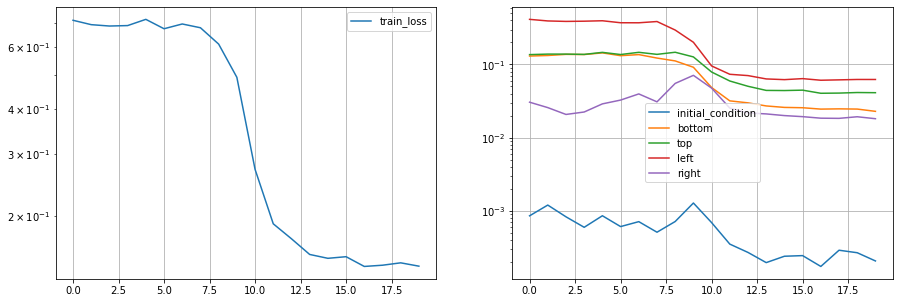

In [39]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1.plot(hist['train_loss'], label="train_loss")
ax1.grid(True)
ax1.legend()
ax1.set_yscale("log")
for boco in pde.bocos:
    ax2.plot(hist['bocos'][boco.name], label=boco.name)
ax2.legend()
ax2.grid(True)
ax2.set_yscale("log")
plt.show()

[None]


Traceback (most recent call last):
  File "/home/sebastianm/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py", line 216, in process
    func(*args, **kwargs)
  File "/home/sebastianm/anaconda3/lib/python3.7/site-packages/matplotlib/animation.py", line 953, in _start
    self._init_draw()
  File "/home/sebastianm/anaconda3/lib/python3.7/site-packages/matplotlib/animation.py", line 1732, in _init_draw
    self._draw_frame(next(self.new_frame_seq()))
  File "/home/sebastianm/anaconda3/lib/python3.7/site-packages/matplotlib/animation.py", line 1755, in _draw_frame
    self._drawn_artists = self._func(framedata, *self._args)
  File "<ipython-input-48-ea5bbd3905e8>", line 24, in anim
    return plot(ax1, p[i], t[i])
  File "<ipython-input-48-ea5bbd3905e8>", line 16, in plot
    ax1.plot_surface(X, Y, np.array(p).reshape((len(y),len(x))), cmap=cm.coolwarm, linewidth=0, antialiased=False)
ValueError: cannot reshape array of size 1 into shape (20,10)


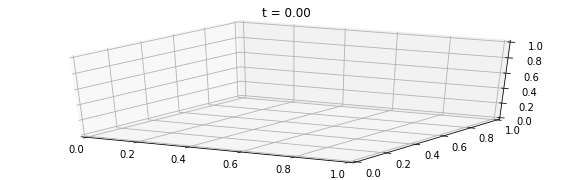

In [48]:
# evaluate the solution
x = np.linspace(0,0.3,10)
y = np.linspace(0,1,20)
t = np.linspace(0,200,100)
p = []
for _t in t:
    pde.evaluate({'x': x, 'y': y, 't': np.array([_t])})
    _p = pde.outputs['p']
    p.append(_p)

from matplotlib import animation, rc
rc('animation', html='html5')

def plot(ax1,p, t):
    ax1.clear()
    tit = ax1.set_title(f't = {t:.2f}')
    X, Y = np.meshgrid(x, y)
    ax1.plot_surface(X, Y, p.reshape((len(y),len(x))), cmap=cm.coolwarm, linewidth=0, antialiased=False)
    ax1.set_xlim([0,1])
    ax1.set_ylim([0,1])
    ax1.set_zlim([0,1])
    return [tit]

def get_anim(fig, ax1, p, t):
    def anim(i):
        return plot(ax1, p[i], t[i])
    return anim
    
fig = plt.figure(figsize=(10,3))
ax1 = fig.add_subplot(1, 1, 1, projection='3d')
animate = get_anim(fig, ax1, p, t)
anim = animation.FuncAnimation(fig, animate, frames=len(t), interval=300, blit=True)

In [13]:
anim

In [17]:
print(np.shape(p))

(100, 400)
